In [8]:
%load_ext pycodestyle_magic
%flake8_on
%load_ext autoreload

The pycodestyle_magic extension is already loaded. To reload it, use:
  %reload_ext pycodestyle_magic
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [9]:
%autoreload 2

In [16]:
"""Python code to classify X-ray sources by color.

Functionalities needed.

1. Line, step, scatter and histogram and kde plots
2. Plot net counts, bg/net and S/N ratio
3. Process detectors seperately and combine colors only optional
4. Cross-match 4XMM and CSC sources.
5. Compare with Haley et al. sources.
"""


import copy
import os
import glob2
import warnings
import xspec
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from astropy.io import fits
from astropy.stats import sigma_clipped_stats
from scipy.ndimage import median_filter


# Plot functions
def set_plotparams(plottype):
    """Set plot parameters."""
    if plottype == 'notebook':
        plt.rcParams["figure.figsize"] = (20, 15)
        plt.rcParams["axes.titlesize"] = 24
        plt.rcParams["axes.labelsize"] = 24
        plt.rcParams["lines.linewidth"] = 3
        plt.rcParams["lines.markersize"] = 15
        plt.rcParams["xtick.labelsize"] = 20
        plt.rcParams["ytick.labelsize"] = 20
        plt.rcParams["legend.fontsize"] = 20
        plt.rcParams['xtick.major.size'] = 16
        plt.rcParams['xtick.minor.size'] = 8
        plt.rcParams['ytick.major.size'] = 16
        plt.rcParams['ytick.minor.size'] = 8
        plt.rcParams['xtick.top'] = True
        plt.rcParams['ytick.right'] = True
        plt.rcParams['xtick.direction'] = 'inout'
        plt.rcParams['ytick.direction'] = 'inout'
    elif plottype == 'presentation':
        plt.rcParams["figure.figsize"] = (8, 6)
        plt.rcParams["axes.titlesize"] = 16
        plt.rcParams["axes.labelsize"] = 16
        plt.rcParams["lines.linewidth"] = 3
        plt.rcParams["lines.markersize"] = 5
        plt.rcParams["xtick.labelsize"] = 14
        plt.rcParams["ytick.labelsize"] = 14
        plt.rcParams["legend.fontsize"] = 14
        plt.rcParams['xtick.major.size'] = 8
        plt.rcParams['xtick.minor.size'] = 4
        plt.rcParams['ytick.major.size'] = 8
        plt.rcParams['ytick.minor.size'] = 4
        plt.rcParams['xtick.top'] = True
        plt.rcParams['ytick.right'] = True
        plt.rcParams['xtick.direction'] = 'inout'
        plt.rcParams['ytick.direction'] = 'inout'
    elif plottype == 'paper1':
        plt.rcParams["figure.figsize"] = (4, 3)
        plt.rcParams["axes.titlesize"] = 14
        plt.rcParams["axes.labelsize"] = 12
        plt.rcParams["lines.linewidth"] = 2
        plt.rcParams["lines.markersize"] = 2
        plt.rcParams["xtick.labelsize"] = 10
        plt.rcParams["ytick.labelsize"] = 10
        plt.rcParams["legend.fontsize"] = 10
        plt.rcParams['xtick.major.size'] = 6
        plt.rcParams['xtick.minor.size'] = 3
        plt.rcParams['ytick.major.size'] = 6
        plt.rcParams['ytick.minor.size'] = 3
        plt.rcParams['xtick.top'] = True
        plt.rcParams['ytick.right'] = True
        plt.rcParams['xtick.direction'] = 'in'
        plt.rcParams['ytick.direction'] = 'in'
    elif plottype == 'paper2':
        plt.rcParams["figure.figsize"] = (8, 6)
        plt.rcParams["axes.titlesize"] = 20
        plt.rcParams["axes.labelsize"] = 12
        plt.rcParams["lines.linewidth"] = 2
        plt.rcParams["lines.markersize"] = 2
        plt.rcParams["xtick.labelsize"] = 10
        plt.rcParams["ytick.labelsize"] = 10
        plt.rcParams["legend.fontsize"] = 15
        plt.rcParams['xtick.major.size'] = 6
        plt.rcParams['xtick.minor.size'] = 3
        plt.rcParams['ytick.major.size'] = 6
        plt.rcParams['ytick.minor.size'] = 3
        plt.rcParams['xtick.top'] = True
        plt.rcParams['ytick.right'] = True
        plt.rcParams['xtick.direction'] = 'in'
        plt.rcParams['ytick.direction'] = 'in'


def plotline_scatter(xdatas, ydatas,
                     pl_types=None, axs=None, xlabel=None,
                     ylabel=None, pl_labels=None, styles=None, colors=None,
                     yscale='linear', title=None, ylim=None, figsize=None,
                     cmap='coolwarm_r', zdatas=None, zdata_label=None,
                     plot_cbar=True, cbar_ax=None, highlight=False):
    """Plot line, step and scatter plots."""
    if zdatas is None:
        zdatas = [None]*len(ydatas)
    if pl_types is None:
        pl_types = ['line']*len(ydatas)
    if axs is None:
        fig, axs = plt.subplots(figsize=figsize)
    if pl_labels is None:
        pl_labels = [None]*len(ydatas)
    if styles is None:
        styles = ['-']*len(ydatas)
    if colors is None:
        if len(ydatas) <= 4:
            colors = ['#004488', '#ddaa33', '#bb5566', '#000000']
        elif len(ydatas) <= 9:
            colors = ['#000000', '#00287c', '#89003e', '#6e5700', '#008f75',
                      'b57de9', 'ff9468', '9cee81', '00d2ff']
        else:
            warnings.warn('Too many plot elements. Colors will be repeated.')
            colors = (['#000000', '#00287c', '#89003e', '#6e5700', '#008f75',
                      '#b57de9', '#ff9468', '#9cee81', '#00d2ff'] *
                      (int(len(ydatas/9)+1)))

    axs.set_title(title)
    if ylim is not None:
        axs.set_ylim(ylim[0], ylim[1])
    axs.set_xlabel(xlabel)
    axs.set_xscale('log')
    axs.set_yscale(yscale)
    axs.set_ylabel(ylabel)
    for i, pl_type in enumerate(pl_types):
        if pl_type == 'line':
            axs.plot(xdatas[i], ydatas[i], linestyle=styles[i],
                     label=pl_labels[i], color=colors[i])
        elif pl_type == 'scatter':
            if styles[i] == '-':
                styles[i] = '.'
            if zdatas[i] is not None:
                
                sc_plot = axs.scatter(
                    xdatas[i], ydatas[i], c=zdatas[i], marker=styles[i],
                    label=pl_labels[i], cmap=cmap,
                    norm=Normalize(-3, 15, True))
                if plot_cbar and cbar_ax is None:
                    cbar = plt.colorbar(mappable=sc_plot, ax=axs,
                                        label=zdata_label)
                elif plot_cbar:
                    cbar = plt.colorbar(mappable=sc_plot, cax=cbar_ax,
                                        label=zdata_label)
            else:
                plt.rcParams["lines.markersize"] = 4
                if highlight:
                    if i > 0:
                        plt.rcParams["lines.markersize"] = 16
                print(plt.rcParams["lines.markersize"])
                axs.scatter(xdatas[i], ydatas[i], marker=styles[i],
                            label=pl_labels[i], color=colors[i])
        elif pl_type == 'step':
            ydatas[i] = np.append(ydatas[i], ydatas[i].copy()[-1])
            axs.step(xdatas[i], ydatas[i], where='post', linestyle=styles[i],
                     label=pl_labels[i], color=colors[i])
        else:
            print(pl_types)
            raise ValueError("pl_type can only be 'line' or 'scatter'. Got " +
                             pl_type)
    axs.legend()
    return axs


def plothist(data_arr, data2=None, axs=None, bins=None, xlabel=None,
             ylabel=None, pl_labels=None, pl_type=None, cbar_label=None,
             colors=None):
    """Plot 1D and 2D histograms."""
    if axs is None:
        fig, axs = plt.subplots()
    if pl_type is None:
        pl_type = 'withoutkde'
    if pl_labels is None and isinstance(data_arr[0], (list, np.ndarray)):
        pl_labels = [None]*len(data_arr)
    if colors is None:
        if len(data_arr) <= 4:
            colors = ['#004488', '#ddaa33', '#bb5566', '#000000']
        elif len(data_arr) <= 9:
            colors = ['#000000', '#00287c', '#89003e', '#6e5700', '#008f75',
                      'b57de9', 'ff9468', '9cee81', '00d2ff']
        else:
            warnings.warn('Too many plot elements. Colors will be repeated.')
            colors = (['#000000', '#00287c', '#89003e', '#6e5700', '#008f75',
                      '#b57de9', '#ff9468', '#9cee81', '#00d2ff'] *
                      (int(len(data_arr/9)+1)))
    if colors is None and data2 is not None:
        colors = 'plasma_r'
    axs.set_xlabel(xlabel)
    if data2 is None:
        if pl_type == 'withkde':
            if ylabel is None:
                ylabel = 'Density per bin'
            axs.set_ylabel(ylabel)
            axs.hist(data_arr, bins=bins, density=True, label=pl_labels,
                     color=colors[:len(data_arr)])[:-1]
            if not isinstance(data_arr[0], (list, np.ndarray)):
                data_arr = [data_arr]
            for i, data in enumerate(data_arr):
                if pl_labels[i] is not None:
                    sns.kdeplot(x=data, label=pl_labels[i]+'_kde', ax=axs,
                                color=colors[i])
                else:
                    sns.kdeplot(x=data, ax=axs)
            axs.legend()
        else:
            if ylabel is None:
                ylabel = '# per bin'
            axs.set_ylabel(ylabel)
            axs.hist(data_arr, bins=bins, label=pl_labels,
                     color=colors[:len(data_arr)])[:-1]
            axs.legend()
    else:
        # 2D hist
        axs.set_ylabel(ylabel)
        if bins is None:
            bins = 10
        if pl_type == 'withkde':
            histplot = axs.hist2d(data_arr, data2, bins=bins, density=True,
                                  cmap=colors)[-1]
            sns.kdeplot(x=data_arr, y=data2, ax=axs)
            cbar = plt.colorbar(mappable=histplot, ax=axs, color='k')
            if cbar_label is None:
                cbar_label = 'Density per bin'
            cbar.set_label(cbar_label)
        else:
            histplot = axs.hist2d(data_arr, data2)[-1]
            cbar = plt.colorbar(mappable=histplot, ax=axs)
            if cbar_label is None:
                cbar_label = '# per bin'
            cbar.set_label(cbar_label)
    return axs


def plot_subplots(numrows, numcols, xdatas_arr, ydatas_arr, title=None,
                  subp_types_arr=None, pl_types_arr=None, xlabel_arr=None,
                  ylabel_arr=None, pl_labels_arr=None, styles_arr=None,
                  bins_arr=None, cbar_labels=None, yscale_arr=None,
                  ylim_arr=None, colors_arr=None, zdatas_arr=None,
                  zdata_labels=None, common_cbar=False):
    """Plot subplots"""
    if subp_types_arr is None:
        subp_types_arr = [['linescatter']*numcols]*numrows
    if pl_types_arr is None:
        pl_types_arr = [[None]*numcols]*numrows
    if pl_labels_arr is None:
        pl_labels_arr = [[None]*numcols]*numrows
    if xlabel_arr is None:
        xlabel_arr = [[None]*numcols]*numrows
    if ylabel_arr is None:
        ylabel_arr = [[None]*numcols]*numrows
    if styles_arr is None:
        styles_arr = [[None]*numcols]*numrows
    if bins_arr is None:
        bins_arr = [[None]*numcols]*numrows
    if cbar_labels is None:
        cbar_labels = [[None]*numcols]*numrows
    if yscale_arr is None:
        yscale_arr = [['linear']*numcols]*numrows
    if ylim_arr is None:
        ylim_arr = [[None]*numcols]*numrows
    if colors_arr is None:
        colors_arr = [[None]*numcols]*numrows
    if zdatas_arr is None:
        zdatas_arr = [[None]*numcols]*numrows
    if zdata_labels is None:
        zdata_labels = [[None]*numcols]*numrows

    # Checking if all the arrays are 2D
    if not isinstance(subp_types_arr[0], list):
        subp_types_arr = list(map(list, zip(*[subp_types_arr])))
    if not isinstance(pl_labels_arr[0], list):
        pl_labels_arr = list(map(list, zip(*[pl_labels_arr])))
    if not isinstance(xlabel_arr[0], list):
        xlabel_arr = list(map(list, zip(*[xlabel_arr])))
    if not isinstance(ylabel_arr[0], list):
        ylabel_arr = list(map(list, zip(*[ylabel_arr])))

    # Calling the figure and axes
    fig, axes = plt.subplots(numrows, numcols)
    fig.suptitle(title)
    if numrows > 1 or numcols > 1:
        axes = axes.reshape(numrows, numcols)
    else:
        axes = [[axes]]
    plt.rcParams["legend.fontsize"] = (
        float(plt.rcParams["legend.fontsize"]) - 4*(numcols-1))
    print(plt.rcParams["legend.fontsize"])
    if numrows == 1 and numcols == 1:
        initial_figsize = plt.rcParams["figure.figsize"]
        plt.rcParams["figure.figsize"] = (12, 9)
    if common_cbar:
        fig.subplots_adjust(right=0.9)
        cbar_ax = fig.add_axes([0.95, 0.07, 0.02, 0.9])
    else:
        cbar_ax = None
    for i in range(numrows):
        for j in range(numcols):
            if subp_types_arr[i][j] == 'linescatter':
                plotline_scatter(
                    xdatas_arr[i][j], ydatas_arr[i][j], pl_types_arr[i][j],
                    axs=axes[i][j], xlabel=xlabel_arr[i][j],
                    ylabel=ylabel_arr[i][j], pl_labels=pl_labels_arr[i][j],
                    styles=styles_arr[i][j], yscale=yscale_arr[i][j],
                    ylim=ylim_arr[i][j], colors=colors_arr[i][j],
                    zdatas=zdatas_arr[i][j], zdata_label=zdata_labels[i][j],
                    cbar_ax=cbar_ax, plot_cbar=True)
            elif subp_types_arr[i][j] == 'hist':
                plothist(xdatas_arr[i][j], ydatas_arr[i][j], axs=axes[i][j],
                         bins=bins_arr[i][j], xlabel=xlabel_arr[i][j],
                         ylabel=ylabel_arr[i][j],
                         pl_labels=pl_labels_arr[i][j],
                         pl_type=pl_types_arr[i][j],
                         cbar_label=cbar_labels[i][j], colors=colors_arr[i][j])
            else:
                print('subplot type can be linescatter or hist')
    if cbar_ax is None:
        plt.tight_layout()
    else:
        plt.tight_layout(rect=[0, 0, 0.95, 1.0])
        pass
    plt.rcParams["legend.fontsize"] = (
        float(plt.rcParams["legend.fontsize"]) + 4*(numcols-1))
    if numrows == 1 and numcols == 1:
        plt.rcParams["figure.figsize"] = initial_figsize
    return fig, axes


def filter_specs(net_counts, bg_counts, min_netcounts=None, maxbg_ratio=None,
                 det_mask=None):
    """Filter specs."""
    bgratio = bg_counts/net_counts
    filter_mask = det_mask.copy()
    if det_mask is None:
        det_mask = np.ones(len(net_counts), dtype=bool)
    if min_netcounts is not None:
        filter_mask[net_counts < min_netcounts] = False
    if maxbg_ratio is not None:
        filter_mask[bgratio > maxbg_ratio] = False
    return filter_mask


def load_sim_xmmspec(folder, background=False, numsim=20000, basename=None):
    """Load simulated XMM MOS and PN spectra."""
    if basename is None:
        basename = ''
    pn_specs = np.zeros((numsim, 4096), dtype=np.float64)
    pn_bgspecs = np.zeros((numsim, 4096), dtype=np.float64)
    mos_specs = np.zeros((numsim, 2400), dtype=np.float64)
    mos_bgspecs = np.zeros((numsim, 2400), dtype=np.float64)
    pn_mask = np.zeros(numsim, dtype=bool)
    mos_mask = np.zeros(numsim, dtype=bool)
    for i in range(numsim):
        pnfile = folder + basename + str(i) + '_PN.fak'
        mosfile = folder + basename + str(i) + '_MOS.fak'
        if os.path.isfile(pnfile):
            pn_mask[i] = True
            spec_data = fits.open(pnfile)
            pn_specs[i] = spec_data[1].data['counts']
            if background:
                bgfile = pnfile[:-4] + '_bkg.fak'
                bgspec_data = fits.open(bgfile)
                pn_bgspecs[i] = bgspec_data[1].data['counts']*(
                    spec_data[1].header['backscal'] /
                    bgspec_data[1].header['backscal'])
        if os.path.isfile(mosfile):
            mos_mask[i] = True
            spec_data = fits.open(mosfile)
            mos_specs[i] = spec_data[1].data['counts']
            if background:
                bgfile = mosfile[:-4] + '_bkg.fak'
                bgspec_data = fits.open(bgfile)
                mos_bgspecs[i] = bgspec_data[1].data['counts']*(
                    spec_data[1].header['backscal'] /
                    bgspec_data[1].header['backscal'])
    return ([pn_mask, mos_mask], [pn_specs, mos_specs],
            [pn_bgspecs, mos_bgspecs])


def load_xmmspec_observed(folder, background=False):
    """Load Observed XMM spec."""
    pn_specfiles = glob2.glob(folder + '*PN_combined_src_grp.ds')
    print('# PN files init:', len(pn_specfiles))
    mos_specfiles = glob2.glob(folder + '*MOS_combined_src_grp.ds')
    print('# PN files init:', len(pn_specfiles))
    num_combined = len(glob2.glob(folder + '*PN_MOS_combined_src.png'))
    num_sources = len(pn_specfiles) + len(mos_specfiles) - num_combined
    pn_specs = np.zeros((num_sources, 4096), dtype=float)
    pn_mask = np.zeros(num_sources, dtype=bool)
    mos_specs = np.zeros((num_sources, 2400), dtype=float)
    mos_mask = np.zeros(num_sources, dtype=bool)
    pn_bgspecs = np.zeros((num_sources, 4096), dtype=float)
    mos_bgspecs = np.zeros((num_sources, 2400), dtype=float)
    source_nums = np.zeros(num_sources, dtype=object)
    for i in range(num_sources):
        if i < len(pn_specfiles):
            pn_mask[i] = True
            source_nums[i] = pn_specfiles[i].split('/')[-1].split('_')[0]
            spec_data = fits.open(pn_specfiles[i])
            pn_specs[i] = spec_data[1].data['counts']
            if background:
                bgfile = pn_specfiles[i][:-10] + 'bkg_grp.ds'
                bg_data = fits.open(bgfile)
                pn_bgspecs[i] = bg_data[1].data['counts']*(
                    spec_data[1].header['backscal'] /
                    bg_data[1].header['backscal'])
            if os.path.isfile(folder + source_nums[i] +
                              '_MOS_combined_src_grp.ds'):
                mosfile = folder + source_nums[i] + '_MOS_combined_src_grp.ds'
                spec_data = fits.open(mosfile)
                mos_mask[i] = True
                mos_specfiles.remove(mosfile)
                mos_specs[i] = spec_data[1].data['counts']
                if background:
                    bgfile = mosfile[:-10] + 'bkg_grp.ds'
                    bg_data = fits.open(bgfile)
                    mos_bgspecs[i] = bg_data[1].data['counts']*(
                        spec_data[1].header['backscal'] /
                        bg_data[1].header['backscal'])
        else:
            mos_mask[i] = True
            source_nums[i] = (
                mos_specfiles[i-len(pn_bgspecs)].split('/')[-1].split('_')[0])
            spec_data = fits.open(mos_specfiles[i-len(pn_bgspecs)])
            mos_specs[i] = spec_data[1].data['counts']
            if background:
                bgfile = mosfile[:-10] + 'bkg_grp.ds'
                bg_data = fits.open(bgfile)
                mos_bgspecs[i] = bg_data[1].data['counts']*(
                    spec_data[1].header['backscal'] /
                    bg_data[1].header['backscal'])
    return (source_nums, [pn_mask, pn_specs, pn_bgspecs],
            [mos_mask, mos_specs, mos_bgspecs])


def load_chandraspec_sim(folder, background=False, num_sim=10000,
                         basename=None):
    """Load Chandra simulate spectra."""
    if basename is None:
        basename = ''
    specs = np.zeros((num_sim, 1024), dtype=float)
    bg_specs = np.zeros((num_sim, 1024), dtype=float)
    for i in range(num_sim):
        spec_file = folder + basename + str(i) + '.fak'
        spec_data = fits.open(spec_file)
        specs[i] = spec_data[1].data['counts']
        if background:
            bgspec_file = folder + basename + str(i) + '_bkg.fak'
            bg_data = fits.open(bgspec_file)
            bg_specs[i] = bg_data[1].data['counts'] * (
                spec_data[1].header['backscal']/bg_data[1].header['backscal'])
    return specs, bg_specs


def load_chandraspec_obs(folder, background=True):
    spec_files = glob2.glob(folder + '/*/*_combined_src.pi')
    spec_names = np.zeros(len(spec_files), dtype=object)
    specs = np.zeros((len(spec_files), 1024), dtype=float)
    bgspecs = np.zeros((len(spec_files), 1024), dtype=float)
    for i, spec_file in enumerate(spec_files):
        spec_file_base = os.path.basename(spec_file)
        spec_names[i] = spec_file_base.split('_')[0]
        spec_data = fits.open(spec_file)
        specs[i] = spec_data[1].data['counts']
        if background:
            bg_file = spec_file[:-6] + 'bkg.pi'
            bg_data = fits.open(bg_file)
            bgspecs[i] = bg_data[1].data['counts'] * (
                spec_data[1].header['backscal']/bg_data[1].header['backscal'])
    return spec_names, specs, bgspecs


def get_counts_enrange(spec, en_range, ebin_channels, floor_counts=None):
    """Get counts in the given energy range."""
    elow_index = np.where(ebin_channels >= en_range[0])[0][0]
    ehigh_index = np.where(ebin_channels <= en_range[1])[0][-1]
    if len(spec.shape) == 1:
        counts_enrange = np.sum(spec[elow_index:ehigh_index])
    else:
        counts_enrange = np.sum(spec[:, elow_index:ehigh_index], axis=1)
    if floor_counts is not None:
        if len(spec.shape) == 1:
            if counts_enrange < floor_counts:
                counts_enrange = floor_counts
        else:
            counts_enrange[counts_enrange < floor_counts] = floor_counts
    return counts_enrange, elow_index, ehigh_index


def get_counts_enrange2(spec, en_range, ebin_channels, floor_counts=None):
    """Another method to get counts"""
    en_mask = np.logical_and(ebin_channels >= en_range[0],
                             ebin_channels <= en_range[1])
    elow_index = np.where(en_mask)[0][0]
    ehigh_index = np.where(en_mask)[0][-1]
    if len(spec.shape) == 1:
        counts_enrange = np.sum(spec[en_mask])
    else:
        counts_enrange = np.sum(spec[:, en_mask], axis=1)
    if floor_counts is not None:
        if len(spec.shape) == 1:
            if counts_enrange < floor_counts:
                floor_counts = 0
        else:
            counts_enrange[counts_enrange < floor_counts] = 0
    return counts_enrange, elow_index, ehigh_index


def get_summary_det(src_spec, bg_spec, ebins, en_range=None,
                    det_mask=None, src_sig=None):
    """Get summary of the spectra for given detector."""
    if en_range is None:
        en_range = [0.2, 10.0]
    net_spec = src_spec - bg_spec
    net_counts, en_lowindex, en_highindex = get_counts_enrange(
        net_spec, en_range, ebins)
    if det_mask is None:
        det_mask = np.ones(len(src_spec), dtype=bool)
    det_mask[net_counts < 1] = False
    net_spec = net_spec[:, en_lowindex:en_highindex]
    bg_counts = get_counts_enrange(bg_spec, en_range, ebins)[0]
    norm_spec = (net_spec.transpose()/net_counts).transpose()
    bg_counts[bg_counts/net_counts < 1.0E-6] = 1.0E-6
    if src_sig is not None:
        det_mask[net_counts < src_sig*bg_counts**0.5] = False
    return (norm_spec, net_counts, bg_counts, det_mask, en_lowindex,
            en_highindex)


def join_lists_3d(list1_2d, list2_2d, list3_2d=None):
    """Join 2 lists along another dimention."""
    joined_list = []
    for i, row in enumerate(list1_2d):
        if list3_2d is None:
            joined_list.append([row, list2_2d[i]])
        else:
            joined_list.append([row, list2_2d[i], list3_2d[i]])
    return joined_list


def join_string_lists(list1_1d, list2_1d):
    """Outer product like addition of 2 strings"""
    joined_list = []
    join_list_row = None
    for string2 in list2_1d:
        for string1 in list1_1d:
            if join_list_row is None:
                join_list_row = [string1 + ' [' + string2 + ']']
            else:
                join_list_row.append(string1 + ' [' + string2 + ']')
        joined_list.append(copy.copy(join_list_row))
        join_list_row = None
    return joined_list


def plot_spec_summary(sim_src_spec_arr, sim_bg_spec_arr, obs_src_spec_arr,
                      obs_bg_spec_arr, ebins_arr, det_names=None, e_range=None,
                      plot=True, det_mask_sim_arr=None, det_mask_obs_arr=None):
    """Plot spec summary.

    1. Mean normalized spectra (also add error fn.)
    2. Net count, Net count/Bg counts, signal-to-noise ratio plots for
       each det.
    """
    norm_specs = []
    netcounts = []
    bgcounts = []
    ebins_lowhigh_indices = []
    if plot:
        ebins_refined = []
        norm_specs_forplot = []
        netcounts_forplot = []
        bg_net_ratio_forplot = []
        s_to_n_ratio_forplot = []
    if det_mask_sim_arr is None:
        det_mask_sim_arr = [None]*len(sim_src_spec_arr)
    if det_mask_obs_arr is None:
        det_mask_obs_arr = [None]*len(obs_src_spec_arr)
    if det_names is None:
        det_names = ['']*len(sim_src_spec_arr)

    for i, sim_src_specs in enumerate(sim_src_spec_arr):
        (sim_norm_spec, sim_netcounts, sim_bgcounts, sim_detmask,
         en_lowindex, en_highindex) = get_summary_det(
            sim_src_specs, sim_bg_spec_arr[i], ebins_arr[i], e_range,
            copy.copy(det_mask_sim_arr[i]), 3.0)
        (obs_norm_spec, obs_netcounts, obs_bgcounts,
         obs_detmask) = get_summary_det(
            obs_src_spec_arr[i], obs_bg_spec_arr[i], ebins_arr[i], e_range,
            copy.copy(det_mask_obs_arr[i]), 3.0)[:4]
        norm_specs.append([sim_norm_spec, obs_norm_spec])
        netcounts.append([sim_netcounts, obs_netcounts])
        bgcounts.append([sim_bgcounts, obs_bgcounts])
        ebins_lowhigh_indices.append([en_lowindex, en_highindex])
        det_mask_sim_arr[i] = sim_detmask
        det_mask_obs_arr[i] = obs_detmask
        if plot:
            ebins_refined.append(ebins_arr[i][en_lowindex:en_highindex])
            filter_size = int(0.2/(ebins_arr[i][en_lowindex+1] -
                                   ebins_arr[i][en_lowindex]))
            norm_specs_forplot.append([
                median_filter(np.mean(sim_norm_spec[sim_detmask], axis=0),
                              size=filter_size),
                median_filter(np.mean(obs_norm_spec[obs_detmask], axis=0),
                              size=filter_size)])
            netcounts_forplot.append([np.log10(sim_netcounts[sim_detmask]),
                                      np.log10(obs_netcounts[obs_detmask])])
            bg_net_ratio_forplot.append([
                np.log10((sim_bgcounts/sim_netcounts)[sim_detmask]),
                np.log10((obs_bgcounts/obs_netcounts)[obs_detmask])])
            s_to_n_ratio_forplot.append([
                np.log10((sim_netcounts /
                         (sim_netcounts+sim_bgcounts)**0.5)[sim_detmask]),
                np.log10((obs_netcounts /
                         (obs_netcounts+obs_bgcounts)**0.5)[obs_detmask])]
            )

    if plot is False:
        return (norm_specs, netcounts, bgcounts, ebins_lowhigh_indices,
                det_mask_sim_arr, det_mask_obs_arr)

    for i, norm_spec_sim_obs in enumerate(norm_specs_forplot):
        plotline_scatter([ebins_refined[i], ebins_refined[i]],
                         norm_spec_sim_obs, xlabel='Energy (keV)',
                         ylabel='Smoothed mean normalized spectra',
                         pl_labels=['Sim. ' + det_names[i] + ' spectra',
                                    'Obs. ' + det_names[i] + ' spectra'],
                         figsize=(12, 9))

    hist1D_joined_list = join_lists_3d(netcounts_forplot,
                                       bg_net_ratio_forplot,
                                       s_to_n_ratio_forplot)
    plot_subplots(
        len(norm_specs_forplot), 3, hist1D_joined_list,
        [[None]*3]*len(norm_specs_forplot),
        xlabel_arr=join_string_lists(
            ['log (Net counts)', 'log (Bg counts/Net counts)',
             'Signal-to-Noise Ratio'], det_names),
        ylabel_arr=[['# density per bin']*3]*len(norm_specs_forplot),
        subp_types_arr=[['hist']*3]*3,
        pl_types_arr=[['withkde']*3]*3,
        pl_labels_arr=[
            [['Simulated MSPs', 'Observed sources']]*3]*len(norm_specs_forplot)
    )

    return (norm_specs, netcounts, bgcounts, ebins_lowhigh_indices,
            det_mask_sim_arr, det_mask_obs_arr)


def get_enbins_centres(resp_file):
    """Get Energy bins and centres."""
    response = fits.open(resp_file)
    energy_bins = response[2].data
    emin = energy_bins['E_MIN']
    emax = energy_bins['E_MAX']
    e_centres = 0.5*(emin + emax)
    return np.append(emin, emax[-1]), e_centres


def get_line_cont_counts(src_spec, bg_spec, ebins, net_spec=None,
                         range_fe=None, cont1_range=None, cont2_range=None):
    """Get line and continuum counts"""
    if net_spec is None:
        net_spec = src_spec - bg_spec
    if range_fe is None:
        range_fe = [6.2, 7.2]
    if cont1_range is None:
        cont1_range = [5.8, 6.2]
    if cont2_range is None:
        cont2_range = [7.2, 7.6]
    sim_fe_net = get_counts_enrange(net_spec, range_fe, ebins,
                                    floor_counts=None)[0]
    sim_fe_src = get_counts_enrange(src_spec, range_fe, ebins,
                                    floor_counts=None)[0]
    sim_fe_bg = get_counts_enrange(bg_spec, range_fe, ebins,
                                   floor_counts=None)[0]

    sim_cont1_net = get_counts_enrange(net_spec, cont1_range, ebins,
                                       floor_counts=0)[0]
    sim_cont1_src = get_counts_enrange(src_spec, cont1_range, ebins,
                                       floor_counts=0)[0]
    sim_cont1_bg = get_counts_enrange(bg_spec, cont1_range, ebins,
                                      floor_counts=0)[0]

    sim_cont2_net = get_counts_enrange(net_spec, cont2_range, ebins,
                                       floor_counts=0)[0]
    sim_cont2_src = get_counts_enrange(src_spec, cont2_range, ebins,
                                       floor_counts=0)[0]
    sim_cont2_bg = get_counts_enrange(bg_spec, cont2_range, ebins,
                                      floor_counts=0)[0]
    return ([sim_fe_net, sim_fe_src, sim_fe_bg],
            [sim_cont1_net, sim_cont1_src, sim_cont1_bg],
            [sim_cont2_net, sim_cont2_src, sim_cont2_bg])


def get_colors_basic(counts_line_net, counts_cont1_net, counts_cont2_net,
                     mask=None):
    """Get colors."""
    if mask is None:
        mask = np.ones(len(counts_line_net), dtype=bool)
    colors = counts_line_net/(counts_cont1_net + counts_cont2_net)
    colors[~mask] = np.nan
    return colors


def get_colors_binned(colors, src_prop, srcprop_bins, mask=None):
    """Get expected color for given bins."""
    mean_colors = np.zeros(len(srcprop_bins)-1)
    median_colors = np.zeros(len(srcprop_bins)-1)
    colors_std = np.zeros(len(srcprop_bins)-1)
    for i, bin_edge in enumerate(srcprop_bins[:-1]):
        mean_colors[i], median_colors[i], colors_std[i] = get_colors_perbin(
            colors, src_prop, [bin_edge, srcprop_bins[i+1]])
    return mean_colors, colors_std, median_colors


def get_colors_perbin(colors, src_prop, bin_edges):
    """Get expected color for each bin"""
    mask = np.where(np.logical_and(np.logical_and(src_prop >= bin_edges[0],
                                                  src_prop < bin_edges[1]),
                                   np.isfinite(colors)))
    bin_colors = colors[mask]
    # return np.mean(bin_colors), np.median(bin_colors), np.std(bin_colors)
    return sigma_clipped_stats(bin_colors, sigma=5)


def bin_colors_withprop(colors, prop_list, prop_listnames, obs_colors,
                        obs_props, prop_binslist=None, plot=True, plot_det=''):
    """Bin colors with properties."""
    mean_colors_withprop = []
    median_colors_withprop = []
    std_colors_withprop = []
    if prop_binslist is None:
        prop_binslist = []
        no_given_bins = True
    else:
        no_given_bins = False
    for i in range(len(prop_list)):
        print('Calaculating mean and standard deviation in colors vs. ' +
              prop_listnames[i])
        if no_given_bins:
            prop_bins = 10**np.linspace(
                np.log10(max(0.00001, np.min(prop_list[i]))),
                np.log10(min(1.0E+5, np.max(prop_list[i]))), 21)
            prop_binslist.append(prop_bins)
        mean_colors, colors_std, median_colors = get_colors_binned(
            colors, prop_list[i], prop_binslist[i])
        mean_colors_withprop.append(mean_colors)
        std_colors_withprop.append(colors_std)
        median_colors_withprop.append(median_colors)
        if plot:
            plot_subplots(
                1, 2, [[[prop_list[i], get_bincenters(prop_binslist[i]),
                        get_bincenters(prop_binslist[i])],
                       [obs_props[i], get_bincenters(prop_binslist[i]),
                        get_bincenters(prop_binslist[i])]]],
                [[[colors, mean_colors + 2*colors_std,
                  mean_colors - 2*colors_std],
                 [obs_colors, mean_colors + 2*colors_std,
                  mean_colors - 2*colors_std]]],
                subp_types_arr=[['linescatter', 'linescatter']],
                pl_types_arr=[[['scatter', 'step', 'step'],
                              ['scatter', 'step', 'step']]],
                xlabel_arr=[[prop_listnames[i], prop_listnames[i]]],
                ylabel_arr=[['Simulated source colors',
                            'Observed source colors']],
                pl_labels_arr=[[['Colors', 'Mean + 2.0std', 'Mean - 2.0std'],
                                ['Colors', 'Mean + 2.0std', 'Mean - 2.0std']]],
                title='Color vs ' + prop_listnames[i] + ' for ' + plot_det,
                ylim_arr=[[(0, 5), (0, 5)], [(0, 5), (0, 5)]])
    return (prop_binslist, mean_colors_withprop, std_colors_withprop,
            median_colors_withprop)


def load_alldata(response_paths, sim_spec_paths, obs_spec_paths, range_fe=None,
                 range_cont1=None, range_cont2=None, en_range=None,
                 both_sims=False, sim_basename='msp_highNH_',
                 obs_basename='ip_'):
    """Main function to process the entire dataset."""
    det_enbins_arr = []
    det_ecenters_arr = []
    sim_srcspec_arr = []
    sim_bgspec_arr = []
    sim_mask_arr = []
    obs_srcspec_arr = []
    obs_bgspec_arr = []
    obs_mask_arr = []
    obs_src_nums = []
    det_names = ['PN', 'MOS', 'ACIS']
    if range_fe is None:
        range_fe = [6.2, 7.2]
    if range_cont1 is None:
        range_fe = [5.8, 6.2]
    if range_cont2 is None:
        range_fe = [7.2, 7.6]
    if en_range is None:
        en_range = [2, 10]
    for i, response in enumerate(response_paths):
        # Load energy bins
        det_ebins, det_ecenters = get_enbins_centres(response)
        det_enbins_arr.append(det_ebins)
        det_ecenters_arr.append(det_ecenters)
        # Load spectra
        if i == 0:
            ([sim1_mask, sim2_mask], [sim1_specs, sim2_specs],
             [sim1_bgs, sim2_bgs]) = load_sim_xmmspec(
                sim_spec_paths[i], background=True, basename=sim_basename)
            if both_sims:
                ([obs1_mask, obs2_mask], [obs1_specs, obs2_specs],
                 [obs1_bgs, obs2_bgs]) = load_sim_xmmspec(
                    obs_spec_paths[i], background=True, basename=obs_basename)
                source_nums = np.arange(len(obs1_mask))
            else:
                (source_nums, [obs1_mask, obs1_specs, obs1_bgs],
                 [obs2_mask, obs2_specs, obs2_bgs]) = load_xmmspec_observed(
                    obs_spec_paths[i], background=True)
            sim_srcspec_arr.append(sim1_specs)
            sim_srcspec_arr.append(sim2_specs)
            sim_bgspec_arr.append(sim1_bgs)
            sim_bgspec_arr.append(sim2_bgs)
            sim_mask_arr.append(sim1_mask)
            sim_mask_arr.append(sim2_mask)
            obs_srcspec_arr.append(obs1_specs)
            obs_srcspec_arr.append(obs2_specs)
            obs_bgspec_arr.append(obs1_bgs)
            obs_bgspec_arr.append(obs2_bgs)
            obs_mask_arr.append(obs1_mask)
            obs_mask_arr.append(obs2_mask)
            obs_src_nums.append(source_nums)
        elif i == 2:
            sim_specs, sim_bgs = load_chandraspec_sim(
                sim_spec_paths[i], background=True, num_sim=10000,
                basename=sim_basename)
            if both_sims:
                obs_specs, obs_bgs = load_chandraspec_sim(
                    obs_spec_paths[i], background=True, num_sim=10000,
                    basename=obs_basename)
                src_names = np.arange(len(obs_specs))
            else:
                src_names, obs_specs, obs_bgs = load_chandraspec_obs(
                    obs_spec_paths[i])
            sim_mask = np.ones(len(sim_specs), dtype=bool)
            obs_mask = np.ones(len(obs_specs), dtype=bool)
            sim_srcspec_arr.append(sim_specs)
            sim_bgspec_arr.append(sim_bgs)
            sim_mask_arr.append(sim_mask)
            obs_srcspec_arr.append(obs_specs)
            obs_bgspec_arr.append(obs_bgs)
            obs_mask_arr.append(obs_mask)
            obs_src_nums.append(src_names)
        else:
            pass
    # Plot spec summary
    (norm_specs, netcounts, bgcounts, ebins_lowhigh_indices, det_mask_sim,
     det_mask_obs) = plot_spec_summary(
        sim_srcspec_arr, sim_bgspec_arr, obs_srcspec_arr, obs_bgspec_arr,
        det_enbins_arr, det_names, en_range, True, sim_mask_arr, obs_mask_arr)
    spec_summary = {'ebins': [det_enbins_arr, det_ecenters_arr],
                    'elowhigh': ebins_lowhigh_indices,
                    'specs': [sim_srcspec_arr, sim_bgspec_arr, obs_srcspec_arr,
                              obs_bgspec_arr],
                    'spec_masks': [det_mask_sim, det_mask_obs],
                    'src_nums': obs_src_nums,
                    'norm_specs': norm_specs,
                    'counts': [netcounts, bgcounts]}
    return spec_summary


def getcolor_prop_singledet(det_ebins, det_srcspecs, det_bgspecs,
                            det_netcounts, det_bgcounts, det_obs_srcspecs,
                            det_obs_bgspecs, det_obsnetcounts, det_obsbgcounts,
                            range_fe=None, netcounts_lowhigh=None,
                            bgratio_lowhigh=None, snr_lowhigh=None,
                            det_name=None, plot=False):
    """Process single detector.

    Values may include nan. Will have to be masked later for plotting. Else
    submit already masked values
    """
    print(len(det_srcspecs), len(det_bgspecs), len(det_bgcounts), len(det_netcounts))
    print(len(det_obs_srcspecs), len(det_obs_bgspecs), len(det_obsbgcounts), len(det_obsnetcounts))
    bg_net_ratio = det_bgcounts/det_netcounts
    obs_bgnet_ratio = det_obsbgcounts/det_obsnetcounts
    sim_snr = det_netcounts/(det_netcounts + det_bgcounts)**0.5
    obs_snr = det_obsnetcounts/(det_obsnetcounts + det_obsbgcounts)**0.5
    ([fe_net, fe_src, fe_bg], [cont1_net, cont1_src, cont1_bg],
     [cont2_net, cont2_src, cont2_bg]) = get_line_cont_counts(
        det_srcspecs, det_bgspecs, det_ebins, range_fe=range_fe)
    ([obs_fe_net, obs_fe_src, obs_fe_bg],
     [obs_cont1_net, obs_cont1_src, obs_cont1_bg],
     [obs_cont2_net, obs_cont2_src, obs_cont2_bg]) = get_line_cont_counts(
        det_obs_srcspecs, det_obs_bgspecs, det_ebins, range_fe=range_fe)
    det_colors = get_colors_basic(fe_net, cont1_net, cont2_net)
    obs_det_colors = get_colors_basic(obs_fe_net, obs_cont1_net, obs_cont2_net)
    if netcounts_lowhigh is None:
        netcount_bins = 10**(np.linspace(1, 5, 21))
    else:
        netcount_bins = 10**(np.linspace(np.log10(netcounts_lowhigh[0]),
                                         np.log10(netcounts_lowhigh[1]), 21))
    if bgratio_lowhigh is None:
        bg_net_ratio_bins = 10**(np.linspace(-2, 1, 21))
    else:
        bg_net_ratio_bins = 10**(np.linspace(np.log10(bgratio_lowhigh[0]),
                                             np.log10(bgratio_lowhigh[1]), 21))
    if snr_lowhigh is None:
        snr_bins = 10**(np.linspace(0, 3, 21))
    else:
        snr_bins = 10**(np.linspace(np.log10(snr_lowhigh[0]),
                                    np.log10(snr_lowhigh[1]), 21))
    (mean_colors_withprop, std_colors_withprop,
     median_colors_withprop) = bin_colors_withprop(
        det_colors, [det_netcounts, bg_net_ratio, sim_snr],
        ['Net counts', 'Bg/net ratio', 'Signal-to-Noise Ratio'],
        obs_det_colors, [det_obsnetcounts, obs_bgnet_ratio, obs_snr],
        [netcount_bins, bg_net_ratio_bins, snr_bins], plot=plot,
        plot_det=det_name)[1:]
    sim_colors_dict = {'prop_list': [det_netcounts, bg_net_ratio, sim_snr],
                       'prop_bins': [netcount_bins, bg_net_ratio_bins,
                                     snr_bins],
                       'fe_cont_counts': [fe_net, cont1_net, cont2_net],
                       'fe_cont_bgcounts': [fe_bg, cont1_bg, cont2_bg],
                       'colors': det_colors,
                       'color_stat': [mean_colors_withprop,
                                      median_colors_withprop,
                                      std_colors_withprop]}
    obs_colors_dict = {'prop_list': [det_obsnetcounts, obs_bgnet_ratio,
                                     obs_snr],
                       'fe_cont_counts': [obs_fe_net, obs_cont1_net,
                                          obs_cont2_net],
                       'fe_cont_bgcounts': [obs_fe_bg, obs_cont1_bg,
                                            obs_cont2_bg],
                       'colors': obs_det_colors}
    return sim_colors_dict, obs_colors_dict


def get_bincenters(bins):
    """Get center of bins."""
    return bins


def getcolor_prop_alldet(spec_summary, compare_det=False,
                         int_args=None, candidate_args=None,
                         delta_cstat=None):
    """Get colors in all detectors and plot relevant figure."""
    if delta_cstat is None:
        delta_cstat = [None]*3

    ebins_arr = spec_summary['ebins'][0]
    specs = spec_summary['specs']
    spec_masks = spec_summary['spec_masks']
    counts = spec_summary['counts']
    det_names = ['PN', 'MOS', 'ACIS']
    sim_colors_dict_arr = []
    obs_colors_dict_arr = []
    prop_names = ['Net counts', 'Bg/net ratio', 'Signal-to-Noise Ratio']
    plot_det = not compare_det
    for i, ebins in enumerate(ebins_arr):
        sim_colors_dict, obs_colors_dict = getcolor_prop_singledet(
            ebins, specs[0][i][spec_masks[0][i]],
            specs[1][i][spec_masks[0][i]], counts[0][i][0][spec_masks[0][i]],
            counts[1][i][0][spec_masks[0][i]], specs[2][i][spec_masks[1][i]],
            specs[3][i][spec_masks[1][i]], counts[0][i][1][spec_masks[1][i]],
            counts[1][i][1][spec_masks[1][i]], det_name=det_names[i],
            plot=plot_det)
        sim_colors_dict_arr.append(sim_colors_dict)
        obs_colors_dict_arr.append(obs_colors_dict)
    if compare_det:
        for i in range(3):
            int_mask = [np.zeros(len(obs_colors_dict_arr[0]['colors']),
                                 dtype=bool),
                        np.zeros(len(obs_colors_dict_arr[1]['colors']),
                                 dtype=bool),
                        np.zeros(len(obs_colors_dict_arr[2]['colors']),
                                 dtype=bool)]

            if int_args is not None:
                int_mask[0][int_args[0]] = True
                int_mask[1][int_args[1]] = True
                int_mask[2][int_args[2]] = True
                cand_mask = [np.zeros(len(int_args[0]), dtype=bool),
                             np.zeros(len(int_args[1]), dtype=bool),
                             np.zeros(len(int_args[2]), dtype=bool)]
            
            not_int_prop = [
                obs_colors_dict_arr[0]['prop_list'][i][~int_mask[0]],
                obs_colors_dict_arr[1]['prop_list'][i][~int_mask[1]],
                obs_colors_dict_arr[2]['prop_list'][i][~int_mask[2]]]
            not_int_colors = [
                obs_colors_dict_arr[0]['colors'][~int_mask[0]],
                obs_colors_dict_arr[1]['colors'][~int_mask[1]],
                obs_colors_dict_arr[2]['colors'][~int_mask[2]]]

            if candidate_args is not None:
                int_mask[0][int_args[0][candidate_args[0]]] = False
                int_mask[1][int_args[1][candidate_args[1]]] = False
                int_mask[2][int_args[2][candidate_args[2]]] = False
                cand_mask[0][candidate_args[0]] = True
                cand_mask[1][candidate_args[1]] = True
                cand_mask[2][candidate_args[2]] = True

            int_prop = [
                obs_colors_dict_arr[0]['prop_list'][i][int_mask[0]],
                obs_colors_dict_arr[1]['prop_list'][i][int_mask[1]],
                obs_colors_dict_arr[2]['prop_list'][i][int_mask[2]]]
            int_colors = [obs_colors_dict_arr[0]['colors'][int_mask[0]],
                          obs_colors_dict_arr[1]['colors'][int_mask[1]],
                          obs_colors_dict_arr[2]['colors'][int_mask[2]]]
            delta_cstat_int = [delta_cstat[0][~cand_mask[0]],
                               delta_cstat[1][~cand_mask[1]],
                               delta_cstat[2][~cand_mask[2]]]
            delta_cstat_cand = [delta_cstat[0][cand_mask[0]],
                                delta_cstat[1][cand_mask[1]],
                                delta_cstat[2][cand_mask[2]]]
            cand_prop = [
                obs_colors_dict_arr[0]['prop_list'][i][
                    int_args[0][cand_mask[0]]],
                obs_colors_dict_arr[1]['prop_list'][i][
                    int_args[1][cand_mask[1]]],
                obs_colors_dict_arr[2]['prop_list'][i][
                    int_args[2][cand_mask[2]]]]
            cand_colors = [
                obs_colors_dict_arr[0]['colors'][int_args[0][cand_mask[0]]],
                obs_colors_dict_arr[1]['colors'][int_args[1][cand_mask[1]]],
                obs_colors_dict_arr[2]['colors'][int_args[2][cand_mask[2]]]]

            plot_subplots(
                3, 2,
                [[[
                    sim_colors_dict_arr[0]['prop_list'][i],
                    get_bincenters(sim_colors_dict_arr[0]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[0]['prop_bins'][i])], [
                    not_int_prop[0], int_prop[0], cand_prop[0],
                    get_bincenters(sim_colors_dict_arr[0]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[0]['prop_bins'][i])]],
                 [[
                    sim_colors_dict_arr[1]['prop_list'][i],
                    get_bincenters(sim_colors_dict_arr[1]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[1]['prop_bins'][i])], [
                    not_int_prop[1], int_prop[1], cand_prop[1],
                    get_bincenters(sim_colors_dict_arr[1]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[1]['prop_bins'][i])]],
                 [[
                    sim_colors_dict_arr[2]['prop_list'][i],
                    get_bincenters(sim_colors_dict_arr[2]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[2]['prop_bins'][i])], [
                    not_int_prop[2], int_prop[2], cand_prop[2],
                    get_bincenters(sim_colors_dict_arr[2]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[2]['prop_bins'][i])]]],
                [[[
                    sim_colors_dict_arr[0]['colors'],
                    (sim_colors_dict_arr[0]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[0]['color_stat'][2][i]),
                    (sim_colors_dict_arr[0]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[0]['color_stat'][2][i])], [
                    not_int_colors[0], int_colors[0], cand_colors[0],
                    (sim_colors_dict_arr[0]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[0]['color_stat'][2][i]),
                    (sim_colors_dict_arr[0]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[0]['color_stat'][2][i])]],
                 [[
                    sim_colors_dict_arr[1]['colors'],
                    (sim_colors_dict_arr[1]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[1]['color_stat'][2][i]),
                    (sim_colors_dict_arr[1]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[1]['color_stat'][2][i])], [
                    not_int_colors[1], int_colors[1], cand_colors[1],
                    (sim_colors_dict_arr[1]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[1]['color_stat'][2][i]),
                    (sim_colors_dict_arr[1]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[1]['color_stat'][2][i])]],
                 [[
                    sim_colors_dict_arr[2]['colors'],
                    (sim_colors_dict_arr[2]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[2]['color_stat'][2][i]),
                    (sim_colors_dict_arr[2]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[2]['color_stat'][2][i])], [
                    not_int_colors[2], int_colors[2], cand_colors[2],
                    (sim_colors_dict_arr[2]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[2]['color_stat'][2][i]),
                    (sim_colors_dict_arr[2]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[2]['color_stat'][2][i])]]],
                zdatas_arr = [[None, [None, delta_cstat_int[0],
                                      delta_cstat_cand[0], None, None]],
                              [None, [None, delta_cstat_int[1],
                                      delta_cstat_cand[1], None, None]],
                              [None, [None, delta_cstat_int[2],
                                      delta_cstat_cand[2], None, None]]],
                subp_types_arr=[['linescatter']*2]*3,
                pl_types_arr=[[['scatter', 'step', 'step'],
                               ['scatter', 'scatter', 'scatter',
                                'step', 'step']]]*3,
                xlabel_arr=join_string_lists(
                    ['Simulated ' + prop_names[i],
                     'Observed ' + prop_names[i]], det_names),
                ylabel_arr=[['Simulated source colors',
                             'Observed source colors']]*3,
                pl_labels_arr=[[['Sources', r'Mean + 2.0$\sigma$',
                                 r'Mean - 2.0$\sigma$'],
                                ['Sources', None, ' Candidate sources',
                                 r'Mean + 2.0$\sigma$',
                                 r'Mean - 2.0$\sigma$']]]*3,
                ylim_arr=[[(0, 5)]*2]*3, common_cbar=True,
                styles_arr=[[['.', '-', '-'], ['.', '.', '*', '-', '-']]]*3,
                colors_arr=[[['#3b4cc0ff', 'k', 'k'],
                             ['#3b4cc0ff', '#3b4cc0ff', '#3b4cc0ff',
                              'k', 'k']]]*3,
                zdata_labels=[[None, r'$\Delta$C-Statistics'],
                              [None, r'$\Delta$C-Statistics'],
                              [None, r'$\Delta$C-Statistics']])
    return sim_colors_dict_arr, obs_colors_dict_arr


def process_singledet1(det_ebins, det_srcspecs, det_bgspecs, det_mask,
                       det_name, det_obs_ebins=None, det_obs_srcspecs=None,
                       det_obs_bgspecs=None, det_obsmask=None, range_fe=None):
    """Process single detector data."""
    ([netcounts, obs_netcounts],
     [bgcounts, obs_bgcounts], lowindex, highindex) = plot_spec_summary(
        det_srcspecs, det_bgspecs, det_obs_srcspecs, det_obs_bgspecs,
        det_ebins, en_range=[2.0, 10.0], det_mask_sim=det_mask,
        det_mask_obs=det_obsmask)
    ([netcounts_aroundfe, obs_netcounts_aroundfe],
     [bgcounts_aroundfe, obs_bgcounts_aroundfe], aroundfe_lowindex,
     aroundfe_highindex) = plot_spec_summary(
        det_srcspecs, det_bgspecs, det_obs_srcspecs, det_obs_bgspecs,
        det_ebins, en_range=[5.8, 7.6], det_mask_sim=det_mask,
        det_mask_obs=det_obsmask, det=det_name)
    bg_net_ratio = bgcounts/netcounts
    obs_bg_netratio = obs_bgcounts/obs_netcounts
    bg_net_ratio_aroundfe = bgcounts_aroundfe/netcounts_aroundfe
    obs_bg_netratio_aroundfe = obs_bgcounts_aroundfe/obs_netcounts_aroundfe
    ([fe_net, fe_src, fe_bg], [cont1_net, cont1_src, cont1_bg],
     [cont2_net, cont2_src, cont2_bg]) = get_line_cont_counts(
        det_srcspecs, det_bgspecs, det_ebins, range_fe=range_fe)
    ([obs_fe_net, obs_fe_src, obs_fe_bg],
     [obs_cont1_net, obs_cont1_src, obs_cont1_bg],
     [obs_cont2_net, obs_cont2_src, obs_cont2_bg]) = get_line_cont_counts(
        det_obs_srcspecs, det_obs_bgspecs, det_obs_ebins, range_fe=range_fe)
    det_colors = get_colors_basic(fe_net, cont1_net, cont2_net, mask=det_mask)
    obs_det_colors = get_colors_basic(obs_fe_net, obs_cont1_net, obs_cont2_net)
    netcount_bins = 10**(np.linspace(1, 5, 21))
    netcount_aroundfe_bins = 10**(np.linspace(0, 4, 21))
    bg_net_ratio_bins = 10**(np.linspace(-2, 1, 21))
    bg_net_ratio_aroundfe_bins = 10**(np.linspace(-2, 1, 21))
    (mean_colors_withprop, std_colors_withprop,
     median_colors_withprop) = bin_colors_withprop(
        det_colors, [netcounts, netcounts_aroundfe, bg_net_ratio,
                     bg_net_ratio_aroundfe],
        ['Net counts (2-10 keV)', 'Net counts (5.8-7.6 keV)',
         'Bg/net ratio (2-10 keV)', 'Bg/net ratio (5.8-7.6 keV)'],
        obs_det_colors, [obs_netcounts, obs_netcounts_aroundfe,
                         obs_bg_netratio, obs_bg_netratio_aroundfe],
        [netcount_bins, netcount_aroundfe_bins, bg_net_ratio_bins,
         bg_net_ratio_aroundfe_bins], plot=True, plot_det=det_name)[1:]
    sim_det_dict = {'counts_2_10': [netcounts, bgcounts],
                    'counts_aroundfe': [netcounts_aroundfe, bgcounts],
                    'lowhigh_indices': [lowindex, highindex,
                                        aroundfe_lowindex, aroundfe_highindex],
                    'fe_cont_netcounts': [fe_net, cont1_net, cont2_net],
                    'fe_cont_bgcounts': [fe_bg, cont1_bg, cont2_bg],
                    'fe_cont_srccounts': [fe_src, cont1_src, cont2_src],
                    'prop_bins': [netcount_bins, netcount_aroundfe_bins,
                                  bg_net_ratio_bins,
                                  bg_net_ratio_aroundfe_bins],
                    'mean_std_colors_withprop': [
                        mean_colors_withprop, std_colors_withprop,
                        median_colors_withprop]}
    obs_det_dict = {'counts_2_10': [obs_netcounts, obs_bgcounts],
                    'counts_aroundfe': [obs_netcounts_aroundfe,
                                        obs_bgcounts_aroundfe],
                    'lowhigh_indices': [lowindex, highindex,
                                        aroundfe_lowindex, aroundfe_highindex],
                    'fe_cont_netcounts': [obs_fe_net, obs_cont1_net,
                                          obs_cont2_net],
                    'fe_cont_bgcounts': [obs_fe_bg, obs_cont1_bg,
                                         obs_cont2_bg],
                    'fe_cont_srccounts': [obs_fe_src, obs_cont1_src,
                                          obs_cont2_src]}
    return sim_det_dict, obs_det_dict


def combine_pn_mos_prop(pn_prop, mos_prop, pn_mask, mos_mask):
    """Combine PN and MOS properties."""
    combined_prop = np.zeros_like(pn_prop)
    combined_prop[np.logical_and(
        pn_mask, ~mos_mask)] = pn_prop[np.logical_and(pn_mask, ~mos_mask)]
    combined_prop[np.logical_and(
        ~pn_mask, mos_mask)] = mos_prop[np.logical_and(~pn_mask, mos_mask)]
    combined_prop[np.logical_and(
        pn_mask, mos_mask)] = (pn_prop + mos_prop)[
            np.logical_and(pn_mask, mos_mask)]
    return combined_prop


def combine_wantedprops(pn_dict, mos_dict, pn_mask, mos_mask):
    """Combine the counts from PN and MOS detectors."""
    net_counts = combine_pn_mos_prop(
        pn_dict['counts_2_10'][0], mos_dict['counts_2_10'][0], pn_mask,
        mos_mask)
    bg_counts = combine_pn_mos_prop(
        pn_dict['counts_2_10'][1], mos_dict['counts_2_10'][1], pn_mask,
        mos_mask)
    net_counts_aroundfe = combine_pn_mos_prop(
        pn_dict['counts_aroundfe'][0], mos_dict['counts_aroundfe'][0], pn_mask,
        mos_mask)
    bg_counts_aroundfe = combine_pn_mos_prop(
        pn_dict['counts_aroundfe'][1], mos_dict['counts_aroundfe'][1], pn_mask,
        mos_mask)
    combined_fe_net = combine_pn_mos_prop(
        pn_dict['fe_cont_netcounts'][0], mos_dict['fe_cont_netcounts'][0],
        pn_mask, mos_mask)
    combined_cont1_net = combine_pn_mos_prop(
        pn_dict['fe_cont_netcounts'][1], mos_dict['fe_cont_netcounts'][1],
        pn_mask, mos_mask)
    combined_cont2_net = combine_pn_mos_prop(
        pn_dict['fe_cont_netcounts'][2], mos_dict['fe_cont_netcounts'][2],
        pn_mask, mos_mask)
    combined_colors = get_colors_basic(combined_fe_net, combined_cont1_net,
                                       combined_cont2_net)
    return (net_counts, bg_counts/net_counts, net_counts_aroundfe,
            bg_counts_aroundfe/net_counts_aroundfe, combined_colors)


143:1: W293 blank line contains whitespace
152:21: F841 local variable 'cbar' is assigned to but never used
888:80: E501 line too long (85 > 79 characters)
889:80: E501 line too long (99 > 79 characters)
991:1: W293 blank line contains whitespace
1090:27: E251 unexpected spaces around keyword / parameter equals
1090:29: E251 unexpected spaces around keyword / parameter equals


In [11]:
[[None]]*3

[[None], [None], [None]]

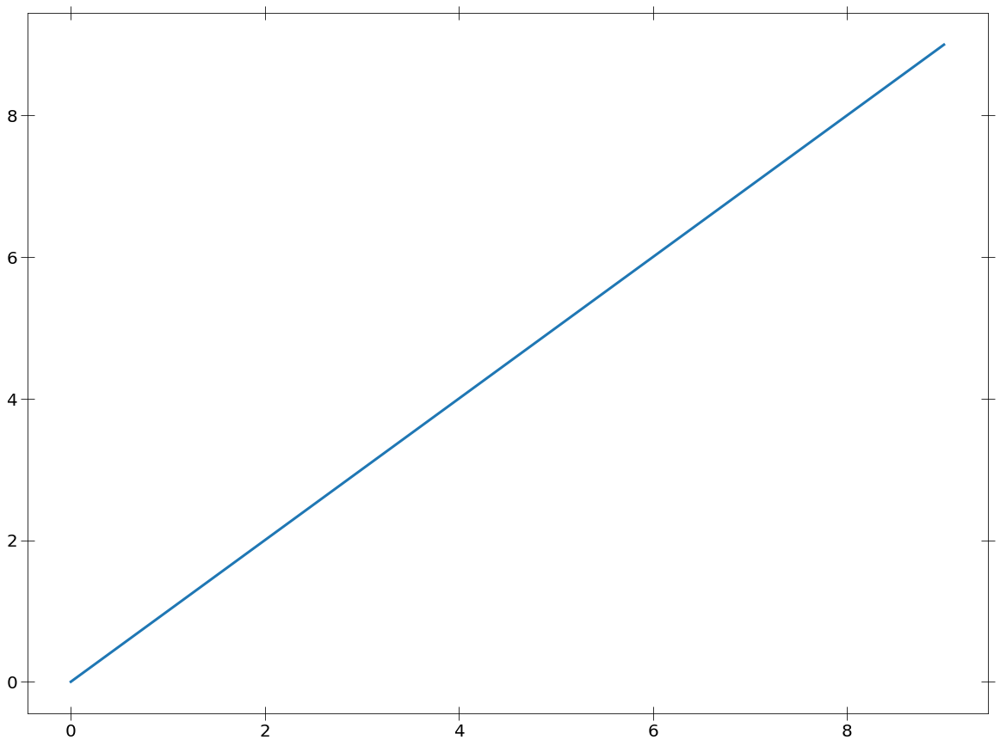

In [12]:
set_plotparams('notebook')
plt.plot(np.arange(10))

# Loading Data

In [13]:
chandra_response_path = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/chandra_obs_hard07/2CXOJ174334.1-291117/2CXOJ174334.1-291117_combined_src.rmf'
pn_response_path = '/Volumes/Pavan_Work_SSD/Backup/GalacticBulge_Xrayclassify/XMM_responses/PN/epn_bu23_dY9.rmf.gz'
mos_response_path = '/Volumes/Pavan_Work_SSD/Backup/GalacticBulge_Xrayclassify/XMM_responses/MOS_5eV/m1_e10_im_p0_c.rmf'
chandra_sim_path = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/chandra_simspecs/'
chandra_sim_cvs = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/sim_ips_highnh_twice_ew_chandra/sim_ips_highnh_twice_ew_chandra/'
xmm_sim_path = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/xmm_pn_mos_simspecs_1/'
xmm_sim_cvs = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/sim_ips_highnh_xu2016_twice_ew/'
xmm_sim_cvs2 = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/sim_ips_highnh_craig/'
xmm_sim_path2 = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/xmm_pn_mos_simspecs_2/'
chandra_sim_cvs2 = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/sim_ips_highnh_craig_chandra/'
chandra_obs_path = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/chandra_obs_hard07/'
xmm_obs_path = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/xmm_combined_copy/'

1:80: E501 line too long (159 > 79 characters)
2:80: E501 line too long (115 > 79 characters)
3:80: E501 line too long (120 > 79 characters)
4:80: E501 line too long (94 > 79 characters)
5:80: E501 line too long (140 > 79 characters)
6:80: E501 line too long (95 > 79 characters)
7:80: E501 line too long (103 > 79 characters)
8:80: E501 line too long (94 > 79 characters)
9:80: E501 line too long (96 > 79 characters)
10:80: E501 line too long (106 > 79 characters)
11:80: E501 line too long (96 > 79 characters)


## MSP simulations vs. observed sources

# PN files init: 853
# PN files init: 853


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:530: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:531: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:617: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:618: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:621: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:621: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:623: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ip

12.0


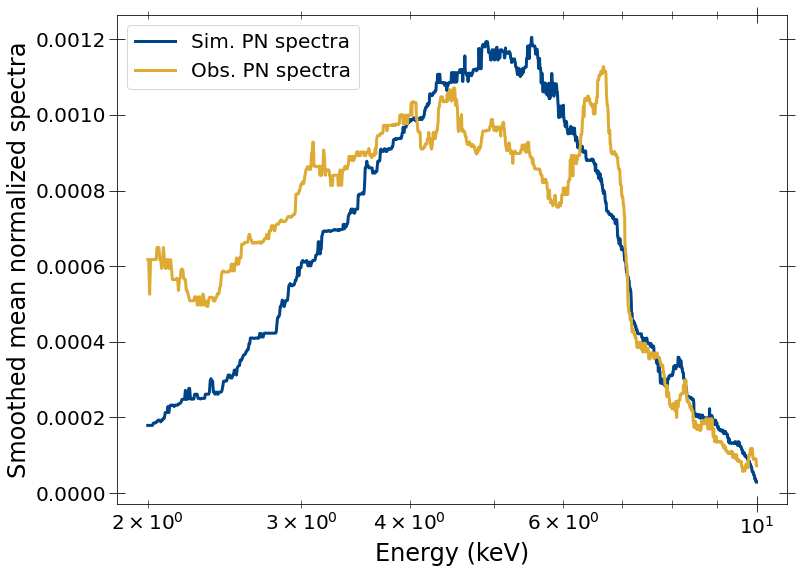

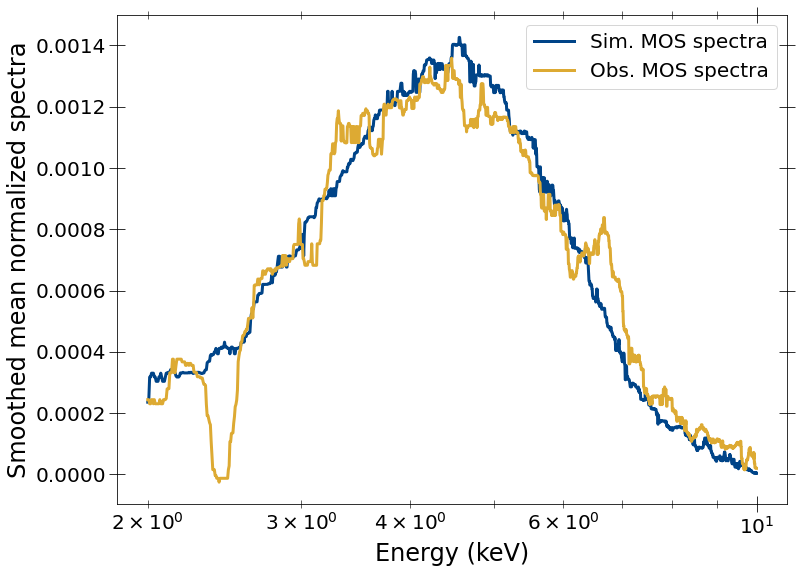

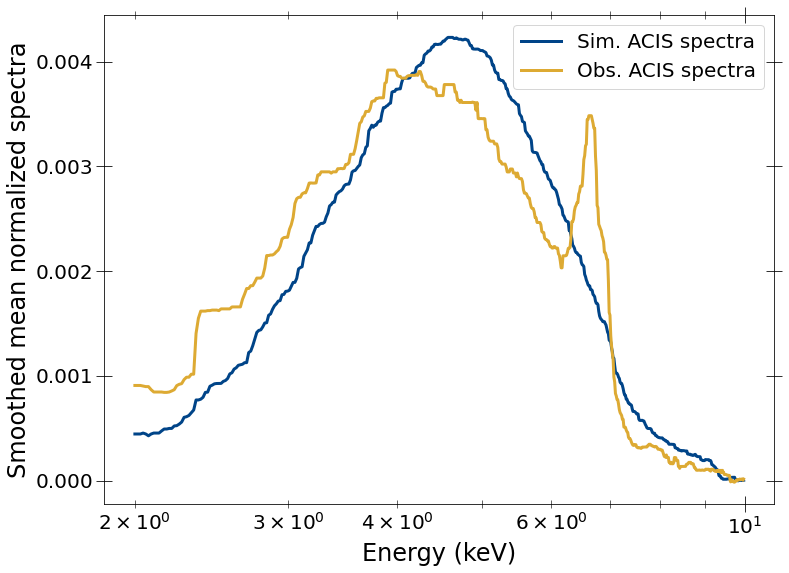

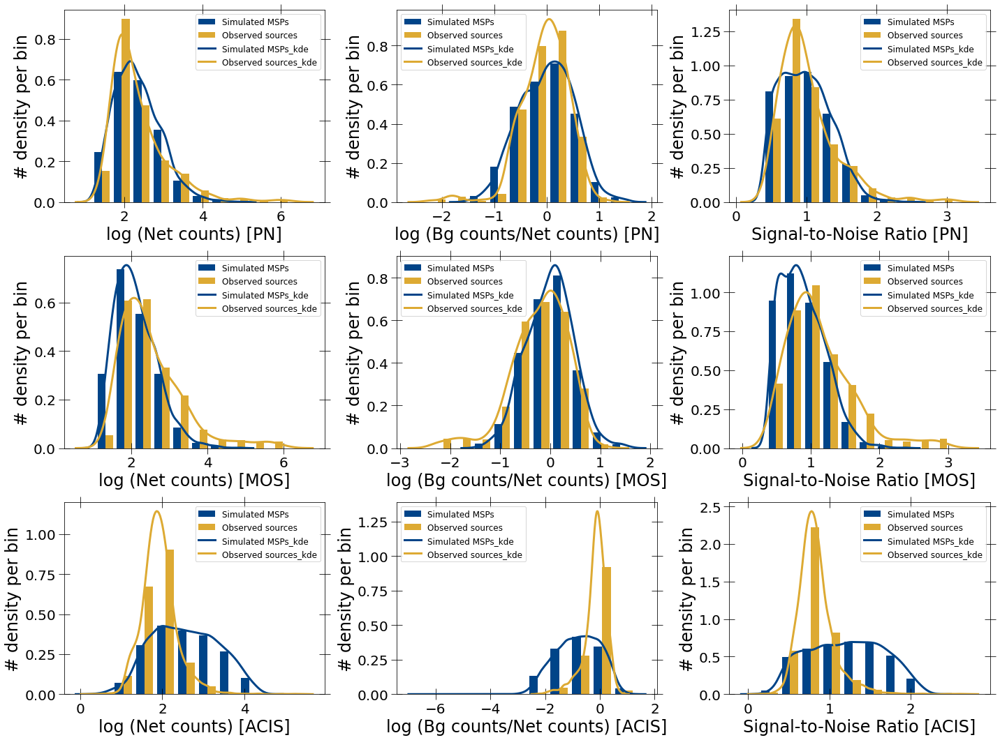

In [14]:
spec_summary_msps = load_alldata(
     [pn_response_path, mos_response_path, chandra_response_path],
     [xmm_sim_path, xmm_sim_path, chandra_sim_path],
     [xmm_obs_path, xmm_obs_path, chandra_obs_path], en_range=[2, 10])

In [8]:
len(spec_summary_msps['specs'][0][2])

10000

## MSP vs. IP simulations

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:495: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:496: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:582: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:583: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:586: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:586: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:588: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ip

12.0


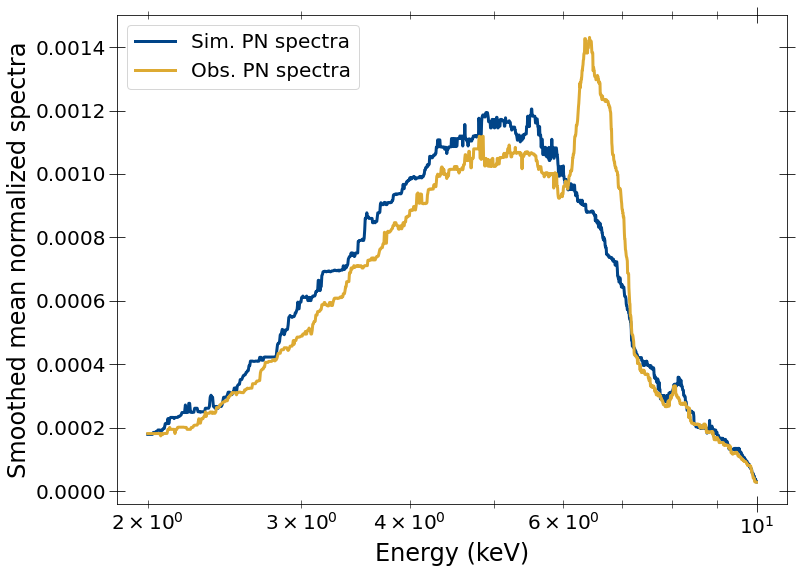

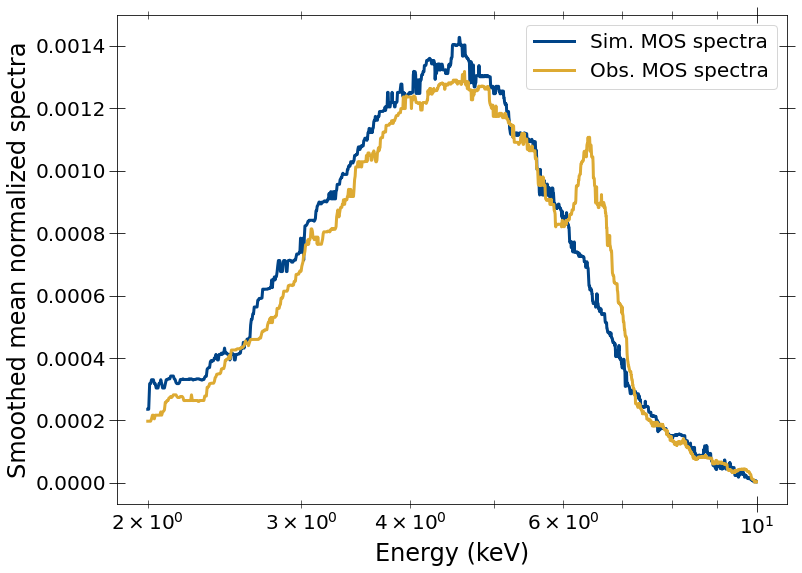

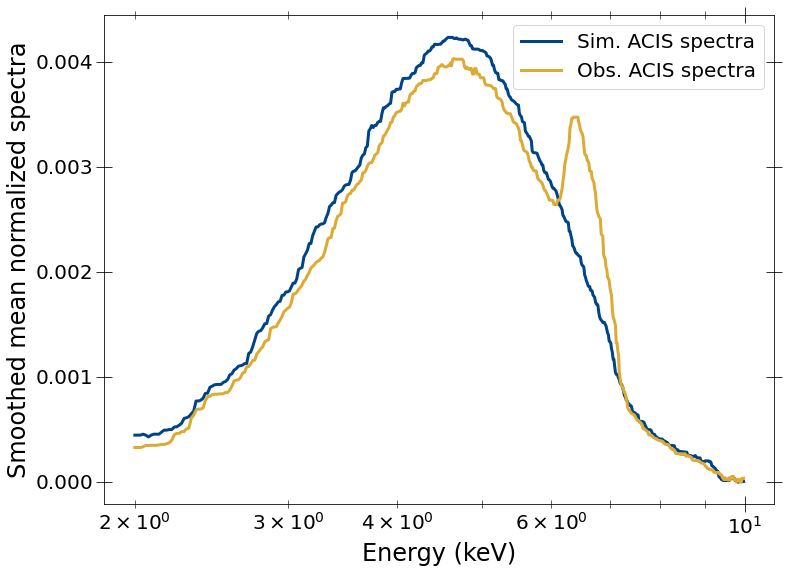

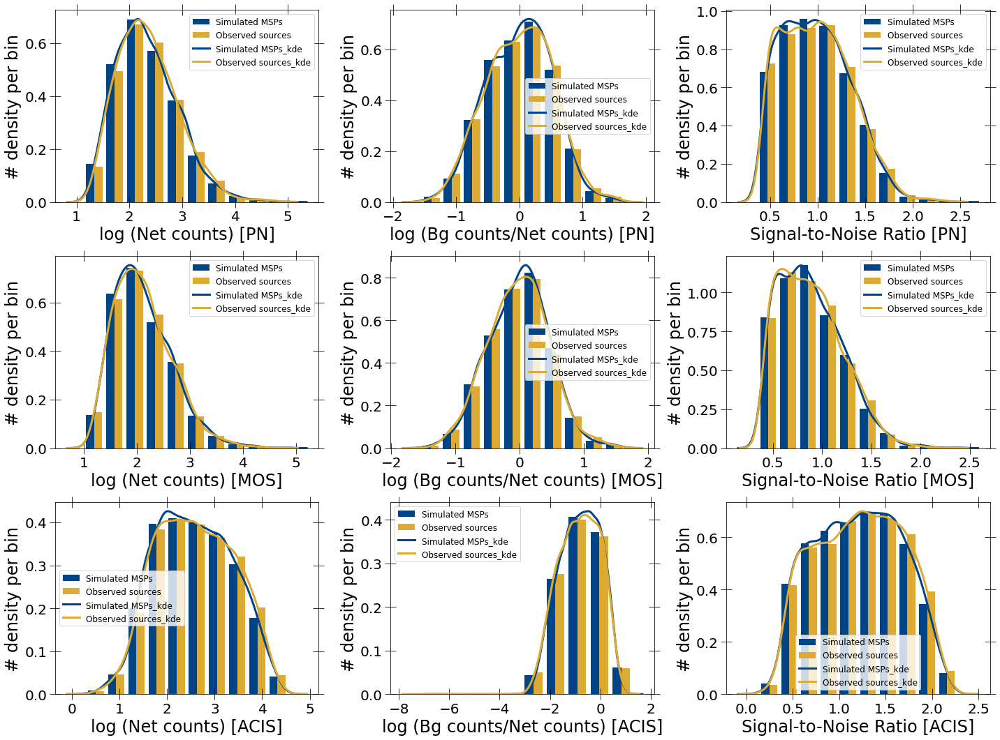

In [42]:
spec_summary_msp_cvs = load_alldata(
     [pn_response_path, mos_response_path, chandra_response_path],
     [xmm_sim_path, xmm_sim_path, chandra_sim_path],
     [xmm_sim_cvs, xmm_sim_cvs, chandra_sim_cvs], en_range=[2, 10],
     both_sims=True)

## IP simulations vs observed sources

In [83]:
spec_summary_cvs = load_alldata(
     [pn_response_path, mos_response_path, chandra_response_path],
     [xmm_sim_cvs, xmm_sim_cvs, chandra_sim_cvs],
     [xmm_obs_path, xmm_obs_path, chandra_obs_path], en_range=[2, 10],
     both_sims=False, sim_basename='ip_')

KeyboardInterrupt: 

# Comparing colors

## Simulated MSPs vs observed_sources

In [231]:
len(obs_color_dict_arr[0]['colors'])

741

In [311]:
len(delta_cstat1)

178

2772 2772 2772 2772
741 741 741 741
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
1937 1937 1937 1937
445 445 445 445


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:704: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:704: RuntimeWarning: divide by zero encountered in true_divide


Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
7873 7873 7873 7873
2670 2670 2670 2670
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:704: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:704: RuntimeWarning: invalid value encountered in true_divide


16.0


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:323: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


16.0
16.0


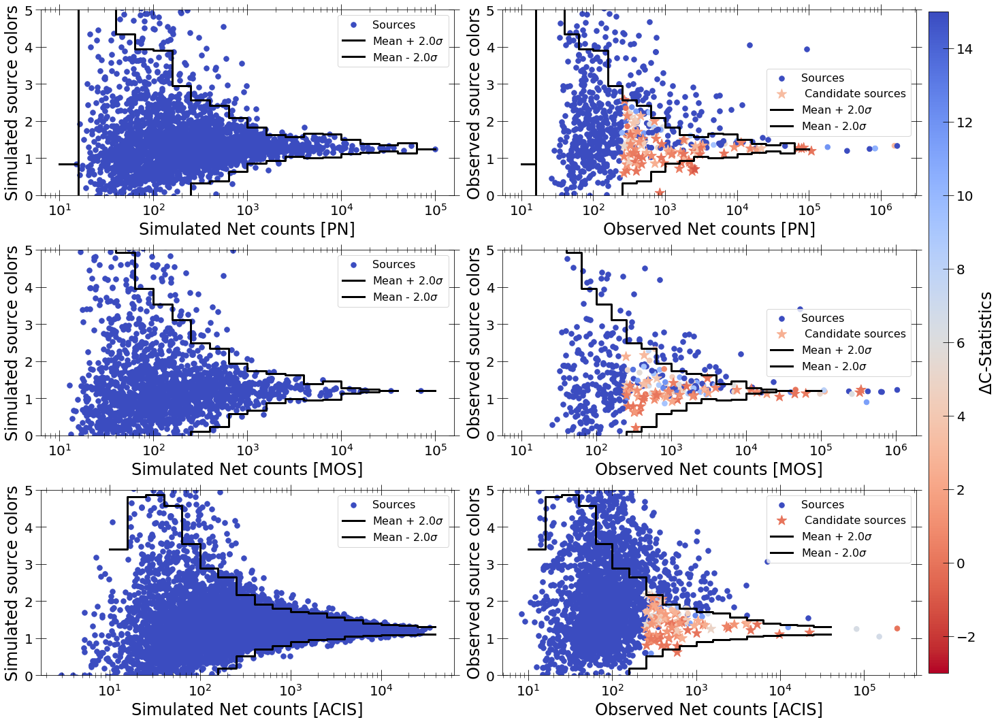

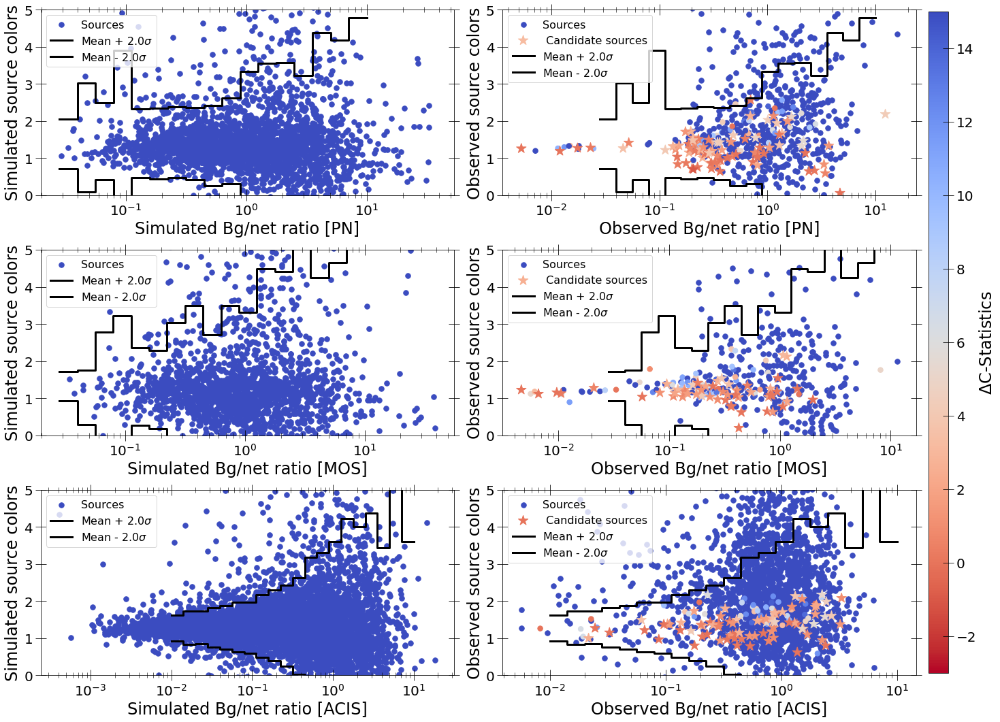

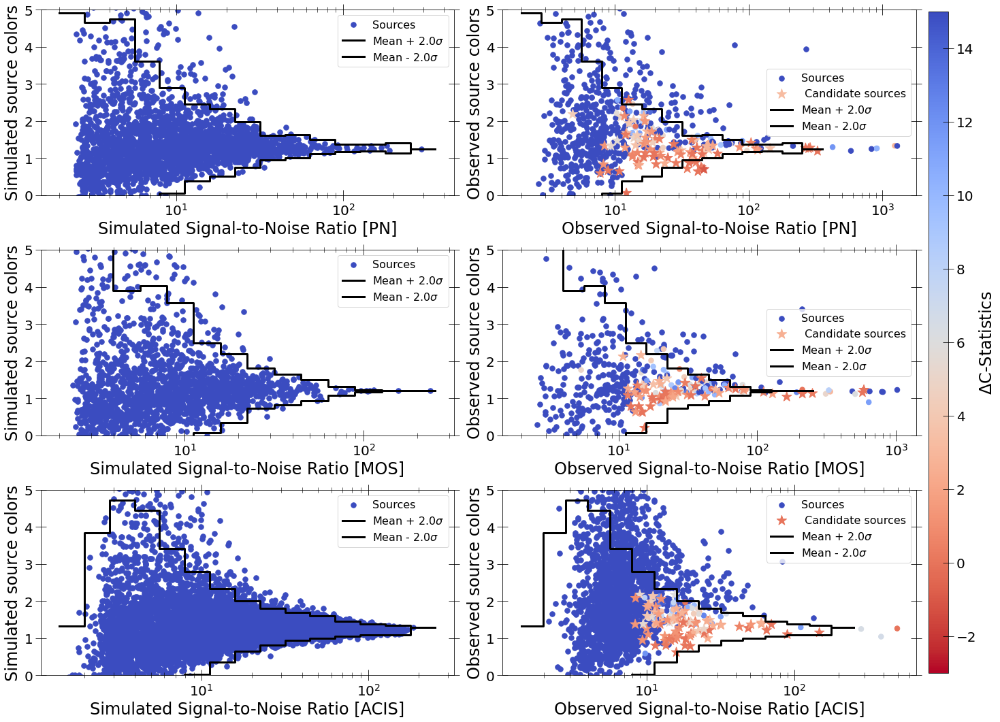

In [335]:
delta_cstat1 = (np.array(pn_fit_stats_table_pl)[:, 1].astype(float) -
                np.array(pn_fit_stats_table_pl_g2)[:, 1].astype(float))
delta_cstat2 = (np.array(mos_fit_stats_table_pl)[:, 1].astype(float) -
                np.array(mos_fit_stats_table_pl_g2)[:, 1].astype(float))
delta_cstat3 = (np.array(acis_fit_stats_table_pl)[:, 1].astype(float) -
                np.array(acis_fit_stats_table_pl_g2)[:, 1].astype(float))
sim_msps_color_dict_arr, obs_color_dict_arr = getcolor_prop_alldet(
    spec_summary_msps, compare_det=True, int_args=interested_msp_args_alldet,
    delta_cstat=[delta_cstat1, delta_cstat2, delta_cstat3],
    candidate_args=[candidadate_msps_pn_args,
                    candidadate_msps_mos_args,
                    candidadate_msps_acis_args])

2772 2772 2772 2772
741 741 741 741
Calaculating mean and standard deviation in colors vs. Net counts


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:709: RuntimeWarning: divide by zero encountered in true_divide


16.0
4.0
4.0
Calaculating mean and standard deviation in colors vs. Bg/net ratio
16.0
4.0
4.0
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
16.0
4.0
4.0
1937 1937 1937 1937
445 445 445 445
Calaculating mean and standard deviation in colors vs. Net counts
16.0
4.0
4.0


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:709: RuntimeWarning: divide by zero encountered in true_divide


Calaculating mean and standard deviation in colors vs. Bg/net ratio
16.0
4.0
4.0
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
16.0
4.0
4.0
7873 7873 7873 7873
2670 2670 2670 2670


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:709: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:709: RuntimeWarning: invalid value encountered in true_divide


Calaculating mean and standard deviation in colors vs. Net counts
16.0
4.0
4.0
Calaculating mean and standard deviation in colors vs. Bg/net ratio
16.0
4.0
4.0
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
16.0
4.0
4.0


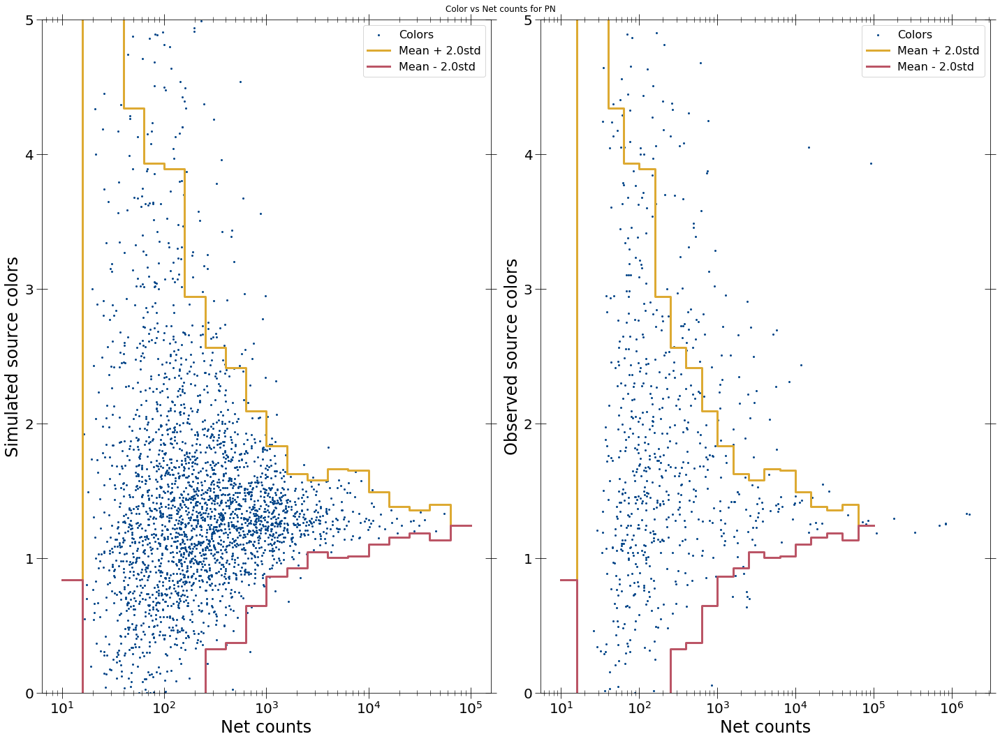

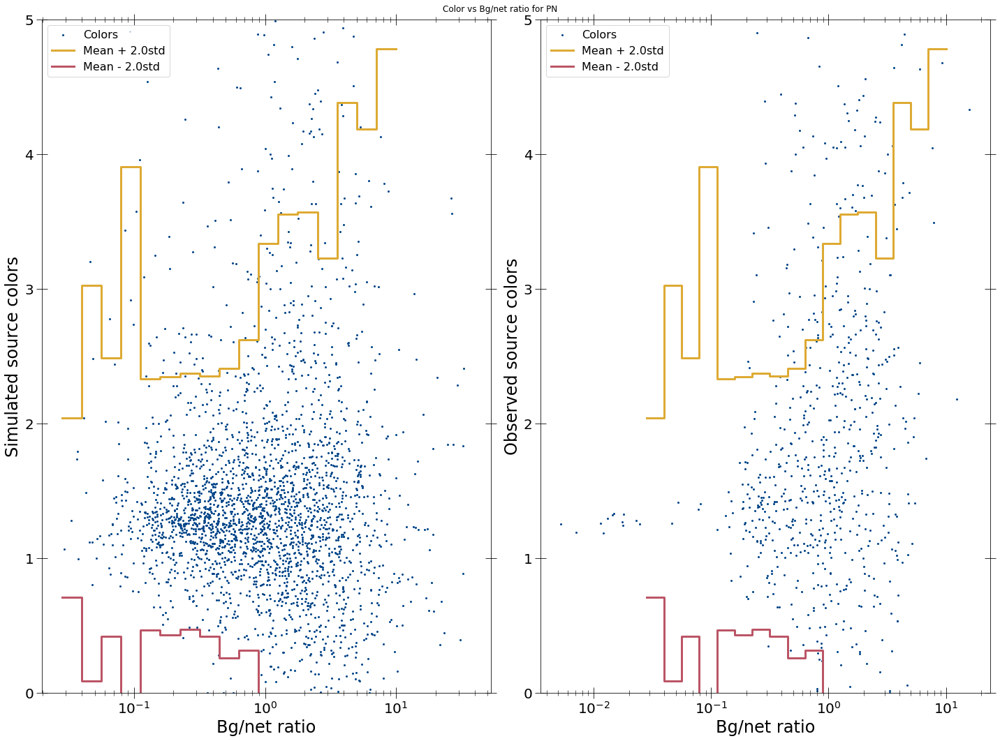

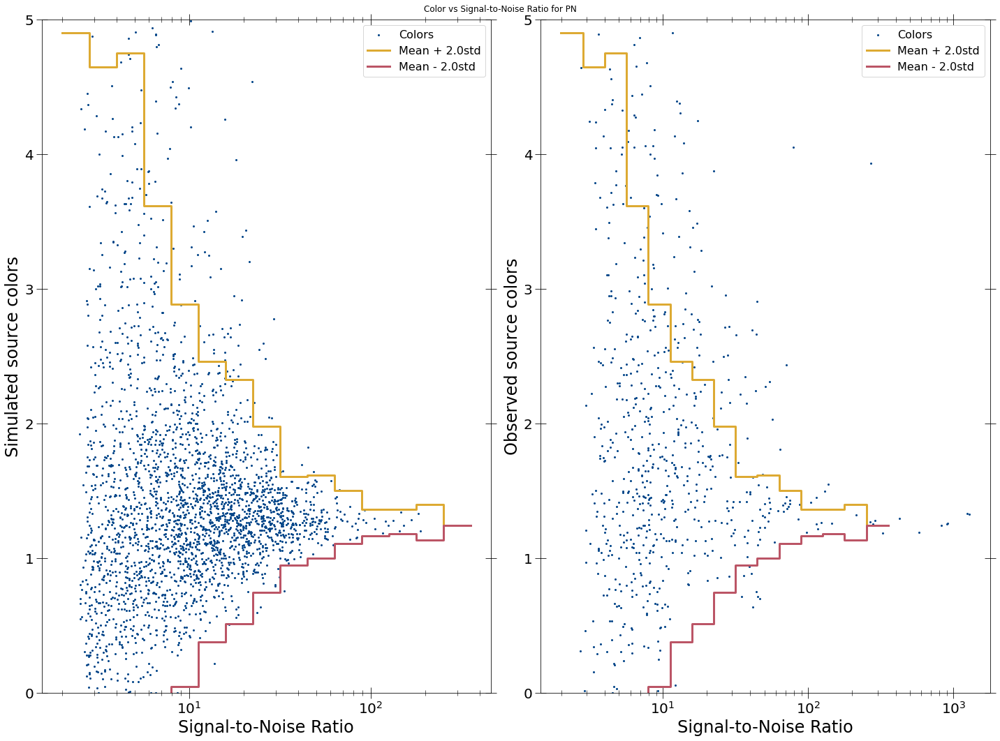

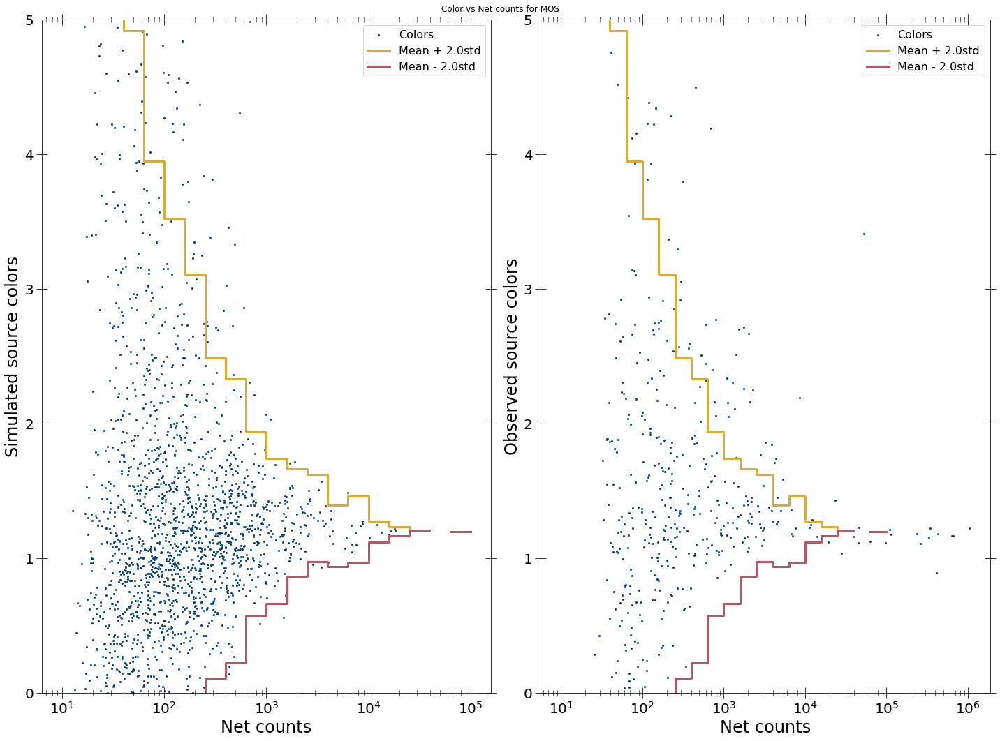

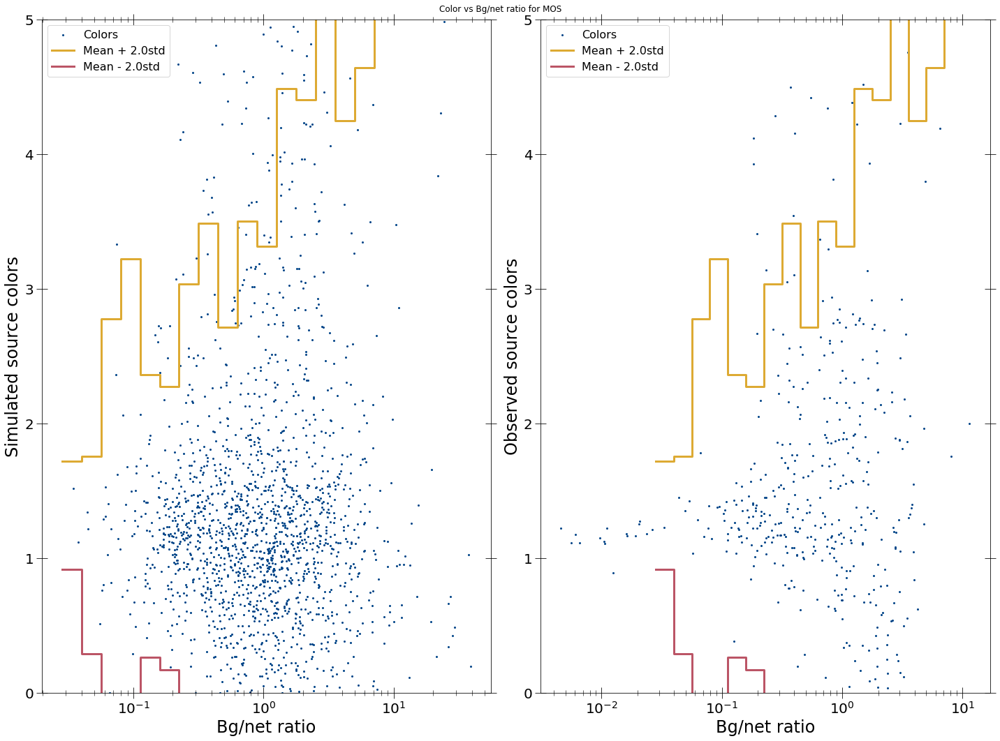

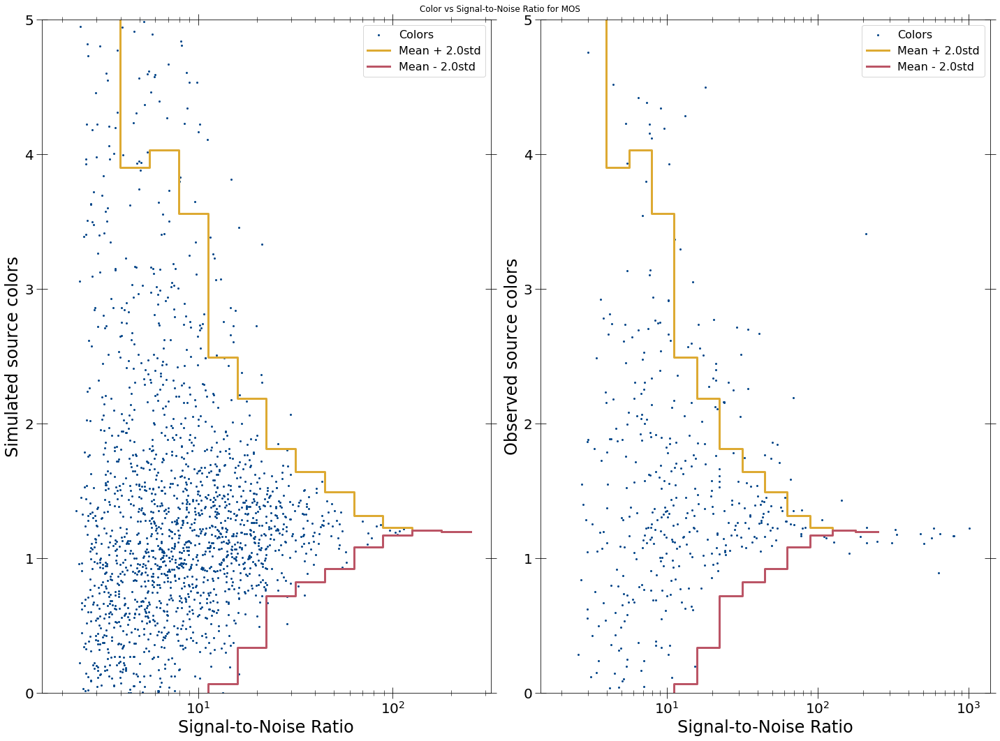

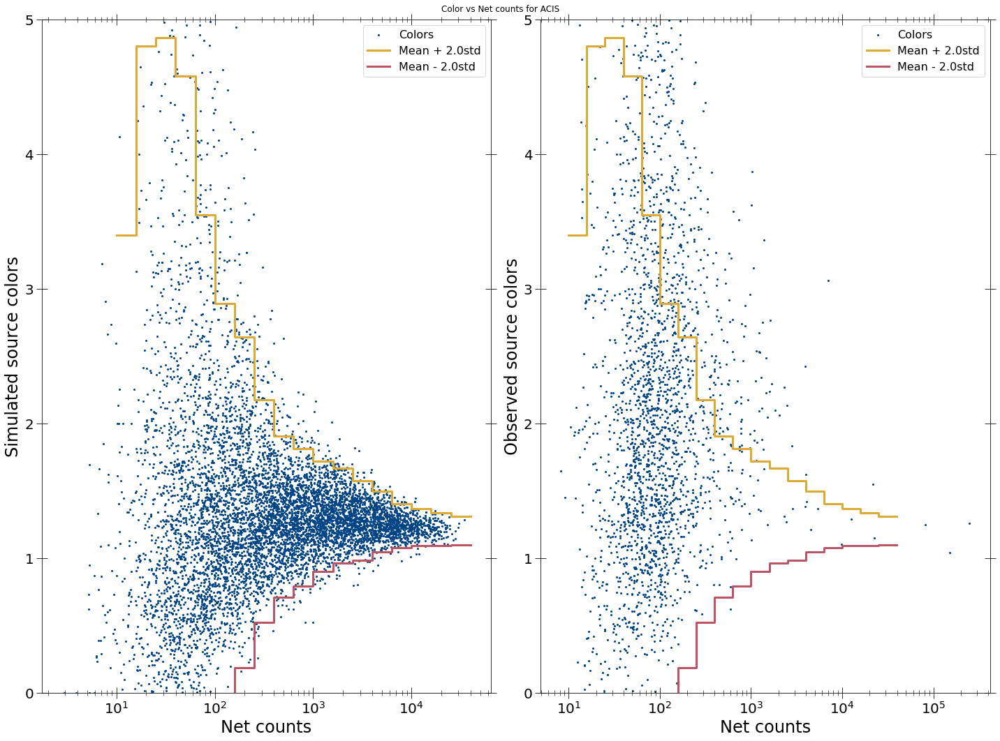

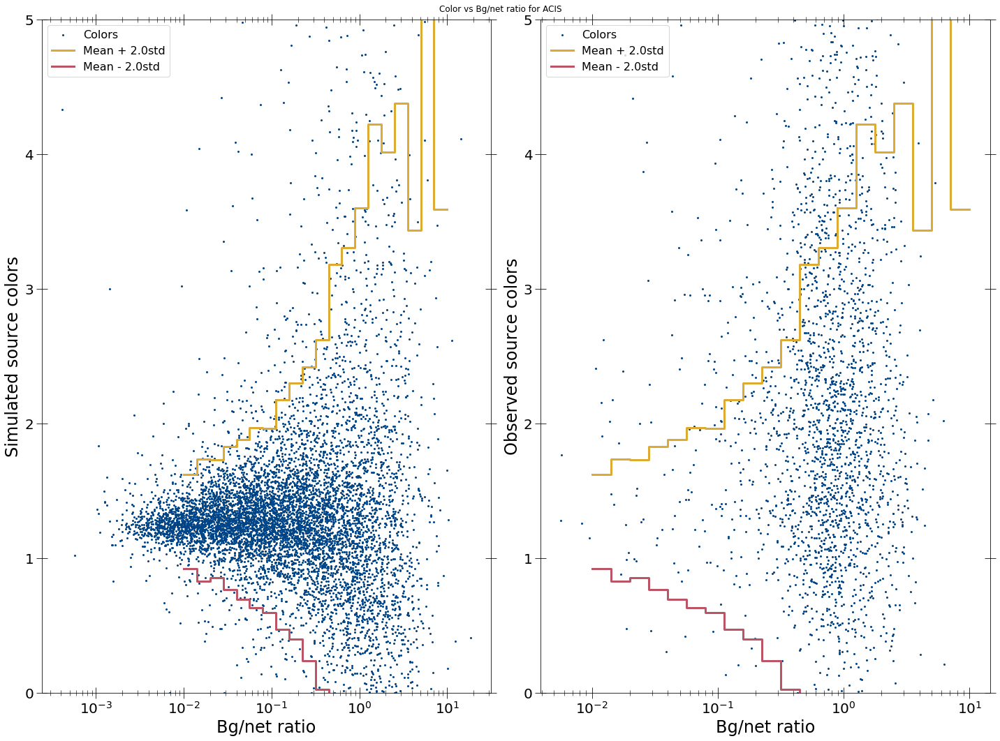

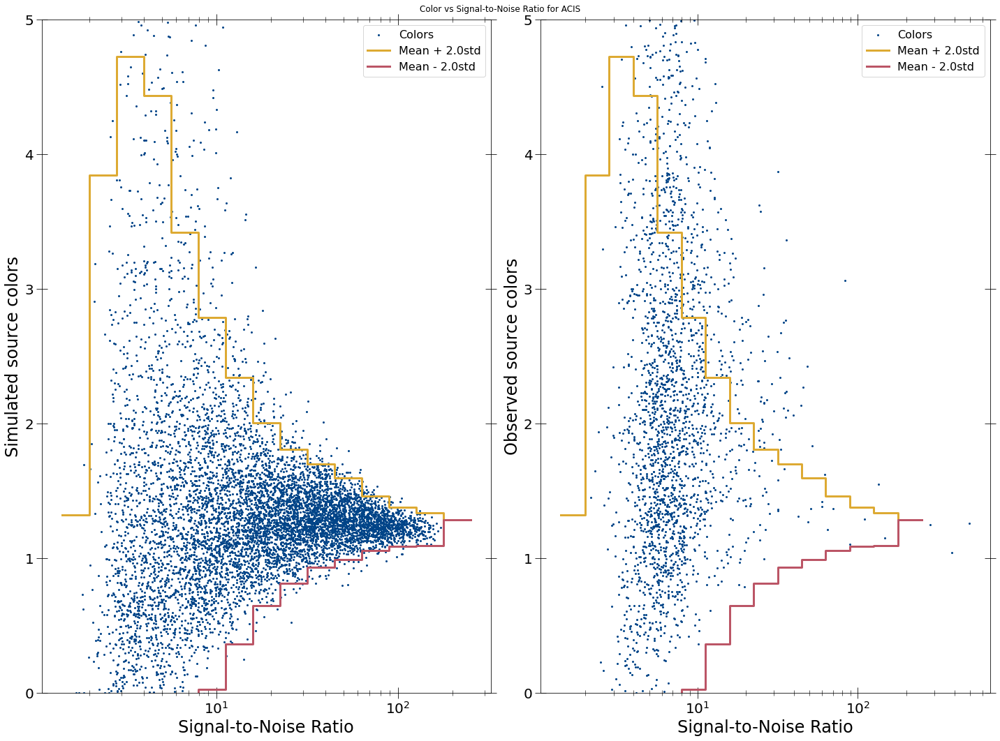

In [17]:
sim_msps_color_dict_arr, obs_color_dict_arr = getcolor_prop_alldet(
    spec_summary_msps, compare_det=False)

6

## Simulated MSPs vs. CVs

2772 2772 2772 2772
4419 4419 4419 4419


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:674: RuntimeWarning: divide by zero encountered in true_divide


Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
1937 1937 1937 1937
3625 3625 3625 3625
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:674: RuntimeWarning: divide by zero encountered in true_divide


7873 7873 7873 7873
8132 8132 8132 8132


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:674: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:674: RuntimeWarning: invalid value encountered in true_divide


Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
16.0
16.0
16.0


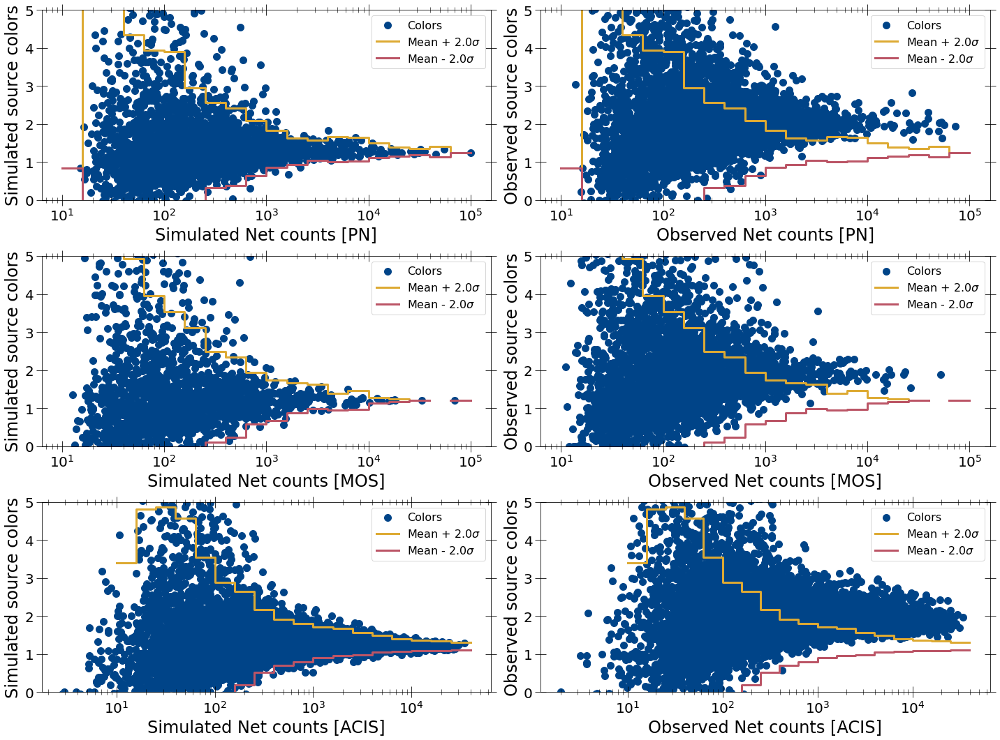

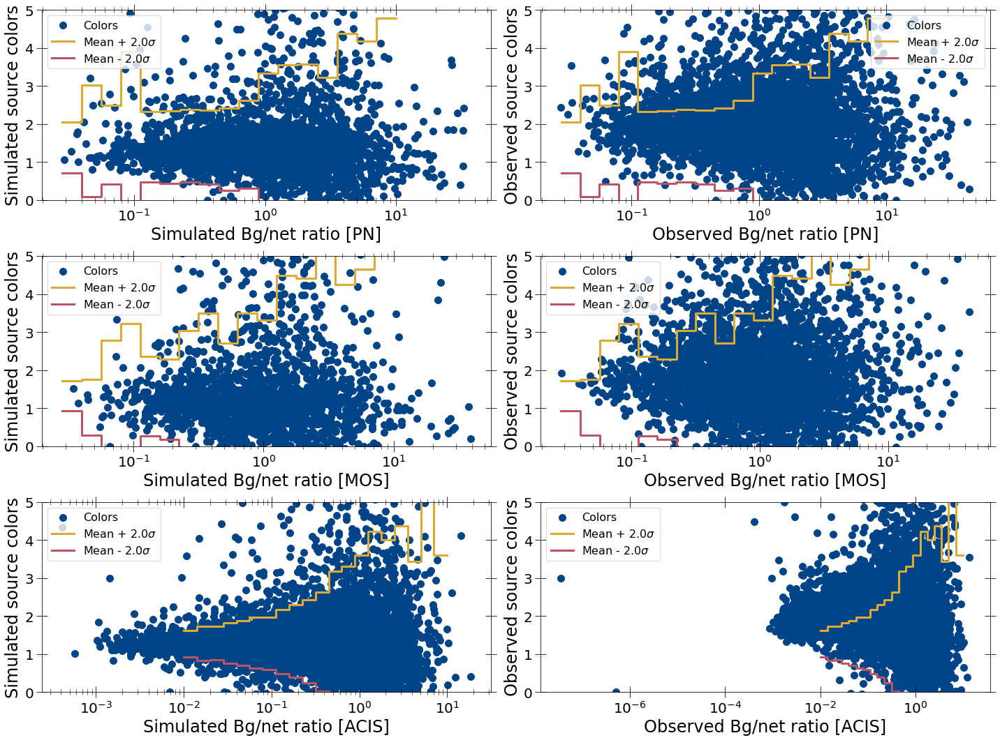

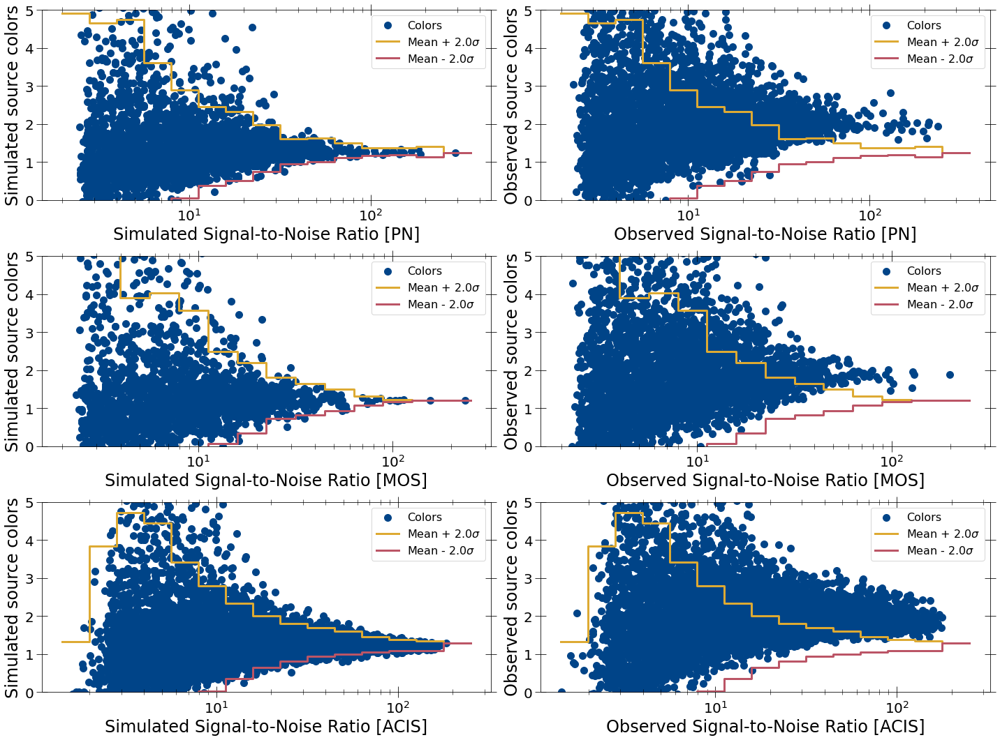

In [43]:
sim_msps2_color_dict_arr, sim_ips_color_dict_arr = getcolor_prop_alldet(
    spec_summary_msp_cvs, compare_det=True)

## Simulated CVs vs observed sources

In [595]:
test = getcolor_prop_alldet(spec_summary_cvs, compare_det=True)

4419 4419 4419 4419
741 741 741 741


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:709: RuntimeWarning: divide by zero encountered in true_divide


Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
3625 3625 3625 3625
445 445 445 445


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:709: RuntimeWarning: divide by zero encountered in true_divide


Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
8132 8132 8132 8132
2670 2670 2670 2670
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:709: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:709: RuntimeWarning: invalid value encountered in true_divide


TypeError: 'NoneType' object is not subscriptable

# MSP analysis

## Getting sources consistent with MSP colors

In [19]:
def get_candidate_src_nums_det(obs_src_nums, obs_det_mask, sim_color_dict,
                               obs_color_dict, min_counts, min_counts2=None):
    """Get src nums of quiescent sources for given detector"""
    #print(min_counts2)
    obs_netcounts = obs_color_dict['prop_list'][0]
    netcount_bins = sim_color_dict['prop_bins'][0]
    obs_colors = obs_color_dict['colors']
    color_median = sim_color_dict['color_stat'][0][0]
    color_std = sim_color_dict['color_stat'][2][0]
    print(netcount_bins)
    print(color_median)
    print(color_std)
    interested_args = None
    for i, lower_bin in enumerate(netcount_bins):
        if lower_bin < min_counts:
            continue
        if i == len(netcount_bins) - 1:
            upper_bin = np.max(obs_netcounts) + 10
            if not np.isnan(color_median[-1]):
                median_color = color_median[-1]
            if not np.isnan(color_std[-1]):
                std_color = color_std[-1]
            std_color = max(std_color, 0.05)
        else:
            upper_bin = netcount_bins[i+1]
            if not np.isnan(color_median[i]):
                median_color = color_median[i]
            if not np.isnan(color_std[i]):
                std_color = color_std[i]
            std_color = max(std_color, 0.05)
        if min_counts2 is not None:
            if lower_bin < min_counts2 and min_counts2 < upper_bin:
                if ((min_counts2 - lower_bin) > (upper_bin - min_counts2)):
                    lower_bin = min_counts2
                    median_color = color_median[i+1]
                    std_color = color_std[i+1]
                else:
                    lower_bin = min_counts2
        #print(min_counts2)
        print(lower_bin, median_color, std_color)
        if (np.isnan(median_color) or np.isnan(std_color) or std_color==0):
            print('HELLO')
            int_args = np.where(np.logical_and(
                obs_netcounts >= lower_bin, obs_netcounts < upper_bin))
        else:
        
            int_args = np.where(np.logical_and(
                np.logical_and(obs_netcounts >= lower_bin,
                               obs_netcounts < upper_bin),
                obs_colors < median_color + 2*std_color))[0]
        '''
        int_args = np.where(np.logical_and(
                np.logical_and(obs_netcounts >= lower_bin,
                               obs_netcounts < upper_bin),
                obs_colors < median_color + 2*std_color))[0]
        '''
        print(len(int_args))
        if interested_args is None:
            interested_args = int_args.copy()
        else:
            interested_args = np.append(interested_args.copy(), int_args)
    return interested_args, obs_src_nums[obs_det_mask][interested_args]


def get_candidate_src_nums_alldet(spec_summary, sim_color_dict_arr,
                                  obs_color_dict_arr, min_count_arr=None,
                                  min_counts2=None):
    """Get source nums for all detectors."""
    interested_args_alldet = []
    interested_sources_alldet = []
    if min_count_arr is None:
        min_count_arr = [700, 700, 250]
    for i, obs_color_dict in enumerate(obs_color_dict_arr):
        if i > 0:
            interested_args, interested_srcs = get_candidate_src_nums_det(
                spec_summary['src_nums'][i-1], spec_summary['spec_masks'][1][i],
                sim_color_dict_arr[i], obs_color_dict, min_count_arr[i],
                min_counts2)
        else:
            interested_args, interested_srcs = get_candidate_src_nums_det(
                spec_summary['src_nums'][i], spec_summary['spec_masks'][1][i],
                sim_color_dict_arr[i], obs_color_dict, min_count_arr[i],
                min_counts2)
        interested_args_alldet.append(interested_args)
        interested_sources_alldet.append(interested_srcs)
    return interested_args_alldet, interested_sources_alldet


4:5: E265 block comment should start with '# '
39:9: E265 block comment should start with '# '
41:71: E225 missing whitespace around operator
46:1: W293 blank line contains whitespace
76:80: E501 line too long (80 > 79 characters)


In [20]:
(interested_msp_args_alldet,
 interested_msp_srcs_alldet) = get_candidate_src_nums_alldet(
    spec_summary_msps, sim_msps_color_dict_arr, obs_color_dict_arr,
    min_count_arr=[150, 150, 150], min_counts2=250)

[1.00000000e+01 1.58489319e+01 2.51188643e+01 3.98107171e+01
 6.30957344e+01 1.00000000e+02 1.58489319e+02 2.51188643e+02
 3.98107171e+02 6.30957344e+02 1.00000000e+03 1.58489319e+03
 2.51188643e+03 3.98107171e+03 6.30957344e+03 1.00000000e+04
 1.58489319e+04 2.51188643e+04 3.98107171e+04 6.30957344e+04
 1.00000000e+05]
[0.8405164  2.03621255 1.63305682 1.56743663 1.5736705  1.66320801
 1.4331601  1.44713313 1.39609846 1.36984926 1.35086023 1.27893642
 1.31590127 1.33564778 1.334838   1.30071855 1.27144028 1.27383281
 1.26917868 1.24506393]
[0.         2.58517276 1.72972337 1.38681819 1.18129716 1.11575665
 0.75540094 0.56022382 0.51077116 0.36126324 0.24291962 0.17375792
 0.13254254 0.16428213 0.15864827 0.09633923 0.05725364 0.0421451
 0.0654287  0.        ]
250 1.4471331268500243 0.5602238243386048
0
251.18864315095823 1.4471331268500243 0.5602238243386048
45
398.1071705534973 1.396098460383752 0.5107711552472425
30
630.957344480193 1.3698492577015142 0.36126323889561407
22
1000.0 1

In [21]:
print('Interested PN sources: ', len(interested_msp_srcs_alldet[0]))
print('Interested MOS sources: ', len(interested_msp_srcs_alldet[1]))
print('Interested ACIS sources: ', len(interested_msp_srcs_alldet[2]))

Interested PN sources:  178
Interested MOS sources:  152
Interested ACIS sources:  130


In [50]:
def mark_interested_srcs(sim_color_dict, obs_color_dict, src_nums, obs_mask,
                         interested_srcs, prop_num=0):
    props = obs_color_dict['prop_list'][prop_num]
    colors = obs_color_dict['colors']
    interested_args = np.where(np.isin(src_nums[obs_mask], interested_srcs))
    print(len(interested_args[0]), len(interested_srcs))
    # print(len(np.unique(interested_srcs)))
    # print(interested_args)
    # print(src_nums[obs_mask][interested_args])
    # print(props[interested_args])
    # print(colors[interested_args])
    prop_bins = sim_color_dict['prop_bins'][prop_num]
    mean_color = sim_color_dict['color_stat'][0][prop_num]
    std_color = sim_color_dict['color_stat'][2][prop_num]
    print(props[interested_args])
    print(colors[interested_args])
    plotline_scatter([props, props[interested_args], prop_bins, prop_bins],
                     [colors, colors[interested_args], mean_color + 2*std_color,
                      mean_color - 2*std_color],
                     pl_types=['scatter', 'scatter', 'step', 'step'],
                     xlabel='Net counts', ylabel='Colors',
                     pl_labels=['Observed ACIS sources',
                                'Hailey et al. (2018) sources',
                                r'Mean + 2$\sigma$', r'Mean - 2$\sigma$'],
                     colors=['#004488', '#ddaa33', '#000000', '#000000'],
                     styles=['.', '*', '--', '--'],
                     ylim=(0, 5), highlight=True)
    return (colors[interested_args], props[interested_args])

18:80: E501 line too long (80 > 79 characters)


In [420]:
delta_cstat = np.array(pn_fit_stats_table_pl)[:, 1].astype(float) - np.array(pn_fit_stats_table_pl_g2)[:, 1].astype(float)

In [33]:
interested_msp_srcs_alldet[0][174]

'205056701010004'

In [67]:
from matplotlib.colors import Normalize

In [68]:
interested_msp_srcs_alldet[0]

array(['200305401010008', '200305401010017', '200305401015015',
       '201113501010117', '201113501010148', '201129702010029',
       '201129704010023', '201129704010026', '201129704010031',
       '201129704010049', '201129704010056', '201129707010033',
       '201129708010014', '201129712010002', '201129719010007',
       '201129721010136', '201529201015014', '202039301010054',
       '202039301010071', '204003401010008', '204003401010013',
       '205049406010031', '205100104010002', '205110002015026',
       '205110012010036', '205110012015035', '206946401010003',
       '206946404010062', '206946404010202', '206946409010022',
       '206946410010178', '206946416010014', '207242102010114',
       '208016803010003', '208024101010012', '208251401010016',
       '208441011010009', '208441011010032', '208441011010036',
       '208441011010211', '208624701010022', '208860108010001',
       '208860204010001', '208860207010007', '208938111010034',
       '201113501015161', '2011297010100

In [254]:
spec_summary_msps['counts'][0][0][1][spec_summary_msps['spec_masks'][1][0]][interested_msp_args_alldet[0]]

array([3.51929452e+02, 2.85294758e+02, 2.89900690e+02, 3.28559219e+02,
       3.11964577e+02, 3.25306748e+02, 3.44820290e+02, 2.57981436e+02,
       2.67528644e+02, 2.68595336e+02, 2.94651765e+02, 3.40981312e+02,
       2.84365253e+02, 3.19667720e+02, 2.77346210e+02, 3.28184955e+02,
       3.77918079e+02, 3.41211238e+02, 3.81976687e+02, 2.92579328e+02,
       2.92735265e+02, 2.51352123e+02, 3.87265165e+02, 2.75203084e+02,
       3.47382202e+02, 3.63066904e+02, 3.31093640e+02, 3.63586896e+02,
       2.96801156e+02, 3.14961326e+02, 3.30170412e+02, 2.71873909e+02,
       3.27073676e+02, 3.83059949e+02, 3.16385603e+02, 2.84663999e+02,
       3.59522758e+02, 2.97865164e+02, 3.93890922e+02, 3.13971935e+02,
       2.68533579e+02, 3.30838478e+02, 2.98679980e+02, 3.95459403e+02,
       3.82664952e+02, 4.55196441e+02, 5.96645536e+02, 4.85332639e+02,
       4.08206137e+02, 5.56503317e+02, 4.16713717e+02, 5.68590748e+02,
       4.40901747e+02, 4.88542554e+02, 4.05197362e+02, 5.13713407e+02,
      

In [266]:
interested_msp_

array(['200305401010008', '200305401010017', '200305401015015',
       '201113501010117', '201113501010148', '201129702010029',
       '201129704010023', '201129704010026', '201129704010031',
       '201129704010049', '201129704010056', '201129707010033',
       '201129708010014', '201129712010002', '201129719010007',
       '201129721010136', '201529201015014', '202039301010054',
       '202039301010071', '204003401010008', '204003401010013',
       '205049406010031', '205100104010002', '205110002015026',
       '205110012010036', '205110012015035', '206946401010003',
       '206946404010062', '206946404010202', '206946409010022',
       '206946410010178', '206946416010014', '207242102010114',
       '208016803010003', '208024101010012', '208251401010016',
       '208441011010009', '208441011010032', '208441011010036',
       '208441011010211', '208624701010022', '208860108010001',
       '208860204010001', '208860207010007', '208938111010034',
       '201113501015161', '2011297010100

In [268]:
(np.array(pn_fit_stats_table_pl)[-3, 1].astype(float) -
 np.array(pn_fit_stats_table_pl_g2)[-3, 1].astype(float))

0.00027632400269794744

(0.0, 5.0)

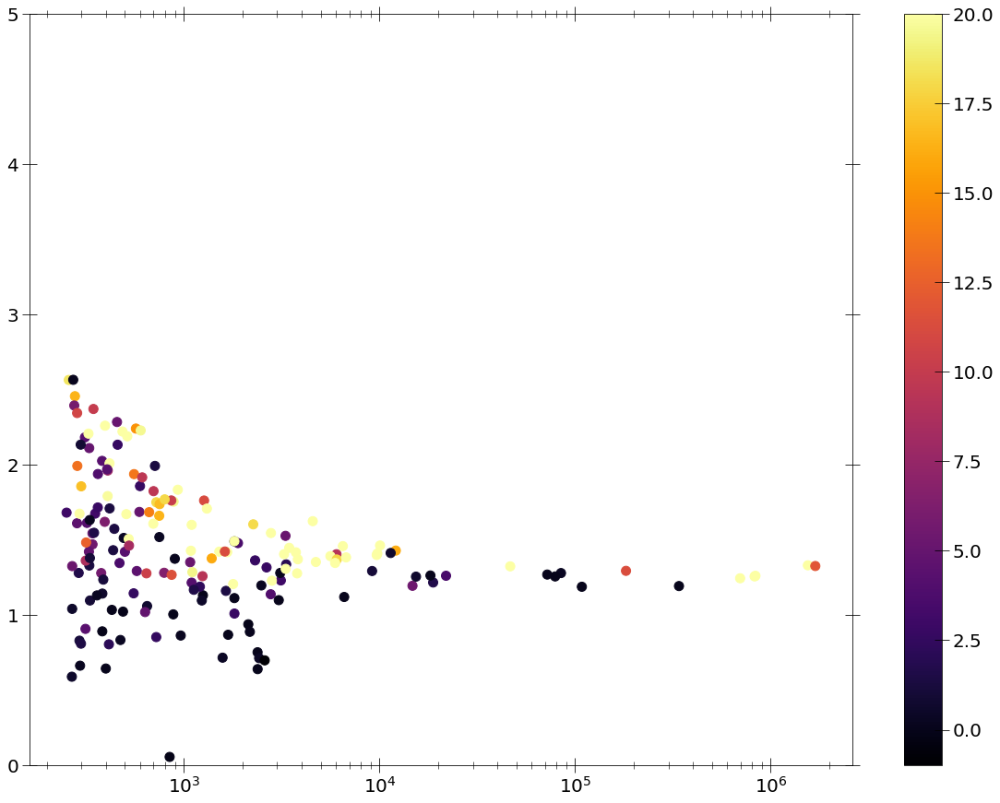

5:13: E131 continuation line unaligned for hanging indent
7:12: E131 continuation line unaligned for hanging indent


In [124]:
plt.scatter(
    spec_summary_msps['counts'][0][0][1][
        spec_summary_msps['spec_masks'][1][0]][interested_msp_args_alldet[0]],
    obs_color_dict_arr[0]['colors'][interested_msp_args_alldet[0]],
            c=(np.array(pn_fit_stats_table_pl)[:, 1].astype(float) -
               np.array(pn_fit_stats_table_pl_g2)[:, 1].astype(float)),
           cmap='inferno', norm=Normalize(-1, 20, True))
plt.colorbar()
plt.xscale('log')
plt.ylim(0, 5)

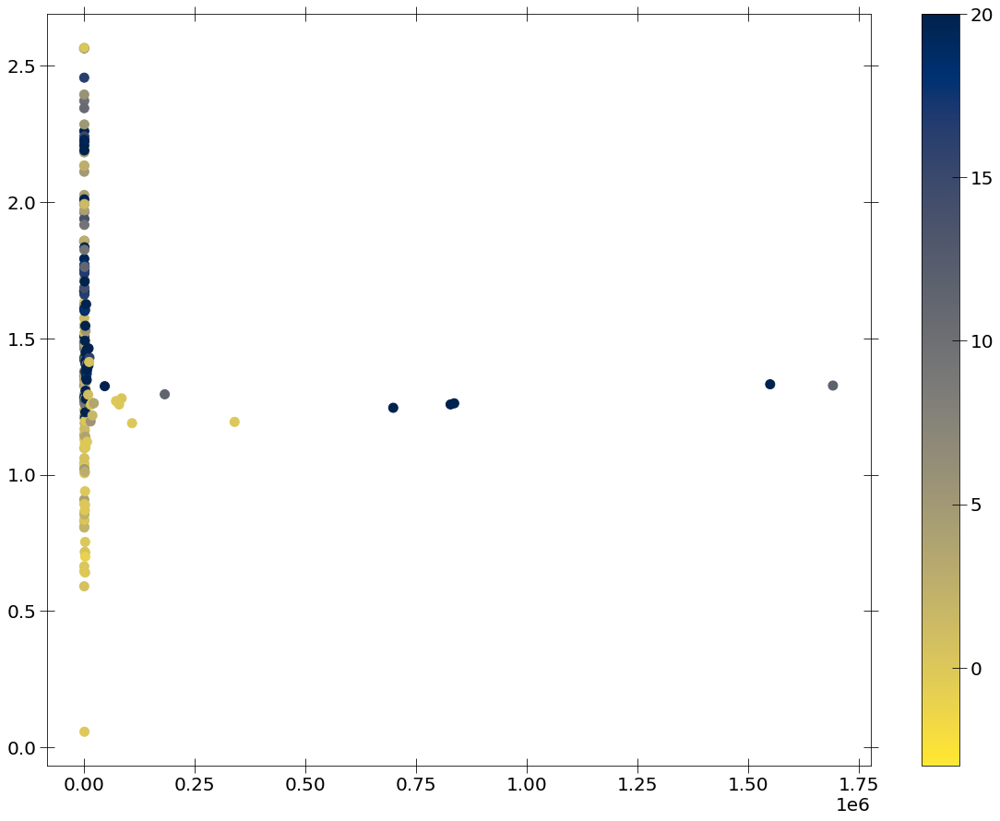

8:17: E128 continuation line under-indented for visual indent
9:17: E128 continuation line under-indented for visual indent


In [255]:
fig, axs = plt.subplots()
xdatas = spec_summary_msps['counts'][0][0][1][spec_summary_msps[
            'spec_masks'][1][0]][interested_msp_args_alldet[0]]
ydatas = obs_color_dict_arr[0]['colors'][interested_msp_args_alldet[0]]
zdatas = (np.array(pn_fit_stats_table_pl)[:, 1].astype(float) -
          np.array(pn_fit_stats_table_pl_g2)[:, 1].astype(float))
scatter_plot = axs.scatter(xdatas, ydatas, c=zdatas,
                marker='o', label=['Data'], cmap='cividis_r',
                norm=Normalize(-3, 20, True))
plt.colorbar(mappable=scatter_plot, ax=axs)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


16.0


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:322: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:38: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


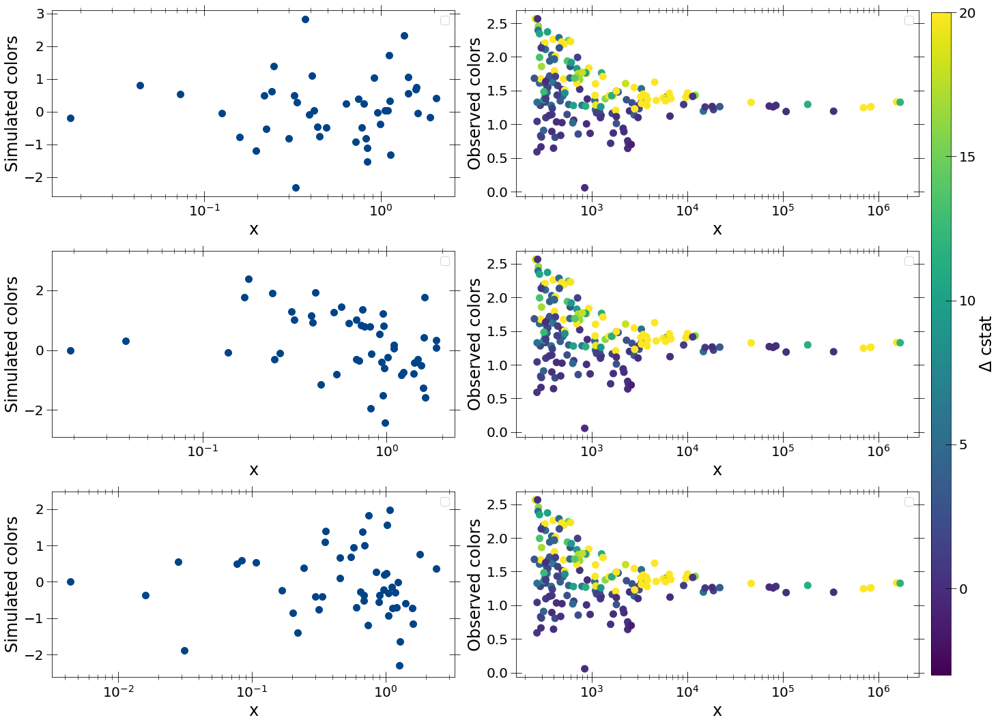

2:9: E231 missing whitespace after ','
26:9: E122 continuation line missing indentation or outdented
27:9: E122 continuation line missing indentation or outdented
29:9: E122 continuation line missing indentation or outdented
30:9: E122 continuation line missing indentation or outdented


In [214]:
plot_subplots(
    3, 2,[[[np.random.normal(size=100)],
           [spec_summary_msps['counts'][0][0][1][spec_summary_msps[
                'spec_masks'][1][0]][interested_msp_args_alldet[0]]]],
          [[np.random.normal(size=100)],
           [spec_summary_msps['counts'][0][0][1][spec_summary_msps[
                'spec_masks'][1][0]][interested_msp_args_alldet[0]]]],
          [[np.random.normal(size=100)],
           [spec_summary_msps['counts'][0][0][1][spec_summary_msps[
                'spec_masks'][1][0]][interested_msp_args_alldet[0]]]]],
    [[[np.random.normal(size=100)],
      [obs_color_dict_arr[0]['colors'][interested_msp_args_alldet[0]]]],
     [[np.random.normal(size=100)],
      [obs_color_dict_arr[0]['colors'][interested_msp_args_alldet[0]]]],
     [[np.random.normal(size=100)],
      [obs_color_dict_arr[0]['colors'][interested_msp_args_alldet[0]]]]],
    subp_types_arr=[['linescatter', 'linescatter'],
                    ['linescatter', 'linescatter'],
                    ['linescatter', 'linescatter']],
    pl_types_arr=[[['scatter'], ['scatter']], [['scatter'], ['scatter']],
                  [['scatter'], ['scatter']]],
    zdatas_arr=[[None, [(
        np.array(pn_fit_stats_table_pl)[:, 1].astype(float) -
        np.array(pn_fit_stats_table_pl_g2)[:, 1].astype(float))]],
                [None, [(
        np.array(pn_fit_stats_table_pl)[:, 1].astype(float) -
        np.array(pn_fit_stats_table_pl_g2)[:, 1].astype(float))]],
                [None, [(
        np.array(pn_fit_stats_table_pl)[:, 1].astype(float) -
        np.array(pn_fit_stats_table_pl_g2)[:, 1].astype(float))]]],
    zdata_labels=[[None, r'$\Delta$ cstat'], [None, r'$\Delta$ cstat'],
                  [None, r'$\Delta$ cstat']], common_cbar=True,
    xlabel_arr=[['x', 'x'], ['x', 'x'], ['x', 'x']],
    ylabel_arr=[['Simulated colors', 'Observed colors'],
                ['Simulated colors', 'Observed colors'],
                ['Simulated colors', 'Observed colors']]
)
plt.tight_layout(rect=[0.0, 0.0, 0.95, 1.0])

In [126]:
def mark_delta_cstat(sim_color_dict, props, colors, prop_num=0,
                     color_param=None):
    # print(len(interested_args[0]), len(interested_srcs))
    # print(len(np.unique(interested_srcs)))
    # print(interested_args)
    # print(src_nums[obs_mask][interested_args])
    # print(props[interested_args])
    # print(colors[interested_args])
    prop_bins = sim_color_dict['prop_bins'][prop_num]
    mean_color = sim_color_dict['color_stat'][0][prop_num]
    std_color = sim_color_dict['color_stat'][2][prop_num]
    plotline_scatter([props, prop_bins, prop_bins],
                     [colors, mean_color + 2*std_color,
                      mean_color - 2*std_color],
                     zdatas=[color_param, None, None],
                     pl_types=['scatter', 'step', 'step'],
                     xlabel='Net counts', ylabel='Colors',
                     pl_labels=['Colors',
                                r'Mean + 2$\sigma$', r'Mean + 2$\sigma$'],
                     ylim=(0, 5),
                     zdata_label=r'$\Delta$C-statistics')

In [239]:
np.where(interested_msp_srcs_alldet[0][174]

'201129721010005'

In [339]:
np.where(spec_summary_msps['src_nums'][1] == '2CXOJ17')

2697

In [448]:
set_plotparams('presentation')

1 1
[152123.07704477]
[1.0429432]
4.0
16.0


(array([1.0429432]), array([152123.07704477]))

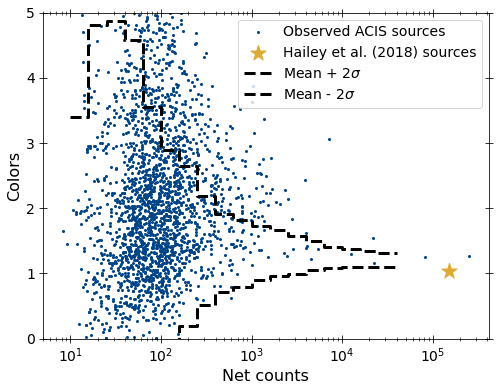

In [668]:
mark_interested_srcs(
    sim_msps_color_dict_arr[2], obs_color_dict_arr[2],
    spec_summary_msps['src_nums'][1], spec_summary_msps['spec_masks'][1][2],
    ['2CXOJ174540.1-290029'])

5 5
[ 159.66586281  677.92326981 1127.33959596  309.98665049  276.70697482]
[3.73690051 1.42771088 2.3166538  1.41798004 3.0309139 ]
4.0
16.0


(array([3.73690051, 1.42771088, 2.3166538 , 1.41798004, 3.0309139 ]),
 array([ 159.66586281,  677.92326981, 1127.33959596,  309.98665049,
         276.70697482]))

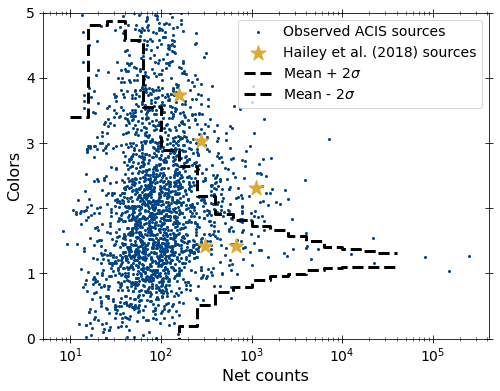

In [453]:
mark_interested_srcs(
    sim_msps_color_dict_arr[2], obs_color_dict_arr[2],
    spec_summary_msps['src_nums'][1], spec_summary_msps['spec_masks'][1][2],
    ['2CXOJ174540.4-290036', '2CXOJ174539.4-290041', '2CXOJ174539.4-290046',
     '2CXOJ174540.3-290049', '2CXOJ174539.2-290049'])

178 178
[3.51929452e+02 2.85294758e+02 2.89900690e+02 1.09565166e+03
 7.49243170e+02 3.28559219e+02 3.11964577e+02 4.55196441e+02
 8.27433431e+05 5.96645536e+02 7.92697065e+02 9.16992095e+03
 4.85332639e+02 3.25306748e+02 4.08206137e+02 1.54909836e+06
 9.30937683e+02 6.99856597e+02 3.44820290e+02 2.57981436e+02
 8.85897224e+02 2.67528644e+02 2.68595336e+02 2.94651765e+02
 8.47174487e+04 6.60136088e+03 1.26841783e+03 1.21181910e+04
 7.22966675e+02 7.48358480e+02 5.56503317e+02 4.16713717e+02
 5.68590748e+02 3.40981312e+02 4.40901747e+02 7.51555764e+02
 4.88542554e+02 1.25161345e+03 2.84365253e+02 4.05197362e+02
 1.69089265e+06 7.20608062e+04 5.13713407e+02 1.31105171e+03
 3.19667720e+02 6.01445394e+02 4.68829381e+02 7.90787519e+04
 3.13135268e+03 2.77346210e+02 4.07644559e+02 3.33391841e+03
 1.47485721e+04 4.55965172e+03 9.75119473e+03 8.45773926e+02
 3.10962163e+03 6.12303724e+02 7.11537338e+02 3.28184955e+02
 1.53723699e+04 1.64034083e+03 2.64632472e+03 1.89057618e+03
 3.77918079e+02 

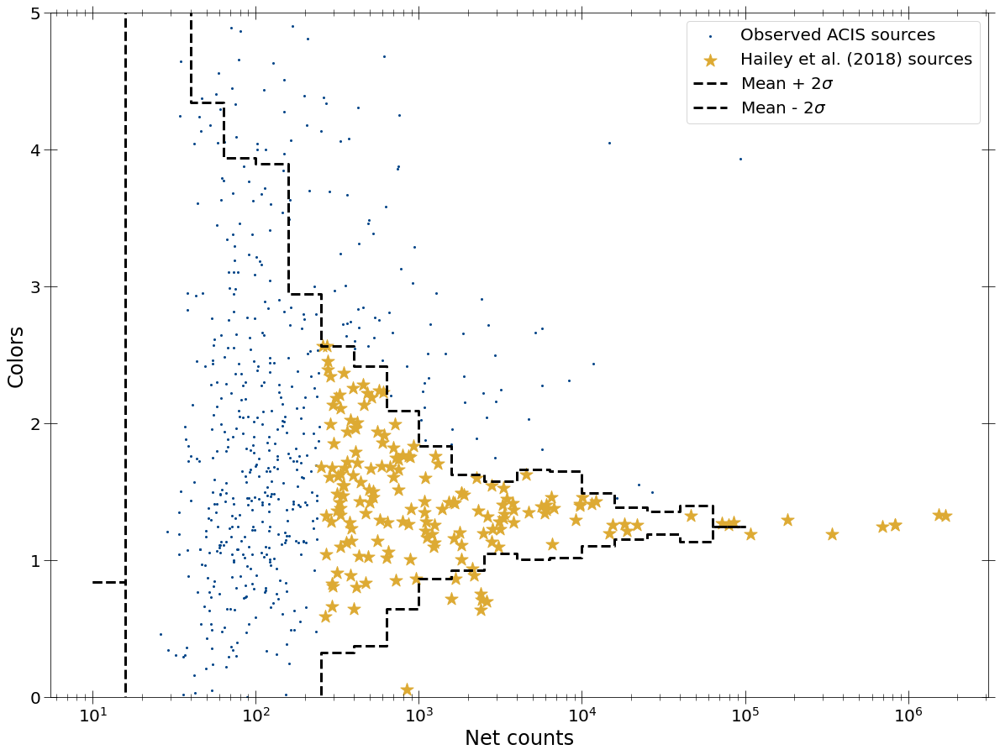

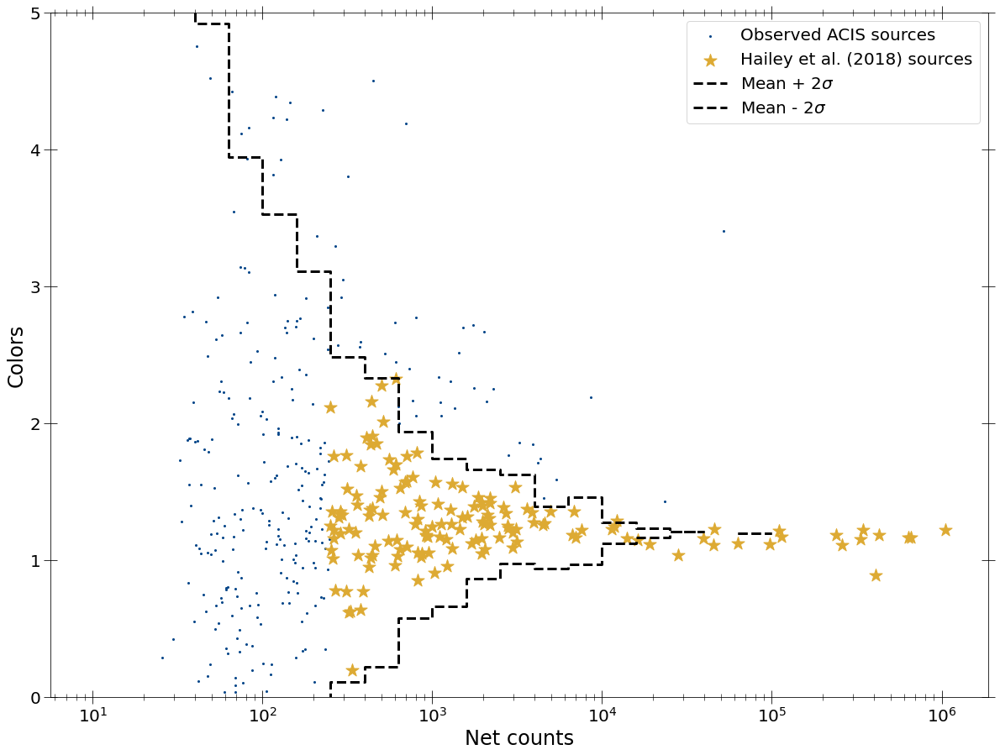

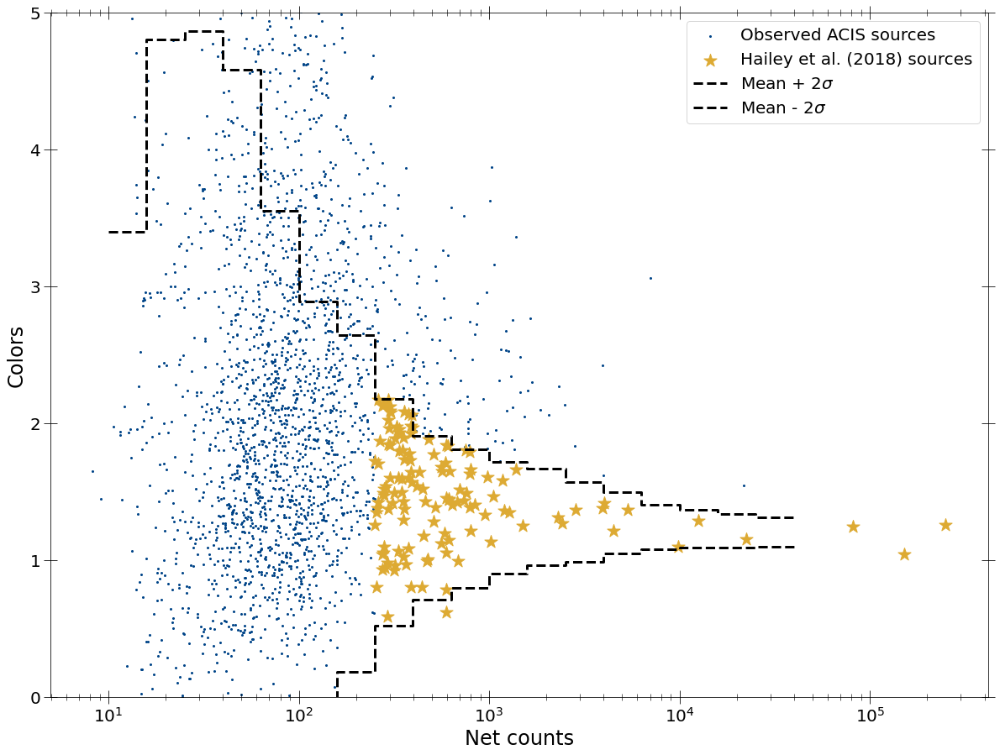

In [29]:
interested_msp_colors_pn, interested_msp_netcounts_pn = mark_interested_srcs(
    sim_msps_color_dict_arr[0], obs_color_dict_arr[0],
    spec_summary_msps['src_nums'][0], spec_summary_msps['spec_masks'][1][0],
    interested_msp_srcs_alldet[0])
interested_msp_colors_mos, interested_msp_netcounts_mos = mark_interested_srcs(
    sim_msps_color_dict_arr[1], obs_color_dict_arr[1],
    spec_summary_msps['src_nums'][0], spec_summary_msps['spec_masks'][1][1],
    interested_msp_srcs_alldet[1])
(interested_msp_colors_acis,
 interested_msp_netcounts_acis) = mark_interested_srcs(
    sim_msps_color_dict_arr[2], obs_color_dict_arr[2],
    spec_summary_msps['src_nums'][1], spec_summary_msps['spec_masks'][1][2],
    interested_msp_srcs_alldet[2])

In [74]:
interested_msps_xmm = np.array(
    list(set(interested_msp_srcs_alldet[0]) |
         set(interested_msp_srcs_alldet[1])))

In [31]:
len(interested_msps_xmm)

267

In [32]:
arr_to_str(np.array(interested_msp_srcs_alldet[2]).astype(str), telescope='Chandra')

NameError: name 'arr_to_str' is not defined

## Spectral analysis to check for lines

In [33]:
xspec.Xset.version

('2.0.4', '12.11.1')

In [169]:
def fit_src_pl(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder +
                                 str(source_num) + '_PN_combined_src_grp1*')
        spec_mosfile = glob2.glob(src_folder +
                                  str(source_num) + '_MOS_combined_src_grp1*')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        os.chdir(src_folder + '/' + source_num)
        spec_file = str(source_num) + '_combined_src_grp1.pi'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')

    model = xspec.Model('tbabs*pegpwrlw')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 10, 10]
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.perform()
    xspec.Fit.error('2.706 1')
    xspec.Fit.error('2.706 2')
    xspec.Fit.error('2.706 5')
    xspec.Fit.perform()
    # print('Calculating goodness')
    # goodness = xspec.Fit.goodness(1000)
    # print('Finished calculating goodness')
    goodness = 50.0
    print('Model params for ' + source_num +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0])
    print('Fit stats for ' + source_num + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    if telescope == 'Chandra':
        os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).TBabs.nH.error[0],
             xspec.AllModels(1).TBabs.nH.error[1],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.error[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.error[1],
             xspec.AllModels(1).pegpwrlw.norm.values[0],
             xspec.AllModels(1).pegpwrlw.norm.error[0],
             xspec.AllModels(1).pegpwrlw.norm.error[1]])

In [167]:
def fit_src_pl_gauss(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder +
                                 str(source_num) + '_PN_combined_src_grp1*')
        spec_mosfile = glob2.glob(src_folder +
                                  str(source_num) + '_MOS_combined_src_grp1*')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        os.chdir(src_folder + '/' + source_num)
        spec_file = str(source_num) + '_combined_src_grp1.pi'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')
    
    model = xspec.Model('tbabs*(pegpwrlw+gauss)')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 10, 10]
    model.pegpwrlw.eMin.values = '2.0'
    model.pegpwrlw.eMax.values = '10.0'
    model.gaussian.LineE.values = '6.7, 0.0001, 6.1, 6.1, 7.3, 7.3'
    model.gaussian.Sigma.values = '0.1 0'
    model.gaussian.norm.values = '1.0E-5, 0.001,,,,'
    
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.query = 'yes'
    xspec.Fit.perform()
    xspec.Fit.error('2.706 6')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 8')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 6')
    xspec.Fit.error('2.706 8')
    xspec.Fit.perform()
    # goodness = xspec.Fit.goodness(1000)
    goodness = 50.0
    line_pos_low = xspec.AllModels(1).gaussian.LineE.error[0]
    line_pos_high = xspec.AllModels(1).gaussian.LineE.error[1]
    line_norm_low = xspec.AllModels(1).gaussian.norm.error[0]
    line_norm_high = xspec.AllModels(1).gaussian.norm.error[1]
    print('Model params for ' + source_num +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0],
          ' Fe_pos:', xspec.AllModels(1).gaussian.LineE.values[0],
          line_pos_low, line_pos_high,
          ' Fe_norm:', xspec.AllModels(1).gaussian.norm.values[0],
          line_norm_low, line_norm_high)
    print('Fit stats for ' + source_num + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0],
             xspec.AllModels(1).gaussian.LineE.values[0], line_pos_low,
             line_pos_high,
             xspec.AllModels(1).gaussian.norm.values[0], line_norm_low,
             line_norm_high])


In [36]:
def fit_src_pl_gauss2(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder +
                                 str(source_num) + '_PN_combined_src_grp1*')
        print(src_folder + str(source_num) + '_PN_combined_src_grp1*')
        spec_mosfile = glob2.glob(src_folder +
                                  str(source_num) + '_MOS_combined_src_grp1*')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        os.chdir(src_folder + '/' + source_num)
        spec_file = str(source_num) + '_combined_src_grp1.pi'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')
    
    model = xspec.Model('tbabs*(pegpwrlw+gauss+gauss+gauss)')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    model.pegpwrlw.eMin.values = '2.0'
    model.pegpwrlw.eMax.values = '10.0'
    model.gaussian.LineE.values = '6.4 0'
    model.gaussian.Sigma.values = '0.0 0'
    model.gaussian.norm.values = '1.0E-5, 0.001,,,,'
    model.gaussian_4.LineE.values = '6.7 0'
    model.gaussian_4.Sigma.values = '0.0 0'
    model.gaussian_4.norm.values = '1.0E-5, 0.001,,,,'
    model.gaussian_5.LineE.values = '7.0 0'
    model.gaussian_5.Sigma.values = '0.0 0'
    model.gaussian_5.norm.values = '1.0E-5, 0.001,,,,'
    
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.query = 'yes'
    xspec.Fit.perform()
    xspec.Fit.error('2.706 8')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 11')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 14')
    # xspec.Fit.error('2.706 8')
    # goodness = xspec.Fit.goodness(1000)
    goodness = 50.0
    line_norm1_low = xspec.AllModels(1).gaussian.norm.error[0]
    line_norm1_high = xspec.AllModels(1).gaussian.norm.error[1]
    line_norm2_low = xspec.AllModels(1).gaussian_4.norm.error[0]
    line_norm2_high = xspec.AllModels(1).gaussian_4.norm.error[1]
    line_norm3_low = xspec.AllModels(1).gaussian_5.norm.error[0]
    line_norm3_high = xspec.AllModels(1).gaussian_5.norm.error[1]
    xspec.Fit.perform()
    print('Model params for ' + source_num +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0],
          ' Fe_norms:', xspec.AllModels(1).gaussian.norm.values[0],
          line_norm1_low, line_norm1_high,
          xspec.AllModels(1).gaussian_4.norm.values[0], line_norm2_low,
          line_norm2_high, xspec.AllModels(1).gaussian_5.norm.values[0],
          line_norm3_low, line_norm3_high)
    print('Fit stats for ' + source_num + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0],
             xspec.AllModels(1).gaussian.norm.values[0],
             xspec.AllModels(1).gaussian_4.norm.values[0],
             xspec.AllModels(1).gaussian_5.norm.values[0], line_norm1_low,
             line_norm1_high, line_norm2_low, line_norm2_high, line_norm3_low,
             line_norm3_high])


In [172]:
os.chdir('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/xmm_combined_copy/')
xspec.AllData.clear()
fit_src_pl(interested_msp_srcs_alldet[1][1], src_folder='./')

Model params for 206735502010052: NH =  20.693364822363186  Gamma:  3.4864997420049946  norm:  0.3456445341562544
Fit stats for 206735502010052:  351.1758952521991 -7.262927003127242 50.0 363




(['206735502010052', 351.1758952521991, -7.262927003127242, 50.0, 363],
 ['206735502010052',
  20.693364822363186,
  2.2103459632361044,
  57.83884712956594,
  3.4864997420049946,
  0.2354941878885164,
  9.474329205726262,
  0.3456445341562544,
  0.12897197151678316,
  28.548298172121722])

In [171]:
os.chdir('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/chandra_obs_hard07/')
xspec.AllData.clear()
fit_src_pl(interested_msp_srcs_alldet[2][-1], src_folder='./', telescope='Chandra')

Model params for 2CXOJ174621.1-284343: NH =  23.855978309748885  Gamma:  0.8033917107726718  norm:  188.16904496763905
Fit stats for 2CXOJ174621.1-284343:  10556.325781206078 -11.348492012503105 50.0 546




(['2CXOJ174621.1-284343', 10556.325781206078, -11.348492012503105, 50.0, 546],
 ['2CXOJ174621.1-284343',
  23.855978309748885,
  23.708109465576882,
  24.169081449405244,
  0.8033917107726718,
  0.7751607103108464,
  0.8334387875646728,
  188.16904496763905,
  186.85329442538486,
  189.56112318480425])

In [ ]:
pn_fit_stats_table_pl = []
pn_model_params_table_pl = []

for source_num in interested_msp_srcs_alldet[0]:
    print(source_num)
    fit_stats, model_params = fit_src_pl(source_num)
    pn_fit_stats_table_pl.append(fit_stats)
    pn_model_params_table_pl.append(model_params)

200305401010008
Model params for 200305401010008: NH =  9.344266850740842  Gamma:  0.19410776418555548  norm:  0.17774265248212534
Fit stats for 200305401010008:  502.2244488199891 -7.2470573524284605 50.0 633


200305401010017
Model params for 200305401010017: NH =  18.940898825031958  Gamma:  1.5812179425340092e-06  norm:  0.1574956868319943
Fit stats for 200305401010017:  462.2932653779947 -6.731047035872305 50.0 479


200305401015015
Model params for 200305401015015: NH =  5.699741015035504  Gamma:  0.5907400423749906  norm:  0.18491706635106686
Fit stats for 200305401015015:  502.534912686133 -7.749811635856098 50.0 642


201113501010117
Model params for 201113501010117: NH =  15.146643815232116  Gamma:  1.5496497858140194e-06  norm:  0.15869035482010502
Fit stats for 201113501010117:  946.9599692569753 -6.351397990113702 50.0 1183


201113501010148
Model params for 201113501010148: NH =  90.35961546843775  Gamma:  1.7768477179035511  norm:  0.22360024321148486
Fit stats for 20111

Model params for 208441011010211: NH =  3.1249634485967452  Gamma:  1.3753767535559687  norm:  0.844488016807838
Fit stats for 208441011010211:  520.1027682345241 -4.772808368476277 50.0 607


208624701010022
Model params for 208624701010022: NH =  1.791147600962058  Gamma:  0.09360854336226831  norm:  0.7137157725091869
Fit stats for 208624701010022:  416.92630910666713 -6.005503717380122 50.0 410


208860108010001
Model params for 208860108010001: NH =  3.0575261395985787  Gamma:  0.8402831885747207  norm:  0.6980358915850594
Fit stats for 208860108010001:  655.4662296434146 -6.5647624133459885 50.0 726


208860204010001
Model params for 208860204010001: NH =  3.4004982211731116  Gamma:  0.4550731626575946  norm:  1.0014204409351575
Fit stats for 208860204010001:  489.5594109593976 -5.79238011389519 50.0 537


208860207010007
Model params for 208860207010007: NH =  6.899645433327769  Gamma:  0.5581816130213046  norm:  0.72072399559184
Fit stats for 208860207010007:  1063.027121723713

Model params for 201129704010019: NH =  29.87684179344389  Gamma:  0.6025216927023248  norm:  0.1936540894180478
Fit stats for 201129704010019:  1297.2771547305306 -6.7961339985059865 50.0 1425


201129704010027
Model params for 201129704010027: NH =  41.666765655756905  Gamma:  0.8823156558477219  norm:  0.362991898279972
Fit stats for 201129704010027:  1259.2802700055925 -5.889062391335153 50.0 1576


201129707010002
Model params for 201129707010002: NH =  16.008572533369588  Gamma:  0.18894349461418486  norm:  0.19323181673022768
Fit stats for 201129707010002:  799.9107553799101 -6.352813734431568 50.0 875


201129707010012


In [39]:
pn_fit_stats_table_pl_g = []
pn_model_params_table_pl_g = []
pn_fit_stats_table_pl_g2 = []
pn_model_params_table_pl_g2 = []

for source_num in interested_msp_srcs_alldet[0]:
    print(source_num)
    fit_stats, model_params = fit_src_pl_gauss(source_num)
    fit_stats2, model_params2 = fit_src_pl_gauss2(source_num)
    pn_fit_stats_table_pl_g.append(fit_stats)
    pn_model_params_table_pl_g.append(model_params)
    pn_fit_stats_table_pl_g2.append(fit_stats2)
    pn_model_params_table_pl_g2.append(model_params2)

200305401010008
Model params for 200305401010008: NH =  9.410836668716426  Gamma:  0.31316429628305037  norm:  0.1682937324065252  Fe_pos: 6.679061382304389 0.0 0.0  Fe_norm: 4.914938239077425e-07 0.0 1.1220576072478822e-06
Fit stats for 200305401010008:  499.9877717445126 -7.381164157317857 50.0 631


./200305401010008_PN_combined_src_grp1*
Model params for 200305401010008: NH =  9.946547867151342  Gamma:  0.3908724547127917  norm:  0.16758792040410508  Fe_norms: 2.9399486915566293e-12 0.0 3.785411496372471e-07 4.063090036987953e-07 0.0 9.137043201791979e-07 2.391594001222694e-07 0.0 7.733016261669386e-07
Fit stats for 200305401010008:  499.0322629449573 -7.437809985037863 50.0 630


200305401010017
Model params for 200305401010017: NH =  14.52312604998171  Gamma:  9.021123871804771e-05  norm:  0.13152636114870503  Fe_pos: 6.750578916219702 6.666456797029645 6.833324050885356  Fe_norm: 8.014779734442652e-07 4.046797157526311e-07 1.2765232316456662e-06
Fit stats for 200305401010017:  4

Model params for 201129707010033: NH =  13.93686628682373  Gamma:  0.3679833979511906  norm:  0.13347689274906285  Fe_norms: 1.251788754989287e-07 0.0 4.570416079298775e-07 3.993436402749126e-07 7.213503594143747e-08 7.921233557793845e-07 1.304826257630878e-07 0.0 4.826977808106035e-07
Fit stats for 201129707010033:  399.6425618686704 -8.59615945807336 50.0 473


201129708010014
Model params for 201129708010014: NH =  12.862933115536036  Gamma:  0.08452578472120434  norm:  0.16731508105658455  Fe_pos: 6.8690170187721975 6.699144685637003 7.0133813892604975  Fe_norm: 5.746222015396484e-07 1.366844237854955e-07 1.0829315122984273e-06
Fit stats for 201129708010014:  650.2690609518199 -7.560154641445916 50.0 848


./201129708010014_PN_combined_src_grp1*
Model params for 201129708010014: NH =  12.70635123482562  Gamma:  0.10057375070288892  norm:  0.16420468630177382  Fe_norms: 1.347405326477065e-07 0.0 4.501218232380714e-07 2.3150620567760128e-07 0.0 5.906783522129695e-07 3.410575179425313

Model params for 205110002015026: NH =  3.5208333358892654  Gamma:  1.4776354292490224  norm:  0.06718674700893204  Fe_pos: 6.569189030497104 6.189564669055946 6.795764183958111  Fe_norm: 3.2620062318130246e-07 6.523673459600386e-08 6.273792496898587e-07
Fit stats for 205110002015026:  677.6228183796045 -9.325885357879326 50.0 823


./205110002015026_PN_combined_src_grp1*
Model params for 205110002015026: NH =  4.063340062882311  Gamma:  1.6393193570854279  norm:  0.06627591499695185  Fe_norms: 1.8394547342734013e-07 0.0 4.243521490419012e-07 2.0310380601586837e-07 0.0 4.4774374603583886e-07 1.5073624952544337e-07 0.0 4.026565723795776e-07
Fit stats for 205110002015026:  676.2119295113023 -9.256224009150964 50.0 822


205110012010036
Model params for 205110012010036: NH =  11.471724648567362  Gamma:  1.3471258088695777  norm:  2.3992909732056638  Fe_pos: 6.890725268140341 0.0 0.0  Fe_norm: 4.496533422208207e-06 0.0 1.0912347392172984e-05
Fit stats for 205110012010036:  293.115195978413

Model params for 208024101010012: NH =  10.023915119408793  Gamma:  0.4393381358620523  norm:  0.30797137745254116  Fe_norms: 5.085832097441468e-07 6.62131505341601e-09 1.1099017773250435e-06 1.0440192064250552e-06 4.626629949556527e-07 1.7316585848647164e-06 2.9802761311747025e-15 0.0 3.454886656265037e-07
Fit stats for 208024101010012:  668.198125385403 -6.065188401392223 50.0 697


208251401010016
Model params for 208251401010016: NH =  6.720345924411799  Gamma:  4.0324830990948767e-07  norm:  0.11581619786514812  Fe_pos: 6.899914967123236 6.817985869883025 6.983728877251382  Fe_norm: 7.576170535063917e-07 3.5634612744732976e-07 1.2162803513739586e-06
Fit stats for 208251401010016:  493.5115325367089 -7.25219779427016 50.0 644


./208251401010016_PN_combined_src_grp1*
Model params for 208251401010016: NH =  6.242080447932193  Gamma:  1.2422628796565503e-06  norm:  0.11117229300897022  Fe_norms: 3.023037362532391e-07 4.962088895289368e-08 5.937911521950241e-07 1.251753767080676e-07 0

Model params for 201129701010015: NH =  3.5518015222337502  Gamma:  0.8309308343027613  norm:  0.07681672166749906  Fe_pos: 6.807971467195359 6.679075858000969 6.921312742146225  Fe_norm: 3.6669154268101983e-07 1.1258930135148054e-07 6.616759615790213e-07
Fit stats for 201129701010015:  887.3121592712932 -6.866900087834992 50.0 1129


./201129701010015_PN_combined_src_grp1*
Model params for 201129701010015: NH =  3.31838177978455  Gamma:  0.7720457656416215  norm:  0.07743181625076409  Fe_norms: 5.0165736722728575e-08 0.0 2.3384348074867808e-07 1.7731910608465431e-07 0.0 4.0149084300016715e-07 7.230784333993648e-08 0.0 3.0057651856136355e-07
Fit stats for 201129701010015:  890.5552949666865 -6.841347602201237 50.0 1128


201129702010014
Model params for 201129702010014: NH =  30.65179054071197  Gamma:  0.7906844512414385  norm:  0.2316584127880135  Fe_pos: 6.893565611126618 6.827823336044008 6.959508470322066  Fe_norm: 1.1784724438802806e-06 7.05652480147419e-07 1.7216665896924634e-06


Model params for 201129715010042: NH =  29.014581646908255  Gamma:  1.3190134044807658  norm:  0.15452073634619964  Fe_pos: 6.880876774608856 6.703262712818714 0.0  Fe_norm: 3.352242869143134e-07 5.046355614804857e-08 6.547910652611686e-07
Fit stats for 201129715010042:  818.1725485498528 -5.655026696953732 50.0 982


./201129715010042_PN_combined_src_grp1*
Model params for 201129715010042: NH =  28.436530573677096  Gamma:  1.3139123014099796  norm:  0.15058840267890955  Fe_norms: 9.935825774100544e-08 0.0 3.3691421942966214e-07 1.3677429768894864e-07 0.0 3.8210591785387394e-07 2.0104435854861727e-07 0.0 4.5078742239619817e-07
Fit stats for 201129715010042:  818.375476095481 -5.65039216945856 50.0 981


201129719010009
Model params for 201129719010009: NH =  49.40152667771614  Gamma:  5.123790980165688e-07  norm:  1.6195585453813715  Fe_pos: 6.347910209620275 6.279185108127587 6.419961993406753  Fe_norm: 6.229349912523104e-06 3.76317401614872e-06 8.932552789072878e-06
Fit stats for 201

Model params for 206946401010004: NH =  9.21728249917486  Gamma:  1.4617687225228442  norm:  1.843411568522415  Fe_norms: 3.914016725805979e-09 0.0 4.185131432504445e-06 3.977458754328615e-06 0.0 9.056822252935695e-06 3.701549984001526e-06 0.0 9.386844828065428e-06
Fit stats for 206946401010004:  438.02913300600653 -8.192708791637695 50.0 511


206946402010031
Model params for 206946402010031: NH =  9.786235380714661  Gamma:  2.605862811566966  norm:  0.8037790134121311  Fe_pos: 6.359243773528146 0.0 0.0  Fe_norm: 1.4248269171223095e-06 0.0 3.7850650554341048e-06
Fit stats for 206946402010031:  419.1170696200028 -9.015813710805425 50.0 540


./206946402010031_PN_combined_src_grp1*
Model params for 206946402010031: NH =  10.306571872954802  Gamma:  2.7427510084909894  norm:  0.8271521058818323  Fe_norms: 6.608648173929368e-07 0.0 2.5052149994590275e-06 6.9679760345735e-07 0.0 2.5532342154224027e-06 1.2702700766682821e-06 0.0 3.4142497978926804e-06
Fit stats for 206946402010031:  417.903

Model params for 201129704010027: NH =  30.594093767728356  Gamma:  0.6529402428109595  norm:  0.2631722940714448  Fe_norms: 5.321772733162584e-07 2.127880689105929e-07 8.831596726912343e-07 6.620054974530493e-07 3.312452786131029e-07 1.0287098514826697e-06 3.6004404165406866e-07 4.3239829570595086e-08 7.108896521725177e-07
Fit stats for 201129704010027:  1239.8228624729345 -6.023660403105277 50.0 1573


201129707010002
Model params for 201129707010002: NH =  14.138656353158284  Gamma:  0.15814339979881714  norm:  0.17713460491570443  Fe_pos: 6.5984285013259205 6.418827833960344 6.756805979125307  Fe_norm: 5.850179495518406e-07 2.458968443134455e-07 9.538253153937607e-07
Fit stats for 201129707010002:  791.2956712828801 -6.389123762816667 50.0 873


./201129707010002_PN_combined_src_grp1*
Model params for 201129707010002: NH =  13.073458092068035  Gamma:  0.15995987858214075  norm:  0.16619095529020503  Fe_norms: 4.0926796354535336e-07 1.6808808932832206e-07 6.810482446327783e-07 4.643

Model params for 207234103015041: NH =  8.391367666575492  Gamma:  0.21424726541188893  norm:  2.3487376903253394  Fe_norms: 6.096617492524817e-07 0.0 2.7971149556988767e-06 5.284370028759066e-07 0.0 2.9452945292946636e-06 3.235417314270233e-06 7.061695553005979e-07 6.131785508999179e-06
Fit stats for 207234103015041:  1310.785934883524 -5.483950276486397 50.0 1487


207234105010024
Model params for 207234105010024: NH =  8.308923432502255  Gamma:  0.719852283093082  norm:  3.931593182979364  Fe_pos: 6.9256752808349855 6.750773323227466 7.1249500194104  Fe_norm: 7.329350055649779e-06 2.8227064902699813e-06 1.222186574447772e-05
Fit stats for 207234105010024:  3201.7281280162906 -2.8387955777788116 50.0 1852


./207234105010024_PN_combined_src_grp1*
Model params for 207234105010024: NH =  8.398808843090851  Gamma:  0.7582944393074017  norm:  3.879815231530631  Fe_norms: 2.0165672494760113e-06 0.0 5.06498605867635e-06 3.7671016472390683e-06 7.819976577313953e-07 7.09923601219413e-06 5.10

Model params for 206946409010002: NH =  9.51008843315819  Gamma:  2.2541357280509606  norm:  2.0064674817506627  Fe_pos: 6.447056789487504 6.300687585525322 6.578342645921346  Fe_norm: 4.935879508442289e-06 1.637688952570642e-06 8.701996286597252e-06
Fit stats for 206946409010002:  717.7336678507119 -10.339158071583743 50.0 779


./206946409010002_PN_combined_src_grp1*
Model params for 206946409010002: NH =  9.499756582104007  Gamma:  2.2445491763870087  norm:  2.011330288451494  Fe_norms: 3.0344000128748276e-06 4.969690731026422e-07 6.083664958844511e-06 5.930469751173878e-13 0.0 2.390991602970753e-06 2.0332091237004306e-06 0.0 5.272203637032467e-06
Fit stats for 206946409010002:  719.072838285403 -10.264818800524571 50.0 778


207234103010016
Model params for 207234103010016: NH =  7.3532519064837105  Gamma:  0.3326117712175353  norm:  4.0892894505147135  Fe_pos: 6.95258852660183 6.857173869067835 7.046914878138147  Fe_norm: 1.568922126200109e-05 9.67209845082261e-06 2.22293185249986

Model params for 201529201010094: NH =  6.72731023402895  Gamma:  1.7200799581776547  norm:  1.3871434983018505  Fe_norms: 7.033110832649345e-07 0.0 1.7599375768292383e-06 6.689327674105415e-07 0.0 1.8014030571722003e-06 7.030397940559147e-07 0.0 1.8623508118635265e-06
Fit stats for 201529201010094:  901.5004880580291 -9.725624896156752 50.0 998


202026707010271
Model params for 202026707010271: NH =  19.81616228781602  Gamma:  5.0  norm:  5.46101179549345  Fe_pos: 6.518196676760956 0.0 0.0  Fe_norm: 3.6732844999604494e-23 0.8224962005991274 0.0
Fit stats for 202026707010271:  860.2236774003702 -7.707607868710697 50.0 928


./202026707010271_PN_combined_src_grp1*
Model params for 202026707010271: NH =  19.863726388291084  Gamma:  5.0  norm:  5.492386130414503  Fe_norms: 6.029533503696923e-23 0.8224962005991274 0.0 2.371805345563363e-22 0.0 4.7173990332853966e-07 1.1658015302696802e-22 0.8224962005991274 0.0
Fit stats for 202026707010271:  860.2418859977058 -7.675704372569055 50.0 927


Model params for 207901804010066: NH =  18.807918931877985  Gamma:  5.0  norm:  4.973258426421662  Fe_norms: 1.976980377478863e-22 0.8224962005991274 0.0 1.1588629482791923e-22 0.8224962005991274 0.0 2.395868602836693e-22 0.8224962005991274 0.0
Fit stats for 207901804010066:  761.6228954065682 -7.5959834319041155 50.0 811


207901804015015
Model params for 207901804015015: NH =  20.259133473192918  Gamma:  5.0  norm:  6.305964877705168  Fe_pos: 7.003874517860132 0.0 0.0  Fe_norm: 9.997328357789784e-23 0.8224962005991274 0.0
Fit stats for 207901804015015:  869.1797645089695 -7.2671777076169155 50.0 947


./207901804015015_PN_combined_src_grp1*
Model params for 207901804015015: NH =  20.25846253499322  Gamma:  5.0  norm:  6.305595752497505  Fe_norms: 2.2006103850274693e-22 0.8224962005991274 0.0 1.454178107450923e-22 0.8224962005991274 0.0 1.8899679133346076e-22 0.8224962005991274 0.0
Fit stats for 207901804015015:  869.1797569100023 -7.267563721482234 50.0 946


207901804015034
Model pa

Model params for 207234103010038: NH =  7.091331789437479  Gamma:  0.3573536146474777  norm:  3.9864685960307953  Fe_pos: 6.7621954824603066 6.683435048389593 6.852521097122358  Fe_norm: 1.539242677615011e-05 1.1016351666057571e-05 2.0070127460354936e-05
Fit stats for 207234103010038:  1392.3769946358716 -8.019731329915334 50.0 1317


./207234103010038_PN_combined_src_grp1*
Model params for 207234103010038: NH =  7.197897561904507  Gamma:  0.4013764645565274  norm:  3.9165247621107087  Fe_norms: 3.2153044149083574e-06 7.108652258749827e-07 5.958313700423797e-06 9.201684035583024e-06 6.045455748771825e-06 1.263188538623106e-05 8.042134970945531e-06 4.714984211789497e-06 1.1691302421170168e-05
Fit stats for 207234103010038:  1386.4679700479442 -8.188177927764848 50.0 1316


207234103010040
Model params for 207234103010040: NH =  6.600768961380268  Gamma:  0.3905981439246614  norm:  4.140953272504823  Fe_pos: 7.0033337915205705 6.947913140188986 7.063380426796042  Fe_norm: 2.3189432323720

Model params for 207234103010007: NH =  9.763190923472365  Gamma:  0.8147700439972508  norm:  7.851882695267468  Fe_pos: 6.643499310003691 6.577926430423134 6.7186891121969055  Fe_norm: 2.5581874609898808e-05 1.9362626013377965e-05 3.2106092741043924e-05
Fit stats for 207234103010007:  1772.5433057205787 -8.111247772620791 50.0 1365


./207234103010007_PN_combined_src_grp1*
Model params for 207234103010007: NH =  10.158690411607273  Gamma:  0.9386156513260122  norm:  7.627893333840302  Fe_norms: 1.0515837759791826e-05 6.49689553256803e-06 1.4823757064694365e-05 1.6406726087592498e-05 1.1846133852088706e-05 2.129238235642834e-05 2.230746866562561e-05 1.7069216709984334e-05 2.7932095879023914e-05
Fit stats for 207234103010007:  1711.3613882940315 -8.437808512358213 50.0 1364


207234103010014
Model params for 207234103010014: NH =  11.51507623464565  Gamma:  1.0650857113185799  norm:  7.528563865096742  Fe_pos: 6.842015998251528 6.781603782022429 6.906875024837187  Fe_norm: 3.28512659830

Model params for 201129721010003: NH =  12.211822390902206  Gamma:  1.4453845516990516  norm:  1.5171133759611515  Fe_pos: 6.481631662820745 6.353582542380544 6.627968609440513  Fe_norm: 6.005871199755195e-07 1.8348983101322492e-07 1.0280321005139679e-06
Fit stats for 201129721010003:  6055.169085363786 -4.498525331722795 50.0 3103


./201129721010003_PN_combined_src_grp1*
Model params for 201129721010003: NH =  12.209310028271897  Gamma:  1.4445713730321499  norm:  1.517278729770509  Fe_norms: 4.0825177223700537e-07 1.0119156735239031e-07 7.272915080731829e-07 1.7699367970000317e-07 0.0 5.131160071306973e-07 8.447718372173616e-17 0.0 2.3729129245821272e-07
Fit stats for 201129721010003:  6055.410545732114 -4.498579843825509 50.0 3102


201442201010001
Model params for 201442201010001: NH =  12.258470560211041  Gamma:  1.8561660508790536  norm:  5.26199636685128  Fe_pos: 6.8543017292212705 0.0 0.0  Fe_norm: 7.084662665543075e-07 0.0 2.0430628040459284e-06
Fit stats for 201442201010001:

./201113503010004_PN_combined_src_grp1*
Model params for 201113503010004: NH =  16.97765963734924  Gamma:  1.7937406212515636  norm:  115.16842760032849  Fe_norms: 6.788439228302758e-06 4.237893828760984e-06 9.353788855333642e-06 6.773187197168101e-06 4.1744895426778085e-06 9.387506916202035e-06 4.602917537565515e-06 1.939238323613772e-06 7.282841456105761e-06
Fit stats for 201113503010004:  5370.167463858613 -10.493574654609356 50.0 3192


201129704010001
Model params for 201129704010001: NH =  28.773881521531976  Gamma:  1.5196903482163822  norm:  239.84525689291777  Fe_pos: 6.138919100032484 0.0 6.199406141358341  Fe_norm: 3.139533792311152e-05 2.6675766690138718e-05 3.5968688124210105e-05
Fit stats for 201129704010001:  6780.820110542423 -11.456796230191582 50.0 3193


./201129704010001_PN_combined_src_grp1*
Model params for 201129704010001: NH =  28.824993761847313  Gamma:  1.5241895160892978  norm:  240.35194384317094  Fe_norms: 1.643277245239836e-05 1.2788884022106574e-05 2.0091

In [ ]:
mos_fit_stats_table_pl = []
mos_model_params_table_pl = []

for source_num in interested_msp_srcs_alldet[1]:
    print(source_num)
    fit_stats, model_params = fit_src_pl(source_num)
    mos_fit_stats_table_pl.append(fit_stats)
    mos_model_params_table_pl.append(model_params)

In [41]:
mos_fit_stats_table_pl_g = []
mos_model_params_table_pl_g = []
mos_fit_stats_table_pl_g2 = []
mos_model_params_table_pl_g2 = []

for source_num in interested_msp_srcs_alldet[1]:
    print(source_num)
    fit_stats, model_params = fit_src_pl_gauss(source_num)
    fit_stats2, model_params2 = fit_src_pl_gauss2(source_num)
    mos_fit_stats_table_pl_g.append(fit_stats)
    mos_model_params_table_pl_g.append(model_params)
    mos_fit_stats_table_pl_g2.append(fit_stats2)
    mos_model_params_table_pl_g2.append(model_params2)

206556701010043
Model params for 206556701010043: NH =  0.1  Gamma:  1.2617939113972458  norm:  0.027650143219477948  Fe_pos: 6.4445473726969045 6.217669686012193 6.694955051108191  Fe_norm: 4.62964503865472e-07 1.8737942822974002e-08 1.0239672684288125e-06
Fit stats for 206556701010043:  317.7382366536512 -5.7849819273089675 50.0 446


./206556701010043_PN_combined_src_grp1*
Model params for 206556701010043: NH =  0.1  Gamma:  1.2416793955394927  norm:  0.027963468217106  Fe_norms: 2.8371056716499094e-07 0.0 7.340219593652709e-07 2.4123170083782753e-08 0.0 4.4994481668696057e-07 2.1364999622954444e-07 0.0 7.266981144282322e-07
Fit stats for 206556701010043:  318.18621537500064 -5.945385461075362 50.0 445


206735502010052
Model params for 206735502010052: NH =  28.741066440647373  Gamma:  4.999999995325781  norm:  0.8034716609542216  Fe_pos: 6.620784258186211 0.0 0.0  Fe_norm: 2.163793416731801e-06 0.0 4.731616882772725e-06
Fit stats for 206735502010052:  348.7066621724425 -7.42046410

Model params for 201529201015014: NH =  9.1276375187111  Gamma:  1.5251627566988386  norm:  0.28257443313177405  Fe_pos: 6.337086774923626 6.157314234668149 6.460387611489956  Fe_norm: 7.062221664741314e-07 1.7641852828100053e-07 1.355438473464736e-06
Fit stats for 201529201015014:  561.6675885454302 -6.767616565097643 50.0 640


./201529201015014_PN_combined_src_grp1*
Model params for 201529201015014: NH =  8.919836198378542  Gamma:  1.4610100732538522  norm:  0.284701105148198  Fe_norms: 5.704984234833475e-07 1.4094000921649217e-07 1.1071642143638008e-06 2.1278165410909312e-19 0.0 2.8729441217947653e-07 1.7960875423184736e-20 0.0 2.6622074979596144e-07
Fit stats for 201529201015014:  561.0540883900724 -6.811470239399979 50.0 639


204003401010007
Model params for 204003401010007: NH =  5.708784841226618  Gamma:  0.894208937763764  norm:  0.09635804466068495  Fe_pos: 7.299999999377053 0.0 0.0  Fe_norm: 7.519392032225758e-08 0.0 4.2832859325743126e-07
Fit stats for 204003401010007:  11

Model params for 206586001010095: NH =  10.093477447325599  Gamma:  1.0714497566937418  norm:  0.48493716280512433  Fe_pos: 6.100000000013289 0.0 0.0  Fe_norm: 1.0299283284531136e-06 0.0 2.9153816663730704e-06
Fit stats for 206586001010095:  327.1972106255404 -7.867315810270584 50.0 416


./206586001010095_PN_combined_src_grp1*
Model params for 206586001010095: NH =  9.991618114685233  Gamma:  1.0122052692235493  norm:  0.49552651705689726  Fe_norms: 2.981745522489213e-07 0.0 1.7991879724952191e-06 1.310276213295365e-23 0.0 6.544707338055912e-07 4.2332176800033223e-23 0.0 5.578046334490111e-07
Fit stats for 206586001010095:  328.2307233411502 -7.75380010791325 50.0 415


206586001010113
Model params for 206586001010113: NH =  14.395207430598498  Gamma:  2.108539184429708  norm:  0.30986113535900917  Fe_pos: 7.299999953166386 7.173424875959967 0.0  Fe_norm: 2.2002169205796684e-06 5.758423126516328e-07 4.609076238676086e-06
Fit stats for 206586001010113:  256.98272581379445 -8.3535116455

Model params for 201129707010006: NH =  12.476377642779303  Gamma:  0.48227080463823596  norm:  0.19282986660993895  Fe_pos: 6.4986346524354115 6.455317493173355 6.542146103566765  Fe_norm: 1.3500314742968343e-06 1.0463015366982477e-06 1.6816897088212927e-06
Fit stats for 201129707010006:  1374.330142479959 -6.349717752471307 50.0 1583


./201129707010006_PN_combined_src_grp1*
Model params for 201129707010006: NH =  12.616710921488474  Gamma:  0.5507225799129727  norm:  0.18839889057675308  Fe_norms: 8.945970490351945e-07 6.593179131243447e-07 1.150872706498105e-06 6.085127037879523e-07 3.7432527472697476e-07 8.647440577362108e-07 2.0772040086432868e-07 8.993556963465499e-09 4.299799801861909e-07
Fit stats for 201129707010006:  1369.8784570479172 -6.361754918949358 50.0 1582


201129707010015
Model params for 201129707010015: NH =  26.85935974752571  Gamma:  0.9352509176876248  norm:  0.2559755962679981  Fe_pos: 6.408592713876329 6.326368518269083 6.506658431358801  Fe_norm: 9.23651576

Model params for 208861209010009: NH =  9.230395527837278  Gamma:  1.130532973492363e-06  norm:  2.7970013582092594  Fe_pos: 7.299999999999977 7.253661622633777 0.0  Fe_norm: 1.0125489352355616e-05 4.463300527808699e-06 1.6912327377722882e-05
Fit stats for 208861209010009:  806.8588720324649 -8.471497664429181 50.0 919


./208861209010009_PN_combined_src_grp1*
Model params for 208861209010009: NH =  9.324931385669045  Gamma:  1.5890362393956917e-07  norm:  2.8320327481813377  Fe_norms: 6.398613714306159e-07 0.0 3.872917558193697e-06 8.349587928062182e-07 0.0 4.322840891455717e-06 3.36190238588793e-06 0.0 7.586078108629214e-06
Fit stats for 208861209010009:  813.7278218709782 -8.228768035583895 50.0 918


201529201010007
Model params for 201529201010007: NH =  22.051117039752896  Gamma:  1.2634133179609182  norm:  0.9928712369293515  Fe_pos: 6.388619155227341 6.299261114832973 6.483163076380201  Fe_norm: 3.037364216442228e-06 1.3931243183880783e-06 4.973611658515559e-06
Fit stats for 20

Model params for 201129707010063: NH =  35.625078270499365  Gamma:  1.9009344818958767  norm:  0.48455358957395084  Fe_norms: 1.0973936992877884e-15 0.0 2.578546404135497e-07 3.016301997816217e-16 0.0 3.3191512327211374e-07 7.340699644518036e-17 0.0 2.9927784162626976e-07
Fit stats for 201129707010063:  2041.1098172856575 -7.376594798599501 50.0 2351


201129721010075
Model params for 201129721010075: NH =  15.904670637427976  Gamma:  2.034137877807158  norm:  0.1962287637347361  Fe_pos: 6.470903414965049 6.354701655025717 6.60258483251339  Fe_norm: 6.847735301394019e-07 2.981599756605271e-07 1.102337121560021e-06
Fit stats for 201129721010075:  2663.533845426641 -6.012577255849799 50.0 2824


./201129721010075_PN_combined_src_grp1*
Model params for 201129721010075: NH =  17.237228702489297  Gamma:  2.2755422072129217  norm:  0.20614141559703872  Fe_norms: 4.903345997900836e-07 1.909651204351007e-07 8.18157493237461e-07 2.5640290687266e-07 0.0 6.079223353956286e-07 4.507926040806896e-0

Model params for 205110012010005: NH =  10.01614713798952  Gamma:  1.2880625156181544  norm:  25.086482350526083  Fe_norms: 0.0 0.0 2.8902264969529152e-05 6.040151528106647e-07 0.0 3.399387844679542e-05 2.949751439348494e-05 0.0 7.16472871038607e-05
Fit stats for 205110012010005:  586.0782592028411 -9.930327166214635 50.0 698


206904418010028
Model params for 206904418010028: NH =  4.611829149273009  Gamma:  0.24015053081315463  norm:  3.6788234583248327  Fe_pos: 6.73690434190462 6.532929028582131 6.876261721956749  Fe_norm: 9.798378531489055e-06 2.893893323349458e-06 1.763916859401688e-05
Fit stats for 206904418010028:  717.1058429844464 -10.052694979082332 50.0 816


./206904418010028_PN_combined_src_grp1*
Model params for 206904418010028: NH =  4.561746785790925  Gamma:  0.22992627924015838  norm:  3.6833996300203005  Fe_norms: 2.2563204336372456e-06 0.0 7.3775348915587e-06 6.369935389502888e-06 1.029676657129436e-06 1.2628360699462772e-05 4.0653600029304405e-07 0.0 6.0850030446527

Model params for 201032613010002: NH =  5.4795194584427644  Gamma:  0.48856638576631145  norm:  0.7695027365772711  Fe_norms: 2.370847212234389e-07 0.0 1.0043329118968852e-06 3.069095925908226e-13 0.0 5.934356294095907e-07 3.191799268822826e-08 0.0 8.962516387425371e-07
Fit stats for 201032613010002:  1255.6241019358856 -7.6438666595217155 50.0 1557


201129710010001
Model params for 201129710010001: NH =  6.929951350892006  Gamma:  0.8907447170959657  norm:  1.6982632829259399  Fe_pos: 6.655421295613885 6.555028129065131 6.758507480473378  Fe_norm: 4.485813088615452e-06 2.6830322748296696e-06 6.438375638165007e-06
Fit stats for 201129710010001:  1458.0890138953523 -7.634079372564194 50.0 1746


./201129710010001_PN_combined_src_grp1*
Model params for 201129710010001: NH =  7.294801762422188  Gamma:  1.0008070099507997  norm:  1.659583142214082  Fe_norms: 2.275810250680876e-06 1.033112306891777e-06 3.6535749018958224e-06 3.222159962896809e-06 1.8355943409202446e-06 4.752154868348375e-0

Model params for 207234104010063: NH =  4.889837631948254  Gamma:  0.050134022533252956  norm:  3.108758049338537  Fe_norms: 6.100735368308957e-07 0.0 4.155898069668263e-06 4.519209737624829e-06 6.490732795350957e-07 9.03309282834685e-06 3.122376237134421e-06 0.0 8.20939025012705e-06
Fit stats for 207234104010063:  766.4527572706947 -8.561425537260355 50.0 927


207234105010051
Model params for 207234105010051: NH =  5.77105801615526  Gamma:  6.74102128015749e-07  norm:  2.109681444315164  Fe_pos: 6.868890658995111 6.732827783224235 7.086364285208294  Fe_norm: 5.4695091826837415e-06 1.9148321013281526e-06 9.426810983684397e-06
Fit stats for 207234105010051:  791.1394588746662 -7.665349316373796 50.0 940


./207234105010051_PN_combined_src_grp1*
Model params for 207234105010051: NH =  5.474181643935186  Gamma:  6.347295102772524e-06  norm:  2.0631666247915357  Fe_norms: 2.1902178015141984e-06 1.370062538192772e-07 4.560250421372421e-06 2.5977493775602945e-06 2.6563026882283295e-07 5.331

Model params for 204024303010202: NH =  4.856442008298824  Gamma:  5.883456958184284e-07  norm:  3.184535427196762  Fe_norms: 1.2095805379614513e-06 0.0 4.298267929859762e-06 2.0476371461787554e-22 0.0 2.7265970794292195e-06 1.1051911358128996e-05 6.629865348752212e-06 1.5984269908438222e-05
Fit stats for 204024303010202:  1062.3421154211687 -10.018551699791885 50.0 1136


207234103010028
Model params for 207234103010028: NH =  4.8934084557542565  Gamma:  8.354984689500506e-07  norm:  7.359406704595196  Fe_pos: 7.299999995663602 7.187615236039556 0.0  Fe_norm: 1.7494320733849045e-05 6.554366853051025e-06 3.0190370007127832e-05
Fit stats for 207234103010028:  1089.0170521927698 -9.4585707108058 50.0 1117


./207234103010028_PN_combined_src_grp1*
Model params for 207234103010028: NH =  4.695725705842023  Gamma:  0.0002707135419255394  norm:  7.200520757452128  Fe_norms: 1.1786722560060635e-05 5.547242908509043e-06 1.8773994332122876e-05 2.032399284542358e-06 0.0 9.007145052227842e-06 8.0

Model params for 201129719010003: NH =  9.214974185041902  Gamma:  0.9285578425451022  norm:  2.3286126341101974  Fe_norms: 1.1004174898094299e-06 0.0 2.2945659421354807e-06 5.581419141844831e-13 0.0 1.0666128508265486e-06 5.489246680729265e-07 0.0 1.8439933331987104e-06
Fit stats for 201129719010003:  2223.8607828405525 -9.33522070335991 50.0 2425


201129719010010
Model params for 201129719010010: NH =  13.543028952674037  Gamma:  2.498318883372208  norm:  1.573693582488814  Fe_pos: 6.443062080906815 0.0 0.0  Fe_norm: 5.751013831545817e-07 0.0 1.2739386502801498e-06
Fit stats for 201129719010010:  2197.9056109063595 -8.766233135165466 50.0 2326


./201129719010010_PN_combined_src_grp1*
Model params for 201129719010010: NH =  13.548907860114321  Gamma:  2.4993977369611575  norm:  1.574294681653582  Fe_norms: 4.124813119195278e-07 0.0 9.604561614712206e-07 1.7730578096120469e-07 0.0 7.11129393517031e-07 1.2552126068855037e-20 0.0 2.5756414233340617e-07
Fit stats for 201129719010010:  2

Model params for 205100104010001: NH =  28.603175025971908  Gamma:  1.064060446973831  norm:  17.08664643488982  Fe_norms: 7.737015150084548e-06 3.379614222266683e-06 1.2300478984483272e-05 9.531739493495899e-12 0.0 4.145043519758067e-06 2.2057399434647857e-06 0.0 6.67536705198579e-06
Fit stats for 205100104010001:  2520.0748018956733 -9.692147343785626 50.0 2694


207234105010012
Model params for 207234105010012: NH =  7.724469086788475  Gamma:  0.48584933238707934  norm:  4.75270332586643  Fe_pos: 6.566190898684504 6.4916824446532955 6.643021017583186  Fe_norm: 1.0849762297185855e-05 7.733483125872528e-06 1.4100638689034395e-05
Fit stats for 207234105010012:  4042.4956510687607 -3.9557674878709603 50.0 2617


./207234105010012_PN_combined_src_grp1*
Model params for 207234105010012: NH =  7.90908485666397  Gamma:  0.5441180311080874  norm:  4.672262424894165  Fe_norms: 5.192710994571642e-06 3.054762694287119e-06 7.46686988768338e-06 6.0974922665528755e-06 3.758827963599999e-06 8.58270

Model params for 201129721010003: NH =  12.209310028271897  Gamma:  1.4445713730321499  norm:  1.517278729770509  Fe_norms: 4.0825177223700537e-07 1.0119156735239031e-07 7.272915080731829e-07 1.7699367970000317e-07 0.0 5.131160071306973e-07 8.447718372173616e-17 0.0 2.3729129245821272e-07
Fit stats for 201129721010003:  6055.410545732114 -4.498579843825509 50.0 3102


202026705010003
Model params for 202026705010003: NH =  13.950706853367704  Gamma:  1.9378515179117768  norm:  12.968282533097595  Fe_pos: 6.944984192545662 0.0 0.0  Fe_norm: 1.3630746924905689e-06 0.0 4.428505547999862e-06
Fit stats for 202026705010003:  3616.722324571563 -6.440634016559098 50.0 3093


./202026705010003_PN_combined_src_grp1*
Model params for 202026705010003: NH =  13.980667190315542  Gamma:  1.9450038581073235  norm:  12.975098656362794  Fe_norms: 6.410031163024668e-07 0.0 2.8078024830502416e-06 1.1293195253968689e-14 0.0 1.6241064714354574e-06 1.7124401071354956e-06 0.0 4.062180860331947e-06
Fit stats f

Model params for 205056701010004: NH =  33.10782762370064  Gamma:  2.443116329248243  norm:  400.99803702267104  Fe_pos: 6.22963571223872 6.196354571135513 6.259118561208032  Fe_norm: 7.427613091164093e-05 6.624005897566013e-05 8.245860868426346e-05
Fit stats for 205056701010004:  22321.466333173208 -7.1241989704118645 50.0 3193


./205056701010004_PN_combined_src_grp1*
Model params for 205056701010004: NH =  33.18122308487852  Gamma:  2.4444446896582757  norm:  402.7632635227447  Fe_norms: 4.043248132649472e-05 3.4211701459997904e-05 4.667426364374372e-05 5.445487403291922e-20 0.8224962005991274 0.0 4.7786311449396717e-20 0.8224962005991274 0.0
Fit stats for 205056701010004:  22430.46687802005 -7.124726816623832 50.0 3192


208624706010006
Model params for 208624706010006: NH =  16.364939612871332  Gamma:  1.7718055397646126  norm:  153.82747016727413  Fe_pos: 7.274219161267126 7.055813133615781 0.0  Fe_norm: 2.095060500449112e-05 9.494010913124705e-06 3.221555445439847e-05
Fit stats 

In [43]:
acis_fit_stats_table_pl = []
acis_model_params_table_pl = []

for source_num in interested_msp_srcs_alldet[2]:
    print(source_num)
    fit_stats, model_params = fit_src_pl(source_num, src_folder='.', telescope='Chandra')
    acis_fit_stats_table_pl.append(fit_stats)
    acis_model_params_table_pl.append(model_params)

2CXOJ174454.1-285841
Model params for 2CXOJ174454.1-285841: NH =  8.296611087297105  Gamma:  0.5544673992851615  norm:  0.5907143533202558
Fit stats for 2CXOJ174454.1-285841:  194.7972237273504 -9.582769265219625 50.0 244


2CXOJ174508.6-285652
Model params for 2CXOJ174508.6-285652: NH =  26.5497875800734  Gamma:  1.7886498675432574  norm:  0.04437564100661335
Fit stats for 2CXOJ174508.6-285652:  303.08512869243737 -5.977976495592775 50.0 352


2CXOJ174508.7-290325
Model params for 2CXOJ174508.7-290325: NH =  9.617793722448368  Gamma:  1.0487763846203433  norm:  0.018868280855582474
Fit stats for 2CXOJ174508.7-290325:  354.7827297128878 -8.209834183230246 50.0 386


2CXOJ174512.3-285901
Model params for 2CXOJ174512.3-285901: NH =  3.135402783290531  Gamma:  4.409029718684398e-05  norm:  0.017508409991665582
Fit stats for 2CXOJ174512.3-285901:  342.0650959363846 -8.333915821486354 50.0 364


2CXOJ174513.0-290229
Model params for 2CXOJ174513.0-290229: NH =  51.22498201634591  Gamma:  0.8

Model params for 2CXOJ174542.3-285606: NH =  116.85004162194619  Gamma:  0.45892332009051906  norm:  0.2088273644021543
Fit stats for 2CXOJ174542.3-285606:  221.01830242112763 -6.993062294124161 50.0 301


2CXOJ174543.2-290146
Model params for 2CXOJ174543.2-290146: NH =  19.23831031411862  Gamma:  0.20763576486051621  norm:  0.025604444551450316
Fit stats for 2CXOJ174543.2-290146:  187.4250140897907 -8.807035972290313 50.0 287


2CXOJ174544.2-285918
Model params for 2CXOJ174544.2-285918: NH =  28.86954737270781  Gamma:  2.087328565399581  norm:  0.07403943739124103
Fit stats for 2CXOJ174544.2-285918:  199.46432032846607 -9.903720446066712 50.0 255


2CXOJ174546.2-285426
Model params for 2CXOJ174546.2-285426: NH =  25.98890314597169  Gamma:  1.7114322626066645  norm:  0.05501318591116681
Fit stats for 2CXOJ174546.2-285426:  336.0925191049891 -7.264099931767599 50.0 337


2CXOJ174546.6-290328
Model params for 2CXOJ174546.6-290328: NH =  23.660860291613744  Gamma:  0.609481941264933  norm

Model params for 2CXOJ174538.1-290047: NH =  39.38180407861422  Gamma:  1.560621551981018  norm:  0.06731971966691544
Fit stats for 2CXOJ174538.1-290047:  264.9772258486122 -9.394507691415997 50.0 307


2CXOJ174538.8-290027
Model params for 2CXOJ174538.8-290027: NH =  27.928239233958443  Gamma:  1.3909753830249092  norm:  0.03458506314594991
Fit stats for 2CXOJ174538.8-290027:  289.55196897438145 -8.323536920074282 50.0 364


2CXOJ174538.8-290056
Model params for 2CXOJ174538.8-290056: NH =  43.692922486393854  Gamma:  2.123655696881319  norm:  0.0697245763193158
Fit stats for 2CXOJ174538.8-290056:  283.01164876933365 -7.871902296182028 50.0 330


2CXOJ174540.2-290042
Model params for 2CXOJ174540.2-290042: NH =  30.912382909538184  Gamma:  1.6550660258610104  norm:  0.07131423246934696
Fit stats for 2CXOJ174540.2-290042:  292.9335153528728 -9.151170787315923 50.0 337


2CXOJ174540.3-290005
Model params for 2CXOJ174540.3-290005: NH =  21.234432681840698  Gamma:  1.790251076863172  norm: 

Model params for 2CXOJ174539.8-285901: NH =  14.573006033858077  Gamma:  0.8085880956923577  norm:  0.04502935399794091
Fit stats for 2CXOJ174539.8-285901:  398.46525802994245 -8.930719890660294 50.0 393


2CXOJ174544.4-285935
Model params for 2CXOJ174544.4-285935: NH =  19.181858457170392  Gamma:  2.0309084080554  norm:  0.10226748884493411
Fit stats for 2CXOJ174544.4-285935:  373.4941449892398 -9.557291730152834 50.0 384


2CXOJ174546.2-285906
Model params for 2CXOJ174546.2-285906: NH =  8.108163874240084  Gamma:  0.3143994091634005  norm:  0.0628633502131935
Fit stats for 2CXOJ174546.2-285906:  437.24963595074655 -9.091096808562504 50.0 406


2CXOJ174548.1-285347
Model params for 2CXOJ174548.1-285347: NH =  20.399706145726974  Gamma:  0.836545622438511  norm:  0.08196159827128337
Fit stats for 2CXOJ174548.1-285347:  387.50441314647946 -9.913228675270286 50.0 458


2CXOJ174555.5-285633
Model params for 2CXOJ174555.5-285633: NH =  15.517358533033729  Gamma:  1.6155486985434087  norm: 

In [44]:
acis_fit_stats_table_pl_g = []
acis_model_params_table_pl_g = []
acis_fit_stats_table_pl_g2 = []
acis_model_params_table_pl_g2 = []

for source_num in interested_msp_srcs_alldet[2]:
    print(source_num)
    fit_stats, model_params = fit_src_pl_gauss(source_num, src_folder='.', telescope='Chandra')
    fit_stats2, model_params2 = fit_src_pl_gauss2(source_num, src_folder='.', telescope='Chandra')
    acis_fit_stats_table_pl_g.append(fit_stats)
    acis_model_params_table_pl_g.append(model_params)
    acis_fit_stats_table_pl_g2.append(fit_stats2)
    acis_model_params_table_pl_g2.append(model_params2)

2CXOJ174454.1-285841
Model params for 2CXOJ174454.1-285841: NH =  9.045448360842125  Gamma:  0.8069325978735286  norm:  0.5477265919936185  Fe_pos: 6.100000000000045 0.0 6.206404441382697  Fe_norm: 2.1622748166826215e-06 5.52345654005377e-07 4.08090410565461e-06
Fit stats for 2CXOJ174454.1-285841:  189.60047214175762 -9.65158525022509 50.0 242


Model params for 2CXOJ174454.1-285841: NH =  8.335552656082944  Gamma:  0.5628379036450993  norm:  0.5900319173550523  Fe_norms: 7.145269521637188e-09 0.0 1.4916723309772448e-06 2.1651654384087556e-12 0.0 1.6177079600434022e-06 1.4055627705224735e-07 0.0 1.9955587688566548e-06
Fit stats for 2CXOJ174454.1-285841:  194.77758289852255 -9.566554234986361 50.0 241


2CXOJ174508.6-285652
Model params for 2CXOJ174508.6-285652: NH =  30.944861961008574  Gamma:  2.4342420811536813  norm:  0.05278590615539276  Fe_pos: 6.696177171927565 0.0 0.0  Fe_norm: 1.2534404630493887e-07 0.0 3.8317715453324675e-07
Fit stats for 2CXOJ174508.6-285652:  301.94718889508

Model params for 2CXOJ174527.8-290210: NH =  26.07196217549636  Gamma:  3.512078386197147  norm:  0.03941885079215746  Fe_norms: 5.701057901509514e-17 0.0 3.000396969106838e-08 8.114851418229579e-08 1.723483160120865e-08 1.5779918758844958e-07 2.0643323832387445e-08 0.0 9.433823011451967e-08
Fit stats for 2CXOJ174527.8-290210:  260.2800536072075 -8.656919077419422 50.0 284


2CXOJ174528.5-285605
Model params for 2CXOJ174528.5-285605: NH =  15.070483274422507  Gamma:  4.0453249506330105  norm:  0.022037962440143798  Fe_pos: 6.67897482604907 6.571305682782368 6.792788336541138  Fe_norm: 1.1140500072885317e-07 4.2131370453609226e-08 1.974000741804777e-07
Fit stats for 2CXOJ174528.5-285605:  262.8475844206055 -7.438180840173157 50.0 261


Model params for 2CXOJ174528.5-285605: NH =  13.91432681614766  Gamma:  3.748108321687461  norm:  0.019469177678712445  Fe_norms: 2.1941784514447503e-19 0.0 3.2410179358236675e-08 9.16784245408408e-08 2.8887462282712236e-08 1.6430943393305854e-07 7.798822

Model params for 2CXOJ174538.5-290136: NH =  21.445289352488384  Gamma:  1.741489076966324  norm:  0.020057846771038078  Fe_pos: 6.680128469389968 0.0 0.0  Fe_norm: 3.90067060392653e-08 0.0 1.139353952052864e-07
Fit stats for 2CXOJ174538.5-290136:  192.0585122282024 -8.37618023695338 50.0 217


Model params for 2CXOJ174538.5-290136: NH =  21.920835390246275  Gamma:  1.8189630034785995  norm:  0.02034217000690441  Fe_norms: 2.353294822810155e-24 0.0 2.707665646336249e-08 2.4752675733082755e-08 0.0 8.858076542448834e-08 2.5316129181027214e-08 0.0 8.915071409753176e-08
Fit stats for 2CXOJ174538.5-290136:  191.72041958803908 -8.276055768448192 50.0 216


2CXOJ174538.7-290133
Model params for 2CXOJ174538.7-290133: NH =  17.11712434708645  Gamma:  1.3188851420233967  norm:  0.02741999787188465  Fe_pos: 6.1000000000364185 0.0 6.279043116704864  Fe_norm: 8.637882928401087e-08 8.091783335245566e-09 1.8045377804091267e-07
Fit stats for 2CXOJ174538.7-290133:  151.89315492194348 -8.733793278174568

Model params for 2CXOJ174540.6-290001: NH =  36.48370741370552  Gamma:  2.445858074734564  norm:  0.0680391633548509  Fe_norms: 2.9531070934431195e-19 0.0 3.9174726908752556e-08 1.6837947760775052e-07 4.5835421946510434e-08 3.078247228162538e-07 1.293742676522033e-18 0.0 5.876293766182156e-08
Fit stats for 2CXOJ174540.6-290001:  241.8362746067657 -8.754725974045838 50.0 247


2CXOJ174541.5-290020
Model params for 2CXOJ174541.5-290020: NH =  23.265792935886257  Gamma:  2.4580964844676845  norm:  0.08106948078512498  Fe_pos: 6.316412825835351 6.131779300456645 6.5152933155705055  Fe_norm: 2.6027066385982665e-07 4.707346874723152e-08 5.280000699478351e-07
Fit stats for 2CXOJ174541.5-290020:  168.90603470651544 -9.032650855284237 50.0 221


Model params for 2CXOJ174541.5-290020: NH =  23.427855226052824  Gamma:  2.4605175057475566  norm:  0.08207513499250206  Fe_norms: 2.002750803257209e-07 1.6001469194697874e-08 4.400565422186979e-07 5.7737920623344356e-08 0.0 2.829078321835856e-07 1.8274

Model params for 2CXOJ174557.6-285648: NH =  14.739002326627034  Gamma:  0.5513721354294122  norm:  0.023109610064369585  Fe_pos: 6.665447821195678 6.527830127308052 6.794629316033934  Fe_norm: 1.720453518310092e-07 4.970622789257829e-08 3.2713121693817047e-07
Fit stats for 2CXOJ174557.6-285648:  360.34683715913894 -6.540421783344325 50.0 370


Model params for 2CXOJ174557.6-285648: NH =  16.93645762540979  Gamma:  0.9999380409806644  norm:  0.022120721196117958  Fe_norms: 6.00404732230833e-08 0.0 1.7037516176814585e-07 1.679301887051781e-07 6.481868044043542e-08 3.023144911244091e-07 8.104692937356006e-08 0.0 2.0355042194046376e-07
Fit stats for 2CXOJ174557.6-285648:  355.44959207544673 -6.411926673625001 50.0 369


2CXOJ174557.9-285740
Model params for 2CXOJ174557.9-285740: NH =  12.603968897988509  Gamma:  0.5445217750200112  norm:  0.024036470526204844  Fe_pos: 6.746348295698359 6.658569976730734 6.836726291132314  Fe_norm: 2.947480764932485e-07 1.5787239356325269e-07 4.64570704920

Model params for 2CXOJ174606.3-290532: NH =  5.41165886820658  Gamma:  0.00040688830991331387  norm:  0.02552909732018849  Fe_norms: 3.79395766260714e-08 0.0 1.339547527668947e-07 5.12007059886476e-08 0.0 1.7690259983501716e-07 1.8037787204292693e-07 4.9161390304631625e-08 3.4597158034865664e-07
Fit stats for 2CXOJ174606.3-290532:  315.17464266885713 -7.838308539328252 50.0 404


2CXOJ174606.8-285705
Model params for 2CXOJ174606.8-285705: NH =  2.8210239477465855  Gamma:  0.9759232347075989  norm:  0.014555044725434648  Fe_pos: 6.386114150157493 6.236481327870368 6.560922449772991  Fe_norm: 1.0750315278425145e-07 1.2857389000378269e-08 2.2074229814734337e-07
Fit stats for 2CXOJ174606.8-285705:  368.3969153711966 -7.730532689436776 50.0 403


Model params for 2CXOJ174606.8-285705: NH =  2.84147583178156  Gamma:  0.9804406104084199  norm:  0.01456076208260832  Fe_norms: 1.0401680870292403e-07 1.564273708081302e-08 2.05215145363617e-07 1.503855830452515e-08 0.0 1.0472924186055888e-07 1.32

Model params for 2CXOJ174519.3-290441: NH =  19.221418328665017  Gamma:  0.554963631226997  norm:  0.04314714420013871  Fe_pos: 6.781384506102352 6.666493969511331 6.891075538232497  Fe_norm: 2.1839895904414877e-07 9.629010587301254e-08 3.6381880805573673e-07
Fit stats for 2CXOJ174519.3-290441:  304.4200860025273 -9.070135505005984 50.0 388


Model params for 2CXOJ174519.3-290441: NH =  20.16497429166524  Gamma:  0.7403261961800106  norm:  0.042199953712937756  Fe_norms: 4.726225048453138e-08 0.0 1.3146192943802657e-07 1.5809580272975145e-07 6.529924620884447e-08 2.7032811885441025e-07 9.940483743663062e-08 4.497730889784637e-09 2.1620166145875369e-07
Fit stats for 2CXOJ174519.3-290441:  301.8233563426536 -9.280443238097963 50.0 387


2CXOJ174530.0-285943
Model params for 2CXOJ174530.0-285943: NH =  31.119420231459515  Gamma:  2.742688669888121  norm:  0.07544306888997056  Fe_pos: 7.299999999951564 0.0 0.0  Fe_norm: 4.600650121393845e-08 0.0 2.3492516932488155e-07
Fit stats for 2CXOJ17

Model params for 2CXOJ174541.6-285933: NH =  27.852216806053303  Gamma:  1.8978892102535339  norm:  0.04897864262440225  Fe_pos: 7.137368029569731 0.0 0.0  Fe_norm: 4.108419698168614e-08 0.0 1.769077052842323e-07
Fit stats for 2CXOJ174541.6-285933:  276.76665653483985 -9.203613147395947 50.0 308


Model params for 2CXOJ174541.6-285933: NH =  26.56758010529853  Gamma:  1.7242320147192427  norm:  0.047029192053759335  Fe_norms: 2.8624686046654524e-21 0.0 5.8117073907841976e-08 1.4093762612259311e-22 0.0 4.9510677465893815e-08 1.379507520021696e-09 0.0 9.512893745853098e-08
Fit stats for 2CXOJ174541.6-285933:  277.2018109945774 -9.207546904684703 50.0 307


2CXOJ174541.7-285854
Model params for 2CXOJ174541.7-285854: NH =  22.094080316708414  Gamma:  2.0207958141316897  norm:  0.036429357831824  Fe_pos: 6.621286056650097 0.0 0.0  Fe_norm: 6.106354496000983e-08 0.0 1.4769375143318442e-07
Fit stats for 2CXOJ174541.7-285854:  299.75038916829385 -9.408243095370176 50.0 343


Model params for 2

Model params for 2CXOJ174613.9-285924: NH =  17.45306270513218  Gamma:  1.911712277624333  norm:  0.03256365110691123  Fe_pos: 6.396875530394516 0.0 0.0  Fe_norm: 9.123387118201036e-08 0.0 2.5286485478881143e-07
Fit stats for 2CXOJ174613.9-285924:  402.75794905030557 -8.127833730358086 50.0 425


Model params for 2CXOJ174613.9-285924: NH =  18.140878596557158  Gamma:  2.028302993829517  norm:  0.03335149548201186  Fe_norms: 7.202731631874962e-08 0.0 2.062561786636178e-07 5.254614061158491e-08 0.0 1.9429177593025865e-07 7.626638825112848e-16 0.0 1.0452762012576783e-07
Fit stats for 2CXOJ174613.9-285924:  402.42646870029205 -8.256022583422338 50.0 424


2CXOJ174615.6-285836
Model params for 2CXOJ174615.6-285836: NH =  28.764796358321032  Gamma:  2.2801719902180224  norm:  0.0649492112190968  Fe_pos: 7.3 0.0 0.0  Fe_norm: 2.0537223827246708e-07 0.0 6.870741302608357e-07
Fit stats for 2CXOJ174615.6-285836:  402.04794675449153 -7.915982786763141 50.0 444


Model params for 2CXOJ174615.6-285

Model params for 2CXOJ174540.8-290149: NH =  29.333486724259952  Gamma:  1.3402619904613466  norm:  0.06119142458244046  Fe_pos: 7.242138346023295 7.085705158440144 0.0  Fe_norm: 2.1929074037574285e-07 5.445288243763285e-08 4.3579037930158763e-07
Fit stats for 2CXOJ174540.8-290149:  299.2979204007419 -10.056137847927758 50.0 359


Model params for 2CXOJ174540.8-290149: NH =  26.413359368483377  Gamma:  1.0420594881678447  norm:  0.057400016131230205  Fe_norms: 3.070891346649904e-08 0.0 1.2029472737557766e-07 1.3681910634826263e-11 0.0 9.228945864225435e-08 6.008232971423811e-08 0.0 1.7674353104796338e-07
Fit stats for 2CXOJ174540.8-290149:  303.2714086900376 -9.818609033267979 50.0 358


2CXOJ174543.4-285900
Model params for 2CXOJ174543.4-285900: NH =  33.034092711369226  Gamma:  2.558737559689952  norm:  0.21419006576972416  Fe_pos: 6.354320061043968 6.176586407330266 6.505650137536313  Fe_norm: 2.9471227406517803e-07 5.8904556973144044e-08 5.648914191143916e-07
Fit stats for 2CXOJ174

Model params for 2CXOJ174610.5-285550: NH =  38.7233427236202  Gamma:  1.8224244506012346  norm:  0.21497159423334183  Fe_norms: 3.1181072286824195e-18 0.0 2.0071798843927147e-07 2.8693258442640924e-07 7.094073233123912e-08 5.352511822595268e-07 3.270178072915324e-20 0.0 1.7277558742267965e-07
Fit stats for 2CXOJ174610.5-285550:  467.27431162358005 -8.83060196827874 50.0 508


2CXOJ174502.3-285449
Model params for 2CXOJ174502.3-285449: NH =  9.54939412928008  Gamma:  0.381827548139347  norm:  9.261991072339258  Fe_pos: 7.299999999991339 0.0 0.0  Fe_norm: 5.286768870099556e-06 0.0 2.046518874845063e-05
Fit stats for 2CXOJ174502.3-285449:  560.4918741746342 -8.481543468858094 50.0 463


Model params for 2CXOJ174502.3-285449: NH =  9.373779459963421  Gamma:  0.3467710465277213  norm:  9.310343745385962  Fe_norms: 4.082310485072069e-21 0.0 3.995749234895443e-06 4.880398154778476e-22 0.8224962005991274 0.0 1.1852663017418676e-21 0.8224962005991274 0.0
Fit stats for 2CXOJ174502.3-285449:  56

Model params for 2CXOJ174540.1-290029: NH =  25.667692027170517  Gamma:  4.208420906849438  norm:  11.163874181740452  Fe_norms: 3.7532779552490044e-22 0.8224962005991274 0.0 6.826987129570288e-22 0.8224962005991274 0.0 4.844266419272362e-22 0.8224962005991274 0.0
Fit stats for 2CXOJ174540.1-290029:  3346.1682289646883 -10.286226902653063 50.0 543


2CXOJ174621.1-284343
Model params for 2CXOJ174621.1-284343: NH =  23.850715531446  Gamma:  0.8025360405244718  norm:  188.16769224118136  Fe_pos: 6.1 0.0 0.0  Fe_norm: 3.5525954701318493e-19 0.8224962005991274 0.0
Fit stats for 2CXOJ174621.1-284343:  10556.317817828529 -11.349118309765055 50.0 544


Model params for 2CXOJ174621.1-284343: NH =  23.868295853569933  Gamma:  0.804696811300635  norm:  188.20905678918572  Fe_norms: 2.725792543918703e-20 0.8224962005991274 0.0 5.696101013950305e-20 0.8224962005991274 0.0 2.3482752525030747e-20 0.8224962005991274 0.0
Fit stats for 2CXOJ174621.1-284343:  10556.31653875959 -11.346623712742907 50.0 54

In [71]:
def get_candidates(interested_srcs, fit_stats_pl, fit_stats_pl_g1,
                   fit_stats_pl_g3, model_params_pl_g1,
                   model_params_pl_g3, min_dof=None, goodness=False):
    """Get candidate source names and args."""
    cstat_vals_pl = np.array(fit_stats_pl)[:, 1].astype(float)
    cstat_vals_pl_g1 = np.array(fit_stats_pl_g1)[:, 1].astype(float)
    cstat_vals_pl_g3 = np.array(fit_stats_pl_g3)[:, 1].astype(float)
    dof_pl = np.array(fit_stats_pl)[:, -1].astype(float)
    delta_cstat_g3_cond = (cstat_vals_pl < cstat_vals_pl_g3 + 6)
    delta_cstat_g1_cond = (cstat_vals_pl < cstat_vals_pl_g1 + 4)
    delta_cstat_cond = np.logical_and(delta_cstat_g1_cond, delta_cstat_g3_cond)
    model_g2_arr = np.array(model_params_pl_g3)
    model_g1_arr = np.array(model_params_pl_g1)
    noline_g3_cond = np.logical_and(np.logical_and(
        np.logical_or(
            model_g2_arr[:, 7].astype(float) == 0,
            model_g2_arr[:, 7].astype(float) >= model_g2_arr[:, 4].astype(float
                                                                          )),
        np.logical_or(
            model_g2_arr[:, 9].astype(float) == 0,
            model_g2_arr[:, 9].astype(float) >= model_g2_arr[:, 5].astype(float
                                                                          ))),
        np.logical_or(
            model_g2_arr[:, 11].astype(float) == 0,
            model_g2_arr[:, 11].astype(float) >= model_g2_arr[:, 6].astype(
                float)))
    noline_g1_cond = np.logical_or(np.logical_or(
        np.logical_or(
            model_g1_arr[:, -2].astype(float) == 0,
            model_g1_arr[:, -2].astype(float) >= model_g1_arr[:, -3].astype(
                float)),
        model_g1_arr[:, 4].astype(float) < 6.2),
                                         model_g1_arr[:, 4].astype(float) > 7.0
                                        )
    noline_cond = np.logical_and(noline_g1_cond, noline_g3_cond)
    cstat_cond = (cstat_vals_pl/dof_pl < 1000.0)
    if min_dof is None:
        mindof_cond = np.ones_like(cstat_cond)
    else:
        mindof_cond = (dof_pl >= min_dof)

    if goodness:
        goodness_vals = np.array(fit_stats_pl)[:, -2].astype(float)
        goodness_cond = (goodness_vals < 95.0)
    else:
        goodness_cond = np.ones_like(cstat_cond)

    candidate_args = np.where(np.logical_and(np.logical_and(
        np.logical_or(delta_cstat_cond, noline_cond),
        np.logical_and(cstat_cond, mindof_cond)), goodness_cond))[0]
    return candidate_args, interested_srcs[candidate_args]

1:1: E302 expected 2 blank lines, found 0


In [794]:
def get_badcandidates(interested_srcs, fit_stats_pl, fit_stats_pl_g1,
                   fit_stats_pl_g3, model_params_pl_g1,
                   model_params_pl_g3, min_dof=None, goodness=False):
    """Get candidate source names and args."""
    cstat_vals_pl = np.array(fit_stats_pl)[:, 1].astype(float)
    cstat_vals_pl_g1 = np.array(fit_stats_pl_g1)[:, 1].astype(float)
    cstat_vals_pl_g3 = np.array(fit_stats_pl_g3)[:, 1].astype(float)
    dof_pl = np.array(fit_stats_pl)[:, -1].astype(float)
    delta_cstat_g3_cond = (cstat_vals_pl < cstat_vals_pl_g3 + 6)
    delta_cstat_g1_cond = (cstat_vals_pl < cstat_vals_pl_g1 + 4)
    delta_cstat_cond = np.logical_and(delta_cstat_g1_cond, delta_cstat_g3_cond)
    model_g2_arr = np.array(model_params_pl_g3)
    model_g1_arr = np.array(model_params_pl_g1)
    noline_g3_cond = np.logical_and(np.logical_and(
        np.logical_or(
            model_g2_arr[:, 7].astype(float) == 0,
            model_g2_arr[:, 7].astype(float) >= model_g2_arr[:, 4].astype(float
                                                                          )),
        np.logical_or(
            model_g2_arr[:, 9].astype(float) == 0,
            model_g2_arr[:, 9].astype(float) >= model_g2_arr[:, 5].astype(float
                                                                          ))),
        np.logical_or(
            model_g2_arr[:, 11].astype(float) == 0,
            model_g2_arr[:, 11].astype(float) >= model_g2_arr[:, 6].astype(
                float)))
    noline_g1_cond = np.logical_or(np.logical_or(
        np.logical_or(
            model_g1_arr[:, -2].astype(float) == 0,
            model_g1_arr[:, -2].astype(float) >= model_g1_arr[:, -3].astype(
                float)),
        model_g1_arr[:, 4].astype(float) < 6.2),
                                         model_g1_arr[:, 4].astype(float) > 7.2
                                        )
    noline_cond = np.logical_and(noline_g1_cond, noline_g3_cond)
    cstat_cond = (cstat_vals_pl/dof_pl >= 1.0)
    if min_dof is None:
        mindof_cond = np.ones_like(cstat_cond)
    else:
        mindof_cond = (dof_pl >= min_dof)

    if goodness:
        goodness_vals = np.array(fit_stats_pl)[:, -2].astype(float)
        goodness_cond = (goodness_vals < 95.0)
    else:
        goodness_cond = np.ones_like(cstat_cond)

    candidate_args = np.where(np.logical_and(np.logical_and(
        np.logical_or(delta_cstat_cond, noline_cond),
        np.logical_and(cstat_cond, mindof_cond)), goodness_cond))[0]
    return candidate_args, interested_srcs[candidate_args]

1:1: E302 expected 2 blank lines, found 0
2:20: E128 continuation line under-indented for visual indent
3:20: E128 continuation line under-indented for visual indent


In [49]:
candidadate_msps_pn_args, candidate_msps_pn = get_candidates(
    interested_msp_srcs_alldet[0], pn_fit_stats_table_pl,
    pn_fit_stats_table_pl_g, pn_fit_stats_table_pl_g2,
    pn_model_params_table_pl_g, pn_model_params_table_pl_g2)
candidadate_msps_mos_args, candidate_msps_mos = get_candidates(
    interested_msp_srcs_alldet[1], mos_fit_stats_table_pl,
    mos_fit_stats_table_pl_g, mos_fit_stats_table_pl_g2,
    mos_model_params_table_pl_g, mos_model_params_table_pl_g2)
candidadate_msps_acis_args, candidate_msps_acis = get_candidates(
    interested_msp_srcs_alldet[2], acis_fit_stats_table_pl,
    acis_fit_stats_table_pl_g, acis_fit_stats_table_pl_g2,
    acis_model_params_table_pl_g, acis_model_params_table_pl_g2)

In [861]:
candidadate_msps_acis_args

array([  0,   1,   3,   8,   9,  14,  15,  16,  17,  22,  23,  24,  26,
        27,  31,  32,  33,  36,  38,  39,  42,  43,  44,  45,  48,  52,
        53,  54,  56,  58,  59,  60,  61,  62,  63,  64,  65,  67,  70,
        72,  73,  74,  76,  77,  78,  79,  80,  81,  82,  83,  84,  85,
        86,  87,  91,  92,  93,  94,  95,  99, 101, 102, 103, 104, 105,
       110, 112, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124,
       126])

#### Checking the candidates with no evidence of lines but bad power-law fit

In [795]:
badcandidadate_msps_pn_args, badcandidate_msps_pn = get_badcandidates(
    interested_msp_srcs_alldet[0], pn_fit_stats_table_pl,
    pn_fit_stats_table_pl_g, pn_fit_stats_table_pl_g2,
    pn_model_params_table_pl_g, pn_model_params_table_pl_g2)
badcandidadate_msps_mos_args, badcandidate_msps_mos = get_badcandidates(
    interested_msp_srcs_alldet[1], mos_fit_stats_table_pl,
    mos_fit_stats_table_pl_g, mos_fit_stats_table_pl_g2,
    mos_model_params_table_pl_g, mos_model_params_table_pl_g2)
badcandidadate_msps_acis_args, badcandidate_msps_acis = get_badcandidates(
    interested_msp_srcs_alldet[2], acis_fit_stats_table_pl,
    acis_fit_stats_table_pl_g, acis_fit_stats_table_pl_g2,
    acis_model_params_table_pl_g, acis_model_params_table_pl_g2)

In [789]:
print(badcandidate_msps_pn)
print(badcandidate_msps_mos)
print(badcandidate_msps_acis)

['203032102010002' '208016804010003']
['201129707010045' '203032102010002' '208016804010003' '207483912010001']
['2CXOJ174538.0-290022' '2CXOJ174535.6-290133' '2CXOJ174540.1-290029'
 '2CXOJ174621.1-284343']


In [797]:
print(len(badcandidate_msps_pn))
print(len(badcandidate_msps_mos))
print(len(badcandidate_msps_acis))

11
13
14


In [838]:
print(badcandidate_msps_pn)
print(badcandidate_msps_mos)
print(badcandidate_msps_acis)

['201113501010148' '208624701010022' '207234103010010' '201129705010011'
 '202026705010003' '203032102010002' '201129705010002' '201129709010002'
 '201129718010002' '205110012010001' '208016804010003']
['201129709010018' '207234103010010' '201129707010045' '201129705010011'
 '201129721010014' '202026705010003' '203032102010002' '201129705010002'
 '205110012010001' '208016804010003' '204105804010001' '207483912010001'
 '208042503010002']
['2CXOJ174607.2-285655' '2CXOJ174613.5-285757' '2CXOJ174538.8-290041'
 '2CXOJ174502.3-285449' '2CXOJ174540.0-290005' '2CXOJ174540.9-290014'
 '2CXOJ174535.5-290124' '2CXOJ174545.5-285828' '2CXOJ174539.8-290020'
 '2CXOJ174538.0-290022' '2CXOJ174554.4-285454' '2CXOJ174535.6-290133'
 '2CXOJ174540.1-290029' '2CXOJ174621.1-284343']


1 1
[12494.95472814]
[1.29316705]
4.0
16.0


(array([1.29316705]), array([12494.95472814]))

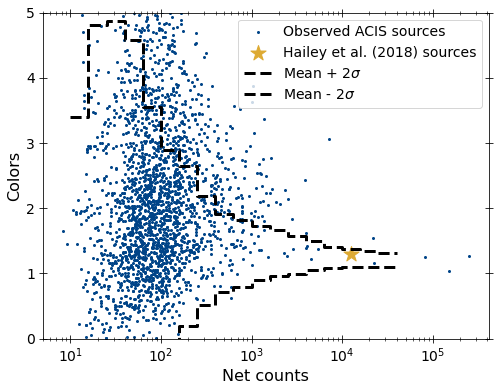

In [857]:
mark_interested_srcs(
    sim_msps_color_dict_arr[2], obs_color_dict_arr[2],
    spec_summary_msps['src_nums'][1], spec_summary_msps['spec_masks'][1][2],
    [badcandidate_msps_acis[9]])

11 11
[3.11964577e+02 8.47174487e+04 6.60136088e+03 7.20608062e+04
 7.90787519e+04 1.88093804e+04 1.82196024e+04 1.08294734e+05
 2.77927945e+03 3.39770325e+05 2.68533579e+02]
[2.18275002 1.28037626 1.12129814 1.27050867 1.25789653 1.21773187
 1.2643068  1.18929367 1.13935049 1.19401527 1.04234011]
4.0
16.0
13 13
[6.30830001e+04 3.07022543e+03 2.19431403e+03 2.81077063e+02
 1.18439172e+04 1.90606129e+04 3.95961455e+04 4.50492553e+04
 6.47709130e+02 9.76206087e+04 3.45582428e+05 4.09505913e+05
 3.31353556e+05]
[1.12744353 1.53814654 1.45380259 1.31685711 1.24956659 1.11880258
 1.16028379 1.11530514 1.53114835 1.11709965 1.22516454 0.89128065
 1.15413412]
4.0
16.0
14 14
[  2431.16819781   5351.37519964  81617.31175813  12494.95472814
    739.96463487   9850.07748685   2858.1011995  152123.07704477
   3952.30530577   4486.20454144  22515.78938616    392.83419696
    552.4386788  248867.65615041]
[1.27184961 1.37186219 1.24884928 1.29316705 1.43599291 1.10297695
 1.37071656 1.0429432  1.384

(array([1.27184961, 1.37186219, 1.24884928, 1.29316705, 1.43599291,
        1.10297695, 1.37071656, 1.0429432 , 1.38400744, 1.21573357,
        1.15291361, 1.57453882,       -inf, 1.26234305]),
 array([  2431.16819781,   5351.37519964,  81617.31175813,  12494.95472814,
           739.96463487,   9850.07748685,   2858.1011995 , 152123.07704477,
          3952.30530577,   4486.20454144,  22515.78938616,    392.83419696,
           552.4386788 , 248867.65615041]))

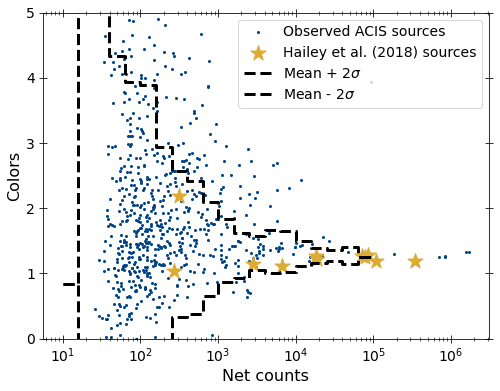

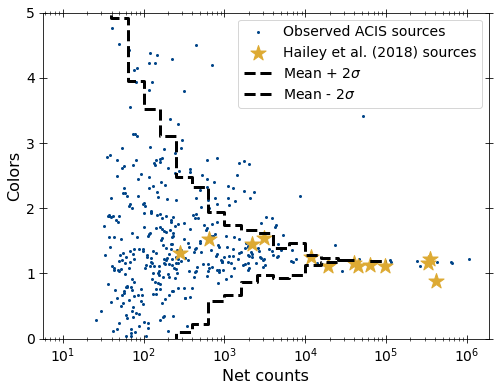

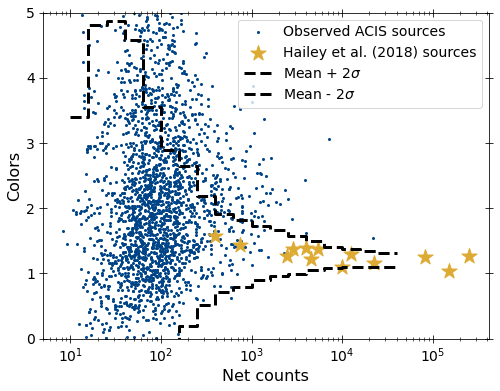

In [798]:
mark_interested_srcs(
    sim_msps_color_dict_arr[0], obs_color_dict_arr[0],
    spec_summary_msps['src_nums'][0], spec_summary_msps['spec_masks'][1][0],
    badcandidate_msps_pn)
mark_interested_srcs(
    sim_msps_color_dict_arr[1], obs_color_dict_arr[1],
    spec_summary_msps['src_nums'][0], spec_summary_msps['spec_masks'][1][1],
    badcandidate_msps_mos)
mark_interested_srcs(
    sim_msps_color_dict_arr[2], obs_color_dict_arr[2],
    spec_summary_msps['src_nums'][1], spec_summary_msps['spec_masks'][1][2],
    badcandidate_msps_acis)

In [60]:
fit_stats_arr = [[pn_fit_stats_table_pl, pn_fit_stats_table_pl_g,
                  pn_fit_stats_table_pl_g2],
                 [mos_fit_stats_table_pl, mos_fit_stats_table_pl_g,
                  mos_fit_stats_table_pl_g2],
                 [acis_fit_stats_table_pl, acis_fit_stats_table_pl_g,
                  acis_fit_stats_table_pl_g2]]

model_params_arr = [[pn_model_params_table_pl, pn_model_params_table_pl_g,
                     pn_model_params_table_pl_g2],
                    [mos_model_params_table_pl, mos_model_params_table_pl_g,
                     mos_model_params_table_pl_g2],
                    [acis_model_params_table_pl, acis_model_params_table_pl_g,
                     acis_model_params_table_pl_g2]]

det_names = ['PN', 'MOS', 'ACIS']
model_names = ['PL', 'PL_Gauss', 'PL_Gauss3']

for i in range(3):
    for j in range(3):
        fits_file_name = ('Fit_stats_' + det_names[i] + '_' + model_names[j] +
                          '.txt')
        model_file_name = ('Model_params_' + det_names[i] + '_' + model_names[j] +
                          '.txt')
        print(fits_file_name, model_file_name)
        np.savetxt(fits_file_name, fit_stats_arr[i][j], fmt='%s')
        np.savetxt(model_file_name, model_params_arr[i][j], fmt='%s')

Fit_stats_PN_PL.txt Model_params_PN_PL.txt
Fit_stats_PN_PL_Gauss.txt Model_params_PN_PL_Gauss.txt
Fit_stats_PN_PL_Gauss3.txt Model_params_PN_PL_Gauss3.txt
Fit_stats_MOS_PL.txt Model_params_MOS_PL.txt
Fit_stats_MOS_PL_Gauss.txt Model_params_MOS_PL_Gauss.txt
Fit_stats_MOS_PL_Gauss3.txt Model_params_MOS_PL_Gauss3.txt
Fit_stats_ACIS_PL.txt Model_params_ACIS_PL.txt
Fit_stats_ACIS_PL_Gauss.txt Model_params_ACIS_PL_Gauss.txt
Fit_stats_ACIS_PL_Gauss3.txt Model_params_ACIS_PL_Gauss3.txt


22:80: E501 line too long (82 > 79 characters)
23:27: E128 continuation line under-indented for visual indent


In [34]:
os.chdir('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/')

In [50]:
print('Candidate MSPs PN: ', len(candidate_msps_pn))
print('Candidate MSPs MOS: ', len(candidate_msps_mos))
print('Candidate MSPs ACIS: ', len(candidate_msps_acis))

Candidate MSPs PN:  86
Candidate MSPs MOS:  60
Candidate MSPs ACIS:  83


In [660]:
np.savetxt('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/PN_candidates.txt', candidate_msps_pn, fmt='%s')
np.savetxt('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/MOS_candidates.txt', candidate_msps_mos, fmt='%s')
np.savetxt('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/ACIS_candidates.txt', candidate_msps_acis, fmt='%s')

1:80: E501 line too long (116 > 79 characters)
2:80: E501 line too long (118 > 79 characters)


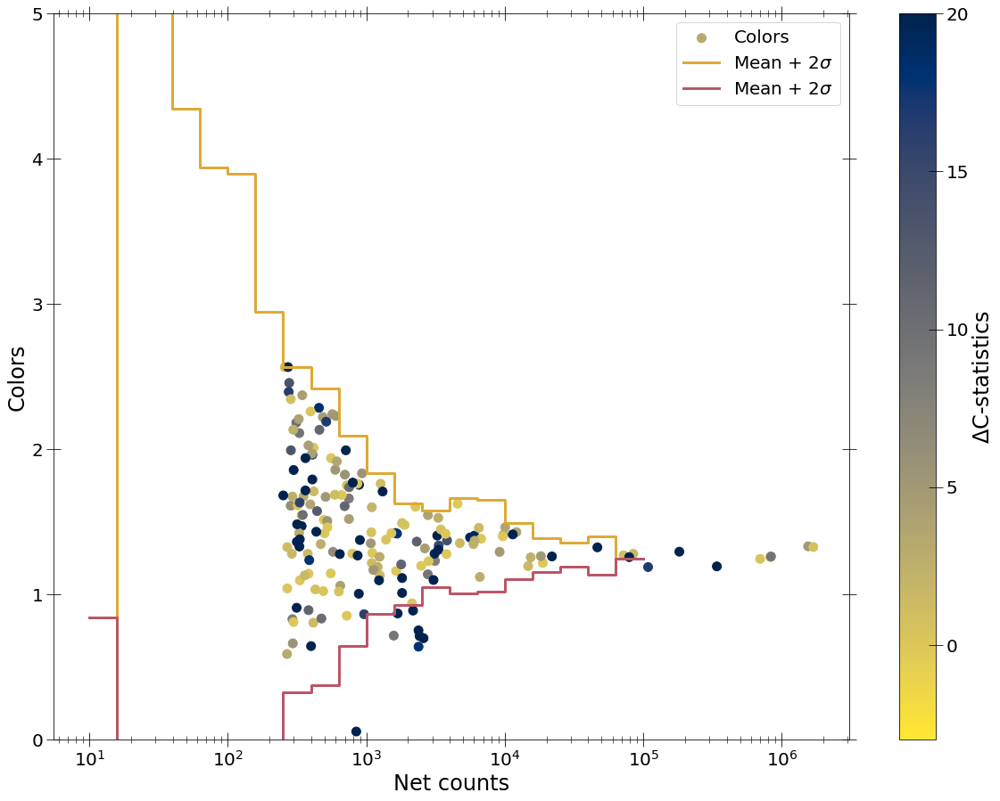

3:19: E127 continuation line over-indented for visual indent


In [127]:
mark_delta_cstat(sim_msps_color_dict_arr[0],
                 interested_msp_netcounts_pn, interested_msp_colors_pn,
                  color_param=(
                      np.array(pn_fit_stats_table_pl)[:, 1].astype(float) -
                      np.array(pn_fit_stats_table_pl_g2)[:, 1].astype(float)))

In [63]:
np.savetxt("Candidate_PN_sources2.txt", candidate_msps_pn, fmt='%s')
np.savetxt("Candidate_MOS_sources2.txt", candidate_msps_mos, fmt='%s')
np.savetxt("Candidate_ACIS_sources2.txt", candidate_msps_acis, fmt='%s')

84 84
56 56
79 79


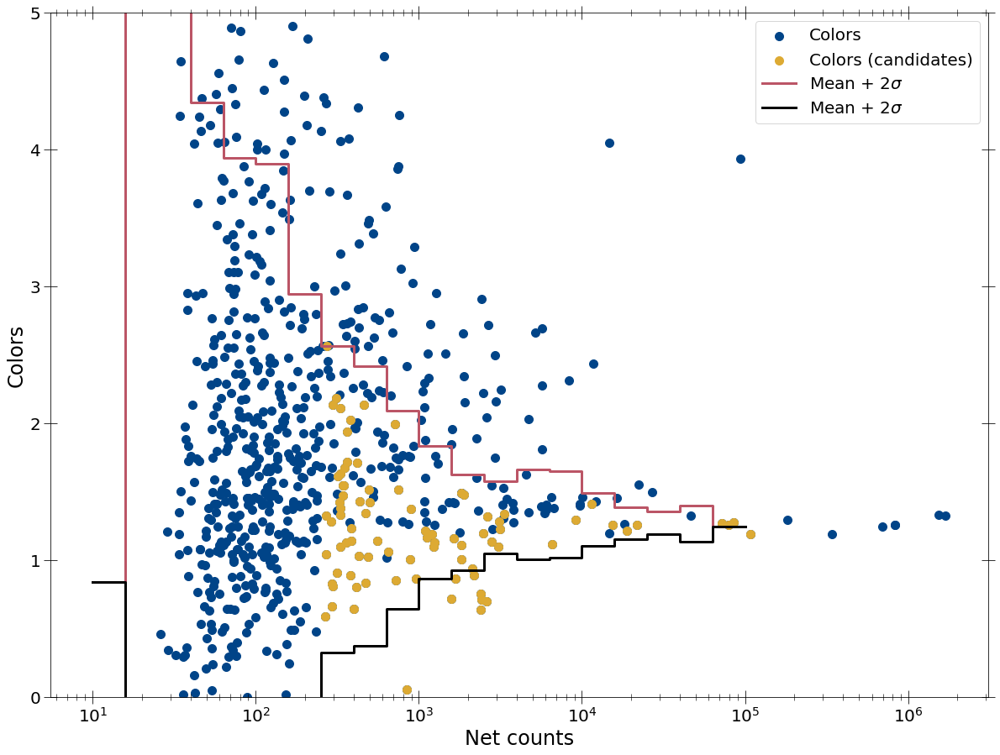

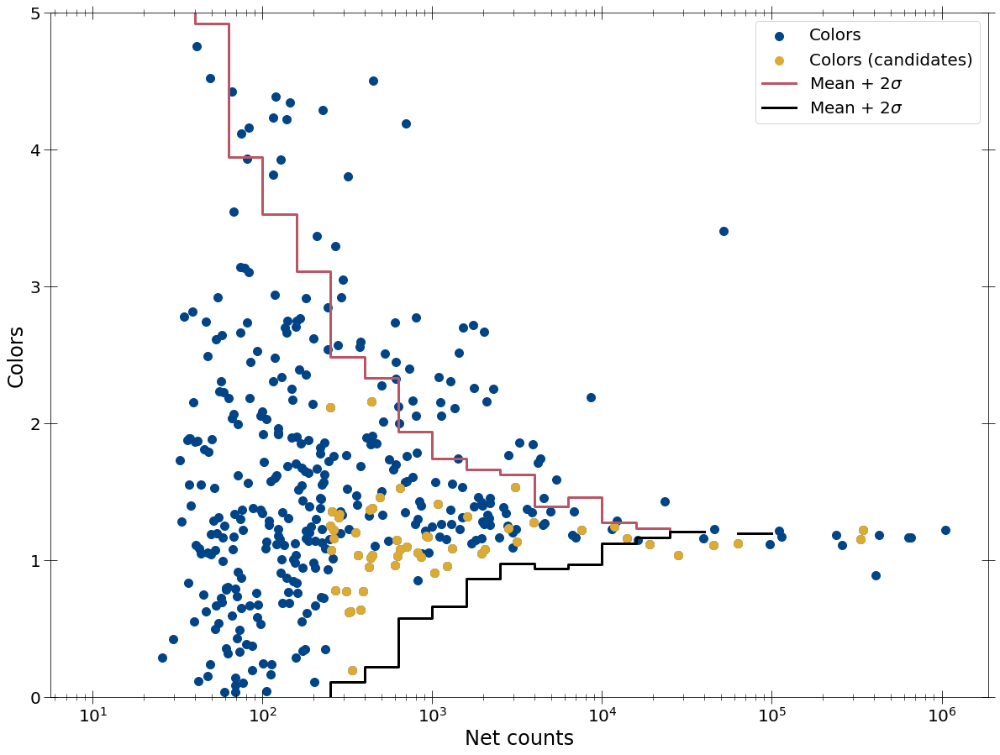

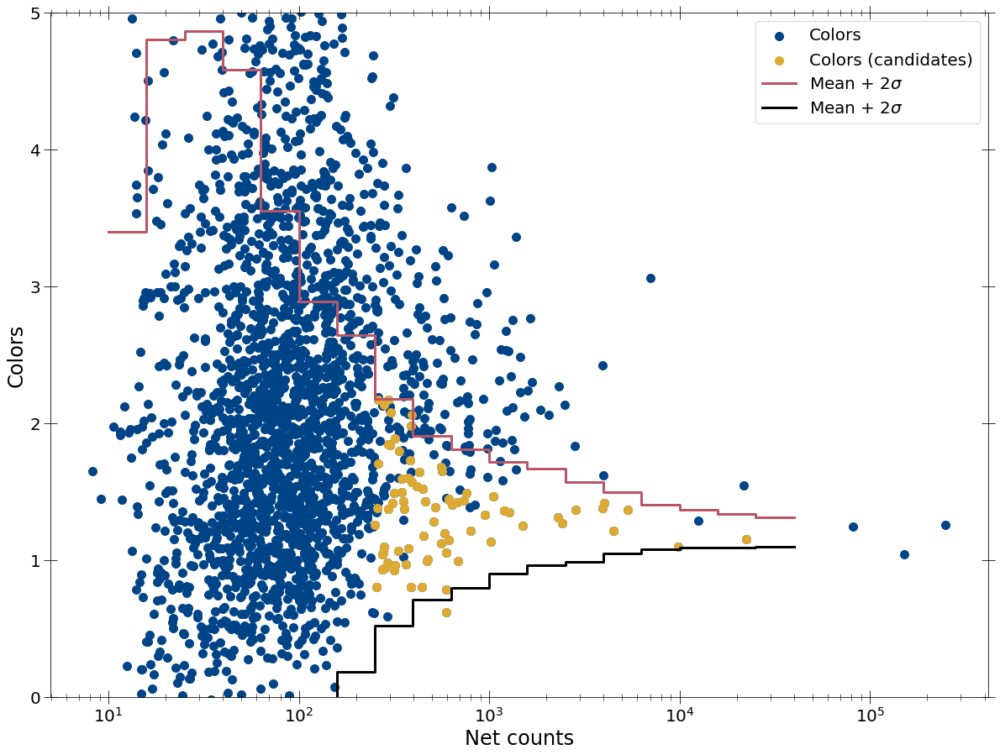

In [64]:
candidate_msp_colors_pn, candidate_msp_netcounts_pn = mark_interested_srcs(
    sim_msps_color_dict_arr[0], obs_color_dict_arr[0],
    spec_summary_msps['src_nums'][0], spec_summary_msps['spec_masks'][1][0],
    candidate_msps_pn)
candidate_msp_colors_mos, candidate_msp_netcounts_mos = mark_interested_srcs(
    sim_msps_color_dict_arr[1], obs_color_dict_arr[1],
    spec_summary_msps['src_nums'][0], spec_summary_msps['spec_masks'][1][1],
    candidate_msps_mos)
candidate_msp_colors_acis, candidate_msp_netcounts_acis = mark_interested_srcs(
    sim_msps_color_dict_arr[2], obs_color_dict_arr[2],
    spec_summary_msps['src_nums'][1], spec_summary_msps['spec_masks'][1][2],
    candidate_msps_acis)

(array([[26., 34., 10.,  7.,  1.,  0.,  1.,  0.,  0.,  0.],
        [ 0.,  1., 12., 19.,  7.,  8.,  4.,  0.,  2.,  3.],
        [ 0.,  2., 21., 15., 17., 19.,  5.,  0.,  4.,  1.]]),
 array([31.83728314, 32.33700378, 32.83672443, 33.33644508, 33.83616573,
        34.33588637, 34.83560702, 35.33532767, 35.83504831, 36.33476896,
        36.83448961]),
 <a list of 3 BarContainer objects>)

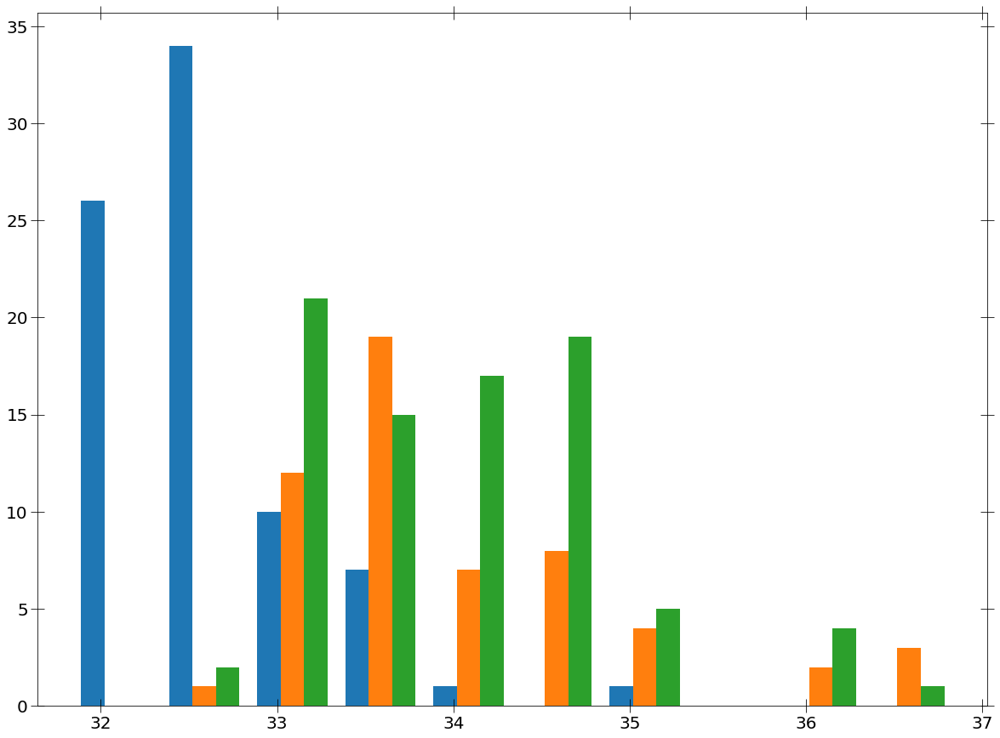

2:80: E501 line too long (97 > 79 characters)
4:5: E122 continuation line missing indentation or outdented
4:80: E501 line too long (95 > 79 characters)
6:5: E122 continuation line missing indentation or outdented


In [40]:
plt.hist([np.log10(np.array(
    acis_model_params_table_pl)[candidadate_msps_acis_args, -1].astype(float)*1.0E-12*7.659E+45),
          np.log10(np.array(
    mos_model_params_table_pl)[candidadate_msps_mos_args, -1].astype(float)*1.0E-12*7.659E+45),
          np.log10(np.array(
    pn_model_params_table_pl)[candidadate_msps_pn_args, -1].astype(float)*1.0E-12*7.659E+45)])

In [41]:
np.array(pn_model_params_table_pl)[:, -1]

array(['0.17775347039666198', '0.15741084535160457', '0.184916221634929',
       '0.15827113901941042', '0.2236002475847295', '0.08951046394205044',
       '0.14265592957726886', '0.1626556505674507', '0.151691544568419',
       '0.05853568131439508', '0.14208766163194325', '0.1483015342871929',
       '0.17915506454714364', '0.18059561287992698', '0.4972249272113047',
       '0.09935349974589852', '0.2892301045437417', '0.09958650593606125',
       '0.14983870965833504', '0.10191032244884844',
       '0.09547917849789156', '1.514468706406689', '2.386640098946292',
       '0.0695866798415962', '2.434338843992567', '2.653754452026149',
       '0.8073668171107404', '0.17373774483165227', '0.09894761001028098',
       '0.8797420859841123', '0.08134202489723485', '0.32472292336168684',
       '0.8776335127640109', '0.3198136926262305', '0.33445479886038176',
       '0.13148582008628226', '0.3577683026935588', '1.042938236836493',
       '0.42383678514598094', '0.8444880167700237', '0.71371

In [59]:
candidate_msps_xmm = np.array(
    list(set(candidate_msps_pn) | set(candidate_msps_mos)))

In [271]:
candidate_msps_xmm2 = np.array(
    list(set(candidate_msps_pn2) | set(candidate_msps_mos2)))

In [136]:
len(set(interested_msp_srcs_alldet[0]) &
         set(interested_msp_srcs_alldet[1]))

65

2:10: E127 continuation line over-indented for visual indent


In [123]:
print('Candidate XMM sources: ', len(candidate_msps_xmm))

Candidate XMM sources:  117


In [127]:
print('Candidate XMM sources: ', len(candidate_msps_acis))

Candidate XMM sources:  79


In [124]:
def arr_to_str(arr, delimiter=';', telescope='Chandra'):
    """Convert array to a string."""
    string = ''
    for elm in arr:
        if telescope == 'Chandra':
            string += '2CXO J' + elm.split('J')[1] + delimiter + ' '
        else:
            string += elm + delimiter + ' '
    return string[:-2]

In [126]:
arr_to_str(np.array(candidate_msps_xmm).astype(str), telescope='XMM')

'208624701010022; 206946401010013; 202039301010054; 207234103010061; 208441011010032; 207436309010072; 207901804010003; 201529201010011; 206946401010003; 201442201010001; 201129721010133; 201129707010057; 201129705010011; 207901804010064; 201113501010148; 205049406010006; 200305401015015; 207234104010049; 201129709010002; 201129718010002; 205110012015035; 201129704010056; 201129719010003; 205100104010002; 202026707015191; 204003401010003; 206946404010202; 201032613010001; 207242102015037; 202026707010170; 206586001010113; 201129704010031; 207901804010059; 202026707015146; 201129709010018; 208861209010009; 201529201010060; 208860108010001; 205110012010001; 206586001010073; 208441011010009; 208441011010211; 202026707010221; 208624703010003; 202026707010124; 207901804010033; 205110012010053; 202026707010181; 207901804010019; 205049406010002; 208016813010003; 204105804010001; 206586001010146; 201129705010002; 208441011010001; 206556701010043; 205110012010005; 206946416010014; 2069464100101

# IP analysis

## Selection of IPs within MSP colors

In [44]:
(interested_cv_args_alldet,
 interested_cv_srcs_alldet) = get_candidate_src_nums_alldet(
    spec_summary_msp_cvs, sim_msps2_color_dict_arr, sim_ips_color_dict_arr,
    min_count_arr=[150, 150, 150], min_counts2=250)

[1.00000000e+01 1.58489319e+01 2.51188643e+01 3.98107171e+01
 6.30957344e+01 1.00000000e+02 1.58489319e+02 2.51188643e+02
 3.98107171e+02 6.30957344e+02 1.00000000e+03 1.58489319e+03
 2.51188643e+03 3.98107171e+03 6.30957344e+03 1.00000000e+04
 1.58489319e+04 2.51188643e+04 3.98107171e+04 6.30957344e+04
 1.00000000e+05]
[0.8405164  2.03621255 1.63305682 1.56743663 1.5736705  1.66320801
 1.4331601  1.44713313 1.39609846 1.36984926 1.35086023 1.27893642
 1.31590127 1.33564778 1.334838   1.30071855 1.27144028 1.27383281
 1.26917868 1.24506393]
[0.         2.58517276 1.72972337 1.38681819 1.18129716 1.11575665
 0.75540094 0.56022382 0.51077116 0.36126324 0.24291962 0.17375792
 0.13254254 0.16428213 0.15864827 0.09633923 0.05725364 0.0421451
 0.0654287  0.        ]
250 1.4471331268500243 0.5602238243386048
5
251.18864315095823 1.4471331268500243 0.5602238243386048
386
398.1071705534973 1.396098460383752 0.5107711552472425
325
630.957344480193 1.3698492577015142 0.36126323889561407
197
1000.

In [45]:
print('Interested PN sources: ', len(interested_cv_srcs_alldet[0]))
print('Interested MOS sources: ', len(interested_cv_srcs_alldet[1]))
print('Interested ACIS sources: ', len(interested_cv_srcs_alldet[2]))

Interested PN sources:  1007
Interested MOS sources:  599
Interested ACIS sources:  1069


1007 1007
599 599
1069 1069


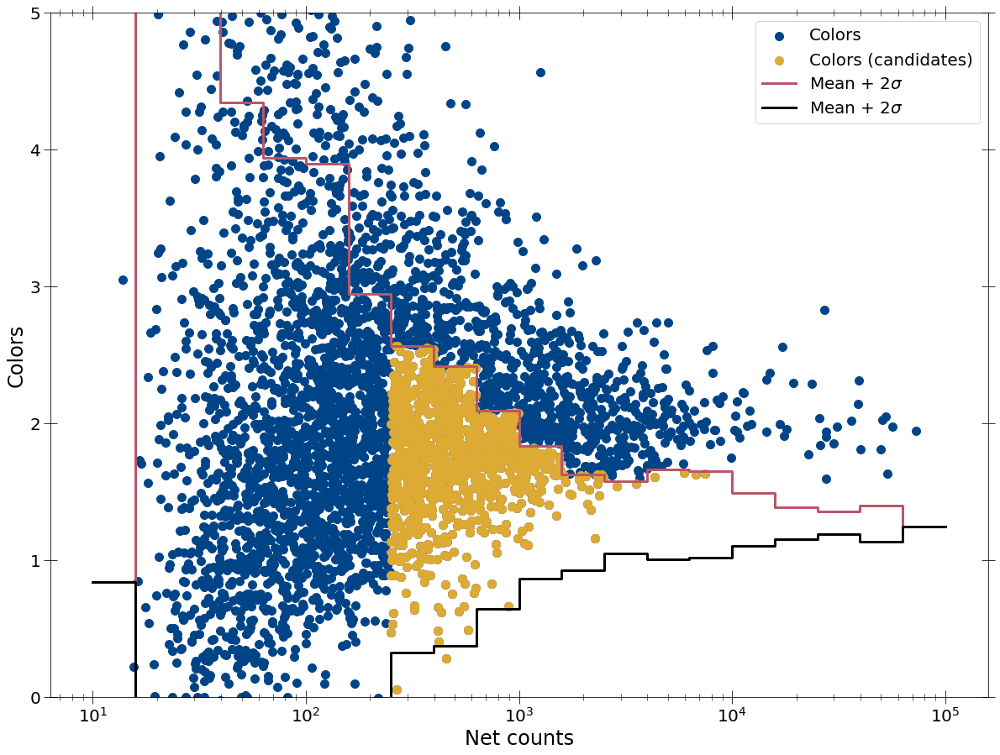

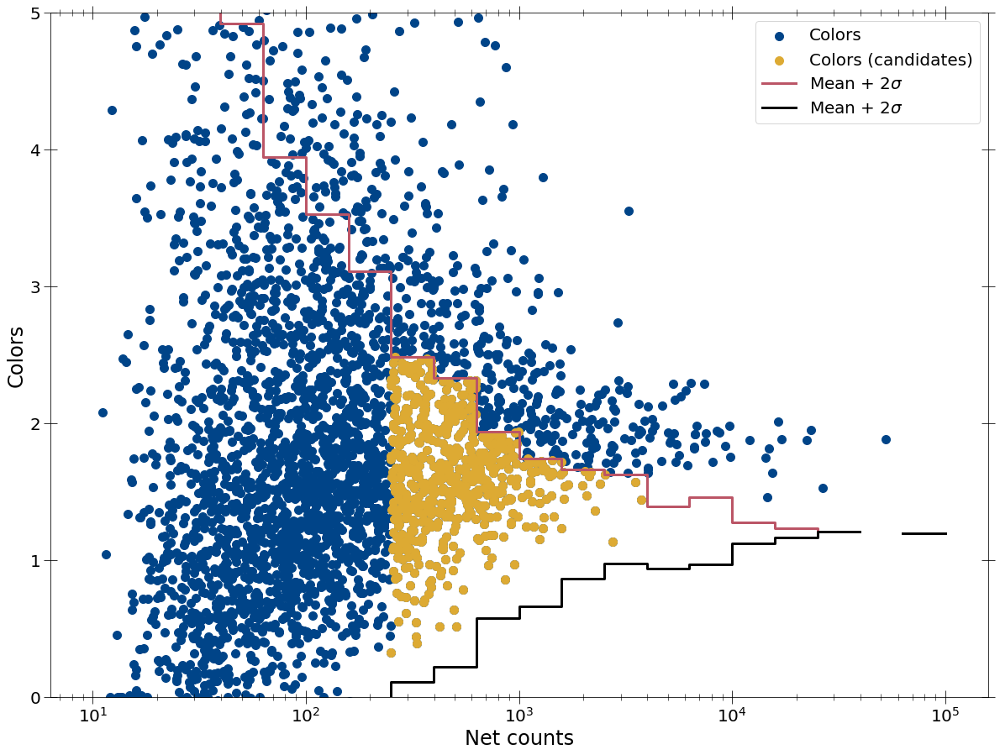

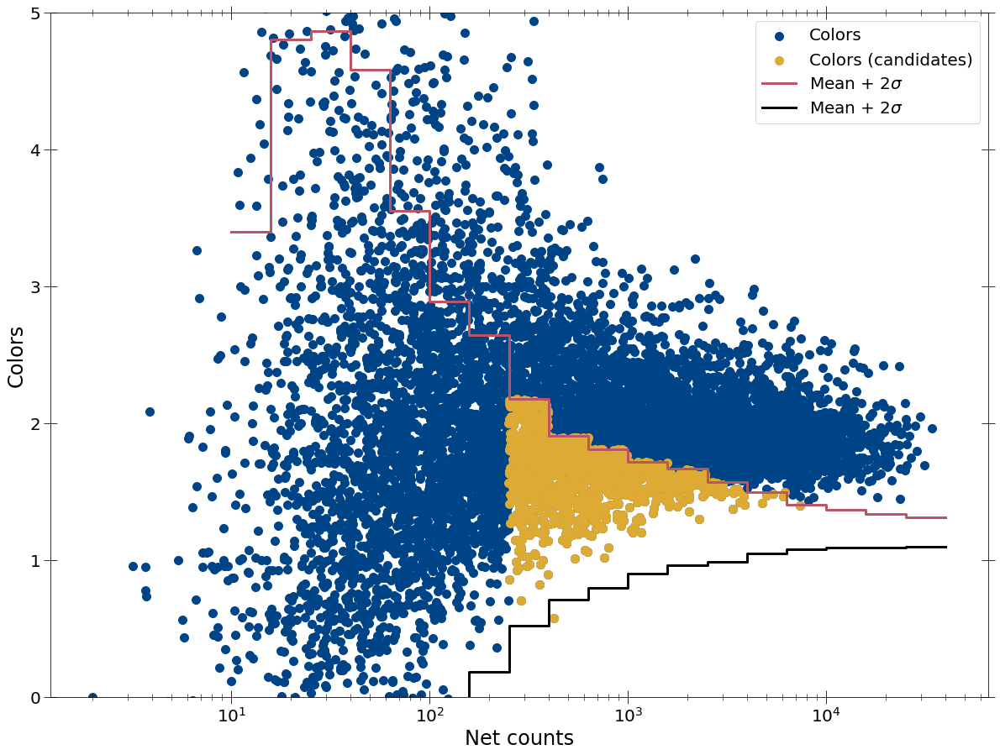

In [46]:
interested_cv_colors_pn, interested_cv_netcounts_pn = mark_interested_srcs(
    sim_msps_color_dict_arr[0], sim_ips_color_dict_arr[0],
    spec_summary_msp_cvs['src_nums'][0],
    spec_summary_msp_cvs['spec_masks'][1][0], interested_cv_srcs_alldet[0])
interested_cv_colors_mos, interested_cv_netcounts_mos = mark_interested_srcs(
    sim_msps_color_dict_arr[1], sim_ips_color_dict_arr[1],
    spec_summary_msp_cvs['src_nums'][0],
    spec_summary_msp_cvs['spec_masks'][1][1], interested_cv_srcs_alldet[1])
interested_cv_colors_acis, interested_cv_netcounts_acis = mark_interested_srcs(
    sim_msps_color_dict_arr[2], sim_ips_color_dict_arr[2],
    spec_summary_msp_cvs['src_nums'][1],
    spec_summary_msp_cvs['spec_masks'][1][2], interested_cv_srcs_alldet[2])

## Spectral analysis

In [47]:
def fit_src_pl_sim(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder + 'ip_' +
                                 str(source_num) + '_PN.fak')
        spec_mosfile = glob2.glob(src_folder + 'ip_' +
                                  str(source_num) + '_MOS.fak')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        #os.chdir(src_folder + '/' + source_num)
        spec_file = 'ip_' + str(source_num) + '.fak'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')

    model = xspec.Model('tbabs*pegpwrlw')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.perform()
    xspec.Fit.error('2.706 2')
    xspec.Fit.perform()
    print('Calculating goodness')
    #goodness = xspec.Fit.goodness(1000)
    print('Finished calculating goodness')
    goodness = 50.0
    print('Model params for ' + str(source_num) +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0])
    print('Fit stats for ' + str(source_num) + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    if telescope == 'Chandra':
        os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0]])

20:9: E265 block comment should start with '# '
38:5: E265 block comment should start with '# '
50:80: E501 line too long (80 > 79 characters)


In [48]:
def fit_src_pl_gauss_sim(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder + 'ip_' +
                                 str(source_num) + '_PN.fak')
        spec_mosfile = glob2.glob(src_folder + 'ip_' +
                                  str(source_num) + '_MOS.fak')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        #os.chdir(src_folder + '/' + source_num)
        spec_file = 'ip_' + str(source_num) + '.fak'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')
    
    model = xspec.Model('tbabs*(pegpwrlw+gauss)')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    model.pegpwrlw.eMin.values = '2.0'
    model.pegpwrlw.eMax.values = '10.0'
    model.gaussian.LineE.values = '6.7, 0.0001, 6.1, 6.1, 7.3, 7.3'
    model.gaussian.Sigma.values = '0.1 0'
    model.gaussian.norm.values = '1.0E-5, 0.001,,,,'
    
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.query = 'yes'
    xspec.Fit.perform()
    xspec.Fit.error('2.706 6')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 8')
    xspec.Fit.perform()
    #xspec.Fit.error('2.706 6')
    #xspec.Fit.error('2.706 8')
    #goodness = xspec.Fit.goodness(1000)
    goodness = 50.0
    line_pos_low = xspec.AllModels(1).gaussian.LineE.error[0]
    line_pos_high = xspec.AllModels(1).gaussian.LineE.error[1]
    line_norm_low = xspec.AllModels(1).gaussian.norm.error[0]
    line_norm_high = xspec.AllModels(1).gaussian.norm.error[1]
    print('Model params for ' + str(source_num) +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0],
          ' Fe_pos:', xspec.AllModels(1).gaussian.LineE.values[0],
          line_pos_low, line_pos_high,
          ' Fe_norm:', xspec.AllModels(1).gaussian.norm.values[0],
          line_norm_low, line_norm_high)
    print('Fit stats for ' + str(source_num) + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0],
             xspec.AllModels(1).gaussian.LineE.values[0], line_pos_low,
             line_pos_high,
             xspec.AllModels(1).gaussian.norm.values[0], line_norm_low,
             line_norm_high])


20:9: E265 block comment should start with '# '
27:1: W293 blank line contains whitespace
36:1: W293 blank line contains whitespace
46:5: E265 block comment should start with '# '
47:5: E265 block comment should start with '# '
48:5: E265 block comment should start with '# '
66:80: E501 line too long (80 > 79 characters)


In [49]:
def fit_src_pl_gauss2_sim(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder + 'ip_' +
                                 str(source_num) + '_PN.fak')
        spec_mosfile = glob2.glob(src_folder + 'ip_' +
                                  str(source_num) + '_MOS.fak')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        #os.chdir(src_folder + '/' + source_num)
        spec_file = 'ip_' + str(source_num) + '.fak'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')
    
    model = xspec.Model('tbabs*(pegpwrlw+gauss+gauss+gauss)')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    model.pegpwrlw.eMin.values = '2.0'
    model.pegpwrlw.eMax.values = '10.0'
    model.gaussian.LineE.values = '6.4 0'
    model.gaussian.Sigma.values = '0.0 0'
    model.gaussian.norm.values = '1.0E-5, 0.001,,,,'
    model.gaussian_4.LineE.values = '6.7 0'
    model.gaussian_4.Sigma.values = '0.0 0'
    model.gaussian_4.norm.values = '1.0E-5, 0.001,,,,'
    model.gaussian_5.LineE.values = '7.0 0'
    model.gaussian_5.Sigma.values = '0.0 0'
    model.gaussian_5.norm.values = '1.0E-5, 0.001,,,,'
    
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.query = 'yes'
    xspec.Fit.perform()
    xspec.Fit.error('2.706 8')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 11')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 14')
    # xspec.Fit.error('2.706 8')
    #goodness = xspec.Fit.goodness(1000)
    goodness = 50.0
    line_norm1_low = xspec.AllModels(1).gaussian.norm.error[0]
    line_norm1_high = xspec.AllModels(1).gaussian.norm.error[1]
    line_norm2_low = xspec.AllModels(1).gaussian_4.norm.error[0]
    line_norm2_high = xspec.AllModels(1).gaussian_4.norm.error[1]
    line_norm3_low = xspec.AllModels(1).gaussian_5.norm.error[0]
    line_norm3_high = xspec.AllModels(1).gaussian_5.norm.error[1]
    print('Model params for ' + str(source_num) +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0],
          ' Fe_norms:', xspec.AllModels(1).gaussian.norm.values[0],
          line_norm1_low, line_norm1_high,
          xspec.AllModels(1).gaussian_4.norm.values[0], line_norm2_low,
          line_norm2_high, xspec.AllModels(1).gaussian_5.norm.values[0],
          line_norm3_low, line_norm3_high)
    print('Fit stats for ' + str(source_num) + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0],
             xspec.AllModels(1).gaussian.norm.values[0],
             xspec.AllModels(1).gaussian_4.norm.values[0],
             xspec.AllModels(1).gaussian_5.norm.values[0], line_norm1_low,
             line_norm1_high, line_norm2_low, line_norm2_high, line_norm3_low,
             line_norm3_high])


20:9: E265 block comment should start with '# '
27:1: W293 blank line contains whitespace
42:1: W293 blank line contains whitespace
54:5: E265 block comment should start with '# '
75:80: E501 line too long (80 > 79 characters)


In [50]:
os.chdir('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/sim_ips_highnh_xu2016_twice_ew/')
xspec.AllData.clear()
fit_src_pl_sim(interested_cv_srcs_alldet[0][1], src_folder='./')

Calculating goodness
Finished calculating goodness
Model params for 2314: NH =  16.218350742551607  Gamma:  1.4792808377612598  norm:  0.16866262943222152
Fit stats for 2314:  444.68566791248804 -7.262602283733768 50.0 422




([2314, 444.68566791248804, -7.262602283733768, 50.0, 422],
 [2314, 16.218350742551607, 1.4792808377612598, 0.16866262943222152])

1:80: E501 line too long (99 > 79 characters)


In [51]:
pn_fit_stats_table_pl_cv = []
pn_model_params_table_pl_cv = []

for i, source_num in enumerate(interested_cv_srcs_alldet[0]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_sim(source_num)
    pn_fit_stats_table_pl_cv.append(fit_stats)
    pn_model_params_table_pl_cv.append(model_params)

0 1053
Calculating goodness
Finished calculating goodness
Model params for 1053: NH =  8.426546254042645  Gamma:  0.696878257660201  norm:  0.2640615137489303
Fit stats for 1053:  696.6533400656168 -6.6991863447334214 50.0 677


1 2314
Calculating goodness
Finished calculating goodness
Model params for 2314: NH =  16.218350742551607  Gamma:  1.4792808377612598  norm:  0.16866262943222152
Fit stats for 2314:  444.68566791248804 -7.262602283733768 50.0 422


2 4975
Calculating goodness
Finished calculating goodness
Model params for 4975: NH =  34.80810676735122  Gamma:  1.6547868183831644  norm:  0.7970294500612315
Fit stats for 4975:  500.56838353896495 -8.296106645940524 50.0 521


3 7000
Calculating goodness
Finished calculating goodness
Model params for 7000: NH =  8.797211481452258  Gamma:  0.7033262442551201  norm:  0.5995788353080425
Fit stats for 7000:  708.1936702003406 -8.805952877998777 50.0 562


4 7651
Calculating goodness
Finished calculating goodness
Model params for 7651:

Calculating goodness
Finished calculating goodness
Model params for 1048: NH =  63.234459296106515  Gamma:  2.4319962064451  norm:  1.670677227474241
Fit stats for 1048:  297.13202130714353 -7.721066393583697 50.0 260


37 1052
Calculating goodness
Finished calculating goodness
Model params for 1052: NH =  13.419429574722395  Gamma:  0.526985985643462  norm:  0.053655150048805486
Fit stats for 1052:  1967.3660155096763 -6.093275983695817 50.0 1929


38 1060
Calculating goodness
Finished calculating goodness
Model params for 1060: NH =  14.60705302620761  Gamma:  1.6242850324074298  norm:  0.143729353508781
Fit stats for 1060:  453.0430827884086 -7.176507815076671 50.0 430


39 1061
Calculating goodness
Finished calculating goodness
Model params for 1061: NH =  112.02886859079645  Gamma:  2.690908025786786  norm:  4.118738971902681
Fit stats for 1061:  386.84683764365667 -7.37712344375649 50.0 349


40 1140
Calculating goodness
Finished calculating goodness
Model params for 1140: NH =  

Calculating goodness
Finished calculating goodness
Model params for 1768: NH =  7.235001552692238  Gamma:  1.2810731694431843  norm:  0.04965768998512834
Fit stats for 1768:  889.0002247404252 -5.70283819511564 50.0 868


73 1787
Calculating goodness
Finished calculating goodness
Model params for 1787: NH =  66.41604263862243  Gamma:  1.738233638619359  norm:  0.4542079063105526
Fit stats for 1787:  927.8180560558279 -6.674091521385323 50.0 899


74 1788
Calculating goodness
Finished calculating goodness
Model params for 1788: NH =  113.23690512713483  Gamma:  2.6885436180878424  norm:  2.66461535671636
Fit stats for 1788:  346.9270320009002 -7.400533516057995 50.0 361


75 1789
Calculating goodness
Finished calculating goodness
Model params for 1789: NH =  101.8038545686193  Gamma:  3.241822788378039  norm:  1.2054049403492524
Fit stats for 1789:  588.5186373017841 -5.568243559600939 50.0 525


76 1821
Calculating goodness
Finished calculating goodness
Model params for 1821: NH =  10.

Calculating goodness
Finished calculating goodness
Model params for 2808: NH =  26.012888480887394  Gamma:  0.9611417175413239  norm:  0.4663001766979685
Fit stats for 2808:  2551.0495107436427 -8.513815270774716 50.0 2503


109 2825
Calculating goodness
Finished calculating goodness
Model params for 2825: NH =  17.601035247550126  Gamma:  1.4880542834283745  norm:  0.5490340812349971
Fit stats for 2825:  312.53685690022655 -7.677427352397851 50.0 278


110 2870
Calculating goodness
Finished calculating goodness
Model params for 2870: NH =  11.78723653456791  Gamma:  1.7336490317110462  norm:  0.24729807791851266
Fit stats for 2870:  903.2265696338656 -8.068036292159693 50.0 980


111 2878
Calculating goodness
Finished calculating goodness
Model params for 2878: NH =  7.873524815495642  Gamma:  0.9057126092951877  norm:  0.19865390651313158
Fit stats for 2878:  555.2911470441036 -7.169619966533473 50.0 444


112 2938
Calculating goodness
Finished calculating goodness
Model params for 2

Calculating goodness
Finished calculating goodness
Model params for 3871: NH =  48.879535403151664  Gamma:  1.691587797186619  norm:  1.0464941111035517
Fit stats for 3871:  699.2046454027793 -7.014801899318316 50.0 771


145 3887
Calculating goodness
Finished calculating goodness
Model params for 3887: NH =  9.016820050919439  Gamma:  0.8036454060172652  norm:  0.7615746528119489
Fit stats for 3887:  282.14528914689834 -9.00555085145577 50.0 238


146 3912
Calculating goodness
Finished calculating goodness
Model params for 3912: NH =  171.81691398696952  Gamma:  4.644058631787016  norm:  10.05614492782404
Fit stats for 3912:  2330.988225854069 -5.189953441601986 50.0 2526


147 3947
Calculating goodness
Finished calculating goodness
Model params for 3947: NH =  19.925081515996155  Gamma:  1.088045424990063  norm:  0.6744749700146958
Fit stats for 3947:  1570.485271668173 -8.944524562637834 50.0 1474


148 3963
Calculating goodness
Finished calculating goodness
Model params for 3963: N

Calculating goodness
Finished calculating goodness
Model params for 4842: NH =  9.01748661022264  Gamma:  1.3531778021330212  norm:  1.1308677690822602
Fit stats for 4842:  1433.5415196736715 -8.119582449128172 50.0 1345


181 4860
Calculating goodness
Finished calculating goodness
Model params for 4860: NH =  54.850312737395576  Gamma:  1.9668751630163346  norm:  0.3763613893439727
Fit stats for 4860:  1181.3888187694154 -5.676011920939934 50.0 1030


182 4888
Calculating goodness
Finished calculating goodness
Model params for 4888: NH =  5.075846903378484  Gamma:  0.8072665957759753  norm:  0.6468479456415275
Fit stats for 4888:  445.76338987451385 -7.581891533848545 50.0 407


183 4890
Calculating goodness
Finished calculating goodness
Model params for 4890: NH =  9.94177416091691  Gamma:  1.1884787371629852  norm:  0.11548194585211721
Fit stats for 4890:  1671.0935710826975 -8.821794456346597 50.0 1514


184 4991
Calculating goodness
Finished calculating goodness
Model params for 4

Calculating goodness
Finished calculating goodness
Model params for 5844: NH =  35.05125281401117  Gamma:  0.6572997524340946  norm:  0.16980531543799676
Fit stats for 5844:  645.0099445870201 -6.60765970982643 50.0 614


217 5847
Calculating goodness
Finished calculating goodness
Model params for 5847: NH =  37.03543341895497  Gamma:  1.328153659106616  norm:  0.49685836339578776
Fit stats for 5847:  1118.8481540714251 -6.957385789312953 50.0 1844


218 5866
Calculating goodness
Finished calculating goodness
Model params for 5866: NH =  23.88072949749297  Gamma:  0.8277622387437077  norm:  0.4776426169152872
Fit stats for 5866:  1787.1757740201485 -7.499804274082603 50.0 1743


219 5883
Calculating goodness
Finished calculating goodness
Model params for 5883: NH =  19.734732014926678  Gamma:  0.9686474865775546  norm:  0.847656391474808
Fit stats for 5883:  1037.1361630262206 -8.383340842089554 50.0 1070


220 5900
Calculating goodness
Finished calculating goodness
Model params for 59

Calculating goodness
Finished calculating goodness
Model params for 6621: NH =  76.22413036562914  Gamma:  2.158277532640498  norm:  2.5035432505189927
Fit stats for 6621:  406.86551395407173 -8.864220676338375 50.0 405


253 6626
Calculating goodness
Finished calculating goodness
Model params for 6626: NH =  13.74481640346739  Gamma:  1.243642673954048  norm:  0.5753121790282478
Fit stats for 6626:  201.00109335286868 -7.427140808099561 50.0 197


254 6647
Calculating goodness
Finished calculating goodness
Model params for 6647: NH =  39.196664781937955  Gamma:  1.7697124297391595  norm:  1.2405758136783642
Fit stats for 6647:  571.3298832663327 -8.690901028345753 50.0 568


255 6696
Calculating goodness
Finished calculating goodness
Model params for 6696: NH =  108.41747695889465  Gamma:  3.022688072534364  norm:  4.828370522954527
Fit stats for 6696:  309.9940348201065 -6.886230322231424 50.0 309


256 6718
Calculating goodness
Finished calculating goodness
Model params for 6718: NH

Calculating goodness
Finished calculating goodness
Model params for 7321: NH =  5.7264184702083485  Gamma:  0.6551512572880527  norm:  0.09225242168742315
Fit stats for 7321:  1099.195768695314 -8.142014553386863 50.0 982


289 7323
Calculating goodness
Finished calculating goodness
Model params for 7323: NH =  31.43585940673319  Gamma:  1.7276221615347607  norm:  0.2233764054091767
Fit stats for 7323:  844.2273435058546 -7.641881937521163 50.0 822


290 7344
Calculating goodness
Finished calculating goodness
Model params for 7344: NH =  8.388466564927954  Gamma:  1.3838528851284722  norm:  0.41139095542949383
Fit stats for 7344:  1015.9979269135016 -8.424951682981071 50.0 1306


291 7347
Calculating goodness
Finished calculating goodness
Model params for 7347: NH =  28.113174256583882  Gamma:  2.031171023461107  norm:  0.5468113002766901
Fit stats for 7347:  369.1382276726779 -8.77041226793518 50.0 362


292 7387
Calculating goodness
Finished calculating goodness
Model params for 7387

Calculating goodness
Finished calculating goodness
Model params for 8346: NH =  11.86672823229719  Gamma:  1.4988412440542485  norm:  0.5777124626296194
Fit stats for 8346:  476.24964939920716 -8.96560189019566 50.0 430


325 8374
Calculating goodness
Finished calculating goodness
Model params for 8374: NH =  55.2415987761617  Gamma:  0.9840941837180642  norm:  0.34216842373324186
Fit stats for 8374:  627.7250999039051 -6.2486025779660554 50.0 663


326 8411
Calculating goodness
Finished calculating goodness
Model params for 8411: NH =  33.586963428532414  Gamma:  1.344509005898159  norm:  0.7566936098426484
Fit stats for 8411:  632.495226642745 -6.191582207499772 50.0 801


327 8428
Calculating goodness
Finished calculating goodness
Model params for 8428: NH =  5.871499389302978  Gamma:  0.8666714066659396  norm:  0.34096403276966136
Fit stats for 8428:  135.36779101366886 -7.531517682957254 50.0 133


328 8435
Calculating goodness
Finished calculating goodness
Model params for 8435: 

Calculating goodness
Finished calculating goodness
Model params for 9103: NH =  114.00593115831411  Gamma:  2.2410086194735355  norm:  1.4012294931368616
Fit stats for 9103:  882.3926265972789 -6.728120207477378 50.0 778


361 9119
Calculating goodness
Finished calculating goodness
Model params for 9119: NH =  85.06493260026939  Gamma:  2.6852594435958457  norm:  0.8081240940384877
Fit stats for 9119:  1457.7619040915672 -6.57309160028586 50.0 1384


362 9190
Calculating goodness
Finished calculating goodness
Model params for 9190: NH =  69.66877535665759  Gamma:  1.6584145391580094  norm:  0.9962406810905534
Fit stats for 9190:  219.3575469729127 -7.5439178599794285 50.0 191


363 9194
Calculating goodness
Finished calculating goodness
Model params for 9194: NH =  11.619155990661769  Gamma:  1.0841601349066532  norm:  0.08212719002881948
Fit stats for 9194:  839.5579991554217 -7.621014768712469 50.0 757


364 9206
Calculating goodness
Finished calculating goodness
Model params for 920

Calculating goodness
Finished calculating goodness
Model params for 177: NH =  24.113199152196696  Gamma:  1.4758693376644882  norm:  1.342328885162563
Fit stats for 177:  347.53784990625934 -9.716725369007275 50.0 282


397 178
Calculating goodness
Finished calculating goodness
Model params for 178: NH =  6.709844375142932  Gamma:  1.1059358333743043  norm:  0.4412807859210018
Fit stats for 178:  1105.5864602987585 -8.948204273809203 50.0 1067


398 199
Calculating goodness
Finished calculating goodness
Model params for 199: NH =  12.722016274980971  Gamma:  1.1722891816012615  norm:  0.1477064138545295
Fit stats for 199:  1721.7466179879516 -8.5624122601786 50.0 1830


399 205
Calculating goodness
Finished calculating goodness
Model params for 205: NH =  18.976884753085475  Gamma:  1.3584710922138614  norm:  0.571590045794026
Fit stats for 205:  1531.947623096253 -8.54616075293002 50.0 1331


400 264
Calculating goodness
Finished calculating goodness
Model params for 264: NH =  8.758

Calculating goodness
Finished calculating goodness
Model params for 991: NH =  5.044846935694701  Gamma:  0.7756469600194834  norm:  0.12661607359957286
Fit stats for 991:  1028.4749575608337 -8.857726722791824 50.0 948


433 1016
Calculating goodness
Finished calculating goodness
Model params for 1016: NH =  9.728639501225185  Gamma:  1.2938361757817032  norm:  0.42535567086061826
Fit stats for 1016:  434.45078526036497 -7.85323440962915 50.0 409


434 1037
Calculating goodness
Finished calculating goodness
Model params for 1037: NH =  7.418337591097801  Gamma:  1.0969796120216635  norm:  0.09424815726326376
Fit stats for 1037:  988.9707883428159 -6.453344907154017 50.0 892


435 1038
Calculating goodness
Finished calculating goodness
Model params for 1038: NH =  13.167567966507605  Gamma:  1.2654569847491643  norm:  0.8152973163532954
Fit stats for 1038:  358.06734203712574 -8.758217426402547 50.0 344


436 1087
Calculating goodness
Finished calculating goodness
Model params for 1087

Calculating goodness
Finished calculating goodness
Model params for 2163: NH =  46.052277432069744  Gamma:  1.659547811389937  norm:  0.22603753778074395
Fit stats for 2163:  2274.0865155990577 -5.768268751231038 50.0 1990


469 2267
Calculating goodness
Finished calculating goodness
Model params for 2267: NH =  8.826459099260946  Gamma:  1.645848324328655  norm:  0.3348025507761392
Fit stats for 2267:  1722.2532042777418 -7.625839725672311 50.0 1645


470 2270
Calculating goodness
Finished calculating goodness
Model params for 2270: NH =  12.026181222714118  Gamma:  1.8049136882881673  norm:  0.9559428601211036
Fit stats for 2270:  893.7533740477584 -7.841281085035408 50.0 984


471 2278
Calculating goodness
Finished calculating goodness
Model params for 2278: NH =  77.79969072438422  Gamma:  1.8696895171965093  norm:  1.5830619186100132
Fit stats for 2278:  443.21419277207093 -7.731492421600391 50.0 411


472 2303
Calculating goodness
Finished calculating goodness
Model params for 23

Calculating goodness
Finished calculating goodness
Model params for 3427: NH =  31.366206084319682  Gamma:  1.28503365291877  norm:  0.43007648864419734
Fit stats for 3427:  833.8066467555749 -7.941933803469982 50.0 743


505 3447
Calculating goodness
Finished calculating goodness
Model params for 3447: NH =  43.21438284297912  Gamma:  1.8067885249217341  norm:  0.9377222468242731
Fit stats for 3447:  1655.6986109049865 -6.666334727071356 50.0 1520


506 3490
Calculating goodness
Finished calculating goodness
Model params for 3490: NH =  20.047740363336626  Gamma:  1.064526211907483e-06  norm:  0.11678428506708886
Fit stats for 3490:  3143.8774166048197 -7.500637710892752 50.0 2763


507 3697
Calculating goodness
Finished calculating goodness
Model params for 3697: NH =  19.200824761945384  Gamma:  0.849273679555205  norm:  0.34748713547121063
Fit stats for 3697:  1405.648169478065 -9.036108768646747 50.0 1219


508 3723
Calculating goodness
Finished calculating goodness
Model params f

Calculating goodness
Finished calculating goodness
Model params for 4608: NH =  9.16661611068849  Gamma:  0.4708519735762377  norm:  0.4538894025532449
Fit stats for 4608:  992.3884465485178 -7.228031749018572 50.0 879


541 4627
Calculating goodness
Finished calculating goodness
Model params for 4627: NH =  22.308070881146282  Gamma:  1.3570669367670625  norm:  0.07437481615219682
Fit stats for 4627:  2102.990779639622 -7.7521517643711375 50.0 1810


542 4645
Calculating goodness
Finished calculating goodness
Model params for 4645: NH =  15.847249473541222  Gamma:  1.2058775110356108  norm:  0.17775897131986604
Fit stats for 4645:  737.652781546774 -7.255593142142477 50.0 685


543 4701
Calculating goodness
Finished calculating goodness
Model params for 4701: NH =  16.612076026428888  Gamma:  0.234730315882427  norm:  0.046124927168194156
Fit stats for 4701:  2068.5854996868543 -4.9955395425652664 50.0 1960


544 4734
Calculating goodness
Finished calculating goodness
Model params for

Calculating goodness
Finished calculating goodness
Model params for 5683: NH =  33.77721711927463  Gamma:  1.3025819220521566  norm:  0.38823660709977437
Fit stats for 5683:  685.9149302884517 -7.603084085106662 50.0 647


577 5763
Calculating goodness
Finished calculating goodness
Model params for 5763: NH =  52.964750445144766  Gamma:  1.8495215440951025  norm:  0.8837138771742031
Fit stats for 5763:  556.6804033911745 -7.752707629308486 50.0 582


578 5838
Calculating goodness
Finished calculating goodness
Model params for 5838: NH =  46.05324855983152  Gamma:  2.2578625452598042  norm:  1.8737029299962216
Fit stats for 5838:  1465.8327866254065 -7.476614226089854 50.0 1338


579 5854
Calculating goodness
Finished calculating goodness
Model params for 5854: NH =  8.878461339192686  Gamma:  1.0253359644917428  norm:  0.6231109823786115
Fit stats for 5854:  195.47826136851262 -6.92982774692501 50.0 177


580 5859
Calculating goodness
Finished calculating goodness
Model params for 5859

Calculating goodness
Finished calculating goodness
Model params for 7014: NH =  27.209277765288622  Gamma:  1.3349820989621495  norm:  0.7297181100716997
Fit stats for 7014:  2310.468024334135 -8.575584340081813 50.0 1842


613 7069
Calculating goodness
Finished calculating goodness
Model params for 7069: NH =  60.220206010742295  Gamma:  2.178154756399165  norm:  0.2552202350284992
Fit stats for 7069:  2025.5555825306192 -6.450399507769838 50.0 1964


614 7215
Calculating goodness
Finished calculating goodness
Model params for 7215: NH =  71.76522681739972  Gamma:  1.6718104212435436  norm:  0.42889818319915946
Fit stats for 7215:  1206.0104940355936 -7.422633331830804 50.0 1018


615 7245
Calculating goodness
Finished calculating goodness
Model params for 7245: NH =  14.245930897539091  Gamma:  1.2255328687818592  norm:  1.133069807232951
Fit stats for 7245:  261.4303844912673 -8.038869570992645 50.0 235


616 7250
Calculating goodness
Finished calculating goodness
Model params for 7

Calculating goodness
Finished calculating goodness
Model params for 8076: NH =  11.960953380312366  Gamma:  1.1813525857658187  norm:  1.2467190852527155
Fit stats for 8076:  259.33672550763583 -9.69883996065892 50.0 265


649 8080
Calculating goodness
Finished calculating goodness
Model params for 8080: NH =  47.724867804773055  Gamma:  0.6133456815256197  norm:  0.4851778838453398
Fit stats for 8080:  423.1722280297943 -8.157324663377938 50.0 402


650 8088
Calculating goodness
Finished calculating goodness
Model params for 8088: NH =  118.79711078945643  Gamma:  3.3508376007282226  norm:  1.0661042923902744
Fit stats for 8088:  1842.3656427188391 -6.658028044444589 50.0 1654


651 8124
Calculating goodness
Finished calculating goodness
Model params for 8124: NH =  12.582849292981214  Gamma:  0.7328931313932874  norm:  0.19103252915328217
Fit stats for 8124:  626.7737239407561 -7.877004313257143 50.0 512


652 8138
Calculating goodness
Finished calculating goodness
Model params for 8

Calculating goodness
Finished calculating goodness
Model params for 9053: NH =  80.46396680754812  Gamma:  2.1016772295265755  norm:  0.8856954327200239
Fit stats for 9053:  995.1715326141667 -6.944843129453287 50.0 881


685 9070
Calculating goodness
Finished calculating goodness
Model params for 9070: NH =  106.33845084613378  Gamma:  1.3171176361742334  norm:  0.09336903632970416
Fit stats for 9070:  1945.707592318705 -6.96553768962594 50.0 1841


686 9077
Calculating goodness
Finished calculating goodness
Model params for 9077: NH =  76.2969715654434  Gamma:  2.653279087564664  norm:  3.5039769772558773
Fit stats for 9077:  800.0447398844202 -7.486873673442498 50.0 817


687 9094
Calculating goodness
Finished calculating goodness
Model params for 9094: NH =  15.051259528264664  Gamma:  0.8909279331347678  norm:  0.9880935425509436
Fit stats for 9094:  316.2644406004984 -8.925170614625745 50.0 272


688 9124
Calculating goodness
Finished calculating goodness
Model params for 9124: N

Calculating goodness
Finished calculating goodness
Model params for 169: NH =  17.020212375511118  Gamma:  0.9999638044690533  norm:  0.6040361063757455
Fit stats for 169:  478.34622503204673 -10.023941223925071 50.0 452


721 210
Calculating goodness
Finished calculating goodness
Model params for 210: NH =  7.389789535414094  Gamma:  0.9944321537890928  norm:  0.11510952280443623
Fit stats for 210:  847.5747319120017 -8.628907569854606 50.0 828


722 237
Calculating goodness
Finished calculating goodness
Model params for 237: NH =  25.62749312130709  Gamma:  1.2057740414138252  norm:  0.3600645549217286
Fit stats for 237:  529.168090756707 -8.189356468806762 50.0 489


723 344
Calculating goodness
Finished calculating goodness
Model params for 344: NH =  20.93277858382955  Gamma:  1.2479246464604488  norm:  0.3696175343304843
Fit stats for 344:  1664.4467766446287 -8.513023437863998 50.0 1514


724 373
Calculating goodness
Finished calculating goodness
Model params for 373: NH =  43.3

Calculating goodness
Finished calculating goodness
Model params for 2099: NH =  8.183104475307665  Gamma:  1.3393423792496775  norm:  0.7223954609484261
Fit stats for 2099:  1595.966601497501 -7.454483378262158 50.0 1510


757 2143
Calculating goodness
Finished calculating goodness
Model params for 2143: NH =  7.838748509707722  Gamma:  1.202849594651241  norm:  0.583481247748911
Fit stats for 2143:  1079.0705533219282 -8.36181284586401 50.0 965


758 2147
Calculating goodness
Finished calculating goodness
Model params for 2147: NH =  16.510074411319223  Gamma:  1.179034839176301  norm:  0.40120716969029646
Fit stats for 2147:  881.8374471116463 -9.276853118684249 50.0 846


759 2179
Calculating goodness
Finished calculating goodness
Model params for 2179: NH =  19.53355742498773  Gamma:  0.9628595888570214  norm:  0.22233458063397743
Fit stats for 2179:  1032.2963488142002 -8.797678489104836 50.0 1058


760 2201
Calculating goodness
Finished calculating goodness
Model params for 2201:

Calculating goodness
Finished calculating goodness
Model params for 3641: NH =  34.365765160288646  Gamma:  1.2317717911145225  norm:  1.2128257215232932
Fit stats for 3641:  431.9683276566508 -7.546859795964615 50.0 380


793 3676
Calculating goodness
Finished calculating goodness
Model params for 3676: NH =  24.748959930704345  Gamma:  1.0785500714375755  norm:  0.4628266621699938
Fit stats for 3676:  761.1096048348746 -7.990355355923356 50.0 684


794 3716
Calculating goodness
Finished calculating goodness
Model params for 3716: NH =  51.680435355524125  Gamma:  1.872092565890634  norm:  0.9856091278280047
Fit stats for 3716:  530.0466160151309 -7.644343489209242 50.0 477


795 3729
Calculating goodness
Finished calculating goodness
Model params for 3729: NH =  9.024651590638339  Gamma:  0.6690003420524796  norm:  0.0708911745526196
Fit stats for 3729:  1514.8084435984833 -7.894458760542439 50.0 1392


796 3746
Calculating goodness
Finished calculating goodness
Model params for 3746

Calculating goodness
Finished calculating goodness
Model params for 5441: NH =  8.410350142909364  Gamma:  0.8978690655848529  norm:  0.9320876693921574
Fit stats for 5441:  247.61170413585347 -8.310499077911826 50.0 189


829 5472
Calculating goodness
Finished calculating goodness
Model params for 5472: NH =  40.53329822194189  Gamma:  1.622762467915697  norm:  1.5737834703430507
Fit stats for 5472:  343.8162353569038 -9.352739449946412 50.0 358


830 5562
Calculating goodness
Finished calculating goodness
Model params for 5562: NH =  16.83239859275387  Gamma:  0.4845728043197107  norm:  0.20589441244330636
Fit stats for 5562:  928.6303617266838 -8.634621669211638 50.0 849


831 5569
Calculating goodness
Finished calculating goodness
Model params for 5569: NH =  34.50171987256929  Gamma:  1.3198502520186481  norm:  0.5862749034418153
Fit stats for 5569:  475.6637625509221 -8.478194667675293 50.0 422


832 5649
Calculating goodness
Finished calculating goodness
Model params for 5649: N

Calculating goodness
Finished calculating goodness
Model params for 7545: NH =  8.578860728975592  Gamma:  0.8002261303649327  norm:  0.366086771470004
Fit stats for 7545:  622.8198515620388 -8.942896660938366 50.0 546


865 7554
Calculating goodness
Finished calculating goodness
Model params for 7554: NH =  25.43078956453183  Gamma:  1.3303104437045614  norm:  0.3711830091497735
Fit stats for 7554:  1664.6002818271168 -7.58067871731326 50.0 1819


866 7564
Calculating goodness
Finished calculating goodness
Model params for 7564: NH =  54.009212183411094  Gamma:  2.2331387684592108  norm:  0.6392985377533581
Fit stats for 7564:  914.2806851884823 -9.855903414554726 50.0 845


867 7577
Calculating goodness
Finished calculating goodness
Model params for 7577: NH =  10.612868685660658  Gamma:  0.8758428290422074  norm:  0.6753495090725775
Fit stats for 7577:  1966.5325798139777 -9.758208720189499 50.0 1852


868 7599
Calculating goodness
Finished calculating goodness
Model params for 7599

Calculating goodness
Finished calculating goodness
Model params for 9510: NH =  21.875301332614406  Gamma:  1.8017445290974528  norm:  1.1343425230511122
Fit stats for 9510:  839.5995233795738 -10.18677090796608 50.0 764


901 9524
Calculating goodness
Finished calculating goodness
Model params for 9524: NH =  8.743242855157709  Gamma:  1.22509092679254  norm:  0.26611273585470413
Fit stats for 9524:  997.8064029203865 -8.461234780069603 50.0 974


902 9630
Calculating goodness
Finished calculating goodness
Model params for 9630: NH =  13.733828064913808  Gamma:  1.894912430804477  norm:  0.1629206749889215
Fit stats for 9630:  942.4242288233344 -8.657337709695879 50.0 843


903 9701
Calculating goodness
Finished calculating goodness
Model params for 9701: NH =  21.77360314505607  Gamma:  1.3078417390796004  norm:  0.4524195400691838
Fit stats for 9701:  525.503508590921 -8.641696453520332 50.0 536


904 9702
Calculating goodness
Finished calculating goodness
Model params for 9702: NH 

Calculating goodness
Finished calculating goodness
Model params for 3896: NH =  13.688235667690108  Gamma:  1.4654445205738709  norm:  0.7570657506690275
Fit stats for 3896:  596.3163371529793 -9.917499339463893 50.0 536


937 4057
Calculating goodness
Finished calculating goodness
Model params for 4057: NH =  6.214213837600553  Gamma:  0.6600232336535625  norm:  0.7635000790566331
Fit stats for 4057:  608.9181935450684 -9.845562939606623 50.0 547


938 4454
Calculating goodness
Finished calculating goodness
Model params for 4454: NH =  14.861536788923344  Gamma:  1.580360104827384  norm:  0.516443124048786
Fit stats for 4454:  1162.1893528544492 -8.331139844850162 50.0 1175


939 4490
Calculating goodness
Finished calculating goodness
Model params for 4490: NH =  30.385141552713247  Gamma:  2.3322951315159006  norm:  0.06141469959635769
Fit stats for 4490:  1733.4689668921426 -7.43161644418488 50.0 1737


940 4517
Calculating goodness
Finished calculating goodness
Model params for 451

Calculating goodness
Finished calculating goodness
Model params for 8069: NH =  11.429437542176478  Gamma:  1.1629956391023741  norm:  0.8167008021972689
Fit stats for 8069:  600.6523062645222 -8.326524281368526 50.0 609


973 8170
Calculating goodness
Finished calculating goodness
Model params for 8170: NH =  23.490287815821937  Gamma:  1.358611305363415  norm:  0.815178826578253
Fit stats for 8170:  504.9574126158334 -9.291374037862717 50.0 470


974 8702
Calculating goodness
Finished calculating goodness
Model params for 8702: NH =  17.992800597764013  Gamma:  1.297961665454451  norm:  0.984349157263144
Fit stats for 8702:  745.7397520957801 -9.10935064633396 50.0 653


975 8930
Calculating goodness
Finished calculating goodness
Model params for 8930: NH =  22.126788155403695  Gamma:  1.1065265715452577  norm:  1.3744399549361814
Fit stats for 8930:  514.9306586434463 -7.811653242490499 50.0 456


976 9032
Calculating goodness
Finished calculating goodness
Model params for 9032: NH 

In [52]:
pn_fit_stats_table_pl_g_cv = []
pn_model_params_table_pl_g_cv = []
pn_fit_stats_table_pl_g2_cv = []
pn_model_params_table_pl_g2_cv = []

for i, source_num in enumerate(interested_cv_srcs_alldet[0]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_gauss_sim(source_num)
    fit_stats2, model_params2 = fit_src_pl_gauss2_sim(source_num)
    pn_fit_stats_table_pl_g_cv.append(fit_stats)
    pn_model_params_table_pl_g_cv.append(model_params)
    pn_fit_stats_table_pl_g2_cv.append(fit_stats2)
    pn_model_params_table_pl_g2_cv.append(model_params2)

0 1053
Model params for 1053: NH =  9.811168428861913  Gamma:  1.0501000456626801  norm:  0.24950874919886892  Fe_pos: 6.7784708557357405 6.630253008619856 6.988629005769366  Fe_norm: 1.3473730644574096e-06 1.791283875500442e-07 2.7299883888784294e-06
Fit stats for 1053:  692.9709810958097 -6.76328874458939 50.0 675


Model params for 1053: NH =  10.402172954907005  Gamma:  1.2118795638373556  norm:  0.24370757390218326  Fe_norms: 5.733873393392406e-07 0.0 1.4988846308617257e-06 9.134434109143545e-07 7.264660061829838e-08 1.956320926422974e-06 4.198417450727566e-07 0.0 1.474227917524855e-06
Fit stats for 1053:  691.2689788332068 -6.824621174336479 50.0 674


1 2314
Model params for 2314: NH =  16.21637720664635  Gamma:  1.4790032335432328  norm:  0.16865356250630376  Fe_pos: 7.292731161149722 0.0 0.0  Fe_norm: 1.3350515659601537e-23 0.8224962005991274 0.0
Fit stats for 2314:  444.6856308849407 -7.262810733924271 50.0 420


Model params for 2314: NH =  17.43633406429455  Gamma:  1.75566

Model params for 396: NH =  21.63501455669121  Gamma:  2.124579569884203  norm:  0.12579436681144965  Fe_norms: 8.971155758441141e-08 0.0 4.116390000210528e-07 2.854869539352992e-07 0.0 6.667011004904768e-07 1.2390857610154351e-08 0.0 3.48936859040082e-07
Fit stats for 396:  631.9589583137599 -7.447943382094722 50.0 586


13 429
Model params for 429: NH =  14.68017332016604  Gamma:  1.693930050525763  norm:  0.16438689867909698  Fe_pos: 7.001914586383031 6.850275898418991 7.1494824932226075  Fe_norm: 6.600025044788027e-07 1.684237078709939e-07 1.2655876691888636e-06
Fit stats for 429:  262.96037455881935 -7.1817309199440675 50.0 274


Model params for 429: NH =  15.106598220523646  Gamma:  1.8561648303362832  norm:  0.1619317732132823  Fe_norms: 3.4114011997195056e-07 3.280153596094981e-08 7.415877791146661e-07 1.2325168735637567e-07 0.0 5.134910101078314e-07 5.536841865316647e-07 1.346023861489341e-07 1.0855447687501182e-06
Fit stats for 429:  260.41904938793084 -7.22221310724706 50.0

Model params for 756: NH =  6.7481506247768035  Gamma:  1.0402337336521539  norm:  0.6558589788195022  Fe_pos: 6.1000000094820015 0.0 6.280916576682666  Fe_norm: 1.9289018305415195e-06 3.0107927839211354e-07 3.937645579226191e-06
Fit stats for 756:  305.53936981582365 -6.636302089481134 50.0 316


Model params for 756: NH =  6.494246239015974  Gamma:  0.9315954148495573  norm:  0.6798946165358337  Fe_norms: 5.987750472891994e-07 0.0 2.244094871320947e-06 2.7537857603787147e-14 0.0 1.2994681511540937e-06 7.63776251490697e-08 0.0 1.6980299795263781e-06
Fit stats for 756:  308.94534457306656 -6.600099157841449 50.0 315


26 795
Model params for 795: NH =  92.32328930597731  Gamma:  2.4351923949968484  norm:  1.6310172495664335  Fe_pos: 6.435038578875654 6.336182955453673 6.5360930422994965  Fe_norm: 3.3605594106068762e-06 1.5821167010031209e-06 5.633390414820649e-06
Fit stats for 795:  459.6196051330927 -7.333436610349927 50.0 429


Model params for 795: NH =  89.24913214722207  Gamma:  2

Model params for 1060: NH =  15.512771133972446  Gamma:  1.972317155470848  norm:  0.1395503464001897  Fe_pos: 6.392941937708147 6.288701833522618 6.504153455708548  Fe_norm: 6.986628450336603e-07 2.8740686616315217e-07 1.1884060634010345e-06
Fit stats for 1060:  444.2566309762022 -7.467711617829055 50.0 428


Model params for 1060: NH =  15.869321656924708  Gamma:  2.0164812401268355  norm:  0.14193842510540047  Fe_norms: 5.741513618365283e-07 2.3067176455518868e-07 9.942632664772238e-07 7.946013745050272e-08 0.0 4.169434865663186e-07 7.93494340906223e-08 0.0 4.5143207709122225e-07
Fit stats for 1060:  444.21841230009125 -7.40250770913667 50.0 427


39 1061
Model params for 1061: NH =  99.90593855203186  Gamma:  2.5672736864001133  norm:  2.9907304232728418  Fe_pos: 6.827448292139319 6.680479251216275 7.007280312760121  Fe_norm: 4.267217991912821e-06 1.5325136006355584e-06 7.48856395390344e-06
Fit stats for 1061:  380.3320415662898 -7.615684911349857 50.0 347


Model params for 1061: 

Model params for 1345: NH =  22.651158149518164  Gamma:  2.4026235573011725  norm:  0.6016772362089765  Fe_norms: 1.7914687769498097e-06 7.497541315023991e-07 3.10557362000438e-06 2.126343709747193e-06 1.0405984240978016e-06 3.4999528077135337e-06 3.984508158989525e-07 0.0 1.4821582776211546e-06
Fit stats for 1345:  268.17753333409274 -8.584615029721418 50.0 312


51 1350
Model params for 1350: NH =  4.83728080695211  Gamma:  0.6908192925001432  norm:  0.26634275764880927  Fe_pos: 6.850741937006647 6.701591472984033 6.996529088932961  Fe_norm: 1.0624677784975425e-06 2.5751505243503436e-07 2.0135085038700565e-06
Fit stats for 1350:  599.7423149502943 -8.114630877219982 50.0 587


Model params for 1350: NH =  4.923907688686054  Gamma:  0.7271645853960774  norm:  0.2628141811100583  Fe_norms: 2.7914093350945495e-07 0.0 9.095177605709669e-07 4.5735916888826144e-07 0.0 1.159452312305816e-06 5.177843362177294e-07 0.0 1.3128655820277423e-06
Fit stats for 1350:  600.9649690230999 -8.1474522377

Model params for 1570: NH =  27.639649299884837  Gamma:  1.9118291255730355  norm:  0.6131452248881077  Fe_pos: 6.720627882540587 6.5789320098133635 6.858217713284637  Fe_norm: 1.9347647381498595e-06 6.379205881636425e-07 3.5431724833711928e-06
Fit stats for 1570:  434.46965854974286 -7.881055030789363 50.0 476


Model params for 1570: NH =  27.671469196960413  Gamma:  1.9850594719734151  norm:  0.6083172292820535  Fe_norms: 4.960839143480737e-07 0.0 1.5340798116759458e-06 1.5190424185532401e-06 5.006266923154192e-07 2.8266972493894124e-06 4.996096013009363e-07 0.0 1.6169699342989179e-06
Fit stats for 1570:  433.30222772886543 -7.856324345614409 50.0 475


64 1574
Model params for 1574: NH =  7.221805510224303  Gamma:  0.3670268455128893  norm:  0.14419766618816812  Fe_pos: 6.778959816346506 6.6360306159501095 6.921035554679238  Fe_norm: 6.464266125812128e-07 1.7367039136571027e-07 1.1911486360513441e-06
Fit stats for 1574:  675.5740297234787 -8.100217156470137 50.0 645


Model params 

Model params for 1789: NH =  52.07819715318994  Gamma:  2.1223008200632982  norm:  0.2586059446644952  Fe_norms: 3.394552691975963e-07 0.0 9.36885014536294e-07 1.2929034089321767e-06 7.267026719536467e-07 2.2984319742464803e-06 1.386363366378332e-07 0.0 6.551196167766389e-07
Fit stats for 1789:  571.4662874441146 -6.541675297076462 50.0 522


76 1821
Model params for 1821: NH =  12.146527673541275  Gamma:  1.4796139796045298  norm:  0.090939588076181  Fe_pos: 6.690152239251151 6.579974597886525 6.793254101776062  Fe_norm: 4.2534269416386525e-07 1.3598964514801273e-07 7.675510513648413e-07
Fit stats for 1821:  631.0547269509477 -6.816349195218108 50.0 614


Model params for 1821: NH =  11.555696342265081  Gamma:  1.359778438191648  norm:  0.09063179424490095  Fe_norms: 7.936559579465821e-14 0.0 1.4230204129737703e-07 3.7034934826689076e-07 1.3620691813481492e-07 6.50592887479687e-07 6.258318872030589e-17 0.0 1.8865812104906116e-07
Fit stats for 1821:  629.949964033204 -6.876701301771837

Model params for 2151: NH =  7.5142568164920664  Gamma:  1.0706933131520824  norm:  0.1255091230927878  Fe_pos: 6.322152688203127 6.167524813922557 6.457035878117201  Fe_norm: 3.9261415764873286e-07 1.4184874688650317e-08 8.285686694483525e-07
Fit stats for 2151:  981.4164251515996 -6.9945526082310705 50.0 925


Model params for 2151: NH =  8.212803518673995  Gamma:  1.216970312813184  norm:  0.12527819960196568  Fe_norms: 3.5000701274435536e-07 1.9080518201636255e-08 7.43096613310907e-07 1.7320816424259488e-13 0.0 2.723545029531613e-07 3.46007375774848e-07 3.302480996396017e-08 7.269993381895026e-07
Fit stats for 2151:  978.3416079616934 -7.010060703744855 50.0 924


89 2200
Model params for 2200: NH =  60.50733532497263  Gamma:  2.85715583173892  norm:  0.3154265969001992  Fe_pos: 6.488081790263543 6.4028267636868295 6.57963481177982  Fe_norm: 1.0850879935464722e-06 5.338711397540389e-07 1.8536388378699288e-06
Fit stats for 2200:  674.0410777740376 -6.018356217860165 50.0 722


Model

Model params for 2517: NH =  18.59485625972733  Gamma:  1.9653696494784219  norm:  0.09285458489220128  Fe_norms: 1.094255512222532e-07 0.0 3.268556281943983e-07 1.4078191389385822e-07 0.0 3.8572165691018017e-07 2.1268312688492508e-07 4.295016069377271e-09 4.708813795221165e-07
Fit stats for 2517:  718.9389755056994 -7.202005551795021 50.0 695


101 2568
Model params for 2568: NH =  26.58155335810238  Gamma:  1.8317029917476197  norm:  0.12410339868652655  Fe_pos: 7.299998640560176 7.093639286184606 0.0  Fe_norm: 4.935895036137743e-07 2.4109815132271328e-08 1.271441117080789e-06
Fit stats for 2568:  1215.2431910214427 -8.140386554099676 50.0 1180


Model params for 2568: NH =  21.97767296493218  Gamma:  1.3429702958191374  norm:  0.10910062623592279  Fe_norms: 1.3901046498892565e-16 0.0 2.0146484831223817e-07 8.988180077252936e-08 0.0 4.0478578186125506e-07 2.819922842903932e-17 0.0 2.0839034195655597e-07
Fit stats for 2568:  1217.9839940464444 -8.028452706221957 50.0 1179


102 2599
M

Model params for 2958: NH =  80.58834656466021  Gamma:  2.848246633803744  norm:  1.5430937887413843  Fe_pos: 6.527983446715666 0.0 0.0  Fe_norm: 1.2556941267813688e-06 0.0 3.2080613655692656e-06
Fit stats for 2958:  1306.7641691418526 -7.783001930015422 50.0 1396


Model params for 2958: NH =  81.7764905733854  Gamma:  2.871322293379152  norm:  1.6038052768331386  Fe_norms: 7.736828507179044e-07 0.0 2.459221531284336e-06 2.7446648887492957e-07 0.0 1.9048740771538437e-06 1.84460185241612e-22 0.8224962005991274 0.0
Fit stats for 2958:  1307.3037411042906 -7.784726146020386 50.0 1395


114 3002
Model params for 3002: NH =  12.889804471703705  Gamma:  1.1773028225808124  norm:  0.25363874633765415  Fe_pos: 6.756103125571172 6.493374333273769 6.921238659137392  Fe_norm: 1.0005177386621417e-06 3.7071475629666943e-07 1.7385050019775304e-06
Fit stats for 3002:  233.7722176709322 -8.303366363002404 50.0 252


Model params for 3002: NH =  12.95183347961166  Gamma:  1.2369082196512613  norm:  0.

Model params for 3367: NH =  19.29688588760308  Gamma:  0.07976518623824069  norm:  0.11891747884855625  Fe_norms: 2.8996783218014063e-07 0.0 8.565450122147277e-07 7.174834137234224e-07 1.8029226052585423e-07 1.4442668077807309e-06 1.1455211394958287e-15 0.0 5.776288231455364e-07
Fit stats for 3367:  2907.50958089717 -4.489732211447917 50.0 2465


126 3370
Model params for 3370: NH =  10.721976648650093  Gamma:  2.0802591726605053  norm:  0.09005718790174648  Fe_pos: 6.7000289235588655 6.5961969861691605 6.79421104941665  Fe_norm: 5.143229213978596e-07 1.6645908546932278e-07 9.350545729105369e-07
Fit stats for 3370:  885.140070466527 -5.954355533856851 50.0 814


Model params for 3370: NH =  10.13515564340842  Gamma:  1.9537832330426994  norm:  0.08853179097248864  Fe_norms: 2.7848769583279598e-14 0.0 1.1141884594571674e-07 4.504723432481653e-07 1.606102353604695e-07 7.975986638161181e-07 4.6922378721051815e-17 0.0 1.5510520028482382e-07
Fit stats for 3370:  884.2188959769325 -5.928461

Model params for 3747: NH =  10.571138946863417  Gamma:  1.9955119465452382  norm:  0.6187748528903203  Fe_pos: 6.497001775595066 6.409313739341242 6.597553659264523  Fe_norm: 3.584287429745677e-06 1.8337656049845565e-06 5.6400161647995466e-06
Fit stats for 3747:  150.3582353849111 -9.83481253980346 50.0 162


Model params for 3747: NH =  10.742358617553828  Gamma:  2.0427512876701903  norm:  0.6198959494258851  Fe_norms: 2.701352754748281e-06 1.1677582463153586e-06 4.508226931888559e-06 1.129875259981179e-06 0.0 2.7661436540760816e-06 8.365721482420789e-08 0.0 1.5682101351916362e-06
Fit stats for 3747:  152.09783455270411 -9.841785474498666 50.0 161


139 3809
Model params for 3809: NH =  13.683800690021277  Gamma:  1.5023596996586037  norm:  0.46690146646860686  Fe_pos: 6.889631871259618 6.78276261604778 6.99046280392769  Fe_norm: 1.7630048454201449e-06 6.424022822440262e-07 3.1226862844267174e-06
Fit stats for 3809:  233.69019498121673 -8.75858117652203 50.0 241


Model params for 3

Model params for 4045: NH =  29.911029035098505  Gamma:  2.4378017397044704  norm:  0.6524782184540991  Fe_norms: 1.541262990947282e-06 6.468863171323803e-07 2.6127264462422997e-06 4.7609125884430924e-07 0.0 1.3783095947020729e-06 5.539222313796974e-15 0.0 5.990812065576428e-07
Fit stats for 4045:  351.2858266841282 -8.186049294732365 50.0 301


151 4078
Model params for 4078: NH =  7.737725253703782  Gamma:  0.0004397892634105491  norm:  0.16657023409511942  Fe_pos: 6.4565024356992575 6.3573567491961205 6.558428069350825  Fe_norm: 1.315157505940842e-06 5.517057906064946e-07 2.2213957886095346e-06
Fit stats for 4078:  629.9418482513809 -6.995766528945601 50.0 558


Model params for 4078: NH =  8.15638386930118  Gamma:  1.4444068142561314e-06  norm:  0.17110163184755053  Fe_norms: 8.901195552554237e-07 2.708621937730531e-07 1.633803011126889e-06 1.547291691244785e-08 0.0 6.743868720239621e-07 2.7416392653355094e-07 0.0 9.65316576697266e-07
Fit stats for 4078:  632.1732143167247 -6.96797

Model params for 4394: NH =  66.07853915331988  Gamma:  1.909470842547227  norm:  1.6234859553937402  Fe_pos: 6.838995074311585 6.749844066526506 6.922854115584065  Fe_norm: 4.277579684051607e-06 2.6107701649240116e-06 6.130303716334672e-06
Fit stats for 4394:  453.4662528983029 -9.268315521427972 50.0 417


Model params for 4394: NH =  62.208476383868096  Gamma:  1.852542125180712  norm:  1.4269927587755662  Fe_norms: 1.444011597266105e-06 2.919816530040784e-07 2.719527160617583e-06 2.5645833388516966e-06 1.333650791914064e-06 3.957435345983392e-06 2.352911245466311e-06 1.1699255834493395e-06 3.7154243321006417e-06
Fit stats for 4394:  448.2819055809098 -9.675767400666686 50.0 416


164 4400
Model params for 4400: NH =  46.74428028248254  Gamma:  2.210948424627404  norm:  1.0617408239968376  Fe_pos: 6.983834828151755 6.864667801470184 7.10420968098266  Fe_norm: 3.4907966272523953e-06 1.690193737836208e-06 5.7077249541316316e-06
Fit stats for 4400:  541.1193059166944 -8.765912007462209

Model params for 4596: NH =  6.457574498064526  Gamma:  0.7411576177399813  norm:  0.23909425819516814  Fe_norms: 1.7457709294165535e-07 0.0 6.656495651906784e-07 3.5997054109905427e-07 0.0 9.011182768949492e-07 7.247808696362929e-11 0.0 5.283871265933909e-07
Fit stats for 4596:  907.6236482257284 -9.54533555086451 50.0 866


176 4600
Model params for 4600: NH =  56.736037148906384  Gamma:  1.2877454859607596  norm:  0.19031546060747678  Fe_pos: 6.505735733096927 6.369130893767239 6.652113138686824  Fe_norm: 8.45878045544771e-07 3.823966153953757e-07 1.4407461536212127e-06
Fit stats for 4600:  1261.4283749010258 -7.596726448313465 50.0 1133


Model params for 4600: NH =  50.488054084085306  Gamma:  1.1842736584986526  norm:  0.15881861668906522  Fe_norms: 5.709427742417993e-07 2.4927092837194025e-07 1.0046502542231503e-06 4.833327899117438e-07 1.7331128994709308e-07 8.763081222916955e-07 9.149835144114877e-08 0.0 3.899096288120615e-07
Fit stats for 4600:  1256.794986402663 -7.859349414

Model params for 5054: NH =  10.450757434938726  Gamma:  1.6309254802649136  norm:  0.04215322043870245  Fe_pos: 6.241104603593546 0.0 6.770552301796773  Fe_norm: 3.01593742930675e-07 4.172591339829219e-08 6.188362954405751e-07
Fit stats for 5054:  2065.9825740759184 -6.01002772186495 50.0 1778


Model params for 5054: NH =  10.566925023692262  Gamma:  1.591246772875597  norm:  0.043384162512776776  Fe_norms: 1.7115603321358445e-07 0.0 4.139005335550397e-07 4.494878918506524e-08 0.0 3.0240022548423664e-07 8.323522707811226e-08 0.0 3.415297722573429e-07
Fit stats for 5054:  2067.525166359305 -5.727073141132337 50.0 1777


189 5111
Model params for 5111: NH =  7.79547584487048  Gamma:  1.0895734410609805  norm:  0.3851122026353117  Fe_pos: 6.432252950055359 6.307117744271814 6.557817702649249  Fe_norm: 1.6543423918865552e-06 6.252418253160578e-07 2.880088980941197e-06
Fit stats for 5111:  337.2719415516839 -8.282523468159255 50.0 306


Model params for 5111: NH =  7.759807224508614  Gamm

Model params for 5491: NH =  35.606236926798346  Gamma:  1.5974090678181174  norm:  0.9485951312537554  Fe_norms: 6.728697233746524e-07 0.0 2.368895275294726e-06 2.529186013110357e-06 8.317605351567046e-07 4.565756614574127e-06 3.697181525266658e-17 0.0 7.94065716797491e-07
Fit stats for 5491:  448.0768785232264 -7.221280503808915 50.0 437


201 5504
Model params for 5504: NH =  7.235136720676412  Gamma:  1.155851151720572  norm:  0.20687316961017502  Fe_pos: 6.467653532872764 6.297770551922892 6.645435588381425  Fe_norm: 7.390138800759476e-07 2.0102196481056322e-07 1.383417835726896e-06
Fit stats for 5504:  176.0172201773467 -9.19321348704603 50.0 193


Model params for 5504: NH =  7.3369271617873  Gamma:  1.1857732770357543  norm:  0.20591771195592404  Fe_norms: 5.651085501610777e-07 1.2771748907461432e-07 1.101916823297349e-06 2.739004025943678e-07 0.0 7.826808596202396e-07 5.252614355585322e-15 0.0 3.9356404785288796e-07
Fit stats for 5504:  175.50158638142645 -9.273341164187112 50

Model params for 5831: NH =  15.38928042800773  Gamma:  0.987858706326613  norm:  0.6715382824018319  Fe_pos: 6.479385395499869 6.3820570802052 6.592000408948158  Fe_norm: 2.507666938276523e-06 1.0031855416834596e-06 4.233625425585124e-06
Fit stats for 5831:  285.7194047919256 -9.585851415765992 50.0 291


Model params for 5831: NH =  15.952879039755441  Gamma:  1.1243658759526678  norm:  0.6621824044823225  Fe_norms: 1.9871514389585783e-06 7.361510765259037e-07 3.4811860855320214e-06 7.594507171191016e-07 0.0 2.1521356104766643e-06 1.0877923113519633e-06 0.0 2.5653518506342715e-06
Fit stats for 5831:  283.5886131954254 -9.582265972144086 50.0 290


214 5836
Model params for 5836: NH =  23.078412476964058  Gamma:  1.0922987353640865  norm:  0.28215395245165303  Fe_pos: 6.434577820689235 6.353774668725932 6.517986067361628  Fe_norm: 1.090591609338019e-06 4.607532620764753e-07 1.8211982044314475e-06
Fit stats for 5836:  1851.947973310071 -7.93665735453306 50.0 1848


Model params for 583

Model params for 6022: NH =  25.533746359098213  Gamma:  1.4737375692510115  norm:  0.5953815215949253  Fe_norms: 1.0792720959531137e-06 3.0060216105884585e-07 1.986339504607215e-06 6.233389482937026e-07 0.0 1.4831784496697474e-06 2.571644308625081e-07 0.0 1.1134802496430526e-06
Fit stats for 6022:  393.8345583556063 -9.468792347195285 50.0 363


226 6032
Model params for 6032: NH =  9.42626432790344  Gamma:  1.0083222293700644  norm:  0.06548082996956946  Fe_pos: 6.30849614927519 0.0 0.0  Fe_norm: 1.4326968657437872e-07 0.0 4.5855198486848314e-07
Fit stats for 6032:  1504.391831798238 -6.8204848660089 50.0 1735


Model params for 6032: NH =  9.633248823648572  Gamma:  0.9959816548054775  norm:  0.06708531871064329  Fe_norms: 7.929401251690598e-08 0.0 3.355600433539719e-07 1.629096272801788e-18 0.0 1.4973437944020592e-07 1.569415858870931e-22 0.0 2.601264601534486e-07
Fit stats for 6032:  1504.7729395539757 -6.795375030691436 50.0 1734


227 6043
Model params for 6043: NH =  69.2687120

Model params for 6279: NH =  40.775730085271185  Gamma:  1.7210012956157648  norm:  0.5363573633457496  Fe_pos: 6.503221833690185 6.3967749662587385 6.6199456622313075  Fe_norm: 2.1866643755863562e-06 1.086368078592524e-06 3.4929292520574634e-06
Fit stats for 6279:  718.5534199310623 -9.109717007253256 50.0 744


Model params for 6279: NH =  39.763764637696504  Gamma:  1.7257716810264998  norm:  0.516530513156855  Fe_norms: 1.4774620946171088e-06 5.94791497910553e-07 2.547724535932046e-06 9.757987705971229e-07 1.371492272512252e-07 1.9885180704860256e-06 8.075092731660606e-08 0.0 9.19071138807151e-07
Fit stats for 6279:  718.5991709454596 -9.062679700164832 50.0 743


239 6309
Model params for 6309: NH =  36.94811202754614  Gamma:  1.4529168196636548  norm:  0.6549526294934505  Fe_pos: 6.5516579903903125 6.483316898709533 6.623742325839682  Fe_norm: 5.395515114587386e-06 3.6633791778109177e-06 7.476192844090669e-06
Fit stats for 6309:  215.46529808247539 -8.91090783682988 50.0 244


Mo

Model params for 6586: NH =  57.783549353624714  Gamma:  1.9351534211545534  norm:  1.0652344245028642  Fe_norms: 3.783479448665509e-06 2.5746304870723316e-06 5.267408976135346e-06 1.4706346137426878e-06 4.511400827571523e-07 2.6257498842869195e-06 1.398466524323032e-06 4.2958885730082376e-07 2.496929154191203e-06
Fit stats for 6586:  1816.577135577315 -8.384995823610087 50.0 1737


251 6611
Model params for 6611: NH =  39.13641614100925  Gamma:  2.1071347641928586  norm:  0.8164347322365848  Fe_pos: 6.461946287788783 6.350454740379942 6.5889406400013355  Fe_norm: 2.6539045803844752e-06 1.2219063759234159e-06 4.3580680805551455e-06
Fit stats for 6611:  339.7755883821299 -8.331241718719228 50.0 307


Model params for 6611: NH =  40.250476612154884  Gamma:  2.457429482392762  norm:  0.8616171120646634  Fe_norms: 2.256484953040196e-06 1.1079681824457818e-06 3.7110782107257313e-06 1.3959317888105031e-06 3.764035244733478e-07 2.691137170222634e-06 1.3137787864580076e-06 3.180729248951616e-0

Model params for 6860: NH =  55.85321434311305  Gamma:  1.9183649347718035  norm:  0.5484782490238884  Fe_pos: 6.801161875986206 0.0 0.0  Fe_norm: 6.544564609004767e-07 0.0 1.5726794445931807e-06
Fit stats for 6860:  582.7834904246578 -7.929577296541441 50.0 590


Model params for 6860: NH =  53.74102943179708  Gamma:  1.9138173905534535  norm:  0.512111769826352  Fe_norms: 2.9638054019665676e-07 0.0 9.696874658569358e-07 4.56840731097288e-07 0.0 1.1455367856958628e-06 3.6874285964440525e-07 0.0 1.0257191616331568e-06
Fit stats for 6860:  581.7067829650604 -8.003739726902584 50.0 589


264 6866
Model params for 6866: NH =  11.105431903738852  Gamma:  1.3897740945972772  norm:  1.0798639686635516  Fe_pos: 6.3873864987656175 6.295909220252857 6.501317019339657  Fe_norm: 2.282783417596408e-06 1.1803713534497742e-06 3.4702065768451872e-06
Fit stats for 6866:  709.1884640832666 -10.01841592110981 50.0 676


Model params for 6866: NH =  11.56600598439363  Gamma:  1.502727642795418  norm:  1.

Model params for 7151: NH =  4.053945444418288  Gamma:  0.32958797135148665  norm:  0.09726460235218498  Fe_norms: 6.699241459477592e-08 0.0 3.8779087772495206e-07 1.3440836737428613e-07 0.0 4.877882552906325e-07 8.648786486193853e-08 0.0 4.678245401329906e-07
Fit stats for 7151:  1485.0011413480302 -6.092635446079728 50.0 1582


276 7158
Model params for 7158: NH =  6.204156189245918  Gamma:  0.6101947517259244  norm:  0.3110575572198772  Fe_pos: 6.4815445669208716 6.3833364441480915 6.583431827059324  Fe_norm: 1.1788709809086758e-06 3.86578635020031e-07 2.088853148477416e-06
Fit stats for 7158:  590.1863069639268 -8.290360730137749 50.0 530


Model params for 7158: NH =  6.361589998109067  Gamma:  0.6401230997590418  norm:  0.3104856176240698  Fe_norms: 9.105986675949371e-07 2.570081835360832e-07 1.6767855182954895e-06 8.049014044339312e-09 0.0 6.817059811459629e-07 4.2074897202159604e-07 0.0 1.2298424065388048e-06
Fit stats for 7158:  590.3819548960266 -8.288508893720328 50.0 529




Model params for 7321: NH =  6.09824676094835  Gamma:  0.8215295295418251  norm:  0.08697643997566921  Fe_pos: 6.566765770515092 6.227912645600522 7.257552927503685  Fe_norm: 3.497653004616453e-07 1.3766202795822643e-08 7.346952089943304e-07
Fit stats for 7321:  1096.2263901520298 -8.554419815259234 50.0 980


Model params for 7321: NH =  6.779294961064145  Gamma:  1.023640205926858  norm:  0.08344979083059942  Fe_norms: 2.475986500286084e-07 1.1328268205404484e-09 5.373538346275256e-07 2.720962715717264e-07 8.523342379880433e-09 5.811236658454168e-07 1.49449712269325e-07 0.0 4.697530515660722e-07
Fit stats for 7321:  1093.4050658121423 -8.706711304025772 50.0 979


289 7323
Model params for 7323: NH =  31.23091655965702  Gamma:  1.9037184905966518  norm:  0.21653755659128715  Fe_pos: 6.544665266637515 6.2327944522858285 6.716253394146092  Fe_norm: 6.012540168774502e-07 2.181102358638772e-07 1.038268546406074e-06
Fit stats for 7323:  837.0081059749123 -7.768806913798771 50.0 820


Mode

Model params for 7758: NH =  28.911045073729063  Gamma:  1.1263695473935247  norm:  0.7731140477325987  Fe_norms: 2.1971865143494436e-12 0.0 1.3448380398913557e-06 1.7063018007440937e-06 0.0 3.857051542119254e-06 2.8858922825084344e-06 9.236182832493939e-07 5.34463022201571e-06
Fit stats for 7758:  590.5855665782565 -6.739700099757572 50.0 547


301 7830
Model params for 7830: NH =  183.32718098298977  Gamma:  4.999999999999928  norm:  0.6072659753852104  Fe_pos: 6.779150855387067 0.0 0.0  Fe_norm: 2.594082670165469e-06 0.0 0.0002697592802678004
Fit stats for 7830:  433.78666851291 -1.4379616670244197 50.0 1928


Model params for 7830: NH =  169.9981199008631  Gamma:  4.999999999999755  norm:  0.03690074776098835  Fe_norms: 1.7490282980258108e-06 0.0 0.0002357595447460411 1.5686495795912087e-06 0.0 0.00021547589958975682 1.52934293251182e-20 0.0 5.4008244766362135e-05
Fit stats for 7830:  433.81183463426584 -1.3495415421501264 50.0 1927


302 7841
Model params for 7841: NH =  12.216417

Model params for 8103: NH =  23.01938945775554  Gamma:  1.8207748485125685  norm:  0.8238173862850552  Fe_pos: 6.656990963493227 6.497056731777194 6.830288123332433  Fe_norm: 2.7162644697919927e-06 1.4153477793864357e-06 4.193741975650103e-06
Fit stats for 8103:  454.2975393509423 -8.221911307493666 50.0 410


Model params for 8103: NH =  24.62704806066923  Gamma:  2.1720041302149915  norm:  0.8587773162245755  Fe_norms: 1.6566607372710755e-06 6.631492902461136e-07 2.8050395891571917e-06 1.943803799502466e-06 9.453680518742419e-07 3.1137054628559836e-06 1.8214744525132356e-06 6.553363934193564e-07 3.1725299288138164e-06
Fit stats for 8103:  444.41757572955305 -8.262034988198463 50.0 409


314 8118
Model params for 8118: NH =  29.621300193293077  Gamma:  1.5095178844532842  norm:  0.24337286188294036  Fe_pos: 6.4876229785416895 6.42197131331481 6.553344962575873  Fe_norm: 1.0589402353716864e-06 6.224016108474815e-07 1.5615423533034496e-06
Fit stats for 8118:  1153.3752619468644 -9.70202

Model params for 8374: NH =  28.242489120861336  Gamma:  0.343965363374863  norm:  0.1771352187164908  Fe_norms: 8.356225123280599e-07 4.081867616816531e-07 1.4236626942449823e-06 1.1404091544769352e-07 0.0 5.450228951047243e-07 5.547189236758295e-07 1.2225917690273157e-07 1.1051393371924445e-06
Fit stats for 8374:  614.2864169054981 -6.953347971156173 50.0 660


326 8411
Model params for 8411: NH =  29.99403301829151  Gamma:  1.283919354085906  norm:  0.656843784228943  Fe_pos: 6.432409918658569 6.280976953702095 6.682447333541053  Fe_norm: 1.8016125683026592e-06 3.776958096732965e-07 3.4713232334740903e-06
Fit stats for 8411:  628.0735827686949 -6.269552529759104 50.0 799


Model params for 8411: NH =  30.095999843804496  Gamma:  1.3945244636158358  norm:  0.6467253223935748  Fe_norms: 1.8673704912950903e-06 5.201434614378727e-07 3.410868944185939e-06 2.9577179155385694e-11 0.0 1.3976770877167383e-06 9.15075306346983e-07 0.0 2.2548743848439832e-06
Fit stats for 8411:  625.62677502384

Model params for 8652: NH =  38.26803306659452  Gamma:  1.384618468997969  norm:  1.2223350608110644  Fe_pos: 6.488407561495491 6.428274777411392 6.541422772700845  Fe_norm: 5.615590732717841e-06 4.02278193630096e-06 7.336257862259028e-06
Fit stats for 8652:  1931.7417287301462 -9.101412737858116 50.0 1649


Model params for 8652: NH =  38.18295517883232  Gamma:  1.560490510226042  norm:  1.1854712591258867  Fe_norms: 3.98434835312025e-06 2.7849414080662376e-06 5.329701947206027e-06 2.505861659599055e-06 1.3746447502742416e-06 3.782546891120877e-06 2.173709188765141e-06 1.0944568139061054e-06 3.4123091075686933e-06
Fit stats for 8652:  1915.5287462892738 -9.191765942266764 50.0 1648


339 8725
Model params for 8725: NH =  8.973911471247176  Gamma:  1.4716016349434884  norm:  0.1364829151500656  Fe_pos: 6.922329099185172 0.0 0.0  Fe_norm: 2.5902771840855363e-07 0.0 8.127354273426838e-07
Fit stats for 8725:  511.2564138025047 -7.175668601037824 50.0 479


Model params for 8725: NH =  8.8

Model params for 8924: NH =  5.8528773438653525  Gamma:  1.1319092071847194  norm:  0.4648307165525339  Fe_norms: 8.645139271227638e-07 2.4722067622572886e-07 1.5842076517042684e-06 2.5747403220104043e-13 0.0 6.669575987825461e-07 1.6301616362327113e-07 0.0 9.057592491609452e-07
Fit stats for 8924:  438.82178768548954 -9.087621271784684 50.0 415


351 8946
Model params for 8946: NH =  67.64925418118625  Gamma:  1.3154636024664932  norm:  1.2771226140158727  Fe_pos: 7.3 6.15946340679432 0.0  Fe_norm: 2.7483933828369144e-06 0.0 8.588636903376323e-06
Fit stats for 8946:  869.3945599752017 -7.568429689328553 50.0 871


Model params for 8946: NH =  57.03665903404662  Gamma:  0.8512022198568517  norm:  1.0208072302439783  Fe_norms: 4.877010736475397e-07 0.0 2.3810770294747187e-06 3.462825804243207e-07 0.0 2.1532313813555355e-06 5.783225915582848e-08 0.0 1.8983312794240736e-06
Fit stats for 8946:  871.0739774249112 -7.369761680805918 50.0 870


352 8965
Model params for 8965: NH =  20.6234410

Model params for 9194: NH =  14.482173651301972  Gamma:  1.6852603947272318  norm:  0.08233864036443576  Fe_pos: 6.864724401660224 6.739818897250494 6.990597246816403  Fe_norm: 5.860531780994936e-07 2.2703115767265327e-07 1.0354334335714575e-06
Fit stats for 9194:  831.3499347610449 -7.894503592903932 50.0 755


Model params for 9194: NH =  15.319393004998819  Gamma:  1.8493228218105404  norm:  0.08362470394562184  Fe_norms: 6.521052277031413e-08 0.0 3.2917394746010004e-07 3.249704771927686e-07 5.6162474886699946e-08 6.668261548083688e-07 3.581405864328045e-07 9.607982912379732e-08 6.982166252722358e-07
Fit stats for 9194:  830.4094856997895 -7.8409775091297105 50.0 754


364 9206
Model params for 9206: NH =  49.98713738047034  Gamma:  1.8676079877677596  norm:  0.9986334568767743  Fe_pos: 6.476519976696497 6.273366779722837 6.9106387288424616  Fe_norm: 2.5253874753514437e-06 6.404330163975657e-07 4.690862203051618e-06
Fit stats for 9206:  764.6384470874423 -7.659605769344271 50.0 817


Model params for 9602: NH =  28.58331189394872  Gamma:  1.4828470099097046  norm:  0.4397478622662427  Fe_norms: 1.2489215597033454e-06 7.388955372586132e-07 1.8322707531061882e-06 4.018584554667381e-07 0.0 9.171918218781923e-07 2.852037183447012e-07 0.0 7.968554377049481e-07
Fit stats for 9602:  498.314208678255 -8.76975063069059 50.0 453


376 9606
Model params for 9606: NH =  13.521898353202015  Gamma:  1.1931312951960762  norm:  0.6137343467781793  Fe_pos: 6.863225358162622 6.28592145135632 7.053859902295155  Fe_norm: 1.2657730405884042e-06 4.4747073752045494e-07 2.165091753211659e-06
Fit stats for 9606:  1177.1884168890522 -8.509168635127946 50.0 1082


Model params for 9606: NH =  14.043013198647316  Gamma:  1.3428672831157542  norm:  0.6018269911602434  Fe_norms: 9.486086991096342e-07 3.790362080718549e-07 1.583819077785588e-06 8.587324300873361e-07 2.717378176393165e-07 1.5203304840581297e-06 9.47619347210494e-07 3.064701722280915e-07 1.676968937259461e-06
Fit stats for 9606:  

Model params for 9913: NH =  40.00413894315514  Gamma:  2.5741388846793805  norm:  0.22173810601904675  Fe_pos: 6.724718318559211 6.598774431087922 6.8473792181891975  Fe_norm: 5.525279568293976e-07 1.6912166490700523e-07 1.0488213666623444e-06
Fit stats for 9913:  1373.3852764146784 -6.998051866474355 50.0 1419


Model params for 9913: NH =  39.99270844567985  Gamma:  2.816091202698715  norm:  0.22749847370488777  Fe_norms: 2.869746143362865e-07 0.0 6.64203480362956e-07 5.096600183514824e-07 1.9709760907084954e-07 9.349380465273969e-07 1.3990426819394315e-07 0.0 4.890380938991361e-07
Fit stats for 9913:  1369.099827213614 -7.329281491943122 50.0 1418


389 9931
Model params for 9931: NH =  12.07623208163633  Gamma:  1.6826105507051696  norm:  0.11799690314105729  Fe_pos: 6.539205887388291 6.261059635351163 6.789958524219328  Fe_norm: 4.167107546883641e-07 5.190694819955105e-08 8.550811641749313e-07
Fit stats for 9931:  557.9797640647241 -7.291965515476422 50.0 620


Model params for 9

Model params for 264: NH =  10.171364860924085  Gamma:  1.2791278909761081  norm:  0.4100881428205983  Fe_norms: 1.1463027344677342e-06 4.1398921663182446e-07 2.001066200223714e-06 1.4659138041757165e-06 6.881340738843397e-07 2.376331944261133e-06 7.05627658513479e-07 0.0 1.6095478444817334e-06
Fit stats for 264:  455.8354574246835 -7.700473959714379 50.0 451


401 265
Model params for 265: NH =  62.6712243540814  Gamma:  2.1555084406480827  norm:  0.6817964008962661  Fe_pos: 6.55027593038671 6.351840498448534 6.771535236850204  Fe_norm: 1.8403651048988248e-06 7.028909184820684e-07 3.250074162893743e-06
Fit stats for 265:  571.1556524268665 -8.182384848948553 50.0 585


Model params for 265: NH =  54.41523560337485  Gamma:  2.031671913779157  norm:  0.5270602387552243  Fe_norms: 1.4273145582790099e-06 6.423021064455227e-07 2.4991807745778646e-06 1.3054386806389796e-06 5.586146844131247e-07 2.2899736937051196e-06 1.5066412995621613e-07 0.0 9.233566787486024e-07
Fit stats for 265:  562.4

Model params for 680: NH =  52.381308100132514  Gamma:  1.5204790745557384  norm:  0.32184040624783816  Fe_pos: 6.4342736735668975 6.323670462517753 6.586374538775867  Fe_norm: 8.618333993157183e-07 2.555388642146087e-07 1.5866264010762594e-06
Fit stats for 680:  1195.8567446559546 -7.870500223772587 50.0 1207


Model params for 680: NH =  48.63267180790976  Gamma:  1.5923300823011413  norm:  0.2868953043170628  Fe_norms: 8.424717976548059e-07 3.638318160151546e-07 1.4586231179891606e-06 4.5123467819947946e-07 0.0 9.8947970629701e-07 2.0115649129609068e-07 0.0 7.060034214704147e-07
Fit stats for 680:  1190.8779479033522 -7.685256420947557 50.0 1206


414 687
Model params for 687: NH =  13.778777483103376  Gamma:  0.971793691152468  norm:  0.6099068919803167  Fe_pos: 6.4511471417240935 6.252868044202728 6.737111519329719  Fe_norm: 1.5371354972670417e-06 3.825155727460428e-07 2.8436764092955512e-06
Fit stats for 687:  447.95957500747534 -8.450015973426668 50.0 389


Model params for 687:

Model params for 871: NH =  12.463311526894966  Gamma:  1.3247702506157712  norm:  0.1894994743678183  Fe_norms: 1.084131864669211e-07 0.0 4.34050950569354e-07 1.1297463140459908e-07 0.0 4.5481363117814233e-07 2.750525110741591e-07 0.0 6.687647254218124e-07
Fit stats for 871:  854.6637253943392 -8.04601471691108 50.0 780


426 892
Model params for 892: NH =  7.8251224198557985  Gamma:  1.14492503349067  norm:  0.3822712688291554  Fe_pos: 6.6286020406538855 6.5050167807523644 6.739129194230804  Fe_norm: 1.5972943239301798e-06 6.901340679813108e-07 2.636271850564653e-06
Fit stats for 892:  191.64084902194543 -8.475726833037237 50.0 165


Model params for 892: NH =  7.818890392287112  Gamma:  1.1542433820322973  norm:  0.3799150906548647  Fe_norms: 5.827165178497597e-07 0.0 1.5982876387382526e-06 1.1605764833920357e-06 3.9357787399884393e-07 2.0526295466488254e-06 8.589083277947657e-13 0.0 5.677455126494847e-07
Fit stats for 892:  192.81951998618996 -8.433076797152188 50.0 164


427 908
M

Model params for 1150: NH =  28.823232201594642  Gamma:  2.006179182807116  norm:  0.19649066325222922  Fe_pos: 7.093397042062249 6.9501412865049925 7.212602521041031  Fe_norm: 5.750449749612554e-07 1.1965235808741064e-07 1.2079696064314326e-06
Fit stats for 1150:  1078.4389945595303 -7.658618906507649 50.0 968


Model params for 1150: NH =  26.248732994472835  Gamma:  1.7008511875749568  norm:  0.17996041113702835  Fe_norms: 9.77518987690558e-24 0.0 2.494923582439416e-07 7.165391863079118e-23 0.0 9.580077338018081e-08 3.0362582828425614e-07 3.433211359048928e-10 6.796526400874182e-07
Fit stats for 1150:  1080.1115897146838 -7.603682107477922 50.0 967


439 1163
Model params for 1163: NH =  15.21238181899328  Gamma:  0.9417723118109046  norm:  1.0238929852066883  Fe_pos: 6.347738357301285 0.0 6.739966835139004  Fe_norm: 1.5741618607785156e-06 7.337893423951279e-08 3.271306543216439e-06
Fit stats for 1163:  311.9644827203706 -9.610879583798873 50.0 315


Model params for 1163: NH =  15.

Model params for 1565: NH =  8.549433286726313  Gamma:  2.456536671537964e-07  norm:  0.03664313140397993  Fe_norms: 3.316492720546902e-23 0.0 2.0436578915554735e-07 1.5816544709999022e-07 0.0 1.4505675678153386e-06 9.206335930548264e-25 0.8224962005991274 0.0
Fit stats for 1565:  1664.2073417406689 -4.6920880086375965 50.0 1800


451 1594
Model params for 1594: NH =  90.50287667531052  Gamma:  2.3285009999854216  norm:  1.5466885626288576  Fe_pos: 6.579696301559472 6.426313522627503 6.785458268442227  Fe_norm: 1.974390987262264e-06 5.726457684859983e-07 3.4423550465541315e-06
Fit stats for 1594:  742.1662433065823 -7.365651374725653 50.0 731


Model params for 1594: NH =  87.1514149118752  Gamma:  2.2850206062124476  norm:  1.4100562350218506  Fe_norms: 9.654833803710984e-07 0.0 2.0967466426117536e-06 1.0912278984149276e-06 4.4077204602323465e-08 2.197782404211132e-06 5.911469197647616e-07 0.0 1.5472131214368007e-06
Fit stats for 1594:  742.6431761425905 -7.374139785574792 50.0 730




Model params for 1961: NH =  16.479909974624814  Gamma:  1.6955479782253482  norm:  0.6538473332497967  Fe_pos: 6.73957646882431 6.6505508165802105 6.8325122330502  Fe_norm: 2.3811721500991534e-06 1.1385207468264044e-06 3.7951795721803262e-06
Fit stats for 1961:  1774.5958728766525 -8.54195068839752 50.0 1729


Model params for 1961: NH =  16.618119734262198  Gamma:  1.7667282003526361  norm:  0.646683128256884  Fe_norms: 8.663844154041696e-07 0.0 1.8813508862370754e-06 2.057400027422571e-06 9.860941446324872e-07 3.2926136644447135e-06 3.391193580201802e-07 0.0 1.3825378838100462e-06
Fit stats for 1961:  1771.2828897468917 -8.510984246358127 50.0 1728


464 1965
Model params for 1965: NH =  6.760867505042842  Gamma:  1.2656730447934947  norm:  0.1639584037243602  Fe_pos: 6.3889348009120015 6.319055306687565 6.456991790501283  Fe_norm: 1.0568423881877199e-06 5.914757271312377e-07 1.5932066843195338e-06
Fit stats for 1965:  507.3682739571408 -9.412420177210937 50.0 523


Model params for

Model params for 2414: NH =  7.112732791085195  Gamma:  1.2400663691580285  norm:  0.6508951455684089  Fe_norms: 2.5751020901283076e-06 1.3332739350574407e-06 4.010283345727126e-06 1.2156899199199737e-06 1.1049859172287307e-07 2.5434927572435497e-06 9.286534015524908e-07 0.0 2.49986235159867e-06
Fit stats for 2414:  227.6295412901496 -8.990280580801942 50.0 169


476 2475
Model params for 2475: NH =  9.085570317220105  Gamma:  1.7256515926498797  norm:  0.2426900504603087  Fe_pos: 6.380413980896032 6.272267146796847 6.486931596838809  Fe_norm: 1.1157196012250086e-06 5.330277664202294e-07 1.7748022665211856e-06
Fit stats for 2475:  443.443754611346 -7.953178686101617 50.0 415


Model params for 2475: NH =  9.67294908343537  Gamma:  1.855915687641897  norm:  0.24563333336940035  Fe_norms: 9.642983339795513e-07 4.652053736166997e-07 1.5394790217306691e-06 3.1184642326333086e-14 0.0 3.4035027340172114e-07 5.272028065124418e-07 2.345119217550517e-08 1.1143103414985274e-06
Fit stats for 2475

Model params for 2749: NH =  28.597707310822635  Gamma:  1.1786703625314823  norm:  0.7037526132788037  Fe_pos: 6.644832247121356 6.601748558387736 6.690532379863355  Fe_norm: 5.089916535404063e-06 3.932593510615521e-06 6.368619338737262e-06
Fit stats for 2749:  713.6921300944309 -8.26536441273972 50.0 683


Model params for 2749: NH =  29.008392725022834  Gamma:  1.3017737273386352  norm:  0.6960411358758226  Fe_norms: 1.6233359763725497e-06 8.996470773441056e-07 2.43530480974377e-06 3.6417741752366797e-06 2.7015188420080322e-06 4.692424313838861e-06 8.707429492301542e-07 1.421691716671786e-07 1.7075089614416952e-06
Fit stats for 2749:  714.0728829434418 -8.284939330849733 50.0 682


489 2844
Model params for 2844: NH =  16.015468867036002  Gamma:  1.4181968569500156  norm:  0.5692476945420205  Fe_pos: 6.969526124978802 6.905748447445534 7.034491954592591  Fe_norm: 1.8770034097918186e-06 1.1773956579233986e-06 2.6385842691306434e-06
Fit stats for 2844:  1969.5957068876533 -9.123268224

Model params for 3128: NH =  33.05464833894704  Gamma:  1.917622578644799  norm:  0.1589315065836893  Fe_pos: 6.564918076736789 6.45925943615793 6.662900712836118  Fe_norm: 7.066204256233795e-07 4.0197874014708715e-07 1.0623848392590213e-06
Fit stats for 3128:  1573.6882083506111 -8.588834049764127 50.0 1444


Model params for 3128: NH =  32.830085340755616  Gamma:  1.966443491241921  norm:  0.15679060197957487  Fe_norms: 3.726620003770051e-07 1.4889161362876662e-07 6.369714133288238e-07 4.468799405679426e-07 2.2256880800577285e-07 7.132084957936364e-07 1.1071329047597353e-08 0.0 2.3028208233722783e-07
Fit stats for 3128:  1571.0913086275887 -8.63312364717129 50.0 1443


501 3256
Model params for 3256: NH =  13.86146095727257  Gamma:  1.4727193034108936  norm:  0.361969094938099  Fe_pos: 6.337812668919502 0.0 0.0  Fe_norm: 4.549016734060613e-07 0.0 1.2247116443519047e-06
Fit stats for 3256:  225.3818983147518 -8.91238565755446 50.0 238


Model params for 3256: NH =  13.963095716261954 

Model params for 3864: NH =  31.46506023243265  Gamma:  1.5048500933134235  norm:  0.8781242588703927  Fe_norms: 2.491487917157669e-07 0.0 1.3117391941516949e-06 2.7617631445019187e-07 0.0 1.3844476237648884e-06 1.6261646823043933e-06 5.805463755438739e-07 2.8391954346517665e-06
Fit stats for 3864:  287.4827605185098 -10.000425819874186 50.0 293


513 3895
Model params for 3895: NH =  26.16405723559657  Gamma:  1.040524880424248  norm:  0.22959542406382097  Fe_pos: 6.3744890650908115 6.26920405124897 6.493997376665457  Fe_norm: 7.413666562028411e-07 3.6051494513272496e-07 1.155893269456634e-06
Fit stats for 3895:  1286.7288939473278 -9.262348225580988 50.0 1199


Model params for 3895: NH =  26.315570888049507  Gamma:  1.1721863412508104  norm:  0.22440447740109665  Fe_norms: 5.350213657205534e-07 2.2945550598193035e-07 8.779990022672471e-07 3.18866473856625e-07 4.053700162627429e-08 6.345468669964883e-07 3.9406442856211705e-07 1.038170541065633e-07 7.271078946592843e-07
Fit stats for 

Model params for 4181: NH =  20.18626590549485  Gamma:  1.7291558371673044  norm:  0.5996558412481965  Fe_norms: 1.5984287933424598e-06 8.691585659307586e-07 2.4236966341999985e-06 1.002368884676109e-06 3.139236019813778e-07 1.7914583302841393e-06 1.7261156202638937e-07 0.0 8.967322292424161e-07
Fit stats for 4181:  1916.1700794662788 -7.760897559503303 50.0 1943


525 4200
Model params for 4200: NH =  65.03775184658878  Gamma:  1.7345109794737583  norm:  0.5468590006273211  Fe_pos: 6.427371095629784 6.338217661840027 6.520258737234927  Fe_norm: 1.4452307216307995e-06 6.291430322998476e-07 2.3927084081431185e-06
Fit stats for 4200:  611.5486105006839 -8.033171610012102 50.0 574


Model params for 4200: NH =  58.30827745655811  Gamma:  1.6714268433745862  norm:  0.45478114418016297  Fe_norms: 1.2986531069720947e-06 6.668517302960156e-07 2.0902204779414873e-06 8.36437127963568e-08 0.0 6.748649064487765e-07 8.763043468090163e-07 3.077963656958388e-07 1.5551893646040538e-06
Fit stats for 4

Model params for 4506: NH =  17.074840643925413  Gamma:  1.6229626508971737  norm:  0.776438716711747  Fe_norms: 3.225508646282185e-06 1.8980642934876109e-06 4.742289925653039e-06 1.01685639226115e-06 0.0 2.2984963021626185e-06 7.543413829230049e-07 0.0 2.02759824207708e-06
Fit stats for 4506:  1055.2999002552858 -8.189998493168293 50.0 1051


537 4531
Model params for 4531: NH =  24.545056407226536  Gamma:  0.49572234747865085  norm:  0.4098857816318626  Fe_pos: 6.449446440980352 6.387646611415027 6.512398662455271  Fe_norm: 2.8557725670514208e-06 1.857058938451586e-06 4.0114108064018314e-06
Fit stats for 4531:  355.51344406634144 -9.049343661934756 50.0 319


Model params for 4531: NH =  24.41243638787182  Gamma:  0.5781737555798391  norm:  0.3965610246100246  Fe_norms: 2.2253665330237707e-06 1.3873867716736136e-06 3.2162932583513665e-06 7.841130340175034e-07 9.044472219678326e-08 1.609219286958276e-06 5.249356886943231e-07 0.0 1.3263537377099846e-06
Fit stats for 4531:  355.11666118

Model params for 4927: NH =  29.116358201526953  Gamma:  1.3602357961714209  norm:  1.1571899228365952  Fe_pos: 6.437754042649138 6.383841790211114 6.493165853011471  Fe_norm: 6.200919402294835e-06 4.450984419772055e-06 8.138268201547008e-06
Fit stats for 4927:  378.8212846459113 -9.368042597736995 50.0 359


Model params for 4927: NH =  29.43861012725208  Gamma:  1.3836386584455933  norm:  1.1713808802070131  Fe_norms: 4.419745748043539e-06 2.932116847618511e-06 6.0610522260142314e-06 1.69610760220477e-06 4.1929044515312293e-07 3.1125767821989735e-06 2.0833036604496243e-14 0.0 5.29095182746923e-07
Fit stats for 4927:  383.8568314648975 -9.38861689218348 50.0 358


550 4949
Model params for 4949: NH =  49.509366728876806  Gamma:  2.0069610582487143  norm:  0.8724607169342612  Fe_pos: 6.3867603784718625 6.301589294365113 6.484317503600929  Fe_norm: 2.1251980227476677e-06 1.265491703406824e-06 3.0698743716755786e-06
Fit stats for 4949:  677.2972645784025 -8.930703059829929 50.0 670


Mod

Model params for 5286: NH =  8.902276765661355  Gamma:  1.2141234497792754  norm:  0.8272335192047159  Fe_pos: 6.508515077839037 6.427775677038453 6.585000538125748  Fe_norm: 6.3658131946177414e-06 4.078606380967379e-06 8.948223703826574e-06
Fit stats for 5286:  2038.3301271929818 -7.736912333774623 50.0 1959


Model params for 5286: NH =  8.753371912371556  Gamma:  1.1623760783015176  norm:  0.8357326419196278  Fe_norms: 3.31750396216237e-06 1.6805310822674154e-06 5.190099406990217e-06 2.4519861845756777e-06 7.730910587767546e-07 4.383325718308635e-06 4.481060918497196e-16 0.0 8.038569539890181e-07
Fit stats for 5286:  2045.164912397408 -7.690126237424562 50.0 1958


562 5314
Model params for 5314: NH =  12.671656305293265  Gamma:  1.3414816130005398  norm:  0.9827741255163855  Fe_pos: 6.901519681177644 6.72395442112075 7.052175318040034  Fe_norm: 2.1520856602299963e-06 4.3162768555853985e-07 4.1769575400787035e-06
Fit stats for 5314:  284.3513942181975 -9.053989022419724 50.0 265


M

Model params for 5572: NH =  45.52777275419133  Gamma:  4.620793259212475  norm:  5.014376683259467  Fe_norms: 2.869321112028724e-06 5.043951051718284e-07 5.515434331903644e-06 1.4930318234977111e-06 0.0 4.2165999378444915e-06 2.934218568920105e-06 4.5945547828291797e-07 5.746876053843762e-06
Fit stats for 5572:  3058.139585845751 -6.8947666624985215 50.0 2899


574 5621
Model params for 5621: NH =  46.67099603247247  Gamma:  1.62739346360007  norm:  0.9744493824538613  Fe_pos: 7.295696760732551 6.85468153384736 0.0  Fe_norm: 2.2683343580421313e-06 3.417489197460909e-07 4.861181694281268e-06
Fit stats for 5621:  351.3152588986791 -8.142838180742116 50.0 378


Model params for 5621: NH =  39.43558001211665  Gamma:  1.2988045347706834  norm:  0.7783145138271841  Fe_norms: 1.4421509841163478e-06 4.036665127906298e-07 2.670244321090574e-06 5.483279421465548e-08 0.0 1.0658623093816527e-06 8.401345987435363e-07 0.0 2.0197810093643323e-06
Fit stats for 5621:  348.4412436446228 -8.495175295087

Model params for 6180: NH =  16.64162916901532  Gamma:  1.4556170735400575  norm:  0.17356477262620287  Fe_pos: 6.408358179646367 6.278891099656358 6.862293010072793  Fe_norm: 6.826871845137448e-07 2.78878912214031e-07 1.138303202460013e-06
Fit stats for 6180:  1466.9640414252776 -8.183708533922504 50.0 1614


Model params for 6180: NH =  17.28869197170348  Gamma:  1.7065169235821238  norm:  0.16970913891410533  Fe_norms: 5.970660486122053e-07 2.651357412186912e-07 9.822319044417357e-07 4.5975593679998107e-07 1.2667661509625838e-07 8.472007855235946e-07 4.045921979598096e-07 7.330185092047445e-08 7.97032942843186e-07
Fit stats for 6180:  1457.2846897185173 -8.92926711452651 50.0 1613


587 6278
Model params for 6278: NH =  7.4490692010095865  Gamma:  0.3327669728642372  norm:  0.17124551172007066  Fe_pos: 6.77439748030523 6.603641498100971 6.932957268713797  Fe_norm: 6.814260054085329e-07 1.8834715674004021e-07 1.2372779441820221e-06
Fit stats for 6278:  941.6309789308416 -8.5081581686

Model params for 6593: NH =  21.522458490594573  Gamma:  1.8491506287758797  norm:  1.1051737650456277  Fe_norms: 1.5472354357384773e-06 6.256835222228537e-07 2.5868523484967544e-06 1.404095089916167e-06 4.964494298631962e-07 2.4448524309852726e-06 7.604747850679588e-07 0.0 1.7841829783711598e-06
Fit stats for 6593:  394.99181750869127 -9.021872267169526 50.0 368


599 6602
Model params for 6602: NH =  12.606683845694944  Gamma:  1.323809760011363  norm:  0.9123581518908503  Fe_pos: 6.515373467087905 6.348751713562492 6.661048312183478  Fe_norm: 2.5181997847126172e-06 1.0210623612969033e-06 4.1881320504960324e-06
Fit stats for 6602:  189.57095131611794 -9.593409208250248 50.0 163


Model params for 6602: NH =  12.948329565758256  Gamma:  1.4000211889011513  norm:  0.9111779869638307  Fe_norms: 1.3158844499390474e-06 2.4348051419999053e-07 2.5724976544223324e-06 1.2869957665407746e-06 2.3923358879111485e-08 2.7127087926219352e-06 7.991278525058909e-07 0.0 2.3286444202375057e-06
Fit stat

Model params for 6977: NH =  12.788655914433718  Gamma:  1.5594204943921202  norm:  0.1444236987266706  Fe_pos: 6.408370805804134 6.320778453957268 6.4981488791326525  Fe_norm: 8.775606118917702e-07 4.580780490465511e-07 1.3605169775525027e-06
Fit stats for 6977:  826.3130100842118 -9.348771065169005 50.0 806


Model params for 6977: NH =  13.278929432747164  Gamma:  1.6565218074054193  norm:  0.1456699635576497  Fe_norms: 6.809942124494201e-07 3.354590293294909e-07 1.086385579932393e-06 2.8655404783192077e-07 0.0 6.419377008453434e-07 6.704536679812142e-08 0.0 4.134477833936396e-07
Fit stats for 6977:  825.7428977328527 -9.448920011947074 50.0 805


612 7014
Model params for 7014: NH =  26.199696231916743  Gamma:  1.4382798454490842  norm:  0.6802623752126895  Fe_pos: 6.616409373403103 6.577768940640315 6.65090388097502  Fe_norm: 2.3505021569809717e-06 2.0635217178330126e-06 2.6427210619792677e-06
Fit stats for 7014:  2090.187281965297 -10.480611183285513 50.0 1840


Model params for 

Model params for 7400: NH =  19.43323876240366  Gamma:  0.8745627118817407  norm:  0.21445925765285193  Fe_norms: 5.88783429474907e-07 4.0096482487479894e-07 7.90156324307167e-07 2.6842828787708473e-07 7.702670539233818e-08 4.7413775951555614e-07 1.8927751093747442e-07 0.0 4.105593590164227e-07
Fit stats for 7400:  2360.614980603207 -9.651370383592209 50.0 2192


624 7420
Model params for 7420: NH =  15.410065503934884  Gamma:  1.2813866814282833  norm:  0.7444435402109634  Fe_pos: 6.322860616651018 6.17438308249318 6.508614666501458  Fe_norm: 2.348058655811949e-06 1.016056396597271e-06 3.833301463129796e-06
Fit stats for 7420:  620.8299415062432 -9.619905193081735 50.0 585


Model params for 7420: NH =  16.232113614975052  Gamma:  1.4232572952004132  norm:  0.7523669967223765  Fe_norms: 1.5056654002236124e-06 4.490735213778854e-07 2.727314562835423e-06 1.3438678275128785e-06 3.10132735907883e-07 2.557770767269483e-06 4.5546521586302005e-07 0.0 1.6064062178344551e-06
Fit stats for 7420

Model params for 7818: NH =  31.84734791677651  Gamma:  2.265358719280171  norm:  0.6271524809456613  Fe_pos: 6.378362937580871 6.221547671463767 6.588267715034017  Fe_norm: 1.6948475357986288e-06 6.862085811995643e-07 2.846299451605614e-06
Fit stats for 7818:  483.2155110569869 -8.000880082280323 50.0 410


Model params for 7818: NH =  31.452952996302297  Gamma:  2.4448474481525437  norm:  0.6184426827056116  Fe_norms: 1.374167385546068e-06 5.44917233299251e-07 2.353692608459447e-06 7.565636191185453e-07 2.4261352147737807e-08 1.6283133804562399e-06 1.0986482373687203e-06 3.719165800381777e-07 1.977522303966057e-06
Fit stats for 7818:  475.0568101027253 -8.283544220962268 50.0 409


637 7833
Model params for 7833: NH =  29.265805212762455  Gamma:  1.6912008367638314  norm:  0.5908818395520107  Fe_pos: 6.4412637525395695 6.368609033171057 6.513052744123255  Fe_norm: 2.4962209764039345e-06 1.6169772917901511e-06 3.4746339751060056e-06
Fit stats for 7833:  842.6991304740031 -8.9131420805

Model params for 8076: NH =  13.192612781007961  Gamma:  1.517711696841648  norm:  1.2072222813553033  Fe_norms: 2.440656959417913e-06 9.296306927811034e-07 4.162655392503077e-06 2.7784475054329742e-06 1.3178743848653424e-06 4.472394184038515e-06 7.296177324030341e-07 0.0 2.8436358285232996e-06
Fit stats for 8076:  241.38096710329717 -9.720053706657206 50.0 262


649 8080
Model params for 8080: NH =  37.571310949623765  Gamma:  0.31083876903325697  norm:  0.3762473721256695  Fe_pos: 6.450221827791482 6.356368650704162 6.5442260219694335  Fe_norm: 1.308242125490873e-06 6.236426207082336e-07 2.078654322324302e-06
Fit stats for 8080:  413.09806238169267 -8.186365001919295 50.0 400


Model params for 8080: NH =  36.7213330432814  Gamma:  0.2982013979027479  norm:  0.3672817965933657  Fe_norms: 1.0214502767160924e-06 4.869041883633908e-07 1.651417359056314e-06 4.065896884579419e-07 0.0 9.586144429808835e-07 4.002743764930331e-08 0.0 5.646961868185718e-07
Fit stats for 8080:  411.53680220022

Model params for 8359: NH =  40.693579188816905  Gamma:  2.3631763198115157  norm:  0.03244474471023021  Fe_pos: 6.779827186050874 6.634362465381811 6.92102278080546  Fe_norm: 1.376535965722379e-07 4.435614123636638e-09 3.6398845123227026e-07
Fit stats for 8359:  2624.787955293598 -5.663101736336936 50.0 2640


Model params for 8359: NH =  36.38780164286068  Gamma:  1.812688890381717  norm:  0.026974849771895126  Fe_norms: 6.144574506041027e-15 0.0 5.831293685457055e-08 8.52558151819936e-08 0.0 2.574770356444201e-07 5.74690951298109e-17 0.0 5.879470509651223e-08
Fit stats for 8359:  2626.112514450659 -5.409111900143961 50.0 2639


662 8369
Model params for 8369: NH =  13.110857969370574  Gamma:  0.8285354698881522  norm:  0.6509495541819444  Fe_pos: 6.629236637038931 0.0 6.966416499500491  Fe_norm: 2.610921510918131e-06 8.204680752636802e-07 4.619504629549956e-06
Fit stats for 8369:  234.26714465722847 -8.124094470851762 50.0 221


Model params for 8369: NH =  13.14770016500964  Gamma:

Model params for 8570: NH =  14.090885014454269  Gamma:  1.1818404295596712  norm:  0.3489277376777938  Fe_norms: 7.437292456208227e-07 2.4789714702292083e-07 1.3198665643850676e-06 5.844835477566471e-07 7.01616665591805e-08 1.1850688012739022e-06 1.9565196460762204e-07 0.0 7.623542781026595e-07
Fit stats for 8570:  784.5965067125586 -7.6510877424989525 50.0 746


674 8588
Model params for 8588: NH =  15.66693771102608  Gamma:  0.9917798888576451  norm:  0.35392293815654874  Fe_pos: 6.899790171781039 6.4243493033983725 7.037981896020943  Fe_norm: 1.0666402395683746e-06 3.014077028299342e-07 1.9401048066240093e-06
Fit stats for 8588:  665.9949218754864 -8.42694345962221 50.0 606


Model params for 8588: NH =  16.1609895265217  Gamma:  1.14271038134181  norm:  0.34553793428810264  Fe_norms: 4.0052744019834e-07 0.0 1.0006343902717271e-06 5.428367090336795e-07 0.0 1.191691561414066e-06 8.613509159313474e-07 2.3129003786351746e-07 1.605202853911692e-06
Fit stats for 8588:  663.0097785292952

Model params for 9077: NH =  63.29118989858112  Gamma:  2.274089588479768  norm:  2.196878763003651  Fe_pos: 6.331666314244672 6.2358989049525615 6.430465035702034  Fe_norm: 5.6494599884838294e-06 2.8134724886817726e-06 8.959287849043321e-06
Fit stats for 9077:  789.279633081552 -7.919765894070506 50.0 815


Model params for 9077: NH =  62.655435294644214  Gamma:  2.34980275831754  norm:  2.198896265590612  Fe_norms: 3.7781919528436644e-06 1.4785100061858314e-06 6.479391348960862e-06 1.9226884496316377e-06 0.0 4.201550327516129e-06 7.466705080823972e-07 0.0 2.8153810721381097e-06
Fit stats for 9077:  791.1141182835356 -7.839454261016205 50.0 814


687 9094
Model params for 9094: NH =  15.019161827275795  Gamma:  0.9994604328115966  norm:  0.9411457566923226  Fe_pos: 6.54342131535686 6.386870141606627 6.74387688477416  Fe_norm: 2.6106884204405276e-06 1.0148964787105875e-06 4.414865588314645e-06
Fit stats for 9094:  308.2291705344365 -9.70874965453015 50.0 270


Model params for 9094: NH

Model params for 9477: NH =  16.824596347942713  Gamma:  1.4999480290760117  norm:  0.12702632698279764  Fe_norms: 1.1608358741855418e-07 0.0 4.2640979878146294e-07 5.557112301904696e-08 0.0 4.030118756333626e-07 9.63603010291305e-09 0.0 3.1042991191018365e-07
Fit stats for 9477:  1071.5673641229025 -7.635942889139167 50.0 979


699 9486
Model params for 9486: NH =  113.74547025732076  Gamma:  2.486841761231777  norm:  2.378779520844632  Fe_pos: 6.555190948898948 6.371893781738893 6.7210250480928355  Fe_norm: 2.8732881669969257e-06 5.279838580073721e-07 5.4823668751148225e-06
Fit stats for 9486:  2147.4090953446926 -7.952889696400068 50.0 1856


Model params for 9486: NH =  108.62377828273638  Gamma:  2.388906836561367  norm:  2.0683437462098277  Fe_norms: 1.788852000392852e-06 3.878922876516176e-08 3.8033479927520176e-06 1.6930754821242705e-06 1.4147834538306975e-07 3.4140768207245874e-06 1.755760220817735e-07 0.0 1.5224058426171305e-06
Fit stats for 9486:  2146.3376094626806 -7.97703

Model params for 9959: NH =  3.2650745634595415  Gamma:  0.1902660604920138  norm:  0.05434264809885829  Fe_pos: 6.963634769050424 6.850333243791061 7.092863660151554  Fe_norm: 5.751323688942092e-07 2.5293280232379325e-07 9.299433821935653e-07
Fit stats for 9959:  3088.876230566758 -5.781033257203109 50.0 2890


Model params for 9959: NH =  3.597208578683371  Gamma:  0.19463030269980347  norm:  0.05642629197961311  Fe_norms: 3.394233353213493e-15 0.0 1.0782609877871359e-07 5.760269573157765e-15 0.0 3.142142167158154e-07 4.112851307540815e-07 1.532797965687597e-07 6.910151287508624e-07
Fit stats for 9959:  3090.8950499152024 -5.880515143458476 50.0 2889


712 9962
Model params for 9962: NH =  40.460822899751285  Gamma:  1.598016323475721  norm:  0.5072292977849268  Fe_pos: 6.393911335978285 6.321078229281211 6.469676974023993  Fe_norm: 2.118979736708536e-06 1.2185694587540927e-06 3.1528512393254273e-06
Fit stats for 9962:  1502.761272576966 -8.923249663870081 50.0 1368


Model params fo

Model params for 344: NH =  22.36202817649793  Gamma:  1.6386970593144266  norm:  0.36249575661651007  Fe_norms: 8.433299045444801e-07 4.586850820901519e-07 1.2732305068191065e-06 2.720166525479285e-07 0.0 6.789074805761711e-07 6.2127211242112e-07 2.153915769694729e-07 1.079389124099297e-06
Fit stats for 344:  1643.9966297169735 -8.550880352134861 50.0 1511


724 373
Model params for 373: NH =  38.5399132760196  Gamma:  1.8662764971559513  norm:  0.6584766730311719  Fe_pos: 6.445700353675177 6.33502334801537 6.563273552840135  Fe_norm: 1.6363375711638606e-06 8.850111266897055e-07 2.4578540146796703e-06
Fit stats for 373:  720.1861886287869 -9.036562947334193 50.0 735


Model params for 373: NH =  38.162644893284  Gamma:  1.9125755544570022  norm:  0.6482111862793758  Fe_norms: 1.1313392655758552e-06 5.44044892676902e-07 1.7912346537948512e-06 6.473871716235579e-07 1.2067065962021705e-07 1.243260519171849e-06 3.667785244327649e-07 0.0 9.096199180514367e-07
Fit stats for 373:  719.098548

Model params for 681: NH =  13.465753300650048  Gamma:  1.7953542125361002  norm:  1.0692092677334206  Fe_norms: 2.3537126789892786e-06 1.1669093182553475e-06 3.726377496750223e-06 1.5318350386308491e-06 4.2294230898382364e-07 2.8474333502240827e-06 2.118261371583215e-06 8.045718039098959e-07 3.666208117722771e-06
Fit stats for 681:  995.8858631335916 -9.223100203996779 50.0 859


736 793
Model params for 793: NH =  10.380231997287765  Gamma:  1.7487221660814924  norm:  0.7451039629199127  Fe_pos: 6.45354212289618 6.334788357852361 6.609622875713504  Fe_norm: 1.5671412576301578e-06 3.9120163940502985e-07 2.8940280074635915e-06
Fit stats for 793:  406.3761329074949 -9.376909048623961 50.0 379


Model params for 793: NH =  10.594328927693061  Gamma:  1.7996842553268289  norm:  0.7471130587416553  Fe_norms: 1.245471531859651e-06 2.570313055255238e-07 2.3754757559176448e-06 3.108872637719712e-07 0.0 1.2789714184846418e-06 5.397009368671894e-07 0.0 1.5609602213037875e-06
Fit stats for 793: 

Model params for 1678: NH =  16.00221839179873  Gamma:  1.99005569037745  norm:  0.5329441099076484  Fe_pos: 6.241692964931763 0.0 6.766943129934107  Fe_norm: 9.442876822203846e-07 1.9457886736875103e-07 1.7911432901989327e-06
Fit stats for 1678:  1576.9111216662504 -8.48085574618077 50.0 1459


Model params for 1678: NH =  16.442935873735912  Gamma:  2.0699720276405977  norm:  0.5427443765158947  Fe_norms: 5.661045790322147e-07 2.1478884527271954e-08 1.210679837990748e-06 5.719451322720139e-07 0.0 1.2579640306873361e-06 1.4476309485821032e-07 0.0 8.160056101695219e-07
Fit stats for 1678:  1576.1533309019965 -8.564820189226946 50.0 1458


749 1711
Model params for 1711: NH =  7.946660340679351  Gamma:  1.1781385410709528  norm:  0.3700079248277229  Fe_pos: 6.341525410547227 0.0 0.0  Fe_norm: 5.637066932993592e-07 0.0 1.2853516263891444e-06
Fit stats for 1711:  460.10968562466644 -9.210832074597008 50.0 414


Model params for 1711: NH =  8.426540166177242  Gamma:  1.2965756621629234  no

Model params for 2201: NH =  11.723420104368355  Gamma:  1.6478356981887698  norm:  1.0912315430769155  Fe_norms: 2.507184017750515e-06 1.2054744558962256e-06 3.9889609968926565e-06 7.346171496747119e-07 0.0 2.079512435558581e-06 1.1692930623166266e-06 0.0 2.621047022045593e-06
Fit stats for 2201:  364.69465024627385 -8.931287454406792 50.0 338


761 2340
Model params for 2340: NH =  5.860287320957267  Gamma:  0.9327927527963552  norm:  0.5040682618724127  Fe_pos: 6.502229857331863 6.3228565386411555 6.642239052002939  Fe_norm: 1.705095002325563e-06 8.970121833887125e-07 2.6002911692730957e-06
Fit stats for 2340:  496.084558049343 -9.203265679873669 50.0 472


Model params for 2340: NH =  6.157281183738626  Gamma:  1.0201650387277017  norm:  0.4956899427384226  Fe_norms: 1.0733845303862605e-06 4.330094276068016e-07 1.7992507624904234e-06 8.684081224990792e-07 2.3718528904623427e-07 1.5912517486810575e-06 6.508727679010508e-07 2.8297182756397514e-08 1.3762929805348592e-06
Fit stats for 

Model params for 2702: NH =  20.69626952541349  Gamma:  1.4421965137345363  norm:  0.9335891407900747  Fe_norms: 6.290058018360727e-07 0.0 1.4276731829585332e-06 1.2054319497410322e-06 4.361343876700024e-07 2.0702204141652102e-06 1.2252804665625159e-06 3.9281591566081413e-07 2.1672921608473895e-06
Fit stats for 2702:  2096.04115401975 -9.475584785695355 50.0 1970


773 2732
Model params for 2732: NH =  7.449516169777808  Gamma:  1.2065416359845342  norm:  0.7867073345979494  Fe_pos: 6.371465839064769 6.315149470727733 6.425099637830191  Fe_norm: 4.381539700622018e-06 3.0744414570912954e-06 5.807938266309534e-06
Fit stats for 2732:  393.243598549254 -9.812207079503478 50.0 338


Model params for 2732: NH =  7.971446142155347  Gamma:  1.331246194308033  norm:  0.782705367608339  Fe_norms: 3.5245517060320073e-06 2.4147080766075263e-06 4.760451331177281e-06 1.0770896026656358e-06 1.2719554899562357e-07 2.182417480849466e-06 1.1710294089416678e-06 1.196241678701908e-07 2.38003090316133e-06


Model params for 3317: NH =  10.630183252698258  Gamma:  1.5529126045453425  norm:  0.31830787620661677  Fe_norms: 1.999792677436194e-07 0.0 6.284740368544156e-07 2.1786941776423128e-07 0.0 6.68534914410991e-07 3.071790031325705e-07 0.0 8.185377315656495e-07
Fit stats for 3317:  542.8360749401088 -9.11059316436769 50.0 566


785 3329
Model params for 3329: NH =  30.973407555220614  Gamma:  1.3039514905863763  norm:  1.2535882430893492  Fe_pos: 6.508699618450672 6.39318954885917 6.64062824697163  Fe_norm: 3.325154275513808e-06 1.8277919590066258e-06 4.970050340557592e-06
Fit stats for 3329:  735.8050644812713 -8.535980705484162 50.0 669


Model params for 3329: NH =  30.9609206003116  Gamma:  1.3351454355988852  norm:  1.2445392425921855  Fe_norms: 2.059144581625414e-06 9.93592796461345e-07 3.2730392759282203e-06 1.864638375547993e-06 7.734003206961094e-07 3.1113424690848316e-06 2.9435032747476717e-08 0.0 1.0859105976268542e-06
Fit stats for 3329:  732.1387735147706 -8.540109687668355 5

Model params for 3781: NH =  10.51885105385564  Gamma:  1.4384423634239265  norm:  0.6496058469091818  Fe_pos: 6.5985146663075716 6.48339937831917 6.72674159921689  Fe_norm: 1.8292574273184044e-06 6.162996759121686e-07 3.2056797523225996e-06
Fit stats for 3781:  419.76026881519186 -9.369711193988607 50.0 397


Model params for 3781: NH =  10.698394111054379  Gamma:  1.4790573735162418  norm:  0.6497452829361631  Fe_norms: 4.887246384726519e-07 0.0 1.5288743915315143e-06 1.1241027070242825e-06 2.0832183001003022e-07 2.2078245037189322e-06 5.862900484121374e-07 0.0 1.6451746241955314e-06
Fit stats for 3781:  420.6519669198489 -9.346951552802304 50.0 396


798 3801
Model params for 3801: NH =  8.919991562884045  Gamma:  0.9066927311551893  norm:  0.3692442470571843  Fe_pos: 6.637703720163161 6.5226999179278256 6.792412818191956  Fe_norm: 1.4554209926640512e-06 7.829285475194085e-07 2.2014098356598467e-06
Fit stats for 3801:  863.9528400212017 -9.60602181268692 50.0 760


Model params for 

Model params for 4460: NH =  9.445158051888814  Gamma:  1.491135388224995  norm:  0.6497106631851384  Fe_norms: 5.762132643637961e-07 0.0 1.3898645084852296e-06 8.597993366696857e-07 9.911173566801543e-08 1.7648234592674042e-06 1.7419111746583393e-06 7.647984816608748e-07 2.892327480702361e-06
Fit stats for 4460:  534.6717444448888 -9.441980293808895 50.0 512


810 4515
Model params for 4515: NH =  31.530345164390006  Gamma:  1.8282421787550993  norm:  1.3706746408513941  Fe_pos: 6.562731535450678 6.439230693765899 6.723788218819823  Fe_norm: 3.0984089048350245e-06 1.289374729818469e-06 5.132387661820109e-06
Fit stats for 4515:  247.03741062394352 -9.892661137925362 50.0 261


Model params for 4515: NH =  32.3393274392045  Gamma:  1.9994145169345776  norm:  1.399158429059081  Fe_norms: 1.8105614307376928e-06 4.0569118976519824e-07 3.441708285278303e-06 1.5120242654984722e-06 1.154106195239719e-07 3.1566958468369636e-06 1.8036420575437405e-06 3.029971597415918e-07 3.585941228675609e-06


Model params for 4942: NH =  20.358275818159562  Gamma:  1.7684828956097955  norm:  0.2578274511364487  Fe_norms: 3.2777787524093366e-07 1.7388181290789737e-08 6.87912784658694e-07 2.7630962429428868e-08 0.0 3.758320102510732e-07 3.475348109584753e-07 3.3547867437048326e-08 7.174977968933838e-07
Fit stats for 4942:  934.3299494243206 -8.843212868783072 50.0 860


822 5168
Model params for 5168: NH =  12.783367760833999  Gamma:  2.056414330235609  norm:  0.5209364866276996  Fe_pos: 6.4796962934759605 6.37939580111934 6.61314945127057  Fe_norm: 3.4322744141345384e-06 2.043088289583118e-06 4.956863261536917e-06
Fit stats for 5168:  1750.5511682771648 -7.676643642629808 50.0 1727


Model params for 5168: NH =  14.42634032487066  Gamma:  2.4121291904271827  norm:  0.5516977174495297  Fe_norms: 2.4197612297684084e-06 1.3451621628088155e-06 3.657549020056204e-06 2.29498494132826e-06 1.0559115181892367e-06 3.6489956082135763e-06 6.856269840799937e-07 0.0 1.8757192039095482e-06
Fit stats for 51

Model params for 5754: NH =  12.240290210734443  Gamma:  1.6093076911370905  norm:  0.5120908261445994  Fe_norms: 8.21729300414253e-07 1.467046621644959e-07 1.6087506740488562e-06 1.1879711747975348e-06 4.193180675957488e-07 2.0827100447350594e-06 4.6976523727055374e-07 0.0 1.2552808606168372e-06
Fit stats for 5754:  522.4119397370924 -8.191076790051916 50.0 494


834 5783
Model params for 5783: NH =  17.908350920223608  Gamma:  2.0197555944524725  norm:  1.0521908834483082  Fe_pos: 6.562773845414425 6.433759160904643 6.697078873720811  Fe_norm: 2.8701720409706437e-06 1.239166505114197e-06 4.710362811767048e-06
Fit stats for 5783:  1024.3153698250742 -7.756489018438142 50.0 916


Model params for 5783: NH =  18.807772455885573  Gamma:  2.204077634469005  norm:  1.0831820127465936  Fe_norms: 1.6269003885649966e-06 4.096470197384908e-07 3.043230258331711e-06 1.8204276348837409e-06 6.216862100675571e-07 3.2284152632044385e-06 1.1535377754294724e-06 0.0 2.5940301223390913e-06
Fit stats for

Model params for 6405: NH =  11.888964397042912  Gamma:  1.2736022543733194  norm:  0.5740348175172219  Fe_pos: 6.571993156292844 6.431726694711499 6.724794633731992  Fe_norm: 1.8248845601877402e-06 9.826932290914836e-07 2.7633120009431824e-06
Fit stats for 6405:  330.085148610748 -8.380781016414124 50.0 279


Model params for 6405: NH =  12.6250292511445  Gamma:  1.4540328420542066  norm:  0.5688685808102301  Fe_norms: 1.1799480463979343e-06 4.301353835074652e-07 2.0436128355021464e-06 7.764752014593131e-07 1.8412465403912173e-07 1.474871472125441e-06 1.198116154781243e-06 4.532558457264777e-07 2.0463194644426015e-06
Fit stats for 6405:  327.5382553456011 -8.406308599592103 50.0 278


847 6446
Model params for 6446: NH =  7.752217172728831  Gamma:  0.9149171057758161  norm:  0.32514604617133197  Fe_pos: 6.399071884220189 6.3064343720352065 6.495815101608496  Fe_norm: 1.2075139615789995e-06 6.157494740996583e-07 1.8634150813674037e-06
Fit stats for 6446:  873.7611258824326 -9.919932674

Model params for 7106: NH =  40.47216327308512  Gamma:  1.5592560867903689  norm:  1.4218625232369921  Fe_pos: 6.79689561563569 6.556301749172813 6.971210231330821  Fe_norm: 2.04467468256082e-06 8.433153945236984e-07 3.353148023546287e-06
Fit stats for 7106:  525.4023367828399 -10.105820199582602 50.0 500


Model params for 7106: NH =  39.89288479728483  Gamma:  1.6064379725320546  norm:  1.376885146442658  Fe_norms: 1.2470714579770218e-06 4.0273104610735247e-07 2.1802941646197995e-06 1.2415798782517595e-06 3.392508896928733e-07 2.244334581582334e-06 1.2225656425585151e-06 3.014190661406061e-07 2.258306859857206e-06
Fit stats for 7106:  519.6562807357384 -10.36538368376519 50.0 499


859 7258
Model params for 7258: NH =  11.367977282992058  Gamma:  1.2622495487764072  norm:  0.8492086859240137  Fe_pos: 6.663518269306704 6.612881934372772 6.717328076613809  Fe_norm: 5.281328714818258e-06 3.8035652061226695e-06 6.911278195091984e-06
Fit stats for 7258:  1491.4738896882236 -7.748925672352

Model params for 7859: NH =  25.51285301668624  Gamma:  2.2530808016425143  norm:  0.2630812251273702  Fe_pos: 6.375592939196247 6.2521723749287785 6.544225434967873  Fe_norm: 6.651487189362529e-07 2.3535699967233127e-07 1.148332592143812e-06
Fit stats for 7859:  1504.2852198622777 -7.846218336157472 50.0 1375


Model params for 7859: NH =  27.118042065569373  Gamma:  2.4942049497229495  norm:  0.28402289778583356  Fe_norms: 4.879620127926555e-07 1.2778233910244992e-07 9.051856943532114e-07 2.8854963983164494e-07 0.0 6.738021486532186e-07 2.643617895624844e-07 0.0 6.507171823115326e-07
Fit stats for 7859:  1503.2541596370802 -7.99225808558279 50.0 1374


871 7874
Model params for 7874: NH =  9.712976066612143  Gamma:  1.1360665227287419  norm:  0.40055703519807734  Fe_pos: 6.515434078255012 6.340046677715105 6.810706176371657  Fe_norm: 1.6178673005808236e-06 8.275941416548192e-07 2.485422059585922e-06
Fit stats for 7874:  416.1371362972384 -9.526314906797431 50.0 400


Model params for

Model params for 8449: NH =  15.213806339921428  Gamma:  1.4832207849271433  norm:  0.6268838972008942  Fe_pos: 6.646719383170881 6.559951887778893 6.743799945794736  Fe_norm: 2.969131970846507e-06 2.1033329204138644e-06 3.909575541884719e-06
Fit stats for 8449:  1605.9229837885825 -10.967833758002214 50.0 1395


Model params for 8449: NH =  15.929110973880716  Gamma:  1.6658245928809914  norm:  0.62370650560939  Fe_norms: 1.5939358554238615e-06 1.01211291113291e-06 2.2426032553416965e-06 1.962115324211506e-06 1.3205503764002145e-06 2.6787949957454053e-06 9.273467986445722e-07 3.5268761323034213e-07 1.5879271612904887e-06
Fit stats for 8449:  1587.1398112431993 -11.486938742410342 50.0 1394


883 8612
Model params for 8612: NH =  10.552823385372719  Gamma:  1.1190499360185813  norm:  0.010162501422376954  Fe_pos: 6.411692420489315 6.277941923141277 6.534349625708188  Fe_norm: 1.777624760135798e-07 7.112436719226196e-08 4.6732360345889643e-07
Fit stats for 8612:  1789.7679005139871 -5.8

Model params for 8982: NH =  67.2736681571458  Gamma:  2.4828760934758005  norm:  0.16999118863424253  Fe_pos: 6.677516527549709 6.621339074273046 6.7359463250927245  Fe_norm: 8.591001642082285e-07 5.174819711878256e-07 1.538959311243463e-06
Fit stats for 8982:  1658.3819964451375 -8.26922550150477 50.0 1648


Model params for 8982: NH =  69.52597291195785  Gamma:  2.3509280461065276  norm:  0.17663325829604865  Fe_norms: 9.687716836533893e-08 0.0 3.3676331755966285e-07 5.768224935307033e-07 3.3799134451013277e-07 9.746109028204062e-07 1.0222271669462487e-21 0.0 9.182095121723362e-08
Fit stats for 8982:  1664.0645985807507 -8.103967394865553 50.0 1647


895 9097
Model params for 9097: NH =  39.50221464282964  Gamma:  1.6256684107733719  norm:  1.0764493361007736  Fe_pos: 6.544763337384862 6.477722677295957 6.611119441792253  Fe_norm: 3.136028428848245e-06 2.28946727092568e-06 4.030484974375663e-06
Fit stats for 9097:  1492.1885600106928 -9.39994416936806 50.0 1395


Model params for 90

Model params for 9746: NH =  33.54210770377046  Gamma:  1.699408471919849  norm:  0.34997150253906556  Fe_norms: 1.8142950952280554e-07 0.0 5.808379491558021e-07 2.990588550605398e-07 0.0 7.393353056074593e-07 2.710142695972198e-07 0.0 7.004568729119321e-07
Fit stats for 9746:  749.0151239680991 -8.376605964993214 50.0 730


907 9756
Model params for 9756: NH =  23.23654529265855  Gamma:  1.6154818142303002  norm:  0.6259235008714668  Fe_pos: 6.506905816040054 6.414513489221025 6.604899702761618  Fe_norm: 2.3616262799862425e-06 1.3955759641818595e-06 3.4311548815836696e-06
Fit stats for 9756:  1209.2763766587866 -8.53656893355642 50.0 1460


Model params for 9756: NH =  23.775650230871797  Gamma:  1.8118528853846583  norm:  0.6215220199165772  Fe_norms: 1.7134997560637443e-06 9.121352888066234e-07 2.6156459860711657e-06 1.1560438588790323e-06 3.907938066415268e-07 2.034941860770226e-06 1.235552361360441e-06 4.787802193488206e-07 2.114793066230524e-06
Fit stats for 9756:  1200.959048177

Model params for 552: NH =  21.861783203387503  Gamma:  0.8947241874829647  norm:  0.03132694087706795  Fe_pos: 6.517496530608316 6.371285543939285 6.6875084228122  Fe_norm: 1.5281439831934063e-07 2.399384941336823e-08 2.937296329687425e-07
Fit stats for 552:  1782.4546485611595 -6.881895842398578 50.0 1850


Model params for 552: NH =  21.90763037809302  Gamma:  0.9303993984251493  norm:  0.031258746385425036  Fe_norms: 8.068122939817348e-08 0.0 1.8490299786416373e-07 4.035159382311974e-08 0.0 1.6205791497122443e-07 3.8098094171121545e-08 0.0 1.3918246950592192e-07
Fit stats for 552:  1783.7685717456316 -6.846503906849369 50.0 1849


920 745
Model params for 745: NH =  20.395377317931533  Gamma:  0.9908160222066578  norm:  1.0505123177486504  Fe_pos: 6.43274766772134 6.353956058717565 6.512288678694892  Fe_norm: 3.951896213428475e-06 2.6729362175420145e-06 5.322276166165894e-06
Fit stats for 745:  622.6987107303577 -8.732982750324792 50.0 521


Model params for 745: NH =  20.819629483

Model params for 2969: NH =  24.16625076991476  Gamma:  1.5017218571461695  norm:  0.378618738479925  Fe_pos: 6.632385367169758 6.499397702542403 6.9767732908139415  Fe_norm: 7.342287795946624e-07 3.120378956643789e-07 1.1935482563125588e-06
Fit stats for 2969:  800.4781208258131 -9.17028650290927 50.0 736


Model params for 2969: NH =  24.482718398344538  Gamma:  1.5978225752251325  norm:  0.3772745575152761  Fe_norms: 2.531618068097204e-07 0.0 5.924122545133763e-07 4.678800853389785e-07 1.3665765320356882e-07 8.386100402379475e-07 5.017846825888945e-07 1.6770314413174043e-07 8.793031330530683e-07
Fit stats for 2969:  796.5421884259085 -9.191892352438813 50.0 735


932 3169
Model params for 3169: NH =  8.709436662105919  Gamma:  1.1436364809893922  norm:  0.4384405779164548  Fe_pos: 6.674177326707495 6.463627897651439 6.825023934459256  Fe_norm: 1.3171481901596805e-06 6.304945342790829e-07 2.0736883291264473e-06
Fit stats for 3169:  645.456698733236 -8.3223730004552 50.0 571


Model p

Model params for 4812: NH =  53.23804208710016  Gamma:  1.598493748178923  norm:  0.9247229319856942  Fe_norms: 7.119816012535497e-07 0.0 1.5205230296777768e-06 1.2395565757336526e-06 4.590998898988811e-07 2.0938109170813265e-06 1.2580681182182487e-06 4.809293518210004e-07 2.123562376998293e-06
Fit stats for 4812:  968.4473716416685 -8.524477146978414 50.0 907


944 5010
Model params for 5010: NH =  17.394723961378418  Gamma:  1.502554414339205  norm:  1.245849810984452  Fe_pos: 6.476630764777689 6.38282913770206 6.576638923648214  Fe_norm: 3.527269625738334e-06 1.8987185615221778e-06 5.325807939736222e-06
Fit stats for 5010:  325.38161648278384 -8.549951867875977 50.0 344


Model params for 5010: NH =  17.735507554290887  Gamma:  1.5782578106057708  norm:  1.2475590892399733  Fe_norms: 2.475077050894556e-06 1.1850218149555896e-06 3.936965525643214e-06 1.3169516636740832e-06 1.1706845957169064e-07 2.714099942556517e-06 8.571362672402629e-07 0.0 2.245932494887851e-06
Fit stats for 5010:

Model params for 5929: NH =  10.037680727406949  Gamma:  1.2442467814124472  norm:  0.6481076371635819  Fe_norms: 2.503692015945441e-13 0.0 3.7028744974323353e-07 1.1709949318067923e-06 5.003081428317016e-07 1.935296334326492e-06 4.944146984922512e-07 0.0 1.2824326981210071e-06
Fit stats for 5929:  546.5220631211637 -10.045624526989986 50.0 533


956 6164
Model params for 6164: NH =  66.93724422949245  Gamma:  2.246144215790083  norm:  0.10837368652450037  Fe_pos: 7.20134006796763 7.049420581486629 0.0  Fe_norm: 3.529300939236001e-07 1.2948696384182782e-07 8.630837826339024e-07
Fit stats for 6164:  1758.01403215811 -6.309167965272008 50.0 1765


Model params for 6164: NH =  48.70184735547861  Gamma:  1.5684308997031153  norm:  0.0647225441124298  Fe_norms: 1.6958585580093492e-08 0.0 1.263975669415003e-07 1.0315893739949527e-07 0.0 2.1527488347631386e-07 1.0365568475403198e-07 8.957507907208634e-09 2.0694170621092898e-07
Fit stats for 6164:  1761.587397055734 -5.885857558531441 50.0 176

Model params for 7029: NH =  11.940482792317676  Gamma:  1.6715895418444464  norm:  0.9205289409200305  Fe_norms: 1.8961443432440899e-06 1.3832415762803694e-06 2.441852042476943e-06 1.4652472645689737e-06 9.370603040310302e-07 2.0309505622563924e-06 8.88221964759983e-07 3.9549471436902944e-07 1.4234881233155617e-06
Fit stats for 7029:  2329.390791456474 -10.354706243281314 50.0 2100


968 7243
Model params for 7243: NH =  23.07648452761016  Gamma:  1.4142623826843828  norm:  0.5418691840252718  Fe_pos: 6.495840696509375 6.3622020627073095 6.641062110763511  Fe_norm: 6.811057918186134e-07 1.6491933599665205e-07 1.2429985351148357e-06
Fit stats for 7243:  714.1042978950913 -8.62872972229864 50.0 644


Model params for 7243: NH =  23.394241360421773  Gamma:  1.4658586437861985  norm:  0.5445234001985166  Fe_norms: 4.362528381725259e-07 4.233562288746103e-08 8.757471684461928e-07 1.0517519022249822e-07 0.0 5.417713300081241e-07 3.9856831092234404e-07 0.0 8.688473056095709e-07
Fit stats for

Model params for 9619: NH =  10.678484964629343  Gamma:  1.5627345540010815  norm:  0.5175265628365757  Fe_norms: 1.3425166319325987e-06 8.247959263158232e-07 1.924863573670208e-06 8.666122437061642e-07 3.5839038806058657e-07 1.4465846380695804e-06 1.15318963084123e-06 6.119403776694197e-07 1.771569299391933e-06
Fit stats for 9619:  763.7977440125921 -8.456930607261452 50.0 672


980 173
Model params for 173: NH =  20.106897609756576  Gamma:  1.2395606110449244  norm:  0.21701020643099272  Fe_pos: 6.734605085722105 6.613411836745247 6.848972251757186  Fe_norm: 4.2395990610078307e-07 1.536660065952235e-07 7.161506156972516e-07
Fit stats for 173:  1456.7570257867158 -9.97163706009865 50.0 1355


Model params for 173: NH =  19.897285680194912  Gamma:  1.29926331416042  norm:  0.21075499126863406  Fe_norms: 2.6908869583073546e-07 7.233531722716318e-08 4.841464111508825e-07 3.665722688455658e-07 1.5332558152128856e-07 6.000730448533465e-07 1.2533526479491047e-07 0.0 3.4113257503095197e-07
F

Model params for 7263: NH =  17.85459669097657  Gamma:  1.7089977102991079  norm:  1.304977007260574  Fe_pos: 6.559476034141728 6.474878838723744 6.647536909794904  Fe_norm: 3.2765240170144085e-06 2.132161380710325e-06 4.506325199417285e-06
Fit stats for 7263:  370.81551132216237 -8.925759551495323 50.0 314


Model params for 7263: NH =  18.513012292347913  Gamma:  1.868354222534945  norm:  1.3130101376699819  Fe_norms: 1.991706314239718e-06 1.1194762858076051e-06 2.9479424472149614e-06 1.9258437525217005e-06 1.0358726143393075e-06 2.9076743400188395e-06 1.8292588700011487e-06 9.334372913124526e-07 2.8243051595125447e-06
Fit stats for 7263:  357.50478257151195 -9.079083979509543 50.0 313


993 7466
Model params for 7466: NH =  11.849025577218859  Gamma:  1.4331519651703732  norm:  0.3160792228494527  Fe_pos: 7.012547204775103 6.870122269375295 7.1575929157749245  Fe_norm: 8.60677606347693e-07 4.5879316895437685e-07 1.2866455081680863e-06
Fit stats for 7466:  2068.023151765516 -9.791946

Model params for 5140: NH =  9.88735457978927  Gamma:  1.383225435729054  norm:  0.9463348647693379  Fe_norms: 1.5764413524163823e-06 1.0546382680435798e-06 2.1347639626200038e-06 1.0654862960414759e-06 5.562015877488432e-07 1.6149815891707805e-06 9.159341505171402e-07 4.0407135348982023e-07 1.471753945291165e-06
Fit stats for 5140:  591.5824319747634 -10.757455182908007 50.0 602


1005 2090
Model params for 2090: NH =  31.557129112186935  Gamma:  1.452687550042018  norm:  0.37097632140684533  Fe_pos: 6.7759831646530175 6.681353413221167 6.908416976470262  Fe_norm: 5.696285434546036e-07 3.60916030826414e-07 7.855842219321201e-07
Fit stats for 2090:  2000.0976210280007 -10.292821430588196 50.0 1951


Model params for 2090: NH =  31.77148522259703  Gamma:  1.4987915392142706  norm:  0.3718718554298077  Fe_norms: 6.80791178922972e-10 0.0 1.445421496896312e-07 4.0681438621803735e-07 2.4578147056140344e-07 5.74883867940528e-07 3.278857108618017e-07 1.7271442691905307e-07 4.913507076172829e-

In [53]:
mos_fit_stats_table_pl_cv = []
mos_model_params_table_pl_cv = []

for i, source_num in enumerate(interested_cv_srcs_alldet[1]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_sim(source_num)
    mos_fit_stats_table_pl_cv.append(fit_stats)
    mos_model_params_table_pl_cv.append(model_params)

0 928
Calculating goodness
Finished calculating goodness
Model params for 928: NH =  23.461859854513676  Gamma:  1.5793997370808606  norm:  0.6296643498926641
Fit stats for 928:  649.0831685551987 -8.453089983224512 50.0 590


1 1782
Calculating goodness
Finished calculating goodness
Model params for 1782: NH =  37.499389542574626  Gamma:  1.9557627492082752  norm:  0.10676096059457862
Fit stats for 1782:  2069.6182486698 -6.331036711664839 50.0 1847


2 4514
Calculating goodness
Finished calculating goodness
Model params for 4514: NH =  14.578343649065193  Gamma:  1.0546598073178115  norm:  0.9471370701157468
Fit stats for 4514:  364.7056023024463 -9.365623471120813 50.0 350


3 4991
Calculating goodness
Finished calculating goodness
Model params for 4991: NH =  14.835927500090955  Gamma:  1.4675514699284116  norm:  0.5763008766661198
Fit stats for 4991:  510.09246148741477 -8.200346287121986 50.0 501


4 65
Calculating goodness
Finished calculating goodness
Model params for 65: NH = 

Calculating goodness
Finished calculating goodness
Model params for 891: NH =  22.907611073818597  Gamma:  1.4957405588963577  norm:  1.0817113495476876
Fit stats for 891:  291.1989091454506 -8.606836628842233 50.0 277


37 984
Calculating goodness
Finished calculating goodness
Model params for 984: NH =  22.01219847491783  Gamma:  1.3212608236318888  norm:  1.2007314361671886
Fit stats for 984:  575.498188903454 -9.000506169381627 50.0 467


38 991
Calculating goodness
Finished calculating goodness
Model params for 991: NH =  5.044846935694701  Gamma:  0.7756469600194834  norm:  0.12661607359957286
Fit stats for 991:  1028.4749575608337 -8.857726722791824 50.0 948


39 1112
Calculating goodness
Finished calculating goodness
Model params for 1112: NH =  22.370470579185213  Gamma:  1.227959148033278  norm:  0.9476474073795632
Fit stats for 1112:  1250.596271483011 -9.630945493716853 50.0 1096


40 1162
Calculating goodness
Finished calculating goodness
Model params for 1162: NH =  28.76

Calculating goodness
Finished calculating goodness
Model params for 2621: NH =  16.66190917565772  Gamma:  1.0060763079556407  norm:  1.016476180079151
Fit stats for 2621:  219.84715490770782 -7.191383915959381 50.0 207


73 2628
Calculating goodness
Finished calculating goodness
Model params for 2628: NH =  20.600723536457835  Gamma:  1.3546585076697057  norm:  0.731787876357048
Fit stats for 2628:  738.9539105512217 -7.307892928270765 50.0 663


74 2631
Calculating goodness
Finished calculating goodness
Model params for 2631: NH =  12.525974454021425  Gamma:  0.5555367609812446  norm:  0.14797020043757084
Fit stats for 2631:  1326.860355541767 -7.2200197946995734 50.0 1364


75 2686
Calculating goodness
Finished calculating goodness
Model params for 2686: NH =  16.95283894359844  Gamma:  0.9902733239298185  norm:  1.011164447791092
Fit stats for 2686:  385.21418957457274 -8.255099151469992 50.0 332


76 2754
Calculating goodness
Finished calculating goodness
Model params for 2754: NH

Calculating goodness
Finished calculating goodness
Model params for 4380: NH =  4.464999286718714  Gamma:  0.624217258028097  norm:  0.9864771821669386
Fit stats for 4380:  508.2926984442359 -8.645688586727333 50.0 463


109 4412
Calculating goodness
Finished calculating goodness
Model params for 4412: NH =  26.291115902404393  Gamma:  1.0010932112549333  norm:  0.40616592081456987
Fit stats for 4412:  457.25166442278135 -6.578305108946219 50.0 457


110 4588
Calculating goodness
Finished calculating goodness
Model params for 4588: NH =  21.13050506289524  Gamma:  0.8247697036949305  norm:  0.7420900125320528
Fit stats for 4588:  1986.8458135061228 -8.13175980210346 50.0 1970


111 4739
Calculating goodness
Finished calculating goodness
Model params for 4739: NH =  25.574684286505654  Gamma:  1.1728907983530668  norm:  0.6440566006064402
Fit stats for 4739:  1591.1385996611057 -8.16313046725627 50.0 1386


112 4822
Calculating goodness
Finished calculating goodness
Model params for 482

Calculating goodness
Finished calculating goodness
Model params for 6182: NH =  5.289007381719752  Gamma:  0.44725645215832355  norm:  0.3100441117260662
Fit stats for 6182:  682.9056160836985 -8.101890070081254 50.0 646


145 6190
Calculating goodness
Finished calculating goodness
Model params for 6190: NH =  9.78282588137389  Gamma:  1.253704739644877  norm:  0.9798176877375897
Fit stats for 6190:  3274.522199546516 -8.818981343618258 50.0 1795


146 6204
Calculating goodness
Finished calculating goodness
Model params for 6204: NH =  18.45264992336051  Gamma:  1.2911990444651376  norm:  0.6786240641396896
Fit stats for 6204:  1674.986196961264 -8.774868047142306 50.0 1608


147 6231
Calculating goodness
Finished calculating goodness
Model params for 6231: NH =  13.157659763373914  Gamma:  1.5165037677717792  norm:  0.11085509328603048
Fit stats for 6231:  628.5808991157875 -7.76281968325085 50.0 630


148 6310
Calculating goodness
Finished calculating goodness
Model params for 6310: 

Calculating goodness
Finished calculating goodness
Model params for 7597: NH =  47.39946579648629  Gamma:  1.5484023777692806  norm:  0.6400948770637446
Fit stats for 7597:  850.0365639400196 -7.663152461553926 50.0 715


181 7599
Calculating goodness
Finished calculating goodness
Model params for 7599: NH =  20.434812248807187  Gamma:  1.0502968632179486  norm:  0.25046549307865135
Fit stats for 7599:  1725.9478807539967 -8.215648176382091 50.0 1570


182 7651
Calculating goodness
Finished calculating goodness
Model params for 7651: NH =  8.320369366037625  Gamma:  1.1693405086931339  norm:  0.9268173641099172
Fit stats for 7651:  322.7767336553428 -8.499440406357675 50.0 318


183 7751
Calculating goodness
Finished calculating goodness
Model params for 7751: NH =  14.071032454727725  Gamma:  0.7792234403496417  norm:  0.22213698655118377
Fit stats for 7751:  663.1906889714714 -7.859715094200526 50.0 637


184 7782
Calculating goodness
Finished calculating goodness
Model params for 77

Calculating goodness
Finished calculating goodness
Model params for 8705: NH =  15.314124372847033  Gamma:  1.4433076088953671  norm:  1.0046890973372686
Fit stats for 8705:  207.2294419830761 -8.674397666127943 50.0 201


217 8717
Calculating goodness
Finished calculating goodness
Model params for 8717: NH =  55.15061010748584  Gamma:  2.584389384016431  norm:  0.3255042572162777
Fit stats for 8717:  2679.8733617474722 -5.035532845221468 50.0 2440


218 8723
Calculating goodness
Finished calculating goodness
Model params for 8723: NH =  25.10418320312544  Gamma:  2.4774016648387893  norm:  0.2971681870065423
Fit stats for 8723:  1324.7375383269866 -6.925226713763249 50.0 1423


219 8760
Calculating goodness
Finished calculating goodness
Model params for 8760: NH =  16.06105160511958  Gamma:  1.1985578803174675  norm:  0.7648898953545037
Fit stats for 8760:  796.533939072656 -8.427185393478965 50.0 659


220 8801
Calculating goodness
Finished calculating goodness
Model params for 8801:

Calculating goodness
Finished calculating goodness
Model params for 29: NH =  158.67616347328106  Gamma:  4.999817411890463  norm:  1.7626792727575982
Fit stats for 29:  3490.7955612479627 -5.467448628966283 50.0 3179


253 177
Calculating goodness
Finished calculating goodness
Model params for 177: NH =  24.113199152196696  Gamma:  1.4758693376644882  norm:  1.342328885162563
Fit stats for 177:  347.53784990625934 -9.716725369007275 50.0 282


254 317
Calculating goodness
Finished calculating goodness
Model params for 317: NH =  37.459212830909074  Gamma:  1.7983453845646489  norm:  1.0227209933433647
Fit stats for 317:  1010.4589595277025 -8.840663210948422 50.0 905


255 352
Calculating goodness
Finished calculating goodness
Model params for 352: NH =  17.788534298307187  Gamma:  0.9772089192084317  norm:  0.8614412569142554
Fit stats for 352:  311.1223719527819 -9.52313410183128 50.0 290


256 355
Calculating goodness
Finished calculating goodness
Model params for 355: NH =  40.556

Calculating goodness
Finished calculating goodness
Model params for 2345: NH =  22.567462317837336  Gamma:  1.2942072978794055  norm:  1.1871579803718089
Fit stats for 2345:  2598.9209700933616 -7.908354725336423 50.0 1702


289 2355
Calculating goodness
Finished calculating goodness
Model params for 2355: NH =  9.31662989191851  Gamma:  0.7680733895325105  norm:  0.5009653167854509
Fit stats for 2355:  700.672449507322 -7.451842118378193 50.0 757


290 2409
Calculating goodness
Finished calculating goodness
Model params for 2409: NH =  57.01818595063334  Gamma:  1.2956309440119533  norm:  0.7968152122958566
Fit stats for 2409:  833.2307313806679 -7.808410943794326 50.0 669


291 2494
Calculating goodness
Finished calculating goodness
Model params for 2494: NH =  47.06239305883508  Gamma:  1.2585283365482656  norm:  0.8199700218352444
Fit stats for 2494:  366.5154346641701 -8.221298546997673 50.0 297


292 2523
Calculating goodness
Finished calculating goodness
Model params for 2523: N

Calculating goodness
Finished calculating goodness
Model params for 3761: NH =  99.29448365633364  Gamma:  3.0946620611866775  norm:  0.5051915604354953
Fit stats for 3761:  1784.1286225334964 -6.661460047926573 50.0 1639


325 3780
Calculating goodness
Finished calculating goodness
Model params for 3780: NH =  16.461996238795532  Gamma:  1.1410252648587709  norm:  0.7438370007620474
Fit stats for 3780:  892.8479356692064 -8.88350048864874 50.0 750


326 3819
Calculating goodness
Finished calculating goodness
Model params for 3819: NH =  43.02162815543298  Gamma:  0.5950808854816367  norm:  0.151136730708462
Fit stats for 3819:  1931.6466968650072 -4.897406380464797 50.0 1882


327 3852
Calculating goodness
Finished calculating goodness
Model params for 3852: NH =  37.55400000535211  Gamma:  2.060149229340422  norm:  0.48018181168944424
Fit stats for 3852:  763.2431707172325 -8.66766883956675 50.0 691


328 3873
Calculating goodness
Finished calculating goodness
Model params for 3873: 

Calculating goodness
Finished calculating goodness
Model params for 5572: NH =  38.469996457675926  Gamma:  3.6582595292548583  norm:  2.7320905464395464
Fit stats for 5572:  3066.251041472041 -6.927874317742469 50.0 2902


361 5580
Calculating goodness
Finished calculating goodness
Model params for 5580: NH =  33.68562439725187  Gamma:  1.5036527042150238  norm:  0.2847333264967541
Fit stats for 5580:  1182.4566209358024 -5.756593371077815 50.0 1054


362 5777
Calculating goodness
Finished calculating goodness
Model params for 5777: NH =  8.628381733741456  Gamma:  1.4266867777038443  norm:  0.18235812169551005
Fit stats for 5777:  924.6127063735521 -7.911756045764983 50.0 826


363 5838
Calculating goodness
Finished calculating goodness
Model params for 5838: NH =  46.05324855983152  Gamma:  2.2578625452598042  norm:  1.8737029299962216
Fit stats for 5838:  1465.8327866254065 -7.476614226089854 50.0 1338


364 5859
Calculating goodness
Finished calculating goodness
Model params for 5

Calculating goodness
Finished calculating goodness
Model params for 7791: NH =  9.33582624026293  Gamma:  1.110479117989493  norm:  1.1723656523929575
Fit stats for 7791:  691.9055409860007 -8.950122550883465 50.0 590


397 7795
Calculating goodness
Finished calculating goodness
Model params for 7795: NH =  12.943192002087313  Gamma:  1.0014231934487088  norm:  0.4748753037630685
Fit stats for 7795:  429.2259176800784 -8.900041453661723 50.0 426


398 7897
Calculating goodness
Finished calculating goodness
Model params for 7897: NH =  12.067080526852788  Gamma:  0.8678605686266498  norm:  0.159966317138786
Fit stats for 7897:  757.252403362599 -8.600791257997836 50.0 722


399 7912
Calculating goodness
Finished calculating goodness
Model params for 7912: NH =  67.25662058204335  Gamma:  2.5397004686057225  norm:  0.48756489181436286
Fit stats for 7912:  3355.5268795656475 -7.611717739442296 50.0 3075


400 7985
Calculating goodness
Finished calculating goodness
Model params for 7985: N

Calculating goodness
Finished calculating goodness
Model params for 9717: NH =  36.40957869417312  Gamma:  1.3392009366153328  norm:  0.701725221292891
Fit stats for 9717:  1603.7306154531116 -7.540139609073616 50.0 1542


433 9867
Calculating goodness
Finished calculating goodness
Model params for 9867: NH =  36.173029547711074  Gamma:  1.1791099731946215  norm:  0.8764360742641146
Fit stats for 9867:  1244.7080229893268 -8.1589013294272 50.0 1152


434 9996
Calculating goodness
Finished calculating goodness
Model params for 9996: NH =  17.278887488015247  Gamma:  1.0777581700089722  norm:  1.1210422352757905
Fit stats for 9996:  1030.337866094166 -9.217141090778163 50.0 906


435 4
Calculating goodness
Finished calculating goodness
Model params for 4: NH =  11.620922970293591  Gamma:  0.727643765389173  norm:  0.8104914816968776
Fit stats for 4:  623.4372777446952 -9.30656980577281 50.0 566


436 30
Calculating goodness
Finished calculating goodness
Model params for 30: NH =  9.24189

Calculating goodness
Finished calculating goodness
Model params for 2297: NH =  10.14795745473651  Gamma:  1.0846210542449821  norm:  0.5852024660718281
Fit stats for 2297:  1757.0090914216185 -8.908620950682453 50.0 1590


469 2348
Calculating goodness
Finished calculating goodness
Model params for 2348: NH =  22.838934359521364  Gamma:  1.1315808405604137  norm:  0.14927809407097825
Fit stats for 2348:  1574.314170103362 -7.9905246017319635 50.0 1384


470 2354
Calculating goodness
Finished calculating goodness
Model params for 2354: NH =  49.35414163130161  Gamma:  1.8653909613155812  norm:  0.05394714413423397
Fit stats for 2354:  1778.336726901167 -5.410479254153813 50.0 1664


471 2412
Calculating goodness
Finished calculating goodness
Model params for 2412: NH =  39.175710396977514  Gamma:  1.3372629574464112  norm:  0.6241003213351475
Fit stats for 2412:  1134.20588509333 -7.8182179484461605 50.0 1055


472 2424
Calculating goodness
Finished calculating goodness
Model params fo

Calculating goodness
Finished calculating goodness
Model params for 5024: NH =  94.85868087627223  Gamma:  1.6618168696043856  norm:  0.955224100702244
Fit stats for 5024:  1590.1358445514027 -7.742759225713457 50.0 1357


505 5091
Calculating goodness
Finished calculating goodness
Model params for 5091: NH =  7.531815653840209  Gamma:  0.7509482761036187  norm:  1.1371928343456976
Fit stats for 5091:  1379.9248848284644 -8.50763868136579 50.0 1374


506 5185
Calculating goodness
Finished calculating goodness
Model params for 5185: NH =  8.051877987843591  Gamma:  1.3836296947281068  norm:  1.2242835570129773
Fit stats for 5185:  3056.966857412548 -10.610412022145109 50.0 2604


507 5197
Calculating goodness
Finished calculating goodness
Model params for 5197: NH =  18.204849473031945  Gamma:  0.8748860579884369  norm:  0.16405470406903977
Fit stats for 5197:  1491.627208439747 -7.6920656870780055 50.0 1382


508 5266
Calculating goodness
Finished calculating goodness
Model params for 

Calculating goodness
Finished calculating goodness
Model params for 8887: NH =  32.49557807753918  Gamma:  0.7791706858522461  norm:  1.083498459300226
Fit stats for 8887:  441.75061645347876 -8.884599218923698 50.0 372


541 8924
Calculating goodness
Finished calculating goodness
Model params for 8924: NH =  5.502302684670577  Gamma:  1.022711344062903  norm:  0.47520984703599645
Fit stats for 8924:  444.5503804916156 -9.000651250588918 50.0 418


542 9272
Calculating goodness
Finished calculating goodness
Model params for 9272: NH =  7.162482110388735  Gamma:  0.9428679783998086  norm:  1.0319819397821872
Fit stats for 9272:  198.962112197979 -9.044481766043223 50.0 188


543 9399
Calculating goodness
Finished calculating goodness
Model params for 9399: NH =  7.860464109669394  Gamma:  1.0613082392953848  norm:  0.07732545194759237
Fit stats for 9399:  2332.9972602271905 -7.0647711853905575 50.0 2227


544 9454
Calculating goodness
Finished calculating goodness
Model params for 9454:

Calculating goodness
Finished calculating goodness
Model params for 6930: NH =  110.11962454819941  Gamma:  4.99999974925119  norm:  17.673445995589436
Fit stats for 6930:  3218.7398511252695 -5.709662557275656 50.0 3160


577 7128
Calculating goodness
Finished calculating goodness
Model params for 7128: NH =  15.726209078631983  Gamma:  0.804304892936711  norm:  0.5853055513781483
Fit stats for 7128:  1242.988672719283 -9.355684441410373 50.0 1025


578 7853
Calculating goodness
Finished calculating goodness
Model params for 7853: NH =  10.497058271105486  Gamma:  1.714541534747703  norm:  0.07980780649000684
Fit stats for 7853:  2283.8004081896293 -8.730075244843235 50.0 2243


579 7956
Calculating goodness
Finished calculating goodness
Model params for 7956: NH =  9.335771242972081  Gamma:  1.4279171667906791  norm:  0.6582946012166483
Fit stats for 7956:  408.63336049194487 -9.219384431209466 50.0 377


580 8242
Calculating goodness
Finished calculating goodness
Model params for 82

In [54]:
mos_fit_stats_table_pl_g_cv = []
mos_model_params_table_pl_g_cv = []
mos_fit_stats_table_pl_g2_cv = []
mos_model_params_table_pl_g2_cv = []

for i, source_num in enumerate(interested_cv_srcs_alldet[1]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_gauss_sim(source_num)
    fit_stats2, model_params2 = fit_src_pl_gauss2_sim(source_num)
    mos_fit_stats_table_pl_g_cv.append(fit_stats)
    mos_model_params_table_pl_g_cv.append(model_params)
    mos_fit_stats_table_pl_g2_cv.append(fit_stats2)
    mos_model_params_table_pl_g2_cv.append(model_params2)

0 928
Model params for 928: NH =  23.40756801653701  Gamma:  1.7742170871385787  norm:  0.6008129268418477  Fe_pos: 6.410402728942729 6.3073942308902655 6.58609269988655  Fe_norm: 2.094091946139284e-06 1.2672803990656826e-06 2.997920450088076e-06
Fit stats for 928:  629.1271486085063 -9.017060503841538 50.0 588


Model params for 928: NH =  24.769876676169613  Gamma:  2.0168746600054  norm:  0.6256983354123308  Fe_norms: 1.3677536578336055e-06 7.043639545374632e-07 2.1143153822062148e-06 1.0916679592944922e-06 4.3789366343849695e-07 1.8341195938246338e-06 8.954025198604511e-07 2.804834053780655e-07 1.6020699183998148e-06
Fit stats for 928:  623.112668678094 -9.584186940206758 50.0 587


1 1782
Model params for 1782: NH =  60.08305244395361  Gamma:  4.999979288565702  norm:  0.5473583585950166  Fe_pos: 6.397856213130736 6.304434529662447 6.49138574349769  Fe_norm: 1.0954543522288536e-06 3.6827261122676226e-07 1.8430090461300746e-06
Fit stats for 1782:  2062.869562776008 -6.1118003308502

Model params for 169: NH =  17.3459323020703  Gamma:  1.1683296076213763  norm:  0.5791521473027924  Fe_norms: 9.63975018991142e-07 3.416104341588498e-07 1.6756380281189145e-06 7.567447176303075e-07 1.3830054166597867e-07 1.4750625616032267e-06 1.26676884909666e-07 0.0 8.213704177144766e-07
Fit stats for 169:  469.48811499260745 -10.096718504356389 50.0 449


13 187
Model params for 187: NH =  49.14553850401537  Gamma:  2.03922624973195  norm:  1.0731954301813846  Fe_pos: 6.334222987224092 6.117798937131866 6.59933391469438  Fe_norm: 2.2780973044615586e-06 1.9941607889744478e-07 4.868261379060851e-06
Fit stats for 187:  268.68364043986287 -7.160620532664352 50.0 211


Model params for 187: NH =  51.830377925525234  Gamma:  2.238115901332916  norm:  1.1949772675036647  Fe_norms: 1.3977844260563245e-06 0.0 3.494103959429449e-06 5.2539184273811296e-15 0.0 1.3870126591143754e-06 1.2502690585854079e-06 0.0 3.675370763353707e-06
Fit stats for 187:  268.9441907372574 -7.129397963856803 50.0 2

Model params for 695: NH =  12.715427847433402  Gamma:  1.6282420235483728  norm:  0.09578512828507958  Fe_pos: 6.981849427101363 6.107353215628872 0.0  Fe_norm: 2.6448892416645047e-07 0.0 6.079737672881226e-07
Fit stats for 695:  1351.770815027996 -6.711742170347876 50.0 1247


Model params for 695: NH =  12.002326087771587  Gamma:  1.4811783273213321  norm:  0.09508280253825539  Fe_norms: 8.366659322399299e-10 0.0 2.1073812578224959e-07 7.585554246000723e-15 0.0 2.3506640012306292e-07 1.2163403180999375e-07 0.0 3.9113109125674074e-07
Fit stats for 695:  1353.2083299544993 -6.711999129321783 50.0 1246


26 700
Model params for 700: NH =  9.894313636419637  Gamma:  1.399775794308948  norm:  0.3832654252235906  Fe_pos: 6.531847372318291 6.455125993417567 6.609997381802044  Fe_norm: 1.2509009672711867e-06 8.184962731234449e-07 1.7067434922633204e-06
Fit stats for 700:  1808.326105930934 -9.908816707641716 50.0 1638


Model params for 700: NH =  10.396544201118727  Gamma:  1.5236627145046

Model params for 984: NH =  22.43917410034421  Gamma:  1.5895211722361595  norm:  1.1454634298760642  Fe_norms: 1.942076471786615e-06 1.07079553475518e-06 2.90784642436575e-06 1.5828749160131387e-06 7.117573431792543e-07 2.560388666944133e-06 1.789189259307723e-06 8.849314127555303e-07 2.8083264114536417e-06
Fit stats for 984:  542.8909497742726 -9.869923612940486 50.0 464


38 991
Model params for 991: NH =  5.132051700988475  Gamma:  0.8700962337146542  norm:  0.12032883059844521  Fe_pos: 6.2943924284573205 6.1466645446071535 6.446139361715784  Fe_norm: 4.3335518205881495e-07 1.8372555012293362e-07 7.095031755895818e-07
Fit stats for 991:  1019.5984743920862 -9.454688534610236 50.0 946


Model params for 991: NH =  5.234818636210804  Gamma:  0.8784515390559501  norm:  0.12133956894765151  Fe_norms: 3.022508697328578e-07 9.779214238698857e-08 5.342305379944001e-07 9.275535424080239e-08 0.0 3.0390504445079183e-07 1.4989207766098756e-08 0.0 2.206793552167463e-07
Fit stats for 991:  1021

Model params for 1602: NH =  23.275941486704824  Gamma:  1.3944228196814403  norm:  1.0163797526952367  Fe_pos: 6.408465133459705 6.362969327819438 6.448237287827653  Fe_norm: 4.88504792485945e-06 3.896207944974527e-06 5.930766740773019e-06
Fit stats for 1602:  654.825188019074 -10.717181535039273 50.0 613


Model params for 1602: NH =  23.689547078759357  Gamma:  1.475797005431698  norm:  1.0210493736794193  Fe_norms: 3.5252380396421778e-06 2.731653236557006e-06 4.383161493575993e-06 1.8251437396031642e-06 1.1253514876680453e-06 2.5892378957537764e-06 4.186278285462517e-07 0.0 1.0709208604578817e-06
Fit stats for 1602:  652.470633427792 -10.839039491144167 50.0 612


51 1604
Model params for 1604: NH =  29.275387320397645  Gamma:  2.1420497170199844  norm:  0.589902232715679  Fe_pos: 6.458491666167459 6.33004818853378 6.61137667837994  Fe_norm: 1.5502563584303312e-06 6.932217165843496e-07 2.520719495070531e-06
Fit stats for 1604:  438.01288025818303 -8.96464031798547 50.0 434


Model 

Model params for 2062: NH =  17.07243662008932  Gamma:  1.3680934870098804  norm:  0.4579427761132172  Fe_norms: 2.6008353414358293e-12 0.0 6.574627963367008e-07 4.7026740500093883e-07 0.0 1.6229173885140407e-06 1.5169513521675168e-06 3.3947977581776256e-07 2.9898660253301953e-06
Fit stats for 2062:  1659.1314438528282 -6.160137771015146 50.0 1601


63 2143
Model params for 2143: NH =  8.3176869106421  Gamma:  1.3722020789184792  norm:  0.5636357200379992  Fe_pos: 6.435455727381263 6.347399743373379 6.525028510881012  Fe_norm: 1.945360457916941e-06 9.45104220825344e-07 3.0628209478701624e-06
Fit stats for 2143:  1067.5403663815991 -8.47535939609157 50.0 963


Model params for 2143: NH =  8.347161779892751  Gamma:  1.3732204229180358  norm:  0.5653830283159057  Fe_norms: 1.4100266848412467e-06 6.161015260195651e-07 2.3221151365301126e-06 2.632319079583291e-07 0.0 1.088607156349353e-06 2.3582206913860108e-07 0.0 1.0618216069961783e-06
Fit stats for 2143:  1069.0718614806913 -8.4787313097

Model params for 2686: NH =  17.162117730614057  Gamma:  1.0752463295282866  norm:  0.9920357220580646  Fe_pos: 6.725216493510954 0.0 0.0  Fe_norm: 1.7117961454621405e-06 1.8798794117820803e-08 3.6615319808611894e-06
Fit stats for 2686:  382.4095255069791 -8.30852773317815 50.0 330


Model params for 2686: NH =  17.08353692291135  Gamma:  1.0700152413912414  norm:  0.9882898381662941  Fe_norms: 5.792273001944882e-07 0.0 1.922684592352459e-06 1.1568555846674759e-06 0.0 2.6892244194456446e-06 2.0497802906909504e-08 0.0 1.5036777430456141e-06
Fit stats for 2686:  382.503986700488 -8.297034772795882 50.0 329


76 2754
Model params for 2754: NH =  49.880267764068215  Gamma:  1.0888683771819747  norm:  1.0109594487385354  Fe_pos: 6.472388135125265 6.397190501052789 6.551607643936906  Fe_norm: 4.519067420237712e-06 2.4439686909310577e-06 6.9546754556320425e-06
Fit stats for 2754:  340.62406036914234 -8.725574918677754 50.0 299


Model params for 2754: NH =  50.2238471804387  Gamma:  1.1340523

Model params for 3261: NH =  31.936784107435223  Gamma:  1.9666011950323952  norm:  0.6863548715959268  Fe_norms: 1.4206997146832911e-06 4.971908393791668e-07 2.5504694522912075e-06 1.3575040092916588e-06 3.767489706151222e-07 2.560373832614651e-06 1.832565910788337e-06 7.19674499092409e-07 3.2036975437640673e-06
Fit stats for 3261:  275.2365280736291 -8.883675286750561 50.0 301


88 3295
Model params for 3295: NH =  12.941484821912649  Gamma:  1.3076172342322847  norm:  0.3425573487704282  Fe_pos: 6.485986160475177 6.408103493303239 6.572135567888444  Fe_norm: 1.4159339476124896e-06 6.34164520608115e-07 2.3185251144969163e-06
Fit stats for 3295:  181.81845286939668 -8.318581649489873 50.0 186


Model params for 3295: NH =  13.600043640152093  Gamma:  1.4189104963637114  norm:  0.3455934570753083  Fe_norms: 1.114142342074564e-06 3.7730011488531753e-07 1.9693008320746486e-06 1.914309416055993e-13 0.0 6.699621209432646e-07 6.364191917740268e-07 0.0 1.4973250414428883e-06
Fit stats for 32

Model params for 3895: NH =  26.16405723559657  Gamma:  1.040524880424248  norm:  0.22959542406382097  Fe_pos: 6.3744890650908115 6.26920405124897 6.493997376665457  Fe_norm: 7.413666562028411e-07 3.6051494513272496e-07 1.155893269456634e-06
Fit stats for 3895:  1286.7288939473278 -9.262348225580988 50.0 1199


Model params for 3895: NH =  26.315570888049507  Gamma:  1.1721863412508104  norm:  0.22440447740109665  Fe_norms: 5.350213657205534e-07 2.2945550598193035e-07 8.779990022672471e-07 3.18866473856625e-07 4.053700162627429e-08 6.345468669964883e-07 3.9406442856211705e-07 1.038170541065633e-07 7.271078946592843e-07
Fit stats for 3895:  1281.9452078639029 -9.238521390636333 50.0 1198


101 3896
Model params for 3896: NH =  14.273394478821704  Gamma:  1.6384547277383523  norm:  0.7472464192057255  Fe_pos: 6.540684382540065 6.430870958536056 6.65512463036785  Fe_norm: 1.8482294333256641e-06 9.159596159846388e-07 2.873908060563015e-06
Fit stats for 3896:  584.460376880408 -10.514385525

Model params for 4822: NH =  28.145588196577833  Gamma:  4.236781576248109  norm:  1.279881553706885  Fe_norms: 3.9686073835111494e-06 2.3016333133941915e-06 6.130562271301955e-06 4.516579438809061e-07 0.0 2.0597450975027856e-06 5.816572038202679e-08 0.0 1.357424101450546e-06
Fit stats for 4822:  658.1780750428817 -8.34564562833039 50.0 664


113 4928
Model params for 4928: NH =  11.067326112257184  Gamma:  1.561974136231854  norm:  0.29712528810633543  Fe_pos: 6.578030535971578 6.402406095026265 6.9065636221682825  Fe_norm: 1.5153156764282942e-06 3.7657613094042123e-07 2.8308351013024787e-06
Fit stats for 4928:  906.7043302918362 -6.321567387659167 50.0 888


Model params for 4928: NH =  12.05340348452923  Gamma:  1.7898084872434248  norm:  0.2990806368515239  Fe_norms: 8.261431129971961e-07 1.5824435136669652e-08 1.8053880940239468e-06 1.0016377467082534e-06 8.824086994692003e-08 2.084042030307057e-06 5.558857278541876e-07 0.0 1.6503491353277214e-06
Fit stats for 4928:  905.164702189

Model params for 5420: NH =  38.27771574993491  Gamma:  8.546772216814303e-07  norm:  0.3446441969023668  Fe_pos: 6.601289058452254 6.1649467870898125 6.922825711926258  Fe_norm: 1.2956951432879724e-06 3.854151061252751e-07 2.291288770226823e-06
Fit stats for 5420:  965.9701483389543 -8.623983071364178 50.0 901


Model params for 5420: NH =  65.87724576569597  Gamma:  1.6404015446250058  norm:  0.5943261798201698  Fe_norms: 7.734714761548707e-07 0.0 1.927813531822909e-06 9.964418057030653e-07 2.496885906883496e-08 2.1769548688914707e-06 9.85825400785923e-07 9.016550957742028e-08 2.1032181874800886e-06
Fit stats for 5420:  957.9877921013574 -8.290541566186251 50.0 900


126 5482
Model params for 5482: NH =  12.607171001643634  Gamma:  0.969089050122967  norm:  0.4242116639981025  Fe_pos: 6.557416855072956 6.45275284079103 6.66470985186522  Fe_norm: 2.171185714644212e-06 1.2479529269905064e-06 3.202290160600019e-06
Fit stats for 5482:  208.46282427618183 -8.411734195403216 50.0 184


Mod

Model params for 5929: NH =  9.981441360941044  Gamma:  1.2349583252455505  norm:  0.6473971971056252  Fe_pos: 6.737722073378862 6.6370530096623925 6.844102285553331  Fe_norm: 1.6190096995059584e-06 7.058867874567026e-07 2.6264093792299184e-06
Fit stats for 5929:  547.1159155506522 -10.027605933897188 50.0 534


Model params for 5929: NH =  10.037680727406949  Gamma:  1.2442467814124472  norm:  0.6481076371635819  Fe_norms: 2.503692015945441e-13 0.0 3.7028744974323353e-07 1.1709949318067923e-06 5.003081428317016e-07 1.935296334326492e-06 4.944146984922512e-07 0.0 1.2824326981210071e-06
Fit stats for 5929:  546.5220631211637 -10.045624526989986 50.0 533


138 6022
Model params for 6022: NH =  25.346876801712085  Gamma:  1.4314783232772303  norm:  0.595107172926594  Fe_pos: 6.481386235904819 6.348209498825918 6.6200145327379865  Fe_norm: 1.6524884984971612e-06 6.660927473701944e-07 2.7677552434366365e-06
Fit stats for 6022:  392.94676162561495 -9.454667800204216 50.0 364


Model params f

Model params for 6363: NH =  10.133362680648458  Gamma:  1.4559067807021793  norm:  0.4126617155097133  Fe_pos: 6.742436019457513 6.634306391172675 6.853208308911516  Fe_norm: 1.4053935606996639e-06 7.393163124506017e-07 2.1476326676600653e-06
Fit stats for 6363:  503.88953502561276 -8.715594354214018 50.0 469


Model params for 6363: NH =  10.548868712143028  Gamma:  1.5736517976989146  norm:  0.4089568719256134  Fe_norms: 5.10693961592152e-07 6.661434056622533e-08 1.022896763002675e-06 1.0254244350166836e-06 4.965221816679559e-07 1.6309660796658863e-06 5.560176905944921e-07 6.274109673652686e-08 1.1405806641398802e-06
Fit stats for 6363:  499.97555611108913 -8.811658169252091 50.0 468


150 6392
Model params for 6392: NH =  10.679187188196657  Gamma:  1.298033015998711  norm:  0.5788008052261455  Fe_pos: 6.713000400142086 6.69026402036467 6.7327078937491835  Fe_norm: 4.833394913784126e-06 4.284585900337684e-06 5.401658676763255e-06
Fit stats for 6392:  1180.6353460848134 -10.83371415

Model params for 6795: NH =  25.482788378788705  Gamma:  0.855919672904055  norm:  0.8614549454502896  Fe_pos: 6.384247436907847 6.288653032470914 6.496205412780373  Fe_norm: 2.284151369198069e-06 1.1319342318415864e-06 3.536219751568913e-06
Fit stats for 6795:  364.21867094885584 -8.449867147839518 50.0 330


Model params for 6795: NH =  25.64432733513828  Gamma:  1.0139079685929964  norm:  0.830318626737885  Fe_norms: 1.8871580424671829e-06 9.475158265250449e-07 2.9418253524038933e-06 1.0855784500648726e-06 1.8324706037428642e-07 2.108863132873066e-06 1.5493248607404462e-06 5.621869892275342e-07 2.6777414169927286e-06
Fit stats for 6795:  355.1262265520985 -8.761687943968294 50.0 329


162 6841
Model params for 6841: NH =  55.67989120111757  Gamma:  2.271242038065832  norm:  2.0333020865262177  Fe_pos: 6.972969858813916 6.911937130904653 7.039817089685292  Fe_norm: 7.084929822613581e-06 4.198733292866323e-06 1.0567124560390482e-05
Fit stats for 6841:  767.0610752151856 -9.03136730699

Model params for 7243: NH =  23.07648452761016  Gamma:  1.4142623826843828  norm:  0.5418691840252718  Fe_pos: 6.495840696509375 6.3622020627073095 6.641062110763511  Fe_norm: 6.811057918186134e-07 1.6491933599665205e-07 1.2429985351148357e-06
Fit stats for 7243:  714.1042978950913 -8.62872972229864 50.0 644


Model params for 7243: NH =  23.394241360421773  Gamma:  1.4658586437861985  norm:  0.5445234001985166  Fe_norms: 4.362528381725259e-07 4.233562288746103e-08 8.757471684461928e-07 1.0517519022249822e-07 0.0 5.417713300081241e-07 3.9856831092234404e-07 0.0 8.688473056095709e-07
Fit stats for 7243:  713.539030696843 -8.58901357956836 50.0 643


174 7323
Model params for 7323: NH =  31.23091655965702  Gamma:  1.9037184905966518  norm:  0.21653755659128715  Fe_pos: 6.544665266637515 6.2327944522858285 6.716253394146092  Fe_norm: 6.012540168774502e-07 2.181102358638772e-07 1.038268546406074e-06
Fit stats for 7323:  837.0081059749123 -7.768806913798771 50.0 820


Model params for 7323:

Model params for 7787: NH =  12.21760054976603  Gamma:  1.813880612763036  norm:  0.4266559973236277  Fe_norms: 8.385538240630514e-07 1.2544976042511385e-07 1.7157642536065683e-06 1.7904745090978487e-08 0.0 7.721519214390114e-07 7.77862325335593e-08 0.0 9.091250373742682e-07
Fit stats for 7787:  301.980391068896 -7.323821563434591 50.0 317


186 7790
Model params for 7790: NH =  17.312640496592426  Gamma:  0.87870775682178  norm:  1.1140936292988879  Fe_pos: 6.462548858868725 6.359223313579233 6.7493163528229365  Fe_norm: 2.3695663814371203e-06 1.055060320061682e-06 3.7803709507491605e-06
Fit stats for 7790:  659.8183772229712 -9.421631690212877 50.0 592


Model params for 7790: NH =  17.45383285419038  Gamma:  0.9558093216264818  norm:  1.091286280024343  Fe_norms: 1.977363416737353e-06 9.899907792509123e-07 3.0833694466687993e-06 1.7141384156683003e-06 7.203106158269191e-07 2.836056463243151e-06 2.4349079535439503e-07 0.0 1.3146008560784442e-06
Fit stats for 7790:  649.781127747302 -

Model params for 8347: NH =  12.71734285776441  Gamma:  1.2432840379428787  norm:  0.6366872904709621  Fe_pos: 6.392860592391894 6.297881568317532 6.498722710920798  Fe_norm: 3.7129415395820633e-06 2.412601352762647e-06 5.150538176564144e-06
Fit stats for 8347:  470.87647076894643 -8.120029391937033 50.0 423


Model params for 8347: NH =  13.037278264137584  Gamma:  1.310264044091473  norm:  0.6371491951820568  Fe_norms: 2.48734545490391e-06 1.4293409144716965e-06 3.68773645495033e-06 1.6026743259369024e-06 6.428330406038674e-07 2.7144145595209072e-06 1.462874400345226e-07 0.0 1.0944243736053434e-06
Fit stats for 8347:  471.22582085838945 -8.035588256616526 50.0 422


199 8351
Model params for 8351: NH =  39.08250740322677  Gamma:  1.953064825276481  norm:  0.07763111036609194  Fe_pos: 6.311131163314949 6.163952444489927 6.605195857242802  Fe_norm: 2.8174581129141183e-07 5.6413116317416135e-08 6.219398643544315e-07
Fit stats for 8351:  2531.3384652131026 -7.137703168494986 50.0 2400




Model params for 8594: NH =  23.842763909663557  Gamma:  1.6976143851202938  norm:  0.4698411080275143  Fe_norms: 3.709039898750574e-07 0.0 1.3635339311659908e-06 1.768059342366504e-06 7.634485760605531e-07 3.0227251280585854e-06 4.705895428318873e-07 0.0 1.6041705408850176e-06
Fit stats for 8594:  1342.8850523979281 -8.54923902607262 50.0 1316


211 8607
Model params for 8607: NH =  16.974815687567617  Gamma:  1.9636272058590352  norm:  0.2997528133460349  Fe_pos: 6.903857894069479 6.520972014043474 7.093537437656425  Fe_norm: 1.0841389732281207e-06 2.589953707742797e-07 2.0674986751807933e-06
Fit stats for 8607:  1181.457782981918 -8.117963207288872 50.0 1194


Model params for 8607: NH =  17.646441463165193  Gamma:  2.1218279670504425  norm:  0.30405003802991815  Fe_norms: 3.580228125859575e-07 0.0 1.0465099274446148e-06 2.411043099557784e-07 0.0 1.1776132941558106e-06 9.430045886547086e-07 1.0795861743878814e-07 1.9159882501007883e-06
Fit stats for 8607:  1180.2636295354541 -8.2056

Model params for 8836: NH =  74.98714366513975  Gamma:  2.1435932094070496  norm:  0.9743005968498006  Fe_pos: 6.4636689060308035 6.423878590578987 6.501084767711697  Fe_norm: 1.8045231102882023e-06 1.4345528412063528e-06 2.183736844540692e-06
Fit stats for 8836:  1882.5903743545625 -9.771461179679319 50.0 1820


Model params for 8836: NH =  67.45775401411456  Gamma:  2.0115687074128608  norm:  0.7914780393569367  Fe_norms: 1.3395924395185754e-06 1.0676035260212875e-06 1.6232277801607416e-06 6.246279927718767e-07 3.5510542445171254e-07 8.949903809256846e-07 6.964230200640712e-07 4.6864118501230633e-07 9.285434719324122e-07
Fit stats for 8836:  1862.5297029125377 -10.434101800622882 50.0 1819


224 8920
Model params for 8920: NH =  69.3443311787965  Gamma:  1.1480430202088807  norm:  0.43944964637121436  Fe_pos: 6.78561976081025 6.715407340916732 6.85770248777844  Fe_norm: 2.9112331387539113e-06 1.7541668143719059e-06 4.549919265490279e-06
Fit stats for 8920:  721.9596883801527 -6.19071

Model params for 9279: NH =  28.481444712521938  Gamma:  0.7927886841690616  norm:  0.6671125388051382  Fe_norms: 9.702845393155553e-07 0.0 2.5305356130657243e-06 0.0 0.0 1.1420276301333542e-06 1.1358631834424493e-06 0.0 2.869275388330015e-06
Fit stats for 9279:  533.646632586278 -8.223598093146443 50.0 504


236 9290
Model params for 9290: NH =  14.248229560533288  Gamma:  2.1785009343890027  norm:  0.24826142079003802  Fe_pos: 7.013699342557332 0.0 0.0  Fe_norm: 5.947136950738763e-07 0.0 1.4177740915258244e-06
Fit stats for 9290:  407.2817266531055 -7.424605605076632 50.0 384


Model params for 9290: NH =  14.84832366261652  Gamma:  2.3294580955253568  norm:  0.252913614306513  Fe_norms: 1.6825022833844585e-07 0.0 7.370676658990267e-07 2.630342056965292e-07 0.0 8.775547307674538e-07 5.250723554006387e-07 0.0 1.2168808406985016e-06
Fit stats for 9290:  406.0804948877376 -7.4392461955888916 50.0 383


237 9291
Model params for 9291: NH =  14.230534336700327  Gamma:  1.5782725180372712 

Model params for 9821: NH =  18.845024384953884  Gamma:  1.9489494723612641  norm:  0.59393084718166  Fe_norms: 3.2429843353040346e-06 1.666463869953219e-06 5.093356142966596e-06 4.6583517635715337e-07 0.0 1.9615407223329533e-06 6.702133659426791e-07 0.0 2.1416345685044267e-06
Fit stats for 9821:  1498.6430937474663 -7.721587768804299 50.0 1417


249 9895
Model params for 9895: NH =  7.691926453409474  Gamma:  0.24090912914363904  norm:  0.08402128492612768  Fe_pos: 6.151519840587247 0.0 0.0  Fe_norm: 4.276877212495224e-08 0.0 4.2042202275024956e-07
Fit stats for 9895:  1819.6439621841762 -6.1853280894174745 50.0 1698


Model params for 9895: NH =  7.707402915500695  Gamma:  0.1919488240278223  norm:  0.08654974276077554  Fe_norms: 1.299222147127497e-18 0.0 2.2339633822633057e-07 3.289420645287191e-17 0.0 2.7331541990355653e-07 2.3346513410086585e-18 0.0 3.0240761499480377e-07
Fit stats for 9895:  1819.7238879593672 -6.151264310859666 50.0 1697


250 9962
Model params for 9962: NH =  4

Model params for 1164: NH =  21.900856429017868  Gamma:  1.5882618920821872  norm:  1.1630328387555269  Fe_pos: 6.770223905174703 6.700167358702914 6.853122565914789  Fe_norm: 5.904849667026854e-06 4.127960273384245e-06 7.860643164409361e-06
Fit stats for 1164:  222.75075645320464 -8.217812249478134 50.0 187


Model params for 1164: NH =  23.019775398570918  Gamma:  1.8136554035701509  norm:  1.1826007046743228  Fe_norms: 1.161101073256703e-06 0.0 2.5448888115735753e-06 3.946450891232803e-06 2.5095426300269184e-06 5.550290004293237e-06 3.263796110386741e-06 1.910191826518236e-06 4.805065992410786e-06
Fit stats for 1164:  215.3748206547795 -8.274768269392371 50.0 186


262 1212
Model params for 1212: NH =  15.34301029470812  Gamma:  1.8340979143833345  norm:  0.38157116432963767  Fe_pos: 6.77190598089129 0.0 0.0  Fe_norm: 1.2376131382172735e-06 0.0 3.446885234434209e-06
Fit stats for 1212:  3018.5127519987527 -6.609910649194178 50.0 2915


Model params for 1212: NH =  15.406104402461706

Model params for 1862: NH =  9.537708265561733  Gamma:  1.4829293824758132  norm:  1.1893866478727932  Fe_pos: 6.4680639974824015 6.398675118501595 6.533577225663867  Fe_norm: 3.938757212416393e-06 2.562551760015716e-06 5.410591996595252e-06
Fit stats for 1862:  611.7402073869855 -10.458066380130042 50.0 519


Model params for 1862: NH =  10.373035096843287  Gamma:  1.7114032013705733  norm:  1.1774363390619345  Fe_norms: 3.3928568690939413e-06 2.262410696229299e-06 4.639641724360534e-06 1.6102160422665666e-06 5.865542499649283e-07 2.7668899062366413e-06 3.166581647152076e-06 1.941651766010771e-06 4.5361684686718295e-06
Fit stats for 1862:  583.7768183075663 -11.401964162863662 50.0 518


275 1885
Model params for 1885: NH =  14.622268303974028  Gamma:  0.9053895616751668  norm:  0.24285703670163547  Fe_pos: 6.247591372426276 6.161346876807472 6.329425379651324  Fe_norm: 1.2241246673733006e-06 6.336691658373798e-07 1.8941259513231511e-06
Fit stats for 1885:  521.0391354484686 -8.127146

Model params for 2267: NH =  9.500773470579873  Gamma:  1.8696988197304838  norm:  0.32814546082191026  Fe_norms: 1.069840170192905e-06 4.9125114172602e-07 1.7325438074277768e-06 3.233858915105971e-16 0.0 4.433606891692052e-07 2.431195318612603e-07 0.0 8.498934075066215e-07
Fit stats for 2267:  1711.4793970892742 -7.579138810319695 50.0 1642


287 2290
Model params for 2290: NH =  10.91603040093808  Gamma:  2.0585902553760542  norm:  0.1812962951388247  Fe_pos: 6.470885784579364 6.33355756762654 6.611683793982384  Fe_norm: 9.67425679175846e-07 2.1613766043758607e-07 1.8575662375852568e-06
Fit stats for 2290:  1165.9244854006786 -8.00285462390272 50.0 1108


Model params for 2290: NH =  12.573719721550663  Gamma:  2.4311069928709834  norm:  0.19277722309414386  Fe_norms: 7.537888289555164e-07 1.730406008845264e-07 1.459896589367173e-06 1.2879538254547508e-07 0.0 8.242718552943325e-07 8.814917382652649e-07 1.602037255253973e-07 1.7600573557519466e-06
Fit stats for 2290:  1162.30164262408

Model params for 2683: NH =  30.29121983852989  Gamma:  1.656718874008203  norm:  0.5292511976487932  Fe_norms: 8.382903947902779e-07 4.3958609004011594e-07 1.277200127077875e-06 1.9075408903117677e-06 1.4265337046552934e-06 2.436360077381912e-06 7.222456188103947e-07 3.1712708740486947e-07 1.1739816125648188e-06
Fit stats for 2683:  983.293358867177 -10.804173057950864 50.0 900


299 2689
Model params for 2689: NH =  10.259821114616862  Gamma:  1.8964756756523122  norm:  0.11437511111274613  Fe_pos: 6.445528059551485 6.310259385019385 6.576924284619452  Fe_norm: 6.080590646658747e-07 1.5502772630149163e-07 1.139958919066566e-06
Fit stats for 2689:  1115.7734311519796 -9.00978717122244 50.0 986


Model params for 2689: NH =  9.542775128935043  Gamma:  1.7214361663768125  norm:  0.11363488218030575  Fe_norms: 3.9793679361892003e-07 4.606405787950859e-08 8.23583212359063e-07 3.245192689210042e-17 0.0 3.445475771804018e-07 8.986967387358127e-16 0.0 2.4665441956141163e-07
Fit stats for 268

Model params for 3221: NH =  5.263412002975374  Gamma:  2.6846548332806752e-06  norm:  0.021863974619549174  Fe_pos: 6.445964385045781 0.0 0.0  Fe_norm: 6.666034357397638e-08 0.0 2.0499742972346663e-07
Fit stats for 3221:  1834.0051201350107 -6.70715268273013 50.0 1683


Model params for 3221: NH =  4.006417405486472  Gamma:  1.3698148972709372e-07  norm:  0.019938135484355746  Fe_norms: 7.80802120899222e-08 0.0 1.845539744794054e-07 2.1862723974955956e-08 0.0 1.3508350138418374e-07 9.739256051600899e-08 0.0 2.2042266223164396e-07
Fit stats for 3221:  1831.1404003476935 -7.038800001689277 50.0 1682


312 3237
Model params for 3237: NH =  85.88887522019205  Gamma:  2.5027799863225098  norm:  2.4129111980557827  Fe_pos: 6.692433583062545 6.5398102081778005 6.821118802075734  Fe_norm: 2.5440063674702215e-06 1.4856901676799528e-06 3.5883902710154103e-06
Fit stats for 3237:  2297.6929647626316 -9.359548953587055 50.0 2053


Model params for 3237: NH =  75.79849291482832  Gamma:  2.277110261

Model params for 3755: NH =  64.78543658655654  Gamma:  1.768018301775893  norm:  1.3078304516229662  Fe_pos: 6.696442361336685 6.631102264631052 6.7656245970870685  Fe_norm: 4.094488718153693e-06 2.7203093849169887e-06 5.637514278985675e-06
Fit stats for 3755:  488.2548545554573 -9.91144389599072 50.0 470


Model params for 3755: NH =  62.78078674809022  Gamma:  1.766191714607671  norm:  1.225733683670956  Fe_norms: 1.2994898717593487e-06 3.7740267023317496e-07 2.326246592249177e-06 2.9145019986605905e-06 1.8780046611759653e-06 4.109926131806188e-06 1.0422486565846277e-06 1.4652052371265245e-07 2.0637496831427337e-06
Fit stats for 3755:  485.77651612080354 -10.175278398635545 50.0 469


324 3761
Model params for 3761: NH =  112.39383930861368  Gamma:  4.0443840197489145  norm:  1.042365797933631  Fe_pos: 7.201442451088279 7.073414695803767 0.0  Fe_norm: 1.089404853088726e-06 2.635630936259876e-07 2.814650354159584e-06
Fit stats for 3761:  1779.6322603149135 -6.773225855003855 50.0 163

Model params for 4314: NH =  12.012733276623194  Gamma:  1.6059303719055995  norm:  1.1983499551066072  Fe_pos: 6.788333425440364 6.725468726616476 6.850745207434611  Fe_norm: 2.9130624941069936e-06 1.8619917554274568e-06 4.057629102444108e-06
Fit stats for 4314:  776.9641073467945 -10.384579466448178 50.0 758


Model params for 4314: NH =  12.049499124680576  Gamma:  1.6273813081857675  norm:  1.1919762436973251  Fe_norms: 9.717443104715675e-07 2.2366625925577523e-07 1.7892757453062333e-06 1.7902898479630042e-06 9.765514298284973e-07 2.680616876613547e-06 8.0843369150862e-07 4.792940350509584e-08 1.6565992499044098e-06
Fit stats for 4314:  779.916945337104 -10.45894976706403 50.0 757


336 4344
Model params for 4344: NH =  7.815906859229691  Gamma:  0.5666693769106818  norm:  0.06607266345933527  Fe_pos: 6.719344968295078 6.623358947376167 6.814527572537312  Fe_norm: 5.717896542761825e-07 2.3260708365617898e-07 9.635342986914454e-07
Fit stats for 4344:  1483.874496579805 -7.7937653557

Model params for 4857: NH =  12.818113097814361  Gamma:  1.5145326291507357  norm:  0.5846645814591627  Fe_norms: 2.1036615905446842e-08 0.0 7.787115207817598e-07 2.289417009536879e-06 1.4217890869982619e-06 3.287112489353184e-06 1.4054669625559267e-07 0.0 8.514147738696141e-07
Fit stats for 4857:  308.3403115806928 -8.219187827014206 50.0 269


348 4882
Model params for 4882: NH =  9.211732733692582  Gamma:  1.413357515545584  norm:  1.1373831254993116  Fe_pos: 6.520471964103441 6.465742643571182 6.5739808458513105  Fe_norm: 3.7286586412496818e-06 2.867813769109697e-06 4.633010701081087e-06
Fit stats for 4882:  986.626828804045 -10.441546441942595 50.0 872


Model params for 4882: NH =  9.538663170547157  Gamma:  1.5039858101574761  norm:  1.1298919799989562  Fe_norms: 2.2813554982631833e-06 1.6349418412602757e-06 2.972235841216158e-06 1.8514602748201618e-06 1.1881965971508273e-06 2.5634860491695097e-06 1.286770468749491e-06 6.540065242079489e-07 1.973120146253212e-06
Fit stats for 48

Model params for 5572: NH =  43.73644571319826  Gamma:  4.313064732906096  norm:  4.1683642192757056  Fe_pos: 6.876461421821581 6.762606123508436 6.990405744968006  Fe_norm: 4.935460825286093e-06 1.824885712546431e-06 8.582391569150553e-06
Fit stats for 5572:  3059.003199075213 -6.875127322735194 50.0 2900


Model params for 5572: NH =  45.52777275419133  Gamma:  4.620793259212475  norm:  5.014376683259467  Fe_norms: 2.869321112028724e-06 5.043951051718284e-07 5.515434331903644e-06 1.4930318234977111e-06 0.0 4.2165999378444915e-06 2.934218568920105e-06 4.5945547828291797e-07 5.746876053843762e-06
Fit stats for 5572:  3058.139585845751 -6.8947666624985215 50.0 2899


361 5580
Model params for 5580: NH =  30.982312427014815  Gamma:  1.6622778990381637  norm:  0.25041674998031804  Fe_pos: 6.5721317646309885 6.4854402473999535 6.664627750069515  Fe_norm: 1.230523347055953e-06 7.047232388184148e-07 1.848640722488398e-06
Fit stats for 5580:  1165.1806394387227 -5.85483867555271 50.0 1052


M

Model params for 6360: NH =  12.980907842058615  Gamma:  1.3501232133188295  norm:  1.0385696000368732  Fe_pos: 6.741523980127797 6.674958256076838 6.799813555149099  Fe_norm: 4.661881444420457e-06 3.3866669097291097e-06 6.026606385675523e-06
Fit stats for 6360:  273.1038345963242 -10.953577582642387 50.0 251


Model params for 6360: NH =  13.439304507619761  Gamma:  1.4680026414559846  norm:  1.0307330582359595  Fe_norms: 9.271477386408686e-07 1.1886497571285556e-07 1.831536707558191e-06 3.4714442940344606e-06 2.4370238377728647e-06 4.600703514167548e-06 1.9824527128438672e-06 9.883496437497875e-07 3.0865282084803548e-06
Fit stats for 6360:  265.465547256696 -11.076635516954912 50.0 250


373 6495
Model params for 6495: NH =  15.09978805449067  Gamma:  1.683668177305383  norm:  0.30345260885862413  Fe_pos: 6.873125297846858 6.795837681172098 6.946394861965184  Fe_norm: 1.6339841901718022e-06 9.0949240683086e-07 2.455765306037339e-06
Fit stats for 6495:  350.9186593535125 -8.7669824739

Model params for 7385: NH =  21.09441588262293  Gamma:  1.7057774387089522  norm:  1.0402975925238254  Fe_norms: 2.5336316357376825e-06 7.058986408511549e-07 4.806089285835855e-06 2.1278313758816133e-06 2.6549456737377163e-07 4.499462998762444e-06 1.7250121974583072e-06 0.0 4.224024492886013e-06
Fit stats for 7385:  275.0590503149857 -9.336481904480157 50.0 262


385 7410
Model params for 7410: NH =  6.439471812089482  Gamma:  0.8679345790300675  norm:  0.07757752121568603  Fe_pos: 6.570998241399603 0.0 0.0  Fe_norm: 2.0168777784057041e-07 0.0 6.958182868169125e-07
Fit stats for 7410:  1450.0399466361318 -8.029357887506068 50.0 1432


Model params for 7410: NH =  5.743737330682332  Gamma:  0.6833470304107798  norm:  0.08042168966023883  Fe_norms: 2.466868585814959e-16 0.0 2.8852070759816023e-07 9.00920791286444e-16 0.0 3.8189221142787987e-07 4.423910537333198e-08 0.0 4.822256562252808e-07
Fit stats for 7410:  1450.724175161829 -7.883377852852781 50.0 1431


386 7503
Model params for 75

Model params for 7791: NH =  10.067227500636246  Gamma:  1.3777002944983066  norm:  1.1086729291717625  Fe_norms: 2.241548479485133e-06 1.5764614580372786e-06 2.9572383096438033e-06 1.8018217208877029e-06 1.1419774294993657e-06 2.5171463281365463e-06 2.053174485861494e-06 1.3668068549850894e-06 2.7987400997666337e-06
Fit stats for 7791:  611.6945028355877 -10.229218788362173 50.0 587


397 7795
Model params for 7795: NH =  13.15110858411049  Gamma:  1.1271178841924905  norm:  0.45620694434402836  Fe_pos: 6.404902774468261 6.300008072236366 6.520267267554898  Fe_norm: 1.3424933943106174e-06 4.4809705374990315e-07 2.403123676123305e-06
Fit stats for 7795:  422.7421830128593 -8.933034221593495 50.0 424


Model params for 7795: NH =  13.307990891564407  Gamma:  1.1576166767980431  norm:  0.4560426928284931  Fe_norms: 1.2218645287722302e-06 4.7035366854880275e-07 2.1099840191223123e-06 1.4781043104729408e-07 0.0 9.491699060583335e-07 1.4820626186995365e-07 0.0 1.0311060245624913e-06
Fit sta

Model params for 8571: NH =  9.743843074631569  Gamma:  1.1802035207576351  norm:  0.26036011989321  Fe_pos: 6.712771213223827 0.0 0.0  Fe_norm: 4.6340031048890386e-07 0.0 1.1660124917165003e-06
Fit stats for 8571:  834.2961656690809 -9.430669625665233 50.0 810


Model params for 8571: NH =  9.972928461661544  Gamma:  1.2264391687628147  norm:  0.2602661023847788  Fe_norms: 1.4724596315745116e-14 0.0 3.925661875946803e-07 5.185862671370634e-07 3.022961367621266e-08 1.1067220710638587e-06 1.0756071504621946e-07 0.0 7.143928510951213e-07
Fit stats for 8571:  832.751516008113 -9.400410348564316 50.0 809


410 8606
Model params for 8606: NH =  15.901819541156595  Gamma:  1.3420719771538692  norm:  0.6228053416588767  Fe_pos: 6.8583354064067015 6.679703381578969 6.989874172884462  Fe_norm: 2.4039506724161604e-06 1.032601248620047e-06 3.966689002540808e-06
Fit stats for 8606:  933.9636392390228 -7.857639449346209 50.0 837


Model params for 8606: NH =  16.123645023397405  Gamma:  1.408656526

Model params for 9271: NH =  9.850057838340884  Gamma:  1.2038511586134464  norm:  0.3392082819719705  Fe_norms: 3.316171538532203e-14 0.0 3.591534865158838e-07 8.02362882404495e-07 1.8640303959750036e-07 1.544400877439093e-06 4.062233292103892e-19 0.0 5.175286685502243e-07
Fit stats for 9271:  1399.1792608828378 -8.21443932052389 50.0 1337


422 9403
Model params for 9403: NH =  29.32761469484101  Gamma:  1.6441070214112847  norm:  1.2517068427045817  Fe_pos: 6.505015790861459 6.466269084565079 6.534047443644361  Fe_norm: 4.6506428511699365e-06 3.982223618129495e-06 5.334208223732701e-06
Fit stats for 9403:  3476.4576042657554 -9.637139411832074 50.0 3142


Model params for 9403: NH =  29.06191614424974  Gamma:  1.7095456601793915  norm:  1.2239145243666547  Fe_norms: 3.099152456084904e-06 2.592804789105428e-06 3.6298053920084073e-06 2.448198359923008e-06 1.9542265804859726e-06 2.9668865111402985e-06 7.510364252686522e-07 3.2677889040392245e-07 1.2009619527420782e-06
Fit stats for 940

Model params for 9867: NH =  33.77710221249484  Gamma:  1.3283919590087325  norm:  0.7759924829568665  Fe_norms: 4.616685165074015e-07 0.0 1.0576674861504467e-06 1.2801176642115843e-06 6.562194766154137e-07 1.960440504418553e-06 1.7814676852915797e-06 1.1125735495803355e-06 2.517957863635055e-06
Fit stats for 9867:  1211.39951944235 -8.56605664320948 50.0 1149


434 9996
Model params for 9996: NH =  17.0690519438499  Gamma:  1.1772736512012618  norm:  1.0640178614292293  Fe_pos: 6.53067068495902 6.458071796572956 6.602192094109432  Fe_norm: 3.2149734684212215e-06 2.351008015249826e-06 4.123570723637065e-06
Fit stats for 9996:  986.3550578356405 -10.717408422120913 50.0 904


Model params for 9996: NH =  17.633447546960646  Gamma:  1.3454926449995208  norm:  1.0428255542332105  Fe_norms: 2.2313471979969465e-06 1.5551214523811795e-06 2.954364757927156e-06 1.8291498569508519e-06 1.155263086495911e-06 2.5534861756013546e-06 1.972245799669281e-06 1.2759374392816877e-06 2.724349099948881e-06

Model params for 838: NH =  9.204188547656438  Gamma:  1.1699357781122708  norm:  1.034672632572323  Fe_pos: 6.6005289155356 6.4902332533644085 6.6966245132694135  Fe_norm: 4.193008075684081e-06 3.1566451715154043e-06 5.298487340451961e-06
Fit stats for 838:  959.910313737908 -9.408361209521587 50.0 932


Model params for 838: NH =  9.658923153966127  Gamma:  1.3044015259645878  norm:  1.014583504819367  Fe_norms: 2.4016170260137666e-06 1.6631505634381229e-06 3.2051261552787612e-06 2.5980480333309743e-06 1.8200337855162058e-06 3.4471337624795865e-06 1.6105605625729451e-06 8.85546232947497e-07 2.415486512091519e-06
Fit stats for 838:  936.9311001433905 -9.674527238374083 50.0 931


447 864
Model params for 864: NH =  45.30811993089674  Gamma:  1.8608280512715212  norm:  0.7562587837468256  Fe_pos: 6.423853644013149 6.275457161550962 6.694592220488246  Fe_norm: 1.5384579037886303e-06 6.274651321344443e-07 2.5390409804102707e-06
Fit stats for 864:  1859.2564775725677 -8.546925816684578 50

Model params for 1402: NH =  101.51673352777603  Gamma:  1.969311901594886  norm:  0.4926688427827975  Fe_norms: 1.3931510782976902e-06 7.962709446896533e-07 2.475710398651511e-06 3.340876496814243e-07 0.0 9.484993890193704e-07 4.089225168955584e-07 0.0 9.728162963401454e-07
Fit stats for 1402:  2007.813748129327 -7.205993542157032 50.0 1885


459 1502
Model params for 1502: NH =  9.331970290835615  Gamma:  1.2530467192296986  norm:  0.8503731764824239  Fe_pos: 6.743217417956597 6.599211606832376 6.890102032050186  Fe_norm: 2.317246529686579e-06 9.968252355587314e-07 3.782942330219723e-06
Fit stats for 1502:  1967.68780238931 -9.546135873114016 50.0 1845


Model params for 1502: NH =  9.546516799171929  Gamma:  1.3134091436751898  norm:  0.8441120461287571  Fe_norms: 7.065605424756656e-07 0.0 1.6702076187023663e-06 1.5359104329326533e-06 5.234099681692432e-07 2.691202694878948e-06 8.457831458606975e-07 0.0 1.9921556741766548e-06
Fit stats for 1502:  1967.099709122788 -9.60856790913067 

Model params for 2412: NH =  35.960382444009525  Gamma:  1.4086824849744461  norm:  0.5443341935495379  Fe_pos: 6.55454538719024 6.471219135299408 6.638310171592455  Fe_norm: 2.077178585934397e-06 1.222180997282486e-06 3.0380777917514955e-06
Fit stats for 2412:  1116.220277230688 -7.823227857424692 50.0 1053


Model params for 2412: NH =  36.14622017473522  Gamma:  1.4887761921462739  norm:  0.5421296246145609  Fe_norms: 1.0390822508220085e-06 4.1596080825546667e-07 1.7514251638871948e-06 1.1241603863155965e-06 4.7335372375357127e-07 1.8716240186958427e-06 4.2329457472090566e-07 0.0 1.1003628039846732e-06
Fit stats for 2412:  1117.8068636296957 -7.795868380427966 50.0 1052


472 2424
Model params for 2424: NH =  18.151546297483133  Gamma:  1.1118761485677118  norm:  0.8158351059974733  Fe_pos: 6.654727770251291 6.368875900214905 6.786201488360454  Fe_norm: 2.5860055878081486e-06 1.2201551249046562e-06 4.101400589336673e-06
Fit stats for 2424:  259.434617014045 -9.257178728123233 50.0 2

Model params for 3448: NH =  14.907070327016907  Gamma:  1.4183459955780313  norm:  0.36622512106367255  Fe_pos: 6.8122445321635805 6.680545735495235 6.947049739995171  Fe_norm: 6.923194341649995e-07 2.548646315645255e-07 1.1734409876978198e-06
Fit stats for 3448:  1172.3098760178914 -8.904382454658233 50.0 1034


Model params for 3448: NH =  15.03995727757437  Gamma:  1.4524960404991702  norm:  0.36549348964948386  Fe_norms: 9.000337784472415e-08 0.0 4.0833440093931134e-07 4.137940793723988e-07 9.68973715280149e-08 7.725846041118295e-07 3.5044840054245794e-07 3.435612710492841e-08 7.138174455430778e-07
Fit stats for 3448:  1171.744517216347 -8.913543285266828 50.0 1033


484 3629
Model params for 3629: NH =  25.083665603563723  Gamma:  1.3720055383103986  norm:  0.5991438650055955  Fe_pos: 6.85525948295965 6.725583456251567 7.0243727540093674  Fe_norm: 2.031300773186795e-06 8.64954617056034e-07 3.3681851784508236e-06
Fit stats for 3629:  535.5129063418815 -7.96985104988589 50.0 539




Model params for 4630: NH =  23.432886476061405  Gamma:  1.4309792242951942  norm:  0.6040962751868472  Fe_norms: 1.214403968231082e-06 6.175876840737095e-07 1.883742879868164e-06 2.2604435792019887e-07 0.0 8.232660843265225e-07 1.0859776138032465e-06 4.6171409192718867e-07 1.8028623802765987e-06
Fit stats for 4630:  754.3471335224406 -9.068023763491457 50.0 712


496 4684
Model params for 4684: NH =  27.770568731403902  Gamma:  1.8812338713726386  norm:  0.5499610320761252  Fe_pos: 6.708662640537853 6.611468914232377 6.802545458776717  Fe_norm: 1.5345367955569992e-06 7.903256616814162e-07 2.3757923677502685e-06
Fit stats for 4684:  721.1291874823962 -8.85013217617369 50.0 643


Model params for 4684: NH =  27.927799794655392  Gamma:  1.9945490589943096  norm:  0.5451932138236596  Fe_norms: 8.410631512720503e-07 3.0491836212801044e-07 1.4648560018480872e-06 1.2059274363829383e-06 6.142219284546582e-07 1.8936551544908703e-06 3.5382628952938725e-07 0.0 9.519422209812591e-07
Fit stats for

Model params for 5266: NH =  14.278995923340673  Gamma:  1.079585309219433  norm:  0.5546927966098666  Fe_pos: 6.466229868799662 6.390340820700698 6.539850015547094  Fe_norm: 1.8822759816661888e-06 1.1961099505272708e-06 2.623495331948604e-06
Fit stats for 5266:  1643.7114161684406 -8.4641010783319 50.0 1450


Model params for 5266: NH =  14.635764055520415  Gamma:  1.1581600397989114  norm:  0.5521659853356423  Fe_norms: 1.2920034315332821e-06 7.838832235377694e-07 1.8565212956220002e-06 7.781428121603106e-07 2.826871077292349e-07 1.3348673631852834e-06 4.2592411473109445e-07 0.0 9.697407882783077e-07
Fit stats for 5266:  1639.8571894498295 -8.499762527710901 50.0 1449


509 5384
Model params for 5384: NH =  10.898677726482164  Gamma:  1.4944780500453962  norm:  0.5252038170218857  Fe_pos: 6.554733194355764 6.450375507540062 6.666359271382192  Fe_norm: 1.3213766101213513e-06 5.987945207582857e-07 2.1165349317392355e-06
Fit stats for 5384:  721.011655373865 -10.313975981831145 50.0 633

Model params for 6915: NH =  10.0729120196776  Gamma:  1.551749507595215  norm:  1.0519208157288997  Fe_pos: 6.679863183426855 6.509572635214022 6.819602555605067  Fe_norm: 4.346366262842234e-06 2.56275807324154e-06 6.313454717269462e-06
Fit stats for 6915:  517.9152400985116 -9.486082338748682 50.0 521


Model params for 6915: NH =  10.335641536733291  Gamma:  1.6261516880397369  norm:  1.0466533744997273  Fe_norms: 2.030994840295413e-06 8.039810064683842e-07 3.4229292456325375e-06 2.508277657636508e-06 1.1713376058676676e-06 4.031621440631246e-06 1.0956319465107698e-06 0.0 2.5290099661719017e-06
Fit stats for 6915:  517.2093793158773 -9.47747541554433 50.0 520


521 7021
Model params for 7021: NH =  8.457803320326432  Gamma:  1.1724263642656756  norm:  0.9062756173586752  Fe_pos: 6.464878455161453 6.399557072590282 6.531081308362215  Fe_norm: 4.443985097981972e-06 3.1204953784489723e-06 5.885339299991258e-06
Fit stats for 7021:  480.3729770309483 -10.094357702562252 50.0 406


Model 

Model params for 8076: NH =  12.753543309788974  Gamma:  1.4076429571698574  norm:  1.2132545185741521  Fe_pos: 6.592131373200029 6.474636390999582 6.703796424652186  Fe_norm: 4.192624060497494e-06 2.2829340223801015e-06 6.330338630093358e-06
Fit stats for 8076:  244.0374163818953 -9.761499507243276 50.0 263


Model params for 8076: NH =  13.192612781007961  Gamma:  1.517711696841648  norm:  1.2072222813553033  Fe_norms: 2.440656959417913e-06 9.296306927811034e-07 4.162655392503077e-06 2.7784475054329742e-06 1.3178743848653424e-06 4.472394184038515e-06 7.296177324030341e-07 0.0 2.8436358285232996e-06
Fit stats for 8076:  241.38096710329717 -9.720053706657206 50.0 262


533 8138
Model params for 8138: NH =  28.433200679825287  Gamma:  1.351619592954032  norm:  0.7852217988930215  Fe_pos: 6.798705468074341 6.695364542056566 6.892734640880962  Fe_norm: 1.6011383496846096e-06 6.295191154875272e-07 2.68190095871577e-06
Fit stats for 8138:  729.0670094290601 -8.479896883951339 50.0 662


Mod

Model params for 9454: NH =  10.646997717635736  Gamma:  1.465024517994365  norm:  0.4694667533150872  Fe_norms: 1.0665614716069357e-06 4.4123745310045496e-07 1.7747459861543672e-06 1.213586301818678e-07 0.0 7.422974277876618e-07 1.0847083959428426e-06 4.0164714741542247e-07 1.8710668672654512e-06
Fit stats for 9454:  581.5241574869004 -10.427641711087825 50.0 544


545 9771
Model params for 9771: NH =  15.545099519455128  Gamma:  1.4662221725273195  norm:  1.2408726171591256  Fe_pos: 6.622805197438727 6.558786819438063 6.687474099666064  Fe_norm: 4.738749439751715e-06 3.7783078307602194e-06 5.748702026446028e-06
Fit stats for 9771:  583.8807742541601 -10.259170954287923 50.0 570


Model params for 9771: NH =  15.90278759772261  Gamma:  1.6025218562309989  norm:  1.2177181118427722  Fe_norms: 2.766381284463107e-06 2.0445394736978052e-06 3.5354555607461285e-06 3.083963692130061e-06 2.334407458918493e-06 3.885096334382315e-06 1.9399153934874417e-06 1.2315325438397192e-06 2.70422886310075

Model params for 2471: NH =  19.380392119877055  Gamma:  1.2988706809283355  norm:  0.31597357525210573  Fe_norms: 1.7828774829808908e-07 0.0 5.72424214844818e-07 3.3315403080027037e-07 0.0 8.026993241683043e-07 2.8252165345323476e-07 0.0 7.252501348364213e-07
Fit stats for 2471:  1824.5207556759087 -8.888990758514538 50.0 1704


557 2473
Model params for 2473: NH =  13.028961703570797  Gamma:  1.7612015907220526  norm:  0.32185239883723615  Fe_pos: 6.437150428920954 0.0 0.0  Fe_norm: 3.3725576794079625e-07 0.0 7.828616571204157e-07
Fit stats for 2473:  938.1001966850404 -8.140100692926971 50.0 801


Model params for 2473: NH =  13.144270600264715  Gamma:  1.7896390678235823  norm:  0.3221422889299105  Fe_norms: 2.5629044983654373e-07 0.0 6.156023469913444e-07 2.144029543902226e-07 0.0 5.786258238560412e-07 3.8398928184633396e-16 0.0 2.7514493090052726e-07
Fit stats for 2473:  937.0794771868068 -8.121670094837933 50.0 800


558 2545
Model params for 2545: NH =  15.254396786214365  Gamm

Model params for 5410: NH =  24.562085969613587  Gamma:  2.631108749519701  norm:  1.1999606087052632  Fe_norms: 3.842808585285904e-06 2.218365482742643e-06 5.712327529555751e-06 3.0105768365118055e-06 1.383037861169901e-06 4.884247321400587e-06 6.875938721720488e-07 0.0 2.554251308134301e-06
Fit stats for 5410:  1902.2879879784298 -9.424398042705883 50.0 1670


569 5775
Model params for 5775: NH =  23.589081389981366  Gamma:  1.0799117744479163  norm:  0.32383733802009684  Fe_pos: 6.43522017715637 6.33749120632855 6.554259732589096  Fe_norm: 1.0321514359474476e-06 5.513912752500634e-07 1.5625972266602e-06
Fit stats for 5775:  1054.233389392227 -8.646670724333756 50.0 988


Model params for 5775: NH =  24.06240431325939  Gamma:  1.180418204402771  norm:  0.3227313914386396  Fe_norms: 7.350130593203975e-07 3.5844862355184955e-07 1.1601389083440066e-06 5.223032358521969e-07 1.5831809703440874e-07 9.367706375029321e-07 1.5377833241942615e-07 0.0 5.587446154735846e-07
Fit stats for 5775:  

Model params for 8242: NH =  60.112327572759966  Gamma:  1.633572529990852  norm:  1.3225763466926614  Fe_norms: 3.92915402354858e-16 0.0 7.254431532095103e-07 1.5525553972170101e-06 6.919252991584989e-07 2.521217838991163e-06 1.1797260111296538e-06 3.6969078872453226e-07 2.109834538928983e-06
Fit stats for 8242:  1761.8730939190732 -8.160848481487399 50.0 1693


581 8805
Model params for 8805: NH =  16.185260567831207  Gamma:  1.8914307801285093  norm:  0.7637178941425361  Fe_pos: 6.737447493986885 6.58078386187648 6.890019474309601  Fe_norm: 1.603419508563264e-06 6.613958834958221e-07 2.657990257125585e-06
Fit stats for 8805:  945.786541447128 -8.790076895651142 50.0 826


Model params for 8805: NH =  16.617583239164066  Gamma:  1.9879883546247468  norm:  0.7706294481803556  Fe_norms: 5.752413837104584e-07 0.0 1.3262215795553573e-06 1.107269668693237e-06 3.705021897955395e-07 1.952259873802417e-06 6.692170101652545e-07 0.0 1.4989420836484313e-06
Fit stats for 8805:  944.3526944017392

Model params for 6629: NH =  19.96292828287131  Gamma:  0.9951590158430736  norm:  0.6289979481547775  Fe_norms: 7.179924923399052e-07 3.151537569117037e-07 1.1521794267796649e-06 9.373810721327443e-07 4.911539902182637e-07 1.4185443320166693e-06 1.3177293278512724e-06 8.264964052432438e-07 1.848973033316328e-06
Fit stats for 6629:  1585.4097408685648 -10.469973193768741 50.0 1450


593 6866
Model params for 6866: NH =  11.105431903738852  Gamma:  1.3897740945972772  norm:  1.0798639686635516  Fe_pos: 6.3873864987656175 6.295909220252857 6.501317019339657  Fe_norm: 2.282783417596408e-06 1.1803713534497742e-06 3.4702065768451872e-06
Fit stats for 6866:  709.1884640832666 -10.01841592110981 50.0 676


Model params for 6866: NH =  11.56600598439363  Gamma:  1.502727642795418  norm:  1.0761439328819522  Fe_norms: 1.8054032396051414e-06 9.382600257363443e-07 2.7708949289392742e-06 1.4977552814120624e-06 6.378822560026214e-07 2.4680126319549997e-06 6.541585198149456e-07 0.0 1.627104213243808

In [55]:
os.chdir('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/sim_ips_highnh_twice_ew_chandra/sim_ips_highnh_twice_ew_chandra')
xspec.AllData.clear()
fit_src_pl_sim(interested_cv_srcs_alldet[2][-1], src_folder='.', telescope='Chandra')

Calculating goodness
Finished calculating goodness
Model params for 4743: NH =  24.658864382123387  Gamma:  4.4136328564700715  norm:  527.5437089785988
Fit stats for 4743:  771.48958614725 -7.85522031251621 50.0 546




([4743, 771.48958614725, -7.85522031251621, 50.0, 546],
 [4743, 24.658864382123387, 4.4136328564700715, 527.5437089785988])

1:80: E501 line too long (131 > 79 characters)


In [56]:
acis_fit_stats_table_pl_cv = []
acis_model_params_table_pl_cv = []

for i, source_num in enumerate(interested_cv_srcs_alldet[2]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_sim(source_num, src_folder='.',
                                             telescope='Chandra')
    acis_fit_stats_table_pl_cv.append(fit_stats)
    acis_model_params_table_pl_cv.append(model_params)

0 1879
Calculating goodness
Finished calculating goodness
Model params for 1879: NH =  95.87599846617498  Gamma:  4.999999898696009  norm:  293.6134802277624
Fit stats for 1879:  519.7463302139779 -6.1429171411997645 50.0 546


1 3192
Calculating goodness
Finished calculating goodness
Model params for 3192: NH =  60.47846481265553  Gamma:  4.999999991755018  norm:  53.77797624132293
Fit stats for 3192:  469.5951515167657 -7.342361519891019 50.0 546


2 3913
Calculating goodness
Finished calculating goodness
Model params for 3913: NH =  93.43089816447014  Gamma:  4.999997373525885  norm:  174.9809770058795
Fit stats for 3913:  547.9852880577843 -7.223115510012081 50.0 546


3 8789
Calculating goodness
Finished calculating goodness
Model params for 8789: NH =  50.03015533641944  Gamma:  4.999980140403509  norm:  44.3706030032124
Fit stats for 8789:  500.64600339093886 -7.76216108797565 50.0 546


4 32
Calculating goodness
Finished calculating goodness
Model params for 32: NH =  34.325504

Calculating goodness
Finished calculating goodness
Model params for 804: NH =  29.89681421079038  Gamma:  4.733957691225604  norm:  16.444517417434476
Fit stats for 804:  504.8803392974709 -8.686683887263504 50.0 546


38 822
Calculating goodness
Finished calculating goodness
Model params for 822: NH =  33.19938611686764  Gamma:  4.113308793054855  norm:  187.87651870865696
Fit stats for 822:  457.9632570593242 -8.908635357790141 50.0 546


39 903
Calculating goodness
Finished calculating goodness
Model params for 903: NH =  40.00160879647401  Gamma:  5.0  norm:  74.26012217323796
Fit stats for 903:  592.7264455891059 -7.374121612744962 50.0 546


40 905
Calculating goodness
Finished calculating goodness
Model params for 905: NH =  56.52946619868285  Gamma:  5.0  norm:  129.25285138945054
Fit stats for 905:  500.91370239439584 -6.942154947969918 50.0 546


41 957
Calculating goodness
Finished calculating goodness
Model params for 957: NH =  26.2179013938178  Gamma:  4.1404612494203725 

Calculating goodness
Finished calculating goodness
Model params for 2010: NH =  70.50300299799763  Gamma:  4.999999961456529  norm:  96.03539996748769
Fit stats for 2010:  489.3097731126862 -7.20844523675421 50.0 546


75 2062
Calculating goodness
Finished calculating goodness
Model params for 2062: NH =  45.17563662788318  Gamma:  5.0  norm:  1155.5181122249692
Fit stats for 2062:  463.6358259481137 -7.657022306192699 50.0 546


76 2074
Calculating goodness
Finished calculating goodness
Model params for 2074: NH =  93.04363215755697  Gamma:  4.999999992542336  norm:  2095.9328353803576
Fit stats for 2074:  431.6841448047062 -6.256631104866804 50.0 546


77 2078
Calculating goodness
Finished calculating goodness
Model params for 2078: NH =  110.12242985346177  Gamma:  5.0  norm:  523.1199836955104
Fit stats for 2078:  457.15569003911406 -6.351371579985679 50.0 546


78 2098
Calculating goodness
Finished calculating goodness
Model params for 2098: NH =  58.44503443934299  Gamma:  4.9999

Calculating goodness
Finished calculating goodness
Model params for 2802: NH =  43.158961847544894  Gamma:  5.0  norm:  70.42693516271525
Fit stats for 2802:  489.3754867453049 -7.837020181561412 50.0 546


112 2815
Calculating goodness
Finished calculating goodness
Model params for 2815: NH =  62.21089322000811  Gamma:  5.0  norm:  61.27651854435892
Fit stats for 2815:  526.6674086461458 -6.969313081275082 50.0 546


113 2819
Calculating goodness
Finished calculating goodness
Model params for 2819: NH =  60.83891038735555  Gamma:  4.9999969538659865  norm:  126.77743692868486
Fit stats for 2819:  489.4743691314159 -7.937793084302775 50.0 546


114 2853
Calculating goodness
Finished calculating goodness
Model params for 2853: NH =  47.63506992527456  Gamma:  5.0  norm:  45.86619897711319
Fit stats for 2853:  522.7230753472566 -7.405704973522832 50.0 546


115 2859
Calculating goodness
Finished calculating goodness
Model params for 2859: NH =  31.009574223849878  Gamma:  4.5515420674424

Calculating goodness
Finished calculating goodness
Model params for 3659: NH =  56.9720085782849  Gamma:  4.999999999999939  norm:  119.59514926743982
Fit stats for 3659:  505.5482041908627 -7.726605159673889 50.0 546


149 3668
Calculating goodness
Finished calculating goodness
Model params for 3668: NH =  37.11065255047043  Gamma:  5.0  norm:  1066.2855711298798
Fit stats for 3668:  392.48638356159336 -8.457979933804925 50.0 546


150 3669
Calculating goodness
Finished calculating goodness
Model params for 3669: NH =  50.44176045083842  Gamma:  4.999999999999808  norm:  100.47237445914256
Fit stats for 3669:  498.25391305568195 -7.912577173227716 50.0 546


151 3734
Calculating goodness
Finished calculating goodness
Model params for 3734: NH =  71.40689997293731  Gamma:  5.0  norm:  231.29055407354326
Fit stats for 3734:  420.3496999793063 -7.281247586989487 50.0 546


152 3761
Calculating goodness
Finished calculating goodness
Model params for 3761: NH =  59.86657343119568  Gamma:  

Calculating goodness
Finished calculating goodness
Model params for 4834: NH =  51.88366030303941  Gamma:  4.999999999999981  norm:  60.27604979287438
Fit stats for 4834:  578.1541206729191 -6.789427706927009 50.0 546


186 4839
Calculating goodness
Finished calculating goodness
Model params for 4839: NH =  24.78344784381455  Gamma:  4.040790998397902  norm:  19.72174918720401
Fit stats for 4839:  472.71493137873523 -7.74131686760724 50.0 546


187 4879
Calculating goodness
Finished calculating goodness
Model params for 4879: NH =  67.40204163366884  Gamma:  5.0  norm:  339.6705433721322
Fit stats for 4879:  485.38840492859225 -6.981885670932747 50.0 546


188 4921
Calculating goodness
Finished calculating goodness
Model params for 4921: NH =  61.500323885530435  Gamma:  4.999172873408365  norm:  140.48296104748462
Fit stats for 4921:  499.9960772769894 -7.4426551038442685 50.0 546


189 4924
Calculating goodness
Finished calculating goodness
Model params for 4924: NH =  92.35409274379

Calculating goodness
Finished calculating goodness
Model params for 5687: NH =  91.94269767149285  Gamma:  4.999999998911195  norm:  732.4773158632679
Fit stats for 5687:  508.4844128945245 -5.930951344641286 50.0 546


223 5693
Calculating goodness
Finished calculating goodness
Model params for 5693: NH =  40.98236212305035  Gamma:  4.999933670838812  norm:  38.944329687602256
Fit stats for 5693:  507.36650479353915 -8.174873861237643 50.0 546


224 5716
Calculating goodness
Finished calculating goodness
Model params for 5716: NH =  33.48231560354531  Gamma:  4.999999647827281  norm:  35.49214005807258
Fit stats for 5716:  447.80275829578505 -7.085036527253001 50.0 546


225 5786
Calculating goodness
Finished calculating goodness
Model params for 5786: NH =  24.712492692779733  Gamma:  3.7662514643051934  norm:  23.911140483748426
Fit stats for 5786:  490.06851848344587 -6.8976960087752754 50.0 546


226 5798
Calculating goodness
Finished calculating goodness
Model params for 5798: NH

Calculating goodness
Finished calculating goodness
Model params for 6837: NH =  16.54724574793061  Gamma:  3.5267432047393243  norm:  6.243307884912334
Fit stats for 6837:  625.3872889844351 -8.495521764089982 50.0 546


260 6891
Calculating goodness
Finished calculating goodness
Model params for 6891: NH =  51.455259044640975  Gamma:  4.99999999999767  norm:  95.66703749971995
Fit stats for 6891:  535.9478760369624 -8.196548127047073 50.0 546


261 6896
Calculating goodness
Finished calculating goodness
Model params for 6896: NH =  71.30075730590931  Gamma:  5.0  norm:  94.72001399743277
Fit stats for 6896:  519.9232673353664 -7.2168934838467464 50.0 546


262 6904
Calculating goodness
Finished calculating goodness
Model params for 6904: NH =  85.3064708594574  Gamma:  4.9999999999317755  norm:  139.9294434297007
Fit stats for 6904:  584.066638169467 -7.045235370068752 50.0 546


263 6927
Calculating goodness
Finished calculating goodness
Model params for 6927: NH =  43.41623407746131

Calculating goodness
Finished calculating goodness
Model params for 7332: NH =  24.653098945248782  Gamma:  4.172305064956482  norm:  13.376378517106076
Fit stats for 7332:  475.78699359287896 -7.785488964294904 50.0 546


297 7348
Calculating goodness
Finished calculating goodness
Model params for 7348: NH =  56.908526241373394  Gamma:  4.999999999999994  norm:  76.27510922736433
Fit stats for 7348:  514.3343937910446 -7.59584303008023 50.0 546


298 7356
Calculating goodness
Finished calculating goodness
Model params for 7356: NH =  60.14021715707899  Gamma:  5.0  norm:  80.63810603682704
Fit stats for 7356:  456.34637207239433 -6.9717425272499804 50.0 546


299 7388
Calculating goodness
Finished calculating goodness
Model params for 7388: NH =  26.61108389889415  Gamma:  3.9267268925854406  norm:  15.619475159630964
Fit stats for 7388:  493.4559756391435 -7.513504439976265 50.0 546


300 7402
Calculating goodness
Finished calculating goodness
Model params for 7402: NH =  36.67769620

Calculating goodness
Finished calculating goodness
Model params for 8422: NH =  31.5853405417513  Gamma:  4.739274030587546  norm:  19.07972558516389
Fit stats for 8422:  546.4087905056676 -7.9472958116582415 50.0 546


334 8494
Calculating goodness
Finished calculating goodness
Model params for 8494: NH =  51.25051790708416  Gamma:  5.0  norm:  61.8019756443668
Fit stats for 8494:  520.107264120938 -7.290659370916777 50.0 546


335 8519
Calculating goodness
Finished calculating goodness
Model params for 8519: NH =  64.6053091323887  Gamma:  4.999999974003651  norm:  129.91078248131723
Fit stats for 8519:  507.1295720763404 -7.040780267303371 50.0 546


336 8523
Calculating goodness
Finished calculating goodness
Model params for 8523: NH =  80.81305022136408  Gamma:  5.0  norm:  144.49829582524762
Fit stats for 8523:  449.0581565229935 -7.229735566739168 50.0 546


337 8546
Calculating goodness
Finished calculating goodness
Model params for 8546: NH =  34.69301571453658  Gamma:  5.0  n

Calculating goodness
Finished calculating goodness
Model params for 9356: NH =  54.59221814284587  Gamma:  4.923243429995226  norm:  100.96981874369955
Fit stats for 9356:  532.6148724575786 -6.931962854013044 50.0 546


371 9378
Calculating goodness
Finished calculating goodness
Model params for 9378: NH =  55.122484425425206  Gamma:  5.0  norm:  192.04258881530757
Fit stats for 9378:  473.5417473784526 -7.659295115047574 50.0 546


372 9410
Calculating goodness
Finished calculating goodness
Model params for 9410: NH =  30.25313220959848  Gamma:  4.754011894507282  norm:  17.62735113160103
Fit stats for 9410:  543.0655542451674 -7.651872543370785 50.0 546


373 9414
Calculating goodness
Finished calculating goodness
Model params for 9414: NH =  25.991624048994105  Gamma:  4.260731734089377  norm:  16.111703395946943
Fit stats for 9414:  547.5213464084997 -7.30071668411557 50.0 546


374 9437
Calculating goodness
Finished calculating goodness
Model params for 9437: NH =  48.36305279063

Calculating goodness
Finished calculating goodness
Model params for 211: NH =  55.7322214912884  Gamma:  4.958297290562333  norm:  128.85790465891566
Fit stats for 211:  545.8747125452609 -8.366322313003673 50.0 546


408 276
Calculating goodness
Finished calculating goodness
Model params for 276: NH =  73.28306900926522  Gamma:  5.0  norm:  272.6694914864814
Fit stats for 276:  499.67808565947604 -7.808573783829532 50.0 546


409 326
Calculating goodness
Finished calculating goodness
Model params for 326: NH =  17.77359664517332  Gamma:  3.759866675871385  norm:  141.49699851050897
Fit stats for 326:  513.6487697506029 -7.031209497757013 50.0 546


410 331
Calculating goodness
Finished calculating goodness
Model params for 331: NH =  21.35968232850793  Gamma:  4.113255716248482  norm:  24.477451145559243
Fit stats for 331:  572.0435484658907 -7.99049563815584 50.0 546


411 333
Calculating goodness
Finished calculating goodness
Model params for 333: NH =  40.45135824215012  Gamma:  4.

Calculating goodness
Finished calculating goodness
Model params for 1500: NH =  80.11632318986301  Gamma:  5.0  norm:  286.18532121296636
Fit stats for 1500:  534.2705144434855 -7.694865849403189 50.0 546


445 1573
Calculating goodness
Finished calculating goodness
Model params for 1573: NH =  47.04347396974546  Gamma:  4.999999999999932  norm:  88.9163028882125
Fit stats for 1573:  534.6383400684263 -7.8850619704289375 50.0 546


446 1576
Calculating goodness
Finished calculating goodness
Model params for 1576: NH =  28.222259596934954  Gamma:  4.619923285469436  norm:  45.49211492604216
Fit stats for 1576:  478.6053420256617 -8.042021800638892 50.0 546


447 1591
Calculating goodness
Finished calculating goodness
Model params for 1591: NH =  68.11854953094975  Gamma:  5.0  norm:  98.20201516689072
Fit stats for 1591:  530.484007441909 -7.839484186984162 50.0 546


448 1652
Calculating goodness
Finished calculating goodness
Model params for 1652: NH =  68.01092956868779  Gamma:  5.0 

Calculating goodness
Finished calculating goodness
Model params for 3093: NH =  58.479628133000546  Gamma:  5.0  norm:  88.81706498440006
Fit stats for 3093:  515.5080824246687 -8.153041268847513 50.0 546


482 3099
Calculating goodness
Finished calculating goodness
Model params for 3099: NH =  78.44007702961096  Gamma:  4.999999999999924  norm:  2385.8099882587726
Fit stats for 3099:  475.0693986066655 -7.670776949060098 50.0 546


483 3104
Calculating goodness
Finished calculating goodness
Model params for 3104: NH =  96.58821774466361  Gamma:  5.0  norm:  190.97044457444548
Fit stats for 3104:  541.9260669010655 -6.87332342716261 50.0 546


484 3128
Calculating goodness
Finished calculating goodness
Model params for 3128: NH =  63.24383107118343  Gamma:  5.0  norm:  340.79798704326
Fit stats for 3128:  524.8972176258256 -7.697512948399099 50.0 546


485 3154
Calculating goodness
Finished calculating goodness
Model params for 3154: NH =  61.89691136497328  Gamma:  4.999999890552176  

Calculating goodness
Finished calculating goodness
Model params for 4610: NH =  41.326121440390885  Gamma:  4.498003707829279  norm:  54.401375112255955
Fit stats for 4610:  586.4312673854029 -8.399859270017016 50.0 546


519 4648
Calculating goodness
Finished calculating goodness
Model params for 4648: NH =  37.821180981598594  Gamma:  4.871467771631032  norm:  44.917498748217135
Fit stats for 4648:  576.2677196870804 -8.395631517406548 50.0 546


520 4658
Calculating goodness
Finished calculating goodness
Model params for 4658: NH =  38.405357593655836  Gamma:  5.0  norm:  72.67898682952612
Fit stats for 4658:  482.8353453318609 -9.724524281926861 50.0 546


521 4735
Calculating goodness
Finished calculating goodness
Model params for 4735: NH =  69.7163132440147  Gamma:  5.0  norm:  138.36453654139302
Fit stats for 4735:  492.80883938260746 -7.745002849601339 50.0 546


522 4870
Calculating goodness
Finished calculating goodness
Model params for 4870: NH =  59.45063300963531  Gamma: 

Calculating goodness
Finished calculating goodness
Model params for 6000: NH =  68.20838486671003  Gamma:  5.0  norm:  1005.3253574481598
Fit stats for 6000:  571.2842603364527 -6.329020641513073 50.0 546


556 6007
Calculating goodness
Finished calculating goodness
Model params for 6007: NH =  32.765547238264624  Gamma:  4.417487318016426  norm:  321.2547464131805
Fit stats for 6007:  546.9394905623928 -7.587893431787335 50.0 546


557 6036
Calculating goodness
Finished calculating goodness
Model params for 6036: NH =  53.504956559478934  Gamma:  5.0  norm:  2661.061787759234
Fit stats for 6036:  512.4210498893427 -7.946614450267459 50.0 546


558 6047
Calculating goodness
Finished calculating goodness
Model params for 6047: NH =  57.43852460219203  Gamma:  5.0  norm:  131.21215893446828
Fit stats for 6047:  495.0884794518695 -7.41187977756684 50.0 546


559 6058
Calculating goodness
Finished calculating goodness
Model params for 6058: NH =  59.13215712538113  Gamma:  4.99999999996476

Calculating goodness
Finished calculating goodness
Model params for 7138: NH =  76.06765376184894  Gamma:  4.999999735257035  norm:  292.17077871933986
Fit stats for 7138:  582.031619987004 -7.641078300548532 50.0 546


593 7151
Calculating goodness
Finished calculating goodness
Model params for 7151: NH =  34.74531792136833  Gamma:  4.603819003194079  norm:  141.18206241936537
Fit stats for 7151:  490.1259349349527 -7.237749687060079 50.0 546


594 7242
Calculating goodness
Finished calculating goodness
Model params for 7242: NH =  55.86079307247242  Gamma:  5.0  norm:  100.07514073006304
Fit stats for 7242:  513.6282309213024 -7.042103191364044 50.0 546


595 7259
Calculating goodness
Finished calculating goodness
Model params for 7259: NH =  87.83925608130797  Gamma:  5.0  norm:  364.2376646449091
Fit stats for 7259:  537.2261775985463 -6.846900858200614 50.0 546


596 7341
Calculating goodness
Finished calculating goodness
Model params for 7341: NH =  71.00896118106326  Gamma:  4.9

Calculating goodness
Finished calculating goodness
Model params for 8854: NH =  70.67588212662933  Gamma:  5.0  norm:  1439.2638006429352
Fit stats for 8854:  538.9678031566572 -6.789949104941425 50.0 546


630 8862
Calculating goodness
Finished calculating goodness
Model params for 8862: NH =  73.2868803009591  Gamma:  4.999999999999183  norm:  240.28292105979438
Fit stats for 8862:  478.6947894530176 -7.33027817227142 50.0 546


631 8909
Calculating goodness
Finished calculating goodness
Model params for 8909: NH =  26.538538900735656  Gamma:  4.358209497565223  norm:  23.191212180024795
Fit stats for 8909:  517.9851393814795 -7.778659614029299 50.0 546


632 8957
Calculating goodness
Finished calculating goodness
Model params for 8957: NH =  56.591125372271414  Gamma:  5.0  norm:  169.94591861596874
Fit stats for 8957:  529.8905957959279 -7.381364735289236 50.0 546


633 9069
Calculating goodness
Finished calculating goodness
Model params for 9069: NH =  46.485448744048576  Gamma:  

Calculating goodness
Finished calculating goodness
Model params for 668: NH =  28.683376831141967  Gamma:  4.490327563598836  norm:  566.9945480617471
Fit stats for 668:  574.1637796608853 -8.390711658886797 50.0 546


667 819
Calculating goodness
Finished calculating goodness
Model params for 819: NH =  41.73230306333836  Gamma:  4.999986588486238  norm:  129.69079060669696
Fit stats for 819:  594.3359929873792 -7.898118296603428 50.0 546


668 864
Calculating goodness
Finished calculating goodness
Model params for 864: NH =  60.73265050924808  Gamma:  5.0  norm:  1189.9306628671177
Fit stats for 864:  503.21600814573316 -8.15264956418762 50.0 546


669 886
Calculating goodness
Finished calculating goodness
Model params for 886: NH =  36.48677875693284  Gamma:  4.610095835026976  norm:  90.9155183100669
Fit stats for 886:  551.578784441146 -8.237180211368686 50.0 546


670 918
Calculating goodness
Finished calculating goodness
Model params for 918: NH =  40.55864897652789  Gamma:  5.0

Calculating goodness
Finished calculating goodness
Model params for 2565: NH =  70.2271866521703  Gamma:  5.0  norm:  363.4354056447992
Fit stats for 2565:  568.1890964698065 -7.083635064815918 50.0 546


704 2618
Calculating goodness
Finished calculating goodness
Model params for 2618: NH =  40.34193075743664  Gamma:  4.999999254802335  norm:  192.44675924117453
Fit stats for 2618:  608.5140887007041 -8.037703523333809 50.0 546


705 2839
Calculating goodness
Finished calculating goodness
Model params for 2839: NH =  44.937696378592825  Gamma:  4.999999922611933  norm:  150.10937585533725
Fit stats for 2839:  561.1566341289779 -8.829666132185203 50.0 546


706 2895
Calculating goodness
Finished calculating goodness
Model params for 2895: NH =  40.205378469647556  Gamma:  4.977742719266125  norm:  103.7666843512729
Fit stats for 2895:  494.4766527536774 -8.624322740217087 50.0 546


707 2898
Calculating goodness
Finished calculating goodness
Model params for 2898: NH =  47.695525077045

Calculating goodness
Finished calculating goodness
Model params for 4627: NH =  34.09696451359101  Gamma:  4.703774830805627  norm:  73.53481016212389
Fit stats for 4627:  539.7346972543564 -7.7562266061221194 50.0 546


741 4671
Calculating goodness
Finished calculating goodness
Model params for 4671: NH =  47.49483621301539  Gamma:  4.999999999999169  norm:  204.31835207281154
Fit stats for 4671:  569.6674236137854 -8.306900437801245 50.0 546


742 4676
Calculating goodness
Finished calculating goodness
Model params for 4676: NH =  57.10369999062863  Gamma:  5.0  norm:  277.92420369000797
Fit stats for 4676:  527.7901631972388 -8.35736984940164 50.0 546


743 4723
Calculating goodness
Finished calculating goodness
Model params for 4723: NH =  41.992537726781556  Gamma:  5.0  norm:  103.30573823811245
Fit stats for 4723:  538.6586865110818 -7.4449042227455005 50.0 546


744 4779
Calculating goodness
Finished calculating goodness
Model params for 4779: NH =  56.63262294358046  Gamma:  

Calculating goodness
Finished calculating goodness
Model params for 6110: NH =  25.269714901036757  Gamma:  4.345421403362164  norm:  736.57639402707
Fit stats for 6110:  588.7419407214348 -7.919046529330169 50.0 546


778 6140
Calculating goodness
Finished calculating goodness
Model params for 6140: NH =  25.782717050449644  Gamma:  4.712400724034985  norm:  33.21730556262465
Fit stats for 6140:  601.8541228892371 -7.02918976117989 50.0 546


779 6148
Calculating goodness
Finished calculating goodness
Model params for 6148: NH =  40.48134557184422  Gamma:  5.0  norm:  145.26539608319396
Fit stats for 6148:  574.1851098602903 -8.387343030101077 50.0 546


780 6159
Calculating goodness
Finished calculating goodness
Model params for 6159: NH =  87.00585562614471  Gamma:  4.999999750344669  norm:  624.7962089266184
Fit stats for 6159:  633.1564741938503 -7.524846298984939 50.0 546


781 6236
Calculating goodness
Finished calculating goodness
Model params for 6236: NH =  72.76145362349712 

Calculating goodness
Finished calculating goodness
Model params for 8383: NH =  45.14999879955046  Gamma:  4.969558600005223  norm:  1226.931259657426
Fit stats for 8383:  635.2366117248052 -7.628097611337005 50.0 546


815 8416
Calculating goodness
Finished calculating goodness
Model params for 8416: NH =  43.83842602895043  Gamma:  4.756775195827011  norm:  1251.4646620924786
Fit stats for 8416:  490.17527937417367 -7.668137496293868 50.0 546


816 8442
Calculating goodness
Finished calculating goodness
Model params for 8442: NH =  23.11859780597626  Gamma:  4.192682313204766  norm:  57.43480756582793
Fit stats for 8442:  560.129050418745 -7.443073274037964 50.0 546


817 8482
Calculating goodness
Finished calculating goodness
Model params for 8482: NH =  42.74833304938432  Gamma:  4.999962939362371  norm:  502.7800883656564
Fit stats for 8482:  512.9576852160745 -8.229868916319573 50.0 546


818 8531
Calculating goodness
Finished calculating goodness
Model params for 8531: NH =  52.

Calculating goodness
Finished calculating goodness
Model params for 732: NH =  22.033384728534052  Gamma:  3.965211740668417  norm:  109.85153496881048
Fit stats for 732:  630.0348597639195 -8.237977461496254 50.0 546


852 986
Calculating goodness
Finished calculating goodness
Model params for 986: NH =  46.89934126651095  Gamma:  5.0  norm:  190.38670384703966
Fit stats for 986:  578.842187798952 -8.75010312655359 50.0 546


853 1073
Calculating goodness
Finished calculating goodness
Model params for 1073: NH =  22.049267201320564  Gamma:  4.114450380762964  norm:  169.3177824479034
Fit stats for 1073:  554.5631143831257 -8.284970222628518 50.0 546


854 1130
Calculating goodness
Finished calculating goodness
Model params for 1130: NH =  35.79014965918549  Gamma:  4.704867020681451  norm:  110.67539737111618
Fit stats for 1130:  546.1427666945049 -7.586206725733829 50.0 546


855 1314
Calculating goodness
Finished calculating goodness
Model params for 1314: NH =  26.151390858570437  

Calculating goodness
Finished calculating goodness
Model params for 3633: NH =  53.80958299956728  Gamma:  5.0  norm:  264.76495889232746
Fit stats for 3633:  552.8290447631258 -8.100630491184559 50.0 546


889 3722
Calculating goodness
Finished calculating goodness
Model params for 3722: NH =  20.04509728247979  Gamma:  3.7708646733954545  norm:  61.04325024945519
Fit stats for 3722:  556.4646666440078 -7.988675593531127 50.0 546


890 3729
Calculating goodness
Finished calculating goodness
Model params for 3729: NH =  36.459091171586024  Gamma:  4.667604617534667  norm:  116.46438738412768
Fit stats for 3729:  591.8502829493907 -7.9353290691767215 50.0 546


891 3807
Calculating goodness
Finished calculating goodness
Model params for 3807: NH =  47.88644053868047  Gamma:  4.999999999848359  norm:  187.75195180124976
Fit stats for 3807:  612.7541677316227 -8.194000439447084 50.0 546


892 3886
Calculating goodness
Finished calculating goodness
Model params for 3886: NH =  25.321303648

Calculating goodness
Finished calculating goodness
Model params for 6872: NH =  42.62203807764379  Gamma:  4.999998793241015  norm:  144.81875162121318
Fit stats for 6872:  552.4157219278187 -7.8484216103833075 50.0 546


926 6884
Calculating goodness
Finished calculating goodness
Model params for 6884: NH =  24.330381120532905  Gamma:  4.2632380720035  norm:  81.5702817453806
Fit stats for 6884:  640.3434967800213 -7.676175727143712 50.0 546


927 7133
Calculating goodness
Finished calculating goodness
Model params for 7133: NH =  39.74131516321829  Gamma:  4.503402688397907  norm:  97.78419003588259
Fit stats for 7133:  604.7887034690502 -8.059804959807215 50.0 546


928 7146
Calculating goodness
Finished calculating goodness
Model params for 7146: NH =  26.09607749908597  Gamma:  4.287771209978275  norm:  112.76039571649525
Fit stats for 7146:  550.5725079619127 -8.029591078558882 50.0 546


929 7155
Calculating goodness
Finished calculating goodness
Model params for 7155: NH =  47.

Calculating goodness
Finished calculating goodness
Model params for 9788: NH =  42.462264807924086  Gamma:  5.0  norm:  315.1696121212784
Fit stats for 9788:  552.2154161411936 -8.469165659697873 50.0 546


963 9816
Calculating goodness
Finished calculating goodness
Model params for 9816: NH =  22.854453313823843  Gamma:  3.988078949598225  norm:  117.71147153133623
Fit stats for 9816:  607.6479168061942 -7.660661329592667 50.0 546


964 9857
Calculating goodness
Finished calculating goodness
Model params for 9857: NH =  24.453624554318772  Gamma:  3.82389647379084  norm:  123.35098849812834
Fit stats for 9857:  587.913582661846 -7.912423125252707 50.0 546


965 9858
Calculating goodness
Finished calculating goodness
Model params for 9858: NH =  29.336943914413773  Gamma:  4.658381786784755  norm:  181.62931539502642
Fit stats for 9858:  593.3979380598036 -7.986268432654726 50.0 546


966 9866
Calculating goodness
Finished calculating goodness
Model params for 9866: NH =  50.7125366313

Calculating goodness
Finished calculating goodness
Model params for 3724: NH =  42.2158753312433  Gamma:  5.0  norm:  421.79652531492434
Fit stats for 3724:  589.6069315446081 -8.245108919133207 50.0 546


1000 3733
Calculating goodness
Finished calculating goodness
Model params for 3733: NH =  28.522695953940126  Gamma:  4.86097815898098  norm:  248.48862109946822
Fit stats for 3733:  610.9173749445351 -8.021126573820355 50.0 546


1001 4037
Calculating goodness
Finished calculating goodness
Model params for 4037: NH =  47.34308223553926  Gamma:  5.0  norm:  433.14182786624554
Fit stats for 4037:  567.7687531696159 -8.58405465291875 50.0 546


1002 4125
Calculating goodness
Finished calculating goodness
Model params for 4125: NH =  24.89816501834759  Gamma:  4.362500336000485  norm:  150.04334295597295
Fit stats for 4125:  647.8321192699115 -8.272504499181746 50.0 546


1003 4157
Calculating goodness
Finished calculating goodness
Model params for 4157: NH =  22.277532399590747  Gamma:

Calculating goodness
Finished calculating goodness
Model params for 9008: NH =  25.32418075751792  Gamma:  4.20382890035582  norm:  297.1201086075092
Fit stats for 9008:  689.7606594362237 -7.60901182124878 50.0 546


1036 9055
Calculating goodness
Finished calculating goodness
Model params for 9055: NH =  26.48865655206147  Gamma:  4.494360573323203  norm:  113.74529524397884
Fit stats for 9055:  641.7602437192168 -7.975810431653864 50.0 546


1037 9271
Calculating goodness
Finished calculating goodness
Model params for 9271: NH =  28.64955489944876  Gamma:  4.574809840741761  norm:  388.1291518896073
Fit stats for 9271:  544.8429748896144 -7.6618204146970035 50.0 546


1038 9303
Calculating goodness
Finished calculating goodness
Model params for 9303: NH =  31.176677635936542  Gamma:  4.389767599082035  norm:  242.63385705909417
Fit stats for 9303:  616.5432405840669 -7.755658705386157 50.0 546


1039 9885
Calculating goodness
Finished calculating goodness
Model params for 9885: NH =

In [57]:
acis_fit_stats_table_pl_g_sim = []
acis_model_params_table_pl_g_sim = []
acis_fit_stats_table_pl_g2_sim = []
acis_model_params_table_pl_g2_sim = []

for i, source_num in enumerate(interested_cv_srcs_alldet[2]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_gauss_sim(source_num, src_folder='.', telescope='Chandra')
    fit_stats2, model_params2 = fit_src_pl_gauss2_sim(source_num, src_folder='.', telescope='Chandra')
    acis_fit_stats_table_pl_g_sim.append(fit_stats)
    acis_model_params_table_pl_g_sim.append(model_params)
    acis_fit_stats_table_pl_g2_sim.append(fit_stats2)
    acis_model_params_table_pl_g2_sim.append(model_params2)

0 1879
Model params for 1879: NH =  81.6830913054524  Gamma:  4.999999999999913  norm:  198.3294605175265  Fe_pos: 6.785320182461597 6.690800371342732 6.883382943007762  Fe_norm: 0.00016023191634918264 8.981907277594884e-05 0.00023719819168948228
Fit stats for 1879:  503.8990561741624 -5.773688262403821 50.0 544


Model params for 1879: NH =  79.49867086293327  Gamma:  5.0  norm:  180.1542123160632  Fe_norms: 4.5233727488043167e-05 0.0 0.00010882437934456343 0.00011168231568020374 4.8151088407570754e-05 0.00018683026142652826 4.8336385264025956e-05 6.618130677154119e-06 9.784863819259305e-05
Fit stats for 1879:  503.844525239917 -5.787890064359322 50.0 543


1 3192
Model params for 3192: NH =  58.01881780106738  Gamma:  5.0  norm:  49.09482693837882  Fe_pos: 6.444453127427204 6.214668937143787 6.898241208976312  Fe_norm: 1.9611371845575475e-05 2.6369735617169207e-06 3.936338693083947e-05
Fit stats for 3192:  465.8471402860087 -7.157553949568625 50.0 544


Model params for 3192: NH =  5

Model params for 314: NH =  23.295432733502686  Gamma:  4.771588285758798  norm:  34.81561593313196  Fe_norms: 3.111981589320934e-05 8.721836325810932e-06 5.9336149842091144e-05 2.064850559134342e-14 0.0 1.685966463775313e-05 1.0417719748877738e-05 0.0 2.9866068191085904e-05
Fit stats for 314:  422.30760093017847 -8.342462229930666 50.0 543


14 323
Model params for 323: NH =  69.88317089912874  Gamma:  5.0  norm:  780.8710136459446  Fe_pos: 6.572281732883076 6.486540614605679 6.6559226777908025  Fe_norm: 0.0005558762004213386 0.00033105621048857463 0.0008089230918223278
Fit stats for 323:  421.51838603562425 -6.418626587945028 50.0 544


Model params for 323: NH =  69.36149681763577  Gamma:  4.999999999999888  norm:  772.6153541110209  Fe_norms: 0.00023751571683873693 3.951616363797396e-05 0.00046903808307801096 0.000321921271498255 0.00013418881634886954 0.0005293515480508712 6.48708664604302e-21 0.0 9.764998439007023e-05
Fit stats for 323:  426.3495285155175 -6.4416482841648985 50.0

Model params for 556: NH =  25.367344325801305  Gamma:  3.73971047604607  norm:  9.629512604139121  Fe_pos: 6.541802073526208 6.436187916531896 6.662955562309551  Fe_norm: 1.4423937473130385e-05 4.853252119814034e-06 2.6485220966222067e-05
Fit stats for 556:  543.7495942392836 -8.076885682734233 50.0 544


Model params for 556: NH =  26.729466310144392  Gamma:  3.973077682440749  norm:  10.928650421987493  Fe_norms: 7.188452269800263e-06 0.0 1.758327559963314e-05 1.91644827657214e-06 0.0 1.1351755218171837e-05 1.2300793608732779e-05 4.391890757014916e-06 2.242246787779518e-05
Fit stats for 556:  540.9633481051726 -8.083608017487888 50.0 543


28 564
Model params for 564: NH =  26.47586852358609  Gamma:  4.34576355661819  norm:  24.308300935535733  Fe_pos: 6.316841923695515 6.166007729018372 6.453125411201926  Fe_norm: 2.233456397613832e-05 4.673371403531394e-06 4.563680913247568e-05
Fit stats for 564:  474.9865497081052 -7.456930072363917 50.0 544


Model params for 564: NH =  27.20649

Model params for 905: NH =  49.473292196540186  Gamma:  5.0  norm:  93.55968221699018  Fe_pos: 6.245111052790529 6.147870136435038 6.3487634196986775  Fe_norm: 0.00011620061244735836 6.860195447546301e-05 0.00017063091510395473
Fit stats for 905:  482.0721812971268 -7.434966983803006 50.0 544


Model params for 905: NH =  50.9868060954094  Gamma:  5.0  norm:  101.42525304055063  Fe_norms: 6.851265993497445e-05 2.805619937443171e-05 0.0001155262284807326 2.8990639793560645e-05 0.0 6.778359681592177e-05 3.811794389558422e-21 0.8224962005991274 0.0
Fit stats for 905:  489.903500773124 -6.69899700295741 50.0 543


41 957
Model params for 957: NH =  27.000363285998606  Gamma:  4.433902462001669  norm:  32.01053229339141  Fe_pos: 6.48873207291111 6.328114277469633 6.639791981111763  Fe_norm: 3.866615834378081e-05 1.6198843415885285e-05 6.600901502081227e-05
Fit stats for 957:  495.9470308441741 -8.377134437404983 50.0 544


Model params for 957: NH =  27.352099760413793  Gamma:  4.5234006183

Model params for 1181: NH =  31.680963734732902  Gamma:  5.0  norm:  43.28606272114529  Fe_norms: 8.084724590373995e-06 0.0 2.9136174989915194e-05 3.63145050099926e-05 1.7659290708081226e-05 5.990208007329913e-05 8.48903153222852e-22 0.8224962005991274 0.0
Fit stats for 1181:  463.1566934533944 -7.894343441395246 50.0 543


54 1182
Model params for 1182: NH =  49.429553933927394  Gamma:  5.0  norm:  206.2949124365081  Fe_pos: 6.548982425610375 6.430199817665739 6.66471832878349  Fe_norm: 0.00011444009544600369 4.836394726751765e-05 0.00019150059729693687
Fit stats for 1182:  448.6634730247528 -8.550685285105322 50.0 544


Model params for 1182: NH =  49.51346037875666  Gamma:  5.0  norm:  207.24115345007178  Fe_norms: 5.1828422329973916e-05 0.0 0.0001210700781880117 5.7018946684852636e-05 3.6356094152664007e-06 0.00011999467939524158 4.534961367413185e-22 0.8224962005991274 0.0
Fit stats for 1182:  451.5253892711657 -8.523989131283011 50.0 543


55 1213
Model params for 1213: NH =  56.

Model params for 1662: NH =  52.74853254925496  Gamma:  5.0  norm:  112.6037113358613  Fe_norms: 1.7623418912831917e-05 0.0 5.391828612793673e-05 1.3544797492036172e-05 0.0 4.2789025696079785e-05 1.5459928273103003e-21 0.8224962005991274 0.0
Fit stats for 1662:  468.1214468909356 -6.912762465565742 50.0 543


67 1681
Model params for 1681: NH =  36.975654358033545  Gamma:  5.0  norm:  48.690310461284064  Fe_pos: 6.519184893269956 0.0 6.899970657661285  Fe_norm: 2.382600577036672e-05 1.191300288518336e-05 5.163172822452229e-05
Fit stats for 1681:  540.3399410890939 -7.477278616266994 50.0 544


Model params for 1681: NH =  37.32280094580438  Gamma:  5.0  norm:  50.114947323295304  Fe_norms: 1.5357612033366196e-05 0.0 4.0978056832702125e-05 7.291133032697321e-06 0.0 2.6549867949648147e-05 3.5968097707145253e-22 0.8224962005991274 0.0
Fit stats for 1681:  541.2174484490548 -7.426604559097343 50.0 543


68 1729
Model params for 1729: NH =  22.714588864957104  Gamma:  4.254786218400093  nor

Model params for 2115: NH =  35.88358922878965  Gamma:  5.0  norm:  57.72052064431889  Fe_norms: 1.5645565708727822e-21 0.0 9.499165416657754e-06 7.104746754309753e-06 0.0 2.4071989141259243e-05 1.7160893203937407e-06 0.0 1.5169548991811068e-05
Fit stats for 2115:  450.0961470380329 -7.889224175783523 50.0 543


80 2117
Model params for 2117: NH =  32.181145579861536  Gamma:  4.462619738986713  norm:  87.68002026830573  Fe_pos: 7.259568658162656 7.1518120571808295 0.0  Fe_norm: 9.18059501169437e-05 4.1659726231573e-05 0.00015544189075871964
Fit stats for 2117:  496.0350241850008 -7.4686833945661455 50.0 544


Model params for 2117: NH =  29.77036508275622  Gamma:  4.3047844029573925  norm:  71.8556093383665  Fe_norms: 7.600259662239889e-05 3.4185659218454495e-05 0.0001278931419444896 1.840678541326446e-06 0.0 4.021141720623778e-05 3.676968842670322e-05 4.04757706589287e-06 7.872453007495809e-05
Fit stats for 2117:  494.4364819734974 -7.98082196979885 50.0 543


81 2160
Model params for

Model params for 2387: NH =  81.30803930778899  Gamma:  4.999999765976074  norm:  160.05990097647253  Fe_pos: 6.499162147047058 6.294666839268799 6.641164610231905  Fe_norm: 7.376421373821142e-05 3.267603409153326e-05 0.00011750846465469772
Fit stats for 2387:  473.14915155320966 -7.419190155277505 50.0 544


Model params for 2387: NH =  81.86599642598813  Gamma:  4.999999999871947  norm:  162.35885838151503  Fe_norms: 4.4303318683153975e-05 9.462071657939617e-06 8.467190423682854e-05 2.8498885298582487e-05 3.5391347242779724e-07 6.361001375935278e-05 2.7989594425138904e-15 0.0 2.2721999259233367e-05
Fit stats for 2387:  474.95691050958595 -7.265864872365031 50.0 543


94 2388
Model params for 2388: NH =  78.82909936549589  Gamma:  5.0  norm:  175.2464359099782  Fe_pos: 6.529949923296007 0.0 6.904261822757329  Fe_norm: 4.9788304434873e-05 5.741063758601681e-06 0.00010330417700765215
Fit stats for 2388:  447.88798845775653 -6.572824481442114 50.0 544


Model params for 2388: NH =  76.63

Model params for 2671: NH =  79.87511553548735  Gamma:  5.0  norm:  1023.769160201755  Fe_pos: 6.190729418948275 0.0 6.352805317871125  Fe_norm: 0.0005673979063584737 0.00020457031702677734 0.0009808378754294987
Fit stats for 2671:  371.1346233179039 -8.008299180001329 50.0 544


Model params for 2671: NH =  77.92354658144241  Gamma:  5.0  norm:  962.0054211502102  Fe_norms: 0.0002518235619827988 0.0 0.0005553352352355109 0.00014255873610837267 0.0 0.00039655501604869177 0.00016208205116351884 0.0 0.0003768263404041782
Fit stats for 2671:  371.9838736672832 -6.988298565403861 50.0 543


107 2718
Model params for 2718: NH =  36.184295079751315  Gamma:  5.0  norm:  51.194410781508495  Fe_pos: 6.510252934960883 6.346085266710196 6.660862083833445  Fe_norm: 2.485040492216034e-05 4.4511580483374335e-06 4.995593554752704e-05
Fit stats for 2718:  464.7841035624009 -7.426897848266372 50.0 544


Model params for 2718: NH =  36.49627648753792  Gamma:  5.0  norm:  52.234589720193085  Fe_norms: 1.

Model params for 3063: NH =  36.36792728182316  Gamma:  4.999999512061388  norm:  28.74011789990415  Fe_pos: 6.560719262559412 6.416942299038269 6.732941639235943  Fe_norm: 2.5403537582417265e-05 1.2460378134333991e-05 4.000303786570484e-05
Fit stats for 3063:  481.3024052770999 -7.771986734068637 50.0 544


Model params for 3063: NH =  35.545102838521906  Gamma:  4.9999999691741435  norm:  27.366923961822504  Fe_norms: 1.5434009535697293e-05 5.627567436462117e-06 2.7490851923196717e-05 1.3690787181761292e-05 4.276950142513386e-06 2.5470290963422476e-05 4.39001781248219e-06 0.0 1.3471326917494493e-05
Fit stats for 3063:  477.2913059820479 -7.655432301466311 50.0 543


121 3071
Model params for 3071: NH =  71.64453999388091  Gamma:  5.0  norm:  260.56273689275736  Fe_pos: 6.349692408140429 0.0 0.0  Fe_norm: 5.0223729802916243e-05 0.0 0.00011678161555775739
Fit stats for 3071:  447.27707323696114 -8.18991397019786 50.0 544


Model params for 3071: NH =  70.57195682758793  Gamma:  5.0  no

Model params for 3371: NH =  26.8621847029383  Gamma:  4.680268829466613  norm:  16.9309632083793  Fe_pos: 6.10501563533195 0.0 6.388665777496097  Fe_norm: 1.7001098821363814e-05 4.742238497082843e-06 3.1120680839329955e-05
Fit stats for 3371:  458.4548281305087 -7.847565874859222 50.0 544


Model params for 3371: NH =  27.270611431967467  Gamma:  4.683891124059483  norm:  17.60839171703294  Fe_norms: 8.24965047164175e-06 0.0 1.931009763083563e-05 1.6343942589209252e-15 0.0 6.896142944336665e-06 2.4537323876346536e-06 0.0 1.0578681511204935e-05
Fit stats for 3371:  461.47773247250353 -7.62840011708542 50.0 543


134 3372
Model params for 3372: NH =  39.47047303574584  Gamma:  4.999999971390146  norm:  55.92169564857977  Fe_pos: 6.4464523558948805 0.0 6.720788667137602  Fe_norm: 1.6712178138612943e-05 0.0 4.173375429897211e-05
Fit stats for 3372:  581.62520424143 -7.958137669288697 50.0 544


Model params for 3372: NH =  39.24563339112052  Gamma:  5.0  norm:  54.765802773121955  Fe_norm

Model params for 3635: NH =  44.74080920636225  Gamma:  4.944186168967756  norm:  40.369308159227565  Fe_pos: 6.499587583401294 6.385245233438065 6.63003669078694  Fe_norm: 3.9860765453466394e-05 2.050836876860546e-05 6.21057327247845e-05
Fit stats for 3635:  511.43501011815425 -7.894861882802792 50.0 544


Model params for 3635: NH =  44.39779567384933  Gamma:  4.999998985099872  norm:  40.526346279291964  Fe_norms: 2.7392393121939578e-05 1.1093786896543558e-05 4.6629726038611465e-05 1.6385392913457256e-05 3.700792762261375e-06 3.223984711249239e-05 3.2068696850517336e-06 0.0 1.4874122516070778e-05
Fit stats for 3635:  511.08757886925326 -7.769364772724145 50.0 543


147 3654
Model params for 3654: NH =  45.98164304324766  Gamma:  4.999973948746775  norm:  67.88497280989503  Fe_pos: 6.450874670715652 6.291203288958299 6.606916402639696  Fe_norm: 3.598266163067135e-05 1.0383367384341714e-05 6.584679605449835e-05
Fit stats for 3654:  476.1164460358869 -8.072899462265783 50.0 544


Model

Model params for 4067: NH =  91.38316636834529  Gamma:  5.0  norm:  144.78276134916032  Fe_pos: 6.9216332553717805 6.380689435548153 7.094786345449064  Fe_norm: 4.5692438343925416e-05 1.5009559858378297e-05 8.083210191107295e-05
Fit stats for 4067:  462.4979620175383 -5.820573160361592 50.0 544


Model params for 4067: NH =  83.39763543256421  Gamma:  4.999999962616455  norm:  111.71547977218438  Fe_norms: 4.814234869653586e-05 1.6564472706439976e-05 8.279381612166418e-05 1.909364175333005e-05 0.0 4.808420808560285e-05 3.822691079830239e-05 1.5352119238116635e-05 6.445749270512997e-05
Fit stats for 4067:  454.43511961411826 -5.914696474107331 50.0 543


160 4076
Model params for 4076: NH =  41.93232920396189  Gamma:  4.999999999999989  norm:  449.92939835303093  Fe_pos: 6.830900843220719 6.261322674887754 7.0904302316769545  Fe_norm: 0.0001376070912170928 1.7060255930204278e-05 0.00029468556305025365
Fit stats for 4076:  462.1004252921579 -7.578557961615441 50.0 544


Model params for 

Model params for 4416: NH =  24.17457445529851  Gamma:  4.287559777904809  norm:  14.730002203455387  Fe_pos: 6.910137436642834 6.69903077300475 7.154229770803276  Fe_norm: 1.0954237084768232e-05 1.4689646406649983e-06 2.2995938094322836e-05
Fit stats for 4416:  555.0822730214852 -7.041516190031364 50.0 544


Model params for 4416: NH =  24.069829446373383  Gamma:  4.26461017226738  norm:  14.570151727873005  Fe_norms: 2.3891587727515285e-16 0.0 5.363499702307266e-06 2.849369895119555e-06 0.0 1.2508897307577997e-05 7.242728514302452e-06 0.0 1.7133065939342887e-05
Fit stats for 4416:  555.9789523843314 -7.050417023971916 50.0 543


173 4419
Model params for 4419: NH =  57.452992204486954  Gamma:  4.9999999999888285  norm:  66.65785990896464  Fe_pos: 6.597829637991398 6.339447784336234 6.893897360839927  Fe_norm: 2.913059639940897e-05 7.434290682745774e-06 4.761418140881754e-05
Fit stats for 4419:  423.68759330680643 -7.600874313591946 50.0 544


Model params for 4419: NH =  54.723965247

Model params for 4834: NH =  48.30587485472776  Gamma:  4.999999681466824  norm:  50.73983082371213  Fe_pos: 6.2520939117774965 6.13800410709654 6.360920186782426  Fe_norm: 4.2555998749494296e-05 2.0109275709139848e-05 6.731381540563526e-05
Fit stats for 4834:  566.7549083886267 -6.861160885476187 50.0 544


Model params for 4834: NH =  49.168549410890655  Gamma:  5.0  norm:  52.697694436108456  Fe_norms: 2.463472278721216e-05 8.253794223818623e-06 4.454879824193347e-05 3.379203781032347e-06 0.0 1.806635724191709e-05 6.371138667067616e-22 0.8224962005991274 0.0
Fit stats for 4834:  571.2333688544384 -6.6694166201368885 50.0 543


186 4839
Model params for 4839: NH =  26.681302680352896  Gamma:  4.524409044790597  norm:  24.61272343739965  Fe_pos: 6.801228459629505 6.6978174169244715 6.900470489877496  Fe_norm: 3.2455743151205186e-05 1.6507508304980887e-05 5.183942873564122e-05
Fit stats for 4839:  457.6022101690775 -7.678685328209415 50.0 544


Model params for 4839: NH =  26.896078707

Model params for 5127: NH =  15.81076257835248  Gamma:  3.7832617213695277  norm:  6.60821883545156  Fe_pos: 6.221429558153993 6.106652252680233 6.340146094063185  Fe_norm: 1.5340364363329654e-05 6.3694394510900985e-06 2.6171386437410823e-05
Fit stats for 5127:  510.7891664678587 -7.875054958454163 50.0 544


Model params for 5127: NH =  15.646519977633593  Gamma:  3.6704775401518557  norm:  6.546544151271305  Fe_norms: 6.520125738479914e-06 0.0 1.5836925208297747e-05 2.7710350227246765e-06 0.0 1.078323455200107e-05 5.148875580217903e-13 0.0 4.535731272829686e-06
Fit stats for 5127:  517.2726996052962 -7.891486082158927 50.0 543


199 5171
Model params for 5171: NH =  52.469507318081455  Gamma:  5.0  norm:  93.40333511190435  Fe_pos: 6.430843793677711 6.2755222007831355 6.587529284341955  Fe_norm: 5.387796074591994e-05 2.147561029370016e-05 9.143334604110582e-05
Fit stats for 5171:  424.77108800828233 -7.755483516714582 50.0 544


Model params for 5171: NH =  51.72596601841513  Gamma: 

Model params for 5424: NH =  54.76900827207685  Gamma:  5.0  norm:  119.25571184956365  Fe_pos: 6.360897147736578 6.241025437444403 6.486381607006324  Fe_norm: 7.347540159361935e-05 2.830503671080613e-05 0.00012672137602444042
Fit stats for 5424:  417.923711951245 -8.166793683095555 50.0 544


Model params for 5424: NH =  54.20759892232968  Gamma:  5.0  norm:  116.18995998705549  Fe_norms: 6.368632871877434e-05 2.547878587832365e-05 0.00011057610545951935 4.396147258381009e-06 0.0 3.8341486048474625e-05 1.2242201926797253e-05 0.0 4.075425037283215e-05
Fit stats for 5424:  416.568713159633 -7.82587384169892 50.0 543


212 5449
Model params for 5449: NH =  41.369923459653464  Gamma:  5.0  norm:  42.99092615744312  Fe_pos: 6.55903848348965 6.452164706235086 6.667219747987017  Fe_norm: 3.731230512882705e-05 1.723510344515706e-05 6.03966858446616e-05
Fit stats for 5449:  554.9418360508306 -6.254203873657997 50.0 544


Model params for 5449: NH =  41.32449503467203  Gamma:  4.999999991926552

Model params for 5716: NH =  32.81097914298883  Gamma:  4.999999778793332  norm:  34.25643773019493  Fe_pos: 6.590924559482653 0.0 0.0  Fe_norm: 5.541944588288464e-06 0.0 2.005778003535304e-05
Fit stats for 5716:  447.38037134888646 -6.988911946481174 50.0 544


Model params for 5716: NH =  33.655184914178875  Gamma:  5.0  norm:  35.78427650593417  Fe_norms: 1.281174562958748e-21 0.0 1.039363372076019e-05 1.3539637276463866e-06 0.0 1.4809582500416366e-05 1.017285079718861e-22 0.8224962005991274 0.0
Fit stats for 5716:  447.78582993312733 -7.024036313545676 50.0 543


225 5786
Model params for 5786: NH =  26.207507410681085  Gamma:  4.2262885820675935  norm:  28.3345640553655  Fe_pos: 6.725742447530429 6.62790305427566 6.820671726949475  Fe_norm: 5.798148673611171e-05 3.1557491507975605e-05 8.966736555084367e-05
Fit stats for 5786:  472.9632063625466 -7.123643049280424 50.0 544


Model params for 5786: NH =  26.463617217216765  Gamma:  4.28827292243936  norm:  29.173320119988684  Fe_nor

Model params for 6150: NH =  28.180760644303668  Gamma:  4.529116109989574  norm:  28.74545844892718  Fe_pos: 6.1 0.0 0.0  Fe_norm: 1.43887236897515e-05 0.0 3.751165872126208e-05
Fit stats for 6150:  473.6575487518885 -8.445561282176813 50.0 544


Model params for 6150: NH =  28.916034151172248  Gamma:  4.655153777016419  norm:  31.21854067535725  Fe_norms: 1.1632993794299215e-05 0.0 3.060428310667809e-05 1.442467486468413e-17 0.0 9.212005786733969e-06 7.568219586830939e-06 0.0 2.2764493723295948e-05
Fit stats for 6150:  472.54032074109955 -8.262346576602056 50.0 543


238 6184
Model params for 6184: NH =  58.09264526288446  Gamma:  4.9999995750452735  norm:  60.39130604778947  Fe_pos: 6.3945902325380555 6.289486924754567 6.49799887384828  Fe_norm: 5.600455741311824e-05 2.86441865209299e-05 8.743026160908191e-05
Fit stats for 6184:  586.5261004363115 -6.520825098414002 50.0 544


Model params for 6184: NH =  57.52438400340474  Gamma:  4.99998646525879  norm:  59.184808042938855  Fe_nor

Model params for 6552: NH =  42.30395728415865  Gamma:  5.0  norm:  21.782429157276713  Fe_norms: 1.5478986999910902e-05 5.223834958321462e-06 2.762104549687545e-05 1.6846294836035044e-21 0.8224962005991274 0.0 5.267611029838736e-22 0.8224962005991274 0.0
Fit stats for 6552:  542.8687032482186 -6.594757375951539 50.0 543


251 6594
Model params for 6594: NH =  32.6528912786164  Gamma:  5.0  norm:  48.721590712723675  Fe_pos: 6.519668238558866 6.37440524647397 6.673333495467129  Fe_norm: 3.141622352841187e-05 1.138006668035393e-05 5.582294279510492e-05
Fit stats for 6594:  463.20868380244053 -7.806118084744705 50.0 544


Model params for 6594: NH =  32.51084732571325  Gamma:  5.0  norm:  48.19570650368544  Fe_norms: 2.1018168191751746e-05 3.502129425778195e-06 4.344916036298726e-05 1.0832516129399831e-05 0.0 3.1126407938335564e-05 2.7657909952446315e-06 0.0 1.830080200673042e-05
Fit stats for 6594:  464.0768331039199 -7.727503193359137 50.0 543


252 6603
Model params for 6603: NH =  55

Model params for 6927: NH =  40.82264256777682  Gamma:  4.999999801965231  norm:  61.656464636114926  Fe_norms: 1.0828647961821069e-05 0.0 3.35287245857647e-05 1.2542795853652309e-05 0.0 3.416242957180466e-05 1.2122343035682715e-05 0.0 3.0117606878968564e-05
Fit stats for 6927:  482.35596111327527 -7.284175725365159 50.0 543


264 6932
Model params for 6932: NH =  44.73891096784328  Gamma:  4.623744566935681  norm:  79.43126216499077  Fe_pos: 6.319680636931938 6.159937114012004 6.477497604595302  Fe_norm: 5.300519001295525e-05 1.2516910271963444e-05 0.0001024379544026948
Fit stats for 6932:  515.8640996812459 -7.664917412395896 50.0 544


Model params for 6932: NH =  44.95029699673946  Gamma:  4.601726850185026  norm:  79.96253447539344  Fe_norms: 4.0796766955985856e-05 7.9352751633717e-06 8.281333597748274e-05 2.9312127828549947e-12 0.0 2.8895575526720713e-05 4.661631715078412e-12 0.0 2.604534029167281e-05
Fit stats for 6932:  516.3497186621021 -7.579928271317851 50.0 543


265 6937
M

Model params for 7084: NH =  59.88342578551622  Gamma:  4.999998042214408  norm:  105.63715320350906  Fe_norms: 2.5452207353224847e-05 0.0 5.69817457887743e-05 4.7745465135066644e-05 2.093543996442851e-05 7.931472919174681e-05 1.0516281765612738e-05 0.0 3.28782737368745e-05
Fit stats for 7084:  486.45349499633096 -7.905032148452599 50.0 543


277 7113
Model params for 7113: NH =  25.931881680450374  Gamma:  4.257698027869622  norm:  359.8761229995775  Fe_pos: 6.696911969597985 6.581147517373884 6.810896295316384  Fe_norm: 0.000425866340673615 0.00016042656546633388 0.0007646426875656032
Fit stats for 7113:  432.6847166746751 -7.689229511386213 50.0 544


Model params for 7113: NH =  25.80979273200439  Gamma:  4.2341337459491255  norm:  355.09005717560115  Fe_norms: 4.7195659615719485e-05 0.0 0.0002973253504541485 0.00037603982184068225 0.00014022320551500676 0.0006815648700442807 4.671562201279967e-13 0.0 0.0001746404106271608
Fit stats for 7113:  432.19405309139927 -7.735898827744773 

Model params for 7244: NH =  32.379650606154115  Gamma:  4.9999999354430384  norm:  60.89956312137765  Fe_norms: 9.593149437816938e-06 0.0 3.1366084282574454e-05 3.065126104237395e-15 0.0 1.6243219247161933e-05 1.3647622288762422e-05 0.0 3.1373475403014914e-05
Fit stats for 7244:  505.786056227338 -7.967511958022976 50.0 543


290 7267
Model params for 7267: NH =  85.93838178672983  Gamma:  4.999998113599987  norm:  2079.5085508969905  Fe_pos: 6.441293620605613 6.321064359460105 6.561749319811907  Fe_norm: 0.00063099827126742 0.00036290947476635103 0.0011720245074247977
Fit stats for 7267:  446.3904662071311 -5.9427641304951635 50.0 544


Model params for 7267: NH =  86.88650764866955  Gamma:  4.999997596917018  norm:  2138.048013698305  Fe_norms: 0.0005970561888829499 0.00017839150258503958 0.001098942022719133 2.281635039517449e-05 0.0 0.0003557782596852127 1.3251322137064812e-14 0.0 0.00018497091550765773
Fit stats for 7267:  444.5851531243539 -5.920121983780279 50.0 543


291 7284


Model params for 7489: NH =  30.787881199402747  Gamma:  4.999999556996699  norm:  36.3095617132458  Fe_pos: 6.407786736857534 6.319666289121281 6.497455042747479  Fe_norm: 3.9821285152779966e-05 2.1550047767795943e-05 6.058795107671469e-05
Fit stats for 7489:  480.02646035443956 -8.444364864062075 50.0 544


Model params for 7489: NH =  30.52120053209513  Gamma:  4.925655595138377  norm:  34.99120206026416  Fe_norms: 3.259777501390841e-05 1.6448383551557352e-05 5.2255406387418136e-05 2.8803103679674114e-09 0.0 1.3488383423986366e-05 7.222414575504309e-17 0.0 7.2082364509994935e-06
Fit stats for 7489:  482.23150411686686 -8.452692717391866 50.0 543


303 7575
Model params for 7575: NH =  72.95700947773172  Gamma:  5.0  norm:  109.48946390766513  Fe_pos: 6.4835493570884495 0.0 0.0  Fe_norm: 1.4835057858063663e-05 0.0 4.101355455577699e-05
Fit stats for 7575:  519.2200493570006 -6.074696049661507 50.0 544


Model params for 7575: NH =  72.54224774718637  Gamma:  5.0  norm:  107.740752373

Model params for 7953: NH =  42.22579002699692  Gamma:  4.999999996947892  norm:  57.81635442703503  Fe_pos: 6.548779039845279 0.0 6.765681284786254  Fe_norm: 2.0002989633201192e-05 0.0 4.369808120210436e-05
Fit stats for 7953:  549.8204984456494 -7.278678477290667 50.0 544


Model params for 7953: NH =  41.674845529250774  Gamma:  5.0  norm:  55.54830506990317  Fe_norms: 1.0795432244942498e-05 0.0 3.1669864736839695e-05 1.2646476299704717e-05 0.0 3.1847485913166226e-05 9.640815450396923e-22 0.8224962005991274 0.0
Fit stats for 7953:  549.1594044337819 -7.174596958438252 50.0 543


316 7987
Model params for 7987: NH =  37.35432428121025  Gamma:  4.999976990250325  norm:  71.26004470173233  Fe_pos: 6.478480014970955 6.346907681878674 6.6057854847319435  Fe_norm: 4.180353882285153e-05 1.4158557335419436e-05 7.386314829292557e-05
Fit stats for 7987:  505.01259623978433 -6.8478373803287536 50.0 544


Model params for 7987: NH =  37.889426253768754  Gamma:  4.987526273820833  norm:  73.0948

Model params for 8308: NH =  27.034765850734857  Gamma:  4.598366478477259  norm:  123.9151692443111  Fe_norms: 7.290498470356845e-05 8.786961924456735e-06 0.00015701562045854786 2.793377326108068e-05 0.0 9.034177439562196e-05 1.5768775877371125e-05 0.0 7.163642677085428e-05
Fit stats for 8308:  470.0099904309618 -8.269874591444168 50.0 543


329 8324
Model params for 8324: NH =  40.610465446166415  Gamma:  5.0  norm:  323.86871081074037  Fe_pos: 6.365077834868327 6.275415584919862 6.453846284095444  Fe_norm: 0.0003328315949956423 0.0001715132173491935 0.000523017242646371
Fit stats for 8324:  452.36249019838385 -6.954260523506927 50.0 544


Model params for 8324: NH =  40.87535427736678  Gamma:  5.0  norm:  329.60057556846573  Fe_norms: 0.0003039582642102789 0.00015679239004762264 0.00048166930015723424 3.1445752531453575e-21 0.8224962005991274 0.0 1.4762957946243237e-20 0.8224962005991274 0.0
Fit stats for 8324:  451.67003077025174 -6.9776118579429705 50.0 543


330 8333
Model params

Model params for 8626: NH =  39.028257215989186  Gamma:  4.891714817630381  norm:  33.10359469050907  Fe_pos: 6.694498245316856 6.505672910941943 7.171321850270697  Fe_norm: 1.4439154113632954e-05 9.393869887669295e-07 3.0691424604364806e-05
Fit stats for 8626:  538.1448772919641 -8.272868024367659 50.0 544


Model params for 8626: NH =  39.74133579620541  Gamma:  4.999999999999969  norm:  35.6651546792133  Fe_norms: 1.512678603712261e-15 0.0 7.154032240615057e-06 1.1082928619425708e-05 7.18640020442801e-08 2.4620929207419605e-05 8.097344330309342e-06 0.0 1.8869136244528556e-05
Fit stats for 8626:  535.7482390813506 -8.21906882640582 50.0 543


343 8629
Model params for 8629: NH =  44.725878030268554  Gamma:  4.979091248841062  norm:  61.643335845178385  Fe_pos: 6.654813104425715 6.450923247250143 6.8858497125530915  Fe_norm: 3.403619316811504e-05 1.0854411486948002e-05 6.0715883135106084e-05
Fit stats for 8629:  511.69445323383553 -8.58471599360707 50.0 544


Model params for 8629: NH

Model params for 8917: NH =  35.18778762003831  Gamma:  4.999999999999963  norm:  37.52448631015505  Fe_pos: 6.417102265556176 6.23606227575597 6.7063072590300346  Fe_norm: 1.9090224347917534e-05 4.311981493307977e-06 3.654135053805292e-05
Fit stats for 8917:  545.4754843304571 -6.984753050992588 50.0 544


Model params for 8917: NH =  34.652668065301114  Gamma:  5.0  norm:  35.86722736351422  Fe_norms: 1.318937259790964e-05 1.525133063721076e-06 2.80100168412119e-05 6.78811496184627e-06 0.0 1.9108868832088232e-05 4.573139484184991e-22 0.8224962005991274 0.0
Fit stats for 8917:  545.4223916080941 -6.950858211996525 50.0 543


356 8921
Model params for 8921: NH =  27.606922297686378  Gamma:  4.6107432521172775  norm:  23.137501168263295  Fe_pos: 6.376522313163753 6.2621293513918035 6.531895825709794  Fe_norm: 1.5817746148788166e-05 1.7451337081308347e-06 3.40200425237937e-05
Fit stats for 8921:  473.76437283555845 -7.917599584757984 50.0 544


Model params for 8921: NH =  27.73351544284

Model params for 9336: NH =  37.990477770356485  Gamma:  5.0  norm:  261.21982923635863  Fe_pos: 6.329907497942932 6.160225107069723 6.490659080606661  Fe_norm: 0.0002057027855761782 7.634695982164849e-05 0.0003569521256983674
Fit stats for 9336:  452.165217968731 -7.187508617964197 50.0 544


Model params for 9336: NH =  37.98526222101952  Gamma:  5.0  norm:  258.6118241273439  Fe_norms: 0.00016369950018734646 5.88941522174634e-05 0.0002926306953646012 1.5281374187885327e-20 0.8224962005991274 0.0 2.60144242144559e-21 0.8224962005991274 0.0
Fit stats for 9336:  452.82622914672805 -7.303377493413015 50.0 543


369 9337
Model params for 9337: NH =  26.332689680764837  Gamma:  4.9999999999505444  norm:  19.125404132521492  Fe_pos: 6.152839988186944 0.0 6.301359147980494  Fe_norm: 1.9792596042995718e-05 6.555279824261445e-06 3.495588950930376e-05
Fit stats for 9337:  504.99178852640284 -7.947130635669643 50.0 544


Model params for 9337: NH =  25.227782377852826  Gamma:  4.743118572340002

Model params for 9622: NH =  60.287216976055  Gamma:  5.0  norm:  1709.23807625979  Fe_pos: 6.426709546944507 6.35988657155961 6.494806878127517  Fe_norm: 0.0014281986794796558 0.000883380640116009 0.0020486162111915786
Fit stats for 9622:  420.7558618398146 -8.171081364807968 50.0 544


Model params for 9622: NH =  61.08587404596981  Gamma:  5.0  norm:  1776.987947006645  Fe_norms: 0.0011425462550628503 0.0006639924277655586 0.00170605177075254 6.0066383254038054e-05 0.0 0.0004189167368739593 1.326350068843831e-05 0.0 0.0002847040946427702
Fit stats for 9622:  423.88372658939784 -8.419496889265949 50.0 543


382 9635
Model params for 9635: NH =  95.54784094963163  Gamma:  4.9999990621366655  norm:  191.1959276257362  Fe_pos: 6.356081440898976 6.260984674861814 6.448220512072618  Fe_norm: 0.00012309328347138098 6.825371467080187e-05 0.00018073459356180647
Fit stats for 9635:  482.7763716067959 -6.814033072096168 50.0 544


Model params for 9635: NH =  97.3922297418402  Gamma:  4.999999

Model params for 9852: NH =  47.35226137382535  Gamma:  4.935086440722501  norm:  99.56896456185946  Fe_pos: 7.021795584054489 0.0 0.0  Fe_norm: 2.001762544600086e-05 0.0 5.0687759734452064e-05
Fit stats for 9852:  456.06757064613373 -7.473386428425688 50.0 544


Model params for 9852: NH =  47.096648985355536  Gamma:  4.975358887429307  norm:  99.19037018149476  Fe_norms: 1.7227368020558838e-05 0.0 5.0685298689822496e-05 5.823895882561698e-17 0.0 1.9301411045940087e-05 2.1850643204277125e-05 0.0 4.7671802959166576e-05
Fit stats for 9852:  454.4737600600365 -7.55593470424282 50.0 543


395 9883
Model params for 9883: NH =  75.36322176573788  Gamma:  5.0  norm:  142.16024798826314  Fe_pos: 6.903040475259273 6.465144193924013 7.1399973759623725  Fe_norm: 4.0717583336171274e-05 8.217212177267373e-06 7.951672708338825e-05
Fit stats for 9883:  512.2355050699439 -6.734583810121201 50.0 544


Model params for 9883: NH =  72.05364876932234  Gamma:  5.0  norm:  125.45470053483655  Fe_norms: 2.5

Model params for 211: NH =  53.75990009844394  Gamma:  4.999999999829064  norm:  121.14064164932927  Fe_pos: 6.627969282509053 6.523241365758609 6.731979304026168  Fe_norm: 4.8165668012954947e-05 2.0950055644271618e-05 7.7585901974311e-05
Fit stats for 211:  536.3827324008503 -9.221262556429748 50.0 544


Model params for 211: NH =  53.93211319886623  Gamma:  5.0  norm:  121.13051379007587  Fe_norms: 5.79492357266223e-06 0.0 3.1907089902205e-05 3.7075841642479275e-05 1.4264825791890514e-05 6.312264881887968e-05 8.496821728318411e-08 0.0 1.901080128081303e-05
Fit stats for 211:  537.4468284235531 -9.113736299587451 50.0 543


408 276
Model params for 276: NH =  69.36159433073229  Gamma:  5.0  norm:  234.7525541615512  Fe_pos: 6.619189540556234 6.445209663149632 7.0105297013307215  Fe_norm: 8.730895389031687e-05 3.603888698103074e-05 0.00014370779303709687
Fit stats for 276:  491.4438498923248 -7.874001557524909 50.0 544


Model params for 276: NH =  67.33001905562539  Gamma:  5.0  norm:

Model params for 615: NH =  41.03035934395289  Gamma:  5.0  norm:  72.24411275739757  Fe_pos: 6.785551084074742 6.644412322291484 6.94307337553264  Fe_norm: 3.6963939554054646e-05 1.4995174263744729e-05 6.290515146527748e-05
Fit stats for 615:  517.7289837053394 -7.986415934529513 50.0 544


Model params for 615: NH =  40.7196730803403  Gamma:  5.0  norm:  70.8270775806832  Fe_norms: 3.6260704415187297e-07 0.0 2.1237979369278814e-05 2.5897397337067582e-05 6.461148034489443e-06 4.931521467085414e-05 1.2026748823202227e-05 0.0 3.105974107121573e-05
Fit stats for 615:  518.3848613469685 -8.071865727827745 50.0 543


421 632
Model params for 632: NH =  28.340550170556458  Gamma:  4.737183522531959  norm:  29.262635545891847  Fe_pos: 6.321275229154656 6.178355012678487 6.446179767891257  Fe_norm: 1.852187984146935e-05 5.2684802021438105e-06 3.4986993350836706e-05
Fit stats for 632:  540.4224342237206 -6.909873278923106 50.0 544


Model params for 632: NH =  27.649548817742815  Gamma:  4.608

Model params for 1173: NH =  27.66498732348207  Gamma:  4.782104112597068  norm:  382.4205239325005  Fe_pos: 6.412980239453627 6.301890941541227 6.522217820098515  Fe_norm: 0.00032288535957058 0.0001380790189600557 0.0005461672203588534
Fit stats for 1173:  530.6250346550584 -7.681162852860893 50.0 544


Model params for 1173: NH =  27.362911117045545  Gamma:  4.702244343086125  norm:  367.74128487060125  Fe_norms: 0.0002508078768464836 9.060519490672629e-05 0.0004481775588600358 3.9160579325954954e-06 0.0 0.0001286089843542885 2.3813354018993342e-20 0.8224962005991274 0.0
Fit stats for 1173:  532.0408673051444 -7.740563526835864 50.0 543


434 1192
Model params for 1192: NH =  34.91661116868287  Gamma:  4.622722446046779  norm:  65.18795805432775  Fe_pos: 6.318366581435368 6.223249488020292 6.411529473525987  Fe_norm: 4.927904580464542e-05 2.3319783624224037e-05 7.964316928824104e-05
Fit stats for 1192:  571.272245086718 -8.314194280609774 50.0 544


Model params for 1192: NH =  36.49

Model params for 1576: NH =  29.477987193222543  Gamma:  4.946418431463335  norm:  53.65150658871741  Fe_pos: 6.639156038008905 6.4744616996274775 6.813216142913383  Fe_norm: 3.792353268317786e-05 1.5083833517522518e-05 6.412722452170362e-05
Fit stats for 1576:  470.12825752656573 -8.239539836450364 50.0 544


Model params for 1576: NH =  29.777061450576415  Gamma:  4.999998993487642  norm:  55.61841972555988  Fe_norms: 1.2604101633726915e-05 0.0 3.591210121397072e-05 2.1572357349161068e-05 1.876659555201616e-06 4.5493939907752045e-05 7.106158362138945e-06 0.0 2.4615394861440752e-05
Fit stats for 1576:  471.82819901695103 -8.212482242804558 50.0 543


447 1591
Model params for 1591: NH =  66.14277526208582  Gamma:  4.999999992022131  norm:  91.32909193441694  Fe_pos: 6.377387968540662 6.22647086279908 6.564937568222551  Fe_norm: 2.81832438997254e-05 8.60222006966276e-06 4.917887106460797e-05
Fit stats for 1591:  524.5998713673874 -8.120327745582436 50.0 544


Model params for 1591: NH 

Model params for 2213: NH =  36.20894276122635  Gamma:  4.999999997124476  norm:  77.75872774067359  Fe_pos: 6.359360369068142 6.247441515609721 6.4725987616820095  Fe_norm: 5.538580591951437e-05 2.6056590803505323e-05 8.844028301189945e-05
Fit stats for 2213:  533.1944973164827 -8.51973761915024 50.0 544


Model params for 2213: NH =  36.365141053923864  Gamma:  4.999999943773863  norm:  78.64402544643583  Fe_norms: 4.379767209136323e-05 1.8771714280949767e-05 7.228682457087964e-05 2.346707508238013e-14 0.0 1.6604359638852653e-05 5.158002271330996e-06 0.0 2.27434962872258e-05
Fit stats for 2213:  534.5116962899358 -8.453169214225264 50.0 543


460 2225
Model params for 2225: NH =  27.135501122997944  Gamma:  4.9161669304301485  norm:  173.78383392860263  Fe_pos: 6.35761297904564 6.209076067197391 6.509800084313878  Fe_norm: 8.30688745055907e-05 2.2082090753506872e-05 0.00015655015025021476
Fit stats for 2225:  512.4792725412328 -8.174799024493522 50.0 544


Model params for 2225: NH =

Model params for 2566: NH =  27.47253806209686  Gamma:  4.667196620875372  norm:  32.78092943379002  Fe_pos: 6.451865126856684 6.28433862146327 6.583420983363324  Fe_norm: 3.7893317521482426e-05 2.061732660751485e-05 5.813306228782032e-05
Fit stats for 2566:  550.8184084427572 -8.282688300891511 50.0 544


Model params for 2566: NH =  27.86412502397697  Gamma:  4.74524863384722  norm:  34.32532813024186  Fe_norms: 2.653479915634664e-05 1.1898588092413104e-05 4.420124519562451e-05 1.4499230291829463e-05 2.3630716097709636e-06 2.942562955799872e-05 1.0825232776543377e-06 0.0 1.1705333206973649e-05
Fit stats for 2566:  550.0133749068149 -8.171935456441883 50.0 543


473 2596
Model params for 2596: NH =  29.667244409186495  Gamma:  4.584361764977636  norm:  47.340980539078195  Fe_pos: 6.52105465308602 6.26576292448946 6.69150685024961  Fe_norm: 2.4272890553740642e-05 5.731341279858123e-06 4.621991804598867e-05
Fit stats for 2596:  565.8378872746744 -7.783375784124334 50.0 544


Model param

Model params for 3154: NH =  60.224838642195714  Gamma:  5.0  norm:  475.27122741244773  Fe_pos: 6.9751651241784645 6.813635621834302 7.136973635462827  Fe_norm: 0.00010483654730858693 3.075299176142387e-05 0.00019061278316719272
Fit stats for 3154:  471.9369271046023 -7.676853456297629 50.0 544


Model params for 3154: NH =  58.02081326111273  Gamma:  4.999999999999742  norm:  430.33599295797524  Fe_norms: 0.00012552442278222062 4.4225292327302086e-05 0.00021698614792319717 2.6695966907363733e-05 0.0 9.555867695410964e-05 9.18376031273331e-05 3.054953745779747e-05 0.00016146900738531395
Fit stats for 3154:  464.5556316702823 -7.484283327870103 50.0 543


486 3159
Model params for 3159: NH =  30.388266269681246  Gamma:  4.6583175500887855  norm:  1141.198003604841  Fe_pos: 6.392808339054156 6.271098210195076 6.523414242768608  Fe_norm: 0.000800334075393298 0.0003413086172246248 0.0013354633498157378
Fit stats for 3159:  473.8948581648684 -7.738228700280839 50.0 544


Model params for 3

Model params for 3532: NH =  36.700048889930166  Gamma:  5.0  norm:  111.57149965304498  Fe_pos: 6.394567442777082 6.117727124164015 6.567815787583442  Fe_norm: 5.398009637983592e-05 1.991810589194095e-05 9.289464761549797e-05
Fit stats for 3532:  471.88782496350683 -8.704403473369178 50.0 544


Model params for 3532: NH =  36.782244673245685  Gamma:  5.0  norm:  112.18281670696636  Fe_norms: 4.209331449957271e-05 1.2153323074827454e-05 7.736353459251649e-05 3.6508331203020233e-06 0.0 3.0225703189821495e-05 3.873148938325024e-06 0.0 2.5364104495575814e-05
Fit stats for 3532:  473.0888288301585 -8.637330388726346 50.0 543


499 3565
Model params for 3565: NH =  30.167570726471695  Gamma:  4.635611032470761  norm:  32.22559123914997  Fe_pos: 6.820416403745771 6.707029949295557 6.927078568503628  Fe_norm: 2.2632135448830516e-05 1.014543672065828e-05 3.7320116169269186e-05
Fit stats for 3565:  497.338051093764 -8.839217626789845 50.0 544


Model params for 3565: NH =  30.4520125942709  Gam

Model params for 4019: NH =  33.55103947998638  Gamma:  5.0  norm:  76.31327016916187  Fe_pos: 6.296461972376021 6.184699417824152 6.4294421309152465  Fe_norm: 5.1742454252971576e-05 2.6111142340345786e-05 8.100962850065359e-05
Fit stats for 4019:  515.9739101442432 -8.2462552263822 50.0 544


Model params for 4019: NH =  32.89189182295504  Gamma:  5.0  norm:  72.70322874696731  Fe_norms: 2.9638115341401326e-05 9.826714871876129e-06 5.351124167069258e-05 2.2798486510011857e-05 5.818870558624467e-06 4.360285273280656e-05 1.5814114018704632e-05 1.978206522020751e-06 3.329347670636895e-05
Fit stats for 4019:  511.578105390136 -7.678076274462179 50.0 543


512 4100
Model params for 4100: NH =  61.66165197118076  Gamma:  5.0  norm:  221.21032728510116  Fe_pos: 6.36469339884811 6.230041851852586 6.524932856986623  Fe_norm: 7.89121413691931e-05 2.0720662287047088e-05 0.00014257019807121341
Fit stats for 4100:  546.1418556053744 -7.194559904295424 50.0 544


Model params for 4100: NH =  60.792

Model params for 4911: NH =  44.62317358445164  Gamma:  4.999999999834455  norm:  696.3154587347034  Fe_pos: 6.3711323279221475 6.209890519086538 6.5381012023381  Fe_norm: 0.000276973266178285 7.096559219764976e-05 0.0005185611291291274
Fit stats for 4911:  508.04079005507515 -8.080207406415827 50.0 544


Model params for 4911: NH =  44.20138246496336  Gamma:  5.0  norm:  673.9805644760572  Fe_norms: 0.00025309443026289556 7.633712136842781e-05 0.0004605282515202662 1.8754694375947568e-06 0.0 0.00016215972903435618 2.8741937376566936e-05 0.0 0.00016390765505853219
Fit stats for 4911:  507.0034523400468 -8.034866940553336 50.0 543


525 4943
Model params for 4943: NH =  37.13916880556359  Gamma:  4.784823391378714  norm:  75.61506010816424  Fe_pos: 6.100000060904473 0.0 0.0  Fe_norm: 2.3884647072559455e-05 0.0 5.637182757154621e-05
Fit stats for 4943:  530.7385466929633 -7.694437496451131 50.0 544


Model params for 4943: NH =  37.885925813826674  Gamma:  4.876803374676216  norm:  81.51

Model params for 5433: NH =  76.02667586367434  Gamma:  4.9999922471526554  norm:  289.22139523218243  Fe_pos: 6.618779597430605 6.480799367865837 6.7346316972926745  Fe_norm: 6.124883646201244e-05 1.605815157716621e-05 0.00010886292248703084
Fit stats for 5433:  663.1026194935065 -7.568671627852245 50.0 544


Model params for 5433: NH =  74.79179029199335  Gamma:  4.999999997591838  norm:  275.875697287676  Fe_norms: 2.6524878726567228e-05 0.0 6.666157793964131e-05 4.773800581081591e-05 1.4521008416294075e-05 8.423901708949111e-05 1.1528833459944917e-18 0.0 1.566169766468721e-05
Fit stats for 5433:  661.3246430906668 -7.5737075981157576 50.0 543


538 5460
Model params for 5460: NH =  58.19508308597348  Gamma:  4.999999999085905  norm:  109.90317139283859  Fe_pos: 6.62772404574756 6.112631522642435 6.774558730122708  Fe_norm: 4.534576348408902e-05 1.3402976588883605e-05 7.997398038435402e-05
Fit stats for 5460:  557.7386714974396 -8.185119235890548 50.0 544


Model params for 5460: NH

Model params for 5804: NH =  58.03187066338929  Gamma:  5.0  norm:  92.6518346429262  Fe_pos: 6.232419460158819 0.0 6.597899200855313  Fe_norm: 3.6026757216405176e-05 1.089226378608273e-05 6.397899675607402e-05
Fit stats for 5804:  546.0180155362823 -7.913520606711618 50.0 544


Model params for 5804: NH =  58.028904893517435  Gamma:  5.0  norm:  92.91118069534345  Fe_norms: 1.7521390945319602e-05 3.107093508298607e-07 3.7805169364132346e-05 1.4116913506870564e-05 0.0 3.229287844837251e-05 1.877875403438133e-21 0.8224962005991274 0.0
Fit stats for 5804:  547.0248641378729 -7.485168484021739 50.0 543


551 5824
Model params for 5824: NH =  48.67032230970764  Gamma:  5.0  norm:  142.73038237578803  Fe_pos: 6.409854895823586 6.228599706987127 6.594582670331668  Fe_norm: 4.318271585596977e-05 5.2417020901403516e-06 8.565604708458299e-05
Fit stats for 5824:  569.3439354289467 -7.612585264824912 50.0 544


Model params for 5824: NH =  48.327884408937486  Gamma:  5.0  norm:  138.9185791919295

Model params for 6091: NH =  64.32245529584942  Gamma:  5.0  norm:  200.3059330945154  Fe_pos: 6.100000000000241 0.0 6.448433615081835  Fe_norm: 5.56988545310266e-05 2.2057788526673002e-06 0.00011459905856736781
Fit stats for 6091:  496.5469240691308 -8.130442940104848 50.0 544


Model params for 6091: NH =  63.86178149035177  Gamma:  5.0  norm:  196.96022435359126  Fe_norms: 3.764403271747058e-05 7.50910170311953e-07 8.103219085496241e-05 8.942743447422531e-22 0.8224962005991274 0.0 1.5697145224067552e-05 0.0 4.589506426505138e-05
Fit stats for 6091:  495.99349208252704 -7.635218694585193 50.0 543


564 6124
Model params for 6124: NH =  46.155309628530986  Gamma:  4.9999999993967394  norm:  78.09995784061493  Fe_pos: 6.6430988235706625 6.4975952151791265 6.774049707344941  Fe_norm: 3.263404802750621e-05 1.1695789637812032e-05 5.6062475142057135e-05
Fit stats for 6124:  456.2302337619198 -8.378905767684246 50.0 544


Model params for 6124: NH =  45.47897736875295  Gamma:  5.0  norm:  7

Model params for 6401: NH =  45.125941846884714  Gamma:  5.0  norm:  87.33638290372696  Fe_pos: 6.453990613432029 6.225691239504997 6.778608401289099  Fe_norm: 4.323325722917063e-05 1.6026696638049803e-05 7.435109625379268e-05
Fit stats for 6401:  492.7808463949493 -7.650547679364834 50.0 544


Model params for 6401: NH =  44.640470924040336  Gamma:  5.0  norm:  84.82904313829289  Fe_norms: 2.9751599221859595e-05 7.971564140226608e-06 5.727904020441725e-05 2.6141273478478405e-05 5.662697134295621e-06 4.894175338897265e-05 7.260437057070695e-22 0.8224962005991274 0.0
Fit stats for 6401:  488.7204871621302 -7.393941736998422 50.0 543


577 6432
Model params for 6432: NH =  39.64123768343147  Gamma:  5.0  norm:  87.12739715774514  Fe_pos: 6.725434481527774 6.542347506180663 6.919218309935268  Fe_norm: 3.140813089859827e-05 1.0470555010582882e-05 5.6388782608394806e-05
Fit stats for 6432:  550.234922509832 -7.527770018492994 50.0 544


Model params for 6432: NH =  39.638210084852616  Gamma

Model params for 7030: NH =  42.00033885514039  Gamma:  4.9999999881329495  norm:  58.41264131588947  Fe_pos: 7.003192101175192 0.0 0.0  Fe_norm: 6.9434825340732515e-06 0.0 2.20695677934858e-05
Fit stats for 7030:  616.5183636373512 -6.8211999169174 50.0 544


Model params for 7030: NH =  41.395780406303516  Gamma:  5.0  norm:  56.300146727543634  Fe_norms: 6.786743274149958e-06 0.0 2.3815997556320793e-05 1.675749003001349e-06 0.0 1.4911722915867949e-05 5.2767481089423905e-06 0.0 1.8171640877567574e-05
Fit stats for 7030:  616.1659496130472 -6.7877143684749255 50.0 543


590 7057
Model params for 7057: NH =  34.307524095753976  Gamma:  4.826665267109297  norm:  206.54607108892526  Fe_pos: 6.2713221353711335 6.104328911431233 6.415147043609401  Fe_norm: 0.0001279215427427477 4.9389919840131606e-05 0.0002200651118579597
Fit stats for 7057:  489.4231025313941 -7.573704009086486 50.0 544


Model params for 7057: NH =  34.4278874710988  Gamma:  4.815631555831471  norm:  208.05220440912865  

Model params for 7552: NH =  33.65455101790619  Gamma:  4.520334127204887  norm:  38.947351565938355  Fe_pos: 6.434879126080055 6.28051682056743 6.580662887187019  Fe_norm: 2.5629542748684295e-05 6.842656730414862e-06 4.7964601357515884e-05
Fit stats for 7552:  568.8184062067228 -7.386793772016137 50.0 544


Model params for 7552: NH =  33.52871863061876  Gamma:  4.46284532679771  norm:  38.09217332434487  Fe_norms: 1.9704554915109265e-05 2.3773489261031473e-06 4.038813043973766e-05 2.153264634997248e-14 0.0 1.3822980176678367e-05 2.431730716064113e-15 0.0 4.441234945764094e-06
Fit stats for 7552:  569.9914827570327 -7.458776383003172 50.0 543


603 7557
Model params for 7557: NH =  37.35831844059711  Gamma:  5.0  norm:  314.2308660372549  Fe_pos: 6.7376190735410475 0.0 7.101827581558577  Fe_norm: 9.415418013718756e-05 2.0976575090749297e-05 0.0001811094566331377
Fit stats for 7557:  469.69436501835247 -8.433144079512498 50.0 544


Model params for 7557: NH =  36.666026139958646  Gamma

Model params for 8180: NH =  32.005812519042216  Gamma:  4.900857604302683  norm:  53.10220343173058  Fe_norms: 3.4862606694654932e-06 0.0 1.8421102925553184e-05 2.0100610337103227e-06 0.0 1.596733490794685e-05 1.1459035870834169e-05 0.0 2.5705702623184486e-05
Fit stats for 8180:  538.4932870652625 -8.064682399042994 50.0 543


616 8181
Model params for 8181: NH =  49.329398863467546  Gamma:  5.0  norm:  88.10529951522106  Fe_pos: 7.083505486680896 6.867702361268911 7.2433579826104335  Fe_norm: 2.1794784622112774e-05 4.73114097715453e-06 4.297332815490898e-05
Fit stats for 8181:  495.5895682375342 -7.981260798645381 50.0 544


Model params for 8181: NH =  49.92168520240859  Gamma:  5.0  norm:  90.878572903768  Fe_norms: 5.7746451389841435e-22 0.0 1.4299169034187854e-05 2.1399695791579863e-22 0.8224962005991274 0.0 1.4091878000476813e-05 0.0 3.2538036294609116e-05
Fit stats for 8181:  497.67003813862516 -8.130377629940156 50.0 543


617 8187
Model params for 8187: NH =  29.6835084497207

Model params for 8777: NH =  20.618068366830855  Gamma:  3.947458637995707  norm:  110.67547345038463  Fe_norms: 8.183944572614577e-05 6.460134597329446e-06 0.0001756155237930633 8.40238736777276e-06 0.0 8.174022761549987e-05 3.0111473188696133e-05 0.0 0.00010202388666553347
Fit stats for 8777:  503.8045434493099 -7.053274861063512 50.0 543


629 8854
Model params for 8854: NH =  67.97861121116112  Gamma:  4.99999996812963  norm:  1286.8659464365512  Fe_pos: 6.5274146397471435 6.399060810040089 6.673779908290179  Fe_norm: 0.00047699341332700407 0.00023051548040620222 0.0007350944112893625
Fit stats for 8854:  527.844379767517 -6.596037476509122 50.0 544


Model params for 8854: NH =  67.20261226163356  Gamma:  5.0  norm:  1243.6976685234977  Fe_norms: 0.0003009180270882549 0.00010226937674575034 0.0005268953408175539 0.00023015631850894754 6.738539064090091e-05 0.00041948884360291775 1.1036909196691014e-05 0.0 0.0001495926639292316
Fit stats for 8854:  527.1478791640255 -6.579711437863

Model params for 9379: NH =  52.166491936022524  Gamma:  4.999999948505749  norm:  167.9460827351282  Fe_pos: 6.789973190921863 6.6141130237696855 6.955913836986109  Fe_norm: 7.493213682083813e-05 2.9329949381124303e-05 0.00012132062796872578
Fit stats for 9379:  492.4712928943067 -7.698463880422766 50.0 544


Model params for 9379: NH =  51.97097544159504  Gamma:  5.0  norm:  164.3002481013547  Fe_norms: 2.2489751433582446e-05 0.0 7.173167730105986e-05 3.7919138756506164e-05 0.0 8.64020958057773e-05 2.995415901730923e-05 0.0 6.967229630428328e-05
Fit stats for 9379:  493.7051771279726 -7.631509175052934 50.0 543


642 9380
Model params for 9380: NH =  38.78317109297766  Gamma:  4.859476891553924  norm:  70.32424757141591  Fe_pos: 6.505855689427186 6.417873081412415 6.5902274888460335  Fe_norm: 5.057829329711158e-05 2.71035575391904e-05 7.757684747122779e-05
Fit stats for 9380:  534.5368592192588 -9.051461217546002 50.0 544


Model params for 9380: NH =  39.14900748004961  Gamma:  4.91

Model params for 9820: NH =  39.535276874067364  Gamma:  5.0  norm:  56.99008131386779  Fe_pos: 7.100648911536791 0.0 0.0  Fe_norm: 4.914147335928933e-06 0.0 1.8241511683172755e-05
Fit stats for 9820:  524.7197888655433 -7.465351568201694 50.0 544


Model params for 9820: NH =  39.15196920222952  Gamma:  5.0  norm:  55.57641106254107  Fe_norms: 6.849953438697475e-06 0.0 2.044202439178226e-05 3.845438688713334e-22 0.8224962005991274 0.0 4.538079328871481e-06 0.0 1.5028131186428788e-05
Fit stats for 9820:  523.747236287904 -7.3732332066851765 50.0 543


655 9922
Model params for 9922: NH =  36.738960186362476  Gamma:  4.69792027785521  norm:  136.43094280062925  Fe_pos: 6.2016493701309985 0.0 6.383356146704218  Fe_norm: 6.081723253173238e-05 1.0194225978908279e-05 0.00012152810888515318
Fit stats for 9922:  479.64234402724827 -7.710788079342128 50.0 544


Model params for 9922: NH =  37.62264190156631  Gamma:  4.801804604743703  norm:  149.03116551882994  Fe_norms: 2.551824425461451e-05 

Model params for 819: NH =  40.147936521703166  Gamma:  5.0  norm:  117.66305762337396  Fe_pos: 6.5037954300113405 6.406187975525721 6.602805698275629  Fe_norm: 5.494160358433064e-05 2.93564065386308e-05 8.365421514887144e-05
Fit stats for 819:  580.0425444830034 -7.832853082672794 50.0 544


Model params for 819: NH =  40.097419878484786  Gamma:  4.999999526655348  norm:  117.64855786347862  Fe_norms: 3.858817122281923e-05 1.6815186478904503e-05 6.303017737456458e-05 1.2306176481215421e-05 0.0 3.247675764686551e-05 3.4660087090567064e-06 0.0 1.9485277487385514e-05
Fit stats for 819:  582.9954598737447 -7.831673193918816 50.0 543


668 864
Model params for 864: NH =  58.621911159352415  Gamma:  5.0  norm:  1075.251694721443  Fe_pos: 6.42403269455101 6.3009383910477474 6.554837713298243  Fe_norm: 0.0003823368473723755 0.00018696085210531888 0.0005964066489357987
Fit stats for 864:  492.03213024677154 -8.294329466094831 50.0 544


Model params for 864: NH =  57.127487647224655  Gamma:  5

Model params for 1327: NH =  78.60498820836621  Gamma:  5.0  norm:  205.97035728653833  Fe_pos: 6.424992846928357 6.339596633434486 6.504998431546261  Fe_norm: 0.00015052106621419185 0.00010496939485837766 0.00020049900051595775
Fit stats for 1327:  491.8662702396491 -8.2493305326375 50.0 544


Model params for 1327: NH =  78.06429075209645  Gamma:  4.999999999999998  norm:  205.0639915347443  Fe_norms: 0.0001073137826650532 6.800330088181024e-05 0.00014839875246994489 5.3133008874513836e-05 2.291365648095822e-05 8.688535296114692e-05 3.1675326239062497e-21 0.0 2.343471496402026e-05
Fit stats for 1327:  489.0806417758648 -7.854267639470096 50.0 543


681 1335
Model params for 1335: NH =  59.43212738958154  Gamma:  4.999999772188944  norm:  231.53496117027785  Fe_pos: 6.602720087505305 0.0 0.0  Fe_norm: 3.506871520686747e-05 0.0 7.107305087901468e-05
Fit stats for 1335:  629.1098249967787 -7.799406028903541 50.0 544


Model params for 1335: NH =  58.94494060387145  Gamma:  4.99999999732

Model params for 1930: NH =  32.047237757788146  Gamma:  5.0  norm:  177.14307559370863  Fe_pos: 6.698636477766123 0.0 0.0  Fe_norm: 2.1138247255076266e-05 0.0 6.174541948727051e-05
Fit stats for 1930:  545.7392390733404 -7.752362406967068 50.0 544


Model params for 1930: NH =  32.03114644868288  Gamma:  4.999999999973226  norm:  176.9272239356053  Fe_norms: 4.811014976088582e-10 0.0 3.499352637733525e-05 2.3378539523462543e-05 0.0 5.812850117264213e-05 5.645081131167567e-06 0.0 3.390230323860559e-05
Fit stats for 1930:  544.7194520520991 -7.763028512895574 50.0 543


694 2029
Model params for 2029: NH =  28.595437652991336  Gamma:  4.573832433375283  norm:  64.94363810029446  Fe_pos: 6.387170354157034 6.239149532258166 6.5372431371410284  Fe_norm: 4.187229286847634e-05 1.657690949819773e-05 7.087776006482455e-05
Fit stats for 2029:  571.7629307820766 -8.164782762627432 50.0 544


Model params for 2029: NH =  28.761889901748212  Gamma:  4.606795488148621  norm:  66.22629965063308  Fe_

Model params for 2895: NH =  40.11640966276324  Gamma:  4.9999999999999405  norm:  105.88068683289252  Fe_pos: 6.878830602281175 0.0 7.084444963128269  Fe_norm: 2.6461919723630933e-05 4.6580276093487216e-06 5.129586046546459e-05
Fit stats for 2895:  489.77484262526605 -8.558293231927252 50.0 544


Model params for 2895: NH =  38.98543886582166  Gamma:  4.999999999978802  norm:  96.55520816561396  Fe_norms: 1.9087333112358432e-05 1.4912168543642417e-06 3.950996253195097e-05 1.0388496287213295e-05 0.0 2.8754681475850132e-05 1.6222183234857095e-05 1.9797870315460772e-06 3.308345815422642e-05
Fit stats for 2895:  486.37638262198965 -8.517807713231615 50.0 543


707 2898
Model params for 2898: NH =  45.021967779479816  Gamma:  5.0  norm:  161.44448058619878  Fe_pos: 6.552027211783722 6.477099501873421 6.626481779199004  Fe_norm: 9.856815303784704e-05 6.236596936947966e-05 0.0001384777648458617
Fit stats for 2898:  536.2627421666953 -7.939952743151237 50.0 544


Model params for 2898: NH =  

Model params for 3514: NH =  23.859116087404608  Gamma:  4.544573491456998  norm:  43.88732797845104  Fe_pos: 6.566037142714872 0.0 6.716773641682229  Fe_norm: 2.9429418036545273e-05 1.1481890112305227e-05 5.027770155447429e-05
Fit stats for 3514:  555.2655057340683 -8.161803146635362 50.0 544


Model params for 3514: NH =  23.993084342112827  Gamma:  4.579123321975364  norm:  44.616191528381194  Fe_norms: 1.5216047818123474e-05 8.427350536630781e-07 3.265851516770603e-05 1.667892669034519e-05 2.7333162780431154e-06 3.3490799317164994e-05 1.6380451667853156e-06 0.0 1.358870609301554e-05
Fit stats for 3514:  556.0643470168302 -8.130007478470661 50.0 543


720 3527
Model params for 3527: NH =  30.31192041180739  Gamma:  4.9999987260482435  norm:  55.17729050863406  Fe_pos: 7.266241953199339 0.0 0.0  Fe_norm: 1.8530280729065842e-05 0.0 4.0360085944236137e-05
Fit stats for 3527:  533.5695309021244 -7.438831087499383 50.0 544


Model params for 3527: NH =  30.560168193053727  Gamma:  5.0  n

Model params for 4308: NH =  23.880459572876564  Gamma:  4.428578024456013  norm:  412.43629507572103  Fe_pos: 6.469757209198446 6.367878110488643 6.576725679054805  Fe_norm: 0.00028784168973560055 0.00011971918838937521 0.0004845152420733242
Fit stats for 4308:  525.7796707083693 -7.454332019222378 50.0 544


Model params for 4308: NH =  24.0840560752335  Gamma:  4.473347334190849  norm:  422.480680391308  Fe_norms: 0.00024597020849180713 9.318276649013796e-05 0.00042758108429331745 1.7342392133452172e-05 0.0 0.00015602790366279302 6.270874791593251e-05 0.0 0.00019074507852266036
Fit stats for 4308:  525.9628840484562 -7.4260875249174125 50.0 543


733 4322
Model params for 4322: NH =  82.51964600667465  Gamma:  5.0  norm:  447.0958933127915  Fe_pos: 6.558431079939333 6.433886696405909 6.683513758190388  Fe_norm: 0.00011606100200033281 4.81057514990044e-05 0.00018962923041905365
Fit stats for 4322:  583.0747004551007 -7.006285736253983 50.0 544


Model params for 4322: NH =  82.570219

Model params for 4801: NH =  69.60448864243742  Gamma:  5.0  norm:  442.210409644596  Fe_pos: 6.66305198115906 6.56258604111527 6.765270384436871  Fe_norm: 9.467109871381161e-05 3.248361853699007e-05 0.000163272536920011
Fit stats for 4801:  482.9291971901015 -6.564889857747119 50.0 544


Model params for 4801: NH =  69.88309262696382  Gamma:  5.0  norm:  447.42154864388226  Fe_norms: 1.7055858973137172e-20 0.8224962005991274 0.0 8.001660911521833e-05 2.836213589222666e-05 0.000138436297995022 7.775341190859661e-21 0.8224962005991274 0.0
Fit stats for 4801:  482.4704049937649 -6.5812954363960525 50.0 543


746 4837
Model params for 4837: NH =  54.42693578110879  Gamma:  5.0  norm:  218.05240256203643  Fe_pos: 6.54234101482459 6.430410958565871 6.645706665809421  Fe_norm: 7.874179647392736e-05 3.774442550138526e-05 0.00012330654681980892
Fit stats for 4837:  618.9763888046436 -7.093454098391399 50.0 544


Model params for 4837: NH =  54.755716648016204  Gamma:  5.0  norm:  221.324247258

Model params for 5241: NH =  88.81483460270958  Gamma:  5.0  norm:  421.1793708400431  Fe_pos: 6.518510618716539 6.43424950543053 6.605777484349905  Fe_norm: 0.00013208168701990373 6.140519029343936e-05 0.00020809753778502606
Fit stats for 5241:  580.4442152286341 -6.271505697131278 50.0 544


Model params for 5241: NH =  90.6939276245773  Gamma:  4.999999999999998  norm:  448.1309506125548  Fe_norms: 5.891982717334724e-05 0.0 0.0001235651452383187 1.48000174318772e-05 0.0 6.967550354851842e-05 1.2343893754663967e-05 0.0 5.606161303474386e-05
Fit stats for 5241:  587.8002965362542 -6.239115739687893 50.0 543


759 5299
Model params for 5299: NH =  60.62865063411259  Gamma:  4.999999999474452  norm:  156.3650748301396  Fe_pos: 6.338770773393677 6.232807085934759 6.442827763254579  Fe_norm: 5.8444272227868115e-05 2.7976283987092415e-05 8.942038738605988e-05
Fit stats for 5299:  565.2378628666443 -7.978192786024679 50.0 544


Model params for 5299: NH =  60.87836687466476  Gamma:  5.0  no

Model params for 5751: NH =  22.916575939955667  Gamma:  4.2563057426360675  norm:  42.97885512972567  Fe_pos: 6.408044432894373 0.0 6.861620820098472  Fe_norm: 2.3765983281769565e-05 3.986004745085247e-06 4.663772766224412e-05
Fit stats for 5751:  654.7694200121665 -8.106218557208969 50.0 544


Model params for 5751: NH =  23.191277700884484  Gamma:  4.322689065374292  norm:  44.35587830085875  Fe_norms: 1.7056080952192202e-05 1.2638129256675448e-06 3.612784525950044e-05 1.5552640393270852e-05 1.1612998390964882e-06 3.287237441591691e-05 1.3836864190805196e-16 0.0 9.012887471033668e-06
Fit stats for 5751:  652.3980102042563 -8.050020131696254 50.0 543


772 5795
Model params for 5795: NH =  48.44740721740516  Gamma:  4.999999968750116  norm:  244.32758808326588  Fe_pos: 6.327488777448137 6.212201337613234 6.426324627664771  Fe_norm: 0.00012933563889812682 7.46029786509362e-05 0.0001863038753750483
Fit stats for 5795:  514.0430204405195 -8.692329920246072 50.0 544


Model params for 57

Model params for 6320: NH =  37.78332493544469  Gamma:  5.0  norm:  847.9913285124794  Fe_pos: 6.8854992653573275 6.5002152135385804 7.081570522893654  Fe_norm: 0.00014977707378162374 2.4296208226895374e-05 0.00029610332161481695
Fit stats for 6320:  565.4355062614345 -8.272283623516488 50.0 544


Model params for 6320: NH =  37.6085533572975  Gamma:  5.0  norm:  837.8078878315133  Fe_norms: 2.371528332766881e-05 0.0 0.0001571049661861173 7.261590744262517e-05 0.0 0.00019070806788270612 0.00010466629540178676 1.2851359123956514e-05 0.00021592183333365888
Fit stats for 6320:  564.3019113782123 -8.198511402287549 50.0 543


785 6351
Model params for 6351: NH =  29.67825884974467  Gamma:  4.718269718828533  norm:  136.37821684446263  Fe_pos: 6.838648033394948 6.652201792038936 7.012107995352725  Fe_norm: 6.172501359441851e-05 1.713423865608816e-05 0.0001151272527449787
Fit stats for 6351:  492.4235429742092 -8.058818630088728 50.0 544


Model params for 6351: NH =  29.986009422976164  Gam

Model params for 6772: NH =  30.756980410330236  Gamma:  4.865183303792786  norm:  598.1971919435599  Fe_norms: 0.00024653887803620877 9.302574997416198e-05 0.0004315904761177035 2.656893913223973e-20 0.0 0.00010552923782995877 8.539294102108346e-05 0.0 0.000209648892957693
Fit stats for 6772:  506.21012846994995 -7.456436904495039 50.0 543


797 6885
Model params for 6885: NH =  40.823821081895794  Gamma:  5.0  norm:  288.831766014285  Fe_pos: 6.466359696740937 6.306307014375383 6.625157499838911  Fe_norm: 0.00010373580319041647 4.075983614304413e-05 0.0001736907631831824
Fit stats for 6885:  547.4117518139198 -8.591634963122116 50.0 544


Model params for 6885: NH =  40.5605469655903  Gamma:  5.0  norm:  282.5984075886667  Fe_norms: 7.604187180276057e-05 2.3299039861587e-05 0.0001375822421060342 3.473638846784606e-05 0.0 8.492528673136604e-05 1.5747814791569997e-21 0.8224962005991274 0.0
Fit stats for 6885:  547.1283952591305 -8.486245284475535 50.0 543


798 6905
Model params for 69

Model params for 8194: NH =  26.70109497561803  Gamma:  4.7799466819024685  norm:  735.6111300198158  Fe_pos: 6.406929603116903 6.328990490142712 6.485038853304138  Fe_norm: 0.0004133126054200413 0.00020487007177474604 0.000657675357884426
Fit stats for 8194:  578.461940537351 -7.239585642454286 50.0 544


Model params for 8194: NH =  26.62340053249344  Gamma:  4.754600331298073  norm:  727.665990375419  Fe_norms: 0.0003621545468918191 0.00017619056713665711 0.0005824472169672658 1.2873954698996315e-20 0.0 9.169908777714497e-05 1.9216392489092013e-15 0.0 0.00010938686083392774
Fit stats for 8194:  577.8317007052268 -7.252646400969759 50.0 543


810 8198
Model params for 8198: NH =  26.60887898299044  Gamma:  4.6907058334819896  norm:  79.31414037304046  Fe_pos: 6.463967888267358 6.301901844081478 6.638696995226997  Fe_norm: 4.454291223331743e-05 1.6993232410153942e-05 7.621122172895816e-05
Fit stats for 8198:  531.3786439036894 -8.803122232667379 50.0 544


Model params for 8198: NH = 

Model params for 8849: NH =  25.141377373913745  Gamma:  4.7251637490256115  norm:  32.734999561622026  Fe_norms: 1.6169082168904002e-05 3.2097481166850942e-06 3.171925500558037e-05 9.566209231962168e-06 0.0 2.402112113251833e-05 2.398027579858834e-06 0.0 1.1838355135929232e-05
Fit stats for 8849:  512.671002955983 -6.921219033906681 50.0 543


822 8872
Model params for 8872: NH =  49.85589453911499  Gamma:  4.999999686397955  norm:  157.85800641492864  Fe_pos: 6.626588924165654 6.515166263390123 6.73800411443811  Fe_norm: 6.206816556811997e-05 2.8585305157631184e-05 9.567095540701607e-05
Fit stats for 8872:  573.7333525893788 -8.582402969112556 50.0 544


Model params for 8872: NH =  49.54073079958935  Gamma:  5.0  norm:  154.17294613583175  Fe_norms: 1.650455668870818e-05 0.0 4.6811331661940136e-05 3.715956900552393e-05 1.1932819766898695e-05 6.52927216090459e-05 1.755925555465564e-05 0.0 3.9030679029968346e-05
Fit stats for 8872:  574.3141883962951 -8.37949417672168 50.0 543


823 8

Model params for 9429: NH =  75.22390489569865  Gamma:  5.0  norm:  162.37682211965048  Fe_pos: 6.96478088854301 6.702034471752633 7.1774452525443335  Fe_norm: 2.960710678351429e-05 8.303409668477738e-06 5.3218427903644095e-05
Fit stats for 9429:  545.3502618321321 -7.701886192558154 50.0 544


Model params for 9429: NH =  74.1281767897577  Gamma:  5.0  norm:  155.98921935189085  Fe_norms: 6.514407912699553e-06 0.0 3.177466211110276e-05 1.5354637128733082e-05 0.0 3.790094835930279e-05 2.232683330614716e-05 4.975015562290896e-06 4.1928519725464274e-05
Fit stats for 9429:  544.2964511683584 -7.6985089911231 50.0 543


835 9452
Model params for 9452: NH =  59.67816688296006  Gamma:  5.0  norm:  169.89008513782173  Fe_pos: 6.4304667002076155 0.0 0.0  Fe_norm: 2.9167923448511706e-05 0.0 6.347758890224265e-05
Fit stats for 9452:  582.7628281630055 -6.651839591553118 50.0 544


Model params for 9452: NH =  59.46574986523975  Gamma:  5.0  norm:  168.12574488617554  Fe_norms: 2.1699127840988057

Model params for 6: NH =  46.28507898317471  Gamma:  5.0  norm:  496.5458872514264  Fe_norms: 2.605689220637783e-05 0.0 9.741905494358786e-05 0.00010085204105923216 4.040556246518067e-05 0.00016802231608661347 1.6147559866925978e-20 0.8224962005991274 0.0
Fit stats for 6:  557.8843417376308 -8.009688616486645 50.0 543


848 56
Model params for 56: NH =  35.87190306557399  Gamma:  4.925909847457013  norm:  406.6114879898988  Fe_pos: 6.352666206569316 6.2758814631183455 6.427980028322642  Fe_norm: 0.0002678609515334321 0.0001663859762064996 0.00038033531093899003
Fit stats for 56:  575.1459509035437 -8.251891962591493 50.0 544


Model params for 56: NH =  36.25186978650474  Gamma:  4.999998595308024  norm:  426.2758238527483  Fe_norms: 0.0002200363291606593 0.00013313585897650932 0.0003159464200613515 4.512578858233184e-05 0.0 0.00011451676799162038 3.113328812627352e-05 0.0 9.125699290652564e-05
Fit stats for 56:  574.5237838064794 -8.105372079912755 50.0 543


849 244
Model params for 

Model params for 1739: NH =  26.957665623195524  Gamma:  4.999999999999999  norm:  127.51336353474268  Fe_pos: 6.761588943686711 6.674467013033355 6.847861551018228  Fe_norm: 5.197728482031606e-05 2.3101701108720943e-05 8.534896797048023e-05
Fit stats for 1739:  531.9166025299011 -7.863224715544692 50.0 544


Model params for 1739: NH =  26.772234537037296  Gamma:  5.0  norm:  125.2215784468925  Fe_norms: 1.7793436422325813e-05 0.0 4.294741158031174e-05 4.128485531503811e-05 1.8502834252485222e-05 6.785745465961699e-05 1.474853573197501e-21 0.8224962005991274 0.0
Fit stats for 1739:  532.2770067854804 -7.805667168542641 50.0 543


861 1759
Model params for 1759: NH =  36.228751315491735  Gamma:  5.0  norm:  88.79803055192431  Fe_pos: 6.389456805311001 6.236440846989452 6.54203593204043  Fe_norm: 3.9737354329775355e-05 1.9015731912415274e-05 6.18643976790213e-05
Fit stats for 1759:  633.4127300039678 -7.769988994672243 50.0 544


Model params for 1759: NH =  36.02874101922588  Gamma:  4

Model params for 2538: NH =  32.11153335587526  Gamma:  4.9823925471100425  norm:  281.2073474739695  Fe_pos: 6.784275866796522 6.648516517570739 6.905505498882162  Fe_norm: 8.640430075990877e-05 3.691489770007708e-05 0.0001404680518718514
Fit stats for 2538:  540.6064554319667 -8.110008784126135 50.0 544


Model params for 2538: NH =  32.04682659060134  Gamma:  5.0  norm:  280.7413884146134  Fe_norms: 2.8431844217402842e-05 0.0 7.739552515139458e-05 5.926790613965191e-05 1.79237218105239e-05 0.00010734108687483938 2.8822840503311633e-05 0.0 6.852858170414922e-05
Fit stats for 2538:  539.9059415131264 -8.150368539553568 50.0 543


874 2595
Model params for 2595: NH =  37.28175548595092  Gamma:  5.0  norm:  337.41901544185754  Fe_pos: 6.740134468096619 6.631269548485955 6.847495511604677  Fe_norm: 0.00012955556519306813 6.934848278242393e-05 0.0001962761378543281
Fit stats for 2595:  610.5223787247533 -8.840787339729397 50.0 544


Model params for 2595: NH =  36.96149217612189  Gamma:  

Model params for 3387: NH =  32.76546452150826  Gamma:  5.0  norm:  368.5703694610567  Fe_pos: 6.701392990341397 6.595062668087512 6.802729234183517  Fe_norm: 0.00015358279282575666 8.035282798799394e-05 0.00023665868218992756
Fit stats for 3387:  520.5867806079026 -7.7352779248237304 50.0 544


Model params for 3387: NH =  32.51153115305154  Gamma:  5.0  norm:  361.0209787885289  Fe_norms: 6.449815412877472e-05 3.934705536972175e-06 0.00013602860379810668 0.00012442142467778675 6.181381134036181e-05 0.00019785942043068703 1.210125573438389e-05 0.0 6.482028212085298e-05
Fit stats for 3387:  516.9366649506594 -7.707455735373151 50.0 543


887 3502
Model params for 3502: NH =  61.489679719177275  Gamma:  5.0  norm:  285.2574636009148  Fe_pos: 6.40112288382814 6.336999839729717 6.464024423070408  Fe_norm: 0.0001048461121445058 6.56858650380544e-05 0.0001469234013343383
Fit stats for 3502:  659.8292884557598 -6.830068423037304 50.0 544


Model params for 3502: NH =  61.243087023782664  Gam

Model params for 4538: NH =  40.5994969450435  Gamma:  5.0  norm:  1574.0336947228113  Fe_pos: 6.391707763472991 6.280975003668601 6.521978418313385  Fe_norm: 0.0006279306832831658 0.0003288651526866592 0.0009532189581673042
Fit stats for 4538:  558.5380451348063 -8.258615048889276 50.0 544


Model params for 4538: NH =  40.03419386388883  Gamma:  5.0  norm:  1508.9934143317703  Fe_norms: 0.00047125829757065665 0.00022997713551480226 0.0007424089750211404 0.00024018856093148563 3.6950734119069385e-05 0.0004727977103377532 5.5578594357411834e-05 0.0 0.00023717584085968625
Fit stats for 4538:  554.9239622863495 -8.02647280238234 50.0 543


900 4613
Model params for 4613: NH =  27.667249154998984  Gamma:  4.819991403737137  norm:  195.78732404912898  Fe_pos: 6.574890809777506 6.427942273524117 6.704073558721462  Fe_norm: 0.00012610865129239232 6.860394237379392e-05 0.00019207212794343953
Fit stats for 4613:  571.8673509372268 -8.084194012403273 50.0 544


Model params for 4613: NH =  28.2

Model params for 5520: NH =  39.453454483013715  Gamma:  4.877211935219949  norm:  153.92470362607347  Fe_norms: 2.623518998630797e-05 1.6227189127483787e-06 5.453970966913075e-05 5.495143836465595e-05 2.96780046630242e-05 8.375705497131837e-05 3.3828371678637244e-05 1.3017374735890258e-05 5.778581901442768e-05
Fit stats for 5520:  522.8692377600871 -8.234994812499234 50.0 543


912 5526
Model params for 5526: NH =  23.267962822777346  Gamma:  4.235238779147102  norm:  33.855451890372414  Fe_pos: 6.49591672976954 6.127737309909182 6.627535928620064  Fe_norm: 2.700527504448591e-05 1.2569359179609257e-05 4.375797194025962e-05
Fit stats for 5526:  590.1557049927276 -8.167899708813994 50.0 544


Model params for 5526: NH =  23.76672464655568  Gamma:  4.345592359030738  norm:  35.822841833600165  Fe_norms: 1.6890113613987158e-05 4.699660927754539e-06 3.121916690285062e-05 8.454825573896637e-06 0.0 2.0577128776818503e-05 1.095679447853892e-05 1.8721456930813125e-06 2.1913534618371896e-05
Fit

Model params for 6823: NH =  35.02325173605089  Gamma:  4.8991041812193865  norm:  106.11964495791425  Fe_pos: 6.267404438858787 6.170400112821954 6.365343796799646  Fe_norm: 9.118332749943688e-05 6.01755717151691e-05 0.0001259230898523227
Fit stats for 6823:  573.8220328348091 -8.572688336837457 50.0 544


Model params for 6823: NH =  35.19861151491005  Gamma:  5.0  norm:  110.40989374435898  Fe_norms: 5.393529846507392e-05 3.1126620937608995e-05 8.001238234264448e-05 2.8431283050279385e-05 1.0894674248413206e-05 4.908569509888104e-05 2.8953424811684357e-05 1.3132068449265586e-05 4.769104437613886e-05
Fit stats for 6823:  567.0111467182255 -8.121255654643303 50.0 543


925 6872
Model params for 6872: NH =  41.894025496985485  Gamma:  5.0  norm:  139.20053198107945  Fe_pos: 6.863563368585985 6.322389915092259 7.027883635278614  Fe_norm: 2.3184612844035763e-05 4.935198105924371e-06 4.3505664669215755e-05
Fit stats for 6872:  548.0118501720435 -7.628923876739697 50.0 544


Model params f

Model params for 7456: NH =  41.693453363118735  Gamma:  5.0  norm:  185.35996589247887  Fe_norms: 3.703596528941704e-05 9.031674053168643e-07 8.083253517174262e-05 4.18386228033302e-05 1.072488739510907e-05 8.200114689005061e-05 3.0008897594486142e-06 0.0 2.4019156034950065e-05
Fit stats for 7456:  539.4108304487874 -8.382945522066906 50.0 543


937 7513
Model params for 7513: NH =  38.66976781057154  Gamma:  4.989034345701941  norm:  267.5148451790008  Fe_pos: 6.588490582131309 6.509311263176872 6.665145620043276  Fe_norm: 0.00012720489168269576 8.014919656977492e-05 0.00017603498674791438
Fit stats for 7513:  566.8923052034463 -7.993747946673692 50.0 544


Model params for 7513: NH =  38.651558961581955  Gamma:  4.999999999995103  norm:  267.98139529184596  Fe_norms: 5.8070541209508556e-05 2.1170869944167487e-05 9.985542966537075e-05 7.177400920439393e-05 3.6567034041120756e-05 0.00011148708859925575 1.4149276261171562e-05 0.0 4.312943418793124e-05
Fit stats for 7513:  570.176766591

Model params for 8384: NH =  65.22504930564556  Gamma:  5.0  norm:  387.6915442863174  Fe_pos: 6.601903786146322 6.522960875634309 6.680188944078305  Fe_norm: 0.00016101697871291168 9.951726840089255e-05 0.00022657666241866184
Fit stats for 8384:  583.1435815122298 -7.424338934247811 50.0 544


Model params for 8384: NH =  64.36698192864603  Gamma:  4.999999979918026  norm:  376.53093463437995  Fe_norms: 6.726584700911362e-05 1.1160235484052486e-05 0.00012332446180213482 0.00011304187599161633 6.151239800807008e-05 0.00016443996378446107 1.8169467563480693e-13 0.0 3.409101456867105e-05
Fit stats for 8384:  583.9095701551163 -7.430677973043873 50.0 543


950 8428
Model params for 8428: NH =  26.48504167287525  Gamma:  4.69946759165135  norm:  447.0224910456179  Fe_pos: 6.410184272030496 6.278096428356542 6.5556956371669575  Fe_norm: 0.0002165675091009374 8.961174300430388e-05 0.0003620508916123297
Fit stats for 8428:  575.9584391455105 -7.932299256003352 50.0 544


Model params for 8428

Model params for 9632: NH =  35.55037420500324  Gamma:  5.0  norm:  92.81275466953235  Fe_norms: 2.1778446168823398e-05 4.608471716386964e-06 4.202353618358015e-05 2.3939778268710934e-05 7.554881661403806e-06 4.2154503706719886e-05 4.943268045052388e-22 0.8224962005991274 0.0
Fit stats for 9632:  550.1791891217661 -8.01843979834722 50.0 543


962 9788
Model params for 9788: NH =  41.58380336114751  Gamma:  5.0  norm:  298.50333511218116  Fe_pos: 6.360157969289504 6.181122906966276 6.511890659515581  Fe_norm: 7.800584544987554e-05 2.9500525419465205e-05 0.0001308740263251381
Fit stats for 9788:  544.8149956534667 -8.30016117770535 50.0 544


Model params for 9788: NH =  41.65772064371309  Gamma:  5.0  norm:  299.9651650208111  Fe_norms: 6.31392312158168e-05 2.1384175758986762e-05 0.00010952052384476314 6.287539053832026e-06 0.0 4.242382594993744e-05 4.2477624027974884e-21 0.8224962005991274 0.0
Fit stats for 9788:  545.2294396212714 -8.282627689416747 50.0 543


963 9816
Model params fo

Model params for 1053: NH =  26.146698234455567  Gamma:  4.537059613558205  norm:  247.98041480586582  Fe_pos: 6.50913437798661 6.404082551290256 6.607984863725402  Fe_norm: 0.00018853299376446874 0.00011984318970703072 0.0002636167119196608
Fit stats for 1053:  613.2702482614486 -7.5207258688697385 50.0 544


Model params for 1053: NH =  26.227783390216526  Gamma:  4.558103023899052  norm:  250.44560446080712  Fe_norms: 0.00011717077300971404 5.704079750853956e-05 0.00018572038083405397 8.607393359492839e-05 3.394164860018471e-05 0.00014492995029301005 2.788460045629003e-13 0.0 2.9997813005881287e-05
Fit stats for 1053:  615.4148131672971 -7.506942821124382 50.0 543


975 1251
Model params for 1251: NH =  29.74938205114372  Gamma:  4.739975762823669  norm:  156.60696561845555  Fe_pos: 6.673125764772624 6.543073926856457 6.782291385885756  Fe_norm: 5.871807723964827e-05 3.1163596293248895e-05 8.92582379550426e-05
Fit stats for 1251:  574.0303361492684 -8.049326888536806 50.0 544


Mode

Model params for 2598: NH =  29.984311584010207  Gamma:  5.0  norm:  282.61986146224496  Fe_norms: 8.173771523609681e-05 4.551392512067571e-05 0.0001220984671267278 3.7990488751211934e-05 8.61688828352587e-06 7.150147064028142e-05 2.311276344064509e-05 0.0 5.042949193826858e-05
Fit stats for 2598:  562.3412999267919 -8.323037174998976 50.0 543


987 2631
Model params for 2631: NH =  38.81058041008358  Gamma:  4.999999987512271  norm:  234.11571006802427  Fe_pos: 6.502663449584367 6.44300885242322 6.56383387601557  Fe_norm: 0.0001466950840142821 0.00010606616664406169 0.0001896641252497261
Fit stats for 2631:  601.6054577540575 -7.941600362544855 50.0 544


Model params for 2631: NH =  38.43592155933373  Gamma:  5.0  norm:  228.48237545655678  Fe_norms: 9.592787645640722e-05 6.15908080197101e-05 0.0001336186412819251 5.416742829178078e-05 2.5674323162756722e-05 8.604338544042086e-05 1.0081497271533906e-05 0.0 3.289102886048757e-05
Fit stats for 2631:  606.394370579128 -7.89223000278966 

Model params for 3724: NH =  41.07494392126639  Gamma:  5.0  norm:  391.60406001899906  Fe_pos: 6.379885383308913 6.281690915602768 6.49012772918405  Fe_norm: 0.0001463527754062325 8.822487012550081e-05 0.00020990612703843012
Fit stats for 3724:  570.0392554501395 -8.160819596654123 50.0 544


Model params for 3724: NH =  40.79184995817857  Gamma:  5.0  norm:  384.7371500026628  Fe_norms: 0.000103956461367415 5.771423910362638e-05 0.0001554714531528971 6.910761977631247e-05 3.074376559982837e-05 0.00011233349515751178 1.092919343772574e-21 0.8224962005991274 0.0
Fit stats for 3724:  563.1624160159029 -7.935035496152314 50.0 543


1000 3733
Model params for 3733: NH =  28.963021642668533  Gamma:  4.999999999999752  norm:  264.7905309559932  Fe_pos: 6.492541445197463 6.397753378690095 6.583616554309648  Fe_norm: 0.00010167714691606853 5.951409090642738e-05 0.00014831864423695188
Fit stats for 3733:  593.0931036249012 -7.993876967906522 50.0 544


Model params for 3733: NH =  28.911479357

Model params for 5396: NH =  21.645073166017955  Gamma:  4.155883490158808  norm:  77.22868233747575  Fe_norms: 2.6971375666328547e-05 8.843703154887387e-06 4.7498127428562465e-05 1.3351458025469543e-11 0.0 1.567073227401394e-05 2.27939848893374e-05 7.847610116874926e-06 3.9892627999013974e-05
Fit stats for 5396:  733.1265295150962 -7.428980901313277 50.0 543


1012 5474
Model params for 5474: NH =  24.065615006391944  Gamma:  4.502006546609012  norm:  134.2986751260121  Fe_pos: 6.42090293016308 6.342332404407274 6.497771501145448  Fe_norm: 0.00010525050737449407 6.880425961201968e-05 0.00014521659802572571
Fit stats for 5474:  584.8997696930311 -8.09566032612497 50.0 544


Model params for 5474: NH =  24.20992115385952  Gamma:  4.535199602869797  norm:  136.67917580183484  Fe_norms: 8.122085903721853e-05 5.023382080372662e-05 0.00011586657443204492 3.3199020723478054e-05 9.019020486943057e-06 6.075117629656466e-05 1.7011726452217856e-11 0.0 1.8720609657102986e-05
Fit stats for 5474:  

Model params for 7239: NH =  24.261600907283068  Gamma:  4.723327898243376  norm:  138.91543321888997  Fe_pos: 6.5766758480384695 6.417131606284877 6.713775152498735  Fe_norm: 6.531653965703234e-05 3.266123868627496e-05 0.00010197170777781616
Fit stats for 7239:  560.128601250839 -7.755467953092421 50.0 544


Model params for 7239: NH =  24.647935951110558  Gamma:  4.81397373761503  norm:  145.82487609772159  Fe_norms: 3.8913633923691316e-05 1.0678582679762294e-05 7.130787829446857e-05 3.67751711281424e-05 1.0938914832799266e-05 6.659912192525581e-05 1.53418103224973e-05 0.0 3.8856911190511886e-05
Fit stats for 7239:  557.8922979029875 -7.7020396209389705 50.0 543


1025 7508
Model params for 7508: NH =  23.645635439660207  Gamma:  4.302595310043713  norm:  98.87061767894374  Fe_pos: 6.400572425506464 6.325619136161357 6.477283329699493  Fe_norm: 7.870073883786959e-05 4.9147019877824954e-05 0.00011117302469118893
Fit stats for 7508:  639.5918980236942 -8.256249619504263 50.0 544


Mode

Model params for 9055: NH =  27.631828969538258  Gamma:  4.791334881970387  norm:  131.46634556503153  Fe_norms: 4.591545436089658e-05 2.5439745600870264e-05 6.910246268434188e-05 3.179793565405928e-05 1.3539453347863614e-05 5.270689669910057e-05 1.6102932391287496e-05 1.554767139543515e-06 3.316528824545211e-05
Fit stats for 9055:  615.0530645630906 -7.902892618103949 50.0 543


1037 9271
Model params for 9271: NH =  29.093813945025754  Gamma:  4.746281061985036  norm:  414.1362575140006  Fe_pos: 6.281433742320844 6.1214984487558235 6.458100125314079  Fe_norm: 0.0002470804086254668 0.0001471650946888941 0.00035823462801669136
Fit stats for 9271:  525.3744104910348 -7.841603502618698 50.0 544


Model params for 9271: NH =  29.785797489047045  Gamma:  4.876363332337717  norm:  450.2422687108673  Fe_norms: 0.0001650811639374257 8.563421285991443e-05 0.00025422391759853604 6.764856646404726e-05 3.585230217533134e-06 0.0001415405768679662 6.131875391677863e-05 5.420536986304834e-06 0.00012

Model params for 2878: NH =  23.051892880541214  Gamma:  4.232902441457363  norm:  160.48857578767453  Fe_pos: 6.443258871936492 6.367725886846859 6.520281487148528  Fe_norm: 0.00011661584047965696 7.484236960327568e-05 0.0001619357274099408
Fit stats for 2878:  610.6165672151407 -7.777559838685727 50.0 544


Model params for 2878: NH =  23.28681020494287  Gamma:  4.287019921818089  norm:  164.8823450530342  Fe_norms: 8.939314600195411e-05 5.359284009899056e-05 0.00012886765645898167 2.6447433889609015e-05 0.0 5.848092328895402e-05 2.3199595142478376e-05 0.0 5.116975604162798e-05
Fit stats for 2878:  610.6925623507612 -7.723409196216389 50.0 543


1050 3418
Model params for 3418: NH =  26.548706103548934  Gamma:  4.494380093941967  norm:  601.2761317170106  Fe_pos: 6.421292299530363 6.339000858323075 6.501356930221398  Fe_norm: 0.0002871373740859212 0.00018213382314842959 0.0004003579987364038
Fit stats for 3418:  678.4759645108026 -7.953667146617968 50.0 544


Model params for 3418: N

Model params for 9290: NH =  27.75053510776147  Gamma:  4.935464339183189  norm:  284.25975841166303  Fe_norms: 8.16055149003181e-05 4.5045413761532116e-05 0.00012183226271341664 6.212150916868167e-05 2.926337759677845e-05 9.85106518044787e-05 2.9455089750211872e-05 2.781088595819926e-06 5.928604289471884e-05
Fit stats for 9290:  639.8352967603035 -7.770942478575487 50.0 543


1062 9361
Model params for 9361: NH =  27.392058923183725  Gamma:  4.684854462809059  norm:  157.3116050104282  Fe_pos: 6.461175599072431 6.376784996711477 6.541082536007698  Fe_norm: 0.00010365965474748975 7.072658924761578e-05 0.00013907461046132073
Fit stats for 9361:  638.2227222845751 -7.810283603949197 50.0 544


Model params for 9361: NH =  27.78241159897193  Gamma:  4.764414394096915  norm:  164.82236421556797  Fe_norms: 7.321241029451365e-05 4.530621012452427e-05 0.00010390510999679636 3.06756996647402e-05 8.177631989934676e-06 5.5876544009653275e-05 1.9680358542419226e-05 1.378050696671351e-06 4.0389390

8:80: E501 line too long (99 > 79 characters)
9:80: E501 line too long (102 > 79 characters)


In [272]:
cvs_as_msps_pn_args, cvs_as_msps_pn = get_candidates(
    interested_cv_srcs_alldet[0], pn_fit_stats_table_pl_cv,
    pn_fit_stats_table_pl_g_cv, pn_fit_stats_table_pl_g2_cv,
    pn_model_params_table_pl_g_cv, pn_model_params_table_pl_g2_cv)
cvs_as_msps_mos_args, cvs_as_msps_mos = get_candidates(
    interested_cv_srcs_alldet[1], mos_fit_stats_table_pl_cv,
    mos_fit_stats_table_pl_g_cv, mos_fit_stats_table_pl_g2_cv,
    mos_model_params_table_pl_g_cv, mos_model_params_table_pl_g2_cv)
cvs_as_msps_acis_args, cvs_as_msps_acis = get_candidates(
    interested_cv_srcs_alldet[2], acis_fit_stats_table_pl_cv,
    acis_fit_stats_table_pl_g_sim, acis_fit_stats_table_pl_g2_sim,
    acis_model_params_table_pl_g_sim, acis_model_params_table_pl_g2_sim)

In [273]:
print('CVs detected as MSPs, PN: ', len(cvs_as_msps_pn))
print('CVs detected as MSPs, MOS: ', len(cvs_as_msps_mos))
print('CVs detected as MSPs, ACIS: ', len(cvs_as_msps_acis))

CVs detected as MSPs, PN:  161
CVs detected as MSPs, MOS:  75
CVs detected as MSPs, ACIS:  226


161 161
75 75
226 226


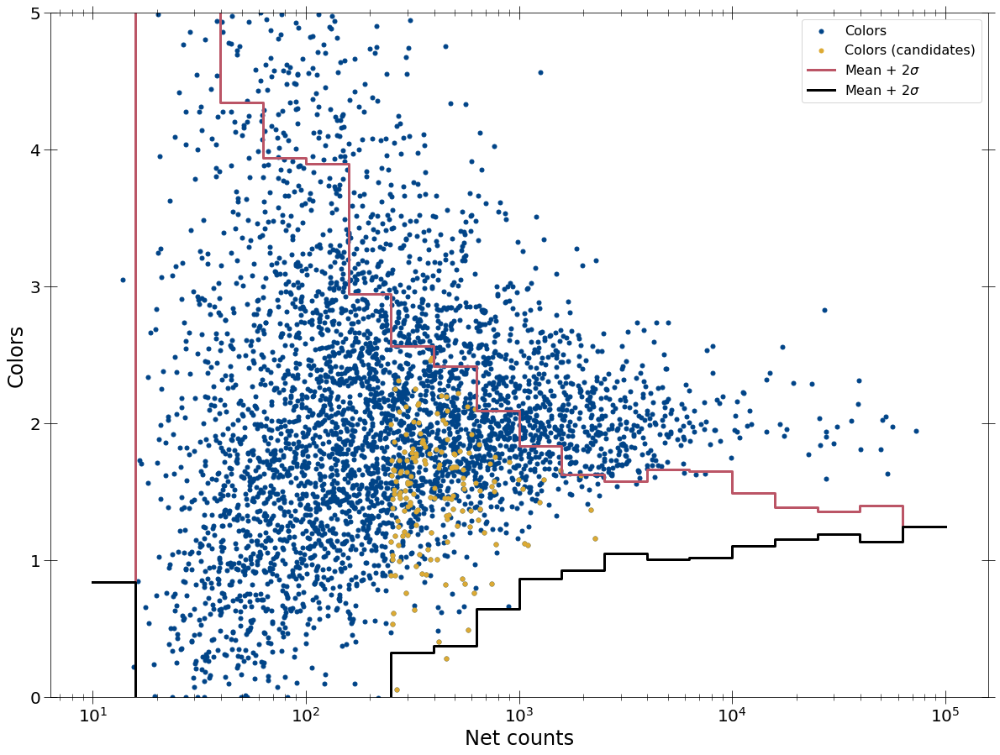

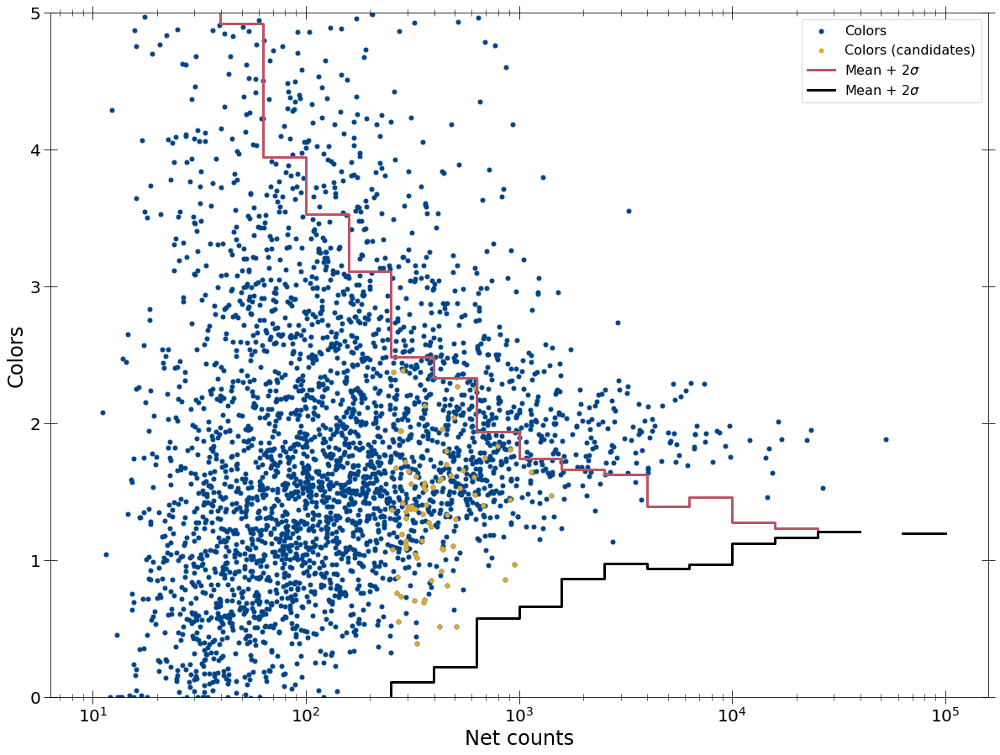

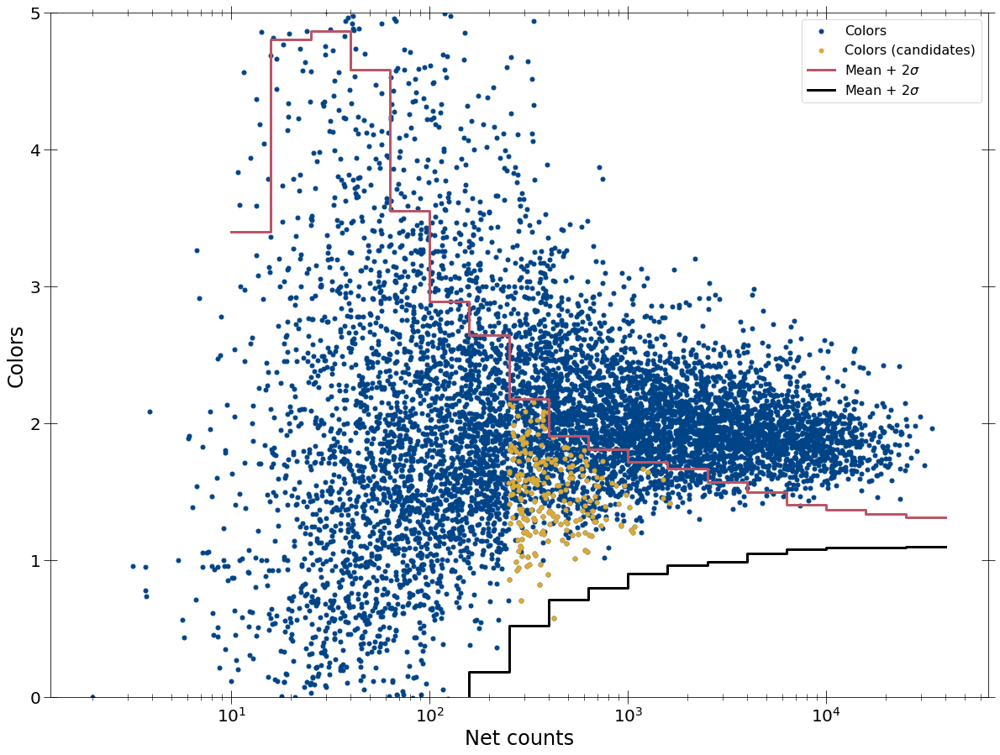

3:80: E501 line too long (82 > 79 characters)
7:80: E501 line too long (82 > 79 characters)
11:80: E501 line too long (82 > 79 characters)


In [274]:
cvs_as_msps_colors_pn, cvs_as_msps_netcounts_pn = mark_interested_srcs(
    sim_msps_color_dict_arr[0], sim_ips_color_dict_arr[0],
    spec_summary_msp_cvs['src_nums'][0], spec_summary_msp_cvs['spec_masks'][1][0],
    cvs_as_msps_pn)
cvs_as_msps_colors_mos, cvs_as_msps_netcounts_mos = mark_interested_srcs(
    sim_msps_color_dict_arr[1], sim_ips_color_dict_arr[1],
    spec_summary_msp_cvs['src_nums'][0], spec_summary_msp_cvs['spec_masks'][1][1],
    cvs_as_msps_mos)
cvs_as_msps_colors_acis, cvs_as_msps_netcounts_acis = mark_interested_srcs(
    sim_msps_color_dict_arr[2], sim_ips_color_dict_arr[2],
    spec_summary_msp_cvs['src_nums'][1], spec_summary_msp_cvs['spec_masks'][1][2],
    cvs_as_msps_acis)

In [275]:
spec_summary_cvs['src_nums'][0]

NameError: name 'spec_summary_cvs' is not defined

In [ ]:
fit_stats_arr = [[pn_fit_stats_table_pl_cv, pn_fit_stats_table_pl_g_cv,
                  pn_fit_stats_table_pl_g2_cv],
                 [mos_fit_stats_table_pl_cv, mos_fit_stats_table_pl_g_cv,
                  mos_fit_stats_table_pl_g2_cv],
                 [acis_fit_stats_table_pl_cv, acis_fit_stats_table_pl_g_sim,
                  acis_fit_stats_table_pl_g2_sim]]

model_params_arr = [[pn_model_params_table_pl_cv, pn_model_params_table_pl_g_cv,
                     pn_model_params_table_pl_g2_cv],
                    [mos_model_params_table_pl_cv,
                     mos_model_params_table_pl_g_cv,
                     mos_model_params_table_pl_g2_cv],
                    [acis_model_params_table_pl_cv,
                     acis_model_params_table_pl_g_sim,
                     acis_model_params_table_pl_g2_sim]]

det_names = ['PN', 'MOS', 'ACIS']
model_names = ['PL', 'PL_Gauss', 'PL_Gauss3']

for i in range(3):
    for j in range(3):
        fits_file_name = ('Fit_stats_CV_' + det_names[i] + '_' + model_names[j] +
                          '.txt')
        model_file_name = ('Model_params_CV_' + det_names[i] + '_' + model_names[j] +
                          '.txt')
        print(fits_file_name, model_file_name)
        np.savetxt(fits_file_name, fit_stats_arr[i][j], fmt='%s')
        np.savetxt(model_file_name, model_params_arr[i][j], fmt='%s')

# Checking for CVs detected as MSPs

In [635]:
def get_netcounthist_fraction(netcount_bins_arr, cand_netcounts_arr,
                              int_netcounts_arr, det_names_arr):
    """Get histogram of candidate sources based on a property."""
    interested_srcs_histogram = []
    candidate_srcs_histogram = []
    ratios = []
    err_ratios = []
    for i, netcount_bins in enumerate(netcount_bins_arr):
        print(netcount_bins)
        int_hist = np.histogram(int_netcounts_arr[i], bins=netcount_bins)[0]
        print(int_hist)
        cand_hist = np.histogram(cand_netcounts_arr[i], bins=netcount_bins)[0]
        print(cand_hist)
        ratio = cand_hist/int_hist
        err_ratio = ((cand_hist+1)**-0.5 + (int_hist+1)**-0.5)*ratio
        err_ratio[ratio==0] = 1.0/int_hist[ratio==0]
        print(ratio)
        print(err_ratio)
        
        interested_srcs_histogram.append(int_hist)
        candidate_srcs_histogram.append(cand_hist)
        ratios.append(ratio)
        err_ratios.append(err_ratio)
        
    fig, ax1 = plt.subplots()
    ax1.set_xlabel('Net counts')
    ax1.set_xscale('log')
    ax1.set_xlim(250,2.0E+6)
    ax1.set_ylabel('# of simulated CVs per bin')
    ax1.hist(int_netcounts_arr, bins=netcount_bins,
             color=['#6699cc', '#ee99aa', '#eecc66'])
    ax1.legend(det_names_arr, loc='lower right')
    
    ax2 = ax1.twinx()
    ax2.set_ylabel(r'$p(NL|CV)$')
    ax2.set_ylim(0, 1.0)
    line_colors = ['#004488', '#994455', '#997700']
    for i, netcount_bins in enumerate(netcount_bins_arr):
        ax2.errorbar(0.5*(netcount_bins[1:]+netcount_bins[:-1]),
                     ratios[i],
                     yerr=err_ratios[i], capsize=15, color=line_colors[i],
                     label=det_names_arr[i], capthick=3)
    ax2.legend()
    return (interested_srcs_histogram, candidate_srcs_histogram, ratios,
            err_ratios)

16:24: E225 missing whitespace around operator
16:49: E225 missing whitespace around operator
19:1: W293 blank line contains whitespace
24:1: W293 blank line contains whitespace
28:21: E231 missing whitespace after ','
33:1: W293 blank line contains whitespace


In [573]:
netcount_bins_2 = np.logspace(np.log10(250), 6.3, 6)

In [612]:
netcount_bins_2

array([2.50000000e+02, 1.50782871e+03, 9.09418962e+03, 5.48499206e+04,
       3.30817139e+05, 1.99526231e+06])

In [614]:
set_plotparams('presentation')

[2.50000000e+02 1.50782871e+03 9.09418962e+03 5.48499206e+04
 3.30817139e+05 1.99526231e+06]
[110  45  12   5   6]
[54 21  5  4  0]
[0.49090909 0.46666667 0.41666667 0.8        0.        ]
[0.1127892  0.16829991 0.285666   0.68436951 0.16666667]
[2.50000000e+02 1.50782871e+03 9.09418962e+03 5.48499206e+04
 3.30817139e+05 1.99526231e+06]
[91 38 10  6  7]
[40  8  5  1  2]
[0.43956044 0.21052632 0.5        0.16666667 0.28571429]
[0.11447515 0.10388663 0.35487982 0.18084521 0.26597247]
[2.50000000e+02 1.50782871e+03 9.09418962e+03 5.48499206e+04
 3.30817139e+05 1.99526231e+06]
[117   7   3   3   0]
[70  7  2  0  0]
[0.5982906  1.         0.66666667 0.                nan]
[0.12608114 0.70710678 0.71823351 0.33333333        nan]


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


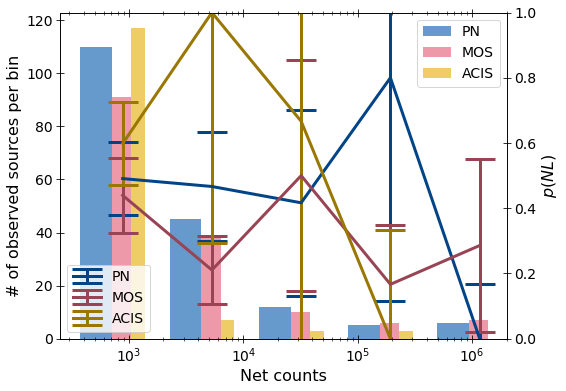

2:13: E127 continuation line over-indented for visual indent


In [630]:
(interested_msp_histogram, candidate_msp_histogram, ratios_msp,
            err_ratios_msp) = get_netcounthist_fraction(
    [netcount_bins_2, netcount_bins_2, netcount_bins_2],
    [candidate_msp_netcounts_pn, candidate_msp_netcounts_mos,
     candidate_msp_netcounts_acis],
    [interested_msp_netcounts_pn, interested_msp_netcounts_mos,
     interested_msp_netcounts_acis], ['PN', 'MOS', 'ACIS'])

[2.50000000e+02 1.50782871e+03 9.09418962e+03 5.48499206e+04
 3.30817139e+05 1.99526231e+06]
[975  32   0   0   0]
[157   4   0   0   0]
[0.16102564 0.125             nan        nan        nan]
[0.01796482 0.07766141        nan        nan        nan]
[2.50000000e+02 1.50782871e+03 9.09418962e+03 5.48499206e+04
 3.30817139e+05 1.99526231e+06]
[581  18   0   0   0]
[75  0  0  0  0]
[0.12908778 0.                nan        nan        nan]
[0.02015824 0.05555556        nan        nan        nan]
[2.50000000e+02 1.50782871e+03 9.09418962e+03 5.48499206e+04
 3.30817139e+05 1.99526231e+06]
[954 115   0   0   0]
[224   2   0   0   0]
[0.23480084 0.0173913         nan        nan        nan]
[0.02325137 0.01165562        nan        nan        nan]


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


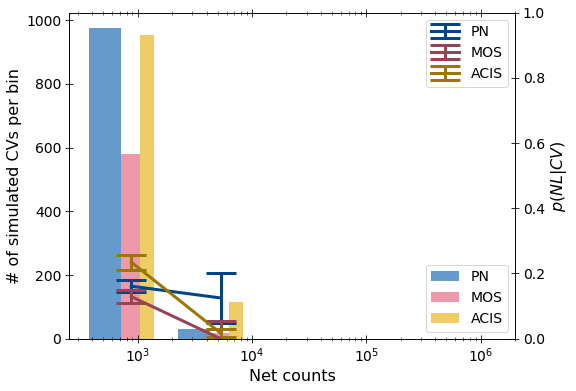

2:13: E127 continuation line over-indented for visual indent


In [636]:
(interested_cvs_histogram, cvs_as_msps_histogram, ratios_cv_as_msp,
            err_ratios_cv_as_msp) = get_netcounthist_fraction(
    [netcount_bins_2, netcount_bins_2, netcount_bins_2],
    [cvs_as_msps_netcounts_pn, cvs_as_msps_netcounts_mos,
     cvs_as_msps_netcounts_acis],
    [interested_cv_netcounts_pn, interested_cv_netcounts_mos,
     interested_cv_netcounts_acis], ['PN', 'MOS', 'ACIS'])

In [580]:
def get_const(yvals, err):
    nan_yvals = np.isnan(yvals)
    nan_errs = np.isnan(err)
    nan_vals = np.logical_or(nan_yvals, nan_errs)
    return np.sum((yvals/err**2)[~nan_vals])/np.sum((1.0/err**2)[~nan_vals])

In [581]:
get_const(ratios_msp[0], err_ratios_msp[0])

0.48221946585984277

In [582]:
get_const(ratios_msp[1], err_ratios_msp[1])

0.3085203594198758

In [583]:
get_const(ratios_msp[2], err_ratios_msp[2])

0.6104863018305752

[2.50000000e+02 1.50782871e+03 9.09418962e+03 5.48499206e+04
 3.30817139e+05 1.99526231e+06]
[168  66  17   7   6]
[110  45  12   5   6]
[0.6547619  0.68181818 0.70588235 0.71428571 1.        ]
[0.11294508 0.18556547 0.3749723  0.58941291 0.81649658]
[2.50000000e+02 1.50782871e+03 9.09418962e+03 5.48499206e+04
 3.30817139e+05 1.99526231e+06]
[116  53  12   7   7]
[91 38 10  6  7]
[0.78448276 0.71698113 0.83333333 0.85714286 1.        ]
[0.15507353 0.21479463 0.50408575 0.67389665 0.75592895]
[2.50000000e+02 1.50782871e+03 9.09418962e+03 5.48499206e+04
 3.30817139e+05 1.99526231e+06]
[262  19   4   3   0]
[117   7   3   3   0]
[0.44656489 0.36842105 0.75       1.                nan]
[0.06887381 0.22377166 0.8080127  1.15470054        nan]


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in power
  from ipykernel import kernelapp as app


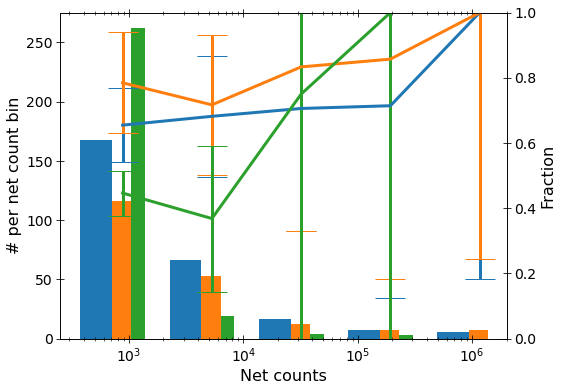

2:13: E127 continuation line over-indented for visual indent
6:80: E501 line too long (80 > 79 characters)


In [584]:
(netcount_obs_histogram, int_obs_histogram, ratios_int_obs,
            err_ratios_int_obs) = get_netcounthist_fraction(
    [netcount_bins_2, netcount_bins_2, netcount_bins_2],
    [interested_msp_netcounts_pn, interested_msp_netcounts_mos,
     interested_msp_netcounts_acis],
    [spec_summary_msps['counts'][0][0][1], spec_summary_msps['counts'][0][1][1],
     spec_summary_msps['counts'][0][2][1]], ['PN', 'MOS', 'ACIS'])

[2.50000000e+02 1.50782871e+03 9.09418962e+03 5.48499206e+04
 3.30817139e+05 1.99526231e+06]
[1529  355   37    2    0]
[975  32   0   0   0]
[0.63767168 0.09014085 0.         0.                nan]
[0.03672956 0.02071898        nan        nan        nan]
[2.50000000e+02 1.50782871e+03 9.09418962e+03 5.48499206e+04
 3.30817139e+05 1.99526231e+06]
[872 127  14   0   0]
[581  18   0   0   0]
[0.6662844  0.14173228 0.                nan        nan]
[0.05020537 0.04598333        nan        nan        nan]
[2.50000000e+02 1.50782871e+03 9.09418962e+03 5.48499206e+04
 3.30817139e+05 1.99526231e+06]
[2438 1841  337    0    0]
[954 115   0   0   0]
[0.39130435 0.06246605 0.                nan        nan]
[0.02059392 0.00728084        nan        nan        nan]


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in power
  from ipykernel import kernelapp as app
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in multiply
  from ipykernel import kernelapp as app


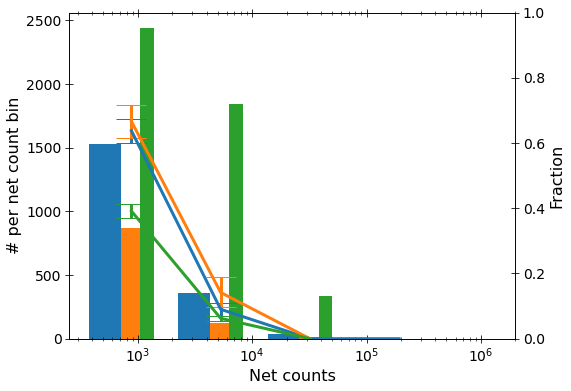

2:13: E127 continuation line over-indented for visual indent


In [585]:
(netcount_cvsim_histogram, int_cvsim_histogram, ratios_int_cvsim,
            err_ratios_int_cvsim) = get_netcounthist_fraction(
    [netcount_bins_2, netcount_bins_2, netcount_bins_2],
    [interested_cv_netcounts_pn, interested_cv_netcounts_mos,
     interested_cv_netcounts_acis],
    [spec_summary_msp_cvs['counts'][0][0][1],
     spec_summary_msp_cvs['counts'][0][1][1],
     spec_summary_msp_cvs['counts'][0][2][1]], ['PN', 'MOS', 'ACIS'])

In [586]:
def get_cvprob(p_nl_cvsim, p_nl_obs, p1_msp, p1_obs, p1_cv):
    p_nl_cvsim[np.isnan(p_nl_cvsim)] = 0.0
    p1_obs[np.isnan(p1_obs)] = 1.0
    p1_cv[np.isnan(p1_cv)] = 0.0
    return p_nl_cvsim/p_nl_obs*((p1_msp - p1_obs)/(p1_msp - p1_cv))

In [587]:
pn_cvprob1 = get_cvprob(ratios_cv_as_msp[0], 0.31, 0.95, ratios_int_obs[0],
                        ratios_int_cvsim[0])

In [588]:
pn_cvprob2 = get_cvprob(ratios_cv_as_msp[0], ratios_msp[0], 0.95,
                        ratios_int_obs[0], ratios_int_cvsim[0])

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """


In [589]:
mos_cvprob1 = get_cvprob(ratios_cv_as_msp[1], 0.31, 0.95,
                         ratios_int_obs[1], ratios_int_cvsim[1])

In [553]:
mos_cvprob2 = get_cvprob(ratios_cv_as_msp[1], ratios_msp[1], 0.95,
                         ratios_int_obs[1], ratios_int_cvsim[1])

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """


In [554]:
acis_cvprob1 = get_cvprob(ratios_cv_as_msp[2], 0.59, 0.95, ratios_int_obs[2],
           ratios_int_cvsim[2])

2:12: E128 continuation line under-indented for visual indent


In [555]:
acis_cvprob2 = get_cvprob(ratios_cv_as_msp[2], ratios_msp[2], 0.95, ratios_int_obs[2],
           ratios_int_cvsim[2])

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """
1:80: E501 line too long (86 > 79 characters)
2:12: E128 continuation line under-indented for visual indent


In [560]:
pn_cvprob3*candidate_msp_histogram[0]

array([8.16725979, 1.890625  , 2.16666667, 0.        , 0.        ,
              nan, 0.        ,        nan,        nan,        nan])

In [564]:
pn_cvprob1*candidate_msp_histogram[0]*ratios_int_cvsim[0]/ratios_int_obs[0]

array([34.46392719,  1.84055989,  0.40890751,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        , -0.        , -0.        ])

In [565]:
pn_cvprob2*candidate_msp_histogram[0]*ratios_int_cvsim[0]/ratios_int_obs[0]

array([19.54356846,  1.5361596 ,  0.20915619,  0.        ,  0.        ,
               nan,  0.        ,         nan,         nan,         nan])

In [566]:
mos_cvprob3*candidate_msp_histogram[1]

array([4.56267409, 2.04081633, 0.        , 0.        , 0.        ,
       0.        , 0.        ,        nan, 0.        ,        nan])

In [567]:
mos_cvprob1*candidate_msp_histogram[1]*ratios_int_cvsim[1]/ratios_int_obs[1]

array([ 7.40518108,  1.0912016 ,  0.        ,  0.        , -0.        ,
        0.        ,  0.        , -0.        , -0.        , -0.        ])

In [568]:
mos_cvprob2*candidate_msp_histogram[1]*ratios_int_cvsim[1]/ratios_int_obs[1]

array([ 4.50618982,  0.98879653,  0.        ,  0.        , -0.        ,
        0.        ,  0.        ,         nan, -0.        ,         nan])

In [569]:
acis_cvprob3*candidate_msp_histogram[2]

array([15.06040268,  1.43816254,  0.        ,  0.        ,  0.        ,
        0.        ,         nan,         nan,         nan,         nan])

In [570]:
acis_cvprob1*candidate_msp_histogram[2]*ratios_int_cvsim[2]/ratios_int_obs[2]

array([ 3.17578289e+01,  1.77084254e+00,  3.17389247e-02,  0.00000000e+00,
        0.00000000e+00, -0.00000000e+00, -0.00000000e+00, -0.00000000e+00,
       -0.00000000e+00, -0.00000000e+00])

In [572]:
acis_cvprob2*candidate_msp_histogram[2]*ratios_int_cvsim[2]/ratios_int_obs[2]

array([ 3.05710890e+01,  1.92885618e+00,  1.87259656e-02,  0.00000000e+00,
        0.00000000e+00, -0.00000000e+00,             nan,             nan,
                   nan,             nan])

In [410]:
candidate_msp_histogram

[array([54, 21,  5,  4,  0]),
 array([40,  8,  5,  1,  2]),
 array([70,  7,  2,  0,  0])]

In [122]:
37*0.7

25.9

In [454]:
def get_cvprob2(p_nl1_cv1, p_nl1):
    return p_nl1_cv1/p_nl1*(1 - p_nl1)/(1 - p_nl1_cv1)

In [465]:
print(pn_cvprob2)

[0.31139681 0.08874954 0.         0.                nan]


In [457]:
get_cvprob2(ratios_cv_as_msp[0], ratios_msp[0])

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


array([0.19904012, 0.16326531, 0.        , 0.        ,        nan])

In [464]:
ratios_int_cvsim[0]/ratios_int_obs[0]

array([0.97389857, 0.13220657, 0.        , 0.        , 0.        ])

In [602]:
pn_cvprob3 = get_cvprob2(ratios_cv_as_msp[0], ratios_msp[0])

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


In [603]:
mos_cvprob3 = get_cvprob2(ratios_cv_as_msp[1], ratios_msp[1])

In [604]:
acis_cvprob3 = get_cvprob2(ratios_cv_as_msp[2], ratios_msp[2])

In [605]:
acis_cvprob3

array([0.2060274, 0.       ,       nan,       nan,       nan])

In [491]:
netcount_bins_2

array([2.50000000e+02, 1.50782871e+03, 9.09418962e+03, 5.48499206e+04,
       3.30817139e+05, 1.99526231e+06])

In [774]:
print(pn_cvprob1)
print(pn_cvprob2)
print(pn_cvprob3)

[ 0.49101456  0.12576226  0.          0.         -0.        ]
[0.3100666  0.08354207 0.         0.                nan]
[0.19904012 0.16326531 0.         0.                nan]


In [591]:
print(mos_cvprob1)
print(mos_cvprob2)
print(mos_cvprob3)

[ 0.2429313  0.         0.         0.        -0.       ]
[ 0.18308003  0.10941857  0.          0.         -0.          0.
  0.                 nan -0.                 nan]
[0.16898793 0.15698587 0.         0.         0.         0.
 0.                nan 0.                nan]


In [592]:
print(acis_cvprob1)
print(acis_cvprob2)
print(acis_cvprob3)

[ 0.52910217  0.17440853  0.02612776  0.          0.         -0.
 -0.         -0.         -0.         -0.        ]
[ 0.50933045  0.18997114  0.01541538  0.          0.         -0.
         nan         nan         nan         nan]
[0.26421759 0.11062789 0.         0.         0.         0.
        nan        nan        nan        nan]


In [596]:
def err_cvprob3(p_nl1_cv1, p_nl1, e_nl1_cv1, e_nl1):
    return (e_nl1/p_nl1**2 * p_nl1_cv1/(1 - p_nl1_cv1) +
            e_nl1_cv1/p_nl1 * (1 - p_nl1)/(1 - p_nl1_cv1)**2)

In [600]:
pn_cvprob3_err = err_cvprob3(ratios_cv_as_msp[0], ratios_msp[0],
                             err_ratios_cv_as_msp[0], err_ratios_msp[0])
mos_cvprob3_err = err_cvprob3(ratios_cv_as_msp[1], ratios_msp[1],
                              err_ratios_cv_as_msp[1], err_ratios_msp[1])
acis_cvprob3_err = err_cvprob3(ratios_cv_as_msp[2], ratios_msp[2],
                               err_ratios_cv_as_msp[2], err_ratios_msp[2])

In [606]:
print(pn_cvprob3)
print(pn_cvprob3_err)

[0.19904012 0.16326531 0.         0.                nan]
[0.11701401 0.23871447        nan        nan        nan]


In [607]:
print(mos_cvprob3)
print(mos_cvprob3_err)

[0.18898221 0.         0.         0.         0.        ]
[0.12272375        nan        nan        nan        nan]


In [608]:
print(acis_cvprob3)
print(acis_cvprob3_err)

[0.2060274 0.              nan       nan       nan]
[0.13542295 0.01337927        nan        nan        nan]


In [644]:
def plot_cvestimate(netcount_bins_arr, nl_netcounts_arr, prob, prob_err,
                    det_names_arr=None):
    if det_names_arr is None:
        det_names_arr = ['PN', 'MOS', 'ACIS']
    fig, ax1 = plt.subplots()
    ax1.set_xlabel('Net counts')
    ax1.set_xscale('log')
    ax1.set_xlim(250,2.0E+6)
    ax1.set_ylabel('# of candidate continuum sources per bin')
    ax1.hist(nl_netcounts_arr, bins=netcount_bins_arr[0],
             color=['#6699cc', '#ee99aa', '#eecc66'])
    ax1.legend(det_names_arr, loc='center right')
    
    ax2 = ax1.twinx()
    ax2.set_ylabel(r'$p(CV|NL)$')
    ax2.set_ylim(0, 1.0)
    line_colors = ['#004488', '#994455', '#997700']
    for i, netcount_bins in enumerate(netcount_bins_arr):
        ax2.errorbar(0.5*(netcount_bins[1:]+netcount_bins[:-1]),
                     prob[i],
                     yerr=prob_err[i], capsize=15, color=line_colors[i],
                     label=det_names_arr[i], capthick=3)
    ax2.legend()

8:21: E231 missing whitespace after ','
13:1: W293 blank line contains whitespace


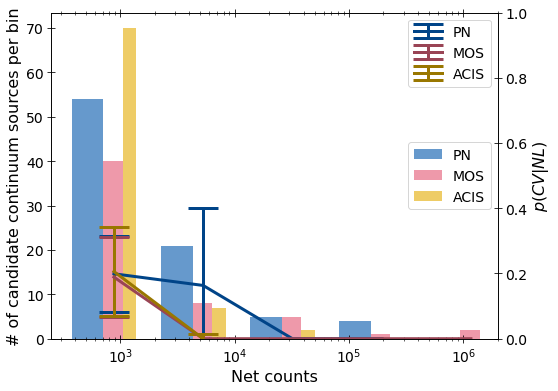

In [645]:
plot_cvestimate(
    [netcount_bins_2, netcount_bins_2, netcount_bins_2],
    [candidate_msp_netcounts_pn, candidate_msp_netcounts_mos,
     candidate_msp_netcounts_acis], [pn_cvprob3, mos_cvprob3, acis_cvprob3],
    [pn_cvprob3_err, mos_cvprob3_err, acis_cvprob3_err])

# Spectral Analaysis of simulated MSPs

In [22]:
def get_candidate_src_nums_alldet_sim(spec_summary, sim_color_dict_arr,
                                      min_count_arr=None, min_counts2=None):
    """Get source nums for all detectors."""
    interested_args_alldet = []
    interested_sources_alldet = []
    if min_count_arr is None:
        min_count_arr = [250, 250, 250]
    for i, sim_color_dict in enumerate(sim_color_dict_arr):
        src_nums = np.arange(len(spec_summary['specs'][0][i]))
        interested_args, interested_srcs = get_candidate_src_nums_det(
            src_nums, spec_summary['spec_masks'][0][i],
            sim_color_dict, sim_color_dict, min_count_arr[i], min_counts2)
        interested_args_alldet.append(interested_args)
        interested_sources_alldet.append(interested_srcs)
    return interested_args_alldet, interested_sources_alldet

In [76]:
param_values = np.loadtxt('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/xmm_sims')

In [80]:
param_values[:5]

array([[1.12274989e+23, 1.25722222e+00, 1.06067471e+31],
       [2.08109016e+23, 1.08146314e+00, 3.78592008e+31],
       [1.07555677e+23, 1.76985317e+00, 1.67878629e+31],
       [1.31665115e+23, 1.99401302e+00, 6.48635236e+33],
       [3.66869293e+23, 1.59192534e+00, 2.98186253e+33]])

In [74]:
get_candidate_src_nums_alldet_sim(
    spec_summary_msps, sim_msps_color_dict_arr, min_count_arr=[1.0E+5, 1.0E+5, 20000], min_counts2=25000)

[1.00000000e+01 1.58489319e+01 2.51188643e+01 3.98107171e+01
 6.30957344e+01 1.00000000e+02 1.58489319e+02 2.51188643e+02
 3.98107171e+02 6.30957344e+02 1.00000000e+03 1.58489319e+03
 2.51188643e+03 3.98107171e+03 6.30957344e+03 1.00000000e+04
 1.58489319e+04 2.51188643e+04 3.98107171e+04 6.30957344e+04
 1.00000000e+05]
[0.8405164  2.03621255 1.63305682 1.56743663 1.5736705  1.66320801
 1.4331601  1.44713313 1.39609846 1.36984926 1.35086023 1.27893642
 1.31590127 1.33564778 1.334838   1.30071855 1.27144028 1.27383281
 1.26917868 1.24506393]
[0.         2.58517276 1.72972337 1.38681819 1.18129716 1.11575665
 0.75540094 0.56022382 0.51077116 0.36126324 0.24291962 0.17375792
 0.13254254 0.16428213 0.15864827 0.09633923 0.05725364 0.0421451
 0.0654287  0.        ]
100000.0 1.245063925607339 0.05
0
[1.00000000e+01 1.58489319e+01 2.51188643e+01 3.98107171e+01
 6.30957344e+01 1.00000000e+02 1.58489319e+02 2.51188643e+02
 3.98107171e+02 6.30957344e+02 1.00000000e+03 1.58489319e+03
 2.51188643e

([array([], dtype=int64),
  array([], dtype=int64),
  array([ 428,  483, 3496, 5282, 6092, 6663, 7456])],
 [array([], dtype=int64),
  array([], dtype=int64),
  array([ 528,  589, 4434, 6651, 7718, 8439, 9485])])

In [23]:
sim_msp_interested_args_alldet, sim_msp_interested_alldet = get_candidate_src_nums_alldet_sim(
    spec_summary_msps, sim_msps_color_dict_arr, min_count_arr=[150, 150, 150], min_counts2=250)

[1.00000000e+01 1.58489319e+01 2.51188643e+01 3.98107171e+01
 6.30957344e+01 1.00000000e+02 1.58489319e+02 2.51188643e+02
 3.98107171e+02 6.30957344e+02 1.00000000e+03 1.58489319e+03
 2.51188643e+03 3.98107171e+03 6.30957344e+03 1.00000000e+04
 1.58489319e+04 2.51188643e+04 3.98107171e+04 6.30957344e+04
 1.00000000e+05]
[0.8405164  2.03621255 1.63305682 1.56743663 1.5736705  1.66320801
 1.4331601  1.44713313 1.39609846 1.36984926 1.35086023 1.27893642
 1.31590127 1.33564778 1.334838   1.30071855 1.27144028 1.27383281
 1.26917868 1.24506393]
[0.         2.58517276 1.72972337 1.38681819 1.18129716 1.11575665
 0.75540094 0.56022382 0.51077116 0.36126324 0.24291962 0.17375792
 0.13254254 0.16428213 0.15864827 0.09633923 0.05725364 0.0421451
 0.0654287  0.        ]
250 1.4471331268500243 0.5602238243386048
5
251.18864315095823 1.4471331268500243 0.5602238243386048
316
398.1071705534973 1.396098460383752 0.5107711552472425
233
630.957344480193 1.3698492577015142 0.36126323889561407
198
1000.

1:80: E501 line too long (94 > 79 characters)


In [24]:
np.min(sim_msps_color_dict_arr[0]['prop_list'][0][sim_msp_interested_args_alldet[0]])

250.32561761609358

(0.0, 5.0)

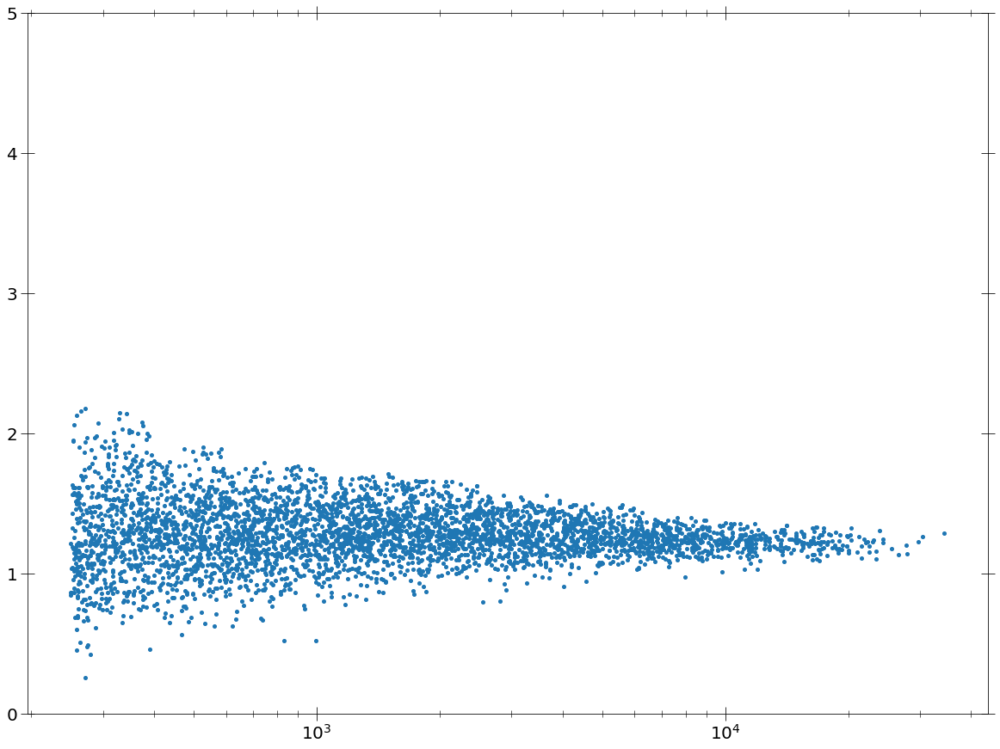

1:80: E501 line too long (90 > 79 characters)
2:80: E501 line too long (84 > 79 characters)


In [25]:
plt.scatter(sim_msps_color_dict_arr[2]['prop_list'][0][sim_msp_interested_args_alldet[2]],
            sim_msps_color_dict_arr[2]['colors'][sim_msp_interested_args_alldet[2]])
plt.xscale('log')
plt.ylim(0, 5)

1113 1113
[2589.44505332 1484.2186287   273.189666   ...  702.70944353 1476.57640604
  485.26913385]
[1.24826656 1.15834374 1.84013453 ... 1.04101455 1.20963252 0.9393416 ]
4.0
16.0
510 510
[ 1490.00479162   941.45614916   400.11936804   329.43210346
   463.33107647  1230.64205245   846.18391652   317.69254051
   298.88211089  1227.9458038    254.32155901   371.94539383
   675.92219742   515.97224293  1425.66851156   398.79274735
   398.31465687   986.92215916   517.26767474   839.87625344
  1959.6238978    307.79399403  2081.19069776   495.16635455
   557.97589007   874.37924217   400.42251449  2841.84267304
   267.51418612  1050.06797318   260.4486977    256.03760682
  1480.65102244  1042.66920567   316.49973863  2360.04983055
   414.02488099   481.89648021   521.06579493  2411.33521241
   298.90855548   305.02540038   524.89005138   462.79020026
   451.64341496   645.42474663   362.21453302  3346.65549072
   864.77663144   506.56347761   375.28568862   936.33365533
   693.42657316  

4.0
16.0


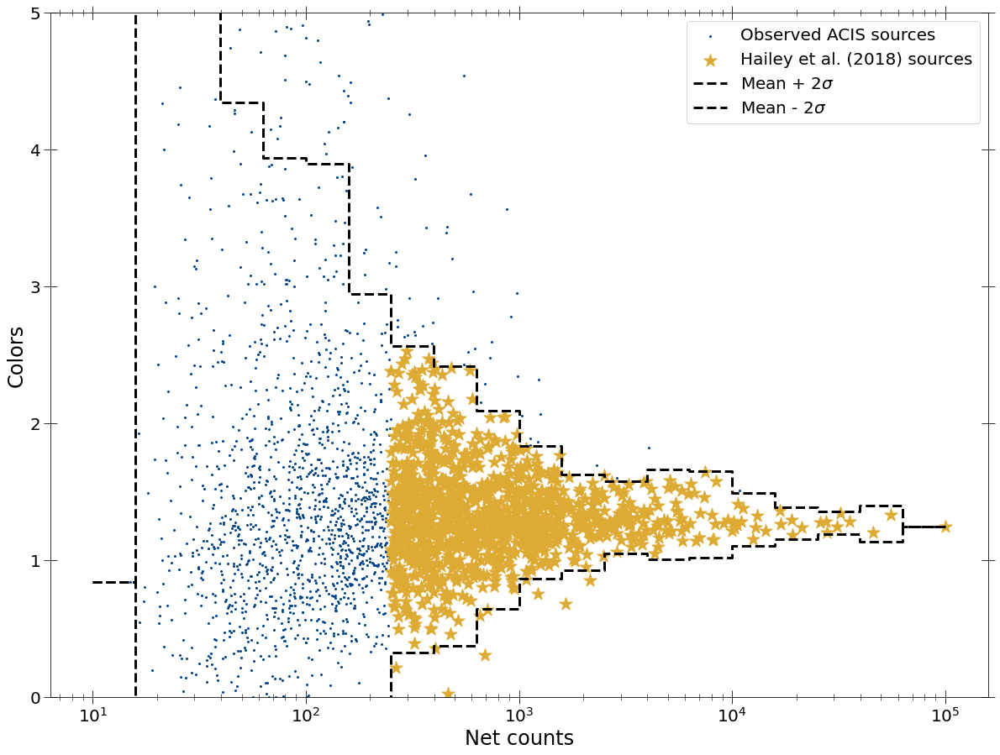

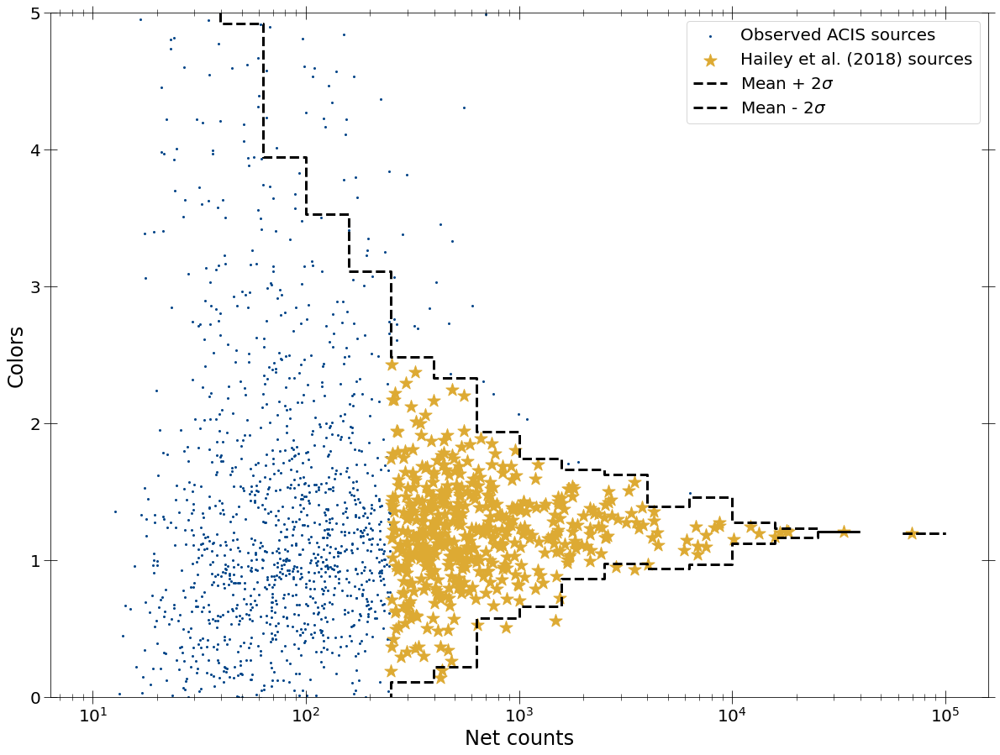

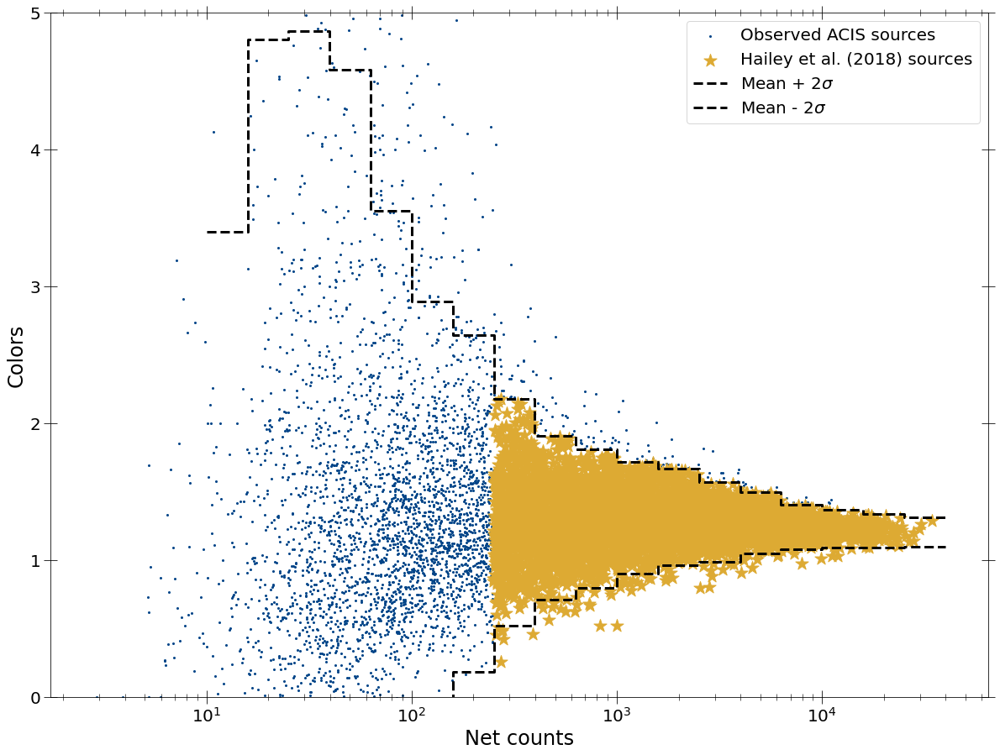

5:80: E501 line too long (81 > 79 characters)
9:80: E501 line too long (83 > 79 characters)


In [66]:
interested_msps_colors_pn, interested_msps_netcounts_pn = mark_interested_srcs(
    sim_msps_color_dict_arr[0], sim_msps_color_dict_arr[0],
    src_nums_xmm_msps, spec_summary_msps['spec_masks'][0][0],
    sim_msp_interested_alldet[0])
interested_msps_colors_mos, interested_msps_netcounts_mos = mark_interested_srcs(
    sim_msps_color_dict_arr[1], sim_msps_color_dict_arr[1],
    src_nums_xmm_msps, spec_summary_msps['spec_masks'][0][1],
    sim_msp_interested_alldet[1])
interested_msps_colors_acis, interested_msps_netcounts_acis = mark_interested_srcs(
    sim_msps_color_dict_arr[2], sim_msps_color_dict_arr[2],
    src_nums_chandra_msps, spec_summary_msps['spec_masks'][0][2],
    sim_msp_interested_alldet[2])

In [26]:
def fit_src_pl_sim(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder + 'msp_highNH_' +
                                 str(source_num) + '_PN.fak')
        spec_mosfile = glob2.glob(src_folder + 'msp_highNH_' +
                                  str(source_num) + '_MOS.fak')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        #os.chdir(src_folder + '/' + source_num)
        spec_file = 'msp_highNH_' + str(source_num) + '.fak'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')

    model = xspec.Model('tbabs*pegpwrlw')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.perform()
    xspec.Fit.error('2.706 2')
    xspec.Fit.perform()
    print('Calculating goodness')
    #goodness = xspec.Fit.goodness(1000)
    print('Finished calculating goodness')
    goodness = 50.0
    print('Model params for ' + str(source_num) +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0])
    print('Fit stats for ' + str(source_num) + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    if telescope == 'Chandra':
        os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0]])

20:9: E265 block comment should start with '# '
38:5: E265 block comment should start with '# '
50:80: E501 line too long (80 > 79 characters)


In [27]:
def fit_src_pl_gauss_sim(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder + 'msp_highNH_' +
                                 str(source_num) + '_PN.fak')
        spec_mosfile = glob2.glob(src_folder + 'msp_highNH_' +
                                  str(source_num) + '_MOS.fak')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        #os.chdir(src_folder + '/' + source_num)
        spec_file = 'msp_highNH_' + str(source_num) + '.fak'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')
    
    model = xspec.Model('tbabs*(pegpwrlw+gauss)')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    model.pegpwrlw.eMin.values = '2.0'
    model.pegpwrlw.eMax.values = '10.0'
    model.gaussian.LineE.values = '6.7, 0.0001, 6.1, 6.1, 7.3, 7.3'
    model.gaussian.Sigma.values = '0.1 0'
    model.gaussian.norm.values = '1.0E-5, 0.001,,,,'
    
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.query = 'yes'
    xspec.Fit.perform()
    xspec.Fit.error('2.706 6')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 8')
    xspec.Fit.perform()
    #xspec.Fit.error('2.706 6')
    #xspec.Fit.error('2.706 8')
    #goodness = xspec.Fit.goodness(1000)
    goodness = 50.0
    line_pos_low = xspec.AllModels(1).gaussian.LineE.error[0]
    line_pos_high = xspec.AllModels(1).gaussian.LineE.error[1]
    line_norm_low = xspec.AllModels(1).gaussian.norm.error[0]
    line_norm_high = xspec.AllModels(1).gaussian.norm.error[1]
    print('Model params for ' + str(source_num) +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0],
          ' Fe_pos:', xspec.AllModels(1).gaussian.LineE.values[0],
          line_pos_low, line_pos_high,
          ' Fe_norm:', xspec.AllModels(1).gaussian.norm.values[0],
          line_norm_low, line_norm_high)
    print('Fit stats for ' + str(source_num) + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0],
             xspec.AllModels(1).gaussian.LineE.values[0], line_pos_low,
             line_pos_high,
             xspec.AllModels(1).gaussian.norm.values[0], line_norm_low,
             line_norm_high])


20:9: E265 block comment should start with '# '
27:1: W293 blank line contains whitespace
36:1: W293 blank line contains whitespace
46:5: E265 block comment should start with '# '
47:5: E265 block comment should start with '# '
48:5: E265 block comment should start with '# '
66:80: E501 line too long (80 > 79 characters)


In [28]:
def fit_src_pl_gauss2_sim(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder + 'msp_highNH_' +
                                 str(source_num) + '_PN.fak')
        spec_mosfile = glob2.glob(src_folder + 'msp_highNH_' +
                                  str(source_num) + '_MOS.fak')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        #os.chdir(src_folder + '/' + source_num)
        spec_file = 'msp_highNH_' + str(source_num) + '.fak'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')
    
    model = xspec.Model('tbabs*(pegpwrlw+gauss+gauss+gauss)')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    model.pegpwrlw.eMin.values = '2.0'
    model.pegpwrlw.eMax.values = '10.0'
    model.gaussian.LineE.values = '6.4 0'
    model.gaussian.Sigma.values = '0.0 0'
    model.gaussian.norm.values = '1.0E-5, 0.001,,,,'
    model.gaussian_4.LineE.values = '6.7 0'
    model.gaussian_4.Sigma.values = '0.0 0'
    model.gaussian_4.norm.values = '1.0E-5, 0.001,,,,'
    model.gaussian_5.LineE.values = '7.0 0'
    model.gaussian_5.Sigma.values = '0.0 0'
    model.gaussian_5.norm.values = '1.0E-5, 0.001,,,,'
    
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.query = 'yes'
    xspec.Fit.perform()
    xspec.Fit.error('2.706 8')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 11')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 14')
    # xspec.Fit.error('2.706 8')
    #goodness = xspec.Fit.goodness(1000)
    goodness = 50.0
    line_norm1_low = xspec.AllModels(1).gaussian.norm.error[0]
    line_norm1_high = xspec.AllModels(1).gaussian.norm.error[1]
    line_norm2_low = xspec.AllModels(1).gaussian_4.norm.error[0]
    line_norm2_high = xspec.AllModels(1).gaussian_4.norm.error[1]
    line_norm3_low = xspec.AllModels(1).gaussian_5.norm.error[0]
    line_norm3_high = xspec.AllModels(1).gaussian_5.norm.error[1]
    print('Model params for ' + str(source_num) +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0],
          ' Fe_norms:', xspec.AllModels(1).gaussian.norm.values[0],
          line_norm1_low, line_norm1_high,
          xspec.AllModels(1).gaussian_4.norm.values[0], line_norm2_low,
          line_norm2_high, xspec.AllModels(1).gaussian_5.norm.values[0],
          line_norm3_low, line_norm3_high)
    print('Fit stats for ' + str(source_num) + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0],
             xspec.AllModels(1).gaussian.norm.values[0],
             xspec.AllModels(1).gaussian_4.norm.values[0],
             xspec.AllModels(1).gaussian_5.norm.values[0], line_norm1_low,
             line_norm1_high, line_norm2_low, line_norm2_high, line_norm3_low,
             line_norm3_high])


20:9: E265 block comment should start with '# '
27:1: W293 blank line contains whitespace
42:1: W293 blank line contains whitespace
54:5: E265 block comment should start with '# '
75:80: E501 line too long (80 > 79 characters)


In [29]:
sim_msp_interested_alldet[0][1]

6387

In [84]:
os.chdir('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/xmm_pn_mos_simspecs_1/')
xspec.AllData.clear()
fit_src_pl_sim(sim_msp_interested_alldet[0][-1], src_folder='./')

Calculating goodness
Finished calculating goodness
Model params for 8439: NH =  8.837696990120122  Gamma:  1.3832470345428727  norm:  1.236338622166323
Fit stats for 8439:  3139.772584773316 -13.683613873164344 50.0 3189




([8439, 3139.772584773316, -13.683613873164344, 50.0, 3189],
 [8439, 8.837696990120122, 1.3832470345428727, 1.236338622166323])

1:80: E501 line too long (90 > 79 characters)


In [31]:
len(sim_msp_interested_alldet[0])

1113

In [32]:
pn_fit_stats_table_pl_msp = []
pn_model_params_table_pl_msp = []

for i, source_num in enumerate(sim_msp_interested_alldet[0]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_sim(source_num)
    pn_fit_stats_table_pl_msp.append(fit_stats)
    pn_model_params_table_pl_msp.append(model_params)

0 1323
Calculating goodness
Finished calculating goodness
Model params for 1323: NH =  32.16109288250541  Gamma:  2.4014868621863914  norm:  0.13219095343628834
Fit stats for 1323:  1288.862224442172 -7.0633652958120825 50.0 1131


1 6387
Calculating goodness
Finished calculating goodness
Model params for 6387: NH =  8.54074841455814  Gamma:  1.569789884643647  norm:  0.13416502115814555
Fit stats for 6387:  226.09244438876829 -8.652789934141484 50.0 202


2 6819
Calculating goodness
Finished calculating goodness
Model params for 6819: NH =  34.81483191640524  Gamma:  0.9706120925965527  norm:  0.5983717430917798
Fit stats for 6819:  92.94384134900314 -8.907245619289768 50.0 96


3 8374
Calculating goodness
Finished calculating goodness
Model params for 8374: NH =  16.965855004413125  Gamma:  1.9369101916812117  norm:  0.2203419544216631
Fit stats for 8374:  351.20214402883806 -8.136513741602897 50.0 366


4 9162
Calculating goodness
Finished calculating goodness
Model params for 9162:

Calculating goodness
Finished calculating goodness
Model params for 976: NH =  20.585211944018916  Gamma:  2.1264253040278356  norm:  0.6195463309254919
Fit stats for 976:  402.201602116658 -7.679732815101013 50.0 386


37 1016
Calculating goodness
Finished calculating goodness
Model params for 1016: NH =  19.4176596317013  Gamma:  0.8400982105954332  norm:  0.09261172872712703
Fit stats for 1016:  917.9403963730496 -7.160086867155377 50.0 848


38 1110
Calculating goodness
Finished calculating goodness
Model params for 1110: NH =  42.37497253935497  Gamma:  2.8032142585822393  norm:  0.3337099789696386
Fit stats for 1110:  466.53148064462397 -8.19792981751903 50.0 479


39 1148
Calculating goodness
Finished calculating goodness
Model params for 1148: NH =  9.586266991837407  Gamma:  1.4488242312481603  norm:  0.6152792764050712
Fit stats for 1148:  110.73650058843845 -9.217587236698739 50.0 123


40 1184
Calculating goodness
Finished calculating goodness
Model params for 1184: NH =  3

Calculating goodness
Finished calculating goodness
Model params for 2154: NH =  11.492286134332488  Gamma:  1.4628938601248114  norm:  0.8871252616858615
Fit stats for 2154:  102.98595327428158 -8.028163879988805 50.0 101


73 2176
Calculating goodness
Finished calculating goodness
Model params for 2176: NH =  17.912135532149485  Gamma:  1.0090129183009353  norm:  0.8808273657593221
Fit stats for 2176:  761.7970146185957 -7.747487506579561 50.0 781


74 2260
Calculating goodness
Finished calculating goodness
Model params for 2260: NH =  8.117270919980982  Gamma:  1.0435406620311074  norm:  0.44362931010124224
Fit stats for 2260:  955.537306931422 -7.401798919633246 50.0 879


75 2297
Calculating goodness
Finished calculating goodness
Model params for 2297: NH =  10.289859740093222  Gamma:  1.9880665782745583  norm:  0.9019986947411898
Fit stats for 2297:  196.63734303447154 -8.238966882920947 50.0 180


76 2302
Calculating goodness
Finished calculating goodness
Model params for 2302: N

Calculating goodness
Finished calculating goodness
Model params for 3268: NH =  16.86614248841131  Gamma:  1.1145288475979223  norm:  0.7461475831262943
Fit stats for 3268:  185.24968659853027 -7.676009190163736 50.0 167


109 3326
Calculating goodness
Finished calculating goodness
Model params for 3326: NH =  9.83917050894599  Gamma:  1.3525043813049482  norm:  0.6653645122177275
Fit stats for 3326:  105.51563318832939 -8.25962491104221 50.0 93


110 3332
Calculating goodness
Finished calculating goodness
Model params for 3332: NH =  10.24900305149575  Gamma:  1.8921634212216327  norm:  0.21099817001373392
Fit stats for 3332:  852.3376909559709 -7.397985645595187 50.0 835


111 3361
Calculating goodness
Finished calculating goodness
Model params for 3361: NH =  8.255892986213277  Gamma:  0.6305263056050386  norm:  0.40485739489624223
Fit stats for 3361:  1500.8687614503215 -7.307245766063777 50.0 1299


112 3373
Calculating goodness
Finished calculating goodness
Model params for 3373:

Calculating goodness
Finished calculating goodness
Model params for 4319: NH =  13.919480600746684  Gamma:  2.0492300854328094  norm:  0.24797200701232167
Fit stats for 4319:  263.9395783870338 -9.384235884135405 50.0 252


145 4377
Calculating goodness
Finished calculating goodness
Model params for 4377: NH =  6.490333838136021  Gamma:  0.009443174337039782  norm:  0.24532689190504345
Fit stats for 4377:  2615.4271787549696 -6.688757534427005 50.0 2453


146 4387
Calculating goodness
Finished calculating goodness
Model params for 4387: NH =  71.47447332181427  Gamma:  1.416123221700701  norm:  1.5766208913796165
Fit stats for 4387:  191.21915464114522 -7.55012034333364 50.0 192


147 4458
Calculating goodness
Finished calculating goodness
Model params for 4458: NH =  36.769210663349945  Gamma:  1.1294679697826904  norm:  0.9613265730617829
Fit stats for 4458:  697.4998555004263 -8.560620118842298 50.0 773


148 4481
Calculating goodness
Finished calculating goodness
Model params for 4

Calculating goodness
Finished calculating goodness
Model params for 5420: NH =  10.525656577645927  Gamma:  0.20581907047660086  norm:  0.5372323290280878
Fit stats for 5420:  64.19876993718341 -8.734616480194658 50.0 57


181 5457
Calculating goodness
Finished calculating goodness
Model params for 5457: NH =  7.413882101650069  Gamma:  0.9940655813124485  norm:  0.42283928874538507
Fit stats for 5457:  243.967052793907 -9.045137844850887 50.0 220


182 5489
Calculating goodness
Finished calculating goodness
Model params for 5489: NH =  41.289908816318075  Gamma:  0.8866208592160284  norm:  0.5254726891230918
Fit stats for 5489:  353.85870619122215 -8.830499161617416 50.0 316


183 5503
Calculating goodness
Finished calculating goodness
Model params for 5503: NH =  18.979546246418384  Gamma:  0.8814515004967757  norm:  0.8575792562763533
Fit stats for 5503:  99.52183005676258 -8.423416491571768 50.0 103


184 5555
Calculating goodness
Finished calculating goodness
Model params for 5555

Calculating goodness
Finished calculating goodness
Model params for 6624: NH =  20.646566151802823  Gamma:  1.6148054883925997  norm:  0.5593709005119651
Fit stats for 6624:  284.86638199821954 -8.197587740516957 50.0 256


217 6632
Calculating goodness
Finished calculating goodness
Model params for 6632: NH =  36.33855684091339  Gamma:  2.040637248187049  norm:  0.907554286404001
Fit stats for 6632:  170.67181977039883 -8.441468449873836 50.0 172


218 6644
Calculating goodness
Finished calculating goodness
Model params for 6644: NH =  23.931667879858228  Gamma:  0.9405193613362984  norm:  0.14620971283346978
Fit stats for 6644:  737.7292425523963 -8.130263946146771 50.0 672


219 6686
Calculating goodness
Finished calculating goodness
Model params for 6686: NH =  29.954265704153084  Gamma:  2.9489429038093338  norm:  0.25890320847346626
Fit stats for 6686:  1273.4445400767506 -6.983813336752583 50.0 1144


220 6701
Calculating goodness
Finished calculating goodness
Model params for 6

Calculating goodness
Finished calculating goodness
Model params for 7922: NH =  35.31515421990906  Gamma:  2.0332600229725664  norm:  0.6736460009403445
Fit stats for 7922:  57.35947725008046 -9.229102764832824 50.0 79


253 7953
Calculating goodness
Finished calculating goodness
Model params for 7953: NH =  6.094013533066841  Gamma:  0.5691969647087797  norm:  0.0372987581900714
Fit stats for 7953:  1945.4270277074982 -7.747930301070803 50.0 1766


254 8010
Calculating goodness
Finished calculating goodness
Model params for 8010: NH =  14.42515630637514  Gamma:  1.2553788589607837  norm:  0.07423521043925124
Fit stats for 8010:  1135.5960078004955 -7.157865716467163 50.0 1083


255 8011
Calculating goodness
Finished calculating goodness
Model params for 8011: NH =  12.77154439847664  Gamma:  0.05102494133118379  norm:  0.7197863763961948
Fit stats for 8011:  104.99030026222039 -8.87676819900012 50.0 104


256 8087
Calculating goodness
Finished calculating goodness
Model params for 808

Calculating goodness
Finished calculating goodness
Model params for 8969: NH =  8.75250278658786  Gamma:  0.94270107805167  norm:  0.24460241535425076
Fit stats for 8969:  650.2893293966661 -7.006859906633019 50.0 642


289 8977
Calculating goodness
Finished calculating goodness
Model params for 8977: NH =  9.82359922517141  Gamma:  1.32262356229232  norm:  0.33179368584684243
Fit stats for 8977:  400.6147692462172 -7.5009362041679735 50.0 390


290 9007
Calculating goodness
Finished calculating goodness
Model params for 9007: NH =  30.051708815530493  Gamma:  0.20640320538218745  norm:  0.7884919846582665
Fit stats for 9007:  1731.7291593258217 -5.8366500468813785 50.0 1518


291 9079
Calculating goodness
Finished calculating goodness
Model params for 9079: NH =  20.408878058207705  Gamma:  0.8231767739305109  norm:  0.5694536509143587
Fit stats for 9079:  234.76393797608878 -8.738368901622179 50.0 207


292 9155
Calculating goodness
Finished calculating goodness
Model params for 9155

Calculating goodness
Finished calculating goodness
Model params for 286: NH =  22.38596116041997  Gamma:  0.87032879754504  norm:  0.26311016381227914
Fit stats for 286:  1551.303568277191 -6.547277207952377 50.0 1501


325 359
Calculating goodness
Finished calculating goodness
Model params for 359: NH =  22.685701982799117  Gamma:  2.322749574702667  norm:  0.07704304201373262
Fit stats for 359:  3136.305231388522 -6.285950017005678 50.0 2910


326 381
Calculating goodness
Finished calculating goodness
Model params for 381: NH =  22.915771114488425  Gamma:  1.8351645229768492  norm:  0.6427229906191259
Fit stats for 381:  293.35091717196394 -9.345353037148017 50.0 282


327 386
Calculating goodness
Finished calculating goodness
Model params for 386: NH =  7.9483023931093255  Gamma:  1.2550931472078872  norm:  0.48930445897857516
Fit stats for 386:  128.5506726609643 -8.978988481117469 50.0 132


328 404
Calculating goodness
Finished calculating goodness
Model params for 404: NH =  14.

Calculating goodness
Finished calculating goodness
Model params for 1382: NH =  44.70012447838409  Gamma:  1.1692460427659135  norm:  0.6555796249057181
Fit stats for 1382:  328.5856056261522 -8.774158799525008 50.0 306


361 1385
Calculating goodness
Finished calculating goodness
Model params for 1385: NH =  60.83187700925497  Gamma:  2.752412054656299  norm:  2.1815789555092007
Fit stats for 1385:  3277.092124172599 -8.222803516176247 50.0 3193


362 1414
Calculating goodness
Finished calculating goodness
Model params for 1414: NH =  7.587501451845767  Gamma:  1.4423587060050629  norm:  0.7371705914293759
Fit stats for 1414:  192.08114257997943 -8.06789508884035 50.0 181


363 1444
Calculating goodness
Finished calculating goodness
Model params for 1444: NH =  19.53855308700578  Gamma:  1.3596113501991545  norm:  0.5836924493720483
Fit stats for 1444:  301.1011252231732 -8.016618345846545 50.0 256


364 1516
Calculating goodness
Finished calculating goodness
Model params for 1516: NH

Calculating goodness
Finished calculating goodness
Model params for 2917: NH =  14.306202404474408  Gamma:  2.079042707177784  norm:  0.17854016861634955
Fit stats for 2917:  1652.4949770721953 -9.248689495399294 50.0 1387


397 2926
Calculating goodness
Finished calculating goodness
Model params for 2926: NH =  10.545347239794678  Gamma:  1.0323607600419304  norm:  0.25259881879786544
Fit stats for 2926:  817.262916439003 -8.67263853367108 50.0 730


398 2975
Calculating goodness
Finished calculating goodness
Model params for 2975: NH =  28.308531120771622  Gamma:  0.7871369151706763  norm:  0.13673683441235504
Fit stats for 2975:  1059.1534248498838 -6.324808443589401 50.0 1017


399 3002
Calculating goodness
Finished calculating goodness
Model params for 3002: NH =  15.771072980341886  Gamma:  1.2530188025769828  norm:  0.1906392125850109
Fit stats for 3002:  691.872579240391 -8.234883945561293 50.0 643


400 3004
Calculating goodness
Finished calculating goodness
Model params for 3

Calculating goodness
Finished calculating goodness
Model params for 4351: NH =  7.292819004705635  Gamma:  1.116564339517526  norm:  0.21364255591459091
Fit stats for 4351:  344.8641263880065 -9.487487232099236 50.0 349


433 4397
Calculating goodness
Finished calculating goodness
Model params for 4397: NH =  34.780610307276504  Gamma:  2.156873988672718  norm:  0.9723295076381083
Fit stats for 4397:  353.217383542947 -9.226114460668903 50.0 339


434 4419
Calculating goodness
Finished calculating goodness
Model params for 4419: NH =  14.531749535671443  Gamma:  2.276302425596289  norm:  1.283511002016968
Fit stats for 4419:  180.04829186326646 -8.590303387028293 50.0 176


435 4427
Calculating goodness
Finished calculating goodness
Model params for 4427: NH =  27.011104404497186  Gamma:  3.4399447069040505  norm:  0.04180104808035905
Fit stats for 4427:  2740.7986722159985 -7.197731210253059 50.0 2696


436 4441
Calculating goodness
Finished calculating goodness
Model params for 4441:

Calculating goodness
Finished calculating goodness
Model params for 5476: NH =  9.990156467643194  Gamma:  0.6999677342892673  norm:  0.017121413397134203
Fit stats for 5476:  1766.9146766275114 -5.506320825314108 50.0 1728


469 5539
Calculating goodness
Finished calculating goodness
Model params for 5539: NH =  6.035443985301274  Gamma:  0.8416816091958598  norm:  0.7731278753598683
Fit stats for 5539:  230.9259073245664 -8.661822869414458 50.0 179


470 5630
Calculating goodness
Finished calculating goodness
Model params for 5630: NH =  10.337019258167212  Gamma:  2.693423849622467  norm:  0.5850968640081707
Fit stats for 5630:  851.1985377582117 -8.801904866330883 50.0 826


471 5632
Calculating goodness
Finished calculating goodness
Model params for 5632: NH =  13.843709381740382  Gamma:  1.2139942764831004  norm:  0.09530407742107203
Fit stats for 5632:  2502.9545626893846 -7.229628697127931 50.0 2305


472 5647
Calculating goodness
Finished calculating goodness
Model params for 

Calculating goodness
Finished calculating goodness
Model params for 7142: NH =  12.994785170799155  Gamma:  0.8778557798539542  norm:  0.24167638131691946
Fit stats for 7142:  260.76975078120176 -9.234789703643457 50.0 233


505 7280
Calculating goodness
Finished calculating goodness
Model params for 7280: NH =  22.909471820041865  Gamma:  1.4372609572140644  norm:  0.7576466486666246
Fit stats for 7280:  93.43445623618958 -9.719375655271064 50.0 96


506 7385
Calculating goodness
Finished calculating goodness
Model params for 7385: NH =  5.571884392074083  Gamma:  1.5642308167658632  norm:  0.5041191606801562
Fit stats for 7385:  152.66765731218004 -9.467292397916268 50.0 172


507 7395
Calculating goodness
Finished calculating goodness
Model params for 7395: NH =  72.50030862710445  Gamma:  1.7524006406132646  norm:  0.0467005284155335
Fit stats for 7395:  3373.558871935967 -4.952436191783981 50.0 3159


508 7407
Calculating goodness
Finished calculating goodness
Model params for 740

Calculating goodness
Finished calculating goodness
Model params for 9567: NH =  24.468574800475704  Gamma:  1.3020139324475524  norm:  0.3419279551585104
Fit stats for 9567:  740.372451651364 -8.04564212099453 50.0 660


541 9612
Calculating goodness
Finished calculating goodness
Model params for 9612: NH =  9.461956600417459  Gamma:  1.3046299228126876  norm:  0.26880687610827275
Fit stats for 9612:  205.74575313262037 -8.650920965045641 50.0 194


542 9615
Calculating goodness
Finished calculating goodness
Model params for 9615: NH =  30.97814939375444  Gamma:  1.2266623863532902  norm:  0.3318371914708797
Fit stats for 9615:  2242.617310994914 -8.459398180372176 50.0 2158


543 9649
Calculating goodness
Finished calculating goodness
Model params for 9649: NH =  40.85904845828346  Gamma:  1.85131622659486  norm:  0.7982647699273998
Fit stats for 9649:  190.16940957885487 -9.573594278528361 50.0 173


544 9685
Calculating goodness
Finished calculating goodness
Model params for 9685: N

Calculating goodness
Finished calculating goodness
Model params for 1167: NH =  8.568315106800048  Gamma:  1.6065982357006665  norm:  1.2286544743423355
Fit stats for 1167:  94.90860963282908 -9.626838568078606 50.0 97


577 1219
Calculating goodness
Finished calculating goodness
Model params for 1219: NH =  70.56532728932267  Gamma:  1.4349647163577326  norm:  1.0940255866216475
Fit stats for 1219:  360.93805234638 -8.364212318389688 50.0 371


578 1250
Calculating goodness
Finished calculating goodness
Model params for 1250: NH =  11.513947553301676  Gamma:  1.3005579346726055  norm:  0.48776370298400523
Fit stats for 1250:  196.28177124087878 -9.229996867658372 50.0 173


579 1251
Calculating goodness
Finished calculating goodness
Model params for 1251: NH =  17.304695694544815  Gamma:  1.944165336270427  norm:  0.9280129599833488
Fit stats for 1251:  438.0771004459703 -9.756119704555147 50.0 399


580 1256
Calculating goodness
Finished calculating goodness
Model params for 1256: NH

Calculating goodness
Finished calculating goodness
Model params for 3124: NH =  15.7856052665792  Gamma:  1.4643412468203236  norm:  0.15705476916498165
Fit stats for 3124:  2763.675799767737 -9.080075654384975 50.0 2401


613 3186
Calculating goodness
Finished calculating goodness
Model params for 3186: NH =  13.578631530056796  Gamma:  0.8527139543324506  norm:  0.1171819327070026
Fit stats for 3186:  1784.793479766572 -8.969586784637011 50.0 1625


614 3234
Calculating goodness
Finished calculating goodness
Model params for 3234: NH =  15.19923267178927  Gamma:  2.0887276042473886  norm:  0.24561600130862205
Fit stats for 3234:  1573.9223868381837 -7.289536251264754 50.0 1387


615 3250
Calculating goodness
Finished calculating goodness
Model params for 3250: NH =  12.331712359037883  Gamma:  2.0015878408160033  norm:  0.9336278419781241
Fit stats for 3250:  248.85942138930753 -9.679977196588014 50.0 251


616 3262
Calculating goodness
Finished calculating goodness
Model params for 

Calculating goodness
Finished calculating goodness
Model params for 4637: NH =  13.946017431370773  Gamma:  1.7417823093409766  norm:  0.9379906957511635
Fit stats for 4637:  1029.2157899115246 -9.081820004483857 50.0 844


649 4651
Calculating goodness
Finished calculating goodness
Model params for 4651: NH =  50.77616179062587  Gamma:  1.8483176490077289  norm:  1.2649261870894923
Fit stats for 4651:  243.66313410533104 -10.231231023311643 50.0 246


650 4680
Calculating goodness
Finished calculating goodness
Model params for 4680: NH =  20.25223384389216  Gamma:  1.6322128439184918  norm:  1.3606208313329722
Fit stats for 4680:  118.95193558923683 -9.732334953406983 50.0 113


651 4745
Calculating goodness
Finished calculating goodness
Model params for 4745: NH =  9.517242744067435  Gamma:  1.5183871216075364  norm:  1.0723401022930859
Fit stats for 4745:  81.63606709388925 -9.328078212888919 50.0 78


652 4865
Calculating goodness
Finished calculating goodness
Model params for 4865

Calculating goodness
Finished calculating goodness
Model params for 6597: NH =  11.085327083489172  Gamma:  1.3444447664463086  norm:  1.198730479812622
Fit stats for 6597:  113.73336762880771 -9.531630879983767 50.0 111


685 6609
Calculating goodness
Finished calculating goodness
Model params for 6609: NH =  59.990827739295426  Gamma:  1.550908695790189  norm:  0.4095802663707609
Fit stats for 6609:  1964.1431780860496 -7.01393416034386 50.0 1786


686 6730
Calculating goodness
Finished calculating goodness
Model params for 6730: NH =  12.78307305850679  Gamma:  1.9542489966916343  norm:  0.3846044523657932
Fit stats for 6730:  232.9579989937658 -8.819166360765637 50.0 207


687 6731
Calculating goodness
Finished calculating goodness
Model params for 6731: NH =  6.764321111597742  Gamma:  1.3626442479137764  norm:  0.3686152786325496
Fit stats for 6731:  322.25045976982193 -9.035929214423351 50.0 285


688 6801
Calculating goodness
Finished calculating goodness
Model params for 6801:

Calculating goodness
Finished calculating goodness
Model params for 8060: NH =  19.483935193053807  Gamma:  1.3857211991149947  norm:  0.16788596238798
Fit stats for 8060:  1832.5697568045623 -8.27394253991677 50.0 1625


721 8064
Calculating goodness
Finished calculating goodness
Model params for 8064: NH =  14.640049183947756  Gamma:  1.5631293251801786  norm:  0.8474688325232153
Fit stats for 8064:  348.50397070515515 -10.499850506241463 50.0 317


722 8090
Calculating goodness
Finished calculating goodness
Model params for 8090: NH =  10.998995778391395  Gamma:  1.1360218596426686  norm:  0.5112305742880728
Fit stats for 8090:  245.6551070713519 -9.479710832378553 50.0 189


723 8150
Calculating goodness
Finished calculating goodness
Model params for 8150: NH =  8.505695684440203  Gamma:  1.3454707349833552  norm:  0.6344503799156147
Fit stats for 8150:  292.6469655095859 -9.612693858169068 50.0 253


724 8223
Calculating goodness
Finished calculating goodness
Model params for 8223

Calculating goodness
Finished calculating goodness
Model params for 113: NH =  16.748358616597567  Gamma:  1.5586857028448202  norm:  1.124362930659072
Fit stats for 113:  884.7793067049176 -10.087125066972376 50.0 942


757 130
Calculating goodness
Finished calculating goodness
Model params for 130: NH =  18.798847587268142  Gamma:  1.5381061629213009  norm:  0.07006684123673011
Fit stats for 130:  1900.5626625896061 -7.1999533254317845 50.0 1728


758 155
Calculating goodness
Finished calculating goodness
Model params for 155: NH =  44.54634152649297  Gamma:  2.3823647319319066  norm:  0.9736045708895281
Fit stats for 155:  3328.3188493906137 -7.256266772979752 50.0 3195


759 336
Calculating goodness
Finished calculating goodness
Model params for 336: NH =  59.28222616555209  Gamma:  1.6366356075467308  norm:  1.3331139567675896
Fit stats for 336:  650.7557613260907 -8.999087344967759 50.0 620


760 405
Calculating goodness
Finished calculating goodness
Model params for 405: NH =  4

Calculating goodness
Finished calculating goodness
Model params for 2545: NH =  11.122383275442457  Gamma:  1.5496320148316192  norm:  0.42688170878764176
Fit stats for 2545:  701.8770938963585 -10.70187577898983 50.0 589


793 2629
Calculating goodness
Finished calculating goodness
Model params for 2629: NH =  20.576935994562596  Gamma:  1.1346845983086433  norm:  1.2100899503538431
Fit stats for 2629:  673.2341501607586 -9.745631654968115 50.0 600


794 2642
Calculating goodness
Finished calculating goodness
Model params for 2642: NH =  8.348775952055037  Gamma:  1.7187250319572172  norm:  0.22085546990074048
Fit stats for 2642:  836.305497237765 -9.019076383006961 50.0 782


795 2644
Calculating goodness
Finished calculating goodness
Model params for 2644: NH =  19.083865678892135  Gamma:  1.8934418537712006  norm:  1.0083032221091288
Fit stats for 2644:  331.11893942985023 -9.929366595665698 50.0 316


796 2663
Calculating goodness
Finished calculating goodness
Model params for 266

Calculating goodness
Finished calculating goodness
Model params for 4200: NH =  4.687298378181055  Gamma:  0.7562572156843128  norm:  0.3529387234453517
Fit stats for 4200:  384.6010563755221 -10.199631746017955 50.0 354


829 4292
Calculating goodness
Finished calculating goodness
Model params for 4292: NH =  7.9386732048331226  Gamma:  1.8696538764285122  norm:  0.9652744900227235
Fit stats for 4292:  123.69174544155275 -10.401607616302613 50.0 137


830 4370
Calculating goodness
Finished calculating goodness
Model params for 4370: NH =  11.40754596489582  Gamma:  2.1185445800993183  norm:  1.0777959160251156
Fit stats for 4370:  350.38813749528754 -10.502683976130855 50.0 282


831 4410
Calculating goodness
Finished calculating goodness
Model params for 4410: NH =  26.708243378160894  Gamma:  1.8343073851723437  norm:  1.0324704536668985
Fit stats for 4410:  303.9449037165085 -10.582860841639096 50.0 316


832 4420
Calculating goodness
Finished calculating goodness
Model params for 

Calculating goodness
Finished calculating goodness
Model params for 6626: NH =  7.3768685283531035  Gamma:  0.99284055926022  norm:  0.256451472516951
Fit stats for 6626:  1128.882657345695 -9.350476691494054 50.0 1114


865 6679
Calculating goodness
Finished calculating goodness
Model params for 6679: NH =  13.658420191463279  Gamma:  1.8230043093160488  norm:  0.8177270566374737
Fit stats for 6679:  1000.5961168466768 -10.706843822857953 50.0 909


866 6692
Calculating goodness
Finished calculating goodness
Model params for 6692: NH =  22.80432185967684  Gamma:  1.3437489855961324  norm:  0.7974208432581957
Fit stats for 6692:  186.23970736647726 -10.488381163340726 50.0 179


867 6797
Calculating goodness
Finished calculating goodness
Model params for 6797: NH =  12.134881605049575  Gamma:  1.6165509948524375  norm:  0.734331984597189
Fit stats for 6797:  452.36118028654903 -10.297566720532567 50.0 433


868 6811
Calculating goodness
Finished calculating goodness
Model params for 68

Calculating goodness
Finished calculating goodness
Model params for 9238: NH =  28.098719192736475  Gamma:  1.6077280575161788  norm:  0.6262653430512145
Fit stats for 9238:  1191.87382281718 -10.086316028819013 50.0 1059


901 9285
Calculating goodness
Finished calculating goodness
Model params for 9285: NH =  38.27193609763433  Gamma:  1.8404844294295384  norm:  0.6499074319846939
Fit stats for 9285:  679.4183013029293 -8.457162291067856 50.0 587


902 9325
Calculating goodness
Finished calculating goodness
Model params for 9325: NH =  60.715876047128475  Gamma:  1.6174405724259835  norm:  1.2739737396243307
Fit stats for 9325:  823.3502822304497 -10.240557569708132 50.0 746


903 9356
Calculating goodness
Finished calculating goodness
Model params for 9356: NH =  14.747696354365914  Gamma:  1.5447422459290499  norm:  0.4377766422259465
Fit stats for 9356:  1351.0011151113263 -8.198404601339483 50.0 1155


904 9498
Calculating goodness
Finished calculating goodness
Model params for 9

Calculating goodness
Finished calculating goodness
Model params for 2993: NH =  12.395687053872363  Gamma:  1.622961580010822  norm:  0.7571553835792647
Fit stats for 2993:  2396.8668703631693 -9.448456279768497 50.0 2158


937 3051
Calculating goodness
Finished calculating goodness
Model params for 3051: NH =  45.56728743037517  Gamma:  2.5425030143279246  norm:  0.29732640250679004
Fit stats for 3051:  3156.2034420445893 -6.9718256043866935 50.0 2904


938 3204
Calculating goodness
Finished calculating goodness
Model params for 3204: NH =  7.9085236140746895  Gamma:  1.401400633721916  norm:  0.27537088021803335
Fit stats for 3204:  1512.5253129005212 -10.931950278207891 50.0 1357


939 3483
Calculating goodness
Finished calculating goodness
Model params for 3483: NH =  14.934479972488369  Gamma:  1.2813697431535969  norm:  0.7481995127660608
Fit stats for 3483:  944.490946291918 -10.183885633093434 50.0 921


940 3750
Calculating goodness
Finished calculating goodness
Model params f

Calculating goodness
Finished calculating goodness
Model params for 6962: NH =  79.9698408544506  Gamma:  1.8644860282270013  norm:  0.5690307629966611
Fit stats for 6962:  2900.325000354499 -8.720164056744707 50.0 2726


973 6975
Calculating goodness
Finished calculating goodness
Model params for 6975: NH =  11.867852057029141  Gamma:  2.18991165848647  norm:  0.046260973831235265
Fit stats for 6975:  3410.6546281360197 -7.7196375156147665 50.0 3159


974 7004
Calculating goodness
Finished calculating goodness
Model params for 7004: NH =  12.480158805206543  Gamma:  1.0284067300699815  norm:  0.7971226984181663
Fit stats for 7004:  389.5241565471966 -10.769961419585972 50.0 381


975 7081
Calculating goodness
Finished calculating goodness
Model params for 7081: NH =  23.558151586339672  Gamma:  1.8326493608540024  norm:  0.18932804632350214
Fit stats for 7081:  2911.2803886208176 -8.844036527465798 50.0 2726


976 7208
Calculating goodness
Finished calculating goodness
Model params fo

Calculating goodness
Finished calculating goodness
Model params for 2059: NH =  8.561967088688395  Gamma:  1.083098838952138  norm:  1.1991854209951154
Fit stats for 2059:  3264.2782086627594 -8.991317956787837 50.0 3064


1009 2193
Calculating goodness
Finished calculating goodness
Model params for 2193: NH =  11.563868628601139  Gamma:  1.7015530826773302  norm:  0.8788166712291542
Fit stats for 2193:  847.8744380225422 -10.520332111269187 50.0 794


1010 2430
Calculating goodness
Finished calculating goodness
Model params for 2430: NH =  10.21496678971011  Gamma:  1.9465912393707578  norm:  0.6886352190101245
Fit stats for 2430:  885.523653304857 -10.95476607166921 50.0 887


1011 2525
Calculating goodness
Finished calculating goodness
Model params for 2525: NH =  37.922996932986635  Gamma:  1.15999845542204  norm:  0.21526240035131286
Fit stats for 2525:  3196.1121979149066 -10.425157314130459 50.0 3002


1012 3657
Calculating goodness
Finished calculating goodness
Model params for

Calculating goodness
Finished calculating goodness
Model params for 362: NH =  7.903290256022188  Gamma:  1.3960090326622736  norm:  0.10266733081236937
Fit stats for 362:  2758.6044711626464 -10.051702307204502 50.0 2696


1045 416
Calculating goodness
Finished calculating goodness
Model params for 416: NH =  7.853413077250441  Gamma:  1.2818842403744306  norm:  0.09623756924515027
Fit stats for 416:  3060.1980444573082 -9.872435857510224 50.0 3091


1046 530
Calculating goodness
Finished calculating goodness
Model params for 530: NH =  15.025927540112738  Gamma:  1.2276962857543703  norm:  0.36492136181699664
Fit stats for 530:  2813.446968798774 -12.135656446709705 50.0 2726


1047 635
Calculating goodness
Finished calculating goodness
Model params for 635: NH =  43.83690628859426  Gamma:  0.7498726628385723  norm:  0.31371087484067706
Fit stats for 635:  3331.442504521431 -7.597181174618271 50.0 3170


1048 820
Calculating goodness
Finished calculating goodness
Model params for 820

Calculating goodness
Finished calculating goodness
Model params for 5532: NH =  70.2078403139847  Gamma:  1.6588754987828416  norm:  0.44382084964661234
Fit stats for 5532:  3359.9818485590386 -10.931095754880145 50.0 3189


1081 5914
Calculating goodness
Finished calculating goodness
Model params for 5914: NH =  17.021733885092146  Gamma:  2.0088175774854125  norm:  1.162323816968037
Fit stats for 5914:  1925.0527136294236 -12.429118065393364 50.0 1888


1082 7295
Calculating goodness
Finished calculating goodness
Model params for 7295: NH =  11.342275485012525  Gamma:  1.0127386622775643  norm:  1.2190908061267178
Fit stats for 7295:  1610.2676823222596 -11.377826222353196 50.0 1625


1083 7588
Calculating goodness
Finished calculating goodness
Model params for 7588: NH =  8.776935121733816  Gamma:  1.6732553420008183  norm:  1.0607022199959921
Fit stats for 7588:  968.2394134431063 -12.350026263363397 50.0 911


1084 8130
Calculating goodness
Finished calculating goodness
Model para

In [33]:
pn_fit_stats_table_pl_g_msp = []
pn_model_params_table_pl_g_msp = []
pn_fit_stats_table_pl_g2_msp = []
pn_model_params_table_pl_g2_msp = []

for i, source_num in enumerate(sim_msp_interested_alldet[0]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_gauss_sim(source_num)
    fit_stats2, model_params2 = fit_src_pl_gauss2_sim(source_num)
    pn_fit_stats_table_pl_g_msp.append(fit_stats)
    pn_model_params_table_pl_g_msp.append(model_params)
    pn_fit_stats_table_pl_g2_msp.append(fit_stats2)
    pn_model_params_table_pl_g2_msp.append(model_params2)

0 1323
Model params for 1323: NH =  35.31729633052365  Gamma:  2.8955586805137035  norm:  0.15798614311946682  Fe_pos: 6.96895623272431 6.770861984723 7.111429406902534  Fe_norm: 3.199286198020551e-07 5.354112652565583e-09 7.187152331997516e-07
Fit stats for 1323:  1286.0437374545306 -7.034444067617852 50.0 1129


Model params for 1323: NH =  34.60108281455111  Gamma:  2.785130132324701  norm:  0.1508342859457579  Fe_norms: 2.801630631015797e-19 0.0 1.961691016441563e-07 5.582472207235663e-21 0.0 2.0115642580161982e-07 2.962399664627711e-07 3.870873072191719e-08 6.392926672912821e-07
Fit stats for 1323:  1285.2483080618176 -7.072742298924367 50.0 1128


1 6387
Model params for 6387: NH =  9.018679666299535  Gamma:  1.7099946196706515  norm:  0.13288662483416408  Fe_pos: 6.371765031916668 0.0 0.0  Fe_norm: 2.803814843144873e-07 0.0 8.454758963747384e-07
Fit stats for 6387:  225.16054111292027 -8.614199418987749 50.0 200


Model params for 6387: NH =  8.954739593081564  Gamma:  1.6896925

Model params for 316: NH =  18.159180962259168  Gamma:  1.7404819164474015  norm:  0.7982361833449101  Fe_norms: 2.799382808099133e-07 0.0 1.7885015519938393e-06 1.0465498307051545e-06 0.0 2.7738910328516267e-06 2.4612104469650317e-06 6.465097465343855e-07 4.664840334142037e-06
Fit stats for 316:  86.49288522101725 -8.06673932505056 50.0 94


14 350
Model params for 350: NH =  8.789262092384929  Gamma:  1.6488798452426  norm:  0.024342541940192333  Fe_pos: 6.540475294266319 0.0 0.0  Fe_norm: 5.5790608928290274e-08 0.0 2.654147856056933e-07
Fit stats for 350:  2021.788142298658 -7.094209753924735 50.0 1886


Model params for 350: NH =  8.53350923363718  Gamma:  1.5362625901383227  norm:  0.024897918584514487  Fe_norms: 1.71989440769936e-17 0.0 1.3465503051807435e-07 2.625879092700419e-18 0.0 1.287345488325539e-07 1.677061476565652e-15 0.0 1.2956202292561577e-07
Fit stats for 350:  2022.0276488161253 -7.127275233849721 50.0 1885


15 385
Model params for 385: NH =  22.875720027752802  Ga

Model params for 774: NH =  11.093203783724379  Gamma:  1.8436757610857306  norm:  0.05799637326130901  Fe_norms: 1.6223664141774928e-07 0.0 4.4412841250072676e-07 6.709059296520592e-13 0.0 1.9242157132248514e-07 3.7736309479583156e-08 0.0 3.0124457836124235e-07
Fit stats for 774:  2509.7296914460235 -6.256280367540119 50.0 2302


28 779
Model params for 779: NH =  29.488721218123484  Gamma:  1.1673256735620456  norm:  0.3232293485186348  Fe_pos: 6.1 0.0 0.0  Fe_norm: 3.0693500135160745e-07 0.0 9.918910663872626e-07
Fit stats for 779:  688.3838360271841 -8.409677084158155 50.0 761


Model params for 779: NH =  30.76308074388435  Gamma:  1.302317446139566  norm:  0.33453494157250746  Fe_norms: 1.1697089284502285e-16 0.0 3.4537052226382145e-07 4.025547186221979e-15 0.0 4.488956420743185e-07 5.109989472848582e-07 2.314474842084202e-08 1.1190498552266524e-06
Fit stats for 779:  686.129337221436 -8.455419599877608 50.0 760


29 801
Model params for 801: NH =  45.48841499115118  Gamma:  2.52

Model params for 1223: NH =  499.6335613269714  Gamma:  4.999999985955114  norm:  2.1794874226181045e-05  Fe_pos: 6.100000067636298 0.0 0.0  Fe_norm: 3.249094476794048e-11 0.0 0.0004893463170265944
Fit stats for 1223:  1061.2599385510293 -1.9385455051887392 50.0 1337


Model params for 1223: NH =  499.9999507366122  Gamma:  4.9999999999993125  norm:  2.3850622854800075e-05  Fe_norms: 2.613648030939175e-11 0.0 0.00013079954656584577 2.851024873293338e-14 0.0 5.134481778249132e-05 4.781799669392264e-12 0.0 3.096660210441153e-05
Fit stats for 1223:  1061.2599385510293 -1.8644386282135677 50.0 1336


42 1306
Model params for 1306: NH =  26.742029101802284  Gamma:  1.787762501570576  norm:  0.2362205680012314  Fe_pos: 6.792283919553265 0.0 0.0  Fe_norm: 1.537012108612434e-07 0.0 6.656581490751909e-07
Fit stats for 1306:  281.68413092766224 -8.967266709288571 50.0 270


Model params for 1306: NH =  26.59503110738066  Gamma:  1.7462124766757985  norm:  0.23594204586875064  Fe_norms: 2.3257731

Model params for 1661: NH =  32.091809561104206  Gamma:  0.8641087858136913  norm:  1.0232640019690706  Fe_norms: 4.878717483687541e-07 0.0 2.097056340376498e-06 3.4787932054549344e-07 0.0 2.0317530604448373e-06 9.6979000961167e-13 0.0 1.3313097588154652e-06
Fit stats for 1661:  214.4653629556674 -9.042447405695787 50.0 209


55 1771
Model params for 1771: NH =  32.05242666735705  Gamma:  1.9873225346613843  norm:  0.9858034719529377  Fe_pos: 7.3 0.0 0.0  Fe_norm: 1.0177189061806327e-06 0.0 2.9148983184618556e-06
Fit stats for 1771:  1148.9844318231878 -7.267352392636033 50.0 1131


Model params for 1771: NH =  30.34509848502754  Gamma:  1.865326709746114  norm:  0.921790890933759  Fe_norms: 2.542235244977688e-13 0.0 5.307482535095989e-07 8.805204416452195e-07 0.0 1.990947713423305e-06 3.762203498555886e-14 0.0 9.245324831364555e-07
Fit stats for 1771:  1147.9424437723264 -7.252570433383249 50.0 1130


56 1837
Model params for 1837: NH =  10.997746182632547  Gamma:  2.3114775761973614 

Model params for 2088: NH =  13.760673205547869  Gamma:  1.6311462860306043  norm:  0.17085920290124978  Fe_pos: 6.464809542805989 6.375797365463394 6.5527819726613545  Fe_norm: 6.628561974708154e-07 3.3071615203960144e-07 1.0320027926733058e-06
Fit stats for 2088:  1244.6684338426574 -8.036476041253474 50.0 1102


Model params for 2088: NH =  13.267492118266778  Gamma:  1.511614114688281  norm:  0.1711741630786323  Fe_norms: 3.7333893016302257e-07 1.0458703857045706e-07 6.765828103160144e-07 6.764318681556602e-08 0.0 3.2396904195565097e-07 7.811333038354677e-17 0.0 1.1363998191518105e-07
Fit stats for 2088:  1250.4038657233698 -8.055001557392561 50.0 1101


69 2098
Model params for 2098: NH =  44.99063659674003  Gamma:  1.7674306932726667  norm:  0.6574528687104333  Fe_pos: 6.814309897078489 6.650874814185727 6.958401448514598  Fe_norm: 1.3226335936159724e-06 9.009739941816469e-08 2.8123219579740287e-06
Fit stats for 2098:  148.88581583317543 -8.368994699624274 50.0 133


Model params

Model params for 2388: NH =  43.54399733199157  Gamma:  1.262631351799766  norm:  0.5560716732626855  Fe_norms: 3.7370493929886765e-13 0.0 3.352300504240731e-07 6.110478107329137e-07 0.0 1.5450373962715183e-06 4.377984784433431e-07 0.0 1.3795977440693648e-06
Fit stats for 2388:  257.5745482294019 -8.85159174856035 50.0 235


82 2402
Model params for 2402: NH =  11.70053991402958  Gamma:  0.9275933310277006  norm:  0.5963906168626857  Fe_pos: 6.7561428593091035 0.0 0.0  Fe_norm: 4.725279109550285e-07 0.0 1.85855341304026e-06
Fit stats for 2402:  148.0030556665928 -8.585904366897227 50.0 133


Model params for 2402: NH =  11.63593308284456  Gamma:  0.9081248011661325  norm:  0.5983756068762547  Fe_norms: 2.393757638102149e-13 0.0 7.998741562981102e-07 4.395858947429105e-07 0.0 1.5833911325705e-06 5.295073731133927e-14 0.0 8.613004427029311e-07
Fit stats for 2402:  147.8826601506205 -8.570728443104084 50.0 132


83 2510
Model params for 2510: NH =  22.755761142725103  Gamma:  1.4324443666

Model params for 2758: NH =  3.477985511933057  Gamma:  0.3507697513989393  norm:  0.8156122182580124  Fe_pos: 6.466488583887271 6.256721573237755 0.0  Fe_norm: 2.954395798850236e-06 3.6185113467148565e-07 5.811930316534395e-06
Fit stats for 2758:  131.5112346965539 -8.617752257450052 50.0 108


Model params for 2758: NH =  4.7074385708539035  Gamma:  0.6760929504224195  norm:  0.757120971804568  Fe_norms: 2.902287573574363e-06 5.469772030670304e-07 5.7674290477170134e-06 6.896374261055571e-07 0.0 3.6975939863622412e-06 3.7533015372509463e-06 3.5129391702285526e-07 7.680094277286449e-06
Fit stats for 2758:  127.87303899932304 -8.794494218330058 50.0 107


96 2762
Model params for 2762: NH =  18.123975845994355  Gamma:  1.2045285913433208  norm:  0.25228574031799383  Fe_pos: 6.594339626982653 0.0 0.0  Fe_norm: 2.5248785573565797e-07 0.0 1.0567044228431876e-06
Fit stats for 2762:  322.08082554637883 -8.251430835756672 50.0 251


Model params for 2762: NH =  19.149135409650885  Gamma:  1.

Model params for 3268: NH =  16.759578551986817  Gamma:  1.1478783330764157  norm:  0.7311088515537307  Fe_norms: 8.34722862420625e-07 0.0 2.460537106833372e-06 9.73268899465387e-12 0.0 1.3335936858310455e-06 1.988385513361232e-11 0.0 1.4273805100481012e-06
Fit stats for 3268:  184.1028528536636 -7.824363392135421 50.0 164


109 3326
Model params for 3326: NH =  10.172647224912804  Gamma:  1.4937821122930854  norm:  0.6441376890703006  Fe_pos: 6.221582511899568 0.0 6.600920091734441  Fe_norm: 1.7401667892903887e-06 9.37278872954958e-08 3.7933330760536522e-06
Fit stats for 3326:  102.47549615801259 -8.551473646372521 50.0 91


Model params for 3326: NH =  10.015714043697312  Gamma:  1.4098124136634087  norm:  0.6594794782254957  Fe_norms: 4.0573836636457556e-07 0.0 1.986098491425641e-06 2.5098952463875995e-07 0.0 1.932679811577697e-06 1.138608227428773e-13 0.0 1.3599090640351433e-06
Fit stats for 3326:  105.15289351754248 -8.27732570840276 50.0 90


110 3332
Model params for 3332: NH = 

Model params for 3742: NH =  14.474733796010993  Gamma:  1.3310663145768813  norm:  0.7227663814887328  Fe_pos: 6.659904578273961 0.0 0.0  Fe_norm: 1.6249089918202796e-06 0.0 3.976578051353052e-06
Fit stats for 3742:  80.90552162003694 -8.588136667250497 50.0 76


Model params for 3742: NH =  15.017383534930921  Gamma:  1.4399937733750579  norm:  0.7250545867917777  Fe_norms: 1.5430144339177044e-07 0.0 2.0489713287723182e-06 1.0395600021412694e-06 0.0 3.0638984999287134e-06 1.2989947774612865e-06 0.0 3.3859614247325023e-06
Fit stats for 3742:  79.94590135314462 -8.48481706280112 50.0 75


123 3790
Model params for 3790: NH =  32.37289532923272  Gamma:  1.2069122659181872  norm:  0.8293272124602622  Fe_pos: 6.598210704977972 6.398432224814064 6.781083194970814  Fe_norm: 1.7477138305883588e-06 1.8119135511978246e-07 3.522749427395217e-06
Fit stats for 3790:  178.75327991926676 -9.089556123385556 50.0 171


Model params for 3790: NH =  32.779923114451535  Gamma:  1.2186862333827464  norm:

Model params for 3980: NH =  31.61690984287544  Gamma:  1.63828731764622  norm:  0.469041898712119  Fe_norms: 2.464027467765277e-07 0.0 1.1364465578502386e-06 3.3581918686620677e-07 0.0 1.2589475265954404e-06 5.086795047735702e-13 0.0 6.398442867089019e-07
Fit stats for 3980:  125.98482545401959 -8.694204184379101 50.0 140


136 3981
Model params for 3981: NH =  16.6835782114072  Gamma:  3.731608570715939  norm:  0.5456259089221615  Fe_pos: 6.240174390659258 0.0 6.357529894438307  Fe_norm: 1.6903631014415403e-06 4.880357471317414e-07 3.0911413534511737e-06
Fit stats for 3981:  1498.1731065512604 -5.922261756912051 50.0 1711


Model params for 3981: NH =  14.78547017635049  Gamma:  3.230668905882436  norm:  0.4649908144864082  Fe_norms: 2.6407414203988685e-23 0.8224962005991274 0.0 8.067759965271637e-08 0.0 1.3990467867474917e-06 3.266643236149386e-23 0.8224962005991274 0.0
Fit stats for 3981:  1502.9936598102986 -5.859188134570431 50.0 1710


137 3986
Model params for 3986: NH =  51.85

Model params for 4509: NH =  19.04293059563001  Gamma:  1.8933734147927317  norm:  0.49144146771492203  Fe_pos: 7.29999986152304 0.0 0.0  Fe_norm: 8.60073733620796e-07 0.0 2.3413074545053204e-06
Fit stats for 4509:  458.8904904231104 -9.388303675358058 50.0 426


Model params for 4509: NH =  17.224458849411967  Gamma:  1.6299901881615482  norm:  0.4638480659033603  Fe_norms: 2.1192841341515464e-16 0.0 4.2954598626922225e-07 1.5457652362152682e-07 0.0 9.124298982477607e-07 7.085632071877969e-20 0.0 4.625645669147902e-07
Fit stats for 4509:  460.4010696743187 -9.468859740335992 50.0 425


150 4554
Model params for 4554: NH =  499.98975871862837  Gamma:  4.9998625634870235  norm:  0.02102369421531034  Fe_pos: 6.100007450419835 0.0 0.0  Fe_norm: 2.5188157475679844e-08 0.0 0.0005852189344163628
Fit stats for 4554:  1115.9985020678419 -3.0395933553020034 50.0 1337


Model params for 4554: NH =  317.1402618166219  Gamma:  4.999999998527495  norm:  3.628321863839649e-07  Fe_norms: 1.6597444114

Model params for 4889: NH =  16.24645910268111  Gamma:  0.9344541214379083  norm:  0.10921098035606744  Fe_pos: 6.445012200177013 0.0 0.0  Fe_norm: 2.367315920594924e-08 0.0 3.591530649128741e-07
Fit stats for 4889:  467.55469148035746 -7.5895206986922625 50.0 451


Model params for 4889: NH =  16.974030354469782  Gamma:  0.9967497923126903  norm:  0.11075444462027934  Fe_norms: 5.120325707326634e-08 0.0 3.2224326465368035e-07 7.617834475105387e-24 0.8224962005991274 0.0 3.846611896822062e-23 0.8224962005991274 0.0
Fit stats for 4889:  467.4378252721192 -7.637431710753082 50.0 450


164 4938
Model params for 4938: NH =  49.55716152933516  Gamma:  4.999999685321995  norm:  1.4109028069910912  Fe_pos: 6.352895604601383 0.0 0.0  Fe_norm: 6.32483118816346e-07 0.0 1.6381619497548268e-06
Fit stats for 4938:  2802.8207695306755 -3.669376105810759 50.0 2725


Model params for 4938: NH =  49.2692936526473  Gamma:  4.999999999999441  norm:  1.3958974110530162  Fe_norms: 6.976445496346793e-07 3.4

Model params for 5340: NH =  9.724791749042101  Gamma:  1.5548491297327123  norm:  0.526080958919208  Fe_norms: 9.996053540845817e-16 0.0 4.804314245790812e-07 6.411087289847852e-08 0.0 1.1252445607811553e-06 1.8442273661062465e-06 5.241676917471025e-07 3.5226134694717436e-06
Fit stats for 5340:  92.64626232982862 -8.984973872478077 50.0 74


177 5377
Model params for 5377: NH =  50.39381233966294  Gamma:  2.984666721754733  norm:  0.7267820488067498  Fe_pos: 6.521808950259808 0.0 0.0  Fe_norm: 8.56876046815816e-07 0.0 2.305829833516977e-06
Fit stats for 5377:  416.3112380914632 -7.561720991683058 50.0 400


Model params for 5377: NH =  50.36024235974118  Gamma:  2.9985829221340152  norm:  0.727935136986386  Fe_norms: 5.327267620421275e-07 0.0 1.631210643606038e-06 3.8698930465348736e-07 0.0 1.3974105797425177e-06 2.8661414317956613e-21 0.0 5.400015571008088e-07
Fit stats for 5377:  416.376939378976 -7.543998561868741 50.0 399


178 5393
Model params for 5393: NH =  15.641895858513847 

Model params for 5811: NH =  23.748394220152466  Gamma:  1.0145832153606253  norm:  0.08089768948155739  Fe_pos: 7.059988560404263 6.9260461319462525 7.185302733627242  Fe_norm: 3.8659175674069854e-07 6.148778738056303e-08 8.93661255432809e-07
Fit stats for 5811:  1006.8708190696682 -7.612463632361299 50.0 909


Model params for 5811: NH =  20.815237900412082  Gamma:  0.8107007116658135  norm:  0.07617158150772607  Fe_norms: 1.706047689155936e-15 0.0 9.53490915360817e-08 3.2637863946039244e-08 0.0 2.873774619700497e-07 2.9252043301091493e-07 6.023565783394394e-08 6.062361733987619e-07
Fit stats for 5811:  1006.7148152019183 -7.744792283468413 50.0 908


191 5829
Model params for 5829: NH =  30.086837387256555  Gamma:  1.3516067370670843  norm:  0.5536651766664613  Fe_pos: 7.237610289428169 7.010245738502063 0.0  Fe_norm: 1.6488717690350938e-06 1.216083726319532e-07 3.867194647303362e-06
Fit stats for 5829:  911.6311961313379 -8.011314623984989 50.0 843


Model params for 5829: NH =  26

Model params for 6127: NH =  19.18452455531571  Gamma:  0.9223784508724427  norm:  0.2728461464136346  Fe_norms: 4.497930066886321e-07 0.0 1.2401459512893868e-06 3.780669717171295e-23 0.8224962005991274 0.0 1.7102107242155425e-22 0.8224962005991274 0.0
Fit stats for 6127:  533.5181570574204 -7.535850603242497 50.0 436


204 6179
Model params for 6179: NH =  14.753946547586782  Gamma:  2.294386673256839  norm:  0.6983605533475953  Fe_pos: 7.1097063110830305 0.0 0.0  Fe_norm: 7.514100891898724e-07 0.0 2.842285949149207e-06
Fit stats for 6179:  80.36316472631088 -9.430348916690539 50.0 83


Model params for 6179: NH =  14.503106029491242  Gamma:  2.2483293922963266  norm:  0.6902369548350061  Fe_norms: 1.2861857722037557e-22 0.0 9.087201489561873e-07 5.0444409265382785e-22 0.8224962005991274 0.0 5.230816274127827e-07 0.0 2.043138620815489e-06
Fit stats for 6179:  80.51055303655286 -9.405640071406287 50.0 82


205 6303
Model params for 6303: NH =  21.279259932588882  Gamma:  2.562363424579

Model params for 6632: NH =  34.54850837544139  Gamma:  2.064263293214156  norm:  0.8321575719473125  Fe_pos: 6.35795244876748 6.150642097215526 6.623663035583057  Fe_norm: 1.6592360959357072e-06 1.7288904671544017e-07 3.413724764837605e-06
Fit stats for 6632:  167.25164026991536 -8.427409379748477 50.0 170


Model params for 6632: NH =  35.36068444465741  Gamma:  2.0782278807921775  norm:  0.8659507971718581  Fe_norms: 9.4153485510285e-07 0.0 2.393951796404152e-06 1.9716983365117306e-07 0.0 1.400916740790831e-06 2.2102239962059726e-22 0.8224962005991274 0.0
Fit stats for 6632:  168.9732584576786 -8.500468676666468 50.0 169


218 6644
Model params for 6644: NH =  25.675138836669934  Gamma:  1.0950317293284175  norm:  0.15051847874362123  Fe_pos: 7.299999883499296 0.0 0.0  Fe_norm: 1.8958226971451624e-07 0.0 9.157680045957769e-07
Fit stats for 6644:  737.3677516104884 -8.106480470956482 50.0 670


Model params for 6644: NH =  21.75351428036782  Gamma:  0.8899025610867973  norm:  0.13535

Model params for 7116: NH =  22.107499620553945  Gamma:  0.9241749652492074  norm:  0.502011030297213  Fe_norms: 1.6645911848057534e-07 0.0 1.2499112354715253e-06 1.3297351120498932e-15 0.0 4.4967805436668974e-07 2.136050375431032e-18 0.0 6.648767479275795e-07
Fit stats for 7116:  200.43410437539015 -8.242057687853878 50.0 195


231 7157
Model params for 7157: NH =  12.343288120905015  Gamma:  1.7494479728981212  norm:  0.308030712639441  Fe_pos: 6.132846381036129 0.0 6.654490084451207  Fe_norm: 5.607111348369111e-07 0.0 1.2538172175361427e-06
Fit stats for 7157:  482.98908717285195 -9.83244321647706 50.0 435


Model params for 7157: NH =  12.006135061666694  Gamma:  1.6070848598020666  norm:  0.3152804711514499  Fe_norms: 2.5802291271074407e-11 0.0 3.67376578276934e-07 9.611525148712516e-24 0.0 2.522719728097418e-07 2.780990421447868e-23 0.0 3.897376556148773e-07
Fit stats for 7157:  485.46313175815214 -9.78153091751896 50.0 434


232 7170
Model params for 7170: NH =  7.61054695334471

Model params for 7654: NH =  61.03791624985172  Gamma:  1.0630598642286464  norm:  0.6255516806527895  Fe_pos: 7.299999953546416 0.0 0.0  Fe_norm: 6.101073293832767e-07 0.0 2.3515014195408687e-06
Fit stats for 7654:  544.229687922901 -7.004196773623572 50.0 524


Model params for 7654: NH =  57.48426168915014  Gamma:  0.8880778034826159  norm:  0.5791572005716524  Fe_norms: 2.490546732632037e-07 0.0 9.679897473461953e-07 3.987754887692728e-15 0.0 6.261030548316011e-07 4.1594022070090086e-08 0.0 7.708810341760112e-07
Fit stats for 7654:  544.4127121217983 -7.013867734548237 50.0 523


245 7715
Model params for 7715: NH =  24.268466408404336  Gamma:  2.474769572740851  norm:  1.0534273313527094  Fe_pos: 6.246803601581532 0.0 0.0  Fe_norm: 9.955732922750923e-07 0.0 3.6940462181566124e-06
Fit stats for 7715:  571.002185414457 -6.261087297848145 50.0 540


Model params for 7715: NH =  24.708421768281855  Gamma:  2.463014335911137  norm:  1.0820128884557139  Fe_norms: 1.4157525168510178e-14 

Model params for 8111: NH =  32.531506395761745  Gamma:  1.5741237438777773  norm:  0.27753924244927947  Fe_norms: 5.998754241859328e-13 0.0 3.7335869446743384e-07 2.554006374970485e-08 0.0 5.580510317682315e-07 1.7150198851465164e-07 0.0 7.047730288338574e-07
Fit stats for 8111:  293.2820017503535 -9.051751631293058 50.0 275


258 8114
Model params for 8114: NH =  33.67179868692472  Gamma:  2.3387992088088407  norm:  1.012116083953082  Fe_pos: 7.299999999709682 0.0 0.0  Fe_norm: 1.625087504027587e-06 0.0 4.067382014783611e-06
Fit stats for 8114:  294.45800658173107 -7.507409587250011 50.0 277


Model params for 8114: NH =  29.148851324297585  Gamma:  1.9952134265188368  norm:  0.83964329144268  Fe_norms: 3.8518211786784213e-07 0.0 1.656353942727223e-06 4.2484363454651004e-07 0.0 1.6847426178624613e-06 2.6309140825698365e-18 0.0 6.295622818519723e-07
Fit stats for 8114:  296.16777624870525 -7.537626029990821 50.0 276


259 8121
Model params for 8121: NH =  31.35545104005403  Gamma:  0.

Model params for 8438: NH =  35.92365192301937  Gamma:  1.8839432592573429  norm:  0.30473599630736015  Fe_pos: 6.718466206907834 0.0 0.0  Fe_norm: 3.3463268260465057e-10 0.0 8.997595204745473e-07
Fit stats for 8438:  820.960173525838 -8.478282128262444 50.0 670


Model params for 8438: NH =  35.65320813973121  Gamma:  1.895253242724342  norm:  0.3008547754792274  Fe_norms: 6.843304908092859e-12 0.0 4.81527625091077e-07 7.755068847303251e-08 0.0 5.50281790467084e-07 7.261993280273395e-08 0.0 5.576028663978312e-07
Fit stats for 8438:  820.7889708431253 -8.466234134316611 50.0 669


272 8457
Model params for 8457: NH =  11.307755314374337  Gamma:  1.696229086390512  norm:  0.04754351914518446  Fe_pos: 6.100000002936935 0.0 0.0  Fe_norm: 1.0780935256881615e-07 0.0 2.7152822645101314e-07
Fit stats for 8457:  985.1202662229084 -6.955534466213988 50.0 894


Model params for 8457: NH =  11.2749871322557  Gamma:  1.623661092508497  norm:  0.04886120054027144  Fe_norms: 2.8806612414609234e-14 0

Model params for 8810: NH =  13.371806333981748  Gamma:  1.8589582443435722  norm:  0.20318146189958602  Fe_norms: 3.944360959462605e-15 0.0 4.2478871969625467e-07 6.889276831859601e-08 0.0 7.080656600236328e-07 3.1104897286499146e-19 0.0 3.1731771401397557e-07
Fit stats for 8810:  665.5175331018058 -7.851564783823994 50.0 666


285 8816
Model params for 8816: NH =  80.73522074618711  Gamma:  2.356984167546783  norm:  0.2807064312801329  Fe_pos: 6.599698219683398 0.0 0.0  Fe_norm: 4.317928094268433e-07 0.0 9.963037047355545e-07
Fit stats for 8816:  709.1563638596411 -7.238683891133324 50.0 689


Model params for 8816: NH =  85.62809196511184  Gamma:  2.478984517028384  norm:  0.3290310051227346  Fe_norms: 9.390557695999522e-14 0.0 3.5158407951616865e-07 2.1164991467645075e-07 0.0 6.560118997747379e-07 2.0699376698412222e-08 0.0 3.9501090553182376e-07
Fit stats for 8816:  710.5525267924398 -7.295504543290929 50.0 688


286 8865
Model params for 8865: NH =  58.274100979114586  Gamma:  1.

Model params for 9368: NH =  37.973731567848674  Gamma:  2.7667742538216515  norm:  1.0627309826247362  Fe_pos: 6.939173415281535 0.0 0.0  Fe_norm: 5.244714336743085e-07 0.0 2.1811509587217476e-06
Fit stats for 9368:  160.46698996354957 -8.852403520927039 50.0 141


Model params for 9368: NH =  38.226384077425244  Gamma:  2.8095697121356324  norm:  1.079924831700027  Fe_norms: 4.447541097066027e-08 0.0 1.276778624856337e-06 3.6440538924903366e-08 0.0 1.2544185250207165e-06 6.141721586800213e-07 0.0 1.96611964228684e-06
Fit stats for 9368:  159.97598278768882 -8.856399419224562 50.0 140


299 9411
Model params for 9411: NH =  33.8853957122923  Gamma:  7.731160361852965e-07  norm:  0.25375216238634296  Fe_pos: 6.9495533331714165 0.0 0.0  Fe_norm: 4.674728620959752e-07 0.0 1.2050958416768483e-06
Fit stats for 9411:  214.0898691220809 -8.262474882501753 50.0 205


Model params for 9411: NH =  33.80182953722367  Gamma:  7.948625717533226e-06  norm:  0.254619181668668  Fe_norms: 6.1682576889

Model params for 9713: NH =  70.49386183403219  Gamma:  2.2108577945554373  norm:  0.44743195250401036  Fe_norms: 4.1325355020587366e-08 0.0 5.229415527020412e-07 3.4980913134961754e-22 0.0 2.3643567605928114e-07 1.9008472628457542e-07 0.0 6.534453853153785e-07
Fit stats for 9713:  610.4085545953114 -7.0423856864209 50.0 584


312 9716
Model params for 9716: NH =  28.744984568300595  Gamma:  0.8010588962813855  norm:  0.555805069057722  Fe_pos: 6.743477623200082 0.0 0.0  Fe_norm: 5.02823757994928e-07 0.0 1.974417599591563e-06
Fit stats for 9716:  99.6125934816277 -8.366915682406274 50.0 103


Model params for 9716: NH =  29.49483069897277  Gamma:  0.8252066056374573  norm:  0.5688916221888668  Fe_norms: 2.0299871087020597e-21 0.0 7.503299238433745e-07 5.657998153786531e-07 0.0 1.8268387589739958e-06 9.46136366628046e-23 0.8224962005991274 0.0
Fit stats for 9716:  99.2046289383467 -8.309005144158377 50.0 102


313 9723
Model params for 9723: NH =  25.069747966482023  Gamma:  2.271617347

Model params for 359: NH =  22.189247599094298  Gamma:  2.2744818819078705  norm:  0.0752773701934445  Fe_norms: 6.415574867860168e-18 0.0 1.5755120024275992e-07 3.9142624506959935e-09 0.0 2.036328419223607e-07 5.980742520645082e-17 0.0 1.6534033545270194e-07
Fit stats for 359:  3136.306164504973 -6.302649967604151 50.0 2907


326 381
Model params for 381: NH =  22.6919568744728  Gamma:  1.8396028805796363  norm:  0.6326490049003659  Fe_pos: 6.322684384362347 0.0 0.0  Fe_norm: 3.6630203153044475e-07 0.0 1.3522836092111728e-06
Fit stats for 381:  292.86598823053777 -9.108606713239435 50.0 280


Model params for 381: NH =  22.648967523160206  Gamma:  1.8385786287498138  norm:  0.6314923780152623  Fe_norms: 3.8543605640928857e-07 0.0 1.2271748887931977e-06 7.123012865857728e-23 0.8224962005991274 0.0 5.414069220172946e-23 0.8224962005991274 0.0
Fit stats for 381:  292.64019637868756 -9.066267571385056 50.0 279


327 386
Model params for 386: NH =  9.316249358788868  Gamma:  1.504651606076

Model params for 847: NH =  18.882782808315316  Gamma:  1.710566553075513  norm:  0.5717458161291918  Fe_pos: 7.299379035527826 0.0 0.0  Fe_norm: 9.448783374075824e-16 0.0 1.1875714014796652e-06
Fit stats for 847:  171.1423300867529 -8.410622373602168 50.0 170


Model params for 847: NH =  18.958023704204678  Gamma:  1.709988247623256  norm:  0.5739011632528599  Fe_norms: 1.158086274386352e-15 0.0 3.7175924170293177e-07 4.258256879212308e-08 0.0 9.875434958462374e-07 9.259770280224125e-15 0.0 6.912009244454508e-07
Fit stats for 847:  171.14814692745128 -8.376368352503194 50.0 169


340 906
Model params for 906: NH =  10.600305148546207  Gamma:  2.021400214473413  norm:  0.38863782965893906  Fe_pos: 6.7706614955681435 0.0 0.0  Fe_norm: 1.0502130523675026e-06 0.0 2.434627042415993e-06
Fit stats for 906:  419.93616919623986 -8.985016277967501 50.0 384


Model params for 906: NH =  10.535636578597511  Gamma:  2.012631954078498  norm:  0.38694312986912394  Fe_norms: 2.978956097990077e-07 0.

Model params for 1202: NH =  41.945289709943  Gamma:  1.7292444834477312  norm:  0.7747662519309273  Fe_pos: 6.115443394323293 0.0 0.0  Fe_norm: 1.2898467268950487e-07 0.0 1.3307872828029375e-06
Fit stats for 1202:  382.28775381341416 -8.14503263458265 50.0 400


Model params for 1202: NH =  41.71645293124947  Gamma:  1.6726009127401258  norm:  0.7712405391093343  Fe_norms: 1.909842024681876e-13 0.0 3.254723862827238e-07 3.1396525472749167e-17 0.0 7.730442149527522e-07 1.1364083229767664e-18 0.0 5.763723815431707e-07
Fit stats for 1202:  382.34727111015985 -8.272339347294057 50.0 399


354 1241
Model params for 1241: NH =  20.146579220240234  Gamma:  0.7242400190244438  norm:  0.49816889873922815  Fe_pos: 6.235283545007921 0.0 6.446000174828821  Fe_norm: 1.1837196951676244e-06 2.0416582213006677e-07 2.268072690220876e-06
Fit stats for 1241:  273.3808698619704 -9.951500531593107 50.0 251


Model params for 1241: NH =  21.26230421002268  Gamma:  0.8255701627657007  norm:  0.5118539917452

Model params for 1566: NH =  12.122869748584494  Gamma:  0.8424909419045442  norm:  0.6295807790549806  Fe_norms: 3.243843106965352e-17 0.0 9.112577764851052e-07 3.798281136796862e-07 0.0 9.809802902883822e-07 6.0753205479230374e-21 0.0 4.923930328270033e-07
Fit stats for 1566:  157.78898323830992 -8.963566319392074 50.0 166


367 1657
Model params for 1657: NH =  56.53306921889932  Gamma:  1.2227855155204785  norm:  0.8536339608689828  Fe_pos: 6.368007268826108 0.0 0.0  Fe_norm: 9.546522350774923e-07 0.0 2.5050088120208933e-06
Fit stats for 1657:  312.59424332977534 -8.542173736657999 50.0 289


Model params for 1657: NH =  54.05308763626129  Gamma:  1.192937266475154  norm:  0.7989231444555671  Fe_norms: 6.77939238361811e-07 0.0 1.9120074130621097e-06 7.532741866551645e-07 0.0 1.9660040738011608e-06 1.2320551429550707e-07 0.0 1.2293510939410307e-06
Fit stats for 1657:  311.7560198437109 -8.491585451310085 50.0 288


368 1718
Model params for 1718: NH =  7.533699468766243  Gamma:  0.9

Model params for 2243: NH =  14.325001467207569  Gamma:  1.9991129340830156  norm:  0.15122882886008607  Fe_pos: 7.034003786838819 0.0 0.0  Fe_norm: 2.0348973694933827e-07 0.0 5.620469619975492e-07
Fit stats for 2243:  967.0594939993057 -8.526332252066654 50.0 863


Model params for 2243: NH =  14.261115538395666  Gamma:  1.9867578063547187  norm:  0.1509560777762458  Fe_norms: 1.2073179165719224e-13 0.0 2.642683874762098e-07 3.27129142129764e-13 0.0 2.464285442278372e-07 2.0722348888096043e-07 0.0 5.079088734911025e-07
Fit stats for 2243:  966.4316145654292 -8.471461292250208 50.0 862


381 2283
Model params for 2283: NH =  27.065216794015505  Gamma:  2.0053014866755725  norm:  0.7411606076469651  Fe_pos: 6.475045953023684 0.0 0.0  Fe_norm: 3.9786563084833265e-07 0.0 1.326936041469235e-06
Fit stats for 2283:  290.4637940960588 -8.51320520620157 50.0 267


Model params for 2283: NH =  27.031073787268205  Gamma:  1.9883468528539763  norm:  0.7412930618462635  Fe_norms: 2.886285625955093

Model params for 2830: NH =  12.732432238564032  Gamma:  1.6485848962877276  norm:  0.38413016641510794  Fe_norms: 2.8761062418597805e-17 0.0 6.122963420199111e-07 1.3199255420835536e-19 0.0 3.3249445937636523e-07 2.796602756138999e-08 0.0 7.127077883543876e-07
Fit stats for 2830:  452.9458664011685 -7.914357143008987 50.0 447


394 2904
Model params for 2904: NH =  11.10042293655611  Gamma:  2.053836391185393  norm:  0.10908691180886439  Fe_pos: 7.193358058598672 6.981829922249858 0.0  Fe_norm: 2.6324161673897934e-07 4.689399150871935e-09 5.735318293304816e-07
Fit stats for 2904:  2024.6304389653135 -8.0993266864745 50.0 1897


Model params for 2904: NH =  10.154393261612023  Gamma:  1.844674459678383  norm:  0.10659530489031974  Fe_norms: 5.248249580530348e-16 0.0 1.3016089858442557e-07 1.1666097375369018e-17 0.0 1.1627515508748652e-07 3.4786224806375296e-08 0.0 2.487650701924654e-07
Fit stats for 2904:  2027.35102926117 -8.172116655428026 50.0 1896


395 2916
Model params for 2916: 

Model params for 3390: NH =  33.89296451827452  Gamma:  3.232497774176952  norm:  1.0141478584926018  Fe_pos: 6.7845929494652015 0.0 0.0  Fe_norm: 6.074250556374084e-07 0.0 1.9075857335251744e-06
Fit stats for 3390:  516.6131022502524 -9.6818617058066 50.0 490


Model params for 3390: NH =  34.64939110208191  Gamma:  3.3620383206939994  norm:  1.0750194463740697  Fe_norms: 2.2487653733865923e-07 0.0 1.1628359972151541e-06 5.726153503336422e-07 0.0 1.6090525921331012e-06 2.5875679876847334e-07 0.0 1.2453551766919368e-06
Fit stats for 3390:  515.9458413719537 -9.67957251591146 50.0 489


408 3399
Model params for 3399: NH =  7.861099884254474  Gamma:  1.9404829887132315  norm:  0.33784651040864233  Fe_pos: 7.05286735209316 0.0 0.0  Fe_norm: 4.5306486823382767e-07 0.0 1.1332970948445122e-06
Fit stats for 3399:  192.04974708590177 -10.355222003978877 50.0 193


Model params for 3399: NH =  7.6537978685505035  Gamma:  1.8794682802302147  norm:  0.3380347294466548  Fe_norms: 1.28628994301656

Model params for 3995: NH =  16.482999307190795  Gamma:  1.4764929097862336  norm:  0.6804339309051267  Fe_norms: 5.681722840655969e-07 0.0 1.8538252826744415e-06 2.5234688887768315e-07 0.0 1.5216457390628047e-06 1.384376886175868e-15 0.0 6.057872409341654e-07
Fit stats for 3995:  986.624813161662 -7.391035511532063 50.0 823


421 4053
Model params for 4053: NH =  20.327934896226367  Gamma:  2.3546379128708197  norm:  0.45312579269315184  Fe_pos: 6.657887746408054 6.527924550499942 6.794220358605044  Fe_norm: 8.02689259528062e-07 1.1673286413752435e-07 1.6079647133271028e-06
Fit stats for 4053:  251.89634700894518 -8.607980356790026 50.0 223


Model params for 4053: NH =  20.159732869206625  Gamma:  2.3136800251844214  norm:  0.45031822444658054  Fe_norms: 3.635894749169387e-14 0.0 3.091704665869715e-07 6.863794692298571e-07 1.2481012512497955e-07 1.3589243032266203e-06 1.102554696661386e-17 0.0 4.6076694575593847e-07
Fit stats for 4053:  251.5901712929279 -8.547571564054673 50.0 222



Model params for 4419: NH =  15.435996930745555  Gamma:  2.5233368665712987  norm:  1.3223300446972737  Fe_pos: 6.330833228063426 6.225111778325569 6.442035191043418  Fe_norm: 2.838317004986353e-06 5.666086886718275e-07 5.702019418200304e-06
Fit stats for 4419:  175.81828684457307 -8.757033521565806 50.0 174


Model params for 4419: NH =  16.187960960377268  Gamma:  2.6946211796725934  norm:  1.3781251500564315  Fe_norms: 2.8964964152988937e-06 7.546932388230547e-07 5.559091387371734e-06 5.036664385298378e-14 0.0 1.799255415586509e-06 1.796849637203763e-06 0.0 4.355939520532542e-06
Fit stats for 4419:  172.94076632334944 -8.594168177143489 50.0 173


435 4427
Model params for 4427: NH =  29.101609697280704  Gamma:  3.7753584479065116  norm:  0.04954579350079159  Fe_pos: 6.551493634375579 0.0 0.0  Fe_norm: 4.864729834015936e-08 0.0 1.905664994575794e-07
Fit stats for 4427:  2740.361363218799 -7.1273593358063065 50.0 2694


Model params for 4427: NH =  25.213539884960937  Gamma:  3.19455

Model params for 4787: NH =  53.82744760042197  Gamma:  2.2994324627711573  norm:  1.451664472584751  Fe_norms: 1.892659012195542e-07 0.0 1.4941568492945448e-06 3.96659157978265e-12 0.0 1.0984211677966103e-06 2.5604366645585556e-08 0.0 1.3023713354190976e-06
Fit stats for 4787:  233.09266288221625 -9.3365424213845 50.0 205


448 4791
Model params for 4791: NH =  10.914128141744268  Gamma:  1.3273523507766547  norm:  0.13822282411990927  Fe_pos: 6.377461038345799 6.102317502580064 0.0  Fe_norm: 2.744135455294964e-07 0.0 7.00560945793715e-07
Fit stats for 4791:  796.2174240456127 -8.175360920764126 50.0 703


Model params for 4791: NH =  11.347156798729882  Gamma:  1.4244283562000257  norm:  0.13799563869160883  Fe_norms: 3.228973601055258e-07 3.9785436086226977e-08 6.684316655199737e-07 1.0651065938450818e-07 0.0 4.4221697784618135e-07 5.141708845337392e-13 0.0 2.3288846355350268e-07
Fit stats for 4791:  794.26562905361 -8.180478772301656 50.0 702


449 4895
Model params for 4895: NH = 

Model params for 5270: NH =  15.664688037604497  Gamma:  0.8929120104753253  norm:  0.2884647234171902  Fe_pos: 6.390316310434095 0.0 6.573522939393967  Fe_norm: 6.549852420606242e-07 1.706724638954473e-08 1.3902544274855536e-06
Fit stats for 5270:  325.34924814509304 -8.176335554054976 50.0 314


Model params for 5270: NH =  15.82667921329234  Gamma:  0.8907986428944965  norm:  0.2914390524008484  Fe_norms: 5.583782182030939e-07 5.446415936728627e-08 1.165713660714359e-06 1.1435206968548177e-22 0.8224962005991274 0.0 1.1205615349929357e-22 0.8224962005991274 0.0
Fit stats for 5270:  324.80884566258044 -8.153113460841816 50.0 313


462 5298
Model params for 5298: NH =  88.02607053576686  Gamma:  2.419844513200346  norm:  0.6278724816021148  Fe_pos: 6.983547159795267 0.0 0.0  Fe_norm: 3.251819511616679e-08 0.0 5.890099821468018e-07
Fit stats for 5298:  875.7482116382415 -7.973355425276982 50.0 789


Model params for 5298: NH =  89.24686827522888  Gamma:  2.4825410294129457  norm:  0.654

Model params for 5830: NH =  16.26591358160483  Gamma:  2.0099319021479016  norm:  0.5860178881665751  Fe_norms: 9.350300201405737e-07 1.081690539721296e-07 1.9436148404749406e-06 1.13318485562182e-13 0.0 5.584968241022433e-07 1.356593075784055e-06 3.768704275168755e-07 2.527232310460591e-06
Fit stats for 5830:  99.37703084122518 -9.655168039783048 50.0 94


475 5842
Model params for 5842: NH =  91.9378797820112  Gamma:  5.0  norm:  1.0402023318219486e-20  Fe_pos: 6.578292409278052 0.0 0.0  Fe_norm: 8.20970544425747e-06 6.731658627372293e-08 0.0010930057290624035
Fit stats for 5842:  1352.3068239086385 -2.445110609396223 50.0 1337


Model params for 5842: NH =  25.97343031557216  Gamma:  5.0  norm:  0.259841884981895  Fe_norms: 7.260168058541408e-24 0.0 0.0005783124304517937 2.812131074205994e-06 0.0 0.0006081851137031637 9.195070278946356e-25 0.8224962005991274 0.0
Fit stats for 5842:  1353.1898641181886 -3.8141821488822765 50.0 1336


476 5881
Model params for 5881: NH =  16.19688594

Model params for 6521: NH =  23.838696805193987  Gamma:  2.037138900046156  norm:  0.7288376932488618  Fe_pos: 6.806123687461057 0.0 0.0  Fe_norm: 4.455074281510228e-07 0.0 1.6260613945446855e-06
Fit stats for 6521:  170.2219483042854 -8.594682677584796 50.0 170


Model params for 6521: NH =  23.690636004594335  Gamma:  1.99963349248576  norm:  0.7261175480800576  Fe_norms: 1.0463414514058865e-13 0.0 8.585470700008979e-07 2.0887981656594175e-07 0.0 1.1267551473150617e-06 3.79766959309047e-11 0.0 8.682459276213768e-07
Fit stats for 6521:  170.52679893883922 -8.658382244153984 50.0 169


489 6541
Model params for 6541: NH =  38.22214016200775  Gamma:  1.7464890273109372  norm:  0.39592817836794714  Fe_pos: 7.3 0.0 0.0  Fe_norm: 6.318273963704818e-07 0.0 1.723298899236254e-06
Fit stats for 6541:  2290.735721812853 -9.474334175257502 50.0 2156


Model params for 6541: NH =  35.129093166151485  Gamma:  1.5732520820251212  norm:  0.35637007837760276  Fe_norms: 2.4907883254138963e-07 0.0 7.01

Model params for 7070: NH =  14.496758565713877  Gamma:  1.6124442218085058  norm:  0.17974485481945843  Fe_norms: 8.792202363985992e-09 0.0 2.909434955559155e-07 6.501611509786214e-13 0.0 1.3242036589931454e-07 3.8722077392241346e-08 0.0 3.22592423552848e-07
Fit stats for 7070:  545.1017216453415 -7.18258939509706 50.0 535


502 7105
Model params for 7105: NH =  13.430642810691324  Gamma:  0.8819757919904309  norm:  0.22248322076066357  Fe_pos: 6.160442712482253 0.0 0.0  Fe_norm: 8.160618474707607e-08 0.0 4.424592526206674e-07
Fit stats for 7105:  2451.4739525787813 -8.375102547184714 50.0 2326


Model params for 7105: NH =  13.630031872196941  Gamma:  0.8855441579547104  norm:  0.22512053714750704  Fe_norms: 6.662761465164747e-24 0.0 1.877744019189179e-07 8.334703408474111e-24 0.8224962005991274 0.0 6.798552144170362e-24 0.8224962005991274 0.0
Fit stats for 7105:  2451.6343115260856 -8.39354343355353 50.0 2325


503 7141
Model params for 7141: NH =  6.839925086387165  Gamma:  0.97958

Model params for 7858: NH =  23.423110106659667  Gamma:  2.383352297045202  norm:  0.7906268215089745  Fe_pos: 6.103217459985707 0.0 0.0  Fe_norm: 2.728181609020704e-13 0.0 8.854931748859762e-07
Fit stats for 7858:  145.128308219862 -8.816061230555345 50.0 138


Model params for 7858: NH =  23.409883592344986  Gamma:  2.3721526150707777  norm:  0.7918233521143109  Fe_norms: 6.5747561305926486e-18 0.0 7.066805442880564e-07 8.997647283218237e-19 0.0 7.798801578993025e-07 4.8932783127729834e-17 0.0 7.171004264862858e-07
Fit stats for 7858:  145.1380160059585 -8.790141424031777 50.0 137


516 7920
Model params for 7920: NH =  41.852977107801024  Gamma:  1.1812907297156507  norm:  0.913962165773693  Fe_pos: 6.100003216836138 0.0 0.0  Fe_norm: 1.3992292279365644e-16 0.0 1.0243650743659854e-06
Fit stats for 7920:  516.6185101746387 -7.921123152355229 50.0 516


Model params for 7920: NH =  42.94461630252713  Gamma:  1.2160756817957197  norm:  0.9421698823913283  Fe_norms: 1.5536107700825646e-

Model params for 8492: NH =  45.097328785621514  Gamma:  2.4764517850340946  norm:  0.04290781207171741  Fe_norms: 7.582508749727374e-08 0.0 2.7952243630886966e-07 1.9916178917621115e-08 0.0 1.0667261899515011e-07 5.79293701018137e-14 0.0 1.328317517035043e-07
Fit stats for 8492:  3176.253692724017 -7.027662126956018 50.0 2964


529 8640
Model params for 8640: NH =  18.20292332652748  Gamma:  3.243449641131931  norm:  0.183848445140016  Fe_pos: 6.5063482161809425 6.347907102230097 6.657460438081689  Fe_norm: 3.634732628471799e-07 4.3759990539856005e-08 7.430342213214746e-07
Fit stats for 8640:  858.2841000533268 -7.374829772745647 50.0 803


Model params for 8640: NH =  18.29597594214008  Gamma:  3.2580230704787656  norm:  0.18527263644069958  Fe_norms: 2.1333429305310582e-07 0.0 4.993423631454945e-07 6.456410555112529e-08 0.0 3.505467159978901e-07 9.429571211099677e-08 0.0 3.8340011585846366e-07
Fit stats for 8640:  859.31805871598 -7.383882302697617 50.0 802


530 8705
Model params f

Model params for 9615: NH =  30.744352005993946  Gamma:  1.2324270878695027  norm:  0.32780077389739465  Fe_pos: 6.223766967233013 0.0 0.0  Fe_norm: 1.1350990146449251e-07 0.0 6.48565474498805e-07
Fit stats for 9615:  2242.4733795370494 -8.451395537330875 50.0 2156


Model params for 9615: NH =  30.914290351426565  Gamma:  1.2400440097278518  norm:  0.32998794844745255  Fe_norms: 3.837152338468818e-08 0.0 4.40918191698229e-07 7.207274861453639e-08 0.0 5.414825247194615e-07 1.1420192017917474e-11 0.0 4.2435295977251273e-07
Fit stats for 9615:  2242.513245677598 -8.462153775431611 50.0 2155


543 9649
Model params for 9649: NH =  39.757512396984325  Gamma:  1.8554958604687024  norm:  0.7626304063135989  Fe_pos: 6.537128220030106 0.0 0.0  Fe_norm: 6.991292151713514e-07 0.0 1.8331992627689564e-06
Fit stats for 9649:  188.88656782267913 -9.671801497171838 50.0 171


Model params for 9649: NH =  41.008280435210544  Gamma:  1.8575286600376906  norm:  0.8026605070641737  Fe_norms: 2.0407489505

Model params for 167: NH =  44.5996162214991  Gamma:  1.3560668799712439  norm:  0.6552782135913042  Fe_norms: 5.02713011874066e-15 0.0 3.651126771087209e-07 1.8204202301629604e-08 0.0 6.161383394803779e-07 5.8240202999690594e-08 0.0 6.607784524742466e-07
Fit stats for 167:  748.9097336251345 -7.744791278319465 50.0 702


556 193
Model params for 193: NH =  25.302279144484093  Gamma:  2.059024695800576  norm:  0.2801518753603665  Fe_pos: 6.200521494973275 0.0 6.321087854476561  Fe_norm: 5.903412976482069e-07 2.2827414359437775e-07 9.963075912083703e-07
Fit stats for 193:  1023.930631367648 -9.037325191920601 50.0 909


Model params for 193: NH =  26.085348045107633  Gamma:  2.01174478932345  norm:  0.2943760019153701  Fe_norms: 1.773341946160302e-07 0.0 4.862788608640357e-07 3.015621453146985e-23 0.8224962005991274 0.0 1.1082138208192881e-22 0.8224962005991274 0.0
Fit stats for 193:  1030.4154089001527 -8.497026547281866 50.0 908


557 197
Model params for 197: NH =  51.567272250215666

Model params for 853: NH =  17.535147719070235  Gamma:  1.1912186678042163  norm:  1.0150141051346464  Fe_pos: 7.26505470238045 0.0 0.0  Fe_norm: 8.32762131581895e-07 0.0 3.4218070519120303e-06
Fit stats for 853:  2849.1493267444507 -8.043448409792754 50.0 2617


Model params for 853: NH =  16.921665466279062  Gamma:  1.0991239360381593  norm:  1.0099952341459402  Fe_norms: 6.318927169520589e-20 0.0 8.183946761182269e-07 4.1491672276987154e-19 0.0 8.191112164985705e-07 6.3110570230130454e-21 0.0 7.289985202917708e-07
Fit stats for 853:  2849.6142649168196 -7.99821057170634 50.0 2616


570 917
Model params for 917: NH =  16.45536825838823  Gamma:  2.4384200077149276  norm:  1.3064045647204432  Fe_pos: 6.342590304266051 0.0 0.0  Fe_norm: 3.5439689615894516e-07 0.0 1.8756874274084528e-06
Fit stats for 917:  334.5965131456731 -10.20521147494328 50.0 277


Model params for 917: NH =  16.462388613688002  Gamma:  2.438366302725541  norm:  1.307297280005301  Fe_norms: 3.282013179222744e-07 0.0

Model params for 1363: NH =  7.8637562703337665  Gamma:  1.2087032089857936  norm:  0.7786326172880451  Fe_norms: 1.2246355745789763e-08 0.0 9.414446420139439e-07 2.9389114177634334e-15 0.0 3.521513474251768e-07 7.71345111357154e-07 0.0 1.9687502548377154e-06
Fit stats for 1363:  142.38775296752587 -10.095847874747019 50.0 115


583 1369
Model params for 1369: NH =  29.6110802174796  Gamma:  1.9242757054310617  norm:  0.5709206491171128  Fe_pos: 6.8198958786451405 0.0 0.0  Fe_norm: 4.785912634587121e-07 0.0 1.2035796506509085e-06
Fit stats for 1369:  303.6239416152816 -9.669288708134049 50.0 270


Model params for 1369: NH =  29.454010375770828  Gamma:  1.9017542677330772  norm:  0.5674844276219778  Fe_norms: 1.4306500018946236e-07 0.0 6.946604478697005e-07 1.8576550047829196e-07 0.0 7.686448302212824e-07 8.857385165041802e-08 0.0 6.672906733610682e-07
Fit stats for 1369:  304.55111884781957 -9.69528821591636 50.0 269


584 1388
Model params for 1388: NH =  12.02501605784887  Gamma:  1

Model params for 1800: NH =  15.38093565728309  Gamma:  1.6876591454548455  norm:  0.24610796879681404  Fe_pos: 6.71932649159671 6.59041840753922 6.852844970841135  Fe_norm: 3.6239651450662324e-07 3.9693978404031736e-08 7.314205334687318e-07
Fit stats for 1800:  674.2558681986699 -10.075402627465023 50.0 651


Model params for 1800: NH =  15.272355193214032  Gamma:  1.6693669858519196  norm:  0.24541235551951898  Fe_norms: 1.6654700426668415e-14 0.0 1.5383705281064603e-07 3.880628301192159e-07 1.1998671837491506e-07 6.869304906880764e-07 5.5058615347326894e-18 0.0 1.8961005115962888e-07
Fit stats for 1800:  671.6511415263042 -10.09738579701216 50.0 650


597 1986
Model params for 1986: NH =  27.878994901740793  Gamma:  1.2296338691785975  norm:  0.9483362928428499  Fe_pos: 6.857979658612302 6.698611062306408 7.104011340358047  Fe_norm: 1.1933774232948082e-06 1.1895311968544418e-07 2.370670152103577e-06
Fit stats for 1986:  2008.8957019593777 -9.715675755865972 50.0 1828


Model params 

Model params for 2760: NH =  34.76619408862995  Gamma:  1.5334220448586713  norm:  0.34469117116526815  Fe_pos: 7.3 0.0 0.0  Fe_norm: 4.4405091771620654e-07 0.0 1.0588332351267357e-06
Fit stats for 2760:  1751.5357169227627 -9.328648187442345 50.0 1574


Model params for 2760: NH =  32.2012153717819  Gamma:  1.3633999115933353  norm:  0.3192846959045064  Fe_norms: 1.790408797517774e-07 0.0 5.087195111135196e-07 1.4741993372140236e-21 0.0 9.667133185028693e-08 1.0901539096048963e-07 0.0 4.246755703168036e-07
Fit stats for 2760:  1752.4403117328454 -9.357408720623003 50.0 1573


610 2876
Model params for 2876: NH =  12.37066994738729  Gamma:  2.143657954633484  norm:  0.9298098812672934  Fe_pos: 6.22529266096824 0.0 0.0  Fe_norm: 7.830988279059951e-07 0.0 2.2439949843319052e-06
Fit stats for 2876:  175.81646319969948 -9.33339765465257 50.0 183


Model params for 2876: NH =  12.089512649304913  Gamma:  2.060795231615199  norm:  0.9281735381426843  Fe_norms: 9.535937778873332e-15 0.0 9.929

Model params for 3617: NH =  46.91774992454047  Gamma:  1.7045057138265456  norm:  0.7900809280849929  Fe_norms: 6.567680328137138e-16 0.0 1.4956658785911427e-07 1.4870376091820682e-17 0.0 4.2833433229503673e-07 4.0124843740624443e-07 0.0 9.052983041114634e-07
Fit stats for 3617:  555.8809256384761 -9.929363087625408 50.0 550


623 3643
Model params for 3643: NH =  55.26279459222103  Gamma:  1.616452591664489  norm:  0.3262018952630168  Fe_pos: 6.493837675241902 6.376679819916825 6.6145797714392485  Fe_norm: 5.500943446348842e-07 1.531865819893023e-07 9.729293340599178e-07
Fit stats for 3643:  1643.4966790418057 -9.303233288901316 50.0 1583


Model params for 3643: NH =  56.55187733027812  Gamma:  1.643826015262682  norm:  0.339264024089088  Fe_norms: 3.548127748742521e-07 4.349603004744892e-08 6.94705660855592e-07 5.6368969271853544e-08 0.0 3.817867928958245e-07 8.413929417616936e-09 0.0 3.036660749796785e-07
Fit stats for 3643:  1645.1206157564186 -9.389499867538333 50.0 1582


624 3

Model params for 4202: NH =  3.6768946295559193  Gamma:  1.910029021932106e-06  norm:  0.021144274395460304  Fe_pos: 7.175784435323353 7.009671868877613 0.0  Fe_norm: 1.1425934030621453e-07 1.894741790435444e-08 2.1416436447551202e-07
Fit stats for 4202:  3288.589897419138 -5.258889204273292 50.0 3000


Model params for 4202: NH =  4.844085518206167  Gamma:  2.2008031576067776e-06  norm:  0.023213155600917853  Fe_norms: 7.970714664152185e-25 0.0 3.398201409404113e-08 1.052544237687e-22 0.0 4.6207271049971174e-08 4.460524279590821e-08 0.0 1.3161948395309152e-07
Fit stats for 4202:  3291.7165981915223 -5.240796255343165 50.0 2999


637 4205
Model params for 4205: NH =  9.678644563625603  Gamma:  1.542396835783553  norm:  1.0275860548790026  Fe_pos: 7.211306535155705 0.0 0.0  Fe_norm: 6.982981328523781e-07 0.0 2.6167332121902335e-06
Fit stats for 4205:  142.68425482225214 -9.396882854448542 50.0 110


Model params for 4205: NH =  9.403939518543462  Gamma:  1.4927778840794543  norm:  1.023

Model params for 4680: NH =  20.728221275708716  Gamma:  1.7176790828868183  norm:  1.3739754867783287  Fe_pos: 7.048585140267482 0.0 0.0  Fe_norm: 1.0379821345120586e-06 0.0 3.3117147121073745e-06
Fit stats for 4680:  118.21148990684411 -9.872687532094838 50.0 111


Model params for 4680: NH =  20.64373211949122  Gamma:  1.7166338734236544  norm:  1.3666249342656975  Fe_norms: 2.8918492498972266e-07 0.0 2.106933402985063e-06 7.4589153749522e-11 0.0 1.8132332528238789e-06 8.884898424808647e-07 0.0 2.8269779034993376e-06
Fit stats for 4680:  118.1761078155116 -9.860979697482307 50.0 110


651 4745
Model params for 4745: NH =  10.017232198513655  Gamma:  1.6809600406369507  norm:  1.0545674472829776  Fe_pos: 6.812993688730516 6.679925260839857 6.932099181020605  Fe_norm: 2.965238473571853e-06 1.314662471799102e-06 4.830331191015454e-06
Fit stats for 4745:  71.87532958947322 -10.08705031265629 50.0 76


Model params for 4745: NH =  10.09227257036746  Gamma:  1.6969137361667004  norm:  1.0

Model params for 5705: NH =  20.54620598444894  Gamma:  2.271179001808297  norm:  0.3038719965595631  Fe_pos: 6.55819243337583 0.0 0.0  Fe_norm: 3.4367653190306733e-07 0.0 9.151580228906879e-07
Fit stats for 5705:  1289.2436055460967 -8.286552370298002 50.0 1142


Model params for 5705: NH =  19.726628224272737  Gamma:  2.1097168795889987  norm:  0.2949147852845358  Fe_norms: 8.107397433212964e-16 0.0 2.821352621225501e-07 8.813847026373717e-16 0.0 3.5600009754154325e-07 3.205037469304492e-08 0.0 4.826312477347406e-07
Fit stats for 5705:  1290.6645957812198 -8.448668267447314 50.0 1141


664 5728
Model params for 5728: NH =  7.855922874765549  Gamma:  0.7525804335653604  norm:  0.5876772382734629  Fe_pos: 7.071787436912054 0.0 0.0  Fe_norm: 1.3264535651720397e-06 0.0 3.3702663961963615e-06
Fit stats for 5728:  1242.938839386257 -8.380427850720746 50.0 1188


Model params for 5728: NH =  7.874708956201647  Gamma:  0.7482794289134962  norm:  0.5899883056221541  Fe_norms: 2.77258435308058

Model params for 6217: NH =  37.49463861415154  Gamma:  2.0545608987507067  norm:  1.3815396896312453  Fe_pos: 6.986668195366071 0.0 0.0  Fe_norm: 7.085457770138091e-07 0.0 2.2594035345145346e-06
Fit stats for 6217:  429.5702692556081 -8.776030745680618 50.0 400


Model params for 6217: NH =  37.286167574633936  Gamma:  2.0798625394952337  norm:  1.3683167696040244  Fe_norms: 3.025294278939693e-07 0.0 1.408779764622469e-06 1.8383534267853978e-07 0.0 1.313391272279365e-06 8.490962190401915e-07 0.0 2.0338550160921542e-06
Fit stats for 6217:  428.2654371373763 -8.862871547757408 50.0 399


678 6369
Model params for 6369: NH =  15.11548449486225  Gamma:  1.3490980325424622  norm:  0.8880138901458421  Fe_pos: 6.100000580949894 0.0 0.0  Fe_norm: 5.890961426843991e-07 0.0 1.9507825434871235e-06
Fit stats for 6369:  182.07579386679092 -10.604883376730143 50.0 181


Model params for 6369: NH =  15.34849793896378  Gamma:  1.3713251961760495  norm:  0.8985236010428634  Fe_norms: 1.591402216750327

Model params for 6849: NH =  12.955134586270901  Gamma:  1.312987330306791  norm:  1.1322403793234408  Fe_norms: 7.196972853086177e-08 0.0 1.4771460463466846e-06 7.835187063039532e-15 0.0 7.846647100682913e-07 1.26834321229864e-06 0.0 3.07746677321282e-06
Fit stats for 6849:  116.9199558368162 -9.324357366846327 50.0 116


691 6914
Model params for 6914: NH =  17.288971161499244  Gamma:  1.84148037100433  norm:  0.8686984638708014  Fe_pos: 6.235419606930688 0.0 0.0  Fe_norm: 6.392352771608523e-07 0.0 1.6562035162685272e-06
Fit stats for 6914:  135.36239885886687 -9.70591586586431 50.0 128


Model params for 6914: NH =  17.442015640841248  Gamma:  1.8313482310674158  norm:  0.8829927202865834  Fe_norms: 6.709155849875922e-21 0.0 7.055984033344594e-07 1.1158524320256875e-07 0.0 8.826822874757947e-07 3.964775868772537e-18 0.0 3.8742000672777725e-07
Fit stats for 6914:  136.6093683180668 -9.716176252575808 50.0 127


692 6919
Model params for 6919: NH =  28.593403913515658  Gamma:  1.46169

Model params for 7430: NH =  23.186276063986476  Gamma:  1.710799548462951  norm:  0.9228249099533533  Fe_pos: 6.100000218869573 0.0 6.218424202523586  Fe_norm: 2.16172006438975e-06 8.336365712962578e-07 3.64764640211865e-06
Fit stats for 7430:  226.72072780978706 -10.147727024758659 50.0 207


Model params for 7430: NH =  24.94790524522376  Gamma:  1.7699463538340776  norm:  1.0189716958295731  Fe_norms: 3.962614457052553e-21 0.0 8.904648824648975e-07 2.042161164302992e-22 0.0 4.6508428136757503e-07 1.6969774029866495e-07 0.0 1.232317744895334e-06
Fit stats for 7430:  234.16612441234338 -9.138337971699158 50.0 206


705 7463
Model params for 7463: NH =  10.686222281878846  Gamma:  1.1393539308926632  norm:  0.11624392747589225  Fe_pos: 6.1 0.0 0.0  Fe_norm: 1.5229360198799078e-07 0.0 3.3225148611476e-07
Fit stats for 7463:  1806.0008141531514 -10.374803636940776 50.0 1596


Model params for 7463: NH =  10.980576210484406  Gamma:  1.1725496354774172  norm:  0.11770241724117841  Fe_norm

Model params for 7982: NH =  20.848389845055106  Gamma:  0.9834746327725408  norm:  1.167064203973208  Fe_norms: 3.8024025866677317e-07 0.0 1.7285701539672882e-06 8.867466695668734e-07 0.0 2.279698559902444e-06 6.022611000120497e-16 0.0 1.1952881213785566e-06
Fit stats for 7982:  975.8803744344505 -10.160313634104323 50.0 927


718 7987
Model params for 7987: NH =  9.213170335275494  Gamma:  1.7402032403985996  norm:  0.6110389106918452  Fe_pos: 7.299999992068334 0.0 0.0  Fe_norm: 5.533433139074027e-07 0.0 1.6641075777424506e-06
Fit stats for 7987:  454.32479156760337 -9.147067232175214 50.0 356


Model params for 7987: NH =  8.95649386010381  Gamma:  1.683616069709588  norm:  0.6086696074291786  Fe_norms: 4.529658648091239e-14 0.0 4.058534640273255e-07 4.6917609106798563e-17 0.0 5.362713819240704e-07 2.676593044504001e-07 0.0 1.0705450409756588e-06
Fit stats for 7987:  454.90620130540276 -9.072969080176808 50.0 355


719 8005
Model params for 8005: NH =  42.12128803267103  Gamma:  1.4

Model params for 8658: NH =  19.49117307966969  Gamma:  1.9759237273135124  norm:  0.640177802218727  Fe_pos: 6.22963463420183 0.0 0.0  Fe_norm: 3.5208957124253153e-07 0.0 1.141819992531098e-06
Fit stats for 8658:  198.7960791761751 -9.756978119756349 50.0 187


Model params for 8658: NH =  19.529726098672864  Gamma:  1.9649590257298482  norm:  0.6442370325901857  Fe_norms: 6.2054035434536926e-15 0.0 4.7036431460359326e-07 1.8068122939634293e-07 0.0 8.335116000510275e-07 7.312291678574092e-16 0.0 5.65425859398682e-07
Fit stats for 8658:  199.18520897468971 -9.680137739054713 50.0 186


732 8786
Model params for 8786: NH =  37.78037268656017  Gamma:  1.4299325710151514  norm:  0.7049942529376877  Fe_pos: 7.083580202398453 0.0 0.0  Fe_norm: 3.3919127534887633e-07 0.0 1.3361206461277586e-06
Fit stats for 8786:  383.43260983578136 -9.749673337595794 50.0 326


Model params for 8786: NH =  36.96560373819944  Gamma:  1.4158330814043332  norm:  0.6844102980420876  Fe_norms: 9.591929113935584e

Model params for 9802: NH =  7.484052588497248  Gamma:  1.5140453608336195  norm:  0.603431174717274  Fe_pos: 6.429669394345201 0.0 0.0  Fe_norm: 3.512425881893928e-07 0.0 1.4341243430488213e-06
Fit stats for 9802:  219.44615371801936 -8.585571466778324 50.0 230


Model params for 9802: NH =  7.372004444797476  Gamma:  1.4815965054116857  norm:  0.6049328911664819  Fe_norms: 3.799472027448523e-07 0.0 1.3153538493646063e-06 8.232648608626884e-20 0.0 5.542319002171276e-07 2.8785703026788755e-16 0.0 5.733091232704776e-07
Fit stats for 9802:  219.21991106550567 -8.50396519861347 50.0 229


746 9833
Model params for 9833: NH =  11.449721965906223  Gamma:  0.9637236898896636  norm:  1.2537659130043004  Fe_pos: 6.888029297841726 6.665504596047785 7.127167411196542  Fe_norm: 2.3453999106338406e-06 1.180787041601443e-07 4.973115959868076e-06
Fit stats for 9833:  127.11433850340507 -9.98835254326005 50.0 140


Model params for 9833: NH =  11.506087476761225  Gamma:  0.9788331786532314  norm:  1.

Model params for 155: NH =  43.088813694757924  Gamma:  2.5576838662578063  norm:  0.9434269040334097  Fe_norms: 6.561393754317358e-07 0.0 1.999867185000895e-06 2.0103415123452006e-15 0.0 5.502447560619215e-07 1.3016189490891267e-06 1.9255301679927606e-07 2.63799969272499e-06
Fit stats for 155:  3324.527189069827 -7.186837933558609 50.0 3192


759 336
Model params for 336: NH =  59.255461314620774  Gamma:  1.6265739234740588  norm:  1.3303562306989014  Fe_pos: 7.299979324087984 0.0 0.0  Fe_norm: 5.79856382006655e-13 0.0 1.270086927311395e-06
Fit stats for 336:  650.7586694739299 -8.92449230637702 50.0 618


Model params for 336: NH =  59.307041623117634  Gamma:  1.6453005019009745  norm:  1.3341334526795916  Fe_norms: 3.019976169998802e-13 0.0 5.365079829681159e-07 9.245178039701421e-15 0.0 7.42756747765178e-07 1.6384587577947081e-07 0.0 1.0277566044672133e-06
Fit stats for 336:  650.6288591922329 -8.932531841383382 50.0 617


760 405
Model params for 405: NH =  51.829472277925454  Gam

Model params for 1017: NH =  9.899974872307117  Gamma:  1.4704489890418047  norm:  0.8049368224449029  Fe_pos: 7.3 7.151757585800212 0.0  Fe_norm: 1.703026744605878e-06 3.922436010039888e-07 3.2130749405142336e-06
Fit stats for 1017:  450.35955020764106 -10.141104293562085 50.0 393


Model params for 1017: NH =  9.25090413365013  Gamma:  1.3355317633178276  norm:  0.8013977166835058  Fe_norms: 2.321679223914506e-11 0.0 5.034690319323485e-07 2.7917594972691935e-07 0.0 1.1256695377873148e-06 5.142260560823045e-14 0.0 8.953336164794542e-07
Fit stats for 1017:  454.77418995129074 -10.344098043452574 50.0 392


773 1054
Model params for 1054: NH =  14.124425484559993  Gamma:  1.4659655981277309  norm:  0.7902015964692659  Fe_pos: 7.290900290027567 0.0 0.0  Fe_norm: 6.779572978064419e-08 0.0 1.3402467232007846e-06
Fit stats for 1054:  391.8597691046039 -10.039721656214237 50.0 400


Model params for 1054: NH =  13.861082273146101  Gamma:  1.424616341259435  norm:  0.7862280967126258  Fe_norm

Model params for 1982: NH =  8.272369808970613  Gamma:  1.5927484130731782  norm:  0.21467097798107426  Fe_norms: 1.2484024108496609e-07 0.0 3.9554045219711786e-07 9.432946997973672e-08 0.0 3.7581777034193306e-07 2.896517544930169e-07 2.5930772502598768e-08 6.007779121590793e-07
Fit stats for 1982:  663.1329548359437 -9.565210164913061 50.0 606


786 2038
Model params for 2038: NH =  18.930438797502966  Gamma:  1.6307895360751783  norm:  0.6650283387721858  Fe_pos: 6.492613192327006 6.351479058706225 6.644514020226529  Fe_norm: 7.273328682571824e-07 1.2344711158243464e-07 1.3866482309548368e-06
Fit stats for 2038:  725.90596716451 -8.952669134193757 50.0 662


Model params for 2038: NH =  18.874513505608736  Gamma:  1.615349807820818  norm:  0.6653300854554626  Fe_norms: 4.6710823936919156e-07 0.0 9.98500859997784e-07 1.3756068357559882e-07 0.0 6.592392617689788e-07 1.380394738995157e-14 0.0 3.9058131406390847e-07
Fit stats for 2038:  727.0852770529496 -8.957694598377927 50.0 661


787

Model params for 2715: NH =  9.573939982823052  Gamma:  0.9546385247452883  norm:  0.5962017454246845  Fe_pos: 7.2999999984981345 0.0 0.0  Fe_norm: 5.495163775628478e-07 0.0 1.5114959050071406e-06
Fit stats for 2715:  286.9628195678702 -9.250551396927541 50.0 273


Model params for 2715: NH =  9.076133230788928  Gamma:  0.8557522316419812  norm:  0.5991412095494398  Fe_norms: 5.723497003698724e-15 0.0 3.7280266462899945e-07 3.1045002150320673e-19 0.0 5.017804339350643e-07 3.4390020110589025e-20 0.0 3.150002356341756e-07
Fit stats for 2715:  288.13342575750625 -9.068056379357254 50.0 272


800 2751
Model params for 2751: NH =  9.942528671276886  Gamma:  1.7719699491478396  norm:  0.6238448687649707  Fe_pos: 7.249900632535666 0.0 0.0  Fe_norm: 6.051613754237213e-07 0.0 1.4736891310180857e-06
Fit stats for 2751:  957.1799305678098 -9.117537014212667 50.0 839


Model params for 2751: NH =  9.647356395432382  Gamma:  1.7117890891756136  norm:  0.6194715962210438  Fe_norms: 2.061103512241615

Model params for 3172: NH =  69.88952168702743  Gamma:  2.0846502573634735  norm:  0.7153644563793644  Fe_norms: 1.0466747075188496e-19 0.0 1.2213817315278775e-07 8.728631011945259e-08 0.0 5.188927693780036e-07 1.3245399430328402e-20 0.0 2.0987581582683233e-07
Fit stats for 3172:  2978.813863766307 -9.06563960460567 50.0 2662


813 3210
Model params for 3210: NH =  11.958602992793384  Gamma:  1.5460076373737521  norm:  0.36742580652495643  Fe_pos: 6.176831015094303 0.0 0.0  Fe_norm: 2.403264436046787e-07 0.0 6.804490384677632e-07
Fit stats for 3210:  712.3705209124871 -10.493477977462366 50.0 641


Model params for 3210: NH =  11.779064385112793  Gamma:  1.4854936566382202  norm:  0.3704598221619748  Fe_norms: 1.603854701930564e-18 0.0 2.176060446810808e-07 7.414973454787516e-20 0.0 1.907882609634024e-07 9.136585549079194e-19 0.0 2.706792770741556e-07
Fit stats for 3210:  713.4386015013785 -10.587058369797687 50.0 640


814 3259
Model params for 3259: NH =  32.330672738676746  Gamma:  

Model params for 4115: NH =  7.181026621590583  Gamma:  1.4069935367645923  norm:  0.5452299745615768  Fe_pos: 6.376376166647772 0.0 0.0  Fe_norm: 5.864290795831997e-07 0.0 1.2519549141922345e-06
Fit stats for 4115:  2045.2946896072986 -10.641031447381614 50.0 1778


Model params for 4115: NH =  7.152374629065127  Gamma:  1.3964743833197075  norm:  0.546380606784817  Fe_norms: 4.7594963322432875e-07 0.0 1.0198657464978354e-06 3.10203821486273e-22 0.0 4.2136645643469337e-07 2.6419243854631662e-23 0.8224962005991274 0.0
Fit stats for 4115:  2045.0753442940068 -10.662819740478538 50.0 1777


827 4134
Model params for 4134: NH =  22.011631210402726  Gamma:  2.039709395190623  norm:  1.1846399105958436  Fe_pos: 7.253348923492826 0.0 0.0  Fe_norm: 8.706844391901482e-07 0.0 2.2197710668033046e-06
Fit stats for 4134:  419.646096203358 -9.965467084824411 50.0 365


Model params for 4134: NH =  21.4083366786928  Gamma:  1.9556532501974189  norm:  1.1573556976817492  Fe_norms: 1.4435326187293057e

Model params for 4726: NH =  7.515916898419637  Gamma:  0.8623869406182529  norm:  0.460341071804359  Fe_norms: 1.7736547407907034e-07 0.0 6.493124387907639e-07 4.526765186908065e-09 0.0 4.7022325818991564e-07 1.5572571054517168e-18 0.0 2.566290458089881e-07
Fit stats for 4726:  307.3695399127045 -9.79236271777342 50.0 269


840 4912
Model params for 4912: NH =  10.47172982590625  Gamma:  1.9653650735991002  norm:  0.4504467741021624  Fe_pos: 6.6762151026319065 6.519999734927317 6.924158522021258  Fe_norm: 7.085281029116445e-07 1.2791269141393585e-07 1.3606771364033893e-06
Fit stats for 4912:  373.76235201101724 -10.021169571010882 50.0 347


Model params for 4912: NH =  10.557274892235679  Gamma:  1.9826249741755768  norm:  0.45188325810195756  Fe_norms: 1.9349200866010978e-11 0.0 4.446741800762824e-07 6.060103945155279e-07 1.252066281955311e-07 1.1578740275129878e-06 1.9259552095508967e-07 0.0 7.331094600161396e-07
Fit stats for 4912:  373.0422597747369 -10.13241036319836 50.0 346




Model params for 5895: NH =  9.053147224394264  Gamma:  1.8655341151603761  norm:  0.9779161174839014  Fe_pos: 6.614764494065052 0.0 0.0  Fe_norm: 7.60592369579762e-07 0.0 1.8732778577826927e-06
Fit stats for 5895:  164.379390315658 -9.413879433498872 50.0 180


Model params for 5895: NH =  8.85054488871348  Gamma:  1.8177278643633865  norm:  0.9748589341160604  Fe_norms: 7.052049546518843e-15 0.0 5.371801643225119e-07 5.108855674738082e-07 0.0 1.3385374914152936e-06 2.677884806168502e-16 0.0 4.2406037683918883e-07
Fit stats for 5895:  164.68960923184943 -9.313041635922009 50.0 179


854 6005
Model params for 6005: NH =  35.90880894818937  Gamma:  0.9999877624511624  norm:  0.719248605634803  Fe_pos: 7.117149564896953 0.0 0.0  Fe_norm: 5.293495450770455e-07 0.0 1.315401847363384e-06
Fit stats for 6005:  1226.1634186853696 -7.828930890374504 50.0 1165


Model params for 6005: NH =  34.634727159921326  Gamma:  0.961555593907865  norm:  0.6914985861526566  Fe_norms: 2.813182434698603e-07 

Model params for 6692: NH =  22.662570697397307  Gamma:  1.3711450025782874  norm:  0.7847018666162103  Fe_norms: 2.6076418445620596e-07 0.0 9.417885909882189e-07 1.0364390715165047e-07 0.0 7.9560238287588e-07 3.0747891439050313e-07 0.0 1.030673814003474e-06
Fit stats for 6692:  185.2089427347483 -10.561418055237851 50.0 176


867 6797
Model params for 6797: NH =  12.194104500076829  Gamma:  1.635308181462822  norm:  0.7331314715551561  Fe_pos: 6.486742224381105 0.0 0.0  Fe_norm: 2.2967167101635059e-07 0.0 1.1533472676865681e-06
Fit stats for 6797:  452.1701338950854 -10.211575223706538 50.0 431


Model params for 6797: NH =  12.314710766745243  Gamma:  1.663775691709902  norm:  0.7336229090887287  Fe_norms: 2.2612164914962463e-07 0.0 9.677258034647799e-07 1.8670449197088628e-16 0.0 4.4114771718501215e-07 2.646364857117319e-07 0.0 1.041394805300191e-06
Fit stats for 6797:  451.74099707336063 -10.124089130716579 50.0 430


868 6811
Model params for 6811: NH =  9.54825811848047  Gamma:  

Model params for 7957: NH =  49.36645437529507  Gamma:  1.9630175284064222  norm:  0.3646160609012646  Fe_pos: 6.100000048566942 0.0 0.0  Fe_norm: 1.7539950588189074e-07 0.0 5.225126194995916e-07
Fit stats for 7957:  3229.172666197886 -8.369683668472408 50.0 2908


Model params for 7957: NH =  51.14561884441621  Gamma:  2.05221911553715  norm:  0.3894167689690998  Fe_norms: 7.53957599048817e-09 0.0 2.749360300836583e-07 1.6884898093859905e-15 0.0 2.3396437182700137e-07 1.0611238099632127e-07 0.0 3.847118394315424e-07
Fit stats for 7957:  3229.403342012543 -8.318388119103133 50.0 2907


881 7958
Model params for 7958: NH =  33.301509438205485  Gamma:  2.321156624355375  norm:  1.6776977215657645  Fe_pos: 7.3 7.1651670624513315 0.0  Fe_norm: 2.28256890518784e-06 6.194951090776694e-07 4.275957222266163e-06
Fit stats for 7958:  402.11237317117275 -9.306487985676448 50.0 313


Model params for 7958: NH =  31.087578355099808  Gamma:  2.0839987602956316  norm:  1.5259048318536304  Fe_norms: 1

Model params for 8707: NH =  68.2325146654054  Gamma:  1.6367372456405398  norm:  0.8779720713647542  Fe_norms: 5.362529735837767e-14 0.0 5.472506199970291e-07 6.858000544933584e-07 1.1795549817279134e-07 1.2997613627317146e-06 1.4305770113174336e-07 0.0 6.798603106210126e-07
Fit stats for 8707:  857.1090084887823 -8.577227560314263 50.0 812


894 8820
Model params for 8820: NH =  44.092419803342914  Gamma:  1.410128473003678  norm:  1.0522607324482742  Fe_pos: 6.258641541665542 0.0 0.0  Fe_norm: 5.191826934860394e-07 0.0 1.5668405478459415e-06
Fit stats for 8820:  413.76098449927923 -9.803471071688877 50.0 357


Model params for 8820: NH =  45.128446187350825  Gamma:  1.4418898707357468  norm:  1.0911616484418671  Fe_norms: 3.616411600891547e-08 0.0 8.894156386898835e-07 1.0568550711125259e-21 0.8224962005991274 0.0 1.695721882240534e-22 0.8224962005991274 0.0
Fit stats for 8820:  414.5453080517318 -9.940154079411471 50.0 356


895 8868
Model params for 8868: NH =  35.509000195392254 

Model params for 9613: NH =  9.812242212381364  Gamma:  1.510507375505253  norm:  0.3748646875800167  Fe_pos: 6.681641239609846 6.579392608569997 6.785553343250334  Fe_norm: 8.313443550612771e-07 3.4284412735325626e-07 1.37397104398676e-06
Fit stats for 9613:  356.83558696482515 -9.24168649763013 50.0 352


Model params for 9613: NH =  9.834025939000167  Gamma:  1.5102812286569167  norm:  0.37578670697875727  Fe_norms: 3.7870539172793275e-12 0.0 3.556710869342428e-07 6.833424231436774e-07 2.78515588217552e-07 1.1432111853883317e-06 1.2257876331308078e-07 0.0 5.367230481358197e-07
Fit stats for 9613:  356.6194928791329 -9.225966878240776 50.0 351


908 9731
Model params for 9731: NH =  19.079521590348644  Gamma:  1.5660714262023467  norm:  0.8393570186082179  Fe_pos: 6.91045644037637 0.0 0.0  Fe_norm: 4.6519717834865643e-07 0.0 1.4811281969592122e-06
Fit stats for 9731:  351.0390998337639 -9.979318254923712 50.0 333


Model params for 9731: NH =  19.049593257421087  Gamma:  1.5509593870

Model params for 735: NH =  16.926068716091958  Gamma:  1.3827571689325433  norm:  0.42653091374041974  Fe_norms: 2.0382271244224514e-07 0.0 5.013579779198996e-07 3.9523467120387194e-08 0.0 3.376016574807774e-07 3.906295955960095e-15 0.0 2.550306337419879e-07
Fit stats for 735:  1173.3100890228463 -10.62791019111219 50.0 1047


921 850
Model params for 850: NH =  14.388344727679293  Gamma:  0.8290845061978641  norm:  0.025301879757543947  Fe_pos: 6.10014017944912 0.0 0.0  Fe_norm: 1.4120591447715968e-16 0.0 5.010740098638881e-08
Fit stats for 850:  3352.55139807243 -6.16313345756596 50.0 3187


Model params for 850: NH =  14.40658528554389  Gamma:  0.8045602691901518  norm:  0.025527850831360336  Fe_norms: 1.4109946619368653e-17 0.0 3.7100444812451786e-08 9.828521221201624e-19 0.0 4.6057144349279356e-08 1.5017100334420706e-18 0.0 3.782390917495473e-08
Fit stats for 850:  3352.5803648541173 -6.132266181953045 50.0 3186


922 1015
Model params for 1015: NH =  8.955444854018472  Gamma:  1

Model params for 2935: NH =  26.862065158851017  Gamma:  1.293122612208024  norm:  0.92656903267402  Fe_pos: 6.389978935984458 6.120766756073066 6.6347740207986465  Fe_norm: 7.01235916631903e-07 7.770112665535487e-08 1.3574888313138875e-06
Fit stats for 2935:  821.9554793568855 -11.34824997137876 50.0 779


Model params for 2935: NH =  27.156626968492894  Gamma:  1.3028044223779007  norm:  0.9389226339153377  Fe_norms: 3.526677044438583e-07 0.0 8.632783819340066e-07 2.1689313970344305e-15 0.0 3.990449761598022e-07 9.423573323286709e-08 0.0 5.977052939461662e-07
Fit stats for 2935:  823.8831342756612 -11.084466525555555 50.0 778


935 2982
Model params for 2982: NH =  17.672423801451306  Gamma:  1.0237507156316499  norm:  0.9164302141251535  Fe_pos: 6.100008245375764 0.0 0.0  Fe_norm: 2.7366419982788605e-07 0.0 9.861654008463196e-07
Fit stats for 2982:  830.159029313712 -10.268451632661852 50.0 724


Model params for 2982: NH =  17.73182371747046  Gamma:  1.0001004134876987  norm:  0.92

Model params for 4003: NH =  10.932272662480967  Gamma:  1.9212768648686722  norm:  1.0325769442122232  Fe_norms: 2.1733731807761492e-21 0.0 6.901879993558959e-07 1.4181003319964525e-07 0.0 9.225806281952238e-07 3.573096320797633e-19 0.0 3.9809527439319614e-07
Fit stats for 4003:  188.89238344329434 -10.413627438855134 50.0 170


948 4049
Model params for 4049: NH =  24.605617757277447  Gamma:  1.4778023465535233  norm:  0.7855634836086103  Fe_pos: 7.145126753503102 0.0 0.0  Fe_norm: 4.386070776459708e-07 0.0 1.2800896374573332e-06
Fit stats for 4049:  593.3955800716927 -10.67196770647226 50.0 522


Model params for 4049: NH =  24.3458972550724  Gamma:  1.435766573840193  norm:  0.7826047874577255  Fe_norms: 1.461004127471116e-12 0.0 5.327182407845324e-07 1.850133285750143e-11 0.0 4.88084084544573e-07 1.441007032130573e-07 0.0 7.350830569569716e-07
Fit stats for 4049:  594.1679078659033 -10.651778041249424 50.0 521


949 4127
Model params for 4127: NH =  25.88160636062398  Gamma:  1.24

Model params for 5242: NH =  27.452539298148032  Gamma:  2.051382889312515  norm:  0.09034879371102901  Fe_pos: 7.3 7.19099334670132 0.0  Fe_norm: 1.4669573827611147e-07 9.978442859194144e-09 3.0401287327179876e-07
Fit stats for 5242:  3351.911322496404 -7.019052940290249 50.0 3157


Model params for 5242: NH =  24.840413542580436  Gamma:  1.734785198589508  norm:  0.08249755512048301  Fe_norms: 3.566918010329304e-24 0.0 6.521274868128406e-08 4.392737696954972e-18 0.0 7.025825254290605e-08 3.4506968302457335e-24 0.8224962005991274 0.0
Fit stats for 5242:  3355.061063608342 -7.051470246476534 50.0 3156


962 5263
Model params for 5263: NH =  14.819417359119878  Gamma:  1.9442439484173337  norm:  0.27963189450030923  Fe_pos: 6.7363705445698026 6.551610505588787 6.882118555840193  Fe_norm: 3.410615877885228e-07 5.906474629593204e-08 6.450693910888924e-07
Fit stats for 5263:  1664.1131287280848 -8.910507211045179 50.0 1623


Model params for 5263: NH =  14.771995133482468  Gamma:  1.936003

Model params for 7004: NH =  12.46251532433407  Gamma:  1.0451972488190346  norm:  0.7896038704914199  Fe_norms: 2.966034486889519e-07 0.0 8.335756557890718e-07 1.1929546138983012e-07 0.0 6.596273646555681e-07 2.4539912494288563e-08 0.0 5.797978132836806e-07
Fit stats for 7004:  388.44602310588414 -10.895818594426924 50.0 378


975 7081
Model params for 7081: NH =  23.86173770011574  Gamma:  1.9128054582070821  norm:  0.19004960119898132  Fe_pos: 6.411504076576127 0.0 0.0  Fe_norm: 1.402343476307419e-07 0.0 3.32464920944269e-07
Fit stats for 7081:  2909.6827576534315 -8.808903847648322 50.0 2724


Model params for 7081: NH =  24.233565734402777  Gamma:  1.9692427230899636  norm:  0.19245695785673764  Fe_norms: 1.3605623408267998e-07 0.0 2.896501776926711e-07 1.2251947679161028e-17 0.0 9.691672384347236e-08 7.154439435210418e-08 0.0 2.3798991269446847e-07
Fit stats for 7081:  2908.5614747300215 -8.798688397151981 50.0 2723


976 7208
Model params for 7208: NH =  13.075498179504605  Gamm

Model params for 8885: NH =  12.992087427754692  Gamma:  1.2601582976375063  norm:  0.37055462484207546  Fe_pos: 6.3608742753283884 0.0 0.0  Fe_norm: 1.0477210105070287e-07 0.0 4.853484514956975e-07
Fit stats for 8885:  745.235765781929 -9.423142105335232 50.0 661


Model params for 8885: NH =  13.014169411665335  Gamma:  1.2622203221771089  norm:  0.3709127836665039  Fe_norms: 9.937294080711719e-08 0.0 4.028193270064885e-07 4.2466916115724056e-23 0.8224962005991274 0.0 1.5070773078349342e-22 0.8224962005991274 0.0
Fit stats for 8885:  745.1493408101103 -9.430354481278547 50.0 660


989 9322
Model params for 9322: NH =  10.048022875165698  Gamma:  1.8130262248102598  norm:  0.4388778604760133  Fe_pos: 6.436978565805455 0.0 0.0  Fe_norm: 2.934692871714805e-07 0.0 7.885094220779867e-07
Fit stats for 9322:  1139.722376736592 -10.706268845160455 50.0 1033


Model params for 9322: NH =  10.030276461079607  Gamma:  1.8046429081146944  norm:  0.43951593525534655  Fe_norms: 2.0691473893783006e

Model params for 912: NH =  26.75510509969002  Gamma:  1.3146899333655895  norm:  1.080719528896302  Fe_norms: 6.388427632735064e-08 0.0 4.974838918870481e-07 4.593794136697651e-08 0.0 4.972493156373378e-07 3.676546030665749e-07 0.0 8.480359572055718e-07
Fit stats for 912:  1053.6954851658325 -11.348199711670674 50.0 1047


1002 1372
Model params for 1372: NH =  20.91135435566081  Gamma:  1.992808207953765  norm:  1.0065927157204173  Fe_pos: 7.3 0.0 0.0  Fe_norm: 2.6786077703385827e-07 0.0 9.584092846219553e-07
Fit stats for 1372:  823.8813711558911 -11.333225130815666 50.0 780


Model params for 1372: NH =  20.618011667097562  Gamma:  1.9474465718212355  norm:  0.9960409652706332  Fe_norms: 1.5577074392973703e-16 0.0 3.486342947860467e-07 2.39164915040439e-16 0.0 3.070467743606913e-07 6.419747554211933e-16 0.0 4.253166631421324e-07
Fit stats for 1372:  824.3364786085222 -11.254425235007048 50.0 779


1003 1660
Model params for 1660: NH =  22.437721867481745  Gamma:  1.517638069556682 

Model params for 3987: NH =  14.396611458873796  Gamma:  1.8460006735884327  norm:  0.9606931364632806  Fe_norms: 6.534492245248522e-07 1.1436193015255591e-07 1.2389498482218556e-06 2.4420266343447932e-18 0.0 4.5901176500170045e-07 5.885038962199584e-20 0.0 2.81294820851797e-07
Fit stats for 3987:  555.1650271093782 -11.916726218545696 50.0 521


1015 4013
Model params for 4013: NH =  12.454675906838352  Gamma:  1.1177603123131414  norm:  1.0884051281948697  Fe_pos: 6.975313183118526 6.589057465562376 7.253307036263088  Fe_norm: 1.192019419789453e-06 8.466548514302094e-10 2.4172927610078757e-06
Fit stats for 4013:  3261.717325754331 -8.785555899111833 50.0 3193


Model params for 4013: NH =  12.394217539906139  Gamma:  1.106741822142357  norm:  1.0881543007513788  Fe_norms: 1.9170346018463842e-07 0.0 1.126565602980998e-06 8.590397384301284e-13 0.0 9.433226350538208e-07 9.074969531433552e-07 0.0 1.892380446243676e-06
Fit stats for 4013:  3261.9092371599745 -8.790577121423546 50.0 3192



Model params for 6519: NH =  19.39060628680128  Gamma:  1.699803717278147  norm:  0.4558906827993163  Fe_pos: 6.585815513282487 0.0 0.0  Fe_norm: 9.708207719844818e-08 0.0 3.8643435402215014e-07
Fit stats for 6519:  3372.8022632154243 -10.454047777102582 50.0 2908


Model params for 6519: NH =  19.312893645577386  Gamma:  1.6790726388927768  norm:  0.455961196358658  Fe_norms: 1.683009562199943e-23 0.8224962005991274 0.0 3.6948346584371227e-19 0.0 1.8819494654681682e-07 3.038248692084662e-23 0.8224962005991274 0.0
Fit stats for 6519:  3373.1333366617523 -10.507974021043191 50.0 2907


1029 6735
Model params for 6735: NH =  24.686245022931082  Gamma:  1.8053987631462352  norm:  1.142804308182316  Fe_pos: 6.544032937181676 6.322187108982764 6.741430030633176  Fe_norm: 7.438427025411459e-07 6.735614878102086e-08 1.466758223698143e-06
Fit stats for 6735:  819.1845392938533 -10.564965719175666 50.0 738


Model params for 6735: NH =  24.74479373101706  Gamma:  1.8068433564036275  norm:  1.14

Model params for 9037: NH =  14.527960077071858  Gamma:  1.2330965367140687  norm:  1.2434976496412127  Fe_norms: 1.3601565797106923e-16 0.0 3.763489150074193e-07 4.803740913996061e-07 0.0 1.1020105993572838e-06 3.8858403359007034e-16 0.0 4.50345748044093e-07
Fit stats for 9037:  1252.5213448707486 -10.628140278755808 50.0 1176


1042 9536
Model params for 9536: NH =  14.187415678659027  Gamma:  1.235781173352818  norm:  0.545017615142961  Fe_pos: 6.254898216418516 0.0 6.4640552364553905  Fe_norm: 4.3304721767829344e-07 9.825498676079727e-08 7.863485114971608e-07
Fit stats for 9536:  2004.8110597266564 -10.884916944187887 50.0 1820


Model params for 9536: NH =  14.25325471756719  Gamma:  1.2327541149959134  norm:  0.5488934750159493  Fe_norms: 1.930195806430018e-07 0.0 4.693369152452897e-07 8.445579457967955e-08 0.0 3.602637091860394e-07 4.7109462006489934e-20 0.0 1.549917558352209e-07
Fit stats for 9536:  2007.6920880981972 -10.789205252017721 50.0 1819


1043 9791
Model params for 9

Model params for 3073: NH =  69.50667573190712  Gamma:  1.9487488633815002  norm:  0.57145523105488  Fe_pos: 6.368157948462118 0.0 0.0  Fe_norm: 1.0459922867754654e-07 0.0 3.419345104203769e-07
Fit stats for 3073:  3313.5233137135992 -10.237970986854991 50.0 3089


Model params for 3073: NH =  69.11003172966453  Gamma:  1.939438213461112  norm:  0.5649780352547079  Fe_norms: 1.4339604954077134e-07 0.0 3.2728951451558546e-07 1.4358316627983226e-24 0.8224962005991274 0.0 3.4659484763285346e-24 0.8224962005991274 0.0
Fit stats for 3073:  3312.4411001822473 -10.224204827449972 50.0 3088


1056 3137
Model params for 3137: NH =  12.688721801652912  Gamma:  1.2383093224568011  norm:  0.2184640874049838  Fe_pos: 6.641473971398564 6.558905973505719 6.726253020760412  Fe_norm: 2.9325755594975157e-07 1.2411039001321173e-07 4.687409898822013e-07
Fit stats for 3137:  1881.6567155816333 -10.98761582754642 50.0 1726


Model params for 3137: NH =  12.86622600929011  Gamma:  1.269617476356353  norm:  0

Model params for 8838: NH =  13.222689780583277  Gamma:  1.373775064655055  norm:  0.5248569167845492  Fe_pos: 6.981335979278902 6.812161707352703 7.209914018647958  Fe_norm: 3.71232174399381e-07 6.545404338576336e-08 6.938448355406163e-07
Fit stats for 8838:  1300.0044817547107 -11.560534245229315 50.0 1229


Model params for 8838: NH =  13.148719335466494  Gamma:  1.3603288777424731  norm:  0.5243588524796536  Fe_norms: 5.476791031874711e-08 0.0 2.7296716205495594e-07 2.4310416582974813e-13 0.0 1.8962289286612982e-07 2.4298073654859184e-07 7.012706796851622e-09 4.962714665259783e-07
Fit stats for 8838:  1301.107157148778 -11.490106437026512 50.0 1228


1069 8925
Model params for 8925: NH =  13.289489913954688  Gamma:  1.4421287094307338  norm:  0.13985633996040153  Fe_pos: 6.685797098279503 6.5285608714042205 6.850271140890973  Fe_norm: 1.1973796507287987e-07 1.0565522854390993e-08 2.3245489091893482e-07
Fit stats for 8925:  3132.2979764351376 -11.73617060158489 50.0 3089


Model par

Model params for 5914: NH =  17.02770815039556  Gamma:  2.008096635124459  norm:  1.162993293393356  Fe_pos: 6.100343188821695 0.0 0.0  Fe_norm: 2.2808334979766476e-13 0.0 2.803106499509554e-07
Fit stats for 5914:  1925.0556147452326 -12.411200213301946 50.0 1886


Model params for 5914: NH =  17.022720244151056  Gamma:  2.0081137279498233  norm:  1.1625810474784046  Fe_norms: 5.4968106320070346e-14 0.0 2.3075197542063536e-07 4.2080167588576413e-16 0.0 2.5450225230536954e-07 2.488912569482473e-08 0.0 3.305785726722938e-07
Fit stats for 5914:  1925.034778000912 -12.413621315947893 50.0 1885


1082 7295
Model params for 7295: NH =  11.293798193282502  Gamma:  1.0010798539419299  norm:  1.2204699303503446  Fe_pos: 7.2999974839360435 0.0 0.0  Fe_norm: 4.4616146854986265e-11 0.0 2.9116879556003664e-07
Fit stats for 7295:  1610.2419907638566 -11.535519834268719 50.0 1623


Model params for 7295: NH =  11.263133358465192  Gamma:  0.9983897368733192  norm:  1.2188320708532405  Fe_norms: 1.7075

Model params for 7652: NH =  11.60440526043942  Gamma:  1.5240216579990142  norm:  0.8507660344635269  Fe_norms: 1.2945145704813405e-07 0.0 3.878877881659352e-07 1.340425043309062e-20 0.0 1.5753951728962612e-07 3.536477953519619e-08 0.0 3.143652593151146e-07
Fit stats for 7652:  1197.3363233130744 -12.349375736041093 50.0 1228


1095 8187
Model params for 8187: NH =  11.46054716109505  Gamma:  1.0935966181939363  norm:  0.2988281438307288  Fe_pos: 6.6948550734731525 0.0 0.0  Fe_norm: 8.24527517318948e-08 0.0 2.3333670861621665e-07
Fit stats for 8187:  3229.6946135060844 -10.099586109774764 50.0 3168


Model params for 8187: NH =  11.383397793515401  Gamma:  1.0770600096562606  norm:  0.2991256498471623  Fe_norms: 9.7832649088597e-14 0.0 4.6268368708415184e-08 5.4169986863855865e-08 0.0 1.6728664836795305e-07 8.101904967019076e-16 0.0 8.442373188932094e-08
Fit stats for 8187:  3229.9490227317365 -10.07040329207599 50.0 3167


1096 8958
Model params for 8958: NH =  24.54970611305077  Gam

Model params for 7857: NH =  16.651703936384955  Gamma:  1.27983298755541  norm:  1.2409649815755062  Fe_pos: 6.8668298974430435 0.0 0.0  Fe_norm: 1.901978564925767e-07 0.0 4.36978238245088e-07
Fit stats for 7857:  2875.6694171198096 -12.34559035090177 50.0 2807


Model params for 7857: NH =  16.649576822467832  Gamma:  1.278679899980944  norm:  1.2412780680353943  Fe_norms: 2.6126244013154495e-15 0.0 1.437280954496025e-07 7.326686848807672e-08 0.0 2.600363664601023e-07 9.716670589397896e-08 0.0 2.895488655729768e-07
Fit stats for 7857:  2876.2378802158128 -12.352907896123806 50.0 2806


1109 8314
Model params for 8314: NH =  13.357831748964863  Gamma:  1.1879368394724437  norm:  0.638607337061215  Fe_pos: 6.76829348112151 6.636208883729602 6.9139144450181105  Fe_norm: 1.6521743686241333e-07 1.7694237709869235e-08 3.157415257690161e-07
Fit stats for 8314:  3101.0180497908004 -12.326302305469165 50.0 3157


Model params for 8314: NH =  13.32394632055464  Gamma:  1.1800092028292113  norm

In [34]:
mos_fit_stats_table_pl_msp = []
mos_model_params_table_pl_msp = []

for i, source_num in enumerate(sim_msp_interested_alldet[1]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_sim(source_num)
    mos_fit_stats_table_pl_msp.append(fit_stats)
    mos_model_params_table_pl_msp.append(model_params)

0 2079
Calculating goodness
Finished calculating goodness
Model params for 2079: NH =  8.812871620383909  Gamma:  1.2371098383500945  norm:  1.0005553341049822
Fit stats for 2079:  95.69413420936627 -7.835550812728133 50.0 89


1 8539
Calculating goodness
Finished calculating goodness
Model params for 8539: NH =  16.408082547726547  Gamma:  0.8684216265242845  norm:  0.5977563466497087
Fit stats for 8539:  380.9953658502342 -8.797138991614123 50.0 367


2 96
Calculating goodness
Finished calculating goodness
Model params for 96: NH =  16.256807180893997  Gamma:  1.5618561076667572  norm:  0.19465475463493173
Fit stats for 96:  1451.331772213739 -9.267404734666465 50.0 1357


3 196
Calculating goodness
Finished calculating goodness
Model params for 196: NH =  18.38418290300155  Gamma:  0.32819000373938134  norm:  0.4491829886433887
Fit stats for 196:  1681.08714716166 -5.2681072742294965 50.0 1596


4 197
Calculating goodness
Finished calculating goodness
Model params for 197: NH =  48.

Calculating goodness
Finished calculating goodness
Model params for 2357: NH =  18.81094341591868  Gamma:  2.236262628826979  norm:  1.084183288388288
Fit stats for 2357:  552.997470387427 -9.489426940790528 50.0 484


37 2374
Calculating goodness
Finished calculating goodness
Model params for 2374: NH =  46.26829946234432  Gamma:  0.00015753129208978165  norm:  0.030929212692329573
Fit stats for 2374:  3214.4339848342697 -4.077444819899151 50.0 3091


38 2542
Calculating goodness
Finished calculating goodness
Model params for 2542: NH =  21.691642023608818  Gamma:  1.439389571029245  norm:  0.07154840706774039
Fit stats for 2542:  2861.902246692058 -5.776804137622599 50.0 2473


39 2553
Calculating goodness
Finished calculating goodness
Model params for 2553: NH =  40.6037272905924  Gamma:  0.7053621966930785  norm:  0.8380293002720478
Fit stats for 2553:  1069.0170058670647 -7.911230337058872 50.0 975


40 2656
Calculating goodness
Finished calculating goodness
Model params for 2656:

Calculating goodness
Finished calculating goodness
Model params for 4475: NH =  24.83217766335001  Gamma:  1.8956163099366  norm:  1.0627852069879538
Fit stats for 4475:  211.6775053709653 -8.912273414123673 50.0 183


73 4500
Calculating goodness
Finished calculating goodness
Model params for 4500: NH =  7.9995432113483895  Gamma:  1.0402813756714075  norm:  0.26430495695138073
Fit stats for 4500:  1200.9287142644089 -9.413778499333269 50.0 1045


74 4553
Calculating goodness
Finished calculating goodness
Model params for 4553: NH =  23.989501871675756  Gamma:  1.4141060061663424  norm:  0.99138927470107
Fit stats for 4553:  288.9482701221633 -9.130355643427217 50.0 236


75 4556
Calculating goodness
Finished calculating goodness
Model params for 4556: NH =  11.075260274071331  Gamma:  0.9949091167029462  norm:  0.8393137425920016
Fit stats for 4556:  239.5091587072867 -8.341214051578032 50.0 268


76 4580
Calculating goodness
Finished calculating goodness
Model params for 4580: NH = 

Calculating goodness
Finished calculating goodness
Model params for 6579: NH =  48.262385726127285  Gamma:  0.4429148058283576  norm:  0.2165821238228824
Fit stats for 6579:  2196.768722695232 -6.837142794015592 50.0 1918


109 6609
Calculating goodness
Finished calculating goodness
Model params for 6609: NH =  59.990827739295426  Gamma:  1.550908695790189  norm:  0.4095802663707609
Fit stats for 6609:  1964.1431780860496 -7.01393416034386 50.0 1786


110 6666
Calculating goodness
Finished calculating goodness
Model params for 6666: NH =  38.53656969532932  Gamma:  1.43312873085358  norm:  0.058027623398675614
Fit stats for 6666:  3170.712077441474 -7.123487261671125 50.0 2917


111 6701
Calculating goodness
Finished calculating goodness
Model params for 6701: NH =  14.637160771295838  Gamma:  1.5140006955018281  norm:  0.8740791519551665
Fit stats for 6701:  494.75979909147213 -6.775931813101056 50.0 484


112 6713
Calculating goodness
Finished calculating goodness
Model params for 67

Calculating goodness
Finished calculating goodness
Model params for 8839: NH =  19.04248745574589  Gamma:  1.5716481211562712  norm:  1.0855245146660117
Fit stats for 8839:  846.8398919126148 -11.41506220046124 50.0 740


145 8848
Calculating goodness
Finished calculating goodness
Model params for 8848: NH =  15.466410090745743  Gamma:  1.9213868995861474  norm:  0.5962643928652336
Fit stats for 8848:  441.32422612874353 -8.458918498140822 50.0 390


146 8868
Calculating goodness
Finished calculating goodness
Model params for 8868: NH =  36.81049067126751  Gamma:  1.1166907643600565  norm:  0.6163224691234778
Fit stats for 8868:  939.0286788386708 -8.831926725776754 50.0 861


147 8959
Calculating goodness
Finished calculating goodness
Model params for 8959: NH =  56.8514076617023  Gamma:  1.1304298211421768  norm:  0.7632562094467988
Fit stats for 8959:  2023.4478996789883 -10.082798036655555 50.0 1888


148 9145
Calculating goodness
Finished calculating goodness
Model params for 9145

Calculating goodness
Finished calculating goodness
Model params for 1440: NH =  38.1847619681573  Gamma:  1.8146000750331848  norm:  1.1211867773166042
Fit stats for 1440:  547.4207372153453 -8.88590206841085 50.0 526


181 1800
Calculating goodness
Finished calculating goodness
Model params for 1800: NH =  15.058397606144851  Gamma:  1.5885666017678342  norm:  0.24753185941596917
Fit stats for 1800:  677.7071840825683 -9.891716626669007 50.0 653


182 1823
Calculating goodness
Finished calculating goodness
Model params for 1823: NH =  13.176359329157508  Gamma:  1.9866313786667924  norm:  1.2776527214067739
Fit stats for 1823:  297.9657493368482 -9.806851047634195 50.0 269


183 1865
Calculating goodness
Finished calculating goodness
Model params for 1865: NH =  14.552814132869479  Gamma:  1.771966408470731  norm:  0.5376192911718305
Fit stats for 1865:  1076.7145815964293 -9.234736406859394 50.0 984


184 1902
Calculating goodness
Finished calculating goodness
Model params for 1902: 

Calculating goodness
Finished calculating goodness
Model params for 4329: NH =  14.744658707530578  Gamma:  1.3498558444981386  norm:  0.5647929518139948
Fit stats for 4329:  2909.4310434791923 -7.740333507133299 50.0 2727


217 4366
Calculating goodness
Finished calculating goodness
Model params for 4366: NH =  43.56333801870806  Gamma:  1.5082429930039045  norm:  0.8132109454894718
Fit stats for 4366:  1798.462320404128 -10.885579874168181 50.0 1763


218 4369
Calculating goodness
Finished calculating goodness
Model params for 4369: NH =  15.354936666033003  Gamma:  1.8751064853577148  norm:  0.6050617582300801
Fit stats for 4369:  162.5007183249707 -9.328426897546077 50.0 165


219 4393
Calculating goodness
Finished calculating goodness
Model params for 4393: NH =  7.046011355657324  Gamma:  1.1782792262266009  norm:  1.0051970626173306
Fit stats for 4393:  319.88940629391107 -8.290464798111987 50.0 278


220 4665
Calculating goodness
Finished calculating goodness
Model params for 4

Calculating goodness
Finished calculating goodness
Model params for 6500: NH =  11.161949866632412  Gamma:  2.1751429250102543  norm:  0.6861421922223404
Fit stats for 6500:  90.44390361505187 -8.825456767351584 50.0 87


253 6515
Calculating goodness
Finished calculating goodness
Model params for 6515: NH =  10.45572326682744  Gamma:  1.5973519665960352  norm:  1.2057476202584536
Fit stats for 6515:  905.1787194704092 -10.660318323883555 50.0 794


254 6534
Calculating goodness
Finished calculating goodness
Model params for 6534: NH =  12.728717457494335  Gamma:  0.8290582032320232  norm:  0.18261891615514902
Fit stats for 6534:  3175.3641836979086 -7.893781994216884 50.0 2910


255 6697
Calculating goodness
Finished calculating goodness
Model params for 6697: NH =  19.79800276324821  Gamma:  1.1997184951739959  norm:  0.6089807891832923
Fit stats for 6697:  452.5740180463533 -8.839591252961847 50.0 401


256 6752
Calculating goodness
Finished calculating goodness
Model params for 675

Calculating goodness
Finished calculating goodness
Model params for 9356: NH =  14.747696354365914  Gamma:  1.5447422459290499  norm:  0.4377766422259465
Fit stats for 9356:  1351.0011151113263 -8.198404601339483 50.0 1155


289 9420
Calculating goodness
Finished calculating goodness
Model params for 9420: NH =  16.556448020783314  Gamma:  1.1050852641111  norm:  0.9198877094701293
Fit stats for 9420:  308.0751355598727 -9.14189774854485 50.0 284


290 9458
Calculating goodness
Finished calculating goodness
Model params for 9458: NH =  17.788627473680524  Gamma:  1.9952931785300374  norm:  0.9542253626892828
Fit stats for 9458:  326.45947853982506 -8.666054092641009 50.0 281


291 9583
Calculating goodness
Finished calculating goodness
Model params for 9583: NH =  15.964488962756  Gamma:  1.8480560466962197  norm:  0.5193411036187523
Fit stats for 9583:  1795.7551060239355 -12.054664300639018 50.0 1728


292 9630
Calculating goodness
Finished calculating goodness
Model params for 9630:

Calculating goodness
Finished calculating goodness
Model params for 2976: NH =  19.23927061065559  Gamma:  2.21385668853034  norm:  1.3473093704985344
Fit stats for 2976:  417.6881822612513 -10.035472884897292 50.0 375


325 3051
Calculating goodness
Finished calculating goodness
Model params for 3051: NH =  45.56728743037517  Gamma:  2.5425030143279246  norm:  0.29732640250679004
Fit stats for 3051:  3156.2034420445893 -6.9718256043866935 50.0 2904


326 3172
Calculating goodness
Finished calculating goodness
Model params for 3172: NH =  69.75027238726197  Gamma:  2.091690697127497  norm:  0.7153747884211774
Fit stats for 3172:  2978.957725775742 -9.091050518652787 50.0 2665


327 3204
Calculating goodness
Finished calculating goodness
Model params for 3204: NH =  7.9085236140746895  Gamma:  1.401400633721916  norm:  0.27537088021803335
Fit stats for 3204:  1512.5253129005212 -10.931950278207891 50.0 1357


328 3270
Calculating goodness
Finished calculating goodness
Model params for 3

Calculating goodness
Finished calculating goodness
Model params for 6492: NH =  15.12995152547757  Gamma:  1.6086983377626232  norm:  1.332217646156768
Fit stats for 6492:  890.1683328778602 -10.32661331640443 50.0 773


361 6524
Calculating goodness
Finished calculating goodness
Model params for 6524: NH =  9.39100427819977  Gamma:  1.7162650298249793  norm:  0.22859302886531555
Fit stats for 6524:  1025.5639225707246 -9.427104192480746 50.0 896


362 6559
Calculating goodness
Finished calculating goodness
Model params for 6559: NH =  37.66267206724341  Gamma:  2.4614478464416734  norm:  0.46740013555278875
Fit stats for 6559:  2004.6110203157953 -9.057107860871083 50.0 1744


363 6800
Calculating goodness
Finished calculating goodness
Model params for 6800: NH =  9.13066468849681  Gamma:  1.1599190820762566  norm:  0.6192213975328092
Fit stats for 6800:  454.53790302165487 -9.623025312863627 50.0 424


364 6802
Calculating goodness
Finished calculating goodness
Model params for 6802:

Calculating goodness
Finished calculating goodness
Model params for 1510: NH =  7.5827612806086435  Gamma:  1.7376355334156977  norm:  0.9937316784538754
Fit stats for 1510:  190.77091304313703 -10.013338441937865 50.0 190


397 1770
Calculating goodness
Finished calculating goodness
Model params for 1770: NH =  10.882931411358884  Gamma:  0.7944532323443811  norm:  0.20736380066690777
Fit stats for 1770:  3009.2494654003776 -7.980651949172805 50.0 2826


398 2250
Calculating goodness
Finished calculating goodness
Model params for 2250: NH =  11.07192909304673  Gamma:  0.6120373084708908  norm:  0.18454708359535943
Fit stats for 2250:  3095.8060951666876 -7.207162274136533 50.0 2826


399 2468
Calculating goodness
Finished calculating goodness
Model params for 2468: NH =  7.976310930554543  Gamma:  1.7157237482537273  norm:  0.43333410009404594
Fit stats for 2468:  815.9920412744756 -10.063018903247379 50.0 735


400 2525
Calculating goodness
Finished calculating goodness
Model params 

Calculating goodness
Finished calculating goodness
Model params for 9485: NH =  6.3682417246627985  Gamma:  1.3275138883754938  norm:  1.2423020255949475
Fit stats for 9485:  1606.230200924464 -10.096764687941752 50.0 1596


433 416
Calculating goodness
Finished calculating goodness
Model params for 416: NH =  7.853413077250441  Gamma:  1.2818842403744306  norm:  0.09623756924515027
Fit stats for 416:  3060.1980444573082 -9.872435857510224 50.0 3091


434 432
Calculating goodness
Finished calculating goodness
Model params for 432: NH =  23.582754863575293  Gamma:  1.4291767977984733  norm:  1.0173500224515575
Fit stats for 432:  3293.771910639275 -9.395289004007434 50.0 2981


435 635
Calculating goodness
Finished calculating goodness
Model params for 635: NH =  43.83690628859426  Gamma:  0.7498726628385723  norm:  0.31371087484067706
Fit stats for 635:  3331.442504521431 -7.597181174618271 50.0 3170


436 758
Calculating goodness
Finished calculating goodness
Model params for 758: NH 

Calculating goodness
Finished calculating goodness
Model params for 2059: NH =  8.561967088688395  Gamma:  1.083098838952138  norm:  1.1991854209951154
Fit stats for 2059:  3264.2782086627594 -8.991317956787837 50.0 3064


469 2295
Calculating goodness
Finished calculating goodness
Model params for 2295: NH =  69.15120639798994  Gamma:  2.183748096400563  norm:  1.0697296053612955
Fit stats for 2295:  3057.6774354649265 -11.283151839253652 50.0 3007


470 2333
Calculating goodness
Finished calculating goodness
Model params for 2333: NH =  26.632970297762768  Gamma:  1.6903064727177317  norm:  1.2677565240534379
Fit stats for 2333:  2943.0463601460606 -10.793132644807146 50.0 2826


471 3278
Calculating goodness
Finished calculating goodness
Model params for 3278: NH =  69.65031681246846  Gamma:  1.3031066158977627  norm:  0.8694200151077655
Fit stats for 3278:  3090.9408526471325 -9.529065004223607 50.0 2917


472 3860
Calculating goodness
Finished calculating goodness
Model params for

Calculating goodness
Finished calculating goodness
Model params for 5025: NH =  10.905068207170036  Gamma:  1.8791542681012088  norm:  0.3548630516173217
Fit stats for 5025:  3183.0680772450123 -11.322455553122976 50.0 3154


505 6041
Calculating goodness
Finished calculating goodness
Model params for 6041: NH =  22.041209080593863  Gamma:  1.1530682636315377  norm:  1.0021253523309543
Fit stats for 6041:  3252.6362733823053 -13.545226549481583 50.0 3159


506 7823
Calculating goodness
Finished calculating goodness
Model params for 7823: NH =  9.330464129389663  Gamma:  1.27785310675746  norm:  0.9101006736736472
Fit stats for 7823:  3303.112358439485 -12.859965575746282 50.0 3091


507 8314
Calculating goodness
Finished calculating goodness
Model params for 8314: NH =  13.302926808325093  Gamma:  1.172161340940974  norm:  0.6399082620239193
Fit stats for 8314:  3104.4182224713913 -12.301988317296043 50.0 3159


508 4645
Calculating goodness
Finished calculating goodness
Model params f

In [35]:
mos_fit_stats_table_pl_g_msp = []
mos_model_params_table_pl_g_msp = []
mos_fit_stats_table_pl_g2_msp = []
mos_model_params_table_pl_g2_msp = []

for i, source_num in enumerate(sim_msp_interested_alldet[1]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_gauss_sim(source_num)
    fit_stats2, model_params2 = fit_src_pl_gauss2_sim(source_num)
    mos_fit_stats_table_pl_g_msp.append(fit_stats)
    mos_model_params_table_pl_g_msp.append(model_params)
    mos_fit_stats_table_pl_g2_msp.append(fit_stats2)
    mos_model_params_table_pl_g2_msp.append(model_params2)

0 2079
Model params for 2079: NH =  9.399734284876432  Gamma:  1.3992557246777975  norm:  0.9806470776027  Fe_pos: 6.362841673601541 0.0 0.0  Fe_norm: 2.7570628256262085e-06 0.0 7.713910664399367e-06
Fit stats for 2079:  94.35468548034724 -7.736727932321625 50.0 87


Model params for 2079: NH =  8.616830266702648  Gamma:  1.2410460964683239  norm:  0.9796548381997181  Fe_norms: 2.8223221799242855e-06 0.0 7.820401757215159e-06 2.1211195261806918e-18 0.0 2.369784163622362e-06 4.62801803859509e-20 0.0 3.146246225989147e-06
Fit stats for 2079:  94.15139288513252 -7.647438256656855 50.0 86


1 8539
Model params for 8539: NH =  16.672520513739524  Gamma:  0.9293204224483124  norm:  0.5934418214526669  Fe_pos: 6.962642179460803 0.0 0.0  Fe_norm: 5.018429014667588e-07 0.0 1.6804633096471578e-06
Fit stats for 8539:  380.32886308561274 -8.778396862455274 50.0 365


Model params for 8539: NH =  16.688350543788804  Gamma:  0.9329069812081275  norm:  0.5934951668427247  Fe_norms: 5.587391869532534e

Model params for 780: NH =  21.349610031281316  Gamma:  2.4610341485007208  norm:  0.675287660961982  Fe_norms: 8.943962310487682e-07 0.0 2.976661351262108e-06 3.220856208540114e-13 0.0 1.6291899347599846e-06 1.671218134282538e-06 0.0 4.32934657299493e-06
Fit stats for 780:  406.8737595505405 -7.9217409402471555 50.0 395


14 853
Model params for 853: NH =  17.535147719070235  Gamma:  1.1912186678042163  norm:  1.0150141051346464  Fe_pos: 7.26505470238045 0.0 0.0  Fe_norm: 8.32762131581895e-07 0.0 3.4218070519120303e-06
Fit stats for 853:  2849.1493267444507 -8.043448409792754 50.0 2617


Model params for 853: NH =  16.921665466279062  Gamma:  1.0991239360381593  norm:  1.0099952341459402  Fe_norms: 6.318927169520589e-20 0.0 8.183946761182269e-07 4.1491672276987154e-19 0.0 8.191112164985705e-07 6.3110570230130454e-21 0.0 7.289985202917708e-07
Fit stats for 853:  2849.6142649168196 -7.99821057170634 50.0 2616


15 958
Model params for 958: NH =  21.383139583874264  Gamma:  1.75019394677

Model params for 1986: NH =  27.878994901740793  Gamma:  1.2296338691785975  norm:  0.9483362928428499  Fe_pos: 6.857979658612302 6.698611062306408 7.104011340358047  Fe_norm: 1.1933774232948082e-06 1.1895311968544418e-07 2.370670152103577e-06
Fit stats for 1986:  2008.8957019593777 -9.715675755865972 50.0 1828


Model params for 1986: NH =  27.632032173521218  Gamma:  1.215625523037387  norm:  0.9392321714463536  Fe_norms: 4.2532214787896567e-07 0.0 1.193908329161265e-06 4.0398027381265313e-07 0.0 1.2085188392516264e-06 4.230176841695706e-07 0.0 1.3141234296710254e-06
Fit stats for 1986:  2010.0622225237753 -9.724083644608356 50.0 1827


28 1996
Model params for 1996: NH =  9.46653889419776  Gamma:  1.2122045786490152  norm:  0.675115754769908  Fe_pos: 6.304989696971147 6.154086993420609 6.470576710652649  Fe_norm: 6.635468168422023e-07 7.533855645947402e-08 1.2963586219130188e-06
Fit stats for 1996:  1278.2705237522337 -10.677055206257924 50.0 1142


Model params for 1996: NH =  9.39

Model params for 2656: NH =  6.724380460404769  Gamma:  1.4601835590882999  norm:  0.10651405136802679  Fe_norms: 1.1489263191757997e-16 0.0 1.4927792619246438e-07 3.853991017953264e-22 0.0 8.36313734023776e-08 4.7352982039163873e-08 0.0 2.3233286031345557e-07
Fit stats for 2656:  1491.1845221420326 -7.931960954216565 50.0 1354


41 2691
Model params for 2691: NH =  8.205254822976832  Gamma:  1.809607990801175  norm:  0.48739766334669515  Fe_pos: 6.950869154764987 0.0 0.0  Fe_norm: 4.964896192387448e-07 0.0 1.3147529591025196e-06
Fit stats for 2691:  758.2320869830924 -9.220658333097536 50.0 632


Model params for 2691: NH =  8.197840256383035  Gamma:  1.8098908046356375  norm:  0.4868617396281472  Fe_norms: 1.378766591708653e-07 0.0 6.690512709470309e-07 7.373998435284059e-13 0.0 5.868142883858769e-07 3.584885617530166e-07 0.0 1.0220689550557285e-06
Fit stats for 2691:  758.2843703356813 -9.224767696636066 50.0 631


42 2760
Model params for 2760: NH =  34.76619408862995  Gamma:  1.53

Model params for 3186: NH =  13.527341197425637  Gamma:  0.850804779406856  norm:  0.11691629210450633  Fe_pos: 6.5862056167552545 0.0 0.0  Fe_norm: 3.089345828237136e-09 0.0 2.637654990377115e-07
Fit stats for 3186:  1784.7905995708406 -8.974774881802112 50.0 1623


Model params for 3186: NH =  13.561321035953545  Gamma:  0.8717064507315753  norm:  0.11614746051937644  Fe_norms: 2.1037293893007407e-08 0.0 2.102844449692534e-07 4.851979603082749e-08 0.0 2.5049711225518094e-07 3.838232686923344e-15 0.0 1.0433509351282704e-07
Fit stats for 3186:  1784.5865902249725 -8.91401564664063 50.0 1622


55 3187
Model params for 3187: NH =  16.28672858031018  Gamma:  1.9933862645534954  norm:  0.96355897061729  Fe_pos: 6.4211757163485625 0.0 0.0  Fe_norm: 1.727178438162547e-06 0.0 5.063577444069908e-06
Fit stats for 3187:  195.14810318841813 -8.541113650002405 50.0 199


Model params for 3187: NH =  17.240610667683846  Gamma:  2.182406950842683  norm:  0.9938397582697386  Fe_norms: 2.0977629414754

Model params for 4248: NH =  4.302716605699328  Gamma:  1.2436497838045466  norm:  0.8903472505900362  Fe_norms: 8.554516434389379e-07 0.0 5.264949659553714e-06 1.5957578840023079e-06 0.0 5.654231377844429e-06 1.5047476274106147e-06 0.0 6.629717176811926e-06
Fit stats for 4248:  1099.2986490984906 -8.179415765101007 50.0 1152


68 4412
Model params for 4412: NH =  8.17268149371082  Gamma:  1.6387494692286113  norm:  0.17803235276721258  Fe_pos: 6.198229189883704 0.0 6.34476191235086  Fe_norm: 6.98629839495045e-07 1.2186546304021588e-07 1.4325556348327188e-06
Fit stats for 4412:  85.06656062823718 -8.83135221257951 50.0 81


Model params for 4412: NH =  7.548789584947512  Gamma:  1.423921921830555  norm:  0.184143139129025  Fe_norms: 4.4902229483049924e-08 0.0 6.216993115797111e-07 2.807773190372192e-14 0.0 4.939451875920254e-07 6.574263870220473e-08 0.0 6.955729284180016e-07
Fit stats for 4412:  89.2087452096279 -8.784539440451843 50.0 80


69 4449
Model params for 4449: NH =  19.86024

Model params for 4712: NH =  17.417583183955482  Gamma:  1.0640119910292023  norm:  0.2668638577711804  Fe_pos: 6.1 0.0 0.0  Fe_norm: 1.8795162698984552e-07 0.0 5.56205512275273e-07
Fit stats for 4712:  669.7701932991645 -9.337171155561203 50.0 631


Model params for 4712: NH =  17.64360053063696  Gamma:  1.096147903943475  norm:  0.2679490924148511  Fe_norms: 1.8995807607494942e-07 0.0 4.912324450753168e-07 3.2754642008034617e-15 0.0 2.0534141240124723e-07 5.416206596975758e-08 0.0 3.643769630377113e-07
Fit stats for 4712:  669.1848302271817 -9.284432473262953 50.0 630


82 4724
Model params for 4724: NH =  11.522353276254496  Gamma:  0.8663051204922172  norm:  0.11742185958769154  Fe_pos: 7.089316544593019 6.973150829847042 7.206482091471637  Fe_norm: 1.0113130844076786e-06 2.8354606940816766e-07 1.9376716588847484e-06
Fit stats for 4724:  887.5490711094914 -8.510980281561384 50.0 766


Model params for 4724: NH =  10.048290211000309  Gamma:  0.5965565899184565  norm:  0.119646968566

Model params for 5486: NH =  25.821009976228115  Gamma:  2.7083787584630064  norm:  0.7112495778087576  Fe_norms: 1.9213715731789336e-06 3.776476828153784e-08 4.454122147483595e-06 2.130528189935484e-06 1.1352199796198158e-07 4.797371522301012e-06 6.168272424505961e-07 0.0 2.8989363115441763e-06
Fit stats for 5486:  1181.6794670610889 -8.379892847159761 50.0 1273


95 5555
Model params for 5555: NH =  32.58880211574243  Gamma:  1.55457808542592  norm:  0.982535402342865  Fe_pos: 6.406648451750918 0.0 0.0  Fe_norm: 1.4328709545612931e-06 0.0 3.477189244538085e-06
Fit stats for 5555:  1767.6585359219212 -7.660836746933851 50.0 1840


Model params for 5555: NH =  32.902468057434184  Gamma:  1.5212502654300155  norm:  1.0008118577984961  Fe_norms: 8.463020193735602e-07 0.0 2.39045864009569e-06 8.600222589426943e-20 0.0 1.415702935599517e-06 4.6615490419595695e-15 0.0 1.0365210786167253e-06
Fit stats for 5555:  1768.2077789643668 -7.6425944524489156 50.0 1839


96 5632
Model params for 5632

Model params for 6579: NH =  39.331084355633266  Gamma:  1.7049430490904336e-07  norm:  0.18392160435373686  Fe_pos: 6.239750412030373 0.0 0.0  Fe_norm: 1.3237405304318515e-07 0.0 4.4398823262274814e-07
Fit stats for 6579:  2197.234251553571 -6.7190073104892 50.0 1916


Model params for 6579: NH =  40.338729008313926  Gamma:  6.077853614963588e-07  norm:  0.19073154240393977  Fe_norms: 3.855755965892909e-21 0.0 2.268620526113551e-07 9.394818231183307e-24 0.0 2.535870811072317e-07 9.391260434322368e-23 0.0 1.7687157900000938e-07
Fit stats for 6579:  2197.775846253865 -6.665675464495631 50.0 1915


109 6609
Model params for 6609: NH =  57.12213838315848  Gamma:  1.5212940419912828  norm:  0.37654960292034895  Fe_pos: 6.727658336756746 0.0 0.0  Fe_norm: 4.3821910658004515e-07 0.0 9.387845930996366e-07
Fit stats for 6609:  1961.8318823452385 -7.032935284421147 50.0 1784


Model params for 6609: NH =  31.34220814566672  Gamma:  1.5402088534206272e-06  norm:  0.21752475313910688  Fe_norms: 3

Model params for 7270: NH =  41.0941965011696  Gamma:  0.8251008473736035  norm:  0.4022946050096692  Fe_norms: 4.062789481698259e-16 0.0 1.7919329618642517e-07 1.7753030838644193e-07 0.0 5.863907751607147e-07 3.96814248320333e-18 0.0 1.9629505747773806e-07
Fit stats for 7270:  351.1409680814546 -8.679357940292283 50.0 368


122 7420
Model params for 7420: NH =  12.62714571299845  Gamma:  2.3244042150127986  norm:  0.6133321515422911  Fe_pos: 7.299999997291443 0.0 0.0  Fe_norm: 1.960919086252671e-07 0.0 9.416508547593687e-07
Fit stats for 7420:  825.9060784469433 -9.616649577987282 50.0 761


Model params for 7420: NH =  12.517411436697621  Gamma:  2.3064426848566124  norm:  0.609374655429186  Fe_norms: 1.3350464007884087e-07 0.0 6.344216503934667e-07 1.1541667960008658e-22 0.0 1.6960444032470433e-07 4.541956164776715e-16 0.0 3.50925034625455e-07
Fit stats for 7420:  825.9266416956013 -9.612481912412665 50.0 760


123 7691
Model params for 7691: NH =  31.63172325654937  Gamma:  3.17329

Model params for 8259: NH =  15.573316033480475  Gamma:  1.806084905242701  norm:  0.25541567350866096  Fe_pos: 6.123636833258112 0.0 0.0  Fe_norm: 2.9732926227654186e-07 0.0 7.238291088708508e-07
Fit stats for 8259:  985.7719985391467 -9.092727495661316 50.0 848


Model params for 8259: NH =  14.822730135150612  Gamma:  1.640191499699697  norm:  0.25399189144733825  Fe_norms: 5.753260177792159e-22 0.0 2.250736963598986e-07 2.173998690954275e-18 0.0 1.8760940903117216e-07 4.2634399954734976e-20 0.0 2.565200731097203e-07
Fit stats for 8259:  987.4665298218356 -8.971213892808262 50.0 847


136 8260
Model params for 8260: NH =  38.853087872235854  Gamma:  2.133522373662849  norm:  1.1667270602384656  Fe_pos: 6.951475114039651 0.0 0.0  Fe_norm: 9.258598499042159e-07 0.0 4.08411543948628e-06
Fit stats for 8260:  1154.6608307709353 -6.348241282994706 50.0 1059


Model params for 8260: NH =  38.5485199732739  Gamma:  2.162211927905906  norm:  1.1516979156311982  Fe_norms: 8.296510379352721e-0

Model params for 9145: NH =  14.075715264923987  Gamma:  2.196101271886128  norm:  0.13933454641758272  Fe_norms: 5.691061548421502e-14 0.0 2.0157430101008883e-07 6.481407103226604e-09 0.0 2.2624604944921277e-07 1.853703766806834e-07 0.0 4.1698628170124014e-07
Fit stats for 9145:  2101.380355863348 -8.902243445529095 50.0 1870


149 9178
Model params for 9178: NH =  14.589485220851168  Gamma:  2.600720050843213  norm:  0.5271468149844469  Fe_pos: 6.894639940628559 6.657903129260954 7.117870005638505  Fe_norm: 8.966971796686869e-07 8.023782719517237e-08 1.8812990438577862e-06
Fit stats for 9178:  221.81513265564772 -9.151610186066842 50.0 197


Model params for 9178: NH =  14.592079094283013  Gamma:  2.6010686870533606  norm:  0.5272207911647175  Fe_norms: 3.5672961722076835e-11 0.0 6.374536601908967e-07 2.9641571722349444e-07 0.0 1.0371570656639756e-06 6.062926134049595e-07 0.0 1.417011171141386e-06
Fit stats for 9178:  222.08396079129517 -9.151555547853292 50.0 196


150 9179
Model pa

Model params for 294: NH =  11.227100563461256  Gamma:  1.7197278340570257  norm:  0.9673569632935567  Fe_pos: 6.764815691955419 6.611507439485325 6.901805865829989  Fe_norm: 3.057581130923077e-06 2.796029582416532e-07 6.5978659595754495e-06
Fit stats for 294:  999.450151884025 -8.345786329463575 50.0 1001


Model params for 294: NH =  11.147269369220611  Gamma:  1.7042894618796534  norm:  0.9652372784575162  Fe_norms: 4.00385309060193e-07 0.0 2.457826568451661e-06 2.3511200641620503e-06 5.541063958644292e-08 5.081192428281574e-06 1.4718840594000692e-21 0.0 1.1596565238967303e-06
Fit stats for 294:  999.7013887625724 -8.33379933482962 50.0 1000


163 330
Model params for 330: NH =  20.00038010870078  Gamma:  2.894553696570497  norm:  1.574690825059302  Fe_pos: 6.100000000000007 0.0 0.0  Fe_norm: 2.7222191176811053e-06 0.0 6.4852915852194415e-06
Fit stats for 330:  198.3628319285986 -8.96565283324923 50.0 199


Model params for 330: NH =  19.188732374603727  Gamma:  2.694369172227809  n

Model params for 946: NH =  45.87317553639481  Gamma:  2.076640890786202  norm:  1.0977794991992493  Fe_norms: 1.2474988615909668e-15 0.0 2.1401570695628656e-07 7.843824382780145e-07 2.523259363746652e-07 1.3711598038535217e-06 1.4124051826957743e-20 0.0 3.570904740281954e-07
Fit stats for 946:  1250.604557633592 -9.578572017080662 50.0 1152


176 1074
Model params for 1074: NH =  10.093210441814263  Gamma:  1.3790367249678255  norm:  0.5733486397847319  Fe_pos: 7.052053004345142 0.0 0.0  Fe_norm: 1.3501565911194054e-06 0.0 4.019968966681297e-06
Fit stats for 1074:  108.42812778873054 -9.911872400744668 50.0 105


Model params for 1074: NH =  9.960334002460513  Gamma:  1.3531405327240096  norm:  0.5726230441765314  Fe_norms: 1.639060543457465e-15 0.0 4.6617515196819995e-07 2.825740313003771e-07 0.0 2.070012195812595e-06 8.292980818376346e-07 0.0 3.0341133182502776e-06
Fit stats for 1074:  108.65561212869416 -9.846891711852484 50.0 104


177 1154
Model params for 1154: NH =  8.199819764

Model params for 2421: NH =  6.345403838162683  Gamma:  1.6754166696133617  norm:  0.34853566898018545  Fe_pos: 6.365820779054132 0.0 0.0  Fe_norm: 2.64233647335038e-07 0.0 1.3124464259522792e-06
Fit stats for 2421:  148.0727322259385 -9.951457211519795 50.0 157


Model params for 2421: NH =  6.355709561601256  Gamma:  1.6832051186630337  norm:  0.34774059820859565  Fe_norms: 3.545722577906784e-07 0.0 1.2160450099503036e-06 7.238781183732888e-08 0.0 1.117131648249846e-06 2.5159972045041614e-16 0.0 8.743729452617178e-07
Fit stats for 2421:  147.54179624335634 -9.877494006812709 50.0 156


190 2505
Model params for 2505: NH =  41.19116216991617  Gamma:  0.5033536652403846  norm:  0.11441634720199183  Fe_pos: 6.178768628971429 0.0 0.0  Fe_norm: 8.290150892567833e-08 0.0 2.8627453695602213e-07
Fit stats for 2505:  2943.749682623367 -6.5983017583223305 50.0 2724


Model params for 2505: NH =  33.94674637054261  Gamma:  2.905869099711564e-07  norm:  0.10463604334357417  Fe_norms: 5.597583061

Model params for 3241: NH =  8.430099083794678  Gamma:  1.770917693968499  norm:  0.4717834405992719  Fe_norms: 3.791174860156346e-15 0.0 7.777907189216954e-07 3.441074804724706e-14 0.0 8.411371775712284e-07 5.964453428488663e-07 0.0 2.347960496889456e-06
Fit stats for 3241:  211.6060389656537 -9.33875482526536 50.0 191


203 3359
Model params for 3359: NH =  21.444132901594  Gamma:  2.580127034429691  norm:  1.0246826917383607  Fe_pos: 6.816691304658852 0.0 0.0  Fe_norm: 1.2455954977084332e-06 0.0 3.43237088656733e-06
Fit stats for 3359:  74.01214495733743 -9.082529409936468 50.0 84


Model params for 3359: NH =  21.534791728147397  Gamma:  2.595628360532009  norm:  1.0300180135303583  Fe_norms: 3.416688885127388e-13 0.0 6.514081578230069e-07 5.242880508954851e-07 0.0 2.1309295456950733e-06 8.583211620094012e-07 0.0 2.642695815099768e-06
Fit stats for 3359:  73.86618785244866 -9.062791112983403 50.0 83


204 3581
Model params for 3581: NH =  26.872250656844315  Gamma:  2.1223138524563

Model params for 4329: NH =  15.425097687372288  Gamma:  1.4825559568286213  norm:  0.5678190255136631  Fe_pos: 7.1007460017347155 0.0 0.0  Fe_norm: 8.595365604375677e-07 0.0 1.9905774491246814e-06
Fit stats for 4329:  2907.391541973536 -7.754129349070578 50.0 2725


Model params for 4329: NH =  15.049238975999218  Gamma:  1.4234294733843285  norm:  0.5632550064668759  Fe_norms: 1.064848441087355e-07 0.0 7.806267763920621e-07 1.3471866047325654e-07 0.0 8.201442939111984e-07 2.936916935564685e-07 0.0 1.0522237918087486e-06
Fit stats for 4329:  2908.7937394854816 -7.739746948373356 50.0 2724


217 4366
Model params for 4366: NH =  43.12216810140431  Gamma:  1.5139410112407305  norm:  0.8006702917513773  Fe_pos: 6.9823787480129695 0.0 0.0  Fe_norm: 3.070687363534074e-07 0.0 7.02993178769027e-07
Fit stats for 4366:  1796.7075195276389 -10.924946055877436 50.0 1761


Model params for 4366: NH =  42.91204530514967  Gamma:  1.5082823962441991  norm:  0.7951923175791025  Fe_norms: 5.1591531562

Model params for 5125: NH =  16.45116410517334  Gamma:  0.7792019780164876  norm:  0.31478828992736246  Fe_norms: 1.0520514559008085e-16 0.0 1.8596896467460805e-07 9.37356090726068e-21 0.0 2.6048684817330413e-07 1.6023876363350518e-20 0.0 1.6915153913915285e-07
Fit stats for 5125:  2322.042725004485 -9.27983986367692 50.0 2117


230 5137
Model params for 5137: NH =  30.513352910018305  Gamma:  1.8440737831796152  norm:  0.36158098840552216  Fe_pos: 6.6853944665115685 0.0 0.0  Fe_norm: 2.3761597841430113e-07 0.0 6.22210092663736e-07
Fit stats for 5137:  1977.5043147378542 -10.485039251284368 50.0 1784


Model params for 5137: NH =  30.519332443392575  Gamma:  1.8334600309309648  norm:  0.3621140633968688  Fe_norms: 9.23208711695319e-20 0.0 2.630897263611295e-07 1.8886574761492549e-07 0.0 4.807076004561612e-07 5.9337381727544155e-19 0.0 1.2211886598920737e-07
Fit stats for 5137:  1977.413339709588 -10.523211269108359 50.0 1783


231 5165
Model params for 5165: NH =  36.29796010768827  Ga

Model params for 6044: NH =  14.581800810046442  Gamma:  2.0882796227038805  norm:  1.0141598795782483  Fe_pos: 6.190449803204038 0.0 6.295752965318944  Fe_norm: 3.903253546474683e-06 1.4164978543297744e-06 6.907478161030862e-06
Fit stats for 6044:  189.29348056946012 -9.387822501168028 50.0 183


Model params for 6044: NH =  13.63811299766015  Gamma:  1.8209879452072943  norm:  1.0127060662800431  Fe_norms: 2.975146416705725e-07 0.0 2.402558906209223e-06 3.5447522926790327e-07 0.0 2.5225746985063102e-06 6.207371562758999e-22 0.0 1.1952831994245909e-06
Fit stats for 6044:  196.70378368549729 -8.89423162364019 50.0 182


244 6054
Model params for 6054: NH =  12.109732031362263  Gamma:  1.0497857746149633  norm:  0.26871177989313655  Fe_pos: 6.969006929453595 6.841715205907437 7.112507567080546  Fe_norm: 7.987786367417717e-07 1.1879113461272823e-07 1.6051444159247181e-06
Fit stats for 6054:  615.8766759557525 -7.017066790081379 50.0 542


Model params for 6054: NH =  12.129909685488443  

Model params for 6752: NH =  33.665019829704704  Gamma:  1.7368975274174652  norm:  0.5737141366196857  Fe_norms: 2.0686024531972063e-14 0.0 3.321367890592311e-07 1.9546890246627534e-07 0.0 9.322199938589009e-07 6.048366503236878e-07 0.0 1.4254419000644652e-06
Fit stats for 6752:  332.8009608103608 -9.700181001433782 50.0 297


257 6756
Model params for 6756: NH =  19.989616552356093  Gamma:  0.7521867479740046  norm:  0.9076667532802986  Fe_pos: 6.473879356947912 0.0 0.0  Fe_norm: 5.097761311612083e-07 0.0 1.6196747587958995e-06
Fit stats for 6756:  482.0898252036003 -10.095248925211807 50.0 472


Model params for 6756: NH =  20.034251387642087  Gamma:  0.743524905447519  norm:  0.9127301765279419  Fe_norms: 3.8654014298457903e-07 0.0 1.2815438134381186e-06 5.186330789267948e-13 0.0 7.170006989291465e-07 2.355191310633294e-18 0.0 7.866438706566266e-07
Fit stats for 6756:  482.1337503662272 -10.081383226767255 50.0 471


258 6809
Model params for 6809: NH =  10.084128151108622  Gamma: 

Model params for 8042: NH =  16.6580356460954  Gamma:  2.0827540529223603  norm:  1.0316699799206601  Fe_pos: 6.8680014532823535 0.0 0.0  Fe_norm: 7.300979778242154e-07 0.0 3.6344810903818347e-06
Fit stats for 8042:  215.08246295068784 -9.443077645437858 50.0 224


Model params for 8042: NH =  16.63412450774348  Gamma:  2.0763440060480174  norm:  1.0311863354854856  Fe_norms: 2.0049921851819104e-15 0.0 7.327803509455966e-07 3.146958026831657e-07 0.0 2.3780472688509076e-06 3.6465044206806967e-07 0.0 2.796842118473001e-06
Fit stats for 8042:  215.16289845159255 -9.450813423013111 50.0 223


271 8057
Model params for 8057: NH =  13.830259832802918  Gamma:  2.103859080925164  norm:  0.05580913564061846  Fe_pos: 7.185414653058144 7.015166426672607 0.0  Fe_norm: 1.1237937570102894e-07 3.1863349672755807e-09 2.3217828585809338e-07
Fit stats for 8057:  3257.027767978713 -8.237657096758753 50.0 2965


Model params for 8057: NH =  12.786942282275186  Gamma:  1.8968713974188451  norm:  0.05387722

Model params for 8829: NH =  15.071194630981772  Gamma:  1.364384896914843  norm:  0.9134566222939041  Fe_pos: 6.174302121562903 0.0 0.0  Fe_norm: 1.3986452610688282e-06 0.0 3.917588808901897e-06
Fit stats for 8829:  1049.374976591908 -9.2208171154913 50.0 1012


Model params for 8829: NH =  16.344028503581004  Gamma:  1.5782634989886462  norm:  0.9369400099802069  Fe_norms: 7.729520084289847e-14 0.0 9.237915221384877e-07 1.3516752916197687e-06 0.0 3.6523957484438772e-06 1.7425501143451894e-06 0.0 4.306998331620208e-06
Fit stats for 8829:  1047.504776167328 -9.57268812546784 50.0 1011


285 9013
Model params for 9013: NH =  11.15948771178461  Gamma:  0.9890379231782652  norm:  0.1478955855085903  Fe_pos: 6.436858338561871 0.0 0.0  Fe_norm: 7.630383559044195e-08 0.0 2.9927377550742434e-07
Fit stats for 9013:  1662.0153438855032 -9.620226731229465 50.0 1511


Model params for 9013: NH =  11.240952994367527  Gamma:  0.9999813395420389  norm:  0.1481331234220684  Fe_norms: 7.72546867207440

Model params for 9881: NH =  8.01309703554661  Gamma:  1.2998655574840055  norm:  0.5465009955929995  Fe_norms: 1.679427314136403e-07 0.0 8.482295266909169e-07 3.0707932642908906e-23 0.0 3.6488166089128794e-07 5.33636395153794e-21 0.0 5.326012086015709e-07
Fit stats for 9881:  596.5941417163308 -7.923464697452773 50.0 578


298 9921
Model params for 9921: NH =  9.866706012634094  Gamma:  2.187654264026218  norm:  0.3541500549474388  Fe_pos: 6.4867642650232575 0.0 0.0  Fe_norm: 3.176518845170178e-07 0.0 7.6995592979459e-07
Fit stats for 9921:  2394.4269968039903 -9.842842899940528 50.0 2257


Model params for 9921: NH =  9.69016500969292  Gamma:  2.1407241972971507  norm:  0.35273318105974466  Fe_norms: 1.730601857146819e-07 0.0 5.291484588405943e-07 2.0268876665355124e-21 0.0 2.0568129304964214e-07 4.078543497198198e-22 0.0 2.5143766583583367e-07
Fit stats for 9921:  2395.271739918746 -9.800944606977819 50.0 2256


299 9990
Model params for 9990: NH =  23.407586978140902  Gamma:  2.201

Model params for 1500: NH =  16.022428612744594  Gamma:  1.1703629008574166  norm:  1.1697344414404107  Fe_pos: 7.040373769733138 0.0 0.0  Fe_norm: 2.0688795871016537e-06 0.0 5.077140832252169e-06
Fit stats for 1500:  121.06491829986949 -10.420075388523209 50.0 106


Model params for 1500: NH =  16.288628657611568  Gamma:  1.2462119290336917  norm:  1.1581252832461635  Fe_norms: 8.847479284712616e-07 0.0 2.738020307346184e-06 4.659484166848038e-07 0.0 2.3977669504513406e-06 1.843167483899923e-06 0.0 4.406051095356032e-06
Fit stats for 1500:  120.07844891152321 -10.32419192590128 50.0 105


312 1598
Model params for 1598: NH =  46.682925867426974  Gamma:  1.431400884388377  norm:  0.10846381453143904  Fe_pos: 6.457733312143626 0.0 0.0  Fe_norm: 9.289670019406935e-08 0.0 2.373953854498668e-07
Fit stats for 1598:  3293.421631018215 -9.132137870549979 50.0 3157


Model params for 1598: NH =  23.26980946628815  Gamma:  7.630388576416926e-07  norm:  0.06703145557742184  Fe_norms: 6.637590761

Model params for 2976: NH =  19.113218526577423  Gamma:  2.193012482492653  norm:  1.3402462442628702  Fe_norms: 1.2529061393079382e-13 0.0 1.2107883335789301e-06 5.567471797638683e-14 0.0 1.1782513574468127e-06 3.3679635003717076e-07 0.0 2.3081561370434403e-06
Fit stats for 2976:  417.5840163882666 -9.900526285248214 50.0 372


325 3051
Model params for 3051: NH =  45.61346126624616  Gamma:  2.5355369104383763  norm:  0.2972550465846919  Fe_pos: 6.1000431761764595 0.0 0.0  Fe_norm: 7.716366461642174e-16 0.0 1.9091160475685094e-07
Fit stats for 3051:  3156.206856830946 -6.992251432844109 50.0 2902


Model params for 3051: NH =  45.65441347118181  Gamma:  2.5503313446134293  norm:  0.2985065391171993  Fe_norms: 4.0296717798088477e-14 0.0 8.385770257436554e-08 1.2047408318539237e-12 0.0 1.4998147913823497e-07 1.81879687653022e-08 0.0 1.855814218743099e-07
Fit stats for 3051:  3156.1639494417013 -6.981944206191243 50.0 2901


326 3172
Model params for 3172: NH =  67.8605023538733  Gamma: 

Model params for 3941: NH =  18.72000900857677  Gamma:  1.874792423431024  norm:  0.5919111472811618  Fe_norms: 1.722326872495395e-07 0.0 6.446144670034674e-07 6.982579576340357e-08 0.0 5.530334783135043e-07 2.419874644878935e-07 0.0 7.662893210509879e-07
Fit stats for 3941:  683.3633105470706 -8.94433045392464 50.0 661


338 3961
Model params for 3961: NH =  19.115308702935774  Gamma:  1.950516399883711  norm:  1.277821770854897  Fe_pos: 7.162286248244467 0.0 0.0  Fe_norm: 9.2475848744206e-07 0.0 4.647911975322041e-06
Fit stats for 3961:  103.62801308180086 -8.505668857964496 50.0 100


Model params for 3961: NH =  18.29191309608937  Gamma:  1.7992071440120718  norm:  1.249310366564276  Fe_norms: 4.2241709470662214e-16 0.0 1.205811872892965e-06 1.1472561248709663e-22 0.0 1.3937345817169787e-06 2.5639371740611106e-21 0.0 1.9053784201360683e-06
Fit stats for 3961:  104.03626179199563 -8.375808082300045 50.0 99


339 4057
Model params for 4057: NH =  15.343711423331557  Gamma:  2.3898953

Model params for 5402: NH =  33.20453309241086  Gamma:  1.9405948446016017  norm:  0.9662215639561181  Fe_pos: 7.299999907870924 0.0 0.0  Fe_norm: 3.765427544114457e-07 0.0 1.2872014570987495e-06
Fit stats for 5402:  1334.8900864680888 -10.303338155158846 50.0 1154


Model params for 5402: NH =  32.67884519118548  Gamma:  1.9051667560531567  norm:  0.9461901240575751  Fe_norms: 9.764758463604365e-08 0.0 6.204008050447218e-07 9.626456735524968e-08 0.0 6.272735088286233e-07 1.1127977234135783e-07 0.0 6.610106511894081e-07
Fit stats for 5402:  1335.164281530453 -10.294639999949533 50.0 1153


352 5763
Model params for 5763: NH =  15.251410838696591  Gamma:  2.5335914500674788  norm:  1.224784660268185  Fe_pos: 6.100000255049307 0.0 6.208339368026482  Fe_norm: 2.9128546504711927e-06 7.299155766218659e-07 5.740795886719207e-06
Fit stats for 5763:  486.7044716314024 -9.595799924496173 50.0 396


Model params for 5763: NH =  13.042846250239277  Gamma:  2.0408464432474447  norm:  1.12984684695

Model params for 6802: NH =  15.785093848048858  Gamma:  2.385320204576891e-05  norm:  0.1892121490370381  Fe_pos: 6.8959186753992965 0.0 0.0  Fe_norm: 7.330563521167432e-07 0.0 1.502158786138147e-06
Fit stats for 6802:  3275.7667349430394 -5.042859453990769 50.0 3193


Model params for 6802: NH =  16.30854480653364  Gamma:  0.0007328633341531056  norm:  0.19359853518394918  Fe_norms: 2.0702020593022865e-15 0.0 2.3506680050950642e-07 1.8271183444265154e-07 0.0 8.795206915327659e-07 4.509096652009749e-07 0.0 1.0862564842429043e-06
Fit stats for 6802:  3276.453127142233 -5.0571719961225545 50.0 3192


365 6962
Model params for 6962: NH =  76.62486360322796  Gamma:  1.7549610738124122  norm:  0.5135326366685864  Fe_pos: 6.1 0.0 0.0  Fe_norm: 2.7060280561396316e-07 0.0 6.604316559283891e-07
Fit stats for 6962:  2899.077237093954 -8.661337442412318 50.0 2724


Model params for 6962: NH =  77.65985087622884  Gamma:  1.8450768600469152  norm:  0.5361858445500896  Fe_norms: 2.6013648074415805e

Model params for 8890: NH =  49.901751548857355  Gamma:  2.3513474769046745  norm:  0.49809944980866583  Fe_norms: 8.617545267764131e-07 2.39521464258322e-07 1.725618358424836e-06 1.3280707208399515e-07 0.0 8.805293395647717e-07 3.4942744326602797e-07 0.0 1.0888507685472904e-06
Fit stats for 8890:  3330.509568425571 -6.787570675593288 50.0 3192


378 9125
Model params for 9125: NH =  11.719573176687705  Gamma:  2.3977320498986106  norm:  0.4819895080733405  Fe_pos: 6.259478407336455 0.0 0.0  Fe_norm: 1.20174271861246e-06 0.0 2.9768183842590623e-06
Fit stats for 9125:  1023.1014887517913 -8.062596975641405 50.0 973


Model params for 9125: NH =  10.926412778395436  Gamma:  2.1989236387909195  norm:  0.4702025105997293  Fe_norms: 4.0678171949364867e-07 0.0 1.8016823704572219e-06 4.171983101965169e-12 0.0 9.341386753724439e-07 1.557520173147051e-08 0.0 1.652101688504523e-06
Fit stats for 9125:  1024.451043116439 -8.1340723307926 50.0 972


379 9139
Model params for 9139: NH =  47.98260458

Model params for 544: NH =  32.81999219785449  Gamma:  1.9778133632862374  norm:  0.27776482542563674  Fe_pos: 6.470125127228775 0.0 0.0  Fe_norm: 9.765883431434902e-08 0.0 3.092366060588533e-07
Fit stats for 544:  2898.457806530915 -9.262110163529828 50.0 2776


Model params for 544: NH =  32.77379772920868  Gamma:  1.9606596895749537  norm:  0.27739808862952825  Fe_norms: 7.529259980971617e-08 0.0 2.376769067664133e-07 7.063315969979827e-23 0.0 7.510328633522672e-08 1.5869308696079304e-11 0.0 1.35395371682244e-07
Fit stats for 544:  2898.4303150545184 -9.322559801909376 50.0 2775


392 572
Model params for 572: NH =  20.85116859326056  Gamma:  1.3707912342203679  norm:  0.22699894959755532  Fe_pos: 6.795679279335837 0.0 0.0  Fe_norm: 1.5081443388437733e-07 0.0 3.664274430870102e-07
Fit stats for 572:  2850.912639071692 -8.8590431302371 50.0 2724


Model params for 572: NH =  20.53183387790412  Gamma:  1.312809771560069  norm:  0.22641305421794847  Fe_norms: 3.1793395730627883e-18 0.0

Model params for 3483: NH =  15.039181559714587  Gamma:  1.3121900581793504  norm:  0.7454743230661836  Fe_norms: 1.519806616727598e-07 0.0 5.663252340686254e-07 2.587198896499406e-11 0.0 4.061296364171474e-07 2.477949036981795e-07 0.0 7.033333043140267e-07
Fit stats for 3483:  943.2365090937099 -10.19122885417614 50.0 918


405 3793
Model params for 3793: NH =  13.625430181157125  Gamma:  1.9052162368453636  norm:  0.6341957030212115  Fe_pos: 7.3 0.0 0.0  Fe_norm: 1.8271696605591044e-07 0.0 7.187900177811961e-07
Fit stats for 3793:  1158.4927614972905 -8.635785805346952 50.0 1081


Model params for 3793: NH =  13.465535783018646  Gamma:  1.8740325558836004  norm:  0.6312413739823703  Fe_norms: 6.389686525905228e-15 0.0 1.8905033829993068e-07 4.159047515968962e-08 0.0 3.9551127426283336e-07 2.792952782550461e-13 0.0 3.1239887031297454e-07
Fit stats for 3793:  1158.7978658304319 -8.65489947881892 50.0 1080


406 3909
Model params for 3909: NH =  10.372095927456753  Gamma:  1.33507086479

Model params for 6934: NH =  11.203690070950959  Gamma:  1.3635498753711521  norm:  0.4873624143736245  Fe_pos: 7.299999999999969 7.071355386128539 0.0  Fe_norm: 1.1869952563861286e-06 4.5842838353334496e-07 1.9137322209446323e-06
Fit stats for 6934:  2003.7074055169978 -10.298266382679467 50.0 1876


Model params for 6934: NH =  10.530789550257236  Gamma:  1.2566568176971291  norm:  0.4812281366590626  Fe_norms: 5.360271006943531e-13 0.0 2.9646173598860534e-07 3.409232677789596e-07 0.0 8.239194485781861e-07 3.4241658022563317e-07 0.0 8.420635117950872e-07
Fit stats for 6934:  2008.4157573511657 -10.110999200649195 50.0 1875


419 6975
Model params for 6975: NH =  12.292142450201458  Gamma:  2.289571313337414  norm:  0.04692598824209694  Fe_pos: 6.600290424437486 0.0 0.0  Fe_norm: 5.261284919241043e-08 0.0 1.4562709965505333e-07
Fit stats for 6975:  3409.7129284115 -7.690195586261863 50.0 3157


Model params for 6975: NH =  12.05155653843492  Gamma:  2.2323305234489355  norm:  0.046547

Model params for 8905: NH =  13.837325382435637  Gamma:  2.0772814131826216  norm:  0.9794400341608689  Fe_norms: 6.32331635781527e-07 0.0 2.044087194009177e-06 1.7725872711495994e-20 0.0 7.222684046157624e-07 1.4099711051090944e-19 0.0 1.2287984363082097e-06
Fit stats for 8905:  1534.7751589302352 -8.747617592859989 50.0 1593


432 9485
Model params for 9485: NH =  6.488039778697971  Gamma:  1.36206248843371  norm:  1.237201812495451  Fe_pos: 6.780671065739735 0.0 0.0  Fe_norm: 7.841304777763814e-07 0.0 2.99768006853538e-06
Fit stats for 9485:  1605.8368900768573 -10.073433365486759 50.0 1594


Model params for 9485: NH =  6.112741147095843  Gamma:  1.2737838420985326  norm:  1.241479255242494  Fe_norms: 4.2298711112585166e-17 0.0 8.555347535162284e-07 3.0286189807819366e-08 0.0 1.817358313289234e-06 1.0156844866344615e-19 0.0 7.291769254310289e-07
Fit stats for 9485:  1606.3050214443047 -9.684806677741046 50.0 1593


433 416
Model params for 416: NH =  7.86851116146422  Gamma:  1.286

Model params for 3750: NH =  11.838340425907681  Gamma:  1.0821942179024198  norm:  0.09919171656162556  Fe_pos: 6.639597088995148 0.0 0.0  Fe_norm: 9.884348309376266e-08 0.0 2.3276983171000187e-07
Fit stats for 3750:  3152.403951117556 -9.930281167025177 50.0 2915


Model params for 3750: NH =  11.821768905078942  Gamma:  1.0747248726341532  norm:  0.09937282188628735  Fe_norms: 6.8374688509103545e-09 0.0 1.1003382413131789e-07 6.834871059769304e-08 0.0 1.7329577085047646e-07 6.57080518617384e-09 0.0 1.0861908305783275e-07
Fit stats for 3750:  3152.7282266520087 -9.912189820678803 50.0 2914


446 3889
Model params for 3889: NH =  11.295103212980042  Gamma:  2.2514137278945925  norm:  1.3021395633073887  Fe_pos: 6.5598679275604646 6.443781691978956 6.688277553993002  Fe_norm: 2.0916477367016304e-06 7.307348896667476e-07 3.6224457994167115e-06
Fit stats for 3889:  78.70178504735752 -10.618692100192378 50.0 81


Model params for 3889: NH =  11.26995774625435  Gamma:  2.244469203078758  n

Model params for 8246: NH =  79.92609883660234  Gamma:  1.4637304523614796  norm:  1.2691259045370875  Fe_pos: 6.984724283238066 6.15359154734378 0.0  Fe_norm: 4.0609127735311774e-07 0.0 9.314744849614822e-07
Fit stats for 8246:  2883.0606422860906 -11.242167661926237 50.0 2724


Model params for 8246: NH =  77.86824421070314  Gamma:  1.4178402628740099  norm:  1.2040938250290312  Fe_norms: 1.6722257397204143e-07 0.0 5.725800084184583e-07 2.7256528670578905e-07 0.0 6.839842526118361e-07 3.399738935744409e-07 0.0 7.394305995288323e-07
Fit stats for 8246:  2881.857406748386 -11.294084285274689 50.0 2723


459 8920
Model params for 8920: NH =  9.714312681573436  Gamma:  1.4645997558272728  norm:  1.2789122178334127  Fe_pos: 6.9118571395402455 0.0 0.0  Fe_norm: 3.0089044210181337e-07 0.0 8.520068449194794e-07
Fit stats for 8920:  961.297585969989 -12.212492830537045 50.0 982


Model params for 8920: NH =  9.742265734102636  Gamma:  1.4718049157756585  norm:  1.2784465173872075  Fe_norms: 9

Model params for 3278: NH =  69.23406885371827  Gamma:  1.303259530994428  norm:  0.8602583995018422  Fe_norms: 3.0171023784390237e-24 0.0 1.0720290830704316e-07 8.181545875240387e-23 0.8224962005991274 0.0 1.2222551286551955e-07 0.0 3.678923459446181e-07
Fit stats for 3278:  3090.243742416961 -9.515333572672699 50.0 2914


472 3860
Model params for 3860: NH =  10.32252768628007  Gamma:  2.0789546081744112  norm:  0.19328032502212342  Fe_pos: 7.299988312960761 0.0 0.0  Fe_norm: 1.0180557185113028e-16 0.0 1.0996564084889347e-07
Fit stats for 3860:  3045.2210884872948 -10.858774757714528 50.0 2965


Model params for 3860: NH =  10.291248896670751  Gamma:  2.070940945951707  norm:  0.19315615566824726  Fe_norms: 3.8153226867258005e-23 0.0 8.592651378462832e-08 3.193311316632472e-24 0.0 4.187876200014672e-08 1.6359148263525581e-21 0.0 6.861286182909673e-08
Fit stats for 3860:  3045.2438679124443 -10.892194551420905 50.0 2964


473 4013
Model params for 4013: NH =  12.454675906838352  Gamma

Model params for 1141: NH =  13.24792029857775  Gamma:  1.0632662768652885  norm:  0.8363671155436969  Fe_pos: 7.2999997803709045 0.0 0.0  Fe_norm: 1.6528370470669297e-18 0.0 3.021495476242331e-07
Fit stats for 1141:  3231.855053584499 -11.356448326085367 50.0 3116


Model params for 1141: NH =  13.257767001629446  Gamma:  1.0639534582464125  norm:  0.8367005113590175  Fe_norms: 5.679638152823168e-17 0.0 2.7701900441157354e-07 1.3897334057207108e-17 0.0 3.5312120327583787e-07 8.714228912162175e-21 0.0 1.868662031449277e-07
Fit stats for 1141:  3231.8570296661765 -11.355849246863732 50.0 3115


486 1828
Model params for 1828: NH =  24.882736999214487  Gamma:  1.3971133296642035  norm:  0.35223489614966563  Fe_pos: 6.119345396632899 0.0 6.296665916011644  Fe_norm: 1.3542360280135907e-07 1.499060976966291e-08 2.568897435508941e-07
Fit stats for 1828:  3380.5980918013656 -10.145780335175647 50.0 3157


Model params for 1828: NH =  25.14189034517065  Gamma:  1.390648714437362  norm:  0.3575

Model params for 4982: NH =  37.13982440192603  Gamma:  1.72719075547979  norm:  0.3338078903264241  Fe_norms: 8.770829905311454e-08 5.613877539783846e-09 1.7152885390116282e-07 4.30999014383215e-08 0.0 1.3303695193991205e-07 9.269990199354669e-17 0.0 5.540178799688292e-08
Fit stats for 4982:  3158.384121291232 -10.931777208495625 50.0 3186


499 7857
Model params for 7857: NH =  16.651703936384955  Gamma:  1.27983298755541  norm:  1.2409649815755062  Fe_pos: 6.8668298974430435 0.0 0.0  Fe_norm: 1.901978564925767e-07 0.0 4.36978238245088e-07
Fit stats for 7857:  2875.6694171198096 -12.34559035090177 50.0 2807


Model params for 7857: NH =  16.649576822467832  Gamma:  1.278679899980944  norm:  1.2412780680353943  Fe_norms: 2.6126244013154495e-15 0.0 1.437280954496025e-07 7.326686848807672e-08 0.0 2.600363664601023e-07 9.716670589397896e-08 0.0 2.895488655729768e-07
Fit stats for 7857:  2876.2378802158128 -12.352907896123806 50.0 2806


500 8187
Model params for 8187: NH =  11.4605471610

In [85]:
os.chdir('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/chandra_simspecs/')
xspec.AllData.clear()
fit_src_pl_sim(sim_msp_interested_alldet[2][-1], src_folder='.', telescope='Chandra')

Calculating goodness
Finished calculating goodness
Model params for 9485: NH =  7.561237878780393  Gamma:  1.720022023821359  norm:  1.1925856658406797
Fit stats for 9485:  533.1977650230282 -12.31578817522871 50.0 546




([9485, 533.1977650230282, -12.31578817522871, 50.0, 546],
 [9485, 7.561237878780393, 1.720022023821359, 1.1925856658406797])

1:80: E501 line too long (85 > 79 characters)


In [86]:
os.getcwd()

'/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/chandra_simspecs'

In [87]:
acis_fit_stats_table_pl_msp = []
acis_model_params_table_pl_msp = []

for i, source_num in enumerate(sim_msp_interested_alldet[2]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_sim(source_num, src_folder='.',
                                             telescope='Chandra')
    acis_fit_stats_table_pl_msp.append(fit_stats)
    acis_model_params_table_pl_msp.append(model_params)

0 4829
Calculating goodness
Finished calculating goodness
Model params for 4829: NH =  9.937633842394115  Gamma:  1.7863444485136872  norm:  0.025135409427155916
Fit stats for 4829:  419.3767455656513 -7.7683752090172975 50.0 546


1 5547
Calculating goodness
Finished calculating goodness
Model params for 5547: NH =  14.457100541309753  Gamma:  1.9496813464403553  norm:  0.023059054720039805
Fit stats for 5547:  414.0553183880423 -8.884622522810847 50.0 546


2 7603
Calculating goodness
Finished calculating goodness
Model params for 7603: NH =  29.92828922740868  Gamma:  2.515259766628261  norm:  0.016405915311454255
Fit stats for 7603:  530.4871479929903 -8.097602887131302 50.0 546


3 8279
Calculating goodness
Finished calculating goodness
Model params for 8279: NH =  11.729244535763415  Gamma:  1.2084801291923468  norm:  0.017233592187612033
Fit stats for 8279:  509.7991177549691 -8.528137439101958 50.0 546


4 9
Calculating goodness
Finished calculating goodness
Model params for 9:

Calculating goodness
Finished calculating goodness
Model params for 508: NH =  73.15842023097146  Gamma:  2.22294329558426  norm:  0.16396699354597943
Fit stats for 508:  587.2450297040085 -7.407689319122078 50.0 546


37 517
Calculating goodness
Finished calculating goodness
Model params for 517: NH =  18.467535732696852  Gamma:  1.7389159388444708  norm:  0.03988764332845251
Fit stats for 517:  555.9638760790112 -7.961324575054881 50.0 546


38 536
Calculating goodness
Finished calculating goodness
Model params for 536: NH =  14.330912994462066  Gamma:  2.076708217967191  norm:  0.030867392868509046
Fit stats for 536:  475.6819824772209 -8.749128301209694 50.0 546


39 556
Calculating goodness
Finished calculating goodness
Model params for 556: NH =  22.343504654559396  Gamma:  1.8828795033540657  norm:  0.047604616518388765
Fit stats for 556:  425.0117881693154 -7.914831828104386 50.0 546


40 562
Calculating goodness
Finished calculating goodness
Model params for 562: NH =  24.8552

Calculating goodness
Finished calculating goodness
Model params for 1035: NH =  23.16230651843946  Gamma:  1.4993188954299337  norm:  0.03483881187594431
Fit stats for 1035:  513.1844226813687 -8.173290387250688 50.0 546


73 1044
Calculating goodness
Finished calculating goodness
Model params for 1044: NH =  4.8433587546129955  Gamma:  0.46822314862924697  norm:  0.17078063985193473
Fit stats for 1044:  492.7143907957577 -8.236047237560673 50.0 546


74 1067
Calculating goodness
Finished calculating goodness
Model params for 1067: NH =  46.25747969911175  Gamma:  1.0302727136349297  norm:  0.0648916784020438
Fit stats for 1067:  554.1843061233376 -7.379832665981401 50.0 546


75 1070
Calculating goodness
Finished calculating goodness
Model params for 1070: NH =  20.204438851159896  Gamma:  1.58278021712809  norm:  0.043676382324364056
Fit stats for 1070:  486.30217249865524 -9.15318089861146 50.0 546


76 1081
Calculating goodness
Finished calculating goodness
Model params for 1081: N

Calculating goodness
Finished calculating goodness
Model params for 1567: NH =  30.200880386522556  Gamma:  1.5360020584108889  norm:  0.09575599858539192
Fit stats for 1567:  466.4914537586021 -8.25347182452574 50.0 546


109 1577
Calculating goodness
Finished calculating goodness
Model params for 1577: NH =  57.2423384684613  Gamma:  1.1581365651872029  norm:  0.10014842390031706
Fit stats for 1577:  469.38645628739226 -10.116319789487578 50.0 546


110 1585
Calculating goodness
Finished calculating goodness
Model params for 1585: NH =  10.287696496562054  Gamma:  2.133808574030421  norm:  0.02827495227289538
Fit stats for 1585:  543.5718121933429 -8.60354506380538 50.0 546


111 1598
Calculating goodness
Finished calculating goodness
Model params for 1598: NH =  63.22530804340001  Gamma:  1.7780976510395194  norm:  0.16967498853243201
Fit stats for 1598:  495.74689936508526 -9.233237352911205 50.0 546


112 1610
Calculating goodness
Finished calculating goodness
Model params for 161

Calculating goodness
Finished calculating goodness
Model params for 2244: NH =  43.90667682557162  Gamma:  1.402690885212777  norm:  0.6960393876310098
Fit stats for 2244:  435.14397762025044 -8.526529829283366 50.0 546


145 2253
Calculating goodness
Finished calculating goodness
Model params for 2253: NH =  25.260962840035685  Gamma:  1.9830444069754873  norm:  0.06173546466610948
Fit stats for 2253:  464.6509145643185 -8.344999164283799 50.0 546


146 2279
Calculating goodness
Finished calculating goodness
Model params for 2279: NH =  11.91384140650636  Gamma:  1.4001223079482863  norm:  0.030766194910981957
Fit stats for 2279:  513.5089917846601 -7.676164741005446 50.0 546


147 2296
Calculating goodness
Finished calculating goodness
Model params for 2296: NH =  13.44028571925621  Gamma:  1.4756708421153168  norm:  0.028915671990565547
Fit stats for 2296:  448.1026931708682 -7.996094675516626 50.0 546


148 2331
Calculating goodness
Finished calculating goodness
Model params for 23

Calculating goodness
Finished calculating goodness
Model params for 2841: NH =  56.40172548761666  Gamma:  0.6431864554166231  norm:  0.18086132317034012
Fit stats for 2841:  509.50745008418914 -7.959236614903289 50.0 546


181 2869
Calculating goodness
Finished calculating goodness
Model params for 2869: NH =  47.36764758670322  Gamma:  2.7067475007833264  norm:  0.06133453626777323
Fit stats for 2869:  441.53370724812015 -6.955100217234901 50.0 546


182 2888
Calculating goodness
Finished calculating goodness
Model params for 2888: NH =  13.518214882200715  Gamma:  3.953143571497922e-05  norm:  0.016879445090998382
Fit stats for 2888:  592.7553283477246 -4.66241107074113 50.0 546


183 2934
Calculating goodness
Finished calculating goodness
Model params for 2934: NH =  59.870364845649206  Gamma:  2.4185502274326502  norm:  0.10582253414996634
Fit stats for 2934:  425.1904364150606 -7.805615767634644 50.0 546


184 2945
Calculating goodness
Finished calculating goodness
Model params f

Calculating goodness
Finished calculating goodness
Model params for 3358: NH =  52.33061683208315  Gamma:  0.9509339491316259  norm:  0.13778563121464965
Fit stats for 3358:  455.64541470563665 -8.372739421265408 50.0 546


217 3363
Calculating goodness
Finished calculating goodness
Model params for 3363: NH =  31.08109284971263  Gamma:  2.297595677835275  norm:  0.050270844603190507
Fit stats for 3363:  537.049551834541 -7.703461024419055 50.0 546


218 3384
Calculating goodness
Finished calculating goodness
Model params for 3384: NH =  30.382106295464354  Gamma:  2.148283595032648  norm:  0.06887883878318081
Fit stats for 3384:  465.5002281764452 -8.584402215139912 50.0 546


219 3410
Calculating goodness
Finished calculating goodness
Model params for 3410: NH =  64.98263497592706  Gamma:  1.3110915061498591  norm:  0.10921102811704128
Fit stats for 3410:  478.3988945324031 -7.0269761115939735 50.0 546


220 3487
Calculating goodness
Finished calculating goodness
Model params for 348

Calculating goodness
Finished calculating goodness
Model params for 3879: NH =  16.89450541491741  Gamma:  1.316844919319554  norm:  0.032414525646256104
Fit stats for 3879:  535.1130523699085 -8.206284857572816 50.0 546


253 3892
Calculating goodness
Finished calculating goodness
Model params for 3892: NH =  47.59964094688742  Gamma:  2.1917822380259264  norm:  0.08687428055981826
Fit stats for 3892:  442.96019460338056 -7.5961284001759495 50.0 546


254 3899
Calculating goodness
Finished calculating goodness
Model params for 3899: NH =  20.082926907320584  Gamma:  2.0299417672428426  norm:  0.8875273064279969
Fit stats for 3899:  465.5161678152182 -8.890350709928539 50.0 546


255 3907
Calculating goodness
Finished calculating goodness
Model params for 3907: NH =  76.43680653890524  Gamma:  0.9296248447345372  norm:  0.11541560062617254
Fit stats for 3907:  503.7180256635277 -7.92418332427858 50.0 546


256 3910
Calculating goodness
Finished calculating goodness
Model params for 391

Calculating goodness
Finished calculating goodness
Model params for 4281: NH =  26.573683010708656  Gamma:  2.0613133952631624  norm:  0.06773009286670842
Fit stats for 4281:  436.7836363400021 -8.820379043814686 50.0 546


289 4291
Calculating goodness
Finished calculating goodness
Model params for 4291: NH =  14.421938070239  Gamma:  0.47380171799352616  norm:  0.19751566486253738
Fit stats for 4291:  568.9547097352937 -7.986096174199131 50.0 546


290 4306
Calculating goodness
Finished calculating goodness
Model params for 4306: NH =  44.25584935497431  Gamma:  0.33984408475461064  norm:  0.056692253661332966
Fit stats for 4306:  548.7581097470911 -6.749523777369881 50.0 546


291 4307
Calculating goodness
Finished calculating goodness
Model params for 4307: NH =  7.7921093105198285  Gamma:  1.112859135791756  norm:  0.0349907609358387
Fit stats for 4307:  544.8710377230728 -8.797171578026564 50.0 546


292 4311
Calculating goodness
Finished calculating goodness
Model params for 431

Calculating goodness
Finished calculating goodness
Model params for 4755: NH =  14.678751475783375  Gamma:  0.6608058775706286  norm:  0.025804595143234063
Fit stats for 4755:  465.7100865777501 -8.549217719801257 50.0 546


325 4756
Calculating goodness
Finished calculating goodness
Model params for 4756: NH =  75.54366669844363  Gamma:  1.1854784469536679  norm:  0.1597895895376341
Fit stats for 4756:  434.61627989326803 -8.56290586973518 50.0 546


326 4803
Calculating goodness
Finished calculating goodness
Model params for 4803: NH =  25.44203519238214  Gamma:  1.8392600418065812  norm:  0.033694488737887204
Fit stats for 4803:  450.2691012113905 -8.832521024728822 50.0 546


327 4808
Calculating goodness
Finished calculating goodness
Model params for 4808: NH =  59.06134207103447  Gamma:  1.5983458298650675  norm:  0.09632546837159753
Fit stats for 4808:  501.46082631602474 -9.42191658172419 50.0 546


328 4830
Calculating goodness
Finished calculating goodness
Model params for 48

Calculating goodness
Finished calculating goodness
Model params for 5371: NH =  15.593782931074227  Gamma:  2.2134809793313712  norm:  0.03496182846680018
Fit stats for 5371:  439.19184670797137 -8.146132602953063 50.0 546


361 5414
Calculating goodness
Finished calculating goodness
Model params for 5414: NH =  17.11796415133688  Gamma:  1.761904912468136  norm:  0.3077322629511251
Fit stats for 5414:  452.36346292479624 -9.297013227005419 50.0 546


362 5467
Calculating goodness
Finished calculating goodness
Model params for 5467: NH =  40.09405667290856  Gamma:  1.2660811427192862  norm:  0.1547424976168098
Fit stats for 5467:  472.3173015976997 -9.194522213082154 50.0 546


363 5476
Calculating goodness
Finished calculating goodness
Model params for 5476: NH =  41.134145581192556  Gamma:  2.490741295894607  norm:  0.05074972557843047
Fit stats for 5476:  577.1266530143514 -7.710690924852536 50.0 546


364 5478
Calculating goodness
Finished calculating goodness
Model params for 5478

Calculating goodness
Finished calculating goodness
Model params for 6001: NH =  30.375611020152128  Gamma:  0.9019207993800411  norm:  0.05221822187783396
Fit stats for 6001:  458.60121384988054 -8.775972674591248 50.0 546


397 6017
Calculating goodness
Finished calculating goodness
Model params for 6017: NH =  46.25821103410398  Gamma:  1.6608102136222336  norm:  0.10261581486318319
Fit stats for 6017:  472.30763498117466 -8.241765376305326 50.0 546


398 6030
Calculating goodness
Finished calculating goodness
Model params for 6030: NH =  39.767471218841074  Gamma:  1.24003513864802  norm:  0.09739266767184455
Fit stats for 6030:  458.82039658211613 -9.229373700612701 50.0 546


399 6037
Calculating goodness
Finished calculating goodness
Model params for 6037: NH =  7.350728522076757  Gamma:  0.3308829423312436  norm:  0.20686323018202382
Fit stats for 6037:  475.6196785718419 -8.742068575383408 50.0 546


400 6042
Calculating goodness
Finished calculating goodness
Model params for 6

Calculating goodness
Finished calculating goodness
Model params for 6594: NH =  8.749936532495095  Gamma:  1.422850399097439  norm:  0.03537488547345414
Fit stats for 6594:  482.9087434067658 -8.562812714089374 50.0 546


433 6599
Calculating goodness
Finished calculating goodness
Model params for 6599: NH =  19.134891028464192  Gamma:  0.3387846393494469  norm:  0.04052675267453437
Fit stats for 6599:  558.9318432206478 -7.325045962180867 50.0 546


434 6622
Calculating goodness
Finished calculating goodness
Model params for 6622: NH =  17.480371973822322  Gamma:  2.163796425920537  norm:  0.01999494639926788
Fit stats for 6622:  456.40270368593235 -8.134627886501319 50.0 546


435 6649
Calculating goodness
Finished calculating goodness
Model params for 6649: NH =  29.166188804925145  Gamma:  0.9889213841335254  norm:  0.034711143556586006
Fit stats for 6649:  438.8959605396296 -9.019814808336758 50.0 546


436 6652
Calculating goodness
Finished calculating goodness
Model params for 6

Calculating goodness
Finished calculating goodness
Model params for 7250: NH =  51.488113665345914  Gamma:  2.26551688446542  norm:  0.15374636431281496
Fit stats for 7250:  405.25079332567856 -7.867276554446982 50.0 546


469 7258
Calculating goodness
Finished calculating goodness
Model params for 7258: NH =  50.95391111392394  Gamma:  2.126223946984142  norm:  0.13262076524887959
Fit stats for 7258:  522.356772517207 -8.11221331640551 50.0 546


470 7283
Calculating goodness
Finished calculating goodness
Model params for 7283: NH =  34.04693620336956  Gamma:  1.460213994114941  norm:  0.06323054776328646
Fit stats for 7283:  643.8973772151785 -8.001103897469049 50.0 546


471 7308
Calculating goodness
Finished calculating goodness
Model params for 7308: NH =  14.737193254893798  Gamma:  0.7433276948483168  norm:  0.022343833214684476
Fit stats for 7308:  538.1082154789405 -7.050238998642416 50.0 546


472 7313
Calculating goodness
Finished calculating goodness
Model params for 7313: 

Calculating goodness
Finished calculating goodness
Model params for 7712: NH =  90.27401488944186  Gamma:  2.7744128699080863  norm:  0.17656043839748434
Fit stats for 7712:  440.3378659181434 -7.150628004782395 50.0 546


505 7714
Calculating goodness
Finished calculating goodness
Model params for 7714: NH =  36.61902180397818  Gamma:  0.0713908496537359  norm:  0.08232141113113074
Fit stats for 7714:  524.0162152972108 -8.90227515955394 50.0 546


506 7725
Calculating goodness
Finished calculating goodness
Model params for 7725: NH =  5.30166523588154  Gamma:  1.2449930558112108  norm:  0.017896808577407122
Fit stats for 7725:  480.9843039850198 -8.452445541614834 50.0 546


507 7743
Calculating goodness
Finished calculating goodness
Model params for 7743: NH =  58.23737254497461  Gamma:  1.1849115537984694  norm:  0.12117199709493932
Fit stats for 7743:  482.19292370624396 -7.6332470806797845 50.0 546


508 7757
Calculating goodness
Finished calculating goodness
Model params for 775

Calculating goodness
Finished calculating goodness
Model params for 8476: NH =  45.94008777786668  Gamma:  2.3943006100804745  norm:  0.08221959780430588
Fit stats for 8476:  474.9939216035119 -8.801063608704698 50.0 546


541 8479
Calculating goodness
Finished calculating goodness
Model params for 8479: NH =  56.63242834451998  Gamma:  3.2627778506928102  norm:  0.32535780122068875
Fit stats for 8479:  473.52228798732915 -8.73230258743618 50.0 546


542 8516
Calculating goodness
Finished calculating goodness
Model params for 8516: NH =  11.46310294593076  Gamma:  1.3822816582911799  norm:  0.019225648462354722
Fit stats for 8516:  437.63809587205543 -7.8183649759243465 50.0 546


543 8544
Calculating goodness
Finished calculating goodness
Model params for 8544: NH =  12.887831425011804  Gamma:  2.0436467809379564  norm:  0.029230639311651777
Fit stats for 8544:  446.9234263548905 -7.5950674619776395 50.0 546


544 8557
Calculating goodness
Finished calculating goodness
Model params fo

Calculating goodness
Finished calculating goodness
Model params for 9087: NH =  84.16203439875953  Gamma:  2.7718052529602564  norm:  0.1952956881975116
Fit stats for 9087:  500.05479200866324 -7.902930192056655 50.0 546


577 9092
Calculating goodness
Finished calculating goodness
Model params for 9092: NH =  50.48460397418822  Gamma:  1.7174879465469697  norm:  0.1546176245469552
Fit stats for 9092:  416.76317491186046 -7.9610434247096755 50.0 546


578 9113
Calculating goodness
Finished calculating goodness
Model params for 9113: NH =  43.25682035865808  Gamma:  0.0011606097112598884  norm:  0.06264475239010153
Fit stats for 9113:  544.9660176137116 -8.370760136952285 50.0 546


579 9119
Calculating goodness
Finished calculating goodness
Model params for 9119: NH =  6.635361464019132  Gamma:  0.7533950511070793  norm:  0.023756656361870753
Fit stats for 9119:  548.8705198641078 -9.074071221852192 50.0 546


580 9129
Calculating goodness
Finished calculating goodness
Model params for

Calculating goodness
Finished calculating goodness
Model params for 9690: NH =  77.60728709973046  Gamma:  1.1148650796997297  norm:  0.12059535020743951
Fit stats for 9690:  492.1622190094902 -8.6043615158051 50.0 546


613 9699
Calculating goodness
Finished calculating goodness
Model params for 9699: NH =  15.22280238025773  Gamma:  0.8484853419126568  norm:  0.047527862463218044
Fit stats for 9699:  448.2430259544238 -8.627722157808156 50.0 546


614 9700
Calculating goodness
Finished calculating goodness
Model params for 9700: NH =  7.592033296672221  Gamma:  0.6282101977084021  norm:  0.4971536291924426
Fit stats for 9700:  451.57532746153146 -8.652064918280017 50.0 546


615 9719
Calculating goodness
Finished calculating goodness
Model params for 9719: NH =  60.220877586036494  Gamma:  1.1256880740750317  norm:  0.1024526741249532
Fit stats for 9719:  464.35415073850106 -8.100917017554684 50.0 546


616 9739
Calculating goodness
Finished calculating goodness
Model params for 9739

Calculating goodness
Finished calculating goodness
Model params for 314: NH =  26.520388252887837  Gamma:  1.9997323076914577  norm:  0.05513218748056377
Fit stats for 314:  576.8650331491259 -8.764456340195133 50.0 546


649 323
Calculating goodness
Finished calculating goodness
Model params for 323: NH =  83.08348849341087  Gamma:  1.701126469129007  norm:  0.30878291639048905
Fit stats for 323:  504.4426201535685 -9.21864564845356 50.0 546


650 378
Calculating goodness
Finished calculating goodness
Model params for 378: NH =  38.99056151156783  Gamma:  1.6402097919266296  norm:  0.14675931185592908
Fit stats for 378:  501.1113858294215 -9.592067244624992 50.0 546


651 403
Calculating goodness
Finished calculating goodness
Model params for 403: NH =  77.38112358874409  Gamma:  2.2039667220578285  norm:  0.4391691019883855
Fit stats for 403:  518.7117293944717 -8.661617140104022 50.0 546


652 405
Calculating goodness
Finished calculating goodness
Model params for 405: NH =  49.7504

Calculating goodness
Finished calculating goodness
Model params for 983: NH =  8.892276589796879  Gamma:  0.9603212733931222  norm:  0.04035627648725168
Fit stats for 983:  483.1709959032345 -9.66912142109606 50.0 546


685 1037
Calculating goodness
Finished calculating goodness
Model params for 1037: NH =  19.485673217229788  Gamma:  1.5373055726119809  norm:  0.19342397246973927
Fit stats for 1037:  487.5327381829516 -8.829097825464034 50.0 546


686 1080
Calculating goodness
Finished calculating goodness
Model params for 1080: NH =  65.31492150816659  Gamma:  1.5840366804762385  norm:  0.20493420109044358
Fit stats for 1080:  554.2499115873857 -8.34352357211529 50.0 546


687 1102
Calculating goodness
Finished calculating goodness
Model params for 1102: NH =  14.68377614381524  Gamma:  0.8941292975244255  norm:  0.15652002065929918
Fit stats for 1102:  510.260260085267 -8.184169978371008 50.0 546


688 1103
Calculating goodness
Finished calculating goodness
Model params for 1103: NH

Calculating goodness
Finished calculating goodness
Model params for 1603: NH =  7.6511397240475505  Gamma:  1.1011204166864095  norm:  0.026578105787963383
Fit stats for 1603:  510.2438457764351 -8.961735588055307 50.0 546


721 1635
Calculating goodness
Finished calculating goodness
Model params for 1635: NH =  35.63342826032033  Gamma:  1.0180629278332183  norm:  0.7220548474266919
Fit stats for 1635:  458.49175943327975 -9.480840036696048 50.0 546


722 1653
Calculating goodness
Finished calculating goodness
Model params for 1653: NH =  12.652790380577011  Gamma:  1.6480873333224901  norm:  0.055645938891490006
Fit stats for 1653:  521.6836310649757 -8.691765717770641 50.0 546


723 1674
Calculating goodness
Finished calculating goodness
Model params for 1674: NH =  56.539306643823316  Gamma:  1.313011051351905  norm:  0.3036520367285795
Fit stats for 1674:  493.1218994294405 -9.207716013730204 50.0 546


724 1696
Calculating goodness
Finished calculating goodness
Model params for 1

Calculating goodness
Finished calculating goodness
Model params for 2372: NH =  44.526984926521784  Gamma:  2.7412343066760974  norm:  0.18273855974583034
Fit stats for 2372:  461.3640176412249 -8.787461827305469 50.0 546


757 2406
Calculating goodness
Finished calculating goodness
Model params for 2406: NH =  3.2248007740993203  Gamma:  0.3480315195897047  norm:  0.028413762688698378
Fit stats for 2406:  570.0468191212545 -9.138715442037508 50.0 546


758 2416
Calculating goodness
Finished calculating goodness
Model params for 2416: NH =  23.21516613698819  Gamma:  1.973934717695578  norm:  0.09082900896219714
Fit stats for 2416:  527.2204008977913 -8.01699684729399 50.0 546


759 2430
Calculating goodness
Finished calculating goodness
Model params for 2430: NH =  11.364511209512523  Gamma:  2.447110467817895  norm:  0.7529875912162052
Fit stats for 2430:  452.71089600172917 -9.35812073988996 50.0 546


760 2431
Calculating goodness
Finished calculating goodness
Model params for 2431

Calculating goodness
Finished calculating goodness
Model params for 2991: NH =  6.363406126506058  Gamma:  1.0714055243196055  norm:  0.03409520846956711
Fit stats for 2991:  516.5547325000939 -9.385216943978037 50.0 546


793 3020
Calculating goodness
Finished calculating goodness
Model params for 3020: NH =  11.140117929479947  Gamma:  1.963484237660109  norm:  0.5468282630673202
Fit stats for 3020:  504.26111708679383 -8.98672257313681 50.0 546


794 3022
Calculating goodness
Finished calculating goodness
Model params for 3022: NH =  15.444984868367307  Gamma:  0.5893405355856159  norm:  0.10219834940624255
Fit stats for 3022:  543.3777958130023 -8.399917664507665 50.0 546


795 3047
Calculating goodness
Finished calculating goodness
Model params for 3047: NH =  9.920169306350495  Gamma:  1.3022367908815473  norm:  0.051276662041823705
Fit stats for 3047:  479.4600729419636 -8.26533974236031 50.0 546


796 3051
Calculating goodness
Finished calculating goodness
Model params for 3051

Calculating goodness
Finished calculating goodness
Model params for 3794: NH =  16.958218755179733  Gamma:  1.5906206494930835  norm:  0.03895402669369025
Fit stats for 3794:  481.5338229769587 -8.848102412631619 50.0 546


829 3825
Calculating goodness
Finished calculating goodness
Model params for 3825: NH =  18.985774741719837  Gamma:  1.8055119208808093  norm:  0.032592340705103265
Fit stats for 3825:  486.9977143733068 -8.135009692069545 50.0 546


830 3851
Calculating goodness
Finished calculating goodness
Model params for 3851: NH =  23.566683839695997  Gamma:  0.7653375206440608  norm:  0.06275580105694074
Fit stats for 3851:  452.1573877603677 -10.460838933482027 50.0 546


831 3860
Calculating goodness
Finished calculating goodness
Model params for 3860: NH =  12.389597293652354  Gamma:  2.608778573598295  norm:  0.21219651418224658
Fit stats for 3860:  468.83278833635114 -8.626064262340224 50.0 546


832 3914
Calculating goodness
Finished calculating goodness
Model params fo

Calculating goodness
Finished calculating goodness
Model params for 4514: NH =  21.826127797814785  Gamma:  2.3279603631499777  norm:  0.05829614481568991
Fit stats for 4514:  573.2118448851415 -8.640443487158116 50.0 546


865 4519
Calculating goodness
Finished calculating goodness
Model params for 4519: NH =  11.137640863442622  Gamma:  1.2431748605538409  norm:  0.04063635409947694
Fit stats for 4519:  496.01728253966473 -8.378840617488812 50.0 546


866 4522
Calculating goodness
Finished calculating goodness
Model params for 4522: NH =  61.098405417941265  Gamma:  1.3134730961867622  norm:  0.5823537853430489
Fit stats for 4522:  449.75140635260357 -9.198201392066618 50.0 546


867 4525
Calculating goodness
Finished calculating goodness
Model params for 4525: NH =  37.32411486150526  Gamma:  1.3604837978303088  norm:  0.12780758859565905
Fit stats for 4525:  564.8198108046743 -8.851152917282525 50.0 546


868 4582
Calculating goodness
Finished calculating goodness
Model params for 

Calculating goodness
Finished calculating goodness
Model params for 5186: NH =  38.49918217098238  Gamma:  2.0670972006482495  norm:  0.10357323778522579
Fit stats for 5186:  555.4538988993986 -8.55155845744881 50.0 546


901 5188
Calculating goodness
Finished calculating goodness
Model params for 5188: NH =  38.139581120713245  Gamma:  1.1487333843619574  norm:  0.0724846270432472
Fit stats for 5188:  506.60485297633033 -8.093080093409444 50.0 546


902 5247
Calculating goodness
Finished calculating goodness
Model params for 5247: NH =  27.309206379357594  Gamma:  1.9122372220514068  norm:  0.07626589622981794
Fit stats for 5247:  539.3711235303084 -8.74919953597004 50.0 546


903 5248
Calculating goodness
Finished calculating goodness
Model params for 5248: NH =  11.140081515898702  Gamma:  1.2111269492970163  norm:  0.051041338488384706
Fit stats for 5248:  521.2059484122577 -9.791260546816003 50.0 546


904 5255
Calculating goodness
Finished calculating goodness
Model params for 52

Calculating goodness
Finished calculating goodness
Model params for 5696: NH =  70.56772059203296  Gamma:  1.7397152935680442  norm:  0.20189137140809207
Fit stats for 5696:  573.4328931400618 -8.884004217242799 50.0 546


937 5708
Calculating goodness
Finished calculating goodness
Model params for 5708: NH =  13.270548962231276  Gamma:  1.7405213895576763  norm:  0.08569519133546538
Fit stats for 5708:  459.5997424169769 -8.302503564071767 50.0 546


938 5710
Calculating goodness
Finished calculating goodness
Model params for 5710: NH =  8.51665680394056  Gamma:  1.4877066006689295  norm:  0.049365858604283046
Fit stats for 5710:  466.00375515962673 -9.384571334083162 50.0 546


939 5711
Calculating goodness
Finished calculating goodness
Model params for 5711: NH =  20.53206036352903  Gamma:  1.313346521900285  norm:  0.05117950186363903
Fit stats for 5711:  540.9850139198924 -7.861509600424615 50.0 546


940 5733
Calculating goodness
Finished calculating goodness
Model params for 573

Calculating goodness
Finished calculating goodness
Model params for 6238: NH =  59.01759202609247  Gamma:  2.599094965601805  norm:  0.2608207295139432
Fit stats for 6238:  530.9689349745682 -10.13253265005847 50.0 546


973 6239
Calculating goodness
Finished calculating goodness
Model params for 6239: NH =  33.2103992841241  Gamma:  1.3688780265624678  norm:  0.5619152163882024
Fit stats for 6239:  440.8721569508484 -8.194266406475553 50.0 546


974 6243
Calculating goodness
Finished calculating goodness
Model params for 6243: NH =  26.536975703632496  Gamma:  1.9695526061514097  norm:  0.0863783046848576
Fit stats for 6243:  470.254152326966 -9.260293411791668 50.0 546


975 6258
Calculating goodness
Finished calculating goodness
Model params for 6258: NH =  27.3648304588512  Gamma:  2.0426632865456855  norm:  0.13976793858705377
Fit stats for 6258:  497.41487646002395 -9.475467586364587 50.0 546


976 6292
Calculating goodness
Finished calculating goodness
Model params for 6292: NH 

Calculating goodness
Finished calculating goodness
Model params for 6789: NH =  9.305405074714047  Gamma:  0.9729791998689705  norm:  0.025529481562126376
Fit stats for 6789:  534.1466726470711 -9.122134060139908 50.0 546


1009 6791
Calculating goodness
Finished calculating goodness
Model params for 6791: NH =  14.804186935786207  Gamma:  0.9901753425407809  norm:  0.4579277727587097
Fit stats for 6791:  514.7201139932636 -8.489990868944561 50.0 546


1010 6832
Calculating goodness
Finished calculating goodness
Model params for 6832: NH =  68.43166460567006  Gamma:  2.0574749710416667  norm:  0.3532268120761689
Fit stats for 6832:  448.52416498429534 -9.013680260111332 50.0 546


1011 6836
Calculating goodness
Finished calculating goodness
Model params for 6836: NH =  41.78008833359343  Gamma:  3.041401525618439  norm:  0.11643656450364458
Fit stats for 6836:  505.5423297084039 -7.969400069072964 50.0 546


1012 6860
Calculating goodness
Finished calculating goodness
Model params for 

Calculating goodness
Finished calculating goodness
Model params for 7306: NH =  7.713786927674602  Gamma:  1.2993530918720135  norm:  0.051390594942643385
Fit stats for 7306:  601.170825289346 -8.278837960413705 50.0 546


1045 7311
Calculating goodness
Finished calculating goodness
Model params for 7311: NH =  36.21901120838604  Gamma:  0.9240772247028294  norm:  0.0928471092465069
Fit stats for 7311:  552.7916767916206 -8.58924066238809 50.0 546


1046 7343
Calculating goodness
Finished calculating goodness
Model params for 7343: NH =  80.13755360640756  Gamma:  2.766555847115036  norm:  0.19006540967384894
Fit stats for 7343:  533.9617272228625 -8.272950487017908 50.0 546


1047 7346
Calculating goodness
Finished calculating goodness
Model params for 7346: NH =  6.85889436954783  Gamma:  0.8760376285367831  norm:  0.04453265211468684
Fit stats for 7346:  501.1286991731867 -8.974844262033601 50.0 546


1048 7371
Calculating goodness
Finished calculating goodness
Model params for 7371

Calculating goodness
Finished calculating goodness
Model params for 8009: NH =  9.196817966620808  Gamma:  1.2830101401013927  norm:  0.06036855095775553
Fit stats for 8009:  514.1905331381496 -9.419954553354405 50.0 546


1081 8015
Calculating goodness
Finished calculating goodness
Model params for 8015: NH =  33.163297441470455  Gamma:  1.4022398010914845  norm:  0.08386327054664672
Fit stats for 8015:  546.4170096789387 -8.994491061328828 50.0 546


1082 8024
Calculating goodness
Finished calculating goodness
Model params for 8024: NH =  36.55842398043843  Gamma:  1.6667865319556232  norm:  0.1096134746286753
Fit stats for 8024:  528.9874883585715 -7.27612125941995 50.0 546


1083 8030
Calculating goodness
Finished calculating goodness
Model params for 8030: NH =  48.590129193174526  Gamma:  2.479637123554912  norm:  0.2613595196406206
Fit stats for 8030:  449.3096633884464 -9.60512693927151 50.0 546


1084 8061
Calculating goodness
Finished calculating goodness
Model params for 806

Calculating goodness
Finished calculating goodness
Model params for 8541: NH =  83.89111607983057  Gamma:  1.582424116071881  norm:  0.14426570007470657
Fit stats for 8541:  530.3835503155914 -8.780007218365412 50.0 546


1117 8542
Calculating goodness
Finished calculating goodness
Model params for 8542: NH =  61.15338477717741  Gamma:  1.659058786073008  norm:  0.1572765670045286
Fit stats for 8542:  592.9584826757917 -7.87245048548609 50.0 546


1118 8583
Calculating goodness
Finished calculating goodness
Model params for 8583: NH =  33.00959033975608  Gamma:  3.1182483942131336  norm:  0.1025632659828365
Fit stats for 8583:  477.64458289426767 -9.517981072161744 50.0 546


1119 8589
Calculating goodness
Finished calculating goodness
Model params for 8589: NH =  7.721135843066546  Gamma:  1.7024934167748167  norm:  0.03582137350568104
Fit stats for 8589:  495.5364066722762 -7.52047600518889 50.0 546


1120 8593
Calculating goodness
Finished calculating goodness
Model params for 8593:

Calculating goodness
Finished calculating goodness
Model params for 9065: NH =  34.0014124085627  Gamma:  1.7185823023074946  norm:  0.07850106158137346
Fit stats for 9065:  548.7749416252389 -8.550127177985589 50.0 546


1153 9088
Calculating goodness
Finished calculating goodness
Model params for 9088: NH =  11.857497877314453  Gamma:  1.4468256046905836  norm:  0.04950394140929237
Fit stats for 9088:  504.24423838952265 -8.988018781255564 50.0 546


1154 9090
Calculating goodness
Finished calculating goodness
Model params for 9090: NH =  14.939143823549895  Gamma:  1.6997949784009656  norm:  0.05066948678147954
Fit stats for 9090:  479.5902987241615 -8.831764077413066 50.0 546


1155 9126
Calculating goodness
Finished calculating goodness
Model params for 9126: NH =  20.999550413393692  Gamma:  1.472413662308618  norm:  0.2863139473813909
Fit stats for 9126:  470.62287092929955 -9.073802020375485 50.0 546


1156 9154
Calculating goodness
Finished calculating goodness
Model params fo

Calculating goodness
Finished calculating goodness
Model params for 9587: NH =  88.48632898929127  Gamma:  3.087869554596118  norm:  0.3975591037975908
Fit stats for 9587:  574.6193610305863 -8.78523602529241 50.0 546


1189 9591
Calculating goodness
Finished calculating goodness
Model params for 9591: NH =  17.04981881553887  Gamma:  1.3218866380258074  norm:  1.1647184597214608
Fit stats for 9591:  476.51261545061556 -9.06115960363868 50.0 546


1190 9595
Calculating goodness
Finished calculating goodness
Model params for 9595: NH =  9.692828664708703  Gamma:  1.458011427169121  norm:  0.02888471856694057
Fit stats for 9595:  541.6759160438745 -10.073926580972724 50.0 546


1191 9606
Calculating goodness
Finished calculating goodness
Model params for 9606: NH =  89.23302127610665  Gamma:  1.7472812419983743  norm:  0.6410193210077293
Fit stats for 9606:  604.1936468771366 -8.322394843088087 50.0 546


1192 9613
Calculating goodness
Finished calculating goodness
Model params for 9613:

Calculating goodness
Finished calculating goodness
Model params for 195: NH =  56.74581403461749  Gamma:  2.0689913076045263  norm:  0.6531209532858688
Fit stats for 195:  549.2810051054773 -9.966311614159881 50.0 546


1225 214
Calculating goodness
Finished calculating goodness
Model params for 214: NH =  75.60539591426414  Gamma:  1.517345880881323  norm:  0.2051465023581271
Fit stats for 214:  561.5445403428291 -8.3158805287273 50.0 546


1226 219
Calculating goodness
Finished calculating goodness
Model params for 219: NH =  13.544702337264003  Gamma:  1.4361704940862807  norm:  0.07474386644791027
Fit stats for 219:  527.8489736739323 -8.8322341847076 50.0 546


1227 238
Calculating goodness
Finished calculating goodness
Model params for 238: NH =  29.82863342513215  Gamma:  2.1974736917683666  norm:  0.10852048041407637
Fit stats for 238:  488.9000371362547 -9.663345245027635 50.0 546


1228 248
Calculating goodness
Finished calculating goodness
Model params for 248: NH =  6.50118

Calculating goodness
Finished calculating goodness
Model params for 799: NH =  33.5036682550464  Gamma:  1.7390972762044725  norm:  0.08665032769240887
Fit stats for 799:  463.3241712112449 -9.655862868602773 50.0 546


1261 823
Calculating goodness
Finished calculating goodness
Model params for 823: NH =  9.764868918213587  Gamma:  1.5329680390933023  norm:  0.03979905228290446
Fit stats for 823:  520.2994438941062 -9.74197202706687 50.0 546


1262 834
Calculating goodness
Finished calculating goodness
Model params for 834: NH =  38.996341478087764  Gamma:  1.0331049829962442  norm:  0.6255219342442316
Fit stats for 834:  502.0093409781342 -10.175590579910784 50.0 546


1263 859
Calculating goodness
Finished calculating goodness
Model params for 859: NH =  10.096278906005946  Gamma:  1.7296549487776351  norm:  0.03175613312331168
Fit stats for 859:  633.3243999561765 -8.42610804844422 50.0 546


1264 869
Calculating goodness
Finished calculating goodness
Model params for 869: NH =  54

Calculating goodness
Finished calculating goodness
Model params for 1425: NH =  24.93067776876041  Gamma:  1.9441478236098404  norm:  0.1138995976391901
Fit stats for 1425:  543.3273165092852 -8.655857432881248 50.0 546


1297 1431
Calculating goodness
Finished calculating goodness
Model params for 1431: NH =  55.42502097510576  Gamma:  2.557008624081503  norm:  0.7288435764223501
Fit stats for 1431:  473.02552610260784 -8.75152113579025 50.0 546


1298 1447
Calculating goodness
Finished calculating goodness
Model params for 1447: NH =  22.714723828664837  Gamma:  1.0849342805905153  norm:  0.4414506490849302
Fit stats for 1447:  453.64477273775367 -10.076628683460257 50.0 546


1299 1463
Calculating goodness
Finished calculating goodness
Model params for 1463: NH =  13.796169697366027  Gamma:  1.4216852584806425  norm:  0.0384663108832564
Fit stats for 1463:  467.3163232875506 -8.594232290151975 50.0 546


1300 1477
Calculating goodness
Finished calculating goodness
Model params for 1

Calculating goodness
Finished calculating goodness
Model params for 2018: NH =  11.746422990698056  Gamma:  1.5750593079154658  norm:  0.06079332963984548
Fit stats for 2018:  537.2994386981599 -8.852401204917856 50.0 546


1333 2033
Calculating goodness
Finished calculating goodness
Model params for 2033: NH =  8.02732444488878  Gamma:  1.655533628932468  norm:  0.050085527790227936
Fit stats for 2033:  517.2637903400129 -9.928673169649787 50.0 546


1334 2036
Calculating goodness
Finished calculating goodness
Model params for 2036: NH =  15.742482685837473  Gamma:  2.4160164640139206  norm:  1.2858324734017252
Fit stats for 2036:  442.87623426670393 -9.279854474597105 50.0 546


1335 2044
Calculating goodness
Finished calculating goodness
Model params for 2044: NH =  35.07434343769309  Gamma:  1.219750785418229  norm:  0.5220093980794153
Fit stats for 2044:  606.1144584769694 -9.464942190463598 50.0 546


1336 2047
Calculating goodness
Finished calculating goodness
Model params for 2

Calculating goodness
Finished calculating goodness
Model params for 2827: NH =  53.01793838041455  Gamma:  1.0374884387661352  norm:  0.5806541213326963
Fit stats for 2827:  501.7300303708153 -9.711902685526704 50.0 546


1369 2834
Calculating goodness
Finished calculating goodness
Model params for 2834: NH =  59.265142583269636  Gamma:  1.8936929565682117  norm:  0.2050623763277218
Fit stats for 2834:  518.7012826906174 -9.091996710391149 50.0 546


1370 2884
Calculating goodness
Finished calculating goodness
Model params for 2884: NH =  19.100948610690622  Gamma:  1.9314081973649242  norm:  0.17494498425412064
Fit stats for 2884:  498.46716987740865 -9.66529213131841 50.0 546


1371 2906
Calculating goodness
Finished calculating goodness
Model params for 2906: NH =  37.235774009673  Gamma:  1.3790623538604665  norm:  0.3203505710209769
Fit stats for 2906:  524.3731065377991 -9.013914238778858 50.0 546


1372 2931
Calculating goodness
Finished calculating goodness
Model params for 293

Calculating goodness
Finished calculating goodness
Model params for 3455: NH =  35.49970590667843  Gamma:  1.5006233314542918  norm:  0.13824305770736434
Fit stats for 3455:  469.195459055854 -9.324247036876535 50.0 546


1405 3456
Calculating goodness
Finished calculating goodness
Model params for 3456: NH =  58.912607107009094  Gamma:  1.9603055682277404  norm:  0.16611300906102777
Fit stats for 3456:  607.0451010989997 -8.98328093419406 50.0 546


1406 3520
Calculating goodness
Finished calculating goodness
Model params for 3520: NH =  22.20243130678031  Gamma:  1.7615529257258922  norm:  0.4396695751753226
Fit stats for 3520:  495.75872148017487 -8.90524200827466 50.0 546


1407 3531
Calculating goodness
Finished calculating goodness
Model params for 3531: NH =  12.791469158597419  Gamma:  2.071849628407355  norm:  0.08381085965572276
Fit stats for 3531:  509.1097200527219 -9.597129743590509 50.0 546


1408 3532
Calculating goodness
Finished calculating goodness
Model params for 35

Calculating goodness
Finished calculating goodness
Model params for 4308: NH =  38.74913856702513  Gamma:  1.235211848768584  norm:  0.11103317341671741
Fit stats for 4308:  555.3698994734623 -9.577486022830076 50.0 546


1441 4339
Calculating goodness
Finished calculating goodness
Model params for 4339: NH =  52.03981044759958  Gamma:  1.3825373937502123  norm:  0.12202173899595266
Fit stats for 4339:  593.7185686440677 -9.498128810348954 50.0 546


1442 4361
Calculating goodness
Finished calculating goodness
Model params for 4361: NH =  11.964558333916438  Gamma:  1.262012004733072  norm:  0.07634225107947326
Fit stats for 4361:  494.1646010722062 -9.736420076090267 50.0 546


1443 4373
Calculating goodness
Finished calculating goodness
Model params for 4373: NH =  43.89654009809619  Gamma:  1.8838979401110323  norm:  0.24273588285516787
Fit stats for 4373:  527.6469791314826 -10.450389831448268 50.0 546


1444 4387
Calculating goodness
Finished calculating goodness
Model params for 

Calculating goodness
Finished calculating goodness
Model params for 5051: NH =  49.834047840605  Gamma:  1.4011183046765776  norm:  0.2046061982414107
Fit stats for 5051:  479.0442633493885 -9.82242033717131 50.0 546


1477 5063
Calculating goodness
Finished calculating goodness
Model params for 5063: NH =  16.658780204306105  Gamma:  0.46809781382826504  norm:  0.04093024889592844
Fit stats for 5063:  545.265031309833 -9.252577564312187 50.0 546


1478 5105
Calculating goodness
Finished calculating goodness
Model params for 5105: NH =  12.67644192805377  Gamma:  1.3279436874454233  norm:  0.03117236461377421
Fit stats for 5105:  458.6902715007846 -9.604473606623724 50.0 546


1479 5114
Calculating goodness
Finished calculating goodness
Model params for 5114: NH =  17.34684622676425  Gamma:  1.836072055800299  norm:  0.07601658756661377
Fit stats for 5114:  534.4840024472917 -9.301212686532825 50.0 546


1480 5151
Calculating goodness
Finished calculating goodness
Model params for 5151

Calculating goodness
Finished calculating goodness
Model params for 5728: NH =  9.218656631327166  Gamma:  0.8830556599197854  norm:  0.622876580408833
Fit stats for 5728:  547.6465536958906 -8.600853027312448 50.0 546


1513 5736
Calculating goodness
Finished calculating goodness
Model params for 5736: NH =  30.84241743562965  Gamma:  1.056642085131552  norm:  0.08486213601380334
Fit stats for 5736:  582.3202051628126 -9.189860522260728 50.0 546


1514 5764
Calculating goodness
Finished calculating goodness
Model params for 5764: NH =  56.576748601814096  Gamma:  2.2152437007401753  norm:  0.3292092603319646
Fit stats for 5764:  501.96732843093633 -9.274222375469687 50.0 546


1515 5792
Calculating goodness
Finished calculating goodness
Model params for 5792: NH =  19.62977738261111  Gamma:  1.9201176235503816  norm:  0.06207568706824239
Fit stats for 5792:  513.662317386501 -8.939647124389952 50.0 546


1516 5797
Calculating goodness
Finished calculating goodness
Model params for 579

Calculating goodness
Finished calculating goodness
Model params for 6305: NH =  20.65387177218132  Gamma:  1.357236914241933  norm:  0.2877286884968833
Fit stats for 6305:  527.7257878356301 -8.257151439863998 50.0 546


1549 6326
Calculating goodness
Finished calculating goodness
Model params for 6326: NH =  15.691966048880827  Gamma:  1.0538904523734665  norm:  0.15995040079635392
Fit stats for 6326:  523.3414172609439 -9.984177791380668 50.0 546


1550 6329
Calculating goodness
Finished calculating goodness
Model params for 6329: NH =  13.009724723249631  Gamma:  1.7545004126010393  norm:  0.05116965218610508
Fit stats for 6329:  548.5726230108216 -9.237386412336763 50.0 546


1551 6338
Calculating goodness
Finished calculating goodness
Model params for 6338: NH =  8.300138938374745  Gamma:  1.2791098573558666  norm:  0.3421917183418588
Fit stats for 6338:  489.97787633869245 -9.466180151092992 50.0 546


1552 6341
Calculating goodness
Finished calculating goodness
Model params for 

Calculating goodness
Finished calculating goodness
Model params for 6800: NH =  10.071531153952396  Gamma:  1.2692875848225742  norm:  0.5846109569876169
Fit stats for 6800:  501.12166749274553 -9.094509100091209 50.0 546


1585 6816
Calculating goodness
Finished calculating goodness
Model params for 6816: NH =  30.36325600260464  Gamma:  1.6156396399716777  norm:  0.18546308430229613
Fit stats for 6816:  500.0070351494987 -9.315247999965598 50.0 546


1586 6823
Calculating goodness
Finished calculating goodness
Model params for 6823: NH =  48.3088614115604  Gamma:  2.374692950870379  norm:  0.2974048906668147
Fit stats for 6823:  493.54512809833096 -10.067760080955834 50.0 546


1587 6824
Calculating goodness
Finished calculating goodness
Model params for 6824: NH =  9.143639882128783  Gamma:  2.132347005176849  norm:  0.04704430689960069
Fit stats for 6824:  487.276297293852 -10.083269542953804 50.0 546


1588 6827
Calculating goodness
Finished calculating goodness
Model params for 6

Calculating goodness
Finished calculating goodness
Model params for 7411: NH =  20.638480188144783  Gamma:  1.5691704746086415  norm:  0.12060311722715006
Fit stats for 7411:  539.0344677189395 -10.402708814156579 50.0 546


1621 7455
Calculating goodness
Finished calculating goodness
Model params for 7455: NH =  11.210813678983524  Gamma:  1.1058780340109309  norm:  0.06974796412594896
Fit stats for 7455:  517.5364559446718 -10.126958589715585 50.0 546


1622 7475
Calculating goodness
Finished calculating goodness
Model params for 7475: NH =  8.862228759964363  Gamma:  1.2543180242818  norm:  0.06580408390658722
Fit stats for 7475:  507.00873211922016 -9.317481600882319 50.0 546


1623 7493
Calculating goodness
Finished calculating goodness
Model params for 7493: NH =  26.244612312137946  Gamma:  1.481998283788682  norm:  0.12323741794449485
Fit stats for 7493:  547.0813319145558 -9.610827151295016 50.0 546


1624 7536
Calculating goodness
Finished calculating goodness
Model params fo

Calculating goodness
Finished calculating goodness
Model params for 8006: NH =  7.717704547442071  Gamma:  0.9307069918700549  norm:  0.08553304106658402
Fit stats for 8006:  578.4003642425819 -10.21282363622586 50.0 546


1657 8017
Calculating goodness
Finished calculating goodness
Model params for 8017: NH =  18.6721269988638  Gamma:  1.829751441939337  norm:  0.6609674090739398
Fit stats for 8017:  494.61529426758966 -9.588032621042796 50.0 546


1658 8018
Calculating goodness
Finished calculating goodness
Model params for 8018: NH =  23.036066374038988  Gamma:  1.9775506668293785  norm:  0.2916147444211723
Fit stats for 8018:  515.3527788420985 -9.599125154354297 50.0 546


1659 8025
Calculating goodness
Finished calculating goodness
Model params for 8025: NH =  28.029624362468535  Gamma:  1.127213454007311  norm:  0.3173830787651987
Fit stats for 8025:  528.0432988347973 -9.18371214827836 50.0 546


1660 8035
Calculating goodness
Finished calculating goodness
Model params for 8035

Calculating goodness
Finished calculating goodness
Model params for 8529: NH =  26.76801595527585  Gamma:  2.1755938059795175  norm:  0.07298396250928536
Fit stats for 8529:  562.6504414273868 -9.248728826313075 50.0 546


1693 8579
Calculating goodness
Finished calculating goodness
Model params for 8579: NH =  38.751256165983  Gamma:  1.0688508253872449  norm:  0.1897564496373001
Fit stats for 8579:  507.62566312882933 -9.649036366526223 50.0 546


1694 8600
Calculating goodness
Finished calculating goodness
Model params for 8600: NH =  20.332195122536078  Gamma:  1.3671670418979538  norm:  0.09964631141542911
Fit stats for 8600:  585.4177607638582 -10.731076688341671 50.0 546


1695 8616
Calculating goodness
Finished calculating goodness
Model params for 8616: NH =  48.86808115334896  Gamma:  1.4713065113995534  norm:  0.17978410839778014
Fit stats for 8616:  557.5492151766178 -9.781292310770947 50.0 546


1696 8629
Calculating goodness
Finished calculating goodness
Model params for 

Calculating goodness
Finished calculating goodness
Model params for 9084: NH =  24.705925158426094  Gamma:  1.842527996125086  norm:  0.19738324946615352
Fit stats for 9084:  514.6936247513795 -9.310114291925872 50.0 546


1729 9097
Calculating goodness
Finished calculating goodness
Model params for 9097: NH =  62.39187154536523  Gamma:  1.6127379897757963  norm:  0.3057155821113503
Fit stats for 9097:  462.67340845960456 -8.682707568887565 50.0 546


1730 9111
Calculating goodness
Finished calculating goodness
Model params for 9111: NH =  21.513066748705125  Gamma:  1.9331191967231356  norm:  0.07449382726666695
Fit stats for 9111:  499.3173889932414 -9.303357603492811 50.0 546


1731 9117
Calculating goodness
Finished calculating goodness
Model params for 9117: NH =  23.20300468685816  Gamma:  1.8348286224250354  norm:  0.0600474261676053
Fit stats for 9117:  464.08145371971403 -10.1878747335786 50.0 546


1732 9121
Calculating goodness
Finished calculating goodness
Model params for 

Calculating goodness
Finished calculating goodness
Model params for 9752: NH =  20.81951398608998  Gamma:  2.373853897999772  norm:  0.1574775808005614
Fit stats for 9752:  491.76397384094577 -10.035146676392547 50.0 546


1765 9781
Calculating goodness
Finished calculating goodness
Model params for 9781: NH =  65.78358488432562  Gamma:  1.465633673242349  norm:  0.3177873064373952
Fit stats for 9781:  560.663743630398 -9.117395866927604 50.0 546


1766 9820
Calculating goodness
Finished calculating goodness
Model params for 9820: NH =  46.181841231934484  Gamma:  1.9208666634213785  norm:  0.2085788757488731
Fit stats for 9820:  489.07432736947385 -10.468966419652228 50.0 546


1767 9826
Calculating goodness
Finished calculating goodness
Model params for 9826: NH =  29.83591362938713  Gamma:  1.795288297905659  norm:  1.066297277981494
Fit stats for 9826:  453.19966471074395 -10.132099311988306 50.0 546


1768 9828
Calculating goodness
Finished calculating goodness
Model params for 98

Calculating goodness
Finished calculating goodness
Model params for 220: NH =  8.885360464231475  Gamma:  1.2392582398812582  norm:  0.0886414867948566
Fit stats for 220:  448.419355881953 -10.990037184336824 50.0 546


1801 224
Calculating goodness
Finished calculating goodness
Model params for 224: NH =  68.84620169150242  Gamma:  1.3959489288793994  norm:  0.585242960878682
Fit stats for 224:  514.7936817620979 -10.519984655136193 50.0 546


1802 244
Calculating goodness
Finished calculating goodness
Model params for 244: NH =  16.040022511705036  Gamma:  1.7210907439237042  norm:  0.0963499462352868
Fit stats for 244:  509.55402015232715 -11.120410221731122 50.0 546


1803 261
Calculating goodness
Finished calculating goodness
Model params for 261: NH =  30.3123183368436  Gamma:  1.4676980712960843  norm:  0.45346783703254234
Fit stats for 261:  499.415411416317 -10.363753535886074 50.0 546


1804 298
Calculating goodness
Finished calculating goodness
Model params for 298: NH =  34

Calculating goodness
Finished calculating goodness
Model params for 922: NH =  14.45484178791589  Gamma:  1.6772542054897606  norm:  0.09477971904566304
Fit stats for 922:  547.4664823078967 -9.451380859620112 50.0 546


1837 977
Calculating goodness
Finished calculating goodness
Model params for 977: NH =  57.08146786597406  Gamma:  2.296443607754093  norm:  0.24926203845177644
Fit stats for 977:  607.2275188424211 -9.380243699062447 50.0 546


1838 1001
Calculating goodness
Finished calculating goodness
Model params for 1001: NH =  80.15166242482128  Gamma:  2.013642998432893  norm:  0.6410109832627605
Fit stats for 1001:  527.4172720375493 -9.586551632993508 50.0 546


1839 1009
Calculating goodness
Finished calculating goodness
Model params for 1009: NH =  40.049574741290456  Gamma:  1.2339154419286529  norm:  0.8892914381002562
Fit stats for 1009:  536.030196789702 -10.980333639945147 50.0 546


1840 1014
Calculating goodness
Finished calculating goodness
Model params for 1014: NH

Calculating goodness
Finished calculating goodness
Model params for 1524: NH =  12.047407418890563  Gamma:  2.1015248413120076  norm:  0.06545819985483654
Fit stats for 1524:  526.9276771982587 -9.578162260157914 50.0 546


1873 1527
Calculating goodness
Finished calculating goodness
Model params for 1527: NH =  12.27575596707772  Gamma:  1.2596175909244018  norm:  0.18557871374460394
Fit stats for 1527:  503.9179970634789 -10.745599411127671 50.0 546


1874 1534
Calculating goodness
Finished calculating goodness
Model params for 1534: NH =  9.59831711273712  Gamma:  1.361768075547166  norm:  0.0669614658346929
Fit stats for 1534:  571.1226172470855 -9.695050112591217 50.0 546


1875 1544
Calculating goodness
Finished calculating goodness
Model params for 1544: NH =  51.97647582347639  Gamma:  2.1042061857901198  norm:  0.46760411805459345
Fit stats for 1544:  543.9745715329935 -10.36131210789449 50.0 546


1876 1571
Calculating goodness
Finished calculating goodness
Model params for 1

Calculating goodness
Finished calculating goodness
Model params for 2109: NH =  17.351583985309258  Gamma:  1.2437440964063176  norm:  0.0841038098691744
Fit stats for 2109:  561.5094859752764 -9.670118454158317 50.0 546


1909 2132
Calculating goodness
Finished calculating goodness
Model params for 2132: NH =  21.933966347938796  Gamma:  1.0583476482455685  norm:  0.16458354484439222
Fit stats for 2132:  514.1621346894625 -9.276539577633157 50.0 546


1910 2217
Calculating goodness
Finished calculating goodness
Model params for 2217: NH =  13.31705497390648  Gamma:  1.225672733514314  norm:  0.12357089473139779
Fit stats for 2217:  550.5231233529688 -10.146506249989724 50.0 546


1911 2223
Calculating goodness
Finished calculating goodness
Model params for 2223: NH =  29.971829676290444  Gamma:  1.5879552160855461  norm:  0.19990327687951845
Fit stats for 2223:  532.0243166432103 -10.789991968311066 50.0 546


1912 2225
Calculating goodness
Finished calculating goodness
Model params f

Calculating goodness
Finished calculating goodness
Model params for 2848: NH =  26.637070213188846  Gamma:  2.2049912738393447  norm:  0.15292209641828675
Fit stats for 2848:  508.24455910229557 -10.131724141354068 50.0 546


1945 2879
Calculating goodness
Finished calculating goodness
Model params for 2879: NH =  44.60035650799205  Gamma:  0.9155013985647535  norm:  0.6268112774070663
Fit stats for 2879:  518.7218679542522 -10.174737837308722 50.0 546


1946 2885
Calculating goodness
Finished calculating goodness
Model params for 2885: NH =  38.33569132911207  Gamma:  1.6649934156342734  norm:  0.17178459461654974
Fit stats for 2885:  542.7779326048799 -11.0658202898294 50.0 546


1947 2901
Calculating goodness
Finished calculating goodness
Model params for 2901: NH =  24.732808515943148  Gamma:  1.712826449418074  norm:  0.21948468344639432
Fit stats for 2901:  582.1775626498667 -9.621015089420087 50.0 546


1948 2904
Calculating goodness
Finished calculating goodness
Model params fo

Calculating goodness
Finished calculating goodness
Model params for 3350: NH =  10.225198070903808  Gamma:  1.3546826628994961  norm:  0.06622898237867943
Fit stats for 3350:  522.5943111304974 -10.313339350320735 50.0 546


1981 3359
Calculating goodness
Finished calculating goodness
Model params for 3359: NH =  14.895552547644513  Gamma:  1.7963907901172638  norm:  0.7069289673785406
Fit stats for 3359:  443.61436494114594 -9.90277988641255 50.0 546


1982 3411
Calculating goodness
Finished calculating goodness
Model params for 3411: NH =  23.18699491415255  Gamma:  2.2138750119656208  norm:  1.4480920715610608
Fit stats for 3411:  541.8444648477582 -8.972215111069817 50.0 546


1983 3420
Calculating goodness
Finished calculating goodness
Model params for 3420: NH =  7.1994178906309605  Gamma:  1.5056295960772208  norm:  0.06774632254691447
Fit stats for 3420:  608.646166830493 -10.218779499008386 50.0 546


1984 3428
Calculating goodness
Finished calculating goodness
Model params fo

Calculating goodness
Finished calculating goodness
Model params for 4000: NH =  9.406107212366644  Gamma:  1.5753505966615073  norm:  0.04729061015236473
Fit stats for 4000:  493.2366485736524 -10.89578074680031 50.0 546


2017 4020
Calculating goodness
Finished calculating goodness
Model params for 4020: NH =  8.44929894599442  Gamma:  1.3468408613567957  norm:  0.0769610946892794
Fit stats for 4020:  559.4922414805046 -10.753121823125113 50.0 546


2018 4062
Calculating goodness
Finished calculating goodness
Model params for 4062: NH =  75.79729168732791  Gamma:  2.2285742147590013  norm:  0.6501672694156496
Fit stats for 4062:  464.6641143877652 -10.078006720092564 50.0 546


2019 4063
Calculating goodness
Finished calculating goodness
Model params for 4063: NH =  10.561890738133483  Gamma:  1.4569731429814994  norm:  1.151871624357864
Fit stats for 4063:  464.58973649907966 -11.010540539089053 50.0 546


2020 4064
Calculating goodness
Finished calculating goodness
Model params for 

Calculating goodness
Finished calculating goodness
Model params for 4648: NH =  70.00250157523806  Gamma:  0.9107674181141159  norm:  0.6022377200368694
Fit stats for 4648:  536.3323074989322 -10.339895727610871 50.0 546


2053 4657
Calculating goodness
Finished calculating goodness
Model params for 4657: NH =  32.07179255794546  Gamma:  2.351905976855155  norm:  0.2466243119370137
Fit stats for 4657:  633.2572972921547 -9.759325286605186 50.0 546


2054 4669
Calculating goodness
Finished calculating goodness
Model params for 4669: NH =  42.322131567763655  Gamma:  1.5911670607466133  norm:  0.1995062828251735
Fit stats for 4669:  556.5006728169634 -9.15070181896821 50.0 546


2055 4681
Calculating goodness
Finished calculating goodness
Model params for 4681: NH =  12.234611778910715  Gamma:  1.7856236386960933  norm:  0.12480745418939042
Fit stats for 4681:  540.3988500526268 -9.520135459672398 50.0 546


2056 4707
Calculating goodness
Finished calculating goodness
Model params for 47

Calculating goodness
Finished calculating goodness
Model params for 5257: NH =  68.64451295982495  Gamma:  2.3423957252980756  norm:  0.7425903717982949
Fit stats for 5257:  524.3018738540065 -9.412395883336552 50.0 546


2089 5277
Calculating goodness
Finished calculating goodness
Model params for 5277: NH =  79.46916985298624  Gamma:  2.3417405929956674  norm:  0.9645621635314984
Fit stats for 5277:  555.7027439749061 -9.30029654146129 50.0 546


2090 5332
Calculating goodness
Finished calculating goodness
Model params for 5332: NH =  12.461217410253512  Gamma:  1.54196281547193  norm:  0.07272208512939438
Fit stats for 5332:  549.0014089661574 -10.893704354527921 50.0 546


2091 5348
Calculating goodness
Finished calculating goodness
Model params for 5348: NH =  9.052203325403038  Gamma:  1.716574792452778  norm:  0.16106693837034736
Fit stats for 5348:  585.917222715976 -9.705747780565632 50.0 546


2092 5393
Calculating goodness
Finished calculating goodness
Model params for 5393:

Calculating goodness
Finished calculating goodness
Model params for 5860: NH =  76.55680766197756  Gamma:  2.3321877147080308  norm:  1.344558009176756
Fit stats for 5860:  530.7399951978879 -10.29537875817946 50.0 546


2125 5871
Calculating goodness
Finished calculating goodness
Model params for 5871: NH =  39.727532581707834  Gamma:  1.1526588030440474  norm:  0.628052112364643
Fit stats for 5871:  517.9276994299471 -10.059079699370884 50.0 546


2126 5895
Calculating goodness
Finished calculating goodness
Model params for 5895: NH =  11.691777492400616  Gamma:  2.339878057016039  norm:  1.1999724541446557
Fit stats for 5895:  460.81220544290954 -10.311101825909558 50.0 546


2127 5920
Calculating goodness
Finished calculating goodness
Model params for 5920: NH =  13.097184288698033  Gamma:  1.4673881848345285  norm:  0.16995352454687565
Fit stats for 5920:  589.9539052694672 -9.135471843515779 50.0 546


2128 5924
Calculating goodness
Finished calculating goodness
Model params for 

Calculating goodness
Finished calculating goodness
Model params for 6359: NH =  49.86284108632734  Gamma:  1.9738371930991128  norm:  0.3202621599542492
Fit stats for 6359:  581.0507207707999 -10.41020373588846 50.0 546


2161 6362
Calculating goodness
Finished calculating goodness
Model params for 6362: NH =  10.614873789799555  Gamma:  1.2561610869849278  norm:  0.09775990920556427
Fit stats for 6362:  539.7663531243568 -10.073901005368652 50.0 546


2162 6387
Calculating goodness
Finished calculating goodness
Model params for 6387: NH =  8.183788895075057  Gamma:  1.3289491465047043  norm:  0.11282509400813337
Fit stats for 6387:  557.8501964800047 -9.911382791122541 50.0 546


2163 6389
Calculating goodness
Finished calculating goodness
Model params for 6389: NH =  16.829824072245252  Gamma:  1.4309890644411665  norm:  0.12865330296427482
Fit stats for 6389:  576.4777743607012 -10.682402861151923 50.0 546


2164 6417
Calculating goodness
Finished calculating goodness
Model params f

Calculating goodness
Finished calculating goodness
Model params for 6970: NH =  14.25742857754805  Gamma:  1.2507845308183785  norm:  0.11000782462074116
Fit stats for 6970:  482.59973058414226 -11.104098771770373 50.0 546


2197 6984
Calculating goodness
Finished calculating goodness
Model params for 6984: NH =  12.575718987488887  Gamma:  1.3889692341549424  norm:  0.5422207701198062
Fit stats for 6984:  524.9154887800014 -9.805578175093222 50.0 546


2198 6999
Calculating goodness
Finished calculating goodness
Model params for 6999: NH =  9.505737928887292  Gamma:  1.941101847169911  norm:  0.06177084227756309
Fit stats for 6999:  604.4918517348576 -9.90733177077323 50.0 546


2199 7008
Calculating goodness
Finished calculating goodness
Model params for 7008: NH =  27.86310850419903  Gamma:  0.9450351526307307  norm:  0.29641811178624583
Fit stats for 7008:  512.1881853806805 -9.788916902600986 50.0 546


2200 7044
Calculating goodness
Finished calculating goodness
Model params for 

Calculating goodness
Finished calculating goodness
Model params for 7566: NH =  22.353643784997253  Gamma:  2.0922500747954302  norm:  0.6344938498704938
Fit stats for 7566:  583.038928336833 -10.302200086557107 50.0 546


2233 7576
Calculating goodness
Finished calculating goodness
Model params for 7576: NH =  77.65389982011337  Gamma:  1.6285501423096675  norm:  0.7012083003988033
Fit stats for 7576:  631.8158955494089 -9.656038784715232 50.0 546


2234 7591
Calculating goodness
Finished calculating goodness
Model params for 7591: NH =  59.25176222321772  Gamma:  2.0673702678366004  norm:  0.7521642831390746
Fit stats for 7591:  629.7872461044664 -9.8041027944151 50.0 546


2235 7605
Calculating goodness
Finished calculating goodness
Model params for 7605: NH =  7.320426021862231  Gamma:  0.9598447403113708  norm:  0.1515714686594136
Fit stats for 7605:  596.8857937776277 -10.459159576216498 50.0 546


2236 7635
Calculating goodness
Finished calculating goodness
Model params for 7635

Calculating goodness
Finished calculating goodness
Model params for 8256: NH =  27.27875501570662  Gamma:  2.047863609493381  norm:  0.20034442442455466
Fit stats for 8256:  626.8538460093737 -11.048091501852058 50.0 546


2269 8274
Calculating goodness
Finished calculating goodness
Model params for 8274: NH =  60.17582097929489  Gamma:  1.639634479849768  norm:  0.4841086103093903
Fit stats for 8274:  564.0056828736142 -9.951502442331469 50.0 546


2270 8296
Calculating goodness
Finished calculating goodness
Model params for 8296: NH =  11.9675045807827  Gamma:  1.2605226742311677  norm:  0.1083083202024857
Fit stats for 8296:  539.0140026778902 -9.946205348370672 50.0 546


2271 8308
Calculating goodness
Finished calculating goodness
Model params for 8308: NH =  17.51824403745253  Gamma:  1.5602363042893943  norm:  0.6382345389509712
Fit stats for 8308:  532.6339196081163 -9.539976405930133 50.0 546


2272 8364
Calculating goodness
Finished calculating goodness
Model params for 8364:

Calculating goodness
Finished calculating goodness
Model params for 8828: NH =  36.05412587225037  Gamma:  1.3286561311938634  norm:  0.1688216524582168
Fit stats for 8828:  553.3762467743346 -10.726254182873062 50.0 546


2305 8887
Calculating goodness
Finished calculating goodness
Model params for 8887: NH =  17.300230346208576  Gamma:  1.7405898717657304  norm:  0.13514450113997145
Fit stats for 8887:  509.49868264086376 -9.814514014963615 50.0 546


2306 8906
Calculating goodness
Finished calculating goodness
Model params for 8906: NH =  35.461059374687856  Gamma:  1.5512529555134145  norm:  0.32905748726102985
Fit stats for 8906:  524.7771910858507 -9.982484446551666 50.0 546


2307 8924
Calculating goodness
Finished calculating goodness
Model params for 8924: NH =  16.65417180993096  Gamma:  1.2078422697340558  norm:  0.06737246158967941
Fit stats for 8924:  578.7537484203316 -10.505552574394802 50.0 546


2308 8952
Calculating goodness
Finished calculating goodness
Model params 

Calculating goodness
Finished calculating goodness
Model params for 9430: NH =  21.74736919759126  Gamma:  0.9783366053875574  norm:  0.16550311558702982
Fit stats for 9430:  561.4928489492829 -10.084966430971836 50.0 546


2341 9453
Calculating goodness
Finished calculating goodness
Model params for 9453: NH =  11.059589900016345  Gamma:  1.2298651387701525  norm:  0.3228964644373691
Fit stats for 9453:  510.6220013940301 -10.201077821325942 50.0 546


2342 9458
Calculating goodness
Finished calculating goodness
Model params for 9458: NH =  14.881597948126482  Gamma:  1.7081673676007705  norm:  0.760298195381076
Fit stats for 9458:  477.47650299413846 -9.709789982159666 50.0 546


2343 9488
Calculating goodness
Finished calculating goodness
Model params for 9488: NH =  50.199457271264976  Gamma:  1.2343790567517712  norm:  1.1091766468651763
Fit stats for 9488:  511.9700119305542 -10.39151346155161 50.0 546


2344 9499
Calculating goodness
Finished calculating goodness
Model params fo

Calculating goodness
Finished calculating goodness
Model params for 117: NH =  38.80128646563898  Gamma:  0.8350334575888368  norm:  0.5509985698557165
Fit stats for 117:  586.3512406085599 -10.149905472178958 50.0 546


2377 153
Calculating goodness
Finished calculating goodness
Model params for 153: NH =  11.723580156941154  Gamma:  1.4010362668122998  norm:  0.9923231478192065
Fit stats for 153:  511.4946766460156 -10.562140129432091 50.0 546


2378 193
Calculating goodness
Finished calculating goodness
Model params for 193: NH =  30.001976468870772  Gamma:  1.981560806712084  norm:  0.3199758474255209
Fit stats for 193:  515.6153220170431 -10.43709581564067 50.0 546


2379 228
Calculating goodness
Finished calculating goodness
Model params for 228: NH =  69.84186458366165  Gamma:  1.8939572263846123  norm:  0.6933630670175912
Fit stats for 228:  584.7467577507327 -10.097363267199475 50.0 546


2380 272
Calculating goodness
Finished calculating goodness
Model params for 272: NH =  3

Calculating goodness
Finished calculating goodness
Model params for 662: NH =  10.271696629580594  Gamma:  1.259043411861302  norm:  0.6007421088324411
Fit stats for 662:  531.0814824578902 -10.548369618762555 50.0 546


2413 689
Calculating goodness
Finished calculating goodness
Model params for 689: NH =  44.102075456292965  Gamma:  1.879916729447248  norm:  0.6181679556849715
Fit stats for 689:  489.4290727374236 -10.40045026559834 50.0 546


2414 731
Calculating goodness
Finished calculating goodness
Model params for 731: NH =  11.238798203799737  Gamma:  1.6829531789546297  norm:  0.06843098083605734
Fit stats for 731:  493.2639044725955 -9.514230875743694 50.0 546


2415 738
Calculating goodness
Finished calculating goodness
Model params for 738: NH =  37.922827379459555  Gamma:  1.4752539670618063  norm:  0.2473873686369821
Fit stats for 738:  533.5175145387897 -9.99984570096278 50.0 546


2416 741
Calculating goodness
Finished calculating goodness
Model params for 741: NH =  24

Calculating goodness
Finished calculating goodness
Model params for 1282: NH =  42.44918918558667  Gamma:  1.5644713422323815  norm:  0.9753144990848339
Fit stats for 1282:  575.4477929749748 -9.968565938312873 50.0 546


2449 1283
Calculating goodness
Finished calculating goodness
Model params for 1283: NH =  24.8981843000337  Gamma:  1.8955251456191549  norm:  0.42374870870268444
Fit stats for 1283:  481.6484940146145 -11.011586595436931 50.0 546


2450 1291
Calculating goodness
Finished calculating goodness
Model params for 1291: NH =  29.691120183882116  Gamma:  1.9991103422542946  norm:  0.352592836454257
Fit stats for 1291:  564.4828458962018 -10.430784989368838 50.0 546


2451 1302
Calculating goodness
Finished calculating goodness
Model params for 1302: NH =  19.906631453645147  Gamma:  0.6546922413448274  norm:  0.16193812678496206
Fit stats for 1302:  555.8555461808369 -9.449848899262152 50.0 546


2452 1306
Calculating goodness
Finished calculating goodness
Model params for 

Calculating goodness
Finished calculating goodness
Model params for 2103: NH =  64.48271049264238  Gamma:  1.7160183917563983  norm:  0.741212642599978
Fit stats for 2103:  585.0736645974234 -9.824765137342826 50.0 546


2485 2111
Calculating goodness
Finished calculating goodness
Model params for 2111: NH =  22.94360862834481  Gamma:  1.3107249665307155  norm:  0.23714185146045583
Fit stats for 2111:  544.8484079669113 -11.211342490011653 50.0 546


2486 2129
Calculating goodness
Finished calculating goodness
Model params for 2129: NH =  26.58243963735353  Gamma:  1.5133544763338578  norm:  0.892505611143773
Fit stats for 2129:  533.7846664278093 -10.9635887507704 50.0 546


2487 2138
Calculating goodness
Finished calculating goodness
Model params for 2138: NH =  16.543108662671514  Gamma:  1.0470583953725363  norm:  0.60485435416441
Fit stats for 2138:  531.2419563345123 -10.175520235369124 50.0 546


2488 2162
Calculating goodness
Finished calculating goodness
Model params for 2162:

Calculating goodness
Finished calculating goodness
Model params for 2761: NH =  33.00964291451837  Gamma:  1.594527279201646  norm:  0.2031011627698015
Fit stats for 2761:  533.4385912633875 -10.22174154111713 50.0 546


2521 2770
Calculating goodness
Finished calculating goodness
Model params for 2770: NH =  18.724087547921815  Gamma:  1.42590166748568  norm:  0.1604964402310813
Fit stats for 2770:  589.0338778601637 -10.562058386209426 50.0 546


2522 2804
Calculating goodness
Finished calculating goodness
Model params for 2804: NH =  37.207845986173524  Gamma:  1.7357961552285288  norm:  0.5281232001687741
Fit stats for 2804:  558.4969091428253 -10.724661004789878 50.0 546


2523 2839
Calculating goodness
Finished calculating goodness
Model params for 2839: NH =  42.28424959814174  Gamma:  1.918031998867015  norm:  0.45273988077086097
Fit stats for 2839:  509.3041833486721 -10.105804122976656 50.0 546


2524 2851
Calculating goodness
Finished calculating goodness
Model params for 28

Calculating goodness
Finished calculating goodness
Model params for 3645: NH =  30.64679115912246  Gamma:  1.4104529974517743  norm:  0.4644859526026816
Fit stats for 3645:  540.4858775043597 -10.009152076939234 50.0 546


2557 3656
Calculating goodness
Finished calculating goodness
Model params for 3656: NH =  25.487083703710386  Gamma:  1.7755715482953793  norm:  0.3722423577473188
Fit stats for 3656:  526.8793929584125 -9.98118787994717 50.0 546


2558 3673
Calculating goodness
Finished calculating goodness
Model params for 3673: NH =  29.09663113335769  Gamma:  0.9127302171552719  norm:  0.2857694488262801
Fit stats for 3673:  518.0585041442192 -10.994392866032033 50.0 546


2559 3690
Calculating goodness
Finished calculating goodness
Model params for 3690: NH =  70.65906056062542  Gamma:  1.3888249984526801  norm:  1.2007385738443108
Fit stats for 3690:  517.4804613573418 -10.531278376303481 50.0 546


2560 3693
Calculating goodness
Finished calculating goodness
Model params for 3

Calculating goodness
Finished calculating goodness
Model params for 4382: NH =  25.57659785673495  Gamma:  1.4022018277818433  norm:  0.6816417172406907
Fit stats for 4382:  533.8408866940375 -10.27496259778441 50.0 546


2593 4412
Calculating goodness
Finished calculating goodness
Model params for 4412: NH =  9.02287807374892  Gamma:  1.4126555897685371  norm:  0.18389220250544652
Fit stats for 4412:  512.3071410490735 -10.278204093979769 50.0 546


2594 4424
Calculating goodness
Finished calculating goodness
Model params for 4424: NH =  28.540703287937077  Gamma:  2.206088896508684  norm:  0.16993752690874528
Fit stats for 4424:  540.187605066258 -10.718396526092938 50.0 546


2595 4431
Calculating goodness
Finished calculating goodness
Model params for 4431: NH =  10.59320678145763  Gamma:  1.7356241567896333  norm:  0.1347325261683417
Fit stats for 4431:  561.8608800657506 -9.972469648882686 50.0 546


2596 4439
Calculating goodness
Finished calculating goodness
Model params for 44

Calculating goodness
Finished calculating goodness
Model params for 4912: NH =  10.528938051991316  Gamma:  1.6949130738672131  norm:  0.4711261567021921
Fit stats for 4912:  499.8201380323156 -9.908903156394725 50.0 546


2629 4915
Calculating goodness
Finished calculating goodness
Model params for 4915: NH =  31.435571526758146  Gamma:  2.047630489701334  norm:  0.1850995689898782
Fit stats for 4915:  516.2225993770294 -10.282061389882752 50.0 546


2630 4922
Calculating goodness
Finished calculating goodness
Model params for 4922: NH =  19.960881452834858  Gamma:  1.648922349614112  norm:  0.2000735368058739
Fit stats for 4922:  603.9896339333645 -11.199191290912374 50.0 546


2631 4929
Calculating goodness
Finished calculating goodness
Model params for 4929: NH =  28.581418648671736  Gamma:  1.4569705372385084  norm:  0.9403795819065782
Fit stats for 4929:  562.3814620170537 -11.087739340152998 50.0 546


2632 4947
Calculating goodness
Finished calculating goodness
Model params for

Calculating goodness
Finished calculating goodness
Model params for 5482: NH =  63.686360383215224  Gamma:  1.6166049790251777  norm:  0.8248755861667587
Fit stats for 5482:  549.7659896418326 -10.820256324155702 50.0 546


2665 5489
Calculating goodness
Finished calculating goodness
Model params for 5489: NH =  54.086987192616775  Gamma:  1.5356782619461482  norm:  0.7271289065223123
Fit stats for 5489:  534.2755152771581 -11.864883839015512 50.0 546


2666 5490
Calculating goodness
Finished calculating goodness
Model params for 5490: NH =  75.58517266635984  Gamma:  1.515725681080175  norm:  0.8671137927044454
Fit stats for 5490:  539.0378077063056 -11.492175740118444 50.0 546


2667 5493
Calculating goodness
Finished calculating goodness
Model params for 5493: NH =  69.06527542753562  Gamma:  2.156107858671124  norm:  0.732260577337749
Fit stats for 5493:  560.0698303978284 -10.642230952554735 50.0 546


2668 5500
Calculating goodness
Finished calculating goodness
Model params for 5

Calculating goodness
Finished calculating goodness
Model params for 6072: NH =  9.013948843492859  Gamma:  1.5636253299212814  norm:  0.17242114861876676
Fit stats for 6072:  498.2434535423154 -10.004627407910167 50.0 546


2701 6086
Calculating goodness
Finished calculating goodness
Model params for 6086: NH =  19.902976649447147  Gamma:  1.4485667955359123  norm:  0.2680351938954349
Fit stats for 6086:  561.9906070896546 -10.623794588700699 50.0 546


2702 6091
Calculating goodness
Finished calculating goodness
Model params for 6091: NH =  67.61787896304816  Gamma:  1.4860805338766399  norm:  0.6946075177447154
Fit stats for 6091:  552.030842395058 -9.696737098382894 50.0 546


2703 6094
Calculating goodness
Finished calculating goodness
Model params for 6094: NH =  47.52462676962138  Gamma:  0.6940801754854764  norm:  0.3819217093156764
Fit stats for 6094:  508.26904672368244 -10.8335991374876 50.0 546


2704 6112
Calculating goodness
Finished calculating goodness
Model params for 6

Calculating goodness
Finished calculating goodness
Model params for 6716: NH =  73.08137354731186  Gamma:  1.3667080127904858  norm:  1.3010196946763206
Fit stats for 6716:  518.0973530015646 -11.103137581757485 50.0 546


2737 6725
Calculating goodness
Finished calculating goodness
Model params for 6725: NH =  37.69298258751833  Gamma:  1.1497978585320046  norm:  0.5131928628152187
Fit stats for 6725:  553.1201355197677 -10.71095046762388 50.0 546


2738 6731
Calculating goodness
Finished calculating goodness
Model params for 6731: NH =  10.518973192709822  Gamma:  1.8503399624461292  norm:  0.4100556323324215
Fit stats for 6731:  609.468915813149 -10.781605108491846 50.0 546


2739 6754
Calculating goodness
Finished calculating goodness
Model params for 6754: NH =  21.961408647188737  Gamma:  1.4545410996770394  norm:  0.4534840484340088
Fit stats for 6754:  594.4989534574224 -10.116177284755869 50.0 546


2740 6759
Calculating goodness
Finished calculating goodness
Model params for 

Calculating goodness
Finished calculating goodness
Model params for 7531: NH =  19.928200460325677  Gamma:  1.57855899401058  norm:  0.18848241858678602
Fit stats for 7531:  544.8156450154144 -10.049863485680445 50.0 546


2773 7567
Calculating goodness
Finished calculating goodness
Model params for 7567: NH =  26.64444979601105  Gamma:  2.164400588433223  norm:  1.1778082169545356
Fit stats for 7567:  497.847398063334 -10.755156956306118 50.0 546


2774 7592
Calculating goodness
Finished calculating goodness
Model params for 7592: NH =  19.34133836017237  Gamma:  1.4870597302860074  norm:  0.46197447081599424
Fit stats for 7592:  528.0395697225014 -11.00865033634052 50.0 546


2775 7646
Calculating goodness
Finished calculating goodness
Model params for 7646: NH =  12.665536302297955  Gamma:  1.9767613884389035  norm:  1.1117610404291178
Fit stats for 7646:  501.8290339881424 -9.967837237124328 50.0 546


2776 7658
Calculating goodness
Finished calculating goodness
Model params for 76

Calculating goodness
Finished calculating goodness
Model params for 8246: NH =  79.00113898248681  Gamma:  1.84151575198901  norm:  1.3144328851631704
Fit stats for 8246:  618.6654926808545 -10.214928026021306 50.0 546


2809 8261
Calculating goodness
Finished calculating goodness
Model params for 8261: NH =  76.10243593319646  Gamma:  1.74111915954806  norm:  1.1177664884089613
Fit stats for 8261:  547.3423681164389 -10.63475073418959 50.0 546


2810 8275
Calculating goodness
Finished calculating goodness
Model params for 8275: NH =  12.650363277197096  Gamma:  1.3318142668356614  norm:  0.1801474723029505
Fit stats for 8275:  601.7618170634505 -11.21381990532797 50.0 546


2811 8276
Calculating goodness
Finished calculating goodness
Model params for 8276: NH =  10.92953934827735  Gamma:  1.839189003422218  norm:  0.10274879091068148
Fit stats for 8276:  565.0942411593117 -9.537220408544991 50.0 546


2812 8305
Calculating goodness
Finished calculating goodness
Model params for 8305: 

Calculating goodness
Finished calculating goodness
Model params for 8959: NH =  57.47726817648014  Gamma:  1.3326697166042742  norm:  0.8230068140792447
Fit stats for 8959:  507.15419488597917 -10.682474526309107 50.0 546


2845 8963
Calculating goodness
Finished calculating goodness
Model params for 8963: NH =  54.79159147212557  Gamma:  1.896328592665617  norm:  0.43199088044358513
Fit stats for 8963:  591.0778887561113 -10.560727097387709 50.0 546


2846 8969
Calculating goodness
Finished calculating goodness
Model params for 8969: NH =  10.852586777441477  Gamma:  1.0574649635045472  norm:  0.2628663525144537
Fit stats for 8969:  588.4843315512641 -10.91628345622893 50.0 546


2847 8990
Calculating goodness
Finished calculating goodness
Model params for 8990: NH =  16.12054207734315  Gamma:  1.414373907527181  norm:  0.25756156572128147
Fit stats for 8990:  629.7999763260683 -10.991406922475827 50.0 546


2848 8991
Calculating goodness
Finished calculating goodness
Model params for

Calculating goodness
Finished calculating goodness
Model params for 9656: NH =  37.46267374494452  Gamma:  0.9791172592283124  norm:  0.5192258365732327
Fit stats for 9656:  558.622441608015 -10.912726291896865 50.0 546


2881 9672
Calculating goodness
Finished calculating goodness
Model params for 9672: NH =  11.176615010207728  Gamma:  1.6800712109338305  norm:  0.15374103646664705
Fit stats for 9672:  521.39556520389 -9.600274297355323 50.0 546


2882 9680
Calculating goodness
Finished calculating goodness
Model params for 9680: NH =  31.002484731589227  Gamma:  2.0018996207977886  norm:  0.2576932117060506
Fit stats for 9680:  589.5886556097055 -9.925266994653462 50.0 546


2883 9692
Calculating goodness
Finished calculating goodness
Model params for 9692: NH =  30.12959787423833  Gamma:  1.47430859109455  norm:  0.2145159538687942
Fit stats for 9692:  578.3902165549323 -11.155902944791675 50.0 546


2884 9701
Calculating goodness
Finished calculating goodness
Model params for 9701

Calculating goodness
Finished calculating goodness
Model params for 322: NH =  9.251142248578994  Gamma:  1.3515562364449398  norm:  0.15371832205481611
Fit stats for 322:  530.5128952050364 -11.431148234954076 50.0 546


2917 327
Calculating goodness
Finished calculating goodness
Model params for 327: NH =  17.40550787175782  Gamma:  1.4189434974265123  norm:  0.31954270886550623
Fit stats for 327:  580.5779092731931 -10.15086973971298 50.0 546


2918 355
Calculating goodness
Finished calculating goodness
Model params for 355: NH =  58.51956815903801  Gamma:  1.3666354545080661  norm:  1.0462522139012358
Fit stats for 355:  608.1893298869591 -10.399736266362863 50.0 546


2919 360
Calculating goodness
Finished calculating goodness
Model params for 360: NH =  9.921470474389197  Gamma:  1.346530513409075  norm:  0.18295309679578534
Fit stats for 360:  529.044624295948 -10.759050714157857 50.0 546


2920 381
Calculating goodness
Finished calculating goodness
Model params for 381: NH =  2

Calculating goodness
Finished calculating goodness
Model params for 1219: NH =  70.57409933890591  Gamma:  1.531792050463993  norm:  1.101061160466779
Fit stats for 1219:  547.9475787676874 -11.501836076644913 50.0 546


2953 1258
Calculating goodness
Finished calculating goodness
Model params for 1258: NH =  13.832138725758266  Gamma:  2.0406245006992734  norm:  0.24596458325253354
Fit stats for 1258:  571.9136006268833 -10.153929213877218 50.0 546


2954 1275
Calculating goodness
Finished calculating goodness
Model params for 1275: NH =  16.49544498907898  Gamma:  1.8342584965410806  norm:  0.2913574345369091
Fit stats for 1275:  559.3913403569172 -10.502627313531788 50.0 546


2955 1292
Calculating goodness
Finished calculating goodness
Model params for 1292: NH =  36.65502925027297  Gamma:  1.9075503068425832  norm:  0.4620902742691257
Fit stats for 1292:  529.1313394835385 -11.338201743509062 50.0 546


2956 1315
Calculating goodness
Finished calculating goodness
Model params for 

Calculating goodness
Finished calculating goodness
Model params for 2019: NH =  7.376212009069919  Gamma:  0.9623624341522808  norm:  0.3172380630788584
Fit stats for 2019:  467.49490777779937 -10.71278341509472 50.0 546


2989 2042
Calculating goodness
Finished calculating goodness
Model params for 2042: NH =  21.333438525344114  Gamma:  1.910982961592947  norm:  0.5971903085108552
Fit stats for 2042:  484.7296161258814 -11.503942406184136 50.0 546


2990 2066
Calculating goodness
Finished calculating goodness
Model params for 2066: NH =  10.840367950047206  Gamma:  1.553396806151117  norm:  0.2733121607762549
Fit stats for 2066:  498.1701424196776 -10.714417537762614 50.0 546


2991 2080
Calculating goodness
Finished calculating goodness
Model params for 2080: NH =  8.663394781532263  Gamma:  1.2524378383693793  norm:  0.27793756380967155
Fit stats for 2080:  509.66931647692445 -10.900905913559777 50.0 546


2992 2083
Calculating goodness
Finished calculating goodness
Model params fo

Calculating goodness
Finished calculating goodness
Model params for 2950: NH =  8.457627673879761  Gamma:  1.6975745313225834  norm:  0.17391873394470933
Fit stats for 2950:  517.5808557712528 -11.28950809720467 50.0 546


3025 2999
Calculating goodness
Finished calculating goodness
Model params for 2999: NH =  54.81526791651472  Gamma:  2.399095922391593  norm:  1.3895430980221721
Fit stats for 2999:  516.4618153153034 -10.785512576184377 50.0 546


3026 3014
Calculating goodness
Finished calculating goodness
Model params for 3014: NH =  7.681815339758261  Gamma:  1.766180143390425  norm:  0.1980557268005607
Fit stats for 3014:  586.9562979698734 -11.257904486792366 50.0 546


3027 3031
Calculating goodness
Finished calculating goodness
Model params for 3031: NH =  12.878697892251171  Gamma:  1.6144927928163484  norm:  0.29155350305174593
Fit stats for 3031:  545.9675486716674 -11.686282139749974 50.0 546


3028 3055
Calculating goodness
Finished calculating goodness
Model params for 

Calculating goodness
Finished calculating goodness
Model params for 3743: NH =  49.191467384487176  Gamma:  1.617004334360235  norm:  1.0651941974732806
Fit stats for 3743:  577.37132854283 -10.966071812553023 50.0 546


3061 3776
Calculating goodness
Finished calculating goodness
Model params for 3776: NH =  16.988957150119347  Gamma:  1.4849007589361052  norm:  0.5039368124566711
Fit stats for 3776:  547.0659700628904 -11.659785176350669 50.0 546


3062 3809
Calculating goodness
Finished calculating goodness
Model params for 3809: NH =  7.3790816292717185  Gamma:  0.8705178904739319  norm:  0.18972226810352874
Fit stats for 3809:  553.8354579301954 -11.732445281615513 50.0 546


3063 3812
Calculating goodness
Finished calculating goodness
Model params for 3812: NH =  21.49052192056522  Gamma:  1.6174207926380644  norm:  0.2724051316874734
Fit stats for 3812:  500.82997824688925 -11.693077104025422 50.0 546


3064 3817
Calculating goodness
Finished calculating goodness
Model params fo

Calculating goodness
Finished calculating goodness
Model params for 4420: NH =  20.398096210537208  Gamma:  1.0871778329225459  norm:  0.7898562463929361
Fit stats for 4420:  554.3414611620025 -11.302086818131558 50.0 546


3097 4421
Calculating goodness
Finished calculating goodness
Model params for 4421: NH =  12.499634163463677  Gamma:  1.5489464351240871  norm:  0.3365939490522752
Fit stats for 4421:  510.8923601225386 -11.193597390247454 50.0 546


3098 4461
Calculating goodness
Finished calculating goodness
Model params for 4461: NH =  50.439426443274364  Gamma:  1.1247479316212694  norm:  1.189548720523339
Fit stats for 4461:  523.1690523079586 -11.83213548915139 50.0 546


3099 4464
Calculating goodness
Finished calculating goodness
Model params for 4464: NH =  22.65470712105963  Gamma:  1.3776896946753199  norm:  0.3639898965651542
Fit stats for 4464:  559.2321989671294 -11.056465843544487 50.0 546


3100 4475
Calculating goodness
Finished calculating goodness
Model params for

Calculating goodness
Finished calculating goodness
Model params for 5196: NH =  15.245969631813834  Gamma:  2.059647887267813  norm:  0.43300516578939396
Fit stats for 5196:  524.6561134158862 -12.430143787958386 50.0 546


3133 5234
Calculating goodness
Finished calculating goodness
Model params for 5234: NH =  8.970306374854404  Gamma:  1.4939343915804773  norm:  0.1109222187415149
Fit stats for 5234:  556.7832231968828 -10.183084041262552 50.0 546


3134 5239
Calculating goodness
Finished calculating goodness
Model params for 5239: NH =  8.622973721046666  Gamma:  1.1081276380067555  norm:  0.2582824713169566
Fit stats for 5239:  528.5655473238166 -10.641715629533456 50.0 546


3135 5263
Calculating goodness
Finished calculating goodness
Model params for 5263: NH =  12.824853851713144  Gamma:  1.7212766503678318  norm:  0.24962532121905026
Fit stats for 5263:  515.7585685074181 -11.26204073297782 50.0 546


3136 5270
Calculating goodness
Finished calculating goodness
Model params fo

Calculating goodness
Finished calculating goodness
Model params for 6035: NH =  25.67249165906598  Gamma:  2.143163603750035  norm:  1.0844716557203427
Fit stats for 6035:  542.2576053962837 -10.4228944935652 50.0 546


3169 6053
Calculating goodness
Finished calculating goodness
Model params for 6053: NH =  37.86433656634514  Gamma:  1.5062342373910924  norm:  0.85400106439033
Fit stats for 6053:  594.9719949279885 -10.094264998790653 50.0 546


3170 6102
Calculating goodness
Finished calculating goodness
Model params for 6102: NH =  26.33861235409695  Gamma:  1.128130668649052  norm:  0.351562812347044
Fit stats for 6102:  602.0162736170761 -10.77798484112363 50.0 546


3171 6105
Calculating goodness
Finished calculating goodness
Model params for 6105: NH =  13.654011860542044  Gamma:  1.3494720117528027  norm:  0.16580593290012638
Fit stats for 6105:  574.5543863628119 -10.904805509440104 50.0 546


3172 6179
Calculating goodness
Finished calculating goodness
Model params for 6179: 

Calculating goodness
Finished calculating goodness
Model params for 6831: NH =  48.933766809233774  Gamma:  1.8933853909330531  norm:  0.9466831008492514
Fit stats for 6831:  557.0335070703443 -11.302350853627505 50.0 546


3205 6875
Calculating goodness
Finished calculating goodness
Model params for 6875: NH =  31.511511400889805  Gamma:  1.6798401217527006  norm:  1.4166516882826325
Fit stats for 6875:  581.61796673855 -10.677452056737751 50.0 546


3206 6921
Calculating goodness
Finished calculating goodness
Model params for 6921: NH =  8.084438883821825  Gamma:  1.6487397649344162  norm:  0.27698575223812916
Fit stats for 6921:  540.2116068676972 -11.597569470857335 50.0 546


3207 6960
Calculating goodness
Finished calculating goodness
Model params for 6960: NH =  13.565235891403342  Gamma:  1.0859257670928422  norm:  0.17835353255841724
Fit stats for 6960:  574.588315766587 -10.533801139181294 50.0 546


3208 7003
Calculating goodness
Finished calculating goodness
Model params fo

Calculating goodness
Finished calculating goodness
Model params for 7865: NH =  27.513469616622196  Gamma:  2.228380945021148  norm:  0.3214011459655692
Fit stats for 7865:  523.7842860311223 -10.464984613363223 50.0 546


3241 7871
Calculating goodness
Finished calculating goodness
Model params for 7871: NH =  15.552893911021254  Gamma:  1.3133332133231355  norm:  0.19433745479675937
Fit stats for 7871:  550.8941443514356 -12.390362574270329 50.0 546


3242 7897
Calculating goodness
Finished calculating goodness
Model params for 7897: NH =  22.27935501497513  Gamma:  1.1540968431549548  norm:  0.1972019016216919
Fit stats for 7897:  584.6092519892889 -10.649108893311482 50.0 546


3243 7901
Calculating goodness
Finished calculating goodness
Model params for 7901: NH =  11.322258643023861  Gamma:  1.5652264690859863  norm:  0.5819583524794755
Fit stats for 7901:  485.98422140343934 -11.07016954207998 50.0 546


3244 7903
Calculating goodness
Finished calculating goodness
Model params f

Model params for 8672: NH =  13.197269448264164  Gamma:  1.4847778083078038  norm:  0.4042182056767167
Fit stats for 8672:  500.239574698775 -11.13094314899156 50.0 546


3276 8686
Calculating goodness
Finished calculating goodness
Model params for 8686: NH =  10.661351366055626  Gamma:  1.6960370676026733  norm:  0.1905233985335181
Fit stats for 8686:  567.6812651224383 -11.404709778360775 50.0 546


3277 8749
Calculating goodness
Finished calculating goodness
Model params for 8749: NH =  11.879176238901477  Gamma:  1.5294609833398427  norm:  0.21101412300082442
Fit stats for 8749:  576.6288096766649 -11.68032957205889 50.0 546


3278 8786
Calculating goodness
Finished calculating goodness
Model params for 8786: NH =  36.36175976398462  Gamma:  1.7402392156867108  norm:  0.7065607121832913
Fit stats for 8786:  564.0956437273337 -11.328284783655622 50.0 546


3279 8801
Calculating goodness
Finished calculating goodness
Model params for 8801: NH =  37.199976179527106  Gamma:  1.59872277

Calculating goodness
Finished calculating goodness
Model params for 9676: NH =  73.14005076669167  Gamma:  1.1257588797885547  norm:  0.9713896014198959
Fit stats for 9676:  576.1564302691414 -10.752795690227737 50.0 546


3312 9716
Calculating goodness
Finished calculating goodness
Model params for 9716: NH =  42.21822794520418  Gamma:  1.2500002326495847  norm:  0.7674728451389707
Fit stats for 9716:  551.538443425148 -11.031303839436566 50.0 546


3313 9724
Calculating goodness
Finished calculating goodness
Model params for 9724: NH =  20.647912866386083  Gamma:  1.9112837857405849  norm:  1.0968461900001654
Fit stats for 9724:  576.39567986632 -11.127323741788132 50.0 546


3314 9727
Calculating goodness
Finished calculating goodness
Model params for 9727: NH =  59.91883822138923  Gamma:  1.2497414214340254  norm:  0.781962748768353
Fit stats for 9727:  500.5857441180193 -10.907552719142457 50.0 546


3315 9731
Calculating goodness
Finished calculating goodness
Model params for 973

Calculating goodness
Finished calculating goodness
Model params for 446: NH =  8.30833333764003  Gamma:  1.1262252031626376  norm:  0.2148355081981547
Fit stats for 446:  571.5443265991091 -10.52707210615995 50.0 546


3348 462
Calculating goodness
Finished calculating goodness
Model params for 462: NH =  23.557602185299867  Gamma:  1.7224227840959188  norm:  0.5504397529431839
Fit stats for 462:  544.9967569359164 -10.952186057113412 50.0 546


3349 483
Calculating goodness
Finished calculating goodness
Model params for 483: NH =  15.203976649042568  Gamma:  1.2664301929042663  norm:  0.6995360810342405
Fit stats for 483:  577.0907519018073 -11.139361446625616 50.0 546


3350 490
Calculating goodness
Finished calculating goodness
Model params for 490: NH =  8.01812335833  Gamma:  1.1898239568898035  norm:  0.48754605434664094
Fit stats for 490:  542.9762044533707 -11.850414088398418 50.0 546


3351 495
Calculating goodness
Finished calculating goodness
Model params for 495: NH =  45.5

Calculating goodness
Finished calculating goodness
Model params for 1424: NH =  14.759246462126114  Gamma:  1.6213306003351475  norm:  0.3517682085714359
Fit stats for 1424:  562.9744592939082 -10.470889668800368 50.0 546


3384 1444
Calculating goodness
Finished calculating goodness
Model params for 1444: NH =  25.098012581111494  Gamma:  1.54892952191945  norm:  0.6776119974816419
Fit stats for 1444:  583.7811809938686 -11.030423290572605 50.0 546


3385 1573
Calculating goodness
Finished calculating goodness
Model params for 1573: NH =  29.845236323295325  Gamma:  1.5359896616344615  norm:  0.526490560875135
Fit stats for 1573:  547.0505333986963 -10.885215683429584 50.0 546


3386 1591
Calculating goodness
Finished calculating goodness
Model params for 1591: NH =  20.35825739856217  Gamma:  1.8103717823304342  norm:  0.44248561514572154
Fit stats for 1591:  542.844357126792 -12.244395157730956 50.0 546


3387 1601
Calculating goodness
Finished calculating goodness
Model params for 

Calculating goodness
Finished calculating goodness
Model params for 2167: NH =  15.964096443351307  Gamma:  1.1409905311441233  norm:  0.4838298784049417
Fit stats for 2167:  541.0818007780001 -11.159265144926243 50.0 546


3420 2193
Calculating goodness
Finished calculating goodness
Model params for 2193: NH =  10.740004167669184  Gamma:  1.528303427234584  norm:  0.8622446990705956
Fit stats for 2193:  568.5318911135281 -12.480827112251792 50.0 546


3421 2196
Calculating goodness
Finished calculating goodness
Model params for 2196: NH =  7.428276457424656  Gamma:  1.2013316302447254  norm:  0.2773208392357464
Fit stats for 2196:  498.12920426110105 -12.161385441978426 50.0 546


3422 2222
Calculating goodness
Finished calculating goodness
Model params for 2222: NH =  9.581178159991008  Gamma:  1.0996123411524987  norm:  0.7883253268994438
Fit stats for 2222:  544.4236117873091 -11.640488023425595 50.0 546


3423 2260
Calculating goodness
Finished calculating goodness
Model params fo

Calculating goodness
Finished calculating goodness
Model params for 2855: NH =  34.693122172749945  Gamma:  0.9647332314078618  norm:  0.9514980467810938
Fit stats for 2855:  546.4823901044247 -13.193098401856325 50.0 546


3456 2870
Calculating goodness
Finished calculating goodness
Model params for 2870: NH =  11.96194092932297  Gamma:  1.1954228129562394  norm:  0.9864651044645377
Fit stats for 2870:  574.407307725614 -11.205849120904645 50.0 546


3457 2886
Calculating goodness
Finished calculating goodness
Model params for 2886: NH =  44.56461846485683  Gamma:  1.0484995073618786  norm:  0.6921135720334874
Fit stats for 2886:  574.0321379016668 -10.48809129400552 50.0 546


3458 2926
Calculating goodness
Finished calculating goodness
Model params for 2926: NH =  11.9175277299784  Gamma:  1.3557988363388738  norm:  0.26456958919516727
Fit stats for 2926:  547.2043974341346 -11.227320364427323 50.0 546


3459 2993
Calculating goodness
Finished calculating goodness
Model params for 2

Calculating goodness
Finished calculating goodness
Model params for 3946: NH =  14.141755159163743  Gamma:  1.045262618037925  norm:  0.5080916141984766
Fit stats for 3946:  516.5749924732895 -11.751133982883056 50.0 546


3492 3956
Calculating goodness
Finished calculating goodness
Model params for 3956: NH =  18.801401055773074  Gamma:  1.2576077545497044  norm:  0.6707747010432611
Fit stats for 3956:  482.71482498669155 -11.461629486739547 50.0 546


3493 3964
Calculating goodness
Finished calculating goodness
Model params for 3964: NH =  12.81869351535847  Gamma:  1.0715787460884065  norm:  0.5650431283525913
Fit stats for 3964:  472.70651247759906 -11.842592794629605 50.0 546


3494 3998
Calculating goodness
Finished calculating goodness
Model params for 3998: NH =  35.51227717798531  Gamma:  1.8974651261890423  norm:  1.1736055263114449
Fit stats for 3998:  526.9160477857961 -11.633698826446143 50.0 546


3495 4127
Calculating goodness
Finished calculating goodness
Model params f

Calculating goodness
Finished calculating goodness
Model params for 4868: NH =  17.7927866581272  Gamma:  1.1627364312476858  norm:  0.5368113418140599
Fit stats for 4868:  581.7003568075663 -11.64898773761187 50.0 546


3528 4887
Calculating goodness
Finished calculating goodness
Model params for 4887: NH =  13.077081526157322  Gamma:  1.9949476755949782  norm:  0.40487313415667875
Fit stats for 4887:  544.7022322963122 -12.086321490606716 50.0 546


3529 4909
Calculating goodness
Finished calculating goodness
Model params for 4909: NH =  37.0196179794949  Gamma:  1.6766428226967591  norm:  0.9565461386853645
Fit stats for 4909:  557.852649961936 -11.711690043339834 50.0 546


3530 4920
Calculating goodness
Finished calculating goodness
Model params for 4920: NH =  14.391978165788219  Gamma:  1.269863542542696  norm:  0.5016525512602071
Fit stats for 4920:  507.4159023261741 -12.09132237116316 50.0 546


3531 4975
Calculating goodness
Finished calculating goodness
Model params for 497

Calculating goodness
Finished calculating goodness
Model params for 5998: NH =  10.274982399668561  Gamma:  1.0127416374988325  norm:  0.2530080479073313
Fit stats for 5998:  564.1984725476404 -11.573584395800712 50.0 546


3564 6009
Calculating goodness
Finished calculating goodness
Model params for 6009: NH =  8.172916054458074  Gamma:  1.2581812002576107  norm:  0.35439633454794617
Fit stats for 6009:  554.1811501716074 -11.844180106450253 50.0 546


3565 6029
Calculating goodness
Finished calculating goodness
Model params for 6029: NH =  10.965276992383789  Gamma:  1.4943969000368271  norm:  1.0448420050527998
Fit stats for 6029:  512.196573556547 -12.123042113516782 50.0 546


3566 6075
Calculating goodness
Finished calculating goodness
Model params for 6075: NH =  8.247801233191222  Gamma:  1.476347563424276  norm:  0.35799125273843024
Fit stats for 6075:  546.7373983341762 -11.833907949360222 50.0 546


3567 6092
Calculating goodness
Finished calculating goodness
Model params fo

Calculating goodness
Finished calculating goodness
Model params for 6804: NH =  8.417107739269824  Gamma:  1.5537126021193606  norm:  0.47298401977328863
Fit stats for 6804:  545.1889530473748 -11.831774879408924 50.0 546


3600 6856
Calculating goodness
Finished calculating goodness
Model params for 6856: NH =  10.00509041104632  Gamma:  1.4009958734881003  norm:  0.42592363846957115
Fit stats for 6856:  550.4119568604847 -11.595880770216745 50.0 546


3601 6863
Calculating goodness
Finished calculating goodness
Model params for 6863: NH =  30.01718979059571  Gamma:  1.516103849330786  norm:  0.6781279342616474
Fit stats for 6863:  497.3472726273725 -10.26922279436753 50.0 546


3602 6874
Calculating goodness
Finished calculating goodness
Model params for 6874: NH =  7.261707937227783  Gamma:  1.4653796668185226  norm:  0.341758796688238
Fit stats for 6874:  541.9467469785358 -11.939938658286778 50.0 546


3603 6876
Calculating goodness
Finished calculating goodness
Model params for 6

Calculating goodness
Finished calculating goodness
Model params for 7778: NH =  19.446379025314453  Gamma:  1.9390291160684485  norm:  0.529372831735452
Fit stats for 7778:  513.4592361581801 -11.734240371358318 50.0 546


3636 7802
Calculating goodness
Finished calculating goodness
Model params for 7802: NH =  8.943048012983377  Gamma:  1.7763672528958272  norm:  0.31032915074799594
Fit stats for 7802:  584.2116966497478 -12.234458371156641 50.0 546


3637 7858
Calculating goodness
Finished calculating goodness
Model params for 7858: NH =  17.778758524950813  Gamma:  2.1096077061127914  norm:  0.5749293456203788
Fit stats for 7858:  557.2670251424294 -12.472242498937396 50.0 546


3638 7874
Calculating goodness
Finished calculating goodness
Model params for 7874: NH =  17.483537304924724  Gamma:  1.926811578978669  norm:  0.4758533932382252
Fit stats for 7874:  528.2509909205451 -12.259483518397607 50.0 546


3639 7876
Calculating goodness
Finished calculating goodness
Model params fo

Calculating goodness
Finished calculating goodness
Model params for 8776: NH =  13.183912353015302  Gamma:  1.5930462785500796  norm:  0.8955316531004094
Fit stats for 8776:  507.60678961745765 -11.044592889807976 50.0 546


3672 8865
Calculating goodness
Finished calculating goodness
Model params for 8865: NH =  63.031202632742875  Gamma:  2.073353919986369  norm:  1.2020561662424472
Fit stats for 8865:  530.6930060870399 -11.941160057442644 50.0 546


3673 8876
Calculating goodness
Finished calculating goodness
Model params for 8876: NH =  10.911918832753406  Gamma:  1.7442023277730134  norm:  0.2788901713220316
Fit stats for 8876:  556.0902214920638 -11.162019084644879 50.0 546


3674 8946
Calculating goodness
Finished calculating goodness
Model params for 8946: NH =  16.03563535291388  Gamma:  1.9586410392999554  norm:  0.42621670582616095
Fit stats for 8946:  529.6083616436315 -11.36633092626075 50.0 546


3675 8958
Calculating goodness
Finished calculating goodness
Model params f

Calculating goodness
Finished calculating goodness
Model params for 9824: NH =  11.860958538133557  Gamma:  1.2172271772435008  norm:  0.46158932825425236
Fit stats for 9824:  521.6943413748751 -11.950648458826235 50.0 546


3708 9825
Calculating goodness
Finished calculating goodness
Model params for 9825: NH =  15.52923244757696  Gamma:  1.6502313410767113  norm:  0.40800269113237225
Fit stats for 9825:  527.1698241532557 -12.054359260525034 50.0 546


3709 9853
Calculating goodness
Finished calculating goodness
Model params for 9853: NH =  31.225737535922033  Gamma:  1.837108314141238  norm:  0.7739436399719493
Fit stats for 9853:  524.1139946131167 -11.745185123343209 50.0 546


3710 9865
Calculating goodness
Finished calculating goodness
Model params for 9865: NH =  21.730995646160814  Gamma:  1.991008326061606  norm:  0.7286507533792136
Fit stats for 9865:  562.4988851981764 -11.228251584560764 50.0 546


3711 9870
Calculating goodness
Finished calculating goodness
Model params f

Calculating goodness
Finished calculating goodness
Model params for 1072: NH =  25.97897088380317  Gamma:  1.6075819229989348  norm:  0.9920748817564357
Fit stats for 1072:  599.1938302269771 -11.86609138031719 50.0 546


3744 1073
Calculating goodness
Finished calculating goodness
Model params for 1073: NH =  21.75478267170314  Gamma:  1.4150761854201608  norm:  0.7082613386207915
Fit stats for 1073:  571.4226476287547 -12.17431259596118 50.0 546


3745 1074
Calculating goodness
Finished calculating goodness
Model params for 1074: NH =  11.464854503158445  Gamma:  1.6330472975851695  norm:  0.5944183200214743
Fit stats for 1074:  471.4051565540185 -12.476849768025811 50.0 546


3746 1087
Calculating goodness
Finished calculating goodness
Model params for 1087: NH =  7.845831628272831  Gamma:  1.7308935277948383  norm:  0.5300191907687144
Fit stats for 1087:  462.52567899516333 -12.913193405473958 50.0 546


3747 1138
Calculating goodness
Finished calculating goodness
Model params for 

Calculating goodness
Finished calculating goodness
Model params for 2545: NH =  10.602158403812524  Gamma:  1.4491642060092855  norm:  0.45042453703016233
Fit stats for 2545:  509.5406671517663 -11.564164975083722 50.0 546


3780 2573
Calculating goodness
Finished calculating goodness
Model params for 2573: NH =  16.955223501343962  Gamma:  1.432696722197766  norm:  0.7289744019806006
Fit stats for 2573:  597.6853000993519 -11.76919963826955 50.0 546


3781 2629
Calculating goodness
Finished calculating goodness
Model params for 2629: NH =  22.216428241812075  Gamma:  1.335830413096701  norm:  1.2462445845367707
Fit stats for 2629:  531.3645886109562 -11.698099582790682 50.0 546


3782 2636
Calculating goodness
Finished calculating goodness
Model params for 2636: NH =  21.7167666639707  Gamma:  1.2635828393956634  norm:  0.8405296894285014
Fit stats for 2636:  543.3913926912561 -12.22346277052307 50.0 546


3783 2644
Calculating goodness
Finished calculating goodness
Model params for 2

Calculating goodness
Finished calculating goodness
Model params for 3431: NH =  29.018812631768903  Gamma:  1.6880680760165836  norm:  1.01988754452707
Fit stats for 3431:  575.9071692706154 -11.609069767954432 50.0 546


3816 3483
Calculating goodness
Finished calculating goodness
Model params for 3483: NH =  15.334840268829195  Gamma:  1.2572645650812666  norm:  0.7120928446357979
Fit stats for 3483:  520.8110131577656 -12.80029983284777 50.0 546


3817 3494
Calculating goodness
Finished calculating goodness
Model params for 3494: NH =  11.398780432133432  Gamma:  1.8962483057043689  norm:  0.5831836012150895
Fit stats for 3494:  556.354028456383 -12.052506270512724 50.0 546


3818 3499
Calculating goodness
Finished calculating goodness
Model params for 3499: NH =  26.282635279758445  Gamma:  1.6858438296555476  norm:  0.6485480710681758
Fit stats for 3499:  578.8763541372508 -11.233642662347288 50.0 546


3819 3530
Calculating goodness
Finished calculating goodness
Model params for 

Calculating goodness
Finished calculating goodness
Model params for 4449: NH =  23.36084019646985  Gamma:  1.8439419763955502  norm:  0.7233701301542347
Fit stats for 4449:  594.2899536904135 -11.784784980529341 50.0 546


3852 4499
Calculating goodness
Finished calculating goodness
Model params for 4499: NH =  14.06754450399272  Gamma:  1.0954166513388486  norm:  0.8795366472240359
Fit stats for 4499:  548.4703589143796 -12.094786534680287 50.0 546


3853 4528
Calculating goodness
Finished calculating goodness
Model params for 4528: NH =  24.331855334615124  Gamma:  1.2964550468648475  norm:  1.0025918170738297
Fit stats for 4528:  576.5019665671907 -12.439795472383157 50.0 546


3854 4553
Calculating goodness
Finished calculating goodness
Model params for 4553: NH =  20.27211667424238  Gamma:  1.2406459086405275  norm:  0.8966814780642888
Fit stats for 4553:  577.8335815332103 -11.737517652869125 50.0 546


3855 4573
Calculating goodness
Finished calculating goodness
Model params for

Calculating goodness
Finished calculating goodness
Model params for 5978: NH =  17.34209932159763  Gamma:  1.1418010206902862  norm:  0.9845389077964976
Fit stats for 5978:  523.6286147327979 -11.429335401298443 50.0 546


3888 6021
Calculating goodness
Finished calculating goodness
Model params for 6021: NH =  9.720283942423132  Gamma:  1.1907115970592566  norm:  0.6405746212841771
Fit stats for 6021:  554.291519440565 -11.907513738262583 50.0 546


3889 6041
Calculating goodness
Finished calculating goodness
Model params for 6041: NH =  20.98680738137688  Gamma:  1.1148407162746787  norm:  0.9680553137123478
Fit stats for 6041:  614.3770692169792 -10.902353158162658 50.0 546


3890 6048
Calculating goodness
Finished calculating goodness
Model params for 6048: NH =  11.298608273349448  Gamma:  1.1325876319252277  norm:  0.5429906727715176
Fit stats for 6048:  528.6949471139103 -12.097853533611422 50.0 546


3891 6096
Calculating goodness
Finished calculating goodness
Model params for 

Calculating goodness
Finished calculating goodness
Model params for 7274: NH =  13.35533493239936  Gamma:  1.0475061188008459  norm:  0.5112499518242948
Fit stats for 7274:  517.0820486036182 -11.884844161284303 50.0 546


3924 7298
Calculating goodness
Finished calculating goodness
Model params for 7298: NH =  12.6832816307499  Gamma:  1.4972239125124802  norm:  0.3284242028680984
Fit stats for 7298:  599.6466589919461 -11.142674710861044 50.0 546


3925 7330
Calculating goodness
Finished calculating goodness
Model params for 7330: NH =  24.92264843926309  Gamma:  1.8303186811092336  norm:  0.8943442853344549
Fit stats for 7330:  559.8036327932676 -11.14412570034427 50.0 546


3926 7350
Calculating goodness
Finished calculating goodness
Model params for 7350: NH =  12.285435940079019  Gamma:  1.4760246002180901  norm:  0.4791668677481061
Fit stats for 7350:  596.5307880246266 -11.806282143401084 50.0 546


3927 7362
Calculating goodness
Finished calculating goodness
Model params for 7

Calculating goodness
Finished calculating goodness
Model params for 8437: NH =  13.678192696966784  Gamma:  1.5762271276593784  norm:  0.6167597880024173
Fit stats for 8437:  584.9808648446163 -11.182664269560627 50.0 546


3960 8489
Calculating goodness
Finished calculating goodness
Model params for 8489: NH =  41.380240577723214  Gamma:  1.4711455899123762  norm:  1.0656957648553593
Fit stats for 8489:  539.5609156702525 -12.183878365850909 50.0 546


3961 8504
Calculating goodness
Finished calculating goodness
Model params for 8504: NH =  11.438155988851475  Gamma:  1.8898008769951746  norm:  0.8830575462297321
Fit stats for 8504:  519.3963649918039 -11.772727114117085 50.0 546


3962 8508
Calculating goodness
Finished calculating goodness
Model params for 8508: NH =  22.896464102544055  Gamma:  1.2355389153800571  norm:  1.0552295636300844
Fit stats for 8508:  642.7231229573042 -11.711090034753342 50.0 546


3963 8549
Calculating goodness
Finished calculating goodness
Model params 

Calculating goodness
Finished calculating goodness
Model params for 9902: NH =  13.453929286315216  Gamma:  1.521265161405364  norm:  0.8256040526581003
Fit stats for 9902:  567.3826137281244 -11.743844807576702 50.0 546


3996 9920
Calculating goodness
Finished calculating goodness
Model params for 9920: NH =  10.602864766993129  Gamma:  1.5842586980414468  norm:  0.493465033285761
Fit stats for 9920:  495.3409991653331 -13.041795807343377 50.0 546


3997 9922
Calculating goodness
Finished calculating goodness
Model params for 9922: NH =  32.85748432237586  Gamma:  1.569737887624135  norm:  1.1757626204189717
Fit stats for 9922:  495.0202075005916 -11.999246074050662 50.0 546


3998 9939
Calculating goodness
Finished calculating goodness
Model params for 9939: NH =  14.399173415009717  Gamma:  1.5843684722379023  norm:  0.5260985060800388
Fit stats for 9939:  560.1363034440517 -11.480032179673355 50.0 546


3999 9973
Calculating goodness
Finished calculating goodness
Model params for 

Calculating goodness
Finished calculating goodness
Model params for 1864: NH =  11.294908902089201  Gamma:  1.9483961050064704  norm:  0.5514332924112059
Fit stats for 1864:  586.4954364396783 -12.050346701936627 50.0 546


4032 1922
Calculating goodness
Finished calculating goodness
Model params for 1922: NH =  14.097921649563226  Gamma:  2.0137125688608255  norm:  0.6699701875532489
Fit stats for 1922:  579.5271554992976 -12.17384686960151 50.0 546


4033 1984
Calculating goodness
Finished calculating goodness
Model params for 1984: NH =  9.396546071395958  Gamma:  0.9935091276892727  norm:  1.0468431027703207
Fit stats for 1984:  505.810489459261 -13.261838798606071 50.0 546


4034 2059
Calculating goodness
Finished calculating goodness
Model params for 2059: NH =  9.03257363230075  Gamma:  1.2244851476922463  norm:  1.1952504712678695
Fit stats for 2059:  501.20426030887455 -11.81485131200437 50.0 546


4035 2071
Calculating goodness
Finished calculating goodness
Model params for 2

Calculating goodness
Finished calculating goodness
Model params for 4019: NH =  17.33460049329026  Gamma:  1.9853176647085378  norm:  0.9000046500323656
Fit stats for 4019:  537.7456540809804 -11.238963462773087 50.0 546


4068 4057
Calculating goodness
Finished calculating goodness
Model params for 4057: NH =  14.034387691707659  Gamma:  1.7946383595183706  norm:  1.256317692982746
Fit stats for 4057:  630.979840230433 -12.516185296791084 50.0 546


4069 4083
Calculating goodness
Finished calculating goodness
Model params for 4083: NH =  11.701494731773723  Gamma:  1.1104474530124147  norm:  0.942074095263903
Fit stats for 4083:  564.089089651847 -12.99264802802945 50.0 546


4070 4096
Calculating goodness
Finished calculating goodness
Model params for 4096: NH =  12.128122099811632  Gamma:  1.4733849264781242  norm:  0.808196335950508
Fit stats for 4096:  576.4008753008095 -12.410352581565197 50.0 546


4071 4133
Calculating goodness
Finished calculating goodness
Model params for 413

Calculating goodness
Finished calculating goodness
Model params for 5849: NH =  19.62215924256424  Gamma:  1.436541873861077  norm:  0.8271712148885486
Fit stats for 5849:  612.0648407397344 -13.105683801253155 50.0 546


4104 5952
Calculating goodness
Finished calculating goodness
Model params for 5952: NH =  16.055726339055347  Gamma:  1.2098705388843034  norm:  0.981499279192917
Fit stats for 5952:  545.6581920360022 -11.871830141268456 50.0 546


4105 5959
Calculating goodness
Finished calculating goodness
Model params for 5959: NH =  10.568509372178145  Gamma:  1.051171968370108  norm:  0.6338609720795584
Fit stats for 5959:  538.261387733293 -13.232819514474004 50.0 546


4106 6088
Calculating goodness
Finished calculating goodness
Model params for 6088: NH =  22.30856425569358  Gamma:  1.7246048706193877  norm:  1.2523454802005476
Fit stats for 6088:  530.8019439598588 -11.420432146989173 50.0 546


4107 6106
Calculating goodness
Finished calculating goodness
Model params for 61

Calculating goodness
Finished calculating goodness
Model params for 8775: NH =  14.457437679374872  Gamma:  1.1619782167192165  norm:  0.4329136607410774
Fit stats for 8775:  526.6516542663948 -13.082087599387924 50.0 546


4140 9148
Calculating goodness
Finished calculating goodness
Model params for 9148: NH =  8.225776164893462  Gamma:  1.8974140833269881  norm:  0.9795257670229868
Fit stats for 9148:  588.4610832405311 -12.819979485165478 50.0 546


4141 9233
Calculating goodness
Finished calculating goodness
Model params for 9233: NH =  10.274619386461469  Gamma:  1.8678445099843264  norm:  0.9898963400528338
Fit stats for 9233:  529.2204720223743 -12.692412918709287 50.0 546


4142 9404
Calculating goodness
Finished calculating goodness
Model params for 9404: NH =  14.76486646991133  Gamma:  1.3525453774187375  norm:  1.1714897538959086
Fit stats for 9404:  522.3687783424742 -12.65708707047181 50.0 546


4143 9511
Calculating goodness
Finished calculating goodness
Model params for

Calculating goodness
Finished calculating goodness
Model params for 1857: NH =  8.604988238730789  Gamma:  1.437320027084291  norm:  0.9406953700826238
Fit stats for 1857:  557.3883409845927 -13.069676681275691 50.0 546


4176 2052
Calculating goodness
Finished calculating goodness
Model params for 2052: NH =  19.5341076570639  Gamma:  1.9246482860893195  norm:  1.248041900333864
Fit stats for 2052:  583.4353611494939 -13.378565258297371 50.0 546


4177 2590
Calculating goodness
Finished calculating goodness
Model params for 2590: NH =  18.522413885327502  Gamma:  1.2075132726437583  norm:  0.8026787243375475
Fit stats for 2590:  558.3260896725483 -13.757980317594972 50.0 546


4178 2744
Calculating goodness
Finished calculating goodness
Model params for 2744: NH =  8.020433857164356  Gamma:  1.6276350578766343  norm:  0.9952618877819073
Fit stats for 2744:  524.6319200975655 -13.628775852966529 50.0 546


4179 2777
Calculating goodness
Finished calculating goodness
Model params for 27

Calculating goodness
Finished calculating goodness
Model params for 6849: NH =  11.213433522871714  Gamma:  1.0527562550944922  norm:  1.0617968621154898
Fit stats for 6849:  550.8676495952674 -12.460062318808635 50.0 546


4212 6914
Calculating goodness
Finished calculating goodness
Model params for 6914: NH =  18.33563852217044  Gamma:  1.8293744189593948  norm:  0.9410801034961999
Fit stats for 6914:  578.0137747395848 -12.783657006912943 50.0 546


4213 7184
Calculating goodness
Finished calculating goodness
Model params for 7184: NH =  9.400735430535489  Gamma:  1.322356127604517  norm:  1.0671174399140453
Fit stats for 7184:  456.67568989836326 -12.235817714116727 50.0 546


4214 7396
Calculating goodness
Finished calculating goodness
Model params for 7396: NH =  14.31096353860554  Gamma:  1.1761941353142307  norm:  1.0181443048742045
Fit stats for 7396:  564.5484329481366 -13.82624877427187 50.0 546


4215 7520
Calculating goodness
Finished calculating goodness
Model params for 

In [88]:
acis_fit_stats_table_pl_g_msp = []
acis_model_params_table_pl_g_msp = []
acis_fit_stats_table_pl_g2_msp = []
acis_model_params_table_pl_g2_msp = []

for i, source_num in enumerate(sim_msp_interested_alldet[2]):
    print(i, source_num)
    fit_stats, model_params = fit_src_pl_gauss_sim(source_num, src_folder='.', telescope='Chandra')
    fit_stats2, model_params2 = fit_src_pl_gauss2_sim(source_num, src_folder='.', telescope='Chandra')
    acis_fit_stats_table_pl_g_msp.append(fit_stats)
    acis_model_params_table_pl_g_msp.append(model_params)
    acis_fit_stats_table_pl_g2_msp.append(fit_stats2)
    acis_model_params_table_pl_g2_msp.append(model_params2)

0 4829
Model params for 4829: NH =  10.578219474314594  Gamma:  1.9398812441444053  norm:  0.025399571336341194  Fe_pos: 7.078544004789983 6.839999813797811 0.0  Fe_norm: 5.0073583706140754e-08 0.0 1.8687089119993576e-07
Fit stats for 4829:  418.72227039423467 -7.707763928898774 50.0 544


Model params for 4829: NH =  10.476171944387028  Gamma:  1.9159367401918492  norm:  0.025343900485939007  Fe_norms: 1.030284835981615e-23 0.0 6.576114951122944e-08 3.5693697799907095e-24 0.0 3.327152180372306e-08 4.148968015594112e-08 0.0 1.5767187260428553e-07
Fit stats for 4829:  418.7931327790068 -7.7144004543794 50.0 543


1 5547
Model params for 5547: NH =  19.247156398397223  Gamma:  2.9086083417175788  norm:  0.029195402892577275  Fe_pos: 7.201935099305537 7.083448292742956 0.0  Fe_norm: 2.0877400842391806e-07 8.763306388508034e-08 3.7559900473774255e-07
Fit stats for 5547:  403.14278438546296 -8.827579609575022 50.0 544


Model params for 5547: NH =  16.46244504092181  Gamma:  2.3746175720700

Model params for 233: NH =  38.15519015175398  Gamma:  2.105969912667143  norm:  0.059648090647465894  Fe_norms: 3.021735916272235e-15 0.0 4.7476425319868375e-08 2.387080154184015e-16 0.0 6.722117799206898e-08 9.014929888636786e-09 0.0 1.3134645211961324e-07
Fit stats for 233:  486.33832766770126 -8.504381543564657 50.0 543


14 245
Model params for 245: NH =  10.52118725632712  Gamma:  1.3708806085686462  norm:  0.02894015276291703  Fe_pos: 7.29999651865904 0.0 0.0  Fe_norm: 5.258030615136136e-08 0.0 2.0534176819656667e-07
Fit stats for 245:  463.57970372194944 -9.34410167924763 50.0 544


Model params for 245: NH =  9.742095081487266  Gamma:  1.2071919296666358  norm:  0.028939065531756885  Fe_norms: 2.2707315985645937e-15 0.0 3.8613417778528695e-08 1.7865371709014775e-19 0.0 7.131881425387543e-08 2.2684114881438413e-09 0.0 9.771618979934552e-08
Fit stats for 245:  464.16679180991076 -9.136753274291735 50.0 543


15 263
Model params for 263: NH =  6.684220979679979  Gamma:  0.9262921

Model params for 398: NH =  10.779327816643125  Gamma:  1.531212302661818  norm:  0.025057506075992365  Fe_pos: 6.100000002052639 0.0 0.0  Fe_norm: 1.3322068572413398e-08 0.0 9.029105443425894e-08
Fit stats for 398:  465.24620245740977 -8.890793598400204 50.0 544


Model params for 398: NH =  9.809704949131739  Gamma:  1.331105984960779  norm:  0.024926436753731154  Fe_norms: 2.7405408111818966e-21 0.0 4.6047145939720916e-08 2.018802346153291e-22 0.0 4.773707706659581e-08 8.275579088738123e-23 0.0 4.870878365331821e-08
Fit stats for 398:  465.4528924001011 -8.779543925087463 50.0 543


28 406
Model params for 406: NH =  52.02003064366575  Gamma:  3.085443859121627  norm:  0.09489190289593459  Fe_pos: 7.299999999803631 0.0 0.0  Fe_norm: 1.6448657119744866e-07 0.0 6.036030652985876e-07
Fit stats for 406:  502.7805859627492 -7.876649603086013 50.0 544


Model params for 406: NH =  48.31491754161872  Gamma:  2.8316819808600617  norm:  0.07858508626282087  Fe_norms: 2.7211194543734107e-23 0

Model params for 562: NH =  27.203234944900583  Gamma:  2.0667646231584604  norm:  0.02830646514660913  Fe_norms: 1.2584003897184182e-17 0.0 2.5655457341590584e-08 9.996696011225097e-08 1.8238147616119125e-08 1.9582061802368482e-07 2.262644804738847e-21 0.0 4.9971152524150446e-08
Fit stats for 562:  562.3213055170917 -7.188618077188316 50.0 543


41 571
Model params for 571: NH =  24.812248333022158  Gamma:  2.779083222702716  norm:  0.03898558139917422  Fe_pos: 7.2999999999949425 6.914852755897412 0.0  Fe_norm: 1.0259976554648903e-07 1.044851746036427e-09 2.553764639199779e-07
Fit stats for 571:  484.90418241608603 -8.856500472912357 50.0 544


Model params for 571: NH =  23.98069631324993  Gamma:  2.6689062756705866  norm:  0.03704017041426535  Fe_norms: 6.025430582328864e-19 0.0 6.199535265651454e-08 8.948877399127643e-21 0.0 4.7359726838051196e-08 6.780708444267466e-08 0.0 1.6179055370196144e-07
Fit stats for 571:  485.37690949731495 -8.749273540229987 50.0 543


42 574
Model param

Model params for 723: NH =  40.23966939326265  Gamma:  2.529627020716282  norm:  0.07726162497876135  Fe_pos: 6.491495517181404 0.0 7.194554369815224  Fe_norm: 1.1629724424093074e-07 0.0 2.820148312183024e-07
Fit stats for 723:  461.5655838956925 -9.130322498961469 50.0 544


Model params for 723: NH =  39.50469260532302  Gamma:  2.3929234378607225  norm:  0.0744926883773236  Fe_norms: 4.786859484556603e-08 0.0 1.8677695085099898e-07 1.7861439948057867e-08 0.0 1.499459361882928e-07 2.514315566336699e-19 0.0 7.297407472319953e-08
Fit stats for 723:  463.1813958622097 -9.170963406130364 50.0 543


55 744
Model params for 744: NH =  20.94091496122705  Gamma:  2.365954986730687  norm:  0.05448986118037268  Fe_pos: 6.1 0.0 0.0  Fe_norm: 1.541212236973172e-07 0.0 3.806054860232976e-07
Fit stats for 744:  555.1550126432928 -8.177907570330014 50.0 544


Model params for 744: NH =  20.691250621207853  Gamma:  2.2247556685578944  norm:  0.054834206467612695  Fe_norms: 5.818167857065491e-09 0.0 1

Model params for 896: NH =  9.065653830944052  Gamma:  1.556649762156207  norm:  0.017394813685349973  Fe_pos: 6.270359706896276 0.0 0.0  Fe_norm: 2.5872407420582185e-08 0.0 9.611944614260409e-08
Fit stats for 896:  412.9673138023859 -8.974559511899106 50.0 544


Model params for 896: NH =  8.846724510833607  Gamma:  1.4947786750642829  norm:  0.01747581780438422  Fe_norms: 1.830316292334067e-08 0.0 7.824458641007135e-08 1.9760333978433182e-15 0.0 5.363042259478961e-08 1.8422971375183316e-14 0.0 6.840233029240475e-08
Fit stats for 896:  413.0830263281529 -8.870400146466384 50.0 543


69 897
Model params for 897: NH =  32.39579363646063  Gamma:  1.6286878734659316  norm:  0.049286879327995615  Fe_pos: 7.299999836660337 7.211452875568496 0.0  Fe_norm: 2.3908589784150166e-07 6.279033871189263e-08 4.969539621585287e-07
Fit stats for 897:  452.6847440719592 -9.734947220160686 50.0 544


Model params for 897: NH =  26.869699278594403  Gamma:  1.0900243875246278  norm:  0.042398640174534014  

Model params for 1162: NH =  18.52171098282501  Gamma:  3.1481176671721385  norm:  0.24155768697676924  Fe_pos: 6.2631176614332 6.14253306752105 6.387348634372169  Fe_norm: 1.3714795438483398e-06 5.808645427639836e-07 2.3710771811646735e-06
Fit stats for 1162:  426.0058078598687 -8.428409170896094 50.0 544


Model params for 1162: NH =  16.130041567339582  Gamma:  2.612076300993126  norm:  0.20764914566106557  Fe_norms: 8.577861344174862e-07 2.4440272473009865e-07 1.7008860776587467e-06 9.394222157334419e-15 0.0 4.917305628575702e-07 1.349240942442305e-17 0.0 5.426051316106869e-07
Fit stats for 1162:  430.11240659145676 -8.556412189765012 50.0 543


82 1172
Model params for 1172: NH =  33.09725012126186  Gamma:  1.911753429855334  norm:  0.3397627496346976  Fe_pos: 7.145827243730479 6.883690307925236 0.0  Fe_norm: 1.0618287235476778e-06 5.5769874192955107e-08 2.617568647104343e-06
Fit stats for 1172:  404.6725754970134 -7.625204010068975 50.0 544


Model params for 1172: NH =  31.56487

Model params for 1351: NH =  29.14171432925328  Gamma:  2.3444961122597374  norm:  0.085906815066622  Fe_norms: 4.569258945457029e-08 0.0 1.9148134287759984e-07 2.0862752922612094e-21 0.0 8.337555241708017e-08 1.3973064000293246e-08 0.0 1.8966131329213226e-07
Fit stats for 1351:  628.5381063697139 -7.739903050178315 50.0 543


95 1378
Model params for 1378: NH =  7.179277246340395  Gamma:  1.404755315948867  norm:  0.014974200443279717  Fe_pos: 7.299999467664504 0.0 0.0  Fe_norm: 3.507761382398039e-08 0.0 1.5393529314968924e-07
Fit stats for 1378:  572.1582777965363 -9.069304188765532 50.0 544


Model params for 1378: NH =  6.664098231610114  Gamma:  1.2878532906074576  norm:  0.014991812319751394  Fe_norms: 4.360154933451247e-24 0.0 4.4630173725497294e-08 3.719426260548113e-24 0.0 4.2727310633786886e-08 0.0 0.8224962005991274 4.1339790630238455e-08
Fit stats for 1378:  572.3942994193669 -9.048916811874161 50.0 543


96 1418
Model params for 1418: NH =  67.87645311192364  Gamma:  2.054

Model params for 1567: NH =  30.169277357202393  Gamma:  1.5195039053739796  norm:  0.09595819564601363  Fe_pos: 6.100000389683417 0.0 0.0  Fe_norm: 4.229990001860086e-14 0.0 1.904056149452725e-07
Fit stats for 1567:  466.4987526408895 -8.294406908582632 50.0 544


Model params for 1567: NH =  30.20120091557949  Gamma:  1.5360050686214244  norm:  0.09575704275559843  Fe_norms: 5.973513941965048e-23 0.8224962005991274 0.0 4.658120833238703e-23 0.8224962005991274 0.0 4.8754819505043325e-24 0.8224962005991274 0.0
Fit stats for 1567:  466.49142795778727 -8.253578037380464 50.0 543


109 1577
Model params for 1577: NH =  54.737420216359034  Gamma:  1.0776057785785496  norm:  0.09284748552117073  Fe_pos: 6.157220796209916 0.0 0.0  Fe_norm: 7.906826555382762e-08 0.0 2.496709325556865e-07
Fit stats for 1577:  468.72109549413386 -10.135353961154218 50.0 544


Model params for 1577: NH =  57.754835722116475  Gamma:  1.2512733213572014  norm:  0.10060420509528253  Fe_norms: 7.256332451185127e-21 

Model params for 1814: NH =  10.199751467089262  Gamma:  0.08370879134186526  norm:  0.05144376231662352  Fe_norms: 1.0745258700393495e-16 0.0 6.092484866170051e-08 9.819235171917343e-08 0.0 2.7478863078450576e-07 1.5273916066937994e-08 0.0 2.1605738035228052e-07
Fit stats for 1814:  534.2046527255051 -7.51350376526106 50.0 543


122 1822
Model params for 1822: NH =  50.950717678484395  Gamma:  1.5980520744434532  norm:  0.1275799435027463  Fe_pos: 7.095017145230322 0.0 0.0  Fe_norm: 1.6546015600910998e-07 0.0 5.240288437702944e-07
Fit stats for 1822:  474.7014575161497 -8.976810449188331 50.0 544


Model params for 1822: NH =  50.40962593458026  Gamma:  1.5431585904442273  norm:  0.1257142988673929  Fe_norms: 1.1934257400208023e-10 0.0 1.7958508131541506e-07 3.2438244524442785e-20 0.0 9.857538356093768e-08 1.1034587789607574e-07 0.0 3.5522673185863564e-07
Fit stats for 1822:  475.02325495642106 -8.924059110152934 50.0 543


123 1828
Model params for 1828: NH =  34.47925265216534  Gamm

Model params for 2074: NH =  12.593016620322228  Gamma:  1.9730856294419834  norm:  0.01525572351466663  Fe_pos: 7.070343970731261 6.7665967579212225 0.0  Fe_norm: 4.760376594263344e-08 4.519525976018159e-10 1.1425119245180763e-07
Fit stats for 2074:  492.908385998761 -8.294021720082918 50.0 544


Model params for 2074: NH =  12.578660238897113  Gamma:  2.001914622511137  norm:  0.01516060623657366  Fe_norms: 1.1644187498778969e-08 0.0 4.999249673856166e-08 7.314294046634445e-17 0.0 3.626657412258572e-08 4.072507776580989e-08 1.835306500869072e-09 9.42936677498281e-08
Fit stats for 2074:  492.56669819810884 -8.42136010194833 50.0 543


136 2095
Model params for 2095: NH =  46.79094045119496  Gamma:  2.395056656419594  norm:  0.11524271861860223  Fe_pos: 6.302406924188594 0.0 0.0  Fe_norm: 1.2360297258517706e-07 0.0 3.594202384436962e-07
Fit stats for 2095:  531.6897372822846 -8.436340695877682 50.0 544


Model params for 2095: NH =  47.149638796216166  Gamma:  2.416539456243904  norm: 

Model params for 2331: NH =  13.603946468808312  Gamma:  1.5912725341366283  norm:  0.021049702491406763  Fe_norms: 1.3873915061379445e-18 0.0 3.183536940450317e-08 5.402773698312407e-08 3.1126611125127138e-09 1.2010067593212703e-07 2.724059464342477e-08 0.0 9.566619857874975e-08
Fit stats for 2331:  475.1366494802306 -8.51251851511213 50.0 543


149 2332
Model params for 2332: NH =  24.917168371408334  Gamma:  0.8688435911069688  norm:  0.05358932770403125  Fe_pos: 7.3 0.0 0.0  Fe_norm: 9.818178202670475e-08 0.0 3.6420131369613227e-07
Fit stats for 2332:  431.8479345530993 -7.365064004951953 50.0 544


Model params for 2332: NH =  17.09106737308036  Gamma:  9.137793652491018e-07  norm:  0.04984253336030668  Fe_norms: 1.6510377460760004e-23 0.0 9.633509141168098e-08 2.3951460138229124e-14 0.0 1.316045202622482e-07 8.426806667997689e-24 0.8224962005991274 0.0
Fit stats for 2332:  434.0888689577225 -7.594052917369741 50.0 543


150 2334
Model params for 2334: NH =  23.214380299481835  Ga

Model params for 2484: NH =  11.993495146325929  Gamma:  1.289923509276587  norm:  0.03860509510128373  Fe_pos: 7.299999989473767 0.0 0.0  Fe_norm: 9.062286478467631e-08 0.0 2.868744171178962e-07
Fit stats for 2484:  474.58576670163916 -9.631606483373282 50.0 544


Model params for 2484: NH =  11.202289964605882  Gamma:  1.1474838585431277  norm:  0.038328892732880676  Fe_norms: 2.8076838576056938e-08 0.0 1.3261169718390227e-07 5.871311930141933e-22 0.0 9.466406700425651e-08 1.500204653933749e-15 0.0 6.556258834716566e-08
Fit stats for 2484:  475.3380752139459 -9.637496402515715 50.0 543


163 2498
Model params for 2498: NH =  49.77940207666606  Gamma:  3.8752232104940623  norm:  0.1645609265722467  Fe_pos: 7.104381433597968 0.0 0.0  Fe_norm: 1.1699350077572293e-07 0.0 3.904054791360192e-07
Fit stats for 2498:  529.4284230815391 -8.711610737873386 50.0 544


Model params for 2498: NH =  48.62985359921295  Gamma:  3.7616800041454432  norm:  0.15166868064907343  Fe_norms: 9.3476810881650

Model params for 2685: NH =  15.230408761421158  Gamma:  1.8471234844332902  norm:  0.021399559721436933  Fe_norms: 3.491909752752755e-08 0.0 1.0030035249820863e-07 2.2666004027642917e-08 0.0 9.223170554863252e-08 5.190489689660474e-09 0.0 8.143136886572147e-08
Fit stats for 2685:  569.361635058435 -7.026068756895678 50.0 543


176 2747
Model params for 2747: NH =  63.95356946363519  Gamma:  1.3129738518710923  norm:  0.09579413702772034  Fe_pos: 7.186625234164463 0.0 0.0  Fe_norm: 2.762852313924584e-07 0.0 1.0246535189684482e-06
Fit stats for 2747:  562.1382122691163 -8.465395806728269 50.0 544


Model params for 2747: NH =  58.23344974910292  Gamma:  0.902814337296692  norm:  0.08505378693814881  Fe_norms: 1.874455367883543e-08 0.0 2.0419198085721244e-07 5.226829497181094e-17 0.0 1.264855952108392e-07 7.168732271135848e-08 0.0 2.9543004142021906e-07
Fit stats for 2747:  563.618564301004 -8.295905143894247 50.0 543


177 2755
Model params for 2755: NH =  15.434391763438592  Gamma:  0.

Model params for 2973: NH =  41.40931359351174  Gamma:  1.8129770251813648  norm:  0.1118436470341324  Fe_pos: 6.100000349066651 0.0 0.0  Fe_norm: 2.2281661059195497e-07 0.0 5.321220817769726e-07
Fit stats for 2973:  426.54386679127896 -8.810104598861365 50.0 544


Model params for 2973: NH =  43.16806303022683  Gamma:  1.847921435304404  norm:  0.12090743205409583  Fe_norms: 1.1202524341103065e-07 0.0 3.7299701467170664e-07 1.7814794863467822e-16 0.0 2.152402867448187e-07 1.9130002462230847e-14 0.0 2.4675722758507225e-07
Fit stats for 2973:  427.86178460471956 -8.592394846967741 50.0 543


190 2975
Model params for 2975: NH =  43.37292253649661  Gamma:  2.2460458769365825  norm:  0.20903593707617202  Fe_pos: 6.1775965557241195 0.0 7.176694711999812  Fe_norm: 3.254093854356214e-07 0.0 7.466300141805974e-07
Fit stats for 2975:  466.4802124089956 -9.196517115090383 50.0 544


Model params for 2975: NH =  43.13247442631297  Gamma:  2.0626331807902423  norm:  0.20875324269619372  Fe_norms:

Model params for 3125: NH =  87.25397416016864  Gamma:  2.0152633857981224  norm:  0.3146731094299517  Fe_norms: 9.657727847772072e-13 0.0 2.9186953015673034e-07 7.822260887213099e-08 0.0 4.2711941159521525e-07 1.4700879031661726e-12 0.0 3.1801186541907e-07
Fit stats for 3125:  473.08264336317933 -8.727612440613568 50.0 543


203 3133
Model params for 3133: NH =  80.83300007489252  Gamma:  3.0799332812851516  norm:  0.24753142318211252  Fe_pos: 7.299999999897288 0.0 0.0  Fe_norm: 2.4197930531769746e-07 0.0 7.617952544294805e-07
Fit stats for 3133:  471.118340188327 -8.593827132734159 50.0 544


Model params for 3133: NH =  75.29596035872221  Gamma:  2.7051690024280814  norm:  0.19106840067605882  Fe_norms: 8.843316230992331e-15 0.0 1.0995805248594955e-07 5.475324180571976e-08 0.0 2.332133518230946e-07 6.322815296142287e-17 0.0 1.6631434817407775e-07
Fit stats for 3133:  472.23047452384276 -8.381840965122603 50.0 543


204 3159
Model params for 3159: NH =  113.36459017369398  Gamma:  4.

Model params for 3358: NH =  48.59863540989815  Gamma:  0.8494551514416678  norm:  0.12190417881360414  Fe_pos: 6.131598515111646 0.0 7.163196588813429  Fe_norm: 2.386866973014731e-07 0.0 5.271737340976899e-07
Fit stats for 3358:  453.2385135545103 -8.914306635284252 50.0 544


Model params for 3358: NH =  51.15418663289698  Gamma:  1.006275786232785  norm:  0.1307185590774204  Fe_norms: 9.685997206326194e-09 0.0 2.274795536994979e-07 2.0077117470871987e-07 0.0 4.7021985632587104e-07 1.5266967018312882e-18 0.0 1.5595418996878535e-07
Fit stats for 3358:  453.3271023814401 -8.517367684478108 50.0 543


217 3363
Model params for 3363: NH =  39.526485741286756  Gamma:  3.2784272032128325  norm:  0.08097516474808951  Fe_pos: 7.299999999691151 7.2017515049900735 0.0  Fe_norm: 3.569756362677778e-07 6.1083766232216e-08 8.814029114089947e-07
Fit stats for 3363:  532.7559642099467 -8.32445101759381 50.0 544


Model params for 3363: NH =  32.66802946067418  Gamma:  2.539299103956787  norm:  0.054

Model params for 3599: NH =  10.902702259145556  Gamma:  0.9106076061081387  norm:  0.032524472699806316  Fe_norms: 4.2842614866071255e-08 0.0 1.309320566728928e-07 2.0480246991382456e-15 0.0 7.171599531890933e-08 2.3989483350358777e-12 0.0 8.829299084106733e-08
Fit stats for 3599:  491.2941033247614 -9.19718262060834 50.0 543


230 3616
Model params for 3616: NH =  13.318334405618915  Gamma:  1.1977698235088914  norm:  0.04437311195316122  Fe_pos: 6.1 0.0 0.0  Fe_norm: 7.772651798155123e-08 0.0 2.0492114450285938e-07
Fit stats for 3616:  541.8748671525432 -8.37122139764811 50.0 544


Model params for 3616: NH =  14.38764220708925  Gamma:  1.3858454296445022  norm:  0.04493758466096391  Fe_norms: 2.6105050885888105e-17 0.0 4.117996146354128e-08 1.340988460401466e-07 3.723452685087017e-08 2.598989794453354e-07 1.8660695139492022e-08 0.0 1.415933840255542e-07
Fit stats for 3616:  537.5152748784185 -8.269892882355386 50.0 543


231 3618
Model params for 3618: NH =  12.317336791661553  Gam

Model params for 3717: NH =  52.837218688409514  Gamma:  1.596154458919826  norm:  0.16047497458141619  Fe_pos: 6.541474886711399 0.0 0.0  Fe_norm: 7.246417813454953e-08 0.0 4.4997609488728695e-07
Fit stats for 3717:  479.3062178195583 -7.867537887447392 50.0 544


Model params for 3717: NH =  53.127097232670046  Gamma:  1.5238453238053578  norm:  0.16254482616929136  Fe_norms: 3.1555107247013044e-19 0.0 2.568295987471346e-07 4.0565424786374433e-19 0.0 2.271144982408849e-07 5.709490260407877e-21 0.0 2.745048130542462e-07
Fit stats for 3717:  479.4507620771939 -7.815109427929516 50.0 543


244 3723
Model params for 3723: NH =  14.086537378524545  Gamma:  2.6749979747159256  norm:  0.01914990456449501  Fe_pos: 7.091093658055157 6.694424751476162 0.0  Fe_norm: 6.880149138598917e-08 3.973465258517868e-09 1.6159329862915453e-07
Fit stats for 3723:  403.7153325309496 -7.981440369403883 50.0 544


Model params for 3723: NH =  14.151594170901456  Gamma:  2.7035519234838485  norm:  0.0191760386

Model params for 3910: NH =  27.72478266387107  Gamma:  1.5645795516649306  norm:  0.06224884584007339  Fe_norms: 9.408535588030999e-24 0.8224962005991274 0.0 1.0074906153339035e-07 0.0 2.755279713224624e-07 2.7966061100652226e-24 0.8224962005991274 0.0
Fit stats for 3910:  418.2133770843416 -8.815947415273461 50.0 543


257 3925
Model params for 3925: NH =  32.479185518456305  Gamma:  0.7067930677631555  norm:  0.06932439389717458  Fe_pos: 6.488453456369708 0.0 0.0  Fe_norm: 1.2371048628794348e-07 0.0 3.3257255879165434e-07
Fit stats for 3925:  519.1332930401151 -8.429959702819872 50.0 544


Model params for 3925: NH =  32.27601101064869  Gamma:  0.7846074112497695  norm:  0.06721704866617897  Fe_norms: 1.1443556507909478e-07 0.0 2.8066641739352437e-07 9.839052070792874e-08 0.0 2.8014047757626553e-07 1.4808551696007838e-21 0.0 1.0259135166263923e-07
Fit stats for 3925:  517.2825981132725 -8.312181187157423 50.0 543


258 3929
Model params for 3929: NH =  56.83217885360189  Gamma:  1.8

Model params for 4119: NH =  7.460861025810795  Gamma:  0.4201815736787566  norm:  0.03451330834297114  Fe_pos: 6.70767925299001 0.0 0.0  Fe_norm: 4.061174299145473e-08 0.0 1.7502684167877962e-07
Fit stats for 4119:  517.677485549483 -9.221978296119813 50.0 544


Model params for 4119: NH =  7.2701121601380745  Gamma:  0.3696405685809664  norm:  0.03489586369184145  Fe_norms: 1.5644485738279403e-18 0.0 5.355177147845938e-08 3.992278131852724e-08 0.0 1.4913302995262e-07 2.5495759583757174e-17 0.0 6.529896416814214e-08
Fit stats for 4119:  517.5886383054287 -9.377228285224398 50.0 543


271 4131
Model params for 4131: NH =  19.73804861896075  Gamma:  1.9607643519275249  norm:  0.013198937287997536  Fe_pos: 6.615759092646539 0.0 0.0  Fe_norm: 4.399454470128598e-08 0.0 1.0477384403530785e-07
Fit stats for 4131:  548.6408749973771 -7.767855052326333 50.0 544


Model params for 4131: NH =  19.595522351060524  Gamma:  1.9400355167133747  norm:  0.013131373418409297  Fe_norms: 1.13044562045457

Model params for 4234: NH =  15.920539089492829  Gamma:  1.8982385707517047  norm:  0.03627924017356618  Fe_norms: 1.7688710026435796e-24 0.0 8.592224380002994e-08 6.899567552920118e-24 0.0 3.853140024399992e-08 1.3571983401862693e-24 0.8224962005991274 0.0
Fit stats for 4234:  561.0689329111896 -7.529475241232559 50.0 543


284 4238
Model params for 4238: NH =  34.41135391527294  Gamma:  2.667201934720077  norm:  0.2002275370202361  Fe_pos: 6.321725534486457 6.2125763840495924 6.428150857631662  Fe_norm: 6.47899651818232e-07 2.774532689361069e-07 1.0988472420454099e-06
Fit stats for 4238:  484.4038939153377 -8.891287385664263 50.0 544


Model params for 4238: NH =  34.94204672587289  Gamma:  2.678801994636373  norm:  0.20683040167313127  Fe_norms: 4.139585883607828e-07 1.1228132932784664e-07 8.016779202454886e-07 2.6383848729164423e-08 0.0 3.199539248836975e-07 1.4808137674493589e-07 0.0 5.083718141263954e-07
Fit stats for 4238:  488.25671541129674 -8.527544596343306 50.0 543


285 42

Model params for 4360: NH =  10.29511605399589  Gamma:  1.7551218626308362  norm:  0.01568420792476575  Fe_pos: 6.72387526049561 0.0 0.0  Fe_norm: 2.690011163746659e-08 0.0 9.826397668113144e-08
Fit stats for 4360:  462.2966506644093 -7.681925865008531 50.0 544


Model params for 4360: NH =  10.17663357146606  Gamma:  1.7281195778086875  norm:  0.01565844341820304  Fe_norms: 5.810513386686186e-14 0.0 3.819304120859344e-08 2.564183807768886e-08 0.0 8.842208630060501e-08 7.308573772074082e-17 0.0 5.4231371531955994e-08
Fit stats for 4360:  462.2384729295548 -7.723197685863996 50.0 543


298 4385
Model params for 4385: NH =  10.705861959240657  Gamma:  1.3881822057671285  norm:  0.040077196203923936  Fe_pos: 6.790151997307029 6.607186834634163 6.933695415613207  Fe_norm: 1.8793237446284305e-07 5.088484441536422e-08 3.598153870953652e-07
Fit stats for 4385:  499.7406467516748 -8.046561439773981 50.0 544


Model params for 4385: NH =  11.381551070673043  Gamma:  1.5811808811935637  norm:  0

Model params for 4490: NH =  36.43719777794629  Gamma:  3.763717383610544  norm:  0.06224420771312558  Fe_norms: 2.6697605809611477e-08 0.0 1.2272451868392318e-07 2.4011192791384356e-08 0.0 1.2991029128245192e-07 1.7674109606427093e-15 0.0 8.904857975844388e-08
Fit stats for 4490:  514.2714308751898 -7.941291047313513 50.0 543


311 4518
Model params for 4518: NH =  44.54633153786819  Gamma:  2.1435454115548844  norm:  0.13052267794238506  Fe_pos: 6.364363459960629 0.0 6.723790647688988  Fe_norm: 2.4159347790570824e-07 0.0 5.397707303869497e-07
Fit stats for 4518:  410.4249224436623 -8.378997415936722 50.0 544


Model params for 4518: NH =  45.03926874262639  Gamma:  2.220399004553726  norm:  0.13335187532094528  Fe_norms: 2.105716015189888e-07 1.947772847089455e-08 4.647910905624469e-07 7.711727759660862e-08 0.0 3.236531431592e-07 2.0656575135976918e-23 0.0 1.4508566245685034e-07
Fit stats for 4518:  409.65413804080987 -8.258300966676554 50.0 543


312 4537
Model params for 4537: NH =

Model params for 4755: NH =  14.680118340340657  Gamma:  0.7655526787179903  norm:  0.024448765000909294  Fe_pos: 6.112955015062513 0.0 7.276031483925163  Fe_norm: 6.197042984374417e-08 0.0 1.397572242104589e-07
Fit stats for 4755:  463.20761195644445 -8.894700765866919 50.0 544


Model params for 4755: NH =  14.68078717214357  Gamma:  0.6590928065724111  norm:  0.02582685128563036  Fe_norms: 1.4914407915585987e-14 0.0 6.336701670743541e-08 6.094035413549307e-16 0.0 5.475576484483833e-08 1.1242241567883103e-13 0.0 7.506482834873367e-08
Fit stats for 4755:  465.7102851760603 -8.560010887889119 50.0 543


325 4756
Model params for 4756: NH =  71.09826419328559  Gamma:  1.045120405446482  norm:  0.14130099649614408  Fe_pos: 6.1742563353544675 0.0 0.0  Fe_norm: 1.5846234921497466e-07 0.0 4.755089899350255e-07
Fit stats for 4756:  433.8765031995967 -8.761046561797475 50.0 544


Model params for 4756: NH =  70.76032865570191  Gamma:  1.1310867792961117  norm:  0.13964878541893774  Fe_norms: 

Model params for 4985: NH =  3.925523220717355  Gamma:  0.9035282842573467  norm:  0.2824452383794066  Fe_norms: 1.4713128479899934e-06 4.3687966349547047e-07 2.824777602892216e-06 3.86172845534612e-07 0.0 1.7319641905446197e-06 1.048245175349196e-06 0.0 2.6826997014279547e-06
Fit stats for 4985:  422.2347531728874 -9.648819410386423 50.0 543


338 4996
Model params for 4996: NH =  23.677345473286653  Gamma:  1.460686987994877  norm:  0.11013983193894271  Fe_pos: 6.100000013282038 0.0 0.0  Fe_norm: 1.3633516180213648e-07 0.0 4.250433603602302e-07
Fit stats for 4996:  438.61108720239554 -9.212852300541329 50.0 544


Model params for 4996: NH =  23.77903468975203  Gamma:  1.4175370482441854  norm:  0.11240874907489913  Fe_norms: 2.421973194316354e-15 0.0 1.3557323690791185e-07 4.244416651573348e-08 0.0 2.9042809704196124e-07 1.4088135929483772e-10 0.0 2.704619702146431e-07
Fit stats for 4996:  439.34164079434197 -9.0509299719048 50.0 543


339 5021
Model params for 5021: NH =  41.2620095

Model params for 5225: NH =  15.109275456311101  Gamma:  2.2159115319521896  norm:  0.0637711193108033  Fe_pos: 7.044763734499202 0.0 0.0  Fe_norm: 6.130333448283672e-08 0.0 2.8196994055484536e-07
Fit stats for 5225:  473.9529157047154 -8.880649213553742 50.0 544


Model params for 5225: NH =  15.609143410374669  Gamma:  2.333191953113984  norm:  0.06491180187436979  Fe_norms: 3.821990776505505e-08 0.0 1.7331607274087474e-07 3.8676776761638987e-13 0.0 8.373324485139502e-08 9.303742437926746e-08 0.0 2.587290309249533e-07
Fit stats for 5225:  472.61077477498225 -8.758991499314552 50.0 543


352 5236
Model params for 5236: NH =  11.729409836333677  Gamma:  2.326028127738274  norm:  0.11795654226323925  Fe_pos: 6.22946012813482 0.0 6.500580224407631  Fe_norm: 4.186920179138049e-07 8.58976284246682e-08 8.361176127142483e-07
Fit stats for 5236:  405.26043482164135 -8.674080760104243 50.0 544


Model params for 5236: NH =  11.994387273391897  Gamma:  2.364121013331567  norm:  0.12022298285986

Model params for 5478: NH =  46.932419096556615  Gamma:  0.16388038338390276  norm:  0.076558616792435  Fe_norms: 2.4152774819133063e-24 0.8224962005991274 0.0 2.959280438471396e-23 0.8224962005991274 0.0 1.2862115966483149e-23 0.8224962005991274 0.0
Fit stats for 5478:  565.0752915800518 -7.4361117512527315 50.0 543


365 5532
Model params for 5532: NH =  53.57494134023339  Gamma:  0.6691491694196333  norm:  0.29096999924050265  Fe_pos: 6.9592569358722 6.84220765721777 7.0767047701024275  Fe_norm: 1.184335028336674e-06 4.0394626400360483e-07 2.176687078068976e-06
Fit stats for 5532:  432.2826112264967 -9.259917813422376 50.0 544


Model params for 5532: NH =  54.3359328365641  Gamma:  0.682544675158519  norm:  0.2974042727440436  Fe_norms: 1.7169319353099512e-14 0.0 5.099549390284825e-07 1.0054610325864125e-13 0.0 6.250793240623114e-07 1.1097580271398628e-06 4.153105868986176e-07 1.9978856212744838e-06
Fit stats for 5532:  431.15620165964697 -9.32816613050953 50.0 543


366 5625
Model

Model params for 5747: NH =  46.17635145471946  Gamma:  2.1038461962316366  norm:  1.4090773714684584  Fe_pos: 6.1000000005686426 0.0 0.0  Fe_norm: 4.883988162091968e-07 0.0 2.9225864062559223e-06
Fit stats for 5747:  421.0704093030857 -9.383334916237974 50.0 544


Model params for 5747: NH =  45.82308449618937  Gamma:  2.0605880420357905  norm:  1.3927185260289692  Fe_norms: 3.077900764679928e-13 0.0 9.02880501340367e-07 4.729620160508291e-07 0.0 2.47774712493533e-06 1.7127547200948485e-19 0.0 1.3405938476761599e-06
Fit stats for 5747:  421.06522842584036 -9.296817962399349 50.0 543


379 5761
Model params for 5761: NH =  24.63492563390004  Gamma:  1.4303805122308215  norm:  0.04379561189233159  Fe_pos: 7.081002832231079 0.0 0.0  Fe_norm: 9.197861521138984e-08 0.0 2.568007095847632e-07
Fit stats for 5761:  467.375399600133 -8.908511699238291 50.0 544


Model params for 5761: NH =  24.578399840107608  Gamma:  1.4569472470647864  norm:  0.04333773034408887  Fe_norms: 2.0099820149960384e

Model params for 5917: NH =  25.181392523170167  Gamma:  2.412320696146801  norm:  0.024932860835757988  Fe_norms: 8.164572877197365e-24 0.0 2.2265511905843492e-08 2.6470735274704962e-08 0.0 9.080306092874139e-08 2.00324812232363e-24 0.8224962005991274 0.0
Fit stats for 5917:  426.54848755716665 -8.54869463833055 50.0 543


392 5922
Model params for 5922: NH =  68.58224656946678  Gamma:  2.9905295977590707  norm:  0.2634520120087136  Fe_pos: 6.72187675371313 0.0 0.0  Fe_norm: 2.6821478794905943e-07 0.0 6.782171355582916e-07
Fit stats for 5922:  531.330888292992 -7.521153765596361 50.0 544


Model params for 5922: NH =  68.55469332226835  Gamma:  2.987664458407527  norm:  0.26303565135391455  Fe_norms: 7.510713280984193e-21 0.0 1.543277589333226e-07 2.5630665193542774e-07 0.0 6.119802173705337e-07 1.0556212273483786e-08 0.0 3.111688633470028e-07
Fit stats for 5922:  530.7393834892082 -7.5177970142670025 50.0 543


393 5940
Model params for 5940: NH =  28.125193956487955  Gamma:  1.42770

Model params for 6117: NH =  65.27890377887411  Gamma:  1.5060969792723022  norm:  0.07499124087404901  Fe_pos: 6.106254371963915 0.0 6.222996106325798  Fe_norm: 2.968430619734932e-07 1.1529471324197764e-07 5.460237243079776e-07
Fit stats for 6117:  514.3853336535667 -6.729509665796199 50.0 544


Model params for 6117: NH =  81.80947985843103  Gamma:  2.0869394405736137  norm:  0.12745803075262963  Fe_norms: 2.909236540409564e-14 0.0 1.4133450286420827e-07 2.829446991538944e-17 0.0 1.749084055364784e-07 7.523610666478671e-08 0.0 3.0595532812186593e-07
Fit stats for 6117:  521.0346768789605 -6.527788970965774 50.0 543


406 6121
Model params for 6121: NH =  29.06455168466345  Gamma:  1.4750293061077677  norm:  0.21754174106710628  Fe_pos: 6.100000000000759 0.0 0.0  Fe_norm: 2.868643744171404e-07 0.0 8.55105074442085e-07
Fit stats for 6121:  415.4496113971559 -9.32364169299356 50.0 544


Model params for 6121: NH =  29.565646053421702  Gamma:  1.4573214661016038  norm:  0.225014928884685

Model params for 6374: NH =  62.28487775121146  Gamma:  2.986099389888107  norm:  0.12419819343984212  Fe_norms: 1.3050002078592466e-07 5.193506107007149e-09 3.0893737264646445e-07 1.7963984118885242e-07 4.074774491521366e-08 3.7778027059772956e-07 6.72082042984969e-08 0.0 2.365901958232852e-07
Fit stats for 6374:  497.99577122734513 -7.884606915406186 50.0 543


419 6395
Model params for 6395: NH =  21.286609554244848  Gamma:  2.2968368794491094  norm:  0.027262472758281458  Fe_pos: 6.609610045646397 6.338247286643602 6.901165356665063  Fe_norm: 6.362363040956008e-08 0.0 1.5792198657848235e-07
Fit stats for 6395:  450.03694291240146 -8.30578580213892 50.0 544


Model params for 6395: NH =  21.5365335462181  Gamma:  2.3017676635124906  norm:  0.027720081783926185  Fe_norms: 1.4536723758170542e-23 0.8224962005991274 0.0 5.4006228159042976e-08 0.0 1.369075283364272e-07 5.340476901443701e-24 0.8224962005991274 0.0
Fit stats for 6395:  450.3818676863296 -8.408332933371563 50.0 543


420 64

Model params for 6594: NH =  9.52125042702443  Gamma:  1.6159516892321362  norm:  0.03524244367528329  Fe_pos: 6.843617484820839 0.0 0.0  Fe_norm: 9.062334029746825e-08 0.0 2.5327838539500065e-07
Fit stats for 6594:  481.4870989282198 -8.762794610134934 50.0 544


Model params for 6594: NH =  9.4555493127629  Gamma:  1.6000899155769104  norm:  0.03523756261117368  Fe_norms: 4.3286701750797746e-10 0.0 8.971893691881836e-08 4.688439227343587e-08 0.0 1.7940133347458806e-07 3.5956354961611526e-08 0.0 1.8302381553174915e-07
Fit stats for 6594:  482.0218748379485 -8.738519462428735 50.0 543


433 6599
Model params for 6599: NH =  20.246659329639378  Gamma:  0.5974417448091808  norm:  0.03886258986124379  Fe_pos: 6.922538771448139 0.0 0.0  Fe_norm: 1.3104298683229168e-07 0.0 3.362508908218408e-07
Fit stats for 6599:  557.2581892299092 -7.456162605826231 50.0 544


Model params for 6599: NH =  20.379566315439593  Gamma:  0.7206280146876652  norm:  0.03750712936013189  Fe_norms: 4.3670098344398

Model params for 6858: NH =  14.376677659576877  Gamma:  1.938644252180928  norm:  0.015425989116741227  Fe_norms: 8.735639148918169e-15 0.0 3.5215681642607696e-08 7.190089347941176e-17 0.0 5.681478675564428e-08 7.056780613669968e-08 1.1529004592902402e-09 1.628813234430134e-07
Fit stats for 6858:  518.7470642604126 -7.810209037212618 50.0 543


446 6859
Model params for 6859: NH =  51.325180771434916  Gamma:  4.089842390229876  norm:  0.08364570417297375  Fe_pos: 7.299999999999349 0.0 0.0  Fe_norm: 9.41674339524453e-08 0.0 3.377004044750737e-07
Fit stats for 6859:  511.1776196444965 -7.328685476680364 50.0 544


Model params for 6859: NH =  44.2693500779688  Gamma:  3.3944657092169623  norm:  0.05099123353828921  Fe_norms: 1.597606604404236e-08 0.0 1.2457733175667502e-07 3.3805332500685266e-24 0.0 9.786754826476887e-08 5.636092175740407e-25 0.0 5.9106600752193195e-08
Fit stats for 6859:  511.9138365564769 -7.38874723320017 50.0 543


447 6878
Model params for 6878: NH =  23.8786771195

Model params for 7117: NH =  10.685063655203203  Gamma:  2.170194677262439  norm:  0.41566009792374525  Fe_pos: 7.299996739790224 0.0 0.0  Fe_norm: 1.222125092368837e-12 0.0 9.856897845125294e-07
Fit stats for 7117:  442.7693735167743 -8.136831136017449 50.0 544


Model params for 7117: NH =  10.990307297471016  Gamma:  2.233301973825721  norm:  0.42084072675217354  Fe_norms: 1.809768907448913e-07 0.0 1.1675338290782413e-06 5.840062311597505e-23 0.8224962005991274 0.0 9.322153637566967e-23 0.8224962005991274 0.0
Fit stats for 7117:  442.6247968481408 -8.129687420685125 50.0 543


460 7135
Model params for 7135: NH =  35.06252825087567  Gamma:  0.8384614877680672  norm:  0.06080043345865955  Fe_pos: 6.681792851002846 0.0 0.0  Fe_norm: 9.258630995280001e-08 0.0 2.549582737137441e-07
Fit stats for 7135:  528.9636704479647 -8.604257749779212 50.0 544


Model params for 7135: NH =  35.60802897774002  Gamma:  0.8905006672012915  norm:  0.06135370439796394  Fe_norms: 1.424052427236669e-14 0.0

Model params for 7313: NH =  71.13571278153387  Gamma:  1.592680517232766  norm:  0.18552627673881422  Fe_norms: 5.4529430610658484e-17 0.0 2.4207212355304853e-07 7.829255417284963e-17 0.0 1.5797354683165022e-07 5.150281864597075e-08 0.0 3.478635229395029e-07
Fit stats for 7313:  455.29534547917916 -9.173759144550768 50.0 543


473 7344
Model params for 7344: NH =  44.292663170334016  Gamma:  1.5539222336644016  norm:  0.09896326327832475  Fe_pos: 7.3 7.104445988000269 0.0  Fe_norm: 3.602647654700987e-07 4.381876163198524e-08 8.324146266688089e-07
Fit stats for 7344:  515.0270823585345 -8.466007527816556 50.0 544


Model params for 7344: NH =  38.214001974790236  Gamma:  0.9593774974209339  norm:  0.08699343765002754  Fe_norms: 1.8546947834005102e-20 0.0 5.98709067506174e-08 6.304265550512636e-23 0.8224962005991274 0.0 8.79993843035566e-24 0.8224962005991274 0.0
Fit stats for 7344:  518.7424972540485 -8.245410510390467 50.0 543


474 7349
Model params for 7349: NH =  28.232221683399263

Model params for 7483: NH =  36.98639987607065  Gamma:  3.3653569696363577  norm:  0.0625561087235566  Fe_pos: 7.225990818567352 0.0 0.0  Fe_norm: 3.3709537987444365e-08 0.0 2.557043059270189e-07
Fit stats for 7483:  567.0058240331185 -7.2600563373798765 50.0 544


Model params for 7483: NH =  35.76747091221385  Gamma:  3.211566748572023  norm:  0.05751661746774285  Fe_norms: 7.770901633624524e-09 0.0 1.171936831459435e-07 1.2513471987630883e-19 0.0 6.986974853007931e-08 5.620391369154182e-22 0.0 8.311488851015563e-08
Fit stats for 7483:  567.1862348611695 -7.328985520388594 50.0 543


487 7485
Model params for 7485: NH =  25.484961246582575  Gamma:  0.5947595201901457  norm:  0.07701019887602623  Fe_pos: 6.952643952186104 0.0 0.0  Fe_norm: 7.229004177787657e-08 0.0 3.052248229382123e-07
Fit stats for 7485:  469.04952665626564 -8.129725665522173 50.0 544


Model params for 7485: NH =  25.629919958705973  Gamma:  0.5814078524320183  norm:  0.07801761967068879  Fe_norms: 8.60455011466984

Model params for 7638: NH =  34.28828844939444  Gamma:  1.5745885656364667  norm:  0.12440204448689783  Fe_norms: 1.0433291792607127e-07 0.0 3.760469085159724e-07 1.0282937986307799e-07 0.0 3.918108253362584e-07 2.492240176196535e-07 0.0 5.892725944209806e-07
Fit stats for 7638:  442.557209719044 -8.963946831999571 50.0 543


500 7665
Model params for 7665: NH =  17.52265292290312  Gamma:  1.2870819716056514  norm:  0.03652915596107355  Fe_pos: 6.100000191271171 0.0 0.0  Fe_norm: 4.140459396648032e-08 0.0 1.487538139133871e-07
Fit stats for 7665:  489.50475517154035 -8.64984934690791 50.0 544


Model params for 7665: NH =  17.565467244626287  Gamma:  1.2472137272061543  norm:  0.03721819426871249  Fe_norms: 1.2200870244228692e-13 0.0 9.54317420317259e-08 1.509939447142994e-18 0.0 4.314457837201803e-08 1.2022719242386383e-08 0.0 1.1403025071304844e-07
Fit stats for 7665:  490.0003144765049 -8.48202332528504 50.0 543


501 7688
Model params for 7688: NH =  17.181999012223855  Gamma:  1.3

Model params for 7817: NH =  11.6073183726396  Gamma:  1.7489038795811864  norm:  0.01848295602443098  Fe_pos: 6.1893492801286945 0.0 0.0  Fe_norm: 2.5132065161879422e-08 0.0 8.546170215332673e-08
Fit stats for 7817:  478.51018343777554 -7.815846281439037 50.0 544


Model params for 7817: NH =  11.658897080210469  Gamma:  1.7322739383678347  norm:  0.01868697099097237  Fe_norms: 3.252530094779742e-16 0.0 3.35865166631812e-08 2.268564623051892e-08 0.0 8.29809277483291e-08 4.693381553931805e-16 0.0 5.21506050287538e-08
Fit stats for 7817:  478.6246135904918 -7.761797108406627 50.0 543


514 7826
Model params for 7826: NH =  63.408322424124904  Gamma:  3.295479141137611  norm:  0.21418217592715957  Fe_pos: 6.147795454206931 0.0 0.0  Fe_norm: 1.7091737432532947e-07 0.0 4.4702315469599135e-07
Fit stats for 7826:  460.721348407624 -8.050806423650164 50.0 544


Model params for 7826: NH =  65.24327311721613  Gamma:  3.2550535103369076  norm:  0.2275637246572359  Fe_norms: 4.469107152077878e-1

Model params for 8156: NH =  54.46413915572968  Gamma:  1.140434197981087  norm:  0.09436833705261707  Fe_norms: 5.389579266962233e-08 0.0 2.380052169759656e-07 1.3675650449593944e-07 0.0 3.37504641402719e-07 1.002609236729481e-23 0.8224962005991274 0.0
Fit stats for 8156:  514.478343624716 -8.25079561680545 50.0 543


527 8171
Model params for 8171: NH =  80.91234363399131  Gamma:  2.421303373032332  norm:  1.7202987121477191  Fe_pos: 6.211104432207559 0.0 6.321389387308148  Fe_norm: 4.138780636099674e-06 1.6384568407701442e-06 7.138474707862772e-06
Fit stats for 8171:  383.7003036828139 -9.67929200274426 50.0 544


Model params for 8171: NH =  87.6724900628833  Gamma:  2.7958065515507315  norm:  2.311593930867122  Fe_norms: 2.0853238730306692e-06 0.0 4.752407722281363e-06 2.2229620967902965e-22 0.8224962005991274 0.0 1.3451438188758176e-06 0.0 3.981787210264607e-06
Fit stats for 8171:  388.27820469767823 -9.04189180405562 50.0 543


528 8174
Model params for 8174: NH =  23.9379925531

Model params for 8476: NH =  46.990830030387656  Gamma:  2.6227321306214493  norm:  0.08709888083655465  Fe_pos: 6.610347166103364 0.0 0.0  Fe_norm: 1.0712713886680774e-07 0.0 2.8301680561271955e-07
Fit stats for 8476:  473.4291364524254 -8.869029291551152 50.0 544


Model params for 8476: NH =  47.59819948863443  Gamma:  2.6743022496609177  norm:  0.08978606542273652  Fe_norms: 1.0581294174372226e-08 0.0 1.4468451734159377e-07 8.090085774714123e-08 0.0 2.362918170806347e-07 2.4937932011093567e-08 0.0 1.7265423372757057e-07
Fit stats for 8476:  473.64251520260206 -8.809171204444075 50.0 543


541 8479
Model params for 8479: NH =  57.93422004941732  Gamma:  3.43038785510643  norm:  0.3568402690703363  Fe_pos: 6.993096541285575 0.0 0.0  Fe_norm: 1.2765670945609775e-07 0.0 5.260621712815597e-07
Fit stats for 8479:  473.0596724940432 -8.817956311965135 50.0 544


Model params for 8479: NH =  58.599841482507465  Gamma:  3.4929147897296486  norm:  0.37230865464172835  Fe_norms: 1.05726921800

Model params for 8764: NH =  56.78270947237424  Gamma:  2.779265201680784  norm:  0.1172711035380831  Fe_pos: 6.584025102334966 0.0 0.0  Fe_norm: 1.1899710091339357e-07 0.0 5.482016856742403e-07
Fit stats for 8764:  592.3380638864215 -7.15912069268579 50.0 544


Model params for 8764: NH =  56.74053265975504  Gamma:  2.7814730285920777  norm:  0.11723931893284259  Fe_norms: 3.607114663672293e-08 0.0 1.9505945583330954e-07 8.062086153850999e-08 0.0 4.190341084494601e-07 1.5407721981874669e-19 0.0 1.309692122582671e-07
Fit stats for 8764:  592.4044915736114 -7.152899584328154 50.0 543


555 8772
Model params for 8772: NH =  39.21044981524122  Gamma:  9.61673186906335e-07  norm:  0.08522262230063857  Fe_pos: 6.562754783669419 0.0 0.0  Fe_norm: 1.2263883149017213e-07 0.0 3.4624980097715297e-07
Fit stats for 8772:  625.9974969185009 -7.5524019683433 50.0 544


Model params for 8772: NH =  44.385216592665444  Gamma:  0.22863268045055887  norm:  0.09447185294454295  Fe_norms: 1.48729162101850

Model params for 8921: NH =  15.834629622824567  Gamma:  1.7630705466717402  norm:  0.010722857404367741  Fe_norms: 1.2399263619367668e-08 0.0 4.677964312392659e-08 1.842557757147025e-09 0.0 3.8068050526865925e-08 1.3323891777267389e-14 0.0 4.116187228549853e-08
Fit stats for 8921:  550.3762306506641 -8.071565109361453 50.0 543


568 8937
Model params for 8937: NH =  63.539208351022566  Gamma:  2.713038226618175  norm:  0.07896817573313987  Fe_pos: 6.35305110276284 0.0 0.0  Fe_norm: 9.247154348743459e-08 0.0 2.950535984447096e-07
Fit stats for 8937:  541.131139490065 -6.4610833303480035 50.0 544


Model params for 8937: NH =  63.812299252392314  Gamma:  2.6093223503886143  norm:  0.07810439973148049  Fe_norms: 5.480832155878418e-08 0.0 2.238687073559381e-07 4.938763965895947e-16 0.0 8.10528838638336e-08 5.048711267747627e-23 0.0 1.0101333460939118e-07
Fit stats for 8937:  541.7096414385184 -6.583725672087705 50.0 543


569 8988
Model params for 8988: NH =  77.90086351079181  Gamma:  2.

Model params for 9136: NH =  5.938074333333305  Gamma:  0.8604113037436862  norm:  0.018540075457713117  Fe_pos: 6.601260573583755 0.0 0.0  Fe_norm: 2.640109816444816e-08 0.0 1.0807394840898344e-07
Fit stats for 9136:  454.99890761585806 -7.24256774694851 50.0 544


Model params for 9136: NH =  5.6577107379550835  Gamma:  0.7870381731816841  norm:  0.018776412984139068  Fe_norms: 7.528469175492034e-13 0.0 6.469518641259744e-08 1.9843959822595513e-08 0.0 9.42860974010299e-08 3.3218970277821873e-15 0.0 7.231391369605518e-08
Fit stats for 9136:  455.12505871747874 -7.340461274025163 50.0 543


582 9147
Model params for 9147: NH =  44.621166324825055  Gamma:  0.32552964921794814  norm:  0.10267291638653668  Fe_pos: 6.100000002841211 0.0 0.0  Fe_norm: 8.038440159357305e-08 0.0 3.0053240295324467e-07
Fit stats for 9147:  501.5176325872686 -8.594861573428068 50.0 544


Model params for 9147: NH =  43.89563771495412  Gamma:  0.37826412070854787  norm:  0.09907287526097953  Fe_norms: 4.37399631

Model params for 9484: NH =  31.37828765492399  Gamma:  3.0484973831853313  norm:  0.5732677237187591  Fe_norms: 1.3588674382245674e-13 0.0 6.373983801907236e-07 2.7652620522124135e-07 0.0 1.0847975174057785e-06 3.2860692174235924e-07 0.0 1.2301477803448362e-06
Fit stats for 9484:  415.4581374932629 -9.418186297284802 50.0 543


595 9497
Model params for 9497: NH =  23.670446089775055  Gamma:  2.1409464026153735  norm:  0.03346873465605833  Fe_pos: 6.83500149747714 6.700026349016219 6.981983518984138  Fe_norm: 1.877275395641595e-07 5.912041633335486e-08 3.5853585193562e-07
Fit stats for 9497:  513.8083433721304 -8.99478337357992 50.0 544


Model params for 9497: NH =  25.185276973376453  Gamma:  2.3629459929078998  norm:  0.035698570482232024  Fe_norms: 1.4000441470960412e-08 0.0 1.0019215616461603e-07 1.2396967427509534e-07 2.5172040882759296e-08 2.5729157707550854e-07 8.558972074796522e-08 0.0 2.2100746146846567e-07
Fit stats for 9497:  513.742814126937 -8.917895443079304 50.0 543




Model params for 9636: NH =  20.736701818848523  Gamma:  2.33743799921764  norm:  0.030879138530046438  Fe_pos: 7.080345648570504 0.0 0.0  Fe_norm: 8.405829880437439e-08 0.0 2.3513518755857411e-07
Fit stats for 9636:  525.4359864735803 -8.344344130621764 50.0 544


Model params for 9636: NH =  21.300897397420293  Gamma:  2.4703589816933373  norm:  0.031569640912880614  Fe_norms: 4.380833966117518e-08 0.0 1.3121036470691728e-07 8.761986292596101e-14 0.0 7.347400082430982e-08 7.258861488382704e-08 0.0 1.7698100181667996e-07
Fit stats for 9636:  524.1917217726021 -8.246882557046405 50.0 543


609 9654
Model params for 9654: NH =  14.86980041077885  Gamma:  1.6398800651658525  norm:  0.03247541725342185  Fe_pos: 6.237037211463843 0.0 0.0  Fe_norm: 2.409256409720769e-08 0.0 1.384886026310884e-07
Fit stats for 9654:  512.5794500656581 -8.744478118926034 50.0 544


Model params for 9654: NH =  14.780089071101008  Gamma:  1.607019341772751  norm:  0.03261898451813327  Fe_norms: 1.1919094304361

Model params for 9935: NH =  27.630008313687856  Gamma:  1.7996970955691933  norm:  0.4119336384289475  Fe_norms: 1.6565246754111417e-07 0.0 8.802851557516182e-07 9.972069668105965e-22 0.0 3.327278078757859e-07 2.463739438758011e-07 0.0 1.0877183906457747e-06
Fit stats for 9935:  541.2824242785472 -8.159531069429795 50.0 543


622 9976
Model params for 9976: NH =  23.2614911899801  Gamma:  2.7688636006950405  norm:  0.7789254437090478  Fe_pos: 6.616186051318427 6.429991479807301 6.790530904989302  Fe_norm: 1.8495701315306719e-06 2.0288121979726865e-07 4.0637226411406354e-06
Fit stats for 9976:  409.3620081027322 -8.608603214300484 50.0 544


Model params for 9976: NH =  22.304197386762397  Gamma:  2.5731072292978117  norm:  0.7382093521612725  Fe_norms: 4.7884786893031395e-15 0.0 1.4714124848951764e-06 1.1798800709467857e-06 0.0 3.1588518145491173e-06 3.5988756593323987e-16 0.0 1.2071993374001673e-06
Fit stats for 9976:  411.1347955039419 -8.778276729791264 50.0 543


623 9985
Model pa

Model params for 188: NH =  67.08791205723988  Gamma:  1.686415201938012  norm:  0.25061313874557334  Fe_pos: 7.1571082613480765 0.0 0.0  Fe_norm: 1.1845877755317538e-07 0.0 6.566915376927766e-07
Fit stats for 188:  460.0158338727339 -9.470378881274 50.0 544


Model params for 188: NH =  65.83786496738892  Gamma:  1.5878712462619569  norm:  0.24147456276354404  Fe_norms: 6.281816324292125e-08 0.0 3.79194033461577e-07 3.479152430592876e-16 0.0 2.6551737361715383e-07 5.938690240569166e-16 0.0 2.7883058157096263e-07
Fit stats for 188:  460.07003140053286 -9.468560486148032 50.0 543


636 189
Model params for 189: NH =  10.794035597421997  Gamma:  2.1703707545651096  norm:  0.03553018815429832  Fe_pos: 6.743583260034065 0.0 0.0  Fe_norm: 6.300912736923522e-08 0.0 1.8093504341914853e-07
Fit stats for 189:  574.662622745028 -9.397495251385894 50.0 544


Model params for 189: NH =  10.718477576761256  Gamma:  2.1551782744892916  norm:  0.03541670409895933  Fe_norms: 8.840381203973432e-09 0.0 

Model params for 314: NH =  27.932533505214394  Gamma:  2.2264827893721013  norm:  0.058145305706829103  Fe_norms: 4.4878006707262824e-13 0.0 8.794098916623917e-08 9.552978415410806e-08 0.0 2.507790350540567e-07 1.8350406805831279e-16 0.0 1.231412900575525e-07
Fit stats for 314:  575.3297919635239 -8.518961744906074 50.0 543


649 323
Model params for 323: NH =  80.5246623472141  Gamma:  1.6368667056824115  norm:  0.28550793496360544  Fe_pos: 6.303976090917993 0.0 0.0  Fe_norm: 1.773763213278575e-07 0.0 5.452616563685508e-07
Fit stats for 323:  503.7804122901306 -9.212543586778175 50.0 544


Model params for 323: NH =  81.12596620318605  Gamma:  1.6629574224853354  norm:  0.2910772492152615  Fe_norms: 1.379795904965881e-07 0.0 4.4766499723314057e-07 1.2050916400732033e-08 0.0 3.0801388181568443e-07 3.805181280377163e-21 0.0 1.880736203806344e-07
Fit stats for 323:  503.8188127212794 -9.187977456160619 50.0 543


650 378
Model params for 378: NH =  38.40291805376154  Gamma:  1.647277363

Model params for 645: NH =  36.00173627878792  Gamma:  1.9037343394289654  norm:  0.10476504023364244  Fe_norms: 5.788171666105994e-15 0.0 8.998581227369576e-08 3.2940301875351174e-08 0.0 1.888538667760586e-07 6.500501206331453e-08 0.0 2.451643822157178e-07
Fit stats for 645:  510.03377712002276 -9.943506218976355 50.0 543


663 657
Model params for 657: NH =  56.0998689535157  Gamma:  1.62137977168784  norm:  0.10249608620583604  Fe_pos: 6.4545271715181 0.0 0.0  Fe_norm: 7.116993089665143e-08 0.0 2.3270144166575564e-07
Fit stats for 657:  483.72321303771486 -8.532143602195967 50.0 544


Model params for 657: NH =  55.71436188937226  Gamma:  1.6780954014735625  norm:  0.10085887084789968  Fe_norms: 9.023720309216426e-08 0.0 2.265996569718501e-07 3.317387330836226e-09 0.0 1.374412189347625e-07 5.522558553914574e-08 0.0 2.0462697117036122e-07
Fit stats for 657:  482.56258371782536 -8.474992970836608 50.0 543


664 687
Model params for 687: NH =  48.03535039681578  Gamma:  3.0613620788823

Model params for 832: NH =  46.759887849427614  Gamma:  2.8019873651812763  norm:  0.17009743116698983  Fe_pos: 7.299993079622891 7.03122387201965 0.0  Fe_norm: 3.16742004865588e-07 3.82034527732147e-09 7.929622655328048e-07
Fit stats for 832:  572.3320590284369 -8.200769848909198 50.0 544


Model params for 832: NH =  40.90134324968833  Gamma:  2.239188325441636  norm:  0.12894317827317298  Fe_norms: 2.8733648155893177e-22 0.0 7.41104922065901e-08 1.1867895015797501e-23 0.8224962005991274 0.0 4.366383504088949e-09 0.0 1.8612956142788564e-07
Fit stats for 832:  575.1135477413487 -8.027383922805416 50.0 543


677 871
Model params for 871: NH =  13.943001529024272  Gamma:  1.7875675261660826  norm:  0.048514864430359336  Fe_pos: 7.150095209772891 6.871152430468461 0.0  Fe_norm: 1.3339875821055054e-07 1.4093470489364461e-08 2.9170255706806244e-07
Fit stats for 871:  427.5007379239524 -9.667685327619434 50.0 544


Model params for 871: NH =  13.007826814736756  Gamma:  1.6122418912811811  

Model params for 1158: NH =  9.128594458480876  Gamma:  2.004396087305614  norm:  0.16981719857800473  Fe_pos: 6.100000054384468 0.0 0.0  Fe_norm: 7.296141778054277e-08 0.0 5.959533612625265e-07
Fit stats for 1158:  486.44288551571645 -8.758115821737963 50.0 544


Model params for 1158: NH =  8.755083368986018  Gamma:  1.9105496455550248  norm:  0.16883307768071437  Fe_norms: 2.33452023167156e-23 0.0 3.574002402420955e-07 5.298673936892214e-23 0.0 2.425069967271817e-07 2.559322017239969e-24 0.8224962005991274 0.0
Fit stats for 1158:  486.52618486138044 -8.630234275805709 50.0 543


691 1164
Model params for 1164: NH =  35.41597725193788  Gamma:  1.1976885167101514  norm:  0.05551777205976185  Fe_pos: 6.100000029953848 0.0 6.293292005421325  Fe_norm: 1.0908791643171591e-07 3.9935103896019877e-10 2.338608313673728e-07
Fit stats for 1164:  534.3353424634921 -8.258915141896173 50.0 544


Model params for 1164: NH =  36.09799611028996  Gamma:  1.0776310845743573  norm:  0.05918759406998566 

Model params for 1377: NH =  29.67242385443015  Gamma:  1.1337888834126852  norm:  0.05087976351589116  Fe_norms: 3.637028377700913e-23 0.8224962005991274 0.0 7.405113648644676e-24 0.8224962005991274 0.0 7.398979270787354e-24 0.8224962005991274 0.0
Fit stats for 1377:  626.0993363470378 -8.244809256491685 50.0 543


704 1392
Model params for 1392: NH =  54.388267284856546  Gamma:  1.0062770850817717  norm:  0.30556353377469364  Fe_pos: 6.5402643669456895 0.0 0.0  Fe_norm: 1.2686155406924527e-07 0.0 5.796591615133281e-07
Fit stats for 1392:  529.4933337380262 -9.596531812331959 50.0 544


Model params for 1392: NH =  55.35420504983471  Gamma:  1.0005919329784605  norm:  0.3161121434066679  Fe_norms: 2.183026011647905e-19 0.0 3.258619146520587e-07 1.7645903649895756e-17 0.0 2.700449871002711e-07 9.074103593571678e-21 0.0 3.180454942149883e-07
Fit stats for 1392:  529.8015569181474 -9.748161051243612 50.0 543


705 1419
Model params for 1419: NH =  37.12733561033424  Gamma:  1.78337198499

Model params for 1559: NH =  8.18395055056458  Gamma:  1.0618299860857263  norm:  0.029634460339115636  Fe_pos: 6.303323468376848 0.0 0.0  Fe_norm: 1.3560591445955839e-08 0.0 8.61145112468435e-08
Fit stats for 1559:  486.87395642408796 -9.476842263034408 50.0 544


Model params for 1559: NH =  7.926883529422272  Gamma:  0.9998110232182311  norm:  0.029834556456664864  Fe_norms: 7.686986333996157e-09 0.0 6.950398329830384e-08 1.7267110148589225e-09 0.0 6.664773712349518e-08 4.289731535969462e-14 0.0 5.099114272557035e-08
Fit stats for 1559:  486.8055765722363 -9.387439403731433 50.0 543


718 1561
Model params for 1561: NH =  18.82830058617426  Gamma:  1.953932028134611  norm:  0.3443422957888187  Fe_pos: 6.680944404104213 0.0 0.0  Fe_norm: 2.321904757824134e-07 0.0 9.70448220214645e-07
Fit stats for 1561:  477.9912441300139 -10.08875725691978 50.0 544


Model params for 1561: NH =  18.66556302724162  Gamma:  1.9222274171139133  norm:  0.3424824875780748  Fe_norms: 1.3631918840699245e-1

Model params for 1778: NH =  38.78013482009903  Gamma:  1.5513363852411357  norm:  0.1040944792806982  Fe_norms: 2.1257783834273546e-17 0.0 1.5669007730595518e-07 2.5044999163942823e-07 3.843560445149546e-08 5.240438342969744e-07 1.2198061505785323e-17 0.0 1.5531590596925447e-07
Fit stats for 1778:  575.4617514613572 -8.383818124666353 50.0 543


731 1782
Model params for 1782: NH =  12.094805345480811  Gamma:  1.6008108557093617  norm:  0.050436146782756985  Fe_pos: 6.41379191022843 6.26635298137039 6.555333636793286  Fe_norm: 1.7363421093522263e-07 4.925018644645114e-08 3.2097752565920707e-07
Fit stats for 1782:  506.9007768907704 -9.35391630085671 50.0 544


Model params for 1782: NH =  11.663074238061723  Gamma:  1.4969013297074971  norm:  0.050526328415742346  Fe_norms: 1.1517713841394874e-07 1.612269907473819e-08 2.370826547312925e-07 1.4120971547385565e-23 0.0 8.156271285272568e-08 4.590969127581004e-25 0.8224962005991274 0.0
Fit stats for 1782:  508.4877859456429 -9.47820988630

Model params for 2082: NH =  47.32804752301578  Gamma:  0.8044117390635033  norm:  0.12468613288929907  Fe_pos: 6.618017162461848 0.0 0.0  Fe_norm: 1.4445066379912844e-07 0.0 3.9080944645024157e-07
Fit stats for 2082:  539.9513643181522 -8.991332669852529 50.0 544


Model params for 2082: NH =  47.28275036425453  Gamma:  0.8085785106418704  norm:  0.12436388186943648  Fe_norms: 4.264552378169049e-08 0.0 2.2578263379200974e-07 1.097234808529281e-07 0.0 3.149436846514503e-07 2.8854833846734596e-09 0.0 2.028487405551183e-07
Fit stats for 2082:  539.9244631163178 -8.975085235028764 50.0 543


745 2087
Model params for 2087: NH =  69.15675084844453  Gamma:  1.5764770557370504  norm:  0.8491545311665114  Fe_pos: 6.851880347851644 0.0 0.0  Fe_norm: 5.191524463745203e-07 0.0 1.7720594718595944e-06
Fit stats for 2087:  532.5040948861382 -9.972493100206384 50.0 544


Model params for 2087: NH =  68.06746851633189  Gamma:  1.5489970752004838  norm:  0.8189096224258868  Fe_norms: 4.7768079533344e-

Model params for 2406: NH =  3.1559974799619384  Gamma:  0.32776372726675285  norm:  0.028575531440021097  Fe_norms: 1.4209106032510724e-22 0.0 5.0540622916991074e-08 9.821738137443371e-24 0.0 5.726285801155462e-08 1.6267833070801374e-19 0.0 4.540525456923978e-08
Fit stats for 2406:  570.054350148669 -9.124098819866829 50.0 543


758 2416
Model params for 2416: NH =  24.3033008218306  Gamma:  2.285836039710238  norm:  0.09239568326379687  Fe_pos: 6.238769532103347 0.0 6.439182345659187  Fe_norm: 2.9222426680066813e-07 2.5642674381762853e-08 6.064360697794216e-07
Fit stats for 2416:  523.9748919395738 -8.268476471693758 50.0 544


Model params for 2416: NH =  23.29106514790643  Gamma:  2.034013218543671  norm:  0.09024393591539866  Fe_norms: 1.1244056168110106e-07 0.0 3.7463190220538657e-07 3.153037860369326e-20 0.0 1.815285993563395e-07 6.499951784953765e-23 0.0 2.1733699414089682e-07
Fit stats for 2416:  526.532408104647 -8.092806326981682 50.0 543


759 2430
Model params for 2430: NH

Model params for 2540: NH =  8.965493356834324  Gamma:  1.3789987078086197  norm:  0.021495964641536625  Fe_pos: 6.100000022557283 0.0 6.910572021278128  Fe_norm: 5.295174802844411e-08 0.0 1.1738901482324263e-07
Fit stats for 2540:  525.1004665912468 -9.158010804646086 50.0 544


Model params for 2540: NH =  8.873687190175378  Gamma:  1.3285313467225732  norm:  0.0218489576581374  Fe_norms: 2.4954438833792972e-08 0.0 8.100060146330207e-08 1.3159419378296323e-08 0.0 7.19515867487316e-08 5.764194795605966e-17 0.0 3.890340009578082e-08
Fit stats for 2540:  526.747027051338 -9.288922627759494 50.0 543


772 2542
Model params for 2542: NH =  24.828264664249737  Gamma:  2.1063152959945164  norm:  0.07968032344884973  Fe_pos: 7.167056293214447 6.514799939007032 0.0  Fe_norm: 1.2373029434583282e-07 0.0 3.7557995337740847e-07
Fit stats for 2542:  479.37787415337164 -9.263968384252347 50.0 544


Model params for 2542: NH =  23.75038289044443  Gamma:  1.9401523202152509  norm:  0.0765867068478142

Model params for 2816: NH =  15.998933100308875  Gamma:  1.8500772899124405  norm:  0.0793909499695432  Fe_norms: 3.589226058315902e-14 0.0 9.707175470987964e-08 6.167283633003786e-18 0.0 1.1359252647888186e-07 2.7790972648964472e-08 0.0 2.0724153497015895e-07
Fit stats for 2816:  489.90269736082837 -10.0931179767161 50.0 543


785 2845
Model params for 2845: NH =  10.901599786049408  Gamma:  1.2125575727166649  norm:  0.1807089352467745  Fe_pos: 7.036380869081293 0.0 0.0  Fe_norm: 3.5625684805628745e-07 0.0 9.129015865317021e-07
Fit stats for 2845:  541.2526794555623 -9.329208636706614 50.0 544


Model params for 2845: NH =  10.851237804077739  Gamma:  1.205620443821404  norm:  0.18047600975341563  Fe_norms: 2.7241410270002467e-14 0.0 1.6097571797607694e-07 5.5532953729153556e-08 0.0 4.027195399820248e-07 2.813965439670364e-07 0.0 7.354052376653209e-07
Fit stats for 2845:  541.2582391789701 -9.285506682842326 50.0 543


786 2889
Model params for 2889: NH =  35.913863976881544  Gamma: 

Model params for 3073: NH =  92.86241331236667  Gamma:  3.021422474768918  norm:  1.1577961247445823  Fe_pos: 6.888590292754995 6.765481042083363 7.0372066424076944  Fe_norm: 1.2294140720363179e-06 3.982077103016914e-07 2.2629027723497398e-06
Fit stats for 3073:  455.2871070742793 -9.415573237031673 50.0 544


Model params for 3073: NH =  93.28361780406304  Gamma:  2.9754070185556585  norm:  1.1576763820348692  Fe_norms: 3.884406239817501e-13 0.0 6.228611826601025e-07 2.834063012719517e-07 0.0 1.058809489748876e-06 6.614712077017591e-07 0.0 1.5293451450899715e-06
Fit stats for 3073:  458.4928540074274 -9.399080775379561 50.0 543


799 3116
Model params for 3116: NH =  11.513468653469282  Gamma:  1.6496551547452991  norm:  0.024222177631829458  Fe_pos: 6.100000402557061 0.0 0.0  Fe_norm: 5.002856491095512e-08 0.0 1.159834021209747e-07
Fit stats for 3116:  529.13449591796 -8.76531151867411 50.0 544


Model params for 3116: NH =  10.56068540414785  Gamma:  1.40241317877405  norm:  0.02453

Model params for 3462: NH =  70.69820725416574  Gamma:  1.9709412046310175  norm:  0.2574331903057604  Fe_norms: 2.4825607537440556e-08 0.0 2.8111342781325915e-07 1.2557120101491467e-12 0.0 2.436886270803768e-07 5.398019343521184e-09 0.0 2.6295599866484734e-07
Fit stats for 3462:  503.1955121058546 -9.17787096836035 50.0 543


812 3463
Model params for 3463: NH =  23.522510072364412  Gamma:  0.322467245259624  norm:  0.0590422133227601  Fe_pos: 6.1000000008321535 0.0 0.0  Fe_norm: 4.994865004955942e-08 0.0 1.5498309521174554e-07
Fit stats for 3463:  501.85190821001856 -8.40878510935018 50.0 544


Model params for 3463: NH =  23.914920608825714  Gamma:  0.31692046453057193  norm:  0.06058990297413756  Fe_norms: 2.1874708778390574e-15 0.0 4.0118001607253245e-08 1.1345312627890734e-16 0.0 7.879891091505963e-08 2.1094849582901336e-08 0.0 1.350899233175421e-07
Fit stats for 3463:  502.50087924900583 -8.566765341698739 50.0 543


813 3500
Model params for 3500: NH =  29.138670629201247  Gamm

Model params for 3706: NH =  77.7680291797889  Gamma:  1.3428382873803977  norm:  0.28901249388573885  Fe_pos: 6.100001961564269 0.0 0.0  Fe_norm: 3.938014359345095e-11 0.0 3.6609300941087025e-07
Fit stats for 3706:  556.2767614921947 -9.144385216482569 50.0 544


Model params for 3706: NH =  78.61976709172318  Gamma:  1.3928236238870406  norm:  0.2950507103042641  Fe_norms: 1.4071108740900193e-15 0.0 2.4800852134484833e-07 1.8431513515270768e-20 0.0 2.58927064321891e-07 3.830523018322671e-08 0.0 3.7095340915975444e-07
Fit stats for 3706:  556.2351081166385 -9.079964259347275 50.0 543


826 3708
Model params for 3708: NH =  31.799808134906304  Gamma:  1.5322689022888478  norm:  0.09620584126440988  Fe_pos: 6.891711434612538 6.74277566356076 7.045025479450873  Fe_norm: 2.070301691751214e-07 3.202101998950612e-08 4.141290028746256e-07
Fit stats for 3708:  503.1142551728475 -9.576902625548314 50.0 544


Model params for 3708: NH =  31.726676058904584  Gamma:  1.550517578256208  norm:  0.0

Model params for 3989: NH =  14.602696267630499  Gamma:  0.9519432173085426  norm:  0.7125733694229816  Fe_pos: 6.147963016381775 0.0 6.6759596093091185  Fe_norm: 1.3269303477191928e-06 0.0 3.0072027607828554e-06
Fit stats for 3989:  498.6913102280693 -9.628872591073774 50.0 544


Model params for 3989: NH =  14.603481284800694  Gamma:  0.9068391656048862  norm:  0.7292512278599325  Fe_norms: 1.5628488526948788e-07 0.0 1.5542481447878167e-06 4.3131602195032787e-07 0.0 1.9701078475690645e-06 1.4650481157476519e-22 0.8224962005991274 0.0
Fit stats for 3989:  500.67804048926007 -9.13327180745837 50.0 543


839 3994
Model params for 3994: NH =  73.7057651728584  Gamma:  2.009773019658007  norm:  0.7270971402687068  Fe_pos: 6.892131936385542 0.0 0.0  Fe_norm: 7.86718983828713e-07 0.0 2.0079540959651493e-06
Fit stats for 3994:  461.6444521064315 -8.738266465761416 50.0 544


Model params for 3994: NH =  73.7492637325761  Gamma:  2.0320610094989977  norm:  0.7290063221892196  Fe_norms: 3.4527

Model params for 4188: NH =  14.404888430487253  Gamma:  1.594276131572547  norm:  0.04305336786831464  Fe_norms: 3.413263437799799e-20 0.0 2.9593876086662807e-08 5.2009834033213795e-21 0.0 5.121958453891258e-08 7.703744789887684e-24 0.0 8.373910392874727e-08
Fit stats for 4188:  529.4271641181184 -8.262276957650997 50.0 543


852 4212
Model params for 4212: NH =  8.685272177647198  Gamma:  1.1648388231571045  norm:  0.0962271245068446  Fe_pos: 6.100000002105433 0.0 0.0  Fe_norm: 2.0590502564840666e-07 0.0 4.840452924556082e-07
Fit stats for 4212:  475.09302887946376 -9.405709253622428 50.0 544


Model params for 4212: NH =  8.507187611213036  Gamma:  1.0831545516855665  norm:  0.09875716728982148  Fe_norms: 2.5928740856024662e-08 0.0 2.5955705068122383e-07 5.139480197686264e-08 0.0 3.403034617299603e-07 3.125939234367249e-23 0.8224962005991274 0.0
Fit stats for 4212:  476.98559036188607 -9.376561044357068 50.0 543


853 4231
Model params for 4231: NH =  18.199462671741664  Gamma:  0.8

Model params for 4519: NH =  12.466123250242331  Gamma:  1.5330969784335673  norm:  0.04049029250512891  Fe_pos: 6.725380206080329 6.482637388089676 7.101779180110485  Fe_norm: 1.3783156844663728e-07 1.3402187213835843e-08 2.8888947960938076e-07
Fit stats for 4519:  492.6259362797536 -8.319064890103066 50.0 544


Model params for 4519: NH =  13.02186550306575  Gamma:  1.6365581618692893  norm:  0.04086367343078286  Fe_norms: 2.3127180023111307e-09 0.0 9.968904064019466e-08 9.848669873417447e-08 0.0 2.2683619511907062e-07 8.202578572317693e-08 0.0 2.127947535328443e-07
Fit stats for 4519:  491.14617964954687 -8.237746744827204 50.0 543


866 4522
Model params for 4522: NH =  65.70429034414806  Gamma:  1.7135486366123887  norm:  0.6570716069803513  Fe_pos: 7.284101247717125 6.698363422192154 0.0  Fe_norm: 1.6297075590788181e-06 6.440220856228878e-08 3.864706192781575e-06
Fit stats for 4522:  446.77703865179706 -9.389580099810606 50.0 544


Model params for 4522: NH =  60.698381107265746 

Model params for 4763: NH =  66.1933762446759  Gamma:  2.3304225340732905  norm:  0.18400490009888343  Fe_norms: 9.035699899160984e-08 0.0 2.5383836809189065e-07 8.947014607982384e-08 0.0 2.6505738379366903e-07 2.0472030845430713e-23 0.8224962005991274 0.0
Fit stats for 4763:  510.3041766858819 -9.352027635696466 50.0 543


879 4779
Model params for 4779: NH =  17.977076503554876  Gamma:  2.8093225378868985  norm:  0.06965965381377556  Fe_pos: 7.028878712332644 6.910693782825782 7.134441992756754  Fe_norm: 3.00993083967151e-07 1.321010000426596e-07 5.139323322745038e-07
Fit stats for 4779:  488.70119027686496 -9.360303863716535 50.0 544


Model params for 4779: NH =  17.564585099454494  Gamma:  2.7256056859426443  norm:  0.06789274101636526  Fe_norms: 5.700987904368115e-13 0.0 9.891163459933986e-08 4.287967664598948e-09 0.0 1.1721473378517958e-07 2.588500309012837e-07 1.1907057836761177e-07 4.419528081458841e-07
Fit stats for 4779:  487.58626661895136 -9.360526532443547 50.0 543


880 

Model params for 5082: NH =  13.14682336558716  Gamma:  1.0201582778550793  norm:  0.03619817009819637  Fe_pos: 6.100002646403405 0.0 0.0  Fe_norm: 2.7886098448504515e-08 0.0 1.1034957916584208e-07
Fit stats for 5082:  539.9939781572439 -8.50983713795068 50.0 544


Model params for 5082: NH =  13.037222288737624  Gamma:  0.9706218540234361  norm:  0.03673334494390122  Fe_norms: 9.04221972447257e-24 0.0 6.25483916612866e-08 7.270444434427754e-24 0.8224962005991274 0.0 2.3288334765798392e-23 0.0 8.650785093007285e-08
Fit stats for 5082:  540.4371753947764 -8.535017408869827 50.0 543


893 5102
Model params for 5102: NH =  11.411806310701833  Gamma:  0.6933175196234007  norm:  0.03415363318695833  Fe_pos: 6.10000000092192 0.0 0.0  Fe_norm: 2.0381498974991725e-08 0.0 9.998951578974072e-08
Fit stats for 5102:  526.3613317303079 -8.90379116811926 50.0 544


Model params for 5102: NH =  11.915119795651128  Gamma:  0.7721093005888761  norm:  0.03420772517865407  Fe_norms: 1.5532542037676055e-1

Model params for 5280: NH =  29.774421518055345  Gamma:  0.9212042493676948  norm:  0.0871267456870915  Fe_pos: 6.908196227705901 0.0 0.0  Fe_norm: 3.485717488826181e-08 0.0 2.349630150454067e-07
Fit stats for 5280:  497.2366295388339 -9.214198722991325 50.0 544


Model params for 5280: NH =  29.538655533080345  Gamma:  0.8588481864385907  norm:  0.08775781927669606  Fe_norms: 4.06471214292491e-16 0.0 8.173780933353535e-08 1.0301237367359405e-16 0.0 1.0806377485806764e-07 1.3323069090849679e-09 0.0 1.701005098380866e-07
Fit stats for 5280:  497.3687972996255 -9.30665566300967 50.0 543


907 5281
Model params for 5281: NH =  39.78300800671972  Gamma:  2.598793371177461  norm:  0.1378425327718005  Fe_pos: 6.92270698287018 0.0 0.0  Fe_norm: 1.0977582741216468e-07 0.0 3.5818593343556946e-07
Fit stats for 5281:  444.38486404116907 -9.732590274148743 50.0 544


Model params for 5281: NH =  39.72821722887795  Gamma:  2.5931042862857816  norm:  0.13743804383487376  Fe_norms: 5.931497840942941e

Model params for 5461: NH =  18.2084936699471  Gamma:  1.8444694185854602  norm:  0.06857554496849516  Fe_norms: 3.3916888466794087e-20 0.0 9.941744510265922e-08 9.905927724170133e-09 0.0 1.437306845555279e-07 2.8590444679491884e-24 0.8224962005991274 0.0
Fit stats for 5461:  512.9882083527916 -9.058410367266267 50.0 543


920 5480
Model params for 5480: NH =  13.924448295671612  Gamma:  1.7235108624965172  norm:  0.11567784352101215  Fe_pos: 7.299999999864694 0.0 0.0  Fe_norm: 2.3820885015920251e-07 0.0 6.065332262948067e-07
Fit stats for 5480:  518.2790192776225 -10.005901904878147 50.0 544


Model params for 5480: NH =  12.986913555834294  Gamma:  1.5435925849108465  norm:  0.1136634986511323  Fe_norms: 1.4234823208267056e-08 0.0 1.9921243994358782e-07 1.6762181840818035e-16 0.0 1.201552970529142e-07 8.132949925630164e-19 0.0 2.1092600319952465e-07
Fit stats for 5480:  520.087619973848 -9.623689153828249 50.0 543


921 5519
Model params for 5519: NH =  27.41094574808114  Gamma:  1.2

Model params for 5674: NH =  14.324731699320553  Gamma:  2.727165531930927  norm:  0.030911463395987215  Fe_pos: 6.826444512491667 6.690882511693749 6.980216491794192  Fe_norm: 8.769731339332178e-08 1.7032945911082763e-08 1.777289832369347e-07
Fit stats for 5674:  542.6989668350456 -8.935750439862087 50.0 544


Model params for 5674: NH =  13.956368436807066  Gamma:  2.6432088911891554  norm:  0.03027572786992074  Fe_norms: 9.443482488435623e-18 0.0 2.904158896037263e-08 4.784055554671132e-08 0.0 1.2076530928409474e-07 1.9879100265978114e-08 0.0 9.18878517424918e-08
Fit stats for 5674:  545.0133532793083 -8.996085588864656 50.0 543


934 5676
Model params for 5676: NH =  30.43596368771685  Gamma:  4.824023168750928e-07  norm:  0.09557312175952659  Fe_pos: 6.1 0.0 0.0  Fe_norm: 6.756109856852424e-08 0.0 2.491237687698044e-07
Fit stats for 5676:  563.7663712136517 -8.546714988989223 50.0 544


Model params for 5676: NH =  52.95742872488343  Gamma:  1.6322349981106798  norm:  0.1466319923

Model params for 5828: NH =  12.507667717284203  Gamma:  1.2874696499130964  norm:  0.05281823510625163  Fe_norms: 3.47721205702905e-13 0.0 1.0366598607022947e-07 2.2393748064528635e-08 0.0 1.4824910155378473e-07 1.9624860479124276e-08 0.0 1.598284062465644e-07
Fit stats for 5828:  516.2755575224674 -9.419095373397731 50.0 543


947 5838
Model params for 5838: NH =  25.239609255806947  Gamma:  2.0302695047439427  norm:  0.05411035217470066  Fe_pos: 6.6369756134023286 0.0 0.0  Fe_norm: 9.12759915284486e-08 0.0 2.1061211228336877e-07
Fit stats for 5838:  473.95894132648743 -9.282813308579732 50.0 544


Model params for 5838: NH =  25.178451996898502  Gamma:  2.0136762531852015  norm:  0.05406120445720991  Fe_norms: 3.4064970861439936e-09 0.0 9.057332244054856e-08 8.132988769768696e-08 0.0 1.87004888824526e-07 3.0179623575878228e-25 0.8224962005991274 0.0
Fit stats for 5838:  473.6805000687297 -9.291630456711836 50.0 543


948 5846
Model params for 5846: NH =  10.654472123906425  Gamma:  

Model params for 6019: NH =  83.60568007151733  Gamma:  2.9549588992886875  norm:  0.24284687700367902  Fe_pos: 6.834914176925498 6.643725094409486 7.018477870110637  Fe_norm: 2.61759378719268e-07 4.017361080465127e-08 5.374051017666611e-07
Fit stats for 6019:  507.16551875323927 -8.481386640445784 50.0 544


Model params for 6019: NH =  82.95263625083776  Gamma:  2.923723177134406  norm:  0.23572239373645318  Fe_norms: 5.394810183727041e-08 0.0 2.467035086269596e-07 1.2111816268694453e-07 0.0 3.3909359818306746e-07 9.805714379630954e-08 0.0 3.1925596877544723e-07
Fit stats for 6019:  508.91573034536356 -8.55800863175961 50.0 543


961 6031
Model params for 6031: NH =  12.826821227567237  Gamma:  2.6634538808410504  norm:  0.024708154186700988  Fe_pos: 6.100000085387481 0.0 0.0  Fe_norm: 1.9690126638572395e-08 0.0 8.073640095711431e-08
Fit stats for 6031:  514.4063316727772 -8.923810023419069 50.0 544


Model params for 6031: NH =  12.534213884134124  Gamma:  2.5908104693392344  norm: 

Model params for 6239: NH =  33.840117989544005  Gamma:  1.461891353144905  norm:  0.5680185227647848  Fe_norms: 4.381448763910142e-23 0.0 3.4742854311950173e-07 2.126497797681007e-22 0.8224962005991274 0.0 3.9226478824432893e-07 0.0 1.609335134023727e-06
Fit stats for 6239:  440.48122545334695 -8.19547637984787 50.0 543


974 6243
Model params for 6243: NH =  27.198746045045834  Gamma:  2.061896056610014  norm:  0.08856767340402419  Fe_pos: 7.299999998594189 0.0 0.0  Fe_norm: 6.519634166883082e-08 0.0 3.1671961593625344e-07
Fit stats for 6243:  469.97883433463835 -9.231612773524432 50.0 544


Model params for 6243: NH =  26.575509524289384  Gamma:  1.9821369862180982  norm:  0.08639484873626103  Fe_norms: 1.522165340110645e-08 0.0 1.4709449817247779e-07 2.0044674984380404e-17 0.0 1.3207690813313085e-07 1.1051664474066728e-17 0.0 7.235135924367218e-08
Fit stats for 6243:  470.2105194787277 -9.24627124716789 50.0 543


975 6258
Model params for 6258: NH =  28.216259569130557  Gamma:  2.

Model params for 6411: NH =  14.532879020515875  Gamma:  1.5612553334463561  norm:  0.044691991729749594  Fe_pos: 6.43417490097407 0.0 0.0  Fe_norm: 6.585683447427016e-08 0.0 1.7535160643544132e-07
Fit stats for 6411:  461.49152282268346 -8.466785527432428 50.0 544


Model params for 6411: NH =  14.195041703574912  Gamma:  1.486612952606913  norm:  0.044660105533341904  Fe_norms: 4.139957143716174e-08 0.0 1.3901159400308186e-07 6.787119256862192e-16 0.0 6.59108490962759e-08 1.4879661092043477e-20 0.0 8.774488413517132e-08
Fit stats for 6411:  462.0670224720591 -8.54326237946318 50.0 543


988 6416
Model params for 6416: NH =  44.50107294900405  Gamma:  1.5254132034379257  norm:  0.6995030181402637  Fe_pos: 7.187864087551074 0.0 0.0  Fe_norm: 2.100149453612191e-07 0.0 1.9426327130230933e-06
Fit stats for 6416:  518.4110380004898 -9.992155361854765 50.0 544


Model params for 6416: NH =  43.50761551273408  Gamma:  1.4234845651854222  norm:  0.6823846124504418  Fe_norms: 4.047157881431292

Model params for 6658: NH =  10.20091690470835  Gamma:  1.2920910710709828  norm:  0.03932301946663062  Fe_pos: 6.100000000003025 0.0 0.0  Fe_norm: 5.6783464402650295e-08 0.0 1.5939912523057186e-07
Fit stats for 6658:  470.4553554168338 -9.472477660838294 50.0 544


Model params for 6658: NH =  9.872816596877461  Gamma:  1.1878459351132362  norm:  0.040068554753428076  Fe_norms: 4.0685684988351814e-25 0.0 4.38662338197117e-08 2.9050819656550803e-23 0.8224962005991274 0.0 6.751102981752955e-16 0.0 1.0035228618010062e-07
Fit stats for 6658:  471.5597890010714 -9.422544722282836 50.0 543


1002 6675
Model params for 6675: NH =  29.643062348225012  Gamma:  5.65186051734199e-05  norm:  0.15958655001846356  Fe_pos: 6.374421150510967 6.175908535166264 6.526740811742195  Fe_norm: 3.1470775108234233e-07 1.4084351415643235e-08 6.645052691078795e-07
Fit stats for 6675:  554.734261813282 -8.646883520720289 50.0 544


Model params for 6675: NH =  30.03582075629516  Gamma:  2.682597657460789e-06  no

Model params for 6906: NH =  10.920561930239092  Gamma:  1.9681710230019591  norm:  0.03979186622791383  Fe_norms: 1.0274995182401567e-09 0.0 8.009149071108594e-08 1.7677796395928802e-22 0.0 4.2284752240116144e-08 5.457851930986093e-08 0.0 1.615720646097071e-07
Fit stats for 6906:  438.69809661833085 -9.794142941332419 50.0 543


1015 6942
Model params for 6942: NH =  51.93402606479607  Gamma:  5.82531350178955e-08  norm:  0.1350290987886191  Fe_pos: 6.135965940931612 0.0 6.284988171915112  Fe_norm: 2.5018518731184027e-07 5.026961464050836e-08 4.632099767076529e-07
Fit stats for 6942:  586.6709727990973 -7.83210176557073 50.0 544


Model params for 6942: NH =  81.43214610046932  Gamma:  1.56679552877802  norm:  0.24909361664443933  Fe_norms: 9.430390713939085e-18 0.0 1.7161080917522873e-07 7.671459310681033e-08 0.0 3.5473926337320196e-07 7.338983556024893e-08 0.0 3.5797104729068096e-07
Fit stats for 6942:  581.3905277699893 -8.949495849658408 50.0 543


1016 6957
Model params for 6957:

Model params for 7157: NH =  7.052843204974218  Gamma:  1.2306981179640755  norm:  0.24869187315192506  Fe_pos: 6.814463890889749 0.0 0.0  Fe_norm: 5.242459865940691e-07 0.0 1.410914719064184e-06
Fit stats for 7157:  498.63718265293016 -9.359911189685093 50.0 544


Model params for 7157: NH =  7.119027889069267  Gamma:  1.2475413503181552  norm:  0.2483364090431579  Fe_norms: 1.6252356796656142e-08 0.0 6.689819494227198e-07 3.126783546128298e-07 0.0 1.0785599248725331e-06 2.576809328299459e-07 0.0 1.0800669503907888e-06
Fit stats for 7157:  498.67089118316545 -9.372109876227363 50.0 543


1029 7162
Model params for 7162: NH =  42.440943670867185  Gamma:  1.658588358596749  norm:  0.22023246980634342  Fe_pos: 7.3 7.231050221446861 0.0  Fe_norm: 6.210410559121108e-07 1.1329745173772166e-07 1.2987098731252803e-06
Fit stats for 7162:  497.56952693232887 -9.237458206256342 50.0 544


Model params for 7162: NH =  37.85024349174359  Gamma:  1.2059278076655615  norm:  0.19647782658991586  Fe_n

Model params for 7280: NH =  23.543523204447403  Gamma:  1.6374016784405643  norm:  0.8515432632159151  Fe_norms: 1.3690781293257075e-13 0.0 9.77292180506946e-07 4.0402337091630805e-07 0.0 2.1602075342158694e-06 5.57022286729555e-07 0.0 2.573823810982354e-06
Fit stats for 7280:  420.6045347104948 -10.731384328951723 50.0 543


1042 7287
Model params for 7287: NH =  21.847583833017527  Gamma:  1.5609881248359163  norm:  0.13449109398377845  Fe_pos: 6.298295156264561 0.0 0.0  Fe_norm: 1.5984308833968553e-07 0.0 4.196670404549328e-07
Fit stats for 7287:  498.52415097691335 -8.227859467075342 50.0 544


Model params for 7287: NH =  21.833470717316036  Gamma:  1.5349154892555774  norm:  0.13537181231791215  Fe_norms: 1.0006861015543278e-07 0.0 3.2832473629900527e-07 3.614699842922664e-09 0.0 2.3756009030496272e-07 7.88477406754896e-18 0.0 1.6577736873214286e-07
Fit stats for 7287:  499.1499810036969 -8.220000513605175 50.0 543


1043 7290
Model params for 7290: NH =  18.647982876373433  Gam

Model params for 7553: NH =  14.406454668094115  Gamma:  2.1755569302410755  norm:  0.03593807565440765  Fe_pos: 6.413439152697394 0.0 6.856719576348821  Fe_norm: 5.352648909595233e-08 0.0 1.3776768932298883e-07
Fit stats for 7553:  500.3613656370401 -9.323271602514144 50.0 544


Model params for 7553: NH =  14.070801828487244  Gamma:  2.0985358003411902  norm:  0.035582926680815516  Fe_norms: 4.234711757711642e-08 0.0 1.1449271195969855e-07 4.124621137961985e-21 0.0 5.075297647167414e-08 9.187460616300266e-19 0.0 5.056440707720274e-08
Fit stats for 7553:  500.45679239021035 -9.4832473240714 50.0 543


1056 7560
Model params for 7560: NH =  10.69643947255667  Gamma:  1.2598255840272408  norm:  0.037445375025481405  Fe_pos: 6.287184966223069 0.0 0.0  Fe_norm: 6.130020537760029e-09 0.0 1.0788949295095103e-07
Fit stats for 7560:  499.23299203261274 -8.90685111367427 50.0 544


Model params for 7560: NH =  10.631902072960719  Gamma:  1.2436537725465573  norm:  0.037499685488047343  Fe_norm

Model params for 7844: NH =  25.024303843957604  Gamma:  1.808087008032127  norm:  0.06824291757004192  Fe_norms: 8.05633569649318e-08 0.0 2.3620302187882798e-07 2.2036424277682995e-08 0.0 1.8331459063507356e-07 1.6255573319493793e-18 0.0 1.120437534583647e-07
Fit stats for 7844:  490.3868311427037 -9.179894012673227 50.0 543


1069 7850
Model params for 7850: NH =  45.07650914161697  Gamma:  1.8536262660088827  norm:  0.37050836947027643  Fe_pos: 6.100000053500391 0.0 0.0  Fe_norm: 5.360978096111218e-15 0.0 4.536003310132806e-07
Fit stats for 7850:  494.80157686314584 -9.110089870386664 50.0 544


Model params for 7850: NH =  45.3792691520555  Gamma:  1.9193755581292942  norm:  0.37433712094193344  Fe_norms: 2.5744303162790364e-22 0.0 1.6517482799344919e-07 1.1900899177432444e-22 0.0 2.1750034799296687e-07 1.655156441695366e-07 0.0 7.077977542822224e-07
Fit stats for 7850:  494.46302873105674 -9.012713331242267 50.0 543


1070 7855
Model params for 7855: NH =  11.115649102224541  Gamm

Model params for 8015: NH =  33.82559797358094  Gamma:  1.4765268745018303  norm:  0.08520775272275795  Fe_norms: 4.912443999898068e-21 0.0 1.2808209742101646e-07 1.3281804991791732e-18 0.0 7.493060338113637e-08 5.576088994013056e-08 0.0 2.2823450992573737e-07
Fit stats for 8015:  546.0197036001214 -8.817892955358504 50.0 543


1082 8024
Model params for 8024: NH =  36.96930685343878  Gamma:  1.8196099294122912  norm:  0.10983588787286687  Fe_pos: 6.437147086252481 0.0 0.0  Fe_norm: 1.6081475245506504e-07 0.0 4.4571821105991384e-07
Fit stats for 8024:  527.7430210547303 -7.249691899282299 50.0 544


Model params for 8024: NH =  36.80626942202674  Gamma:  1.7967289118664147  norm:  0.10929893838786872  Fe_norms: 1.4506578666636167e-07 0.0 3.832976553258979e-07 2.8521220375084706e-24 0.0 1.7527889482697023e-07 5.943785411371812e-23 0.8224962005991274 0.0
Fit stats for 8024:  527.4893140581031 -7.254737514479183 50.0 543


1083 8030
Model params for 8030: NH =  48.429042674791134  Gamma: 

Model params for 8206: NH =  14.84820479629968  Gamma:  1.5097021617707442  norm:  0.03860216199445882  Fe_pos: 6.100000000060942 0.0 0.0  Fe_norm: 5.578180889237933e-08 0.0 1.546944626127193e-07
Fit stats for 8206:  481.5194613703475 -8.391420324628537 50.0 544


Model params for 8206: NH =  14.575736004435385  Gamma:  1.4099549004148726  norm:  0.03921326666287415  Fe_norms: 1.4620288487903493e-08 0.0 1.0162102395360225e-07 9.231776055448512e-20 0.0 6.730003027397547e-08 2.9660425385186785e-19 0.0 6.436475715793976e-08
Fit stats for 8206:  482.5812422207496 -8.294021729955357 50.0 543


1096 8221
Model params for 8221: NH =  77.57918154671972  Gamma:  1.7211690117113025  norm:  0.1861835541818753  Fe_pos: 7.107293630480013 0.0 0.0  Fe_norm: 1.658415584327255e-07 0.0 8.442134342892058e-07
Fit stats for 8221:  591.7866441871649 -7.755384614068101 50.0 544


Model params for 8221: NH =  75.47376263494424  Gamma:  1.6354487532990247  norm:  0.1757311507615557  Fe_norms: 2.257332222607029

Model params for 8483: NH =  70.33743523301334  Gamma:  2.685783501669009  norm:  0.20712919572201727  Fe_norms: 8.003308461603607e-16 0.0 1.1544572709085838e-07 1.6518410080726176e-07 0.0 3.7111436598155697e-07 3.0803811936263964e-07 1.1494419031881074e-07 5.514258287056744e-07
Fit stats for 8483:  519.8093043076561 -9.435624818401438 50.0 543


1109 8488
Model params for 8488: NH =  26.976700353816312  Gamma:  1.4336770476868326  norm:  0.07791589902171568  Fe_pos: 6.100000062596036 0.0 6.254480457836448  Fe_norm: 2.0226888981714003e-07 3.788365659204373e-08 3.9062201709987053e-07
Fit stats for 8488:  490.7469371498955 -9.208485900951198 50.0 544


Model params for 8488: NH =  28.242157126733865  Gamma:  1.443878985924838  norm:  0.0834452682019087  Fe_norms: 4.663502334057504e-08 0.0 2.1888294823480337e-07 5.682275757880178e-08 0.0 2.4218530252233555e-07 6.746225257532917e-17 0.0 9.810226161469268e-08
Fit stats for 8488:  494.304690822609 -8.919800316698165 50.0 543


1110 8500
Mode

Model params for 8642: NH =  20.907864435036927  Gamma:  0.9802311563090746  norm:  0.053599677279303024  Fe_pos: 6.643189610659507 0.0 0.0  Fe_norm: 6.279227411519742e-08 0.0 2.0719534616189024e-07
Fit stats for 8642:  483.0116819338688 -9.155250783801609 50.0 544


Model params for 8642: NH =  20.652467276685783  Gamma:  0.9354102608290685  norm:  0.05367561367090987  Fe_norms: 1.0114465538210033e-15 0.0 6.576505305265373e-08 5.467653554607425e-08 0.0 1.7927443968898965e-07 2.0153173498554327e-17 0.0 9.708986181653226e-08
Fit stats for 8642:  483.1678252909928 -9.153073177847771 50.0 543


1123 8654
Model params for 8654: NH =  25.34568081910598  Gamma:  1.5905820454985997  norm:  0.1218793138574582  Fe_pos: 6.222826833076846 0.0 6.6346618903987045  Fe_norm: 1.8543483855008354e-07 0.0 4.03592074966051e-07
Fit stats for 8654:  496.2902406649329 -9.258345372121994 50.0 544


Model params for 8654: NH =  24.76784409612213  Gamma:  1.4261093553965183  norm:  0.12314519765354061  Fe_norms

Model params for 8767: NH =  27.51532197053594  Gamma:  1.5864141849547082  norm:  0.06226641503190302  Fe_norms: 6.277594526857416e-09 0.0 1.134361202240038e-07 1.6794974260638908e-21 0.0 3.821479034269831e-08 9.547316520898127e-08 0.0 2.447882130734091e-07
Fit stats for 8767:  566.517390672906 -8.245223412519856 50.0 543


1136 8778
Model params for 8778: NH =  13.53178540199724  Gamma:  2.271402853094172  norm:  0.13313473713292456  Fe_pos: 6.459431497427045 0.0 6.710701737991788  Fe_norm: 2.8818669138019333e-07 9.306737924767746e-09 6.32828083189307e-07
Fit stats for 8778:  487.38838185218475 -8.123987572132197 50.0 544


Model params for 8778: NH =  13.366936176252318  Gamma:  2.230304439924685  norm:  0.13244821912537094  Fe_norms: 2.021566661184477e-07 0.0 4.912554953911434e-07 3.743200000327571e-08 0.0 3.2407383614333995e-07 4.483826459275063e-18 0.0 1.5247061461101028e-07
Fit stats for 8778:  487.9165734415956 -8.164059219364301 50.0 543


1137 8803
Model params for 8803: NH =

Model params for 9015: NH =  13.878171277156543  Gamma:  2.092339745354823  norm:  0.06165663771664343  Fe_pos: 7.197341042077196 0.0 0.0  Fe_norm: 1.0005631773129172e-07 0.0 3.4308770275956733e-07
Fit stats for 9015:  513.7171141102009 -9.60970716014862 50.0 544


Model params for 9015: NH =  13.054032403349435  Gamma:  1.9239378508504474  norm:  0.060115201528448785  Fe_norms: 7.1047732268913736e-15 0.0 1.1761006789278682e-07 9.493118846310468e-17 0.0 9.761429037478488e-08 2.8851422882378013e-17 0.0 1.3537806997832043e-07
Fit stats for 9015:  514.6873194431337 -9.847406126503902 50.0 543


1150 9032
Model params for 9032: NH =  99.11027149424379  Gamma:  2.778931334357897  norm:  0.4982175065708503  Fe_pos: 6.113185254632296 0.0 6.350775934511252  Fe_norm: 8.156439019790783e-07 2.6112436060085e-07 1.4836260920622453e-06
Fit stats for 9032:  513.5828267418061 -7.93297070474066 50.0 544


Model params for 9032: NH =  105.70589162482099  Gamma:  3.0383311250712763  norm:  0.658653383195

Model params for 9211: NH =  35.170259432927615  Gamma:  1.1384635085415795  norm:  0.09917248753091336  Fe_norms: 1.1705277272804932e-14 0.0 4.66601516844508e-08 1.290490230557589e-07 0.0 2.807210112212445e-07 5.791297522512697e-15 0.0 1.109109853113517e-07
Fit stats for 9211:  524.1880278115894 -9.107415215920515 50.0 543


1163 9215
Model params for 9215: NH =  71.6734612900156  Gamma:  2.1747852812997155  norm:  0.20253719075973797  Fe_pos: 6.100011839218906 0.0 0.0  Fe_norm: 5.6413036761890944e-08 0.0 2.9187488697574164e-07
Fit stats for 9215:  529.7564881717434 -9.25197807368432 50.0 544


Model params for 9215: NH =  72.51911735881058  Gamma:  2.2151772682135733  norm:  0.20932876319476726  Fe_norms: 3.2545586612018176e-08 0.0 2.177813832250407e-07 1.24424011861282e-13 0.0 1.6636469868106866e-07 5.778633419097478e-09 0.0 1.9841692631988487e-07
Fit stats for 9215:  529.8630976383346 -9.163018375059176 50.0 543


1164 9241
Model params for 9241: NH =  9.413298443088845  Gamma:  1.

Model params for 9351: NH =  16.702856174159475  Gamma:  0.9886477410719443  norm:  0.06542520089737637  Fe_pos: 6.100000000000033 0.0 0.0  Fe_norm: 8.589891852859217e-08 0.0 2.29230485464337e-07
Fit stats for 9351:  589.3062305791456 -8.708089701182463 50.0 544


Model params for 9351: NH =  16.61210363433435  Gamma:  0.9180390538005865  norm:  0.06706100360854256  Fe_norms: 7.466636270257523e-09 0.0 1.1780466893454736e-07 2.1779876113709443e-23 0.8224962005991274 0.0 4.97680542615234e-23 0.8224962005991274 0.0
Fit stats for 9351:  590.5697465360658 -8.759737608497439 50.0 543


1177 9411
Model params for 9411: NH =  54.0205455841332  Gamma:  1.0381682541447592  norm:  0.38830121507585447  Fe_pos: 6.202810326111656 0.0 0.0  Fe_norm: 1.7576663462195502e-07 0.0 7.599111863572389e-07
Fit stats for 9411:  509.54808311175856 -9.621777575088702 50.0 544


Model params for 9411: NH =  55.15300860192986  Gamma:  1.0714382375084397  norm:  0.40130508590212643  Fe_norms: 8.394732196831165e-17 0

Model params for 9591: NH =  17.778548142347635  Gamma:  1.4704310512247325  norm:  1.1676442462035175  Fe_pos: 6.915431268781265 0.0 0.0  Fe_norm: 1.887137992025036e-06 0.0 4.7514505038402e-06
Fit stats for 9591:  474.8303093469675 -9.268836836232664 50.0 544


Model params for 9591: NH =  18.19055574255215  Gamma:  1.566992498602267  norm:  1.1662856510072739  Fe_norms: 6.856164076124687e-07 0.0 2.5297152566494845e-06 8.646676808081944e-07 0.0 2.991140142729974e-06 1.5767921852452014e-06 0.0 4.019592411815096e-06
Fit stats for 9591:  473.74615399613594 -9.250170879504253 50.0 543


1190 9595
Model params for 9595: NH =  10.225115737153192  Gamma:  1.6075022946407809  norm:  0.02857222113496867  Fe_pos: 6.327841978207411 0.0 0.0  Fe_norm: 5.203145530592223e-08 0.0 1.247073338716721e-07
Fit stats for 9595:  539.7110958522156 -10.042728964657506 50.0 544


Model params for 9595: NH =  10.279435398651696  Gamma:  1.616884731706162  norm:  0.028628031516689943  Fe_norms: 4.539367127757443

Model params for 9696: NH =  11.046342238680191  Gamma:  0.890529659304443  norm:  0.09673210250995527  Fe_norms: 1.371366762861878e-08 0.0 2.0728479708680007e-07 6.506063308171431e-08 0.0 2.975266303287619e-07 4.118155827649003e-08 0.0 2.66724198348647e-07
Fit stats for 9696:  491.1149696653926 -9.216402770362489 50.0 543


1203 9703
Model params for 9703: NH =  13.897526499725176  Gamma:  1.4897701021254244  norm:  0.05117884928051817  Fe_pos: 6.985349530302842 0.0 0.0  Fe_norm: 3.5376180468723446e-08 0.0 1.8720465752548025e-07
Fit stats for 9703:  580.2889555100417 -9.545418567982953 50.0 544


Model params for 9703: NH =  13.755942452232881  Gamma:  1.4608971283467644  norm:  0.05113421080579744  Fe_norms: 2.692646662062117e-14 0.0 8.52780696296637e-08 9.457946331230866e-18 0.0 1.0308403849409367e-07 3.0984007057357055e-08 0.0 1.5627814309008974e-07
Fit stats for 9703:  580.2359231444269 -9.600735776143402 50.0 543


1204 9735
Model params for 9735: NH =  31.71599364690068  Gamma: 

Model params for 18: NH =  13.962257563408524  Gamma:  1.3252188529549866  norm:  1.2646665775064805  Fe_pos: 6.784310888849693 6.659769417785014 6.934491961315167  Fe_norm: 3.5001379303425133e-06 8.413482634505963e-07 6.680093031077205e-06
Fit stats for 18:  484.1486813038216 -10.339825250335611 50.0 544


Model params for 18: NH =  13.701624426090982  Gamma:  1.2696443197134328  norm:  1.265624136644372  Fe_norms: 3.8930985994992965e-12 0.0 1.3385603600693394e-06 2.6595682366485277e-06 3.447651744371327e-07 5.2438448295631765e-06 4.44356032402396e-17 0.0 2.785833442947366e-06
Fit stats for 18:  485.3406321215078 -10.338712823862565 50.0 543


1217 31
Model params for 31: NH =  9.218574963577556  Gamma:  1.9487125862079346  norm:  0.06918302109654567  Fe_pos: 6.288028162511317 0.0 6.568546011379242  Fe_norm: 8.952618214247175e-08 0.0 2.2959373896569685e-07
Fit stats for 31:  471.2593819502869 -8.500898442341905 50.0 544


Model params for 31: NH =  9.20607148724141  Gamma:  1.93821125

Model params for 301: NH =  53.60530977980777  Gamma:  1.845505709258549  norm:  0.3200510429202846  Fe_pos: 6.661272668814607 0.0 0.0  Fe_norm: 2.2136237303171318e-07 0.0 6.304996057890459e-07
Fit stats for 301:  542.859870228199 -10.275297234215499 50.0 544


Model params for 301: NH =  53.81340353988112  Gamma:  1.8278036519881495  norm:  0.3224545209146776  Fe_norms: 8.554352762912343e-19 0.0 2.3160785268186288e-07 1.756779279864467e-07 0.0 4.98179359010794e-07 1.1904432888403574e-20 0.0 2.161436384885857e-07
Fit stats for 301:  543.0740101572003 -10.185097123931827 50.0 543


1231 332
Model params for 332: NH =  57.02970651686715  Gamma:  1.3734357620303803  norm:  0.23276302605410068  Fe_pos: 6.100000004002771 0.0 0.0  Fe_norm: 1.2856080117000415e-07 0.0 4.5307694621105405e-07
Fit stats for 332:  575.5228082040177 -7.959537905885117 50.0 544


Model params for 332: NH =  37.04295404902726  Gamma:  3.513479840359696e-07  norm:  0.16526434184460795  Fe_norms: 4.2818216717652167e-23

Model params for 518: NH =  15.934525357492914  Gamma:  1.8510202768829969  norm:  0.06112065535296925  Fe_norms: 1.8858511812645677e-13 0.0 8.87286236751307e-08 1.1131901926006138e-14 0.0 9.633776867152353e-08 2.802931227205301e-17 0.0 9.687574642440674e-08
Fit stats for 518:  462.6462107613921 -9.707405329135005 50.0 543


1244 546
Model params for 546: NH =  21.802578421082348  Gamma:  2.4360244600276966  norm:  0.1145838672103009  Fe_pos: 6.1 0.0 0.0  Fe_norm: 7.135410421712833e-08 0.0 2.1539548864184888e-07
Fit stats for 546:  490.9783745931457 -9.949036941646108 50.0 544


Model params for 546: NH =  21.584941205915918  Gamma:  2.373122570592612  norm:  0.11387716981086249  Fe_norms: 8.940128349896758e-22 0.0 1.107162640782164e-07 9.11557412399872e-09 0.0 1.2357860455894467e-07 3.740529794563155e-21 0.0 5.881391956702541e-08
Fit stats for 546:  491.78660030607927 -9.879083564078673 50.0 543


1245 557
Model params for 557: NH =  44.71610845976135  Gamma:  2.3060899965359334  norm

Model params for 753: NH =  10.126101323139478  Gamma:  1.341464339442499  norm:  0.051107837917342414  Fe_pos: 6.100511980347119 0.0 0.0  Fe_norm: 1.0211773830638666e-23 0.8224962005991274 0.0
Fit stats for 753:  559.7644560820179 -9.213818554117909 50.0 544


Model params for 753: NH =  10.120105097122682  Gamma:  1.3403840078314548  norm:  0.05110627574815578  Fe_norms: 0.0 0.8224962005991274 5.9455762434551794e-08 7.371081963208294e-24 0.8224962005991274 0.0 7.176501793469487e-24 0.8224962005991274 0.0
Fit stats for 753:  559.7644796223118 -9.21343870499406 50.0 543


1258 768
Model params for 768: NH =  65.42844286249696  Gamma:  1.717571390919292  norm:  0.3656817133543827  Fe_pos: 6.234244271234456 0.0 6.406263184392949  Fe_norm: 4.732714087630857e-07 6.533608199436956e-08 9.083897795483811e-07
Fit stats for 768:  469.65942259456256 -10.742181888719946 50.0 544


Model params for 768: NH =  67.2092216172492  Gamma:  1.853019738875881  norm:  0.38930487436191974  Fe_norms: 2.1645

Model params for 1051: NH =  15.142649733320006  Gamma:  1.9268717533419268  norm:  0.11989505917305246  Fe_pos: 7.021743525998483 0.0 0.0  Fe_norm: 8.721298870995686e-08 0.0 3.2069638674863744e-07
Fit stats for 1051:  514.4716595587122 -10.579150095170354 50.0 544


Model params for 1051: NH =  15.28058823806459  Gamma:  1.9605769767066639  norm:  0.12014661402808052  Fe_norms: 4.0192142101103413e-08 0.0 1.979475234899299e-07 3.4570236618186707e-20 0.0 9.195041004501797e-08 8.246632759662735e-08 0.0 2.748195401494481e-07
Fit stats for 1051:  514.2580857156256 -10.539976938222354 50.0 543


1272 1052
Model params for 1052: NH =  18.94769607759415  Gamma:  1.3641396845662284  norm:  0.1400633713046744  Fe_pos: 6.491245575033066 0.0 0.0  Fe_norm: 1.1325799503801605e-07 0.0 3.4226806627885995e-07
Fit stats for 1052:  548.6311464542308 -9.390031166728111 50.0 544


Model params for 1052: NH =  18.766400209763365  Gamma:  1.3239172262563184  norm:  0.14020966033051155  Fe_norms: 6.618045580

Model params for 1257: NH =  54.65263028024393  Gamma:  1.8474911170472539  norm:  0.1060419757871619  Fe_norms: 2.152193300967761e-08 0.0 7.711399007520859e-08 6.695316799824272e-24 0.8224962005991274 0.0 2.2980091969390713e-23 0.8224962005991274 0.0
Fit stats for 1257:  561.6835027725721 -8.470180592034982 50.0 543


1285 1285
Model params for 1285: NH =  32.49352899204399  Gamma:  0.8505960603733218  norm:  0.07973656782418014  Fe_pos: 7.2999999991123365 7.135089055121556 0.0  Fe_norm: 2.2679696037386634e-07 1.2331618940584452e-08 5.296965387570129e-07
Fit stats for 1285:  587.3308590174432 -9.444542514880592 50.0 544


Model params for 1285: NH =  28.64083307816456  Gamma:  0.47481992624284675  norm:  0.07642424272436159  Fe_norms: 3.642816079050529e-23 0.0 4.863921469814364e-08 7.452589240230288e-23 0.8224962005991274 0.0 2.171805691536168e-23 0.8224962005991274 0.0
Fit stats for 1285:  590.3860981860807 -9.302776589403674 50.0 543


1286 1295
Model params for 1295: NH =  16.35882

Model params for 1447: NH =  22.778928698329505  Gamma:  1.144401969568891  norm:  0.43345977494253746  Fe_pos: 6.231042815995386 0.0 0.0  Fe_norm: 4.55463989728733e-07 0.0 1.1785620446600957e-06
Fit stats for 1447:  452.3163679337126 -10.09035493078241 50.0 544


Model params for 1447: NH =  22.777851761175206  Gamma:  1.111038171361992  norm:  0.4391103662719673  Fe_norms: 9.864586410389079e-08 0.0 7.247831329671814e-07 1.0088218531926715e-07 0.0 7.719184563797902e-07 7.559093800608881e-15 0.0 6.908374689797354e-07
Fit stats for 1447:  453.47944633722506 -10.216736011496804 50.0 543


1299 1463
Model params for 1463: NH =  14.904510969177021  Gamma:  1.6510531618917164  norm:  0.03886349900212584  Fe_pos: 7.025874733921156 6.815097963227359 7.227102223249706  Fe_norm: 1.0279809901305439e-07 1.2334142056596897e-08 2.1398456427447372e-07
Fit stats for 1463:  463.72810254499313 -8.83808149457114 50.0 544


Model params for 1463: NH =  14.968645661371122  Gamma:  1.6806394636918087  norm

Model params for 1617: NH =  13.635456439321464  Gamma:  1.3766456197671944  norm:  0.9753076345403128  Fe_norms: 7.218335695370956e-07 0.0 2.456376108011844e-06 1.536487897498049e-06 0.0 3.4968467885375915e-06 1.3532656660542114e-17 0.0 1.195546808929755e-06
Fit stats for 1617:  475.7427571856498 -10.474479042599395 50.0 543


1312 1624
Model params for 1624: NH =  25.081808546254624  Gamma:  1.4169529609636253  norm:  0.11657292749164308  Fe_pos: 6.876688456608558 0.0 0.0  Fe_norm: 1.1672088723368888e-07 0.0 3.616782617022912e-07
Fit stats for 1624:  464.699858594986 -10.366813720139856 50.0 544


Model params for 1624: NH =  24.82668022574925  Gamma:  1.3638808580373059  norm:  0.11651535112247227  Fe_norms: 4.893377193700866e-15 0.0 1.3239096171469874e-07 2.7802959154668456e-11 0.0 1.8748924982633553e-07 5.448953173705901e-08 0.0 2.687244440188932e-07
Fit stats for 1624:  465.28384171519434 -10.408959274978718 50.0 543


1313 1630
Model params for 1630: NH =  8.63575643804061  Gamm

Model params for 1888: NH =  37.58699558832662  Gamma:  1.5813240451780415  norm:  0.2912465903961072  Fe_pos: 7.298615119688876 0.0 0.0  Fe_norm: 2.952075827712786e-07 0.0 9.312493052063838e-07
Fit stats for 1888:  534.4208636339117 -9.824020368195322 50.0 544


Model params for 1888: NH =  36.08806626353984  Gamma:  1.4673588371918989  norm:  0.27744754557829593  Fe_norms: 1.7595406045342142e-07 0.0 4.990402799751183e-07 3.264574025797811e-23 0.8224962005991274 0.0 9.214073124285144e-23 0.8224962005991274 0.0
Fit stats for 1888:  534.287812378706 -9.603098437962588 50.0 543


1326 1893
Model params for 1893: NH =  14.421600794581227  Gamma:  1.9507503992441666  norm:  0.31845867664791677  Fe_pos: 6.709792002622928 6.522435650237165 7.00120533997035  Fe_norm: 6.60180208665762e-07 2.7121540940968923e-08 1.4211487172396327e-06
Fit stats for 1893:  481.16401033243335 -10.170538994612896 50.0 544


Model params for 1893: NH =  14.540043579925314  Gamma:  1.972929605080741  norm:  0.319697

Model params for 2172: NH =  13.924210481482978  Gamma:  2.198227784923662  norm:  0.12870055711619616  Fe_norms: 9.80165297151475e-16 0.0 8.645617290601391e-08 1.130772526065574e-07 0.0 3.1535890887497974e-07 1.3304482796966123e-17 0.0 1.4347626812410361e-07
Fit stats for 2172:  559.7556571397784 -10.306028770480841 50.0 543


1339 2188
Model params for 2188: NH =  25.132741970919536  Gamma:  2.4224096075063932  norm:  0.07223412834988957  Fe_pos: 6.430368443069029 0.0 0.0  Fe_norm: 7.453691475221611e-08 0.0 1.9154370070039691e-07
Fit stats for 2188:  521.5964961876473 -9.073021409553919 50.0 544


Model params for 2188: NH =  25.32892610983279  Gamma:  2.4519302236922664  norm:  0.07293047282998871  Fe_norms: 8.012317163283857e-08 0.0 1.7595196770797163e-07 2.0334535349714704e-24 0.0 4.563935316058705e-08 2.9887343260149384e-24 0.8224962005991274 0.0
Fit stats for 2188:  520.6851028738545 -9.091004951153257 50.0 543


1340 2190
Model params for 2190: NH =  19.050110983722256  Gamma: 

Model params for 2359: NH =  19.652949885430157  Gamma:  2.6749459605596164  norm:  0.07723599957330601  Fe_pos: 7.07387099117431 6.849612247959073 7.276547761249043  Fe_norm: 1.5877628458548216e-07 2.133079979801079e-08 3.30859072761368e-07
Fit stats for 2359:  457.41442826363493 -9.491821380047877 50.0 544


Model params for 2359: NH =  19.237430701027634  Gamma:  2.6024305624322195  norm:  0.07539208427392685  Fe_norms: 2.1037271814484524e-09 0.0 1.0517924431295459e-07 2.499545901030748e-15 0.0 8.132060277487641e-08 1.1437500139253894e-07 0.0 2.5958360769579263e-07
Fit stats for 2359:  458.5068768688963 -9.599909327568648 50.0 543


1353 2387
Model params for 2387: NH =  10.917973362843696  Gamma:  1.8315374232547825  norm:  0.05151084151811303  Fe_pos: 6.1501058085033655 0.0 0.0  Fe_norm: 8.624645693011811e-08 0.0 1.9835074603656316e-07
Fit stats for 2387:  484.41499481681376 -10.302538423403272 50.0 544


Model params for 2387: NH =  10.637237642847941  Gamma:  1.740250139246846  

Model params for 2787: NH =  40.71015773318421  Gamma:  2.0823235050402458  norm:  0.2020356157709362  Fe_norms: 9.103003318661841e-08 0.0 2.9568029699734003e-07 1.4739249198662494e-16 0.0 1.7604124501694508e-07 2.9731101567781516e-08 0.0 2.3559895899609796e-07
Fit stats for 2787:  512.6125336471899 -9.525056876778729 50.0 543


1366 2810
Model params for 2810: NH =  49.298425625646836  Gamma:  1.570506625412954  norm:  0.1809603873948872  Fe_pos: 6.948889612663519 0.0 0.0  Fe_norm: 1.5013208326617012e-07 0.0 4.020205743233273e-07
Fit stats for 2810:  506.3872969204474 -10.493132620192853 50.0 544


Model params for 2810: NH =  48.93473800092442  Gamma:  1.5729882416788814  norm:  0.1782692166041026  Fe_norms: 7.713077555907872e-08 0.0 2.580789791831548e-07 4.933984099341918e-12 0.0 1.7485652346124224e-07 1.3530263320729522e-07 0.0 3.50871158089694e-07
Fit stats for 2810:  505.879058344639 -10.33400816206815 50.0 543


1367 2817
Model params for 2817: NH =  20.268063865769133  Gamma:  

Model params for 3027: NH =  15.757853525602277  Gamma:  1.2967440470479157  norm:  0.06519441165842688  Fe_pos: 6.503929122065718 0.0 0.0  Fe_norm: 7.339464396332354e-08 0.0 1.9979964414823845e-07
Fit stats for 3027:  530.9285685212205 -9.838145198796985 50.0 544


Model params for 3027: NH =  15.578032239364163  Gamma:  1.2525110596461158  norm:  0.06538462304786849  Fe_norms: 3.730629183280114e-08 0.0 1.3603606882010855e-07 4.288548817393442e-10 0.0 1.0798612043909926e-07 4.275638889177177e-15 0.0 9.601328059221464e-08
Fit stats for 3027:  531.6443304496089 -9.732281316024752 50.0 543


1380 3072
Model params for 3072: NH =  39.98361814610944  Gamma:  2.094004826434087  norm:  0.15186253036954708  Fe_pos: 6.9497032469321836 0.0 0.0  Fe_norm: 1.207367193066697e-07 0.0 3.166953356121795e-07
Fit stats for 3072:  501.19419483883036 -10.22301513204082 50.0 544


Model params for 3072: NH =  40.01023102922242  Gamma:  2.1085137346725755  norm:  0.15191527728516524  Fe_norms: 3.00721271497

Model params for 3230: NH =  50.65462952065072  Gamma:  1.3303916675213099  norm:  0.3413305246586652  Fe_norms: 3.776038541480298e-07 1.4394540960132191e-08 7.871198609955479e-07 2.638504106115774e-07 0.0 6.718124058833038e-07 5.6652935349034054e-08 0.0 4.780271705436424e-07
Fit stats for 3230:  483.29463605370563 -10.64792804679317 50.0 543


1393 3243
Model params for 3243: NH =  11.72108106559747  Gamma:  1.084680463201826  norm:  0.06910871398294743  Fe_pos: 6.958634759419398 0.0 0.0  Fe_norm: 1.1523617481626926e-08 0.0 1.8510773449833315e-07
Fit stats for 3243:  525.0926711283882 -9.728409066368263 50.0 544


Model params for 3243: NH =  11.822015596033717  Gamma:  1.1079401150883568  norm:  0.06897956371139712  Fe_norms: 4.788503535065171e-09 0.0 1.1362021284045269e-07 2.4873790545990097e-21 0.0 7.241122687407793e-08 2.66824189212822e-08 0.0 1.7023211599182463e-07
Fit stats for 3243:  525.0153051917288 -9.69504445998554 50.0 543


1394 3269
Model params for 3269: NH =  76.246508

Model params for 3520: NH =  23.11515923032927  Gamma:  1.942218152884681  norm:  0.4490408364723423  Fe_pos: 6.766963488811791 0.0 0.0  Fe_norm: 6.696972736734257e-07 0.0 1.494833488114455e-06
Fit stats for 3520:  493.2394715903996 -8.89140637685781 50.0 544


Model params for 3520: NH =  22.987816902661272  Gamma:  1.9254599005853532  norm:  0.4466552397759371  Fe_norms: 8.412172693758771e-08 0.0 6.740198956491193e-07 5.423385568616553e-07 0.0 1.2579480943782348e-06 6.072384154804527e-15 0.0 5.882689728777845e-07
Fit stats for 3520:  493.488045567128 -8.94517742035002 50.0 543


1407 3531
Model params for 3531: NH =  13.05516104269027  Gamma:  2.1438237962460747  norm:  0.0841166295667582  Fe_pos: 6.100000002747663 0.0 0.0  Fe_norm: 5.753510048606262e-08 0.0 2.133038537576462e-07
Fit stats for 3531:  508.6431434346044 -9.510315762267838 50.0 544


Model params for 3531: NH =  13.387057670113256  Gamma:  2.2165219039222746  norm:  0.08514019566752329  Fe_norms: 7.24565687019183e-08 0.

Model params for 3789: NH =  6.634691968767657  Gamma:  0.8624774308646913  norm:  0.05719473549097147  Fe_pos: 6.283843621619239 0.0 0.0  Fe_norm: 2.5296181021805624e-08 0.0 1.4450265914366893e-07
Fit stats for 3789:  639.3961156859592 -8.394749628952917 50.0 544


Model params for 3789: NH =  6.623813695123696  Gamma:  0.857978337935775  norm:  0.057286417942564095  Fe_norms: 1.9555609264699627e-08 0.0 1.2187021056000642e-07 1.3056777202068351e-23 0.8224962005991274 0.0 2.795861474430769e-24 0.8224962005991274 0.0
Fit stats for 3789:  639.4429700940626 -8.394965061442196 50.0 543


1421 3801
Model params for 3801: NH =  44.63834271780762  Gamma:  2.107838022520598  norm:  0.20463334773845276  Fe_pos: 7.010634532791107 0.0 0.0  Fe_norm: 1.0033856063341633e-07 0.0 4.162114772398973e-07
Fit stats for 3801:  573.6614294392297 -9.81617631252921 50.0 544


Model params for 3801: NH =  44.964011920345946  Gamma:  2.14375869529567  norm:  0.20732917805750686  Fe_norms: 4.461358114283616e-09 

Model params for 4072: NH =  55.47502234885107  Gamma:  1.3112450193282297  norm:  0.27060618371987133  Fe_norms: 5.500383714607402e-23 0.0 2.510594192442246e-07 7.677320391110071e-23 0.8224962005991274 0.0 5.571388644739519e-23 0.8224962005991274 0.0
Fit stats for 4072:  506.1105848033405 -10.247459703582404 50.0 543


1434 4101
Model params for 4101: NH =  9.354677980509441  Gamma:  1.3475160824404546  norm:  0.05275520114039434  Fe_pos: 7.0460823194167395 0.0 0.0  Fe_norm: 5.588615083061029e-10 0.0 1.4858122031783085e-07
Fit stats for 4101:  469.12650810476407 -9.849665265171442 50.0 544


Model params for 4101: NH =  9.493987677528205  Gamma:  1.3832222683858035  norm:  0.052625593669210505  Fe_norms: 1.2118103942095058e-11 0.0 9.719542944176257e-08 5.455337574579572e-15 0.0 8.171311306618673e-08 1.8727999325422118e-08 0.0 1.3204514457008587e-07
Fit stats for 4101:  469.0203081801572 -9.849127495286233 50.0 543


1435 4128
Model params for 4128: NH =  17.636943938037902  Gamma:  1.

Model params for 4425: NH =  15.54117009188435  Gamma:  2.090810509195823  norm:  0.05557655211569805  Fe_pos: 7.218278039002424 7.079253726290171 0.0  Fe_norm: 1.8459751855265432e-07 5.490535614488088e-08 3.4826031021884196e-07
Fit stats for 4425:  493.1407540359054 -9.711319615793895 50.0 544


Model params for 4425: NH =  14.475759288783403  Gamma:  1.8901402353411578  norm:  0.05362967649346094  Fe_norms: 7.581403781181805e-09 0.0 8.824810900302114e-08 1.9048827547786646e-23 0.8224962005991274 0.0 4.8475020605021495e-08 0.0 1.5606691964372377e-07
Fit stats for 4425:  498.50770957345543 -10.142838222029107 50.0 543


1448 4457
Model params for 4457: NH =  51.16005448969627  Gamma:  1.722419451347329  norm:  0.11274870566340009  Fe_pos: 7.273042774135763 0.0 0.0  Fe_norm: 2.525408289222036e-07 9.3675590167069e-10 6.220452700830514e-07
Fit stats for 4457:  552.0487331231527 -9.27570069124446 50.0 544


Model params for 4457: NH =  45.70132109701408  Gamma:  1.4059512174761624  norm:  

Model params for 4696: NH =  16.83844054146216  Gamma:  0.646357395848438  norm:  0.1251659879189165  Fe_pos: 6.539036284489843 0.0 0.0  Fe_norm: 7.417935338239295e-08 0.0 3.269486291049653e-07
Fit stats for 4696:  498.81596465539565 -10.109026734519233 50.0 544


Model params for 4696: NH =  16.850362128060404  Gamma:  0.6487043875918809  norm:  0.12512584524295223  Fe_norms: 3.943595588102009e-08 0.0 2.4407110996790983e-07 3.842380742296289e-08 0.0 2.6209642965459004e-07 2.0786141027203964e-23 0.8224962005991274 0.0
Fit stats for 4696:  498.8635379448141 -10.10587148140559 50.0 543


1462 4708
Model params for 4708: NH =  18.761203349654913  Gamma:  1.5568114546498875  norm:  0.10424927221815349  Fe_pos: 6.100000014480991 0.0 0.0  Fe_norm: 1.9608296429857042e-08 0.0 2.25012577347958e-07
Fit stats for 4708:  517.4129047220433 -9.040215690285923 50.0 544


Model params for 4708: NH =  18.894757752210456  Gamma:  1.5737968187379907  norm:  0.10475051950271168  Fe_norms: 1.57067416008978

Model params for 5014: NH =  23.93990469043355  Gamma:  1.5037415986292448  norm:  0.16874169236906658  Fe_norms: 3.1364919734346906e-09 0.0 2.150947009493047e-07 2.933905232206102e-07 6.258438135066929e-08 5.642624210902967e-07 5.977672203505232e-08 0.0 3.4166825973070573e-07
Fit stats for 5014:  529.7910295729264 -9.545187135053707 50.0 543


1475 5016
Model params for 5016: NH =  22.30558160356719  Gamma:  0.9354697318677382  norm:  0.07256721850230662  Fe_pos: 6.875976544647873 6.536935359321271 7.157427697700941  Fe_norm: 1.9058217719764012e-07 2.5570880242332473e-08 3.841037751503134e-07
Fit stats for 5016:  545.3092796246473 -9.58895008388306 50.0 544


Model params for 5016: NH =  22.585502118263047  Gamma:  0.9804797433534953  norm:  0.0725037437094931  Fe_norms: 9.218412496218563e-09 0.0 1.2887128817853552e-07 8.633678031733094e-08 0.0 2.35829281759019e-07 1.264659084159714e-07 0.0 2.9429877805374773e-07
Fit stats for 5016:  545.2583944340636 -9.57736247042247 50.0 543


1476

Model params for 5311: NH =  7.521381176158738  Gamma:  1.2918330937184757  norm:  0.048731480091662054  Fe_pos: 7.052382681051853 0.0 0.0  Fe_norm: 1.2909950813522325e-07 0.0 3.1677309594649595e-07
Fit stats for 5311:  615.3377845869368 -8.7617212389978 50.0 544


Model params for 5311: NH =  7.599978209759726  Gamma:  1.3233655679685552  norm:  0.0483916069287532  Fe_norms: 6.479952726892253e-08 0.0 2.0782749780454056e-07 1.1101391846637742e-16 0.0 6.338578695126034e-08 1.135608273233081e-07 0.0 2.6702314055059796e-07
Fit stats for 5311:  614.6015781493559 -8.658047470298312 50.0 543


1489 5330
Model params for 5330: NH =  9.642752451607903  Gamma:  0.21997134932421128  norm:  0.0497922399598902  Fe_pos: 7.079570147048975 6.8812690334551885 0.0  Fe_norm: 1.6553336462564604e-07 8.276668231282302e-08 3.552966442666791e-07
Fit stats for 5330:  578.7098746682566 -10.183242918644378 50.0 544


Model params for 5330: NH =  9.23787198489112  Gamma:  0.15746460515698002  norm:  0.0500980160

Model params for 5549: NH =  64.93658177337029  Gamma:  1.5528526539422356  norm:  0.28734309181892065  Fe_norms: 2.3813259221459454e-14 0.0 2.5123592323755875e-07 2.930270508368658e-13 0.0 2.344980328527862e-07 1.062169786299099e-07 0.0 4.0461105997921445e-07
Fit stats for 5549:  602.6267991188121 -8.977601872595718 50.0 543


1502 5552
Model params for 5552: NH =  45.76132222652719  Gamma:  1.6759134116043153  norm:  0.1539186141600061  Fe_pos: 6.769835458820996 0.0 7.034903175700182  Fe_norm: 1.3822854703402945e-07 0.0 3.929186002350338e-07
Fit stats for 5552:  576.2792862115065 -9.506793483274436 50.0 544


Model params for 5552: NH =  46.1129172604948  Gamma:  1.7391427605204204  norm:  0.1553665702220643  Fe_norms: 2.732930836101645e-13 0.0 1.6363709354245546e-07 1.4306343972043571e-07 0.0 3.462711319474061e-07 6.546594977379422e-08 0.0 2.586383057608529e-07
Fit stats for 5552:  575.0470464870875 -9.427757697450975 50.0 543


1503 5553
Model params for 5553: NH =  26.423714324101

Model params for 5792: NH =  19.989984529769373  Gamma:  1.995071953173204  norm:  0.06266488993355376  Fe_pos: 6.8009477548183765 0.0 0.0  Fe_norm: 4.0635584023484386e-08 0.0 1.604874762978331e-07
Fit stats for 5792:  513.2629945229104 -9.020697445359183 50.0 544


Model params for 5792: NH =  20.14249721107911  Gamma:  2.0337546984151578  norm:  0.06282118464257759  Fe_norms: 3.0794739798623246e-08 0.0 1.251438315344122e-07 1.840233437401479e-08 0.0 1.2066361853179541e-07 1.4084304523892816e-08 0.0 1.2068892154302447e-07
Fit stats for 5792:  513.0872140083934 -9.072829047883118 50.0 543


1516 5797
Model params for 5797: NH =  41.21738220049751  Gamma:  0.6517658080139512  norm:  0.27649110119579806  Fe_pos: 6.827649493774454 0.0 0.0  Fe_norm: 2.2114139079479528e-07 0.0 6.502309085873668e-07
Fit stats for 5797:  487.80918037662445 -10.141085062892163 50.0 544


Model params for 5797: NH =  41.15694069455151  Gamma:  0.6070693499589779  norm:  0.27935554953800545  Fe_norms: 9.96207024

Model params for 5931: NH =  62.01494991446317  Gamma:  2.3543604891852667  norm:  0.4162228150013233  Fe_norms: 2.3798609041964124e-08 0.0 2.1884096106969918e-07 5.422657193811237e-22 0.0 1.566485225665216e-07 8.032219533736768e-07 3.733094943950157e-07 1.3181540660234458e-06
Fit stats for 5931:  540.4498518055908 -9.343545675350136 50.0 543


1529 5964
Model params for 5964: NH =  41.42342671202487  Gamma:  1.0319314115717892  norm:  0.1862393303730458  Fe_pos: 6.577368121152774 6.445458910287589 6.704401298479159  Fe_norm: 3.3555533295122803e-07 8.774913045994667e-08 6.119659107072963e-07
Fit stats for 5964:  525.7352454242688 -9.511234171064249 50.0 544


Model params for 5964: NH =  41.699663856883134  Gamma:  0.9998996543966555  norm:  0.18973974883116237  Fe_norms: 5.4144810826808764e-08 0.0 2.6624284767397065e-07 1.6979843426752083e-07 0.0 3.9830997927334897e-07 2.0204064620969616e-14 0.0 2.0981704786545085e-07
Fit stats for 5964:  528.4157528735988 -9.362236332015268 50.0 543


Model params for 6234: NH =  28.2722494272912  Gamma:  1.5577725667937559  norm:  0.7334047649902017  Fe_pos: 6.463979505987387 0.0 0.0  Fe_norm: 7.623582965601042e-07 0.0 2.0010641536358817e-06
Fit stats for 6234:  499.2370623283686 -8.981429725413975 50.0 544


Model params for 6234: NH =  28.608976241648747  Gamma:  1.6033496206482334  norm:  0.739665239468738  Fe_norms: 5.752801985033518e-07 0.0 1.5854117339731703e-06 1.2353580290509845e-17 0.0 6.738338954675592e-07 4.391157649794125e-07 0.0 1.5935419117382588e-06
Fit stats for 6234:  498.9640366887561 -8.957708943526317 50.0 543


1543 6250
Model params for 6250: NH =  78.85890802366744  Gamma:  2.4107707207410365  norm:  0.546515043373102  Fe_pos: 6.393773402688183 0.0 0.0  Fe_norm: 2.9230617984491733e-07 0.0 7.547461743447229e-07
Fit stats for 6250:  535.7196376084322 -8.111298721884609 50.0 544


Model params for 6250: NH =  78.90472448217338  Gamma:  2.4599632878463824  norm:  0.5511094816833921  Fe_norms: 3.257778283770815e-0

Model params for 6396: NH =  48.14487195397977  Gamma:  1.9489958593008616  norm:  0.28469186359047854  Fe_norms: 1.5249218374028266e-13 0.0 1.9938549053479814e-07 4.9924944678942965e-08 0.0 3.2052050588819853e-07 3.684383298703847e-08 0.0 3.2539885111792637e-07
Fit stats for 6396:  570.1205975118771 -9.929845360787684 50.0 543


1556 6432
Model params for 6432: NH =  15.860932780747758  Gamma:  2.0307138744496265  norm:  0.12478972167174049  Fe_pos: 7.018150904727399 0.0 0.0  Fe_norm: 7.309978975662456e-08 0.0 2.935662565314374e-07
Fit stats for 6432:  511.04245194450823 -9.755894726058605 50.0 544


Model params for 6432: NH =  15.731944607520079  Gamma:  2.0062018757925886  norm:  0.12426231258028128  Fe_norms: 4.996753282948546e-15 0.0 5.393163526757363e-08 8.737831976325655e-16 0.0 1.250039781363343e-07 7.128105301311813e-08 0.0 2.457704465742088e-07
Fit stats for 6432:  510.9249080594563 -9.73691923138149 50.0 543


1557 6460
Model params for 6460: NH =  19.01256497576921  Gamma:

Model params for 6609: NH =  68.04165182602704  Gamma:  2.0884440123292274  norm:  0.523239809935463  Fe_pos: 6.427260561219802 0.0 0.0  Fe_norm: 3.431284416389815e-07 0.0 8.286130370217903e-07
Fit stats for 6609:  555.3580456960731 -10.009527903831676 50.0 544


Model params for 6609: NH =  67.89965854041792  Gamma:  2.0838891267698196  norm:  0.5203589082103449  Fe_norms: 3.6467426724055287e-07 0.0 7.872580479244996e-07 1.3770190520703614e-22 0.8224962005991274 0.0 5.106145170546414e-23 0.8224962005991274 0.0
Fit stats for 6609:  554.462772835445 -10.000194016947686 50.0 543


1570 6612
Model params for 6612: NH =  67.08154416972287  Gamma:  1.4232709852032022  norm:  0.29970929061996  Fe_pos: 7.008617736260469 6.851018672724318 7.216031535556013  Fe_norm: 3.8045812207913466e-07 4.1143541366209126e-08 8.120241639594521e-07
Fit stats for 6612:  509.5488121965748 -10.14784690428289 50.0 544


Model params for 6612: NH =  66.97036293573079  Gamma:  1.4368483137787182  norm:  0.298179522

Model params for 6779: NH =  16.03821139232551  Gamma:  1.41658510459936  norm:  0.08836091386876385  Fe_norms: 7.61228437651389e-08 0.0 2.2108033902861429e-07 3.0068244191438887e-23 0.0 1.0291775583842997e-07 2.3769551197857388e-24 0.0 1.2434965711156085e-07
Fit stats for 6779:  505.036877319631 -9.114976866114374 50.0 543


1583 6794
Model params for 6794: NH =  7.368025266374457  Gamma:  0.9692034485457603  norm:  0.056701362667597406  Fe_pos: 6.4744480098929245 0.0 0.0  Fe_norm: 3.2567835040145406e-08 0.0 1.3595684144555083e-07
Fit stats for 6794:  582.0139642832597 -10.268983502421985 50.0 544


Model params for 6794: NH =  7.379859308302819  Gamma:  0.9729069400919421  norm:  0.05665215779704995  Fe_norms: 3.290239422089842e-08 0.0 1.1800203794006581e-07 4.961364482857885e-24 0.0 4.988710373677051e-08 1.4510926176713841e-24 0.8224962005991274 0.0
Fit stats for 6794:  581.8542450968343 -10.25582380971669 50.0 543


1584 6800
Model params for 6800: NH =  10.648058919464138  Gamma: 

Model params for 6959: NH =  51.034186916988226  Gamma:  3.1830697112691637  norm:  0.32616512270023235  Fe_pos: 7.215449110018864 6.851026547246469 0.0  Fe_norm: 3.641863040664306e-07 0.0 9.128259725594397e-07
Fit stats for 6959:  507.73740457299516 -8.690522664721584 50.0 544


Model params for 6959: NH =  46.95472815663376  Gamma:  2.7749191588131037  norm:  0.2586746752293645  Fe_norms: 9.776473085712951e-14 0.0 1.2966474164071097e-07 5.139352612275529e-16 0.0 2.0719290495031513e-07 4.5837046854792944e-08 0.0 2.951579940141445e-07
Fit stats for 6959:  510.2279246545762 -8.564928890746735 50.0 543


1597 6974
Model params for 6974: NH =  17.381422761534107  Gamma:  1.6756579434129526  norm:  0.048045542877147636  Fe_pos: 6.124881460692496 0.0 0.0  Fe_norm: 5.8097847140058575e-08 0.0 1.6531897681882272e-07
Fit stats for 6974:  526.087257595701 -9.642333439446917 50.0 544


Model params for 6974: NH =  17.056825472868717  Gamma:  1.5749855725497972  norm:  0.048388902207880356  Fe_nor

Model params for 7206: NH =  21.633974063388994  Gamma:  1.8707182314451019  norm:  0.12079598373017865  Fe_norms: 1.621233995876623e-15 0.0 1.0799542797872773e-07 5.192735696076539e-08 0.0 2.573360971250614e-07 4.2019708348497865e-17 0.0 2.2026688154773885e-07
Fit stats for 7206:  574.972264145612 -8.790495460191078 50.0 543


1610 7243
Model params for 7243: NH =  22.49144097664027  Gamma:  1.7573041379323353  norm:  0.14760300171203491  Fe_pos: 6.164999525263689 0.0 6.7773406091945505  Fe_norm: 2.661301709868524e-07 4.0773639836545415e-08 5.230427243404803e-07
Fit stats for 7243:  584.817759400698 -9.895544924317983 50.0 544


Model params for 7243: NH =  22.981766535428722  Gamma:  1.7864771261928007  norm:  0.15167827849376161  Fe_norms: 8.226626763031373e-20 0.0 1.9933381767889008e-07 2.545378152981323e-07 3.269780144143401e-08 4.981290582542851e-07 3.503261534048611e-23 0.0 1.1860043781770475e-07
Fit stats for 7243:  584.9193186856878 -9.352317177246718 50.0 543


1611 7253
Mode

Model params for 7493: NH =  26.49328063374557  Gamma:  1.5888338275594467  norm:  0.12176141249175573  Fe_pos: 6.305729045041928 0.0 6.8989856280087345  Fe_norm: 1.5974022939791462e-07 1.7386432994947717e-11 3.398326089227677e-07
Fit stats for 7493:  544.3747576787149 -10.194463332202863 50.0 544


Model params for 7493: NH =  26.564140158937644  Gamma:  1.5821088869795488  norm:  0.12252858055150675  Fe_norms: 1.0947649611574417e-07 0.0 2.6634970997982935e-07 4.112090369307394e-08 0.0 1.9754886844820086e-07 3.5760203557331326e-14 0.0 1.5046487457039226e-07
Fit stats for 7493:  545.0323679258595 -10.223408426988225 50.0 543


1624 7536
Model params for 7536: NH =  10.270523981838267  Gamma:  1.8859604877964073  norm:  0.03348653179283895  Fe_pos: 6.2124352768955164 0.0 0.0  Fe_norm: 2.8840973456432674e-24 0.0 9.52210303477625e-08
Fit stats for 7536:  495.11854438269114 -8.467399594620298 50.0 544


Model params for 7536: NH =  10.270454967010568  Gamma:  1.8895328461603347  norm:  0.0

Model params for 7732: NH =  10.85837395471349  Gamma:  1.8838915609635902  norm:  0.06461754361076312  Fe_norms: 3.457744172814145e-08 0.0 1.4110395263403434e-07 1.7743297815838106e-17 0.0 8.42168040336193e-08 3.136603391409618e-08 0.0 1.5789277932536324e-07
Fit stats for 7732:  497.59969603783276 -10.664921913227031 50.0 543


1637 7758
Model params for 7758: NH =  12.924473256188408  Gamma:  2.273057793277988  norm:  0.029464746185371097  Fe_pos: 7.234703715416893 7.077584929118064 0.0  Fe_norm: 1.6044843207210512e-07 3.82694446153921e-08 3.215536984418974e-07
Fit stats for 7758:  557.7550575564961 -9.171766473738712 50.0 544


Model params for 7758: NH =  10.323454486567556  Gamma:  1.7848432504900875  norm:  0.026956696303877196  Fe_norms: 6.523662449018901e-21 0.0 3.435340598909433e-08 7.659957566942747e-21 0.0 3.897315563836287e-08 1.9640603312483692e-08 0.0 1.032613854576567e-07
Fit stats for 7758:  562.4452141412868 -8.800698857884514 50.0 543


1638 7812
Model params for 7812

Model params for 7964: NH =  43.598708716797574  Gamma:  1.8360052484391274  norm:  0.15772128218986564  Fe_pos: 6.688516596660057 0.0 0.0  Fe_norm: 1.8086828692083472e-07 0.0 4.227094391064914e-07
Fit stats for 7964:  546.1100899490498 -9.475415330633517 50.0 544


Model params for 7964: NH =  43.46034536742703  Gamma:  1.852759137540033  norm:  0.15651666769592096  Fe_norms: 7.606840863313856e-08 0.0 2.4980336922506604e-07 1.5421017258290422e-07 0.0 3.5462899626820886e-07 3.1293085245172446e-16 0.0 1.1971276579665278e-07
Fit stats for 7964:  545.2783817336398 -9.502385623711554 50.0 543


1651 7973
Model params for 7973: NH =  25.09035924616572  Gamma:  1.5857639699097112  norm:  1.0679282033872177  Fe_pos: 7.089131994769208 6.702086063712804 7.295797114437629  Fe_norm: 2.2415616836842657e-06 2.083064165397084e-07 4.813072254405742e-06
Fit stats for 7973:  544.94210254028 -10.034372624359282 50.0 544


Model params for 7973: NH =  24.988119313414614  Gamma:  1.6069946858197675  norm:

Model params for 8053: NH =  36.35223687673742  Gamma:  0.8697874442809261  norm:  0.16998212472237215  Fe_norms: 2.366641920930953e-08 0.0 2.2395959598544159e-07 1.2852191681296407e-07 0.0 3.6048361600782187e-07 1.0827058239966131e-16 0.0 1.7732693134760646e-07
Fit stats for 8053:  512.689216605072 -10.350694524760666 50.0 543


1664 8106
Model params for 8106: NH =  65.36585445578967  Gamma:  2.4039747062042625  norm:  0.4644936847710151  Fe_pos: 7.145075886909494 6.963439814962351 0.0  Fe_norm: 5.687586421328324e-07 1.0932248246391638e-07 1.231524502865412e-06
Fit stats for 8106:  459.88076874835986 -9.418064415068335 50.0 544


Model params for 8106: NH =  63.431927248349915  Gamma:  2.2123348830028933  norm:  0.42699073734911225  Fe_norms: 1.5212926869227386e-15 0.0 1.8362061020232845e-07 2.4236854638568982e-21 0.0 1.4547936605182217e-07 2.446121039328681e-07 0.0 5.987491065999559e-07
Fit stats for 8106:  462.068237618107 -9.283987913820447 50.0 543


1665 8136
Model params for 81

Model params for 8398: NH =  44.87066213182956  Gamma:  2.796184614011226  norm:  0.35802451287191867  Fe_pos: 6.445269882501851 0.0 0.0  Fe_norm: 1.945637884407975e-07 0.0 5.23745954160433e-07
Fit stats for 8398:  536.4082106020718 -9.286550028533085 50.0 544


Model params for 8398: NH =  45.969642164607826  Gamma:  2.943653949424885  norm:  0.3822103093334238  Fe_norms: 2.256168491942975e-07 8.38985706515541e-09 4.901498148361238e-07 9.592122066507405e-08 0.0 3.5741644657088703e-07 3.996683300079097e-08 0.0 3.0324838277939326e-07
Fit stats for 8398:  534.4892557470909 -9.303857440524224 50.0 543


1678 8409
Model params for 8409: NH =  8.330549193612422  Gamma:  1.8039773266583288  norm:  0.16081925959332932  Fe_pos: 6.2577405270583 6.119717296321381 6.3822718216985095  Fe_norm: 5.431598341771168e-07 1.6018865005360954e-07 9.944868130893314e-07
Fit stats for 8409:  467.2293526936057 -9.98905888364739 50.0 544


Model params for 8409: NH =  8.56074482249307  Gamma:  1.844364943990061

Model params for 8501: NH =  17.24719110606134  Gamma:  1.5582568189858237  norm:  0.2474270873220496  Fe_norms: 3.159218721907205e-13 0.0 2.4211112615664545e-07 3.8202284274974394e-15 0.0 2.987107696249835e-07 8.823010312948576e-15 0.0 3.7919569881734547e-07
Fit stats for 8501:  500.3051111761545 -10.23331228206572 50.0 543


1691 8510
Model params for 8510: NH =  14.922626450612109  Gamma:  2.149845647567474  norm:  0.06971571684940334  Fe_pos: 7.299993228342687 0.0 0.0  Fe_norm: 3.675125175550551e-08 0.0 2.043925703488213e-07
Fit stats for 8510:  468.08944491561493 -9.14730470958546 50.0 544


Model params for 8510: NH =  14.24442139999365  Gamma:  2.0275633450047015  norm:  0.06791636656901527  Fe_norms: 4.9761570641807034e-17 0.0 4.6049886313876266e-08 2.213373438438972e-19 0.0 7.233094203804655e-08 5.08226822116106e-19 0.0 7.287554258666434e-08
Fit stats for 8510:  468.336270320695 -8.90631075155662 50.0 543


1692 8529
Model params for 8529: NH =  27.987648627353444  Gamma:  2.3

Model params for 8751: NH =  48.24632385488169  Gamma:  1.317064375774612  norm:  1.0301652787061482  Fe_pos: 6.856056147001216 6.737956918429965 6.992740062091674  Fe_norm: 2.7126645467476855e-06 1.3488767116608824e-06 4.249586184018567e-06
Fit stats for 8751:  431.0784733629373 -10.147952375061328 50.0 544


Model params for 8751: NH =  48.38375292004333  Gamma:  1.336279094253776  norm:  1.0319000624810506  Fe_norms: 2.971041095208206e-08 0.0 9.334984005422652e-07 1.4172787192544321e-06 4.4227451888994563e-07 2.5425906105019713e-06 1.4067422042493547e-06 3.386677924057746e-07 2.664416203792865e-06
Fit stats for 8751:  432.64598046127685 -10.17947051612353 50.0 543


1705 8777
Model params for 8777: NH =  23.17528330450664  Gamma:  1.7905528807924986  norm:  0.11992972981684687  Fe_pos: 6.223595166307976 0.0 0.0  Fe_norm: 1.1824229603514228e-07 0.0 3.098145263010975e-07
Fit stats for 8777:  496.8107500021569 -9.794580651844235 50.0 544


Model params for 8777: NH =  22.80231661270323

Model params for 8940: NH =  26.57569010895244  Gamma:  2.4468923482653215  norm:  0.21474246157799076  Fe_norms: 1.7039707138099897e-07 0.0 4.062089017133845e-07 3.453029377224869e-07 1.1793574034925314e-07 6.118373150654219e-07 8.102911608700182e-15 0.0 1.9618703677810927e-07
Fit stats for 8940:  448.93560787715217 -10.812347049869677 50.0 543


1718 8945
Model params for 8945: NH =  13.891630506454046  Gamma:  1.4308972945588436  norm:  0.043794187372427004  Fe_pos: 6.824534972536783 0.0 0.0  Fe_norm: 2.857027209545402e-08 0.0 1.2652796845324645e-07
Fit stats for 8945:  538.0002868438921 -9.731394971462983 50.0 544


Model params for 8945: NH =  13.848097547838368  Gamma:  1.4217983257241795  norm:  0.0437919404994721  Fe_norms: 2.5193926423309986e-13 0.0 3.479493883143061e-08 1.6608969216617347e-08 0.0 9.335348014110049e-08 9.195631258724698e-09 0.0 9.455931134659121e-08
Fit stats for 8945:  538.1012226440886 -9.714175196230705 50.0 543


1719 8964
Model params for 8964: NH =  32.6

Model params for 9117: NH =  23.306380553836007  Gamma:  1.9016546051545093  norm:  0.05950186064328819  Fe_pos: 6.100002375340866 0.0 0.0  Fe_norm: 5.327398007544468e-08 0.0 1.5780232974715318e-07
Fit stats for 9117:  462.98276645476955 -10.10085780890368 50.0 544


Model params for 9117: NH =  23.6377948006356  Gamma:  1.925024236138939  norm:  0.060593766455438056  Fe_norms: 5.484798464236094e-16 0.0 4.2484357374666876e-08 5.2717288538433533e-08 0.0 1.4730442439621026e-07 8.703378516792745e-16 0.0 8.622859194574495e-08
Fit stats for 9117:  463.07406232768096 -10.038068444961217 50.0 543


1732 9121
Model params for 9121: NH =  60.85466800793815  Gamma:  2.8074618277144427  norm:  0.3729239885671877  Fe_pos: 7.174287792863443 0.0 0.0  Fe_norm: 2.0137401767298014e-07 0.0 4.905600574118437e-07
Fit stats for 9121:  555.2828295356385 -8.547654963082005 50.0 544


Model params for 9121: NH =  59.73461352098419  Gamma:  2.680026636071576  norm:  0.35144293219397943  Fe_norms: 3.62752722018

Model params for 9412: NH =  14.848892753977095  Gamma:  2.1481357991051366  norm:  0.06494282789521373  Fe_norms: 2.10361448083845e-08 0.0 1.1762907907322786e-07 1.7322864822681624e-09 0.0 1.0190250192810411e-07 5.246927351728081e-08 0.0 1.684493297603092e-07
Fit stats for 9412:  475.460900076219 -9.253922170217614 50.0 543


1745 9428
Model params for 9428: NH =  56.38199540734769  Gamma:  1.4663978879136126  norm:  0.2043887291096549  Fe_pos: 6.54904358545322 6.386045582931136 6.717527916250597  Fe_norm: 3.294100776238149e-07 5.701563103244051e-08 6.363673016661948e-07
Fit stats for 9428:  484.00772983451685 -10.049306637013398 50.0 544


Model params for 9428: NH =  57.46765608319629  Gamma:  1.5930704482669404  norm:  0.21009368419508972  Fe_norms: 1.4948009670286004e-07 0.0 3.987469466419241e-07 1.1458046515614625e-07 0.0 3.6703035638067465e-07 2.043029640381967e-07 0.0 4.837391418378938e-07
Fit stats for 9428:  484.4784832112394 -10.024750828159132 50.0 543


1746 9434
Model par

Model params for 9629: NH =  85.34201369188882  Gamma:  1.2582417695475077  norm:  0.40114697400431054  Fe_pos: 6.367398622040635 0.0 0.0  Fe_norm: 2.768068770491415e-07 0.0 7.711853573954478e-07
Fit stats for 9629:  577.5516886759226 -9.161267676060671 50.0 544


Model params for 9629: NH =  85.57278717263392  Gamma:  1.2631431106639377  norm:  0.4041179340488225  Fe_norms: 2.390527506907393e-07 0.0 6.615200882368278e-07 1.9290241691994035e-22 0.0 1.8021649268304312e-07 1.4545777054042896e-22 0.8224962005991274 0.0
Fit stats for 9629:  577.4400764352802 -9.136393906519746 50.0 543


1759 9634
Model params for 9634: NH =  41.76317822971851  Gamma:  1.4675107603239403  norm:  0.16289315265929874  Fe_pos: 6.398915043178314 0.0 0.0  Fe_norm: 7.00185684913774e-08 0.0 2.7059491683095937e-07
Fit stats for 9634:  554.4935036828413 -9.558707234951557 50.0 544


Model params for 9634: NH =  41.767242558800014  Gamma:  1.4628624258790335  norm:  0.16303037912700968  Fe_norms: 6.779967986571035e-

Model params for 9886: NH =  11.27150031253916  Gamma:  1.1922643505104655  norm:  0.027600204282630672  Fe_norms: 4.0270817516738804e-18 0.0 4.1421328459786685e-08 4.858841916332198e-09 0.0 5.7073597273885476e-08 3.1778405788135812e-18 0.0 4.655237482966154e-08
Fit stats for 9886:  537.4049258741394 -9.28920311666418 50.0 543


1772 9897
Model params for 9897: NH =  6.242267683666469  Gamma:  1.6243954079804777  norm:  0.3242776832739323  Fe_pos: 6.697281475595304 0.0 0.0  Fe_norm: 4.1414724691558274e-07 0.0 1.2838412539924811e-06
Fit stats for 9897:  528.45736445674 -9.86706371637517 50.0 544


Model params for 9897: NH =  6.293241439597097  Gamma:  1.6376921126593282  norm:  0.3242465518810191  Fe_norms: 1.561636712316094e-13 0.0 4.3673220591390035e-07 4.439957315691428e-07 0.0 1.1957126660529286e-06 3.835011134548435e-08 0.0 7.608327137605389e-07
Fit stats for 9897:  527.8567775718217 -9.85688465189021 50.0 543


1773 9904
Model params for 9904: NH =  44.72911691123057  Gamma:  1.9

Model params for 81: NH =  41.362378434404796  Gamma:  1.8329821301220248  norm:  0.236675881990581  Fe_norms: 8.464232589122758e-16 0.0 1.1319256418418808e-07 3.351198325308191e-08 0.0 2.242588661391908e-07 1.22002042639684e-07 0.0 3.4031023229209106e-07
Fit stats for 81:  557.9300419229621 -10.162985351245418 50.0 543


1786 106
Model params for 106: NH =  59.21825020311054  Gamma:  1.4248068652125907  norm:  1.0079882122086496  Fe_pos: 7.091254610626831 0.0 0.0  Fe_norm: 5.127342169975031e-07 0.0 1.7062461884933451e-06
Fit stats for 106:  545.1930121696975 -9.11311995230535 50.0 544


Model params for 106: NH =  58.50331700836712  Gamma:  1.403695691202049  norm:  0.9873097425473587  Fe_norms: 6.252520532090645e-15 0.0 5.750858738146352e-07 3.2781840793792135e-07 0.0 1.0550753948810606e-06 2.7784766041274925e-07 0.0 1.0603893224687508e-06
Fit stats for 106:  544.9043067707943 -9.084656284564735 50.0 543


1787 108
Model params for 108: NH =  52.11589194845003  Gamma:  1.658338154579

Model params for 213: NH =  16.68469986193101  Gamma:  1.4983216446135785  norm:  0.06185118396864466  Fe_pos: 6.100714157478996 0.0 0.0  Fe_norm: 3.6796947906591875e-14 0.0 7.766856585301133e-08
Fit stats for 213:  528.1474034384136 -9.390292000727394 50.0 544


Model params for 213: NH =  16.91852131544737  Gamma:  1.540487707553067  norm:  0.06207909033047852  Fe_norms: 1.2435192365555961e-15 0.0 3.846647701254182e-08 7.556374674932362e-16 0.0 6.319943941774549e-08 2.5444034413537738e-08 0.0 1.0504887764496046e-07
Fit stats for 213:  527.8290989965209 -9.319075691219597 50.0 543


1800 220
Model params for 220: NH =  9.26884188729432  Gamma:  1.3232136377851218  norm:  0.08852106766525188  Fe_pos: 7.3 0.0 0.0  Fe_norm: 1.1732765121882598e-07 0.0 3.278608729154043e-07
Fit stats for 220:  447.2390324651838 -11.145433595570232 50.0 544


Model params for 220: NH =  9.115494891170679  Gamma:  1.300350470600903  norm:  0.08809203680068009  Fe_norms: 4.381226181834198e-08 0.0 1.6102153690

Model params for 396: NH =  33.46391342647799  Gamma:  0.925589770046693  norm:  0.21299039556166277  Fe_norms: 5.964832458060248e-08 0.0 2.660253238156223e-07 2.644209716528027e-23 0.8224962005991274 0.0 8.465311248177607e-24 0.8224962005991274 0.0
Fit stats for 396:  499.2236263896214 -9.928404329555853 50.0 543


1813 423
Model params for 423: NH =  13.483068605632607  Gamma:  1.2139925275297745  norm:  0.07938390153768478  Fe_pos: 6.213759919866272 0.0 0.0  Fe_norm: 8.575811039183709e-08 0.0 2.124795039452035e-07
Fit stats for 423:  513.648716454037 -10.51115711089255 50.0 544


Model params for 423: NH =  13.28523358587756  Gamma:  1.1496578944671365  norm:  0.08036030163137134  Fe_norms: 1.0127946422996906e-08 0.0 1.1718560904484192e-07 4.262484386208012e-23 0.8224962005991274 0.0 3.295026306204264e-23 0.8224962005991274 0.0
Fit stats for 423:  515.1572192754414 -10.64522841272611 50.0 543


1814 436
Model params for 436: NH =  16.528936560460988  Gamma:  1.5952383263642937  norm

Model params for 668: NH =  18.193304982302013  Gamma:  2.2868373466925784  norm:  0.07612340124346638  Fe_pos: 6.341023678893165 6.18795362871094 6.497534567149006  Fe_norm: 1.2943491344235652e-07 2.725699981981913e-08 2.463027468145067e-07
Fit stats for 668:  622.6545382601463 -9.588863190833578 50.0 544


Model params for 668: NH =  17.880565510803816  Gamma:  2.2204093281929187  norm:  0.0752934699851924  Fe_norms: 9.484452910223386e-08 1.5956982311650317e-08 1.9003789132356457e-07 1.9113009734469753e-08 0.0 1.1869949819560135e-07 1.3177684458978391e-12 0.0 8.90271857628484e-08
Fit stats for 668:  623.0469095942615 -9.531222249854562 50.0 543


1827 676
Model params for 676: NH =  6.691529292666305  Gamma:  1.255838763567373  norm:  0.11181335500718723  Fe_pos: 6.1000001989252155 0.0 0.0  Fe_norm: 6.98955901073744e-08 0.0 2.410512970093545e-07
Fit stats for 676:  492.5916138141349 -11.000392261063352 50.0 544


Model params for 676: NH =  6.503561898249752  Gamma:  1.19752709510888

Model params for 1009: NH =  40.03412257952669  Gamma:  1.2666787201431102  norm:  0.882760635745574  Fe_norms: 6.510809851389349e-08 0.0 8.253878613085351e-07 3.3728303063018663e-07 0.0 1.189807570185962e-06 2.8467486711647365e-09 0.0 8.752715609420089e-07
Fit stats for 1009:  535.4987825105554 -11.106564114430405 50.0 543


1840 1014
Model params for 1014: NH =  22.26482247139695  Gamma:  1.809681708084164  norm:  0.07200388903449352  Fe_pos: 6.24910701588712 0.0 0.0  Fe_norm: 1.3089895430183903e-08 0.0 9.829769149152075e-08
Fit stats for 1014:  584.7318189294758 -10.387971085806774 50.0 544


Model params for 1014: NH =  21.71910201864167  Gamma:  1.7297693440254862  norm:  0.07089140477036641  Fe_norms: 4.1088147835365125e-16 0.0 6.377604976505601e-08 1.371366966220997e-22 0.0 5.751747388896732e-08 2.429360885520434e-22 0.0 4.818020295869403e-08
Fit stats for 1014:  584.8710811358352 -10.25755239077352 50.0 543


1841 1038
Model params for 1038: NH =  39.03566282198465  Gamma:  1.8

Model params for 1223: NH =  23.45756462128261  Gamma:  1.7488977871800162  norm:  0.6563105874440956  Fe_pos: 7.009499849110825 0.0 0.0  Fe_norm: 7.943445637896261e-07 0.0 1.7726844997962444e-06
Fit stats for 1223:  561.4057556039443 -10.40376448574678 50.0 544


Model params for 1223: NH =  23.315231497378228  Gamma:  1.728968762533234  norm:  0.6533901591451361  Fe_norms: 7.557764887591272e-08 0.0 7.160917214585957e-07 2.8772038931638746e-15 0.0 6.24052973268545e-07 6.580381890722666e-07 0.0 1.4895572083102e-06
Fit stats for 1223:  561.6492774900884 -10.476094284525502 50.0 543


1854 1230
Model params for 1230: NH =  44.417377113771046  Gamma:  0.6751112020388509  norm:  0.22281790401511456  Fe_pos: 6.444122447333855 0.0 0.0  Fe_norm: 2.1105747252257502e-07 0.0 5.043295039425127e-07
Fit stats for 1230:  618.4157488866132 -9.860036434627819 50.0 544


Model params for 1230: NH =  44.42059860315468  Gamma:  0.6556724803846551  norm:  0.22382559195671448  Fe_norms: 1.851828796926192e-

Model params for 1427: NH =  18.005183052013514  Gamma:  1.1860469860764746  norm:  0.24658830530895787  Fe_norms: 2.789292208050168e-16 0.0 1.3879365980902952e-07 6.50020267628134e-22 0.0 1.545497993917076e-07 4.044535701346483e-23 0.8224962005991274 0.0
Fit stats for 1427:  542.0535276669609 -10.885215358009448 50.0 543


1867 1456
Model params for 1456: NH =  53.076863875738425  Gamma:  1.6049627496478944  norm:  0.29365914628870804  Fe_pos: 6.1 0.0 0.0  Fe_norm: 1.8773642802322493e-07 0.0 4.968585231590571e-07
Fit stats for 1456:  548.9439130715629 -10.351002051905132 50.0 544


Model params for 1456: NH =  54.41172811736875  Gamma:  1.6370353540784754  norm:  0.30875080629948637  Fe_norms: 3.5849264164006e-15 0.0 1.5184305738981466e-07 2.6206360589794955e-15 0.0 2.0709641568966994e-07 1.5369572189017686e-08 0.0 3.028884121955618e-07
Fit stats for 1456:  550.02736129638 -10.189733788939646 50.0 543


1868 1473
Model params for 1473: NH =  8.908837661596115  Gamma:  1.60954896005710

Model params for 1675: NH =  12.184059622616752  Gamma:  2.1264372199071566  norm:  0.11001993693004228  Fe_pos: 6.494095688899304 0.0 0.0  Fe_norm: 1.4714520286331118e-07 0.0 3.186648800999482e-07
Fit stats for 1675:  546.3830243145137 -10.902967859180672 50.0 544


Model params for 1675: NH =  12.458565576230598  Gamma:  2.191967841717306  norm:  0.11093391208856943  Fe_norms: 1.0208572377911471e-07 0.0 2.451388426960944e-07 7.150770268663218e-08 0.0 2.2802318453264323e-07 4.847533263294651e-08 0.0 2.1219905751481405e-07
Fit stats for 1675:  545.8021446230528 -11.001298687294797 50.0 543


1881 1678
Model params for 1678: NH =  10.401715319905508  Gamma:  1.4779867103268136  norm:  0.10234764715974123  Fe_pos: 7.14835334221021 0.0 0.0  Fe_norm: 1.3724028523225673e-07 0.0 3.5072824903595e-07
Fit stats for 1678:  506.73971696815113 -10.380757361467207 50.0 544


Model params for 1678: NH =  10.239897386135308  Gamma:  1.447191923696836  norm:  0.10209131541197028  Fe_norms: 1.434072156

Model params for 1802: NH =  8.49970247334061  Gamma:  0.9883104324301208  norm:  0.08306477517434595  Fe_norms: 4.944863182208461e-09 0.0 1.1200289678008403e-07 8.214414667028613e-08 0.0 2.130635076937755e-07 4.7067328047142e-09 0.0 1.4118753331751073e-07
Fit stats for 1802:  594.2942776297123 -10.161909081302113 50.0 543


1894 1803
Model params for 1803: NH =  15.26550519634835  Gamma:  1.9372684150466126  norm:  0.10822676254170994  Fe_pos: 7.076699553513533 6.875982426049508 0.0  Fe_norm: 2.6863625633070186e-07 8.276093326735439e-08 5.059796143634822e-07
Fit stats for 1803:  487.9571633171698 -10.921165089179768 50.0 544


Model params for 1803: NH =  15.290082192043325  Gamma:  1.9538180034255213  norm:  0.10796346997372898  Fe_norms: 5.447003648605565e-17 0.0 5.5357096245131654e-08 7.303913051978017e-08 0.0 2.0641574416612332e-07 1.9979092393360046e-07 6.023642665242874e-08 3.619085723883917e-07
Fit stats for 1803:  487.12514463806247 -10.832864882672549 50.0 543


1895 1806
Mod

Model params for 2079: NH =  9.026586774002656  Gamma:  1.368825334630627  norm:  0.9241787415456442  Fe_pos: 6.245637896589664 0.0 0.0  Fe_norm: 7.547148672467078e-07 0.0 1.9992149425992106e-06
Fit stats for 2079:  530.6273247601443 -10.869904978581731 50.0 544


Model params for 2079: NH =  8.86225577336915  Gamma:  1.3168417403802926  norm:  0.9316646969551374  Fe_norms: 2.3062533357695842e-08 0.0 1.0644298967991652e-06 1.2259454091863685e-20 0.0 7.385545662493937e-07 4.491335409552988e-08 0.0 1.2381140875528504e-06
Fit stats for 2079:  531.9108059284432 -10.91249104787831 50.0 543


1908 2109
Model params for 2109: NH =  18.485522580955426  Gamma:  1.4933652788343608  norm:  0.08376484280313481  Fe_pos: 6.721957024602981 6.603480709971434 6.839752697175561  Fe_norm: 2.3309891140638013e-07 9.697165221355991e-08 3.8612792085219953e-07
Fit stats for 2109:  552.7721885144625 -9.949196552233188 50.0 544


Model params for 2109: NH =  18.54350651396388  Gamma:  1.5043063230651552  norm: 

Model params for 2500: NH =  63.530818811466794  Gamma:  1.353448331398186  norm:  0.5596623197188209  Fe_norms: 8.511640444544882e-08 0.0 5.280409420081042e-07 3.431131643626307e-23 0.8224962005991274 0.0 1.3934328895630941e-22 0.8224962005991274 0.0
Fit stats for 2500:  506.50973837700957 -9.884058744891052 50.0 543


1921 2566
Model params for 2566: NH =  11.498843510034117  Gamma:  1.788009165529065  norm:  0.16450873008697803  Fe_pos: 6.61246715061736 6.280791380373276 6.8129547957318195  Fe_norm: 2.645120087282116e-07 9.706193357309155e-09 5.606232377302367e-07
Fit stats for 2566:  497.38344844203266 -10.621943252622053 50.0 544


Model params for 2566: NH =  11.65663802651223  Gamma:  1.8297435640358124  norm:  0.1645834996338165  Fe_norms: 1.1701216401309577e-07 0.0 3.360921655684234e-07 2.2958186593070563e-07 1.555931015781873e-08 4.730167072492364e-07 1.1480042353231932e-21 0.0 1.1243160074385031e-07
Fit stats for 2566:  496.0802866974859 -10.678722440235708 50.0 543


1922 2

Model params for 2710: NH =  74.63002701580702  Gamma:  2.231076132508242  norm:  0.41523718959772904  Fe_pos: 7.154288296868353 6.922409369345665 7.287305704558566  Fe_norm: 4.796577621813297e-07 6.925881003799562e-08 1.0740998048025283e-06
Fit stats for 2710:  537.2846569027886 -10.144986853259754 50.0 544


Model params for 2710: NH =  71.79843766898964  Gamma:  2.032553542434437  norm:  0.37553243248128415  Fe_norms: 5.384060447355688e-16 0.0 1.7250168281060206e-07 2.3968689961264444e-08 0.0 2.8531015836866145e-07 1.5809747957746003e-07 0.0 4.33693103788415e-07
Fit stats for 2710:  539.7325631952764 -10.035045772126457 50.0 543


1935 2739
Model params for 2739: NH =  14.040760838089353  Gamma:  1.1955335893346006  norm:  0.07705226066000662  Fe_pos: 6.976741699076585 6.789273089994516 7.215950951798879  Fe_norm: 1.2905698867679907e-07 4.941029226497845e-09 2.7806481348980086e-07
Fit stats for 2739:  566.2974481261642 -10.021846941728883 50.0 544


Model params for 2739: NH =  13.9

Model params for 2901: NH =  25.025637510524124  Gamma:  1.7779076697358713  norm:  0.22021572546822074  Fe_norms: 1.234529836362252e-07 0.0 3.4962764433514565e-07 1.6345783455602396e-23 0.8224962005991274 0.0 4.2361682710200296e-23 0.8224962005991274 0.0
Fit stats for 2901:  581.164661201799 -9.616294147317934 50.0 543


1948 2904
Model params for 2904: NH =  8.415910192423654  Gamma:  1.6259300230060816  norm:  0.09457945291105381  Fe_pos: 6.191854682352132 0.0 0.0  Fe_norm: 4.491447631008257e-08 0.0 1.7584804999152511e-07
Fit stats for 2904:  501.3127481758691 -10.052781604928889 50.0 544


Model params for 2904: NH =  8.475851230469805  Gamma:  1.6386865934652486  norm:  0.09469692884946736  Fe_norms: 3.161238195701652e-08 0.0 1.442942788455929e-07 2.8433312957272043e-08 0.0 1.504465531731082e-07 1.4176534239697751e-15 0.0 9.652272424524461e-08
Fit stats for 2904:  501.24493480493436 -10.071299866964464 50.0 543


1949 2907
Model params for 2907: NH =  15.842289059717  Gamma:  0.88

Model params for 3084: NH =  79.60242012495793  Gamma:  1.9153553816445779  norm:  0.4942310982840678  Fe_pos: 7.299999999834307 7.245380101047366 0.0  Fe_norm: 1.3425604336279434e-06 5.475118172062439e-07 2.4169814614946506e-06
Fit stats for 3084:  612.4764569515205 -10.266119684251676 50.0 544


Model params for 3084: NH =  48.55789069235671  Gamma:  4.744745489921795e-08  norm:  0.2564129209310577  Fe_norms: 3.215942063070879e-16 0.0 1.371488388791384e-07 1.870418681617404e-07 0.0 4.0754122104641533e-07 1.3639262932012969e-22 0.0 1.7437878124903132e-07
Fit stats for 3084:  634.0952285238141 -7.266172258929364 50.0 543


1962 3109
Model params for 3109: NH =  6.980258171285703  Gamma:  1.6683321335222676  norm:  0.16484428637572615  Fe_pos: 7.3 0.0 0.0  Fe_norm: 1.448048165890976e-07 0.0 5.02287952153617e-07
Fit stats for 3109:  453.13845522258055 -10.28334050623661 50.0 544


Model params for 3109: NH =  6.684016177271693  Gamma:  1.5979235669992677  norm:  0.16449035197195874  Fe_n

Model params for 3197: NH =  9.379473354753992  Gamma:  1.1523787379265469  norm:  0.09545900710042522  Fe_norms: 1.208067912212621e-23 0.0 4.520755204944088e-08 1.3324118058783825e-23 0.8224962005991274 0.0 1.3976229147782243e-07 3.9325195698351304e-09 2.992265854148343e-07
Fit stats for 3197:  566.0781573989896 -10.01014792784297 50.0 543


1975 3199
Model params for 3199: NH =  38.2007835783144  Gamma:  1.4556238055765858  norm:  0.3199585358645311  Fe_pos: 6.1 0.0 0.0  Fe_norm: 2.964983640869621e-08 0.0 3.390694053808136e-07
Fit stats for 3199:  525.949957477565 -10.042590262181657 50.0 544


Model params for 3199: NH =  38.279012266257105  Gamma:  1.455390292700317  norm:  0.3212395994596494  Fe_norms: 1.9097193411942695e-22 0.8224962005991274 0.0 1.798521121253775e-22 0.8224962005991274 0.0 9.347437757341507e-23 0.8224962005991274 0.0
Fit stats for 3199:  525.9783546149733 -10.075333971336557 50.0 543


1976 3208
Model params for 3208: NH =  19.359861156318946  Gamma:  1.13954198

Model params for 3479: NH =  15.103713358876972  Gamma:  1.9152219263817507  norm:  0.13124831998025174  Fe_pos: 7.1400284977291895 6.862323783247128 0.0  Fe_norm: 2.3666423348784712e-07 1.2795352002574698e-08 5.181439553659486e-07
Fit stats for 3479:  564.1662503602724 -10.403906687886312 50.0 544


Model params for 3479: NH =  14.807652054996204  Gamma:  1.8617207399704  norm:  0.1300292475953855  Fe_norms: 1.0816198831854591e-08 0.0 1.6288487845474727e-07 3.0021646736260757e-17 0.0 9.953976778711517e-08 1.4065820384889778e-07 0.0 3.473694863943701e-07
Fit stats for 3479:  565.4737475968715 -10.520712112739648 50.0 543


1989 3525
Model params for 3525: NH =  11.608747918078445  Gamma:  1.9627737279911595  norm:  0.08485997967666424  Fe_pos: 6.669105666822441 0.0 0.0  Fe_norm: 1.1606881151544135e-07 0.0 2.8502248469216897e-07
Fit stats for 3525:  522.1518129357421 -9.15165101724328 50.0 544


Model params for 3525: NH =  11.403723912901688  Gamma:  1.9118882897121252  norm:  0.084601

Model params for 3819: NH =  12.505571822815131  Gamma:  2.199439653806541  norm:  1.2686172871310235  Fe_norms: 3.5311719004144045e-07 0.0 1.898685235325765e-06 2.473562967926073e-06 8.368916709498442e-07 4.4455037615658515e-06 5.918365050148769e-07 0.0 2.4618348689852583e-06
Fit stats for 3819:  477.6694329153282 -9.958472939654326 50.0 543


2002 3834
Model params for 3834: NH =  9.16965467222842  Gamma:  1.503429213147431  norm:  0.06431429503823109  Fe_pos: 6.971368280901238 0.0 0.0  Fe_norm: 1.227658378738885e-07 0.0 2.7050115247010534e-07
Fit stats for 3834:  495.13947865271246 -10.345924030507328 50.0 544


Model params for 3834: NH =  9.08956947922341  Gamma:  1.4835427071819485  norm:  0.06434942442914066  Fe_norms: 2.3627012798799213e-15 0.0 7.017369598381107e-08 3.0642959212973276e-16 0.0 1.0094890950605488e-07 1.1327857859862948e-07 2.325494187998044e-09 2.4497570275525003e-07
Fit stats for 3834:  494.93207397279303 -10.321331675277497 50.0 543


2003 3844
Model params for

Model params for 3992: NH =  58.144397401161214  Gamma:  2.0231200558838682  norm:  0.4501148201091153  Fe_pos: 6.751790646987447 0.0 0.0  Fe_norm: 3.252212881005495e-07 0.0 7.013426389577852e-07
Fit stats for 3992:  498.3830315657563 -10.676694152150024 50.0 544


Model params for 3992: NH =  57.95567299859784  Gamma:  2.011479035299494  norm:  0.44682442690514634  Fe_norms: 3.955455942494018e-08 0.0 3.308548964332648e-07 2.792661052814808e-07 0.0 6.021185860227865e-07 7.807299786543715e-09 0.0 3.147030283184862e-07
Fit stats for 3992:  498.2083408926666 -10.637274774112845 50.0 543


2016 4000
Model params for 4000: NH =  9.546672975043546  Gamma:  1.6209171420758666  norm:  0.04703980191915536  Fe_pos: 6.1 0.0 0.0  Fe_norm: 3.057784126375598e-08 0.0 1.09652275533591e-07
Fit stats for 4000:  492.74323829328347 -10.950829814699492 50.0 544


Model params for 4000: NH =  9.27959848475203  Gamma:  1.5463137804622564  norm:  0.04726062914970436  Fe_norms: 1.850768495649134e-17 0.0 4.8848

Model params for 4200: NH =  10.716077785909176  Gamma:  1.6492981552455572  norm:  0.41543043230419435  Fe_norms: 2.824339807301581e-13 0.0 2.888031469152122e-07 3.2496982870826316e-07 0.0 9.417325547024768e-07 2.622208936226922e-15 0.0 4.66080825250545e-07
Fit stats for 4200:  514.2498615691907 -8.84901257419691 50.0 543


2029 4203
Model params for 4203: NH =  49.25400157293779  Gamma:  1.9758370560928085  norm:  0.34104477239458336  Fe_pos: 7.299999464085512 0.0 0.0  Fe_norm: 2.561602286164138e-07 0.0 8.390117752787342e-07
Fit stats for 4203:  583.1343147911584 -8.823129065688226 50.0 544


Model params for 4203: NH =  46.99848508096309  Gamma:  1.817746305624752  norm:  0.31552379300559746  Fe_norms: 2.017571156728361e-15 0.0 1.1778120238914055e-07 1.3726421390592234e-07 0.0 3.7289126211167613e-07 7.55381431221155e-19 0.0 1.7959384958746472e-07
Fit stats for 4203:  582.8811206730268 -8.719799530042627 50.0 543


2030 4220
Model params for 4220: NH =  15.944657074968067  Gamma:  1.

Model params for 4435: NH =  7.444273982275799  Gamma:  1.8899665791953004  norm:  0.5060146930242972  Fe_pos: 6.100000051923974 0.0 0.0  Fe_norm: 4.1341552734050325e-07 0.0 1.1592582360218481e-06
Fit stats for 4435:  528.7342318389435 -10.16873216694943 50.0 544


Model params for 4435: NH =  7.205091214347757  Gamma:  1.8169944190501726  norm:  0.5075029517346836  Fe_norms: 4.879378204889979e-19 0.0 5.457687139516049e-07 9.490041528409139e-17 0.0 6.370552308531981e-07 2.7914816569710326e-17 0.0 3.5184077541261893e-07
Fit stats for 4435:  529.7969766038877 -10.046547258136478 50.0 543


2043 4488
Model params for 4488: NH =  39.550139941251025  Gamma:  1.3255995087694596  norm:  0.3082157179746724  Fe_pos: 6.104830345045425 0.0 6.34148704084379  Fe_norm: 1.9788354589606048e-07 0.0 4.844949978618712e-07
Fit stats for 4488:  597.5071307719535 -9.82073700084853 50.0 544


Model params for 4488: NH =  40.10939370071868  Gamma:  1.3214184310651846  norm:  0.3166445698600953  Fe_norms: 2.51

Model params for 4681: NH =  12.721365739678705  Gamma:  1.9073781432671997  norm:  0.12546350551956054  Fe_norms: 3.924741503743456e-08 0.0 2.0332835443813345e-07 2.0041418510850753e-07 0.0 4.478580845875027e-07 1.593449967848213e-23 0.8224962005991274 0.0
Fit stats for 4681:  537.938232059709 -9.725758024343177 50.0 543


2056 4707
Model params for 4707: NH =  63.77729938058088  Gamma:  1.1637916074618955  norm:  0.4907380144364303  Fe_pos: 6.824978100515652 6.702493050863812 6.972285214738077  Fe_norm: 7.435133670693311e-07 2.583821342432684e-07 1.2668933545716966e-06
Fit stats for 4707:  483.9932523248715 -10.895374048222884 50.0 544


Model params for 4707: NH =  63.973964408509474  Gamma:  1.1685331101006855  norm:  0.49336311384346154  Fe_norms: 1.4055380464648685e-12 0.0 3.535685470323978e-07 4.667792627522533e-07 7.374984125939901e-08 8.938606280411446e-07 2.7070250271609206e-07 0.0 7.29818310179386e-07
Fit stats for 4707:  485.03425660612976 -10.790630973191751 50.0 543


205

Model params for 4916: NH =  46.56817068109419  Gamma:  1.4629447139911318  norm:  0.9259403976083457  Fe_pos: 6.692492551177559 0.0 0.0  Fe_norm: 7.222609717108995e-07 0.0 1.7087220347669017e-06
Fit stats for 4916:  575.046272126271 -10.98924100617993 50.0 544


Model params for 4916: NH =  46.5049429911884  Gamma:  1.4545267774954922  norm:  0.9246205594232415  Fe_norms: 8.055042456157124e-08 0.0 7.766752868764249e-07 5.979498212425445e-07 0.0 1.401414875058101e-06 7.379448721072538e-11 0.0 8.297121214208911e-07
Fit stats for 4916:  574.8894782932325 -10.97842941038876 50.0 543


2070 4917
Model params for 4917: NH =  60.7866434713804  Gamma:  1.415150823782555  norm:  0.4156895428157447  Fe_pos: 6.32756807051459 6.175027697372963 6.4508468337274465  Fe_norm: 6.076432290843685e-07 1.7253605630381803e-07 1.0922273209884408e-06
Fit stats for 4917:  552.6293557470055 -10.022983890278988 50.0 544


Model params for 4917: NH =  61.64911910889273  Gamma:  1.440646227044625  norm:  0.427633

Model params for 5150: NH =  14.642820078961146  Gamma:  1.6277630743956097  norm:  0.11969670722789297  Fe_norms: 7.134131653331423e-08 0.0 2.1727764927053011e-07 1.59139211661251e-08 0.0 1.7072495743005977e-07 5.5902817861713905e-18 0.0 1.1246243945800069e-07
Fit stats for 5150:  565.3365185563276 -10.47028937651858 50.0 543


2083 5161
Model params for 5161: NH =  62.24594633036417  Gamma:  2.2294799108880743  norm:  0.3832428357038167  Fe_pos: 6.678197963269131 0.0 0.0  Fe_norm: 7.543946288676407e-08 0.0 3.535601652581798e-07
Fit stats for 5161:  509.5391415598185 -10.80423642591274 50.0 544


Model params for 5161: NH =  62.113410109894694  Gamma:  2.2347457769396346  norm:  0.3814156106306245  Fe_norms: 4.1531720285857335e-08 0.0 2.565693457145409e-07 7.68001081065449e-08 0.0 3.022277783584197e-07 5.208375303691637e-18 0.0 1.3736786865373628e-07
Fit stats for 5161:  509.3284249902429 -10.688705337404736 50.0 543


2084 5175
Model params for 5175: NH =  10.70762940847494  Gamma:  

Model params for 5470: NH =  9.503846422413224  Gamma:  1.8444084248187986  norm:  0.0628186099545437  Fe_pos: 6.201950609028293 0.0 6.384943497643036  Fe_norm: 1.269369583817831e-07 2.6458853002422403e-08 2.4450524631047444e-07
Fit stats for 5470:  490.5808681514601 -10.056784996359763 50.0 544


Model params for 5470: NH =  9.273759826240116  Gamma:  1.7687926154695797  norm:  0.06319608370773123  Fe_norms: 5.572438498513363e-08 0.0 1.5519489391780294e-07 1.277823180569268e-08 0.0 1.1352779541322956e-07 8.36264669135695e-18 0.0 8.935559208861938e-08
Fit stats for 5470:  493.7972216115184 -10.095252435365111 50.0 543


2097 5486
Model params for 5486: NH =  18.49290509188115  Gamma:  1.447229807714292  norm:  0.5449812731528176  Fe_pos: 6.331065308998324 0.0 0.0  Fe_norm: 5.541574037039041e-07 0.0 1.202895204984755e-06
Fit stats for 5486:  593.4026925160201 -10.86545712200291 50.0 544


Model params for 5486: NH =  18.45945358621547  Gamma:  1.4328014229273438  norm:  0.54647485875873

Model params for 5700: NH =  65.83261371073532  Gamma:  1.7805091796121468  norm:  0.2916217713913296  Fe_norms: 8.000755448363678e-08 0.0 2.876539577582122e-07 1.0508983587334337e-07 0.0 3.1293376671362514e-07 1.1136226499001165e-23 0.8224962005991274 0.0
Fit stats for 5700:  542.0326894205116 -9.5883877397403 50.0 543


2110 5705
Model params for 5705: NH =  17.640335966839018  Gamma:  1.8750173273801751  norm:  0.27357003185360873  Fe_pos: 6.440754622523661 0.0 0.0  Fe_norm: 1.5979845333243363e-07 0.0 5.534100435428964e-07
Fit stats for 5705:  530.9384476424063 -9.901590085384546 50.0 544


Model params for 5705: NH =  18.031909356607642  Gamma:  1.949456130619489  norm:  0.27653693566811216  Fe_norms: 2.031015122881547e-07 0.0 5.414451598039842e-07 7.316822127615744e-23 0.8224962005991274 0.0 1.0330886812459692e-07 0.0 4.930043334419746e-07
Fit stats for 5705:  530.2605596560046 -9.997678779300392 50.0 543


2111 5723
Model params for 5723: NH =  19.188647991900424  Gamma:  1.84066

Model params for 5857: NH =  69.95242144626451  Gamma:  1.0419134430803434  norm:  0.6962217534398942  Fe_pos: 6.315907779244646 0.0 0.0  Fe_norm: 4.562321183761208e-07 0.0 1.0842062819929322e-06
Fit stats for 5857:  525.3370128245697 -10.58089641562566 50.0 544


Model params for 5857: NH =  71.03928314493021  Gamma:  1.0749916524806162  norm:  0.7175274414876744  Fe_norms: 3.1758594499032994e-07 0.0 8.56376103868022e-07 2.0175415223962074e-15 0.0 4.1801137351098763e-07 3.805972156286002e-15 0.0 4.430538957932109e-07
Fit stats for 5857:  525.7203855369307 -10.682042664028174 50.0 543


2124 5860
Model params for 5860: NH =  74.43199485347593  Gamma:  2.3158526151455083  norm:  1.247684322308629  Fe_pos: 6.359016892675253 6.229321436208105 6.480962923835636  Fe_norm: 1.0016280396214808e-06 1.7161733194568143e-07 1.876889058347149e-06
Fit stats for 5860:  526.7941781001341 -10.102367263247112 50.0 544


Model params for 5860: NH =  74.78246990651807  Gamma:  2.3756353899162965  norm:  1

Model params for 6014: NH =  37.24641210552897  Gamma:  1.3462582979175486  norm:  0.19403803127624325  Fe_norms: 5.856413328660556e-17 0.0 9.504188428186305e-08 1.8933597962451562e-08 0.0 2.2384770079381588e-07 1.9371230652075205e-17 0.0 2.2271566047972434e-07
Fit stats for 6014:  639.974031790856 -9.485045524891685 50.0 543


2137 6015
Model params for 6015: NH =  16.966631090123023  Gamma:  1.278848827776608  norm:  0.09674973242549292  Fe_pos: 6.930329828005678 6.741941160003247 7.193216276976188  Fe_norm: 1.9409070366320456e-07 1.1374639604700919e-08 4.0519305608142037e-07
Fit stats for 6015:  582.1298182543937 -10.110362851931596 50.0 544


Model params for 6015: NH =  17.1298277163556  Gamma:  1.3259084756162716  norm:  0.09624397098703463  Fe_norms: 1.0036874063738497e-07 0.0 2.4597650083514817e-07 6.409465571613771e-15 0.0 1.434380995701995e-07 1.5460323941364996e-07 0.0 3.4529809459011597e-07
Fit stats for 6015:  581.6263836900852 -10.124716183974027 50.0 543


2138 6026
Mode

Model params for 6199: NH =  27.497753171212572  Gamma:  1.4442845645146352  norm:  0.20757922512185747  Fe_pos: 7.098061818016527 6.895525281145308 0.0  Fe_norm: 4.918264200071617e-07 1.3714398270144362e-07 9.59949105100382e-07
Fit stats for 6199:  505.93179525557196 -9.931474674612817 50.0 544


Model params for 6199: NH =  26.636267655048133  Gamma:  1.3564227222758887  norm:  0.2029095152521862  Fe_norms: 3.682255845284813e-08 0.0 2.583029563812932e-07 1.0983555587762988e-11 0.0 2.4690382181828567e-07 3.222441245904376e-07 4.731538961210119e-08 6.414815003169453e-07
Fit stats for 6199:  507.69086302049624 -9.768553310326794 50.0 543


2151 6221
Model params for 6221: NH =  38.562231614886414  Gamma:  1.8518798473073435  norm:  0.1938196016368884  Fe_pos: 7.299999979960667 0.0 0.0  Fe_norm: 1.4545037883383524e-07 0.0 5.047612890864161e-07
Fit stats for 6221:  532.6152718145405 -10.004781882886707 50.0 544


Model params for 6221: NH =  37.2680857644615  Gamma:  1.7178728871108262  n

Model params for 6389: NH =  17.134142655971182  Gamma:  1.496342856426633  norm:  0.1287265259234361  Fe_norms: 1.379429013868657e-16 0.0 1.0158198328017958e-07 9.506408942892317e-08 0.0 2.3300377049886577e-07 7.66668732483889e-16 0.0 1.2701069121172318e-07
Fit stats for 6389:  574.7170754763313 -10.747711387024427 50.0 543


2164 6417
Model params for 6417: NH =  31.426380113653586  Gamma:  1.7771385494815977  norm:  0.6564411990604025  Fe_pos: 6.734793524290515 0.0 0.0  Fe_norm: 1.4168316842868e-07 0.0 8.380053822572927e-07
Fit stats for 6417:  572.2661643151074 -9.63534347523233 50.0 544


Model params for 6417: NH =  30.933195071109253  Gamma:  1.7245100522234018  norm:  0.645799845795819  Fe_norms: 6.815075214067845e-19 0.0 3.299100690128824e-07 1.6273907289696796e-07 0.0 7.223772812078493e-07 1.0818541907828677e-18 0.0 2.643978065692949e-07
Fit stats for 6417:  572.1891348607584 -9.721255165798524 50.0 543


2165 6422
Model params for 6422: NH =  65.33627097925647  Gamma:  2.004

Model params for 6570: NH =  43.04774257346479  Gamma:  1.1618806966759996  norm:  0.26619625665306246  Fe_pos: 6.100003771033748 0.0 0.0  Fe_norm: 2.020463230519894e-07 0.0 5.063579142432703e-07
Fit stats for 6570:  603.6722295439339 -9.885465679160259 50.0 544


Model params for 6570: NH =  43.74207629539926  Gamma:  1.1379465618437279  norm:  0.2756723961122864  Fe_norms: 1.1393125000606476e-20 0.0 2.2632499725886007e-07 3.1875180988510977e-22 0.0 1.5888306598883413e-07 5.767131369121171e-21 0.0 1.9549008832862368e-07
Fit stats for 6570:  604.9510059886753 -9.74416525254928 50.0 543


2178 6579
Model params for 6579: NH =  67.85068163936761  Gamma:  1.8130197460611932  norm:  0.3357952528747715  Fe_pos: 6.620474681654253 6.4585531980518605 6.777822954212953  Fe_norm: 5.370632846934963e-07 2.1971670728583855e-07 8.824023693009631e-07
Fit stats for 6579:  573.8126713469745 -9.771595456529667 50.0 544


Model params for 6579: NH =  67.34988461407008  Gamma:  1.798751718683083  norm:  0

Model params for 6928: NH =  37.02370090118888  Gamma:  1.8299992262267086  norm:  0.28442945811421694  Fe_norms: 3.0078873131135596e-07 5.0569697993960045e-08 5.83069960380619e-07 7.360370174090194e-14 0.0 2.0797238424375736e-07 1.7144393875374513e-07 0.0 4.779462035551159e-07
Fit stats for 6928:  482.04737529883977 -8.711006108990029 50.0 543


2191 6929
Model params for 6929: NH =  50.59551068399196  Gamma:  1.643778979870244  norm:  0.2690792303833907  Fe_pos: 6.503660187398598 0.0 0.0  Fe_norm: 9.68129800604843e-08 0.0 3.751234771370933e-07
Fit stats for 6929:  523.0982717770215 -9.701582322727711 50.0 544


Model params for 6929: NH =  50.61469573747135  Gamma:  1.6397551966314339  norm:  0.26939877499276077  Fe_norms: 5.831237839191695e-08 0.0 2.8504607912089685e-07 2.4883017862031082e-08 0.0 2.50237625183632e-07 8.847654176911158e-20 0.0 1.3949030307100053e-07
Fit stats for 6929:  523.241248296134 -9.719769275725257 50.0 543


2192 6933
Model params for 6933: NH =  9.9261851721

Model params for 7060: NH =  10.541239345398994  Gamma:  1.6608958273119931  norm:  0.06592497717335805  Fe_norms: 6.296059331274198e-08 0.0 1.47154609318869e-07 6.58681369628642e-23 0.0 5.558381239911973e-08 1.2248390611395714e-18 0.0 5.559258002071693e-08
Fit stats for 7060:  544.7208384958685 -10.080288166911826 50.0 543


2204 7069
Model params for 7069: NH =  17.74530573317025  Gamma:  1.618301408693753  norm:  0.12778059846163706  Fe_pos: 6.890412553577881 0.0 0.0  Fe_norm: 8.466326559481795e-08 0.0 2.659755868726252e-07
Fit stats for 7069:  533.7733191271287 -9.632931829501159 50.0 544


Model params for 7069: NH =  17.511468156530764  Gamma:  1.5680565968429587  norm:  0.1275546647591719  Fe_norms: 6.156762962158107e-15 0.0 8.071713390247426e-08 5.246025679043819e-18 0.0 9.71988110199229e-08 5.347729581175107e-08 0.0 2.0740551000846376e-07
Fit stats for 7069:  534.1520466335695 -9.699516242009441 50.0 543


2205 7078
Model params for 7078: NH =  75.64233384624087  Gamma:  1.539

Model params for 7322: NH =  26.64376770417721  Gamma:  1.7155675994673312  norm:  0.19351220120133344  Fe_pos: 6.693519825443487 0.0 0.0  Fe_norm: 1.7118878332203715e-07 0.0 4.2129595598048017e-07
Fit stats for 7322:  583.5059452396406 -9.71140991797693 50.0 544


Model params for 7322: NH =  26.82128534881821  Gamma:  1.7400332361020363  norm:  0.19450382109366562  Fe_norms: 4.012659469865514e-23 0.0 1.1383384294635168e-07 1.9644547145212226e-07 7.763377056787662e-09 4.1407499721887747e-07 2.197430062181791e-23 0.8224962005991274 0.0
Fit stats for 7322:  582.1814402505725 -9.704668068683793 50.0 543


2218 7338
Model params for 7338: NH =  10.596471509793917  Gamma:  2.347880266334285  norm:  0.07888860694040484  Fe_pos: 6.511125088829595 6.32508791588723 6.675249869400211  Fe_norm: 1.6473582944072597e-07 4.522823949532865e-08 3.0175130271308016e-07
Fit stats for 7338:  479.04144497292435 -10.237205878765414 50.0 544


Model params for 7338: NH =  10.618511451668683  Gamma:  2.353637

Model params for 7533: NH =  54.492896626792906  Gamma:  1.4306061360191007  norm:  0.3336581462480803  Fe_pos: 6.7669657074710665 6.58872412269601 6.977158122836978  Fe_norm: 2.989526595839774e-07 7.4312861549507156e-09 6.195571632178974e-07
Fit stats for 7533:  506.62896313420435 -10.361744093649046 50.0 544


Model params for 7533: NH =  54.423683536559984  Gamma:  1.4141948652851712  norm:  0.3333833662667157  Fe_norms: 2.2551460424725518e-14 0.0 1.7793187672101383e-07 2.5918302034605967e-07 2.1260424225469076e-08 5.231253377531176e-07 2.1287808948647339e-13 0.0 2.463307821198064e-07
Fit stats for 7533:  506.23724557673415 -10.358370411560406 50.0 543


2231 7556
Model params for 7556: NH =  43.48921113042614  Gamma:  1.603993074274035  norm:  0.31458913125799715  Fe_pos: 6.459152688162363 0.0 0.0  Fe_norm: 1.6438070099341161e-07 0.0 4.594039234393635e-07
Fit stats for 7556:  530.2840701694265 -9.970011438063556 50.0 544


Model params for 7556: NH =  43.463193470478956  Gamma:  1.

Model params for 7842: NH =  6.957687604668227  Gamma:  1.1854555607517965  norm:  0.07676286990440176  Fe_pos: 6.448007789953809 0.0 6.628020249056171  Fe_norm: 1.2485300367230585e-07 5.880255667968669e-09 2.5904202313830693e-07
Fit stats for 7842:  504.1447898401855 -10.614243564029445 50.0 544


Model params for 7842: NH =  6.859237402653599  Gamma:  1.1583804487444123  norm:  0.07703269141643114  Fe_norms: 9.472551085026112e-08 0.0 2.1152716498123592e-07 2.0906829865231583e-23 0.8224962005991274 0.0 2.9948502121576175e-23 0.8224962005991274 0.0
Fit stats for 7842:  504.7894457301554 -10.594252447089753 50.0 543


2244 7847
Model params for 7847: NH =  16.411430121258668  Gamma:  2.037967941266804  norm:  0.08274799946596904  Fe_pos: 7.173980779669581 7.049636503369988 7.292107294962901  Fe_norm: 2.423325886993676e-07 8.307398909700765e-08 4.3742386072087235e-07
Fit stats for 7847:  458.5942129134617 -9.391826583917164 50.0 544


Model params for 7847: NH =  15.310400740601708  Gamm

Model params for 8012: NH =  64.17927554695756  Gamma:  1.181949310372254  norm:  0.29457653208236656  Fe_norms: 1.9102981514324292e-15 0.0 9.975606637717674e-08 1.1599265877951566e-07 0.0 3.750513316581609e-07 2.503750909901878e-07 0.0 5.330580463030087e-07
Fit stats for 8012:  540.2638755526725 -9.643197248735369 50.0 543


2257 8028
Model params for 8028: NH =  12.408484211223424  Gamma:  1.2777767793662345  norm:  0.19786549093390984  Fe_pos: 7.171189426472081 0.0 0.0  Fe_norm: 3.902913170931754e-07 0.0 9.327200348699994e-07
Fit stats for 8028:  498.1162895752478 -10.082425902885358 50.0 544


Model params for 8028: NH =  12.335961203550664  Gamma:  1.2814102603824653  norm:  0.19628779737118024  Fe_norms: 1.3395876785030638e-07 0.0 4.309345963478177e-07 2.411038896576323e-23 0.8224962005991274 0.0 2.2901598102402037e-07 0.0 6.296529273242097e-07
Fit stats for 8028:  498.4672483485998 -9.888364174048867 50.0 543


2258 8044
Model params for 8044: NH =  13.43944481814377  Gamma:  1.

Model params for 8296: NH =  12.211397082275559  Gamma:  1.3277012379434618  norm:  0.10748045336572412  Fe_pos: 6.367676943470702 0.0 0.0  Fe_norm: 9.158817831309006e-08 0.0 2.6632771965392814e-07
Fit stats for 8296:  538.1029536929873 -9.81893192738042 50.0 544


Model params for 8296: NH =  12.27652500818263  Gamma:  1.3410984830682142  norm:  0.10751522968412106  Fe_norms: 8.69164028302901e-08 0.0 2.382842395566135e-07 1.400492664135498e-15 0.0 1.318575807951616e-07 3.9907179747274074e-08 0.0 2.198119239124648e-07
Fit stats for 8296:  537.8437751653071 -9.776644513164683 50.0 543


2271 8308
Model params for 8308: NH =  18.118885084782857  Gamma:  1.6838997359333405  norm:  0.6430294223062758  Fe_pos: 7.014905200854102 0.0 0.0  Fe_norm: 8.833412696495135e-07 0.0 2.158737066489994e-06
Fit stats for 8308:  530.7210592764528 -9.433648172822279 50.0 544


Model params for 8308: NH =  18.402707824464333  Gamma:  1.7418088417045716  norm:  0.645763853627534  Fe_norms: 2.468434481443164e-

Model params for 8524: NH =  78.99742487215408  Gamma:  2.3963059092746097  norm:  0.5509583615890823  Fe_norms: 1.5762318632361586e-14 0.0 2.909912432405681e-07 8.504196295339561e-09 0.0 3.223402206904206e-07 1.7756027644817988e-08 0.0 3.33361585739026e-07
Fit stats for 8524:  538.859911308524 -9.642142817509985 50.0 543


2284 8531
Model params for 8531: NH =  10.00228040949078  Gamma:  0.9713714134728046  norm:  0.06919139619061175  Fe_pos: 6.820130603622185 0.0 0.0  Fe_norm: 4.096317066114194e-08 0.0 1.7821767227579566e-07
Fit stats for 8531:  515.3643136949147 -10.019407504766628 50.0 544


Model params for 8531: NH =  10.26416857205175  Gamma:  1.0414208767833513  norm:  0.06843876642544729  Fe_norms: 5.859357736924909e-08 0.0 1.5759025231068516e-07 2.584183919142292e-08 0.0 1.3560733267436572e-07 1.9077721377030284e-08 0.0 1.3883157501965657e-07
Fit stats for 8531:  514.208158979417 -10.016284931148505 50.0 543


2285 8580
Model params for 8580: NH =  39.48180047349453  Gamma:  

Model params for 8701: NH =  23.833040855471143  Gamma:  1.5616233726288027  norm:  0.14600962635750978  Fe_pos: 7.170794389807709 0.0 0.0  Fe_norm: 7.269889041623962e-08 0.0 3.608464893604016e-07
Fit stats for 8701:  551.29133084166 -9.83062656960732 50.0 544


Model params for 8701: NH =  23.41587678191869  Gamma:  1.4953622169574317  norm:  0.14483451732822586  Fe_norms: 2.341636826038319e-15 0.0 1.3050855070966978e-07 1.0040566992822508e-15 0.0 1.5126399247958775e-07 7.069462918243482e-15 0.0 1.9288439414370956e-07
Fit stats for 8701:  551.5586368159028 -9.689122511817851 50.0 543


2298 8725
Model params for 8725: NH =  12.704022174800611  Gamma:  2.104535260812801  norm:  0.10267473667087361  Fe_pos: 6.620624212758539 6.485327555916333 6.743043774992318  Fe_norm: 2.219736754543331e-07 7.125237931773861e-08 3.998326742174573e-07
Fit stats for 8725:  470.9912639876828 -9.8169523147478 50.0 544


Model params for 8725: NH =  12.737739211394704  Gamma:  2.1163528449064  norm:  0.1026

Model params for 8996: NH =  39.44776684666704  Gamma:  1.6789879652393211  norm:  0.37583705430624487  Fe_pos: 7.299999754688896 0.0 0.0  Fe_norm: 6.202734496744699e-08 0.0 6.491400959051623e-07
Fit stats for 8996:  549.8956854545139 -10.029747760684547 50.0 544


Model params for 8996: NH =  39.27875934528891  Gamma:  1.6722760756533042  norm:  0.3735066140941163  Fe_norms: 4.7234973741456566e-15 0.0 2.2349650731780556e-07 8.070487104191793e-09 0.0 3.0967224393304965e-07 4.713516103747268e-08 0.0 3.628000574516278e-07
Fit stats for 8996:  549.874542259544 -10.040906293860603 50.0 543


2311 8997
Model params for 8997: NH =  36.03264491815356  Gamma:  1.4421890085936468  norm:  0.20467168902343638  Fe_pos: 6.8596190804926716 0.0 0.0  Fe_norm: 2.488994463773614e-07 0.0 5.222660875585672e-07
Fit stats for 8997:  504.175796059139 -9.451325024782918 50.0 544


Model params for 8997: NH =  36.07740061970983  Gamma:  1.483848813550655  norm:  0.20364570385819483  Fe_norms: 8.327075128356436

Model params for 9184: NH =  9.430201433937082  Gamma:  1.285494026280728  norm:  0.06370548225144675  Fe_norms: 1.9747763237021102e-23 0.8224962005991274 0.0 2.902988389382609e-23 0.8224962005991274 0.0 1.351295421937994e-23 0.8224962005991274 0.0
Fit stats for 9184:  576.7888762068048 -10.061290858239435 50.0 543


2324 9192
Model params for 9192: NH =  19.010397625034738  Gamma:  1.7042872502052633  norm:  0.09937146054849949  Fe_pos: 7.3 0.0 0.0  Fe_norm: 7.527300810305063e-08 0.0 2.5444218520169944e-07
Fit stats for 9192:  546.5089700378545 -10.88975837539404 50.0 544


Model params for 9192: NH =  18.801587591653757  Gamma:  1.6807216072278  norm:  0.09857855221202691  Fe_norms: 1.3695431017566866e-20 0.0 4.423179429306787e-08 3.1595508626596927e-08 0.0 1.448372281778881e-07 2.0552268837574654e-08 0.0 1.3637071584033447e-07
Fit stats for 9192:  546.7731322567422 -10.811973448607585 50.0 543


2325 9204
Model params for 9204: NH =  55.976652804179366  Gamma:  1.353573198052362  no

Model params for 9399: NH =  9.456523962030182  Gamma:  1.2607527074950977  norm:  0.0704318941882455  Fe_pos: 6.1084146428001675 0.0 6.267121709590885  Fe_norm: 1.5046606797204175e-07 4.187634784399003e-08 2.717281187474972e-07
Fit stats for 9399:  500.089513504753 -10.091008078267015 50.0 544


Model params for 9399: NH =  9.054006888792276  Gamma:  1.1315861581316482  norm:  0.07220017591028872  Fe_norms: 3.890187959155052e-08 0.0 1.3900595279293952e-07 8.710571859496634e-21 0.0 7.534321592529347e-08 3.913662829698289e-20 0.0 7.584677894491895e-08
Fit stats for 9399:  505.0284725214238 -9.937786856395519 50.0 543


2338 9405
Model params for 9405: NH =  15.048578808051294  Gamma:  1.2754992174021769  norm:  0.10724816931407902  Fe_pos: 6.933769318584565 0.0 0.0  Fe_norm: 1.321921905916328e-07 0.0 3.52588368543341e-07
Fit stats for 9405:  594.1513997013029 -9.044166909980747 50.0 544


Model params for 9405: NH =  14.425930399425406  Gamma:  1.1633761802379872  norm:  0.1070413878708

Model params for 9632: NH =  13.89092299225323  Gamma:  2.091687801827766  norm:  0.051622189525327516  Fe_norms: 1.7720555161463413e-08 0.0 7.650134486557725e-08 1.3610247925514607e-15 0.0 4.62898457502211e-08 1.0124619774940544e-08 0.0 7.782750369828008e-08
Fit stats for 9632:  527.3596546887718 -8.735053173508739 50.0 543


2351 9644
Model params for 9644: NH =  36.35542363093611  Gamma:  1.1553772542847471  norm:  0.4347322909541579  Fe_pos: 6.1 0.0 0.0  Fe_norm: 1.3790569152321782e-07 0.0 5.683596408684745e-07
Fit stats for 9644:  550.9070542453459 -10.47188893927262 50.0 544


Model params for 9644: NH =  36.806583281995145  Gamma:  1.1935126262866145  norm:  0.44030581369317806  Fe_norms: 2.1354507202103805e-08 0.0 3.7708967136278476e-07 1.2840281170533046e-14 0.0 3.262450231471997e-07 1.3648272708211495e-07 0.0 5.602904617988009e-07
Fit stats for 9644:  550.8729614895145 -10.66003088608933 50.0 543


2352 9658
Model params for 9658: NH =  40.928760428201905  Gamma:  1.846062077

Model params for 9822: NH =  61.392881923948366  Gamma:  2.6876010573519964  norm:  0.731599073190572  Fe_pos: 7.055962059477134 6.9048923011751056 7.205107828527132  Fe_norm: 7.789568515859708e-07 1.99056588103725e-07 1.5515850301027241e-06
Fit stats for 9822:  559.2758767441634 -10.093542591216675 50.0 544


Model params for 9822: NH =  60.04782204088897  Gamma:  2.560974688251446  norm:  0.6845639138107422  Fe_norms: 1.1519044998045849e-20 0.0 2.3574895051305744e-07 7.079227890279238e-23 0.0 2.384728755770934e-07 6.097831787101246e-07 1.3988725106796963e-07 9.852800831453265e-07
Fit stats for 9822:  559.3920627248898 -9.795457477312704 50.0 543


2365 9837
Model params for 9837: NH =  12.0138479197115  Gamma:  1.2258095489520986  norm:  0.05781393003492136  Fe_pos: 6.1000000000000565 0.0 0.0  Fe_norm: 6.593364791101987e-08 0.0 1.4216067099158523e-07
Fit stats for 9837:  601.0723471534808 -9.890646338218863 50.0 544


Model params for 9837: NH =  12.10006053726898  Gamma:  1.22605080

Model params for 153: NH =  11.723097948600287  Gamma:  1.400663770223619  norm:  0.9925190786051058  Fe_norms: 1.3365571770171514e-13 0.0 7.633080770322259e-07 2.5155239462312498e-17 0.0 7.384902532891172e-07 1.5569659875509162e-07 0.0 1.1809478044819973e-06
Fit stats for 153:  511.4230646059106 -10.504258650653963 50.0 543


2378 193
Model params for 193: NH =  30.238476809881963  Gamma:  2.0321817179631796  norm:  0.3220072799935567  Fe_pos: 6.561621948603868 0.0 0.0  Fe_norm: 1.2765632251042316e-07 0.0 3.7582973679378226e-07
Fit stats for 193:  514.798047809713 -10.330195968469688 50.0 544


Model params for 193: NH =  30.40366287366357  Gamma:  2.058254243781489  norm:  0.32394663597713796  Fe_norms: 5.852106457878674e-08 0.0 2.5451247035133146e-07 7.1511709720997e-08 0.0 2.8227823171576613e-07 5.220088387129601e-08 0.0 2.7661855843743964e-07
Fit stats for 193:  514.821900369063 -10.312213500642025 50.0 543


2379 228
Model params for 228: NH =  67.29237184822573  Gamma:  1.835529

Model params for 377: NH =  15.432716466388344  Gamma:  1.9427726777474956  norm:  0.12213646768700749  Fe_pos: 7.299999270808953 0.0 0.0  Fe_norm: 7.79181119340227e-08 0.0 2.6246924850973905e-07
Fit stats for 377:  569.4940696431325 -10.065943503169521 50.0 544


Model params for 377: NH =  15.321149535911575  Gamma:  1.928602849337737  norm:  0.12147595367679688  Fe_norms: 2.0614176541724787e-08 0.0 1.2081474151235284e-07 2.99143011799521e-23 0.0 5.3759926598047125e-08 3.149279228141624e-08 0.0 1.5461889449519076e-07
Fit stats for 377:  569.926298507801 -9.985397555950943 50.0 543


2392 431
Model params for 431: NH =  32.65000469625464  Gamma:  1.8404569617685733  norm:  0.6082716129566536  Fe_pos: 6.203567454337584 0.0 0.0  Fe_norm: 2.4184462512888527e-07 0.0 6.718985960200307e-07
Fit stats for 431:  536.8201733489395 -11.309445798315217 50.0 544


Model params for 431: NH =  32.66997481787811  Gamma:  1.8179677041005113  norm:  0.6115244855052372  Fe_norms: 2.4639538066586215e-08 

Model params for 593: NH =  13.413355361890382  Gamma:  1.0822761580939515  norm:  0.27218592587534435  Fe_norms: 1.1908592425662176e-17 0.0 1.0927638990621272e-07 7.70822639649167e-16 0.0 1.648448035119022e-07 5.5830093945736556e-08 0.0 3.089916833142823e-07
Fit stats for 593:  559.7240038427917 -10.97016615154479 50.0 543


2405 603
Model params for 603: NH =  71.50373782911484  Gamma:  2.0498007619296805  norm:  0.7105072243844077  Fe_pos: 6.630802560782473 0.0 0.0  Fe_norm: 4.3228486449157977e-07 0.0 9.153233961831619e-07
Fit stats for 603:  535.0348861905019 -10.420105040484835 50.0 544


Model params for 603: NH =  71.91339649989831  Gamma:  2.054780390168776  norm:  0.7205133567616246  Fe_norms: 6.334073232641084e-19 0.0 3.174711480754561e-07 3.765790498312257e-07 5.660529345831984e-09 7.674845416731278e-07 2.705907999903824e-20 0.0 2.1478575472427522e-07
Fit stats for 603:  534.7769877278037 -10.46139481073971 50.0 543


2406 604
Model params for 604: NH =  10.695319272522816  

Model params for 754: NH =  10.845501867314812  Gamma:  1.8137908381849936  norm:  0.15026755530009508  Fe_pos: 6.810904196659343 6.660075740732288 7.024871299492305  Fe_norm: 2.48605533014102e-07 6.602170702315823e-08 4.5114619333957484e-07
Fit stats for 754:  550.3042826349017 -10.613566881407063 50.0 544


Model params for 754: NH =  10.965128073189117  Gamma:  1.8421708346131873  norm:  0.1505212381319613  Fe_norms: 1.0667083787133888e-14 0.0 5.631282106680146e-08 1.797492971549094e-07 4.2071488589769775e-08 3.412538101352265e-07 1.1836020318051523e-07 0.0 2.9065215514621764e-07
Fit stats for 754:  549.1423469526011 -10.516109955033452 50.0 543


2419 758
Model params for 758: NH =  31.79472282539154  Gamma:  2.0143799043867134  norm:  0.3079468091798185  Fe_pos: 6.825444515696809 0.0 0.0  Fe_norm: 2.076027588346422e-07 0.0 5.442761350279461e-07
Fit stats for 758:  540.0863179847343 -10.164430690250704 50.0 544


Model params for 758: NH =  32.031447111439306  Gamma:  2.04930575493

Model params for 911: NH =  19.751314625737344  Gamma:  1.329727256231995  norm:  0.2964837681648762  Fe_pos: 6.762259764939551 0.0 0.0  Fe_norm: 7.659242421291366e-08 0.0 3.6497557185461157e-07
Fit stats for 911:  508.8526628628179 -11.379731000741616 50.0 544


Model params for 911: NH =  19.63697225599022  Gamma:  1.3105599378257424  norm:  0.2961264189104001  Fe_norms: 8.259922678605473e-15 0.0 2.0344752903488865e-07 5.490313455961099e-08 0.0 2.850801186042546e-07 1.1344308736461649e-14 0.0 1.9672258954976043e-07
Fit stats for 911:  508.8945648697308 -11.41206702999369 50.0 543


2433 955
Model params for 955: NH =  60.51465165780113  Gamma:  1.461113404976622  norm:  1.281125281410498  Fe_pos: 6.772146668145148 6.635584429645631 6.909660569051995  Fe_norm: 1.2141307253013753e-06 1.9032011870718381e-07 2.308017605163651e-06
Fit stats for 955:  549.2528077421659 -10.34755971794999 50.0 544


Model params for 955: NH =  60.270833023087285  Gamma:  1.4303424922255552  norm:  1.2736078

Model params for 1245: NH =  19.315277423208368  Gamma:  2.383281247588768  norm:  0.2587727009845492  Fe_pos: 7.067576296988743 0.0 0.0  Fe_norm: 1.9629076604271113e-07 0.0 5.154881465089477e-07
Fit stats for 1245:  526.3185609725646 -10.77499110678409 50.0 544


Model params for 1245: NH =  19.117072467438383  Gamma:  2.3496927064264406  norm:  0.25637273995167537  Fe_norms: 6.846799170607182e-19 0.0 1.7643768653153634e-07 1.2442074901155653e-19 0.0 8.253361960071279e-08 1.6165117946779418e-07 0.0 3.943807894901522e-07
Fit stats for 1245:  525.973321700115 -10.743902598679297 50.0 543


2446 1264
Model params for 1264: NH =  23.431361869294168  Gamma:  2.5622688543682406  norm:  0.25338594181435514  Fe_pos: 6.980714119436028 0.0 0.0  Fe_norm: 1.7566297225497013e-07 0.0 4.287159446046298e-07
Fit stats for 1264:  481.104294490541 -11.128095828508885 50.0 544


Model params for 1264: NH =  23.381936303927553  Gamma:  2.552312481687512  norm:  0.25277096068684757  Fe_norms: 6.85410200892

Model params for 1462: NH =  81.3286200025708  Gamma:  1.7641467483596707  norm:  1.0430616198562288  Fe_pos: 7.299937966234298 0.0 0.0  Fe_norm: 2.412826707732753e-13 0.0 1.162577035379876e-06
Fit stats for 1462:  548.1808863672577 -10.313392979425101 50.0 544


Model params for 1462: NH =  80.94336647659877  Gamma:  1.7758610589006543  norm:  1.03048943128228  Fe_norms: 1.6008649485883843e-07 0.0 7.454679644124896e-07 1.8300065744416343e-17 0.0 4.5778714063145457e-07 1.1095438156412812e-07 0.0 7.133632607647502e-07
Fit stats for 1462:  547.9136292101525 -10.182064925083758 50.0 543


2459 1476
Model params for 1476: NH =  52.792545210445816  Gamma:  1.475482277163661  norm:  0.6409434995258032  Fe_pos: 6.319727296735705 0.0 0.0  Fe_norm: 4.091967460952644e-07 0.0 8.685928065457261e-07
Fit stats for 1476:  528.5614736461712 -11.205180130427927 50.0 544


Model params for 1476: NH =  53.064148245483196  Gamma:  1.481774390770538  norm:  0.647704129017574  Fe_norms: 3.084628519153628e-0

Model params for 1824: NH =  33.27110763314506  Gamma:  2.3083858426412416  norm:  0.882603276892237  Fe_norms: 2.5673010747383453e-07 0.0 8.391479455754012e-07 6.053899864475373e-08 0.0 6.799262179073041e-07 4.5758730368504506e-07 0.0 1.1895461730576659e-06
Fit stats for 1824:  564.491718555643 -9.674977789110228 50.0 543


2472 1837
Model params for 1837: NH =  10.999049381448597  Gamma:  1.952069800938967  norm:  0.09445908571396375  Fe_pos: 6.1654837858290215 0.0 6.404804389433126  Fe_norm: 1.0824660337321835e-07 0.0 2.2858790970845978e-07
Fit stats for 1837:  523.1542541511047 -10.653763333261116 50.0 544


Model params for 1837: NH =  10.660070113901368  Gamma:  1.8522285236401959  norm:  0.0946187642417583  Fe_norms: 1.8650037272143903e-23 0.0 7.185573661728124e-08 2.5993139794929102e-23 0.8224962005991274 0.0 1.2774220388427654e-23 0.8224962005991274 0.0
Fit stats for 1837:  525.8160973946684 -10.880792672254554 50.0 543


2473 1839
Model params for 1839: NH =  34.0854125001869

Model params for 2111: NH =  24.10628743015384  Gamma:  1.494465176879436  norm:  0.24133457204410988  Fe_pos: 7.0328693368811805 6.854954266890253 7.1768780124266085  Fe_norm: 3.7888202209822225e-07 9.027047780830174e-08 7.096889935973998e-07
Fit stats for 2111:  539.9867718421984 -11.04267002981259 50.0 544


Model params for 2111: NH =  23.8528576816486  Gamma:  1.461840913757797  norm:  0.23986564951075245  Fe_norms: 2.644443488147007e-15 0.0 1.0896328715687405e-07 4.733814584009314e-08 0.0 2.629116057603562e-07 2.662036705481709e-07 3.6979054678075617e-08 5.292465140095032e-07
Fit stats for 2111:  541.0259737156407 -11.041607481676524 50.0 543


2486 2129
Model params for 2129: NH =  26.545730363027612  Gamma:  1.5539350749873764  norm:  0.8803720003581267  Fe_pos: 6.100000000414679 0.0 6.521415925842522  Fe_norm: 6.648613438310062e-07 0.0 1.5506215267535082e-06
Fit stats for 2129:  531.9873563356509 -10.584302594768426 50.0 544


Model params for 2129: NH =  26.584156467706293  G

Model params for 2411: NH =  34.04452593042622  Gamma:  0.8400203823775906  norm:  0.3009524657143073  Fe_norms: 4.935566123357602e-08 0.0 2.661532642259948e-07 3.536579502618744e-15 0.0 1.8507878861362183e-07 4.95250427238498e-08 0.0 3.0503169617470286e-07
Fit stats for 2411:  572.766328800103 -10.954476080673757 50.0 543


2499 2428
Model params for 2428: NH =  17.33599393269775  Gamma:  1.2304013551014683  norm:  0.11531375555331351  Fe_pos: 6.169720575619546 0.0 0.0  Fe_norm: 9.232920933485676e-08 0.0 2.242693474934069e-07
Fit stats for 2428:  508.0119138960751 -11.175967414225115 50.0 544


Model params for 2428: NH =  17.501335074324928  Gamma:  1.237732690262617  norm:  0.11649902198438372  Fe_norms: 2.4573622636461464e-08 0.0 1.3086485842023347e-07 5.312212666241866e-24 0.0 6.025162927433174e-08 4.754710774633148e-08 0.0 1.808740447451808e-07
Fit stats for 2428:  509.0984300888543 -11.252644875260962 50.0 543


2500 2455
Model params for 2455: NH =  42.50508392641058  Gamma:  2

Model params for 2671: NH =  10.986564077271593  Gamma:  1.7748744884630854  norm:  0.1603717596806112  Fe_pos: 6.609228274465774 0.0 0.0  Fe_norm: 1.055961242235884e-07 0.0 2.956620712715003e-07
Fit stats for 2671:  526.7884721001221 -11.076528839747478 50.0 544


Model params for 2671: NH =  10.87428744859574  Gamma:  1.7461788817578092  norm:  0.16031784559606194  Fe_norms: 4.31482192679021e-20 0.0 1.3520016728664634e-07 6.207969711215699e-08 0.0 2.2009512468596726e-07 3.9241291039641983e-19 0.0 1.0623723331262707e-07
Fit stats for 2671:  527.2829755368792 -11.156606581957824 50.0 543


2513 2675
Model params for 2675: NH =  53.770034254418576  Gamma:  1.2193750891560247  norm:  0.7452844227647255  Fe_pos: 7.299999999337436 0.0 0.0  Fe_norm: 8.746532405512229e-08 0.0 1.1327456717390425e-06
Fit stats for 2675:  496.1513874774924 -10.605302882460371 50.0 544


Model params for 2675: NH =  52.80201998051555  Gamma:  1.200334609834473  norm:  0.7206739901018575  Fe_norms: 4.175064822047

Model params for 2887: NH =  68.7289637391459  Gamma:  1.3285801476375472  norm:  1.287181079382304  Fe_norms: 3.412019970377535e-13 0.0 6.478922188233017e-07 2.4077485194234096e-07 0.0 9.640752708728974e-07 5.452036164443609e-07 0.0 1.3350588701571287e-06
Fit stats for 2887:  546.1153383038696 -10.467867977818008 50.0 543


2526 2936
Model params for 2936: NH =  10.313035810560256  Gamma:  1.4803459888631818  norm:  0.16669943942946316  Fe_pos: 6.1 0.0 0.0  Fe_norm: 1.3629816327048785e-07 0.0 3.3417387930122855e-07
Fit stats for 2936:  513.5061982392293 -10.49683364028519 50.0 544


Model params for 2936: NH =  10.373410867929728  Gamma:  1.481714397342215  norm:  0.1677512270439226  Fe_norms: 1.1935234267629093e-08 0.0 1.710640563199348e-07 5.376456532797621e-08 0.0 2.3914791670104976e-07 6.791635215032011e-08 0.0 2.6708636502607833e-07
Fit stats for 2936:  514.3443154338906 -10.30636899611809 50.0 543


2527 3000
Model params for 3000: NH =  16.470569521457257  Gamma:  1.36747987825

Model params for 3122: NH =  11.169676417021952  Gamma:  1.174229792418881  norm:  0.17628660762279738  Fe_pos: 6.459265071389457 0.0 0.0  Fe_norm: 1.1471492834035602e-07 0.0 3.198450220882702e-07
Fit stats for 3122:  505.0322081734725 -10.498982262818979 50.0 544


Model params for 3122: NH =  11.31402602085787  Gamma:  1.2049405184678108  norm:  0.1761347231117869  Fe_norms: 9.166361129312193e-08 0.0 2.660564328611255e-07 7.79036534404356e-15 0.0 1.3811230429704482e-07 9.392399094699331e-08 0.0 2.982709009283596e-07
Fit stats for 3122:  504.5925645738607 -10.378304161444035 50.0 543


2540 3131
Model params for 3131: NH =  51.2393265761561  Gamma:  2.002095743845709  norm:  1.3997431076619047  Fe_pos: 6.941292290881283 6.7028289106780115 7.150809338474436  Fe_norm: 1.090164707587405e-06 6.812120670165211e-08 2.210910024972461e-06
Fit stats for 3131:  524.7462135015315 -10.308962529790335 50.0 544


Model params for 3131: NH =  51.285931249617846  Gamma:  2.000153162412628  norm:  1.4

Model params for 3501: NH =  23.44583561154407  Gamma:  1.4922820120567255  norm:  0.27326575678803205  Fe_norms: 7.925740317712093e-18 0.0 1.290293380872155e-07 1.5613512080712682e-07 0.0 3.825504679860997e-07 4.1291532502592044e-19 0.0 1.47202454163993e-07
Fit stats for 3501:  534.9452852862861 -11.37445024927178 50.0 543


2553 3521
Model params for 3521: NH =  44.09592461263556  Gamma:  1.2301713371059484  norm:  0.3966665967787438  Fe_pos: 6.909325068531441 0.0 0.0  Fe_norm: 2.436585619340188e-07 0.0 6.454470114626776e-07
Fit stats for 3521:  621.9142255415068 -9.81646031448534 50.0 544


Model params for 3521: NH =  44.004078901449354  Gamma:  1.1962989044891597  norm:  0.39758915756293883  Fe_norms: 1.2494845107572334e-15 0.0 1.685182447725198e-07 1.3488011457585906e-16 0.0 2.142259068049409e-07 1.5600787735771631e-07 0.0 4.704991069157719e-07
Fit stats for 3521:  622.2374538956291 -9.757033526492686 50.0 543


2554 3539
Model params for 3539: NH =  29.4058494269887  Gamma:  1.8

Model params for 3804: NH =  59.04462160066345  Gamma:  1.6730433425636255  norm:  0.49594498872076576  Fe_pos: 6.857355945786901 6.601788170855119 7.1791941580977925  Fe_norm: 3.74971764920929e-07 5.632377296571829e-09 7.790714090561315e-07
Fit stats for 3804:  597.401244362972 -10.726914017490394 50.0 544


Model params for 3804: NH =  58.78289960158098  Gamma:  1.6991227441114476  norm:  0.4905966022993187  Fe_norms: 1.2113197582700582e-07 0.0 4.0171452290511877e-07 2.1503129246369558e-07 0.0 5.148222863063269e-07 2.4322763839402315e-07 0.0 5.60540457795591e-07
Fit stats for 3804:  596.477362858532 -10.684107710212515 50.0 543


2567 3822
Model params for 3822: NH =  36.743622014032134  Gamma:  2.2667752742961462  norm:  0.6916619912145757  Fe_pos: 6.629852858785921 0.0 0.0  Fe_norm: 3.659702939650978e-07 0.0 8.523937443224528e-07
Fit stats for 3822:  587.6896999894042 -11.446381436490658 50.0 544


Model params for 3822: NH =  36.58294666346378  Gamma:  2.2384104339993156  norm:  0

Model params for 4074: NH =  34.843296801645984  Gamma:  1.5361075039298084  norm:  0.24206277647730098  Fe_norms: 4.116807453970682e-24 0.0 9.107868561414915e-08 4.326529699084978e-23 0.8224962005991274 0.0 4.439068493100213e-24 0.8224962005991274 0.0
Fit stats for 4074:  565.4390298739849 -10.547077876300742 50.0 543


2580 4089
Model params for 4089: NH =  23.47073337620625  Gamma:  2.2444528525191028  norm:  0.33986709617414346  Fe_pos: 6.290423916911723 0.0 6.718833214660044  Fe_norm: 2.8387636828397095e-07 0.0 6.059052298244579e-07
Fit stats for 4089:  583.350782756749 -11.085954782434627 50.0 544


Model params for 4089: NH =  23.539420305165415  Gamma:  2.2493988062394594  norm:  0.341365724975814  Fe_norms: 2.1653632590969175e-07 0.0 4.917311382456988e-07 5.896663828565577e-08 0.0 3.2843789269219736e-07 1.2996794344894055e-22 0.0 1.8830468679492027e-07
Fit stats for 4089:  583.5681870281294 -11.075790876751027 50.0 543


2581 4217
Model params for 4217: NH =  13.44078722380105

Model params for 4412: NH =  9.35970181451462  Gamma:  1.4955161217178117  norm:  0.18344423283964142  Fe_pos: 6.886461859360116 0.0 0.0  Fe_norm: 2.0577358490928402e-07 0.0 4.70581906717383e-07
Fit stats for 4412:  510.1993938812783 -10.537460590969769 50.0 544


Model params for 4412: NH =  9.346904926627808  Gamma:  1.4941098218532856  norm:  0.18329153177315693  Fe_norms: 6.621190067367305e-08 0.0 2.4897855753075376e-07 6.315786905753639e-14 0.0 1.9122184858043202e-07 1.4380540505482738e-07 0.0 3.778697576986472e-07
Fit stats for 4412:  510.72570416139484 -10.514332290771081 50.0 543


2594 4424
Model params for 4424: NH =  29.227687475532754  Gamma:  2.3314374683842685  norm:  0.17474038532130598  Fe_pos: 6.527989862793405 0.0 6.853512494838345  Fe_norm: 1.3586476366109727e-07 0.0 2.9489526456186575e-07
Fit stats for 4424:  537.7945025869215 -10.726677629165472 50.0 544


Model params for 4424: NH =  28.916408796529392  Gamma:  2.2776438915082426  norm:  0.1724250283376443  Fe_nor

Model params for 4615: NH =  26.280073924890914  Gamma:  1.9428297453856451  norm:  0.6512768898286292  Fe_norms: 5.284641044862072e-13 0.0 2.153899058054342e-07 6.258638432576397e-08 0.0 5.909899871531796e-07 9.348103014326241e-16 0.0 3.959342984667688e-07
Fit stats for 4615:  482.11528637266156 -9.535601853341095 50.0 543


2607 4617
Model params for 4617: NH =  13.349994386335169  Gamma:  1.6154562011492941  norm:  0.17700130728690316  Fe_pos: 6.49521329492053 6.2910302790331825 6.8453914600173675  Fe_norm: 2.1797898939706936e-07 3.630763297502407e-08 4.1858401257750153e-07
Fit stats for 4617:  575.4523537060259 -10.921527279879374 50.0 544


Model params for 4617: NH =  13.602087282667078  Gamma:  1.673153063396627  norm:  0.17730622343981703  Fe_norms: 1.5581371063242715e-07 1.1460446920608189e-08 3.1679672087119477e-07 1.5759548959717305e-07 4.017512482136242e-09 3.3159551719825714e-07 1.6892291766157232e-08 0.0 1.9119375040225145e-07
Fit stats for 4617:  573.3419761921014 -10.86

Model params for 4809: NH =  8.35397711091185  Gamma:  1.392714320825618  norm:  0.11543122584956961  Fe_norms: 8.207939732378913e-08 0.0 2.1572296422998372e-07 1.3696220113319125e-23 0.8224962005991274 0.0 3.4739535355121592e-25 0.8224962005991274 0.0
Fit stats for 4809:  616.9575713256789 -8.944891067546976 50.0 543


2620 4813
Model params for 4813: NH =  8.002514632976158  Gamma:  1.9416281299113225  norm:  0.07549084772054523  Fe_pos: 6.206964362085565 0.0 6.373673617146122  Fe_norm: 1.2556452919383516e-07 2.365215196518168e-08 2.398428151662079e-07
Fit stats for 4813:  497.22252029763865 -9.821494120214622 50.0 544


Model params for 4813: NH =  7.727736877850682  Gamma:  1.8556376737621356  norm:  0.07574610545734156  Fe_norms: 4.5726782699881625e-08 0.0 1.4246166400189113e-07 1.1795989187813767e-23 0.0 6.711105444587057e-08 2.9068934594971854e-23 0.8224962005991274 0.0
Fit stats for 4813:  500.70869914699904 -9.668507023508962 50.0 543


2621 4833
Model params for 4833: NH =  2

Model params for 4964: NH =  51.92750946203738  Gamma:  1.1769694200847736  norm:  0.6483576935568156  Fe_pos: 7.051864681729307 0.0 0.0  Fe_norm: 4.178975449069006e-07 0.0 1.0327286527506917e-06
Fit stats for 4964:  542.3779876256795 -10.233844849822098 50.0 544


Model params for 4964: NH =  51.538402726459545  Gamma:  1.1804417264563403  norm:  0.6386651555155297  Fe_norms: 1.9804831249885674e-07 0.0 5.785015980294567e-07 3.9410987359361833e-13 0.0 3.3067110368802513e-07 4.051241292930396e-07 0.0 8.506007075745589e-07
Fit stats for 4964:  541.0433398614978 -10.380981476728934 50.0 543


2634 5025
Model params for 5025: NH =  9.70294641892061  Gamma:  1.6591877174687042  norm:  0.3438099983431426  Fe_pos: 7.093169316521263 0.0 0.0  Fe_norm: 3.9662702227877985e-07 0.0 9.317577490696132e-07
Fit stats for 5025:  552.9889621345249 -10.339309875350708 50.0 544


Model params for 5025: NH =  9.863830988172236  Gamma:  1.7060894427353779  norm:  0.3429495570692167  Fe_norms: 2.2788067144631

Model params for 5252: NH =  41.19481217953645  Gamma:  1.9488609681837166  norm:  0.5309554883494361  Fe_norms: 1.3145561389593879e-07 0.0 4.1075925334750437e-07 1.9132878944253504e-07 0.0 4.841006119881166e-07 1.933924105050017e-21 0.0 1.575296057734204e-07
Fit stats for 5252:  535.5509955265032 -11.007691745827222 50.0 543


2647 5274
Model params for 5274: NH =  24.054048979034388  Gamma:  1.191219342929556  norm:  0.1649414240929972  Fe_pos: 6.5625002032057305 6.400600214253079 6.698121182363643  Fe_norm: 3.9630645908186965e-07 1.7999336567043575e-07 6.348123812418464e-07
Fit stats for 5274:  589.3880526006936 -10.22349204454144 50.0 544


Model params for 5274: NH =  24.571038067708255  Gamma:  1.2893099748702908  norm:  0.16494837496104728  Fe_norms: 2.2525984001557402e-07 6.077208318884951e-08 4.0926119204633745e-07 2.598429944364277e-07 7.930931070481995e-08 4.6380512415129784e-07 6.644113842080612e-08 0.0 2.6599570705809525e-07
Fit stats for 5274:  587.6995757134098 -10.28869

Model params for 5425: NH =  11.161769975965262  Gamma:  1.3784623929405873  norm:  0.06657804355178962  Fe_pos: 6.274354120848827 0.0 0.0  Fe_norm: 7.435255608246944e-08 0.0 1.5941797579314468e-07
Fit stats for 5425:  550.8504735893523 -10.365523963371507 50.0 544


Model params for 5425: NH =  10.996325183558563  Gamma:  1.333410801232844  norm:  0.06686907848233234  Fe_norms: 5.2554430744558584e-08 0.0 1.240874175895236e-07 5.113573705588416e-19 0.0 3.88329213443027e-08 4.174099114967946e-17 0.0 5.817187202664238e-08
Fit stats for 5425:  551.3952790378011 -10.236990011023789 50.0 543


2661 5428
Model params for 5428: NH =  16.940253390808998  Gamma:  1.2415363642493595  norm:  0.2810416190067804  Fe_pos: 6.3114115728538565 6.221960040221355 6.4074369946653675  Fe_norm: 6.123570499685104e-07 3.1213242901801263e-07 9.453663498633715e-07
Fit stats for 5428:  521.5212668559695 -10.781143195988635 50.0 544


Model params for 5428: NH =  17.289468243218167  Gamma:  1.289103222648655  nor

Model params for 5592: NH =  19.270507028602704  Gamma:  1.1776730896978156  norm:  0.2768067597591642  Fe_norms: 2.0805507071909208e-18 0.0 2.0108856698328468e-07 8.738710669108737e-20 0.0 2.0301096791847587e-07 3.0063756814325935e-16 0.0 2.0882182818350566e-07
Fit stats for 5592:  586.2650239640788 -10.749344486018574 50.0 543


2674 5603
Model params for 5603: NH =  13.403576259047076  Gamma:  1.552238205754754  norm:  0.1755738812594628  Fe_pos: 6.98423438817448 0.0 0.0  Fe_norm: 5.601131830409019e-08 0.0 2.6856125216845485e-07
Fit stats for 5603:  566.0866173859354 -9.570499321359463 50.0 544


Model params for 5603: NH =  13.237461070063471  Gamma:  1.5209450622407112  norm:  0.17514378507175749  Fe_norms: 2.3629063517596305e-19 0.0 8.102316822905404e-08 7.267831639519459e-18 0.0 8.162763903737732e-08 5.603824739582384e-08 0.0 2.245281412004955e-07
Fit stats for 5603:  566.0160728328193 -9.625172839595637 50.0 543


2675 5629
Model params for 5629: NH =  20.046267278760286  Gamma

Model params for 5948: NH =  15.866074282914626  Gamma:  1.5789471925127228  norm:  0.13692665955124422  Fe_pos: 7.2430905803898495 0.0 0.0  Fe_norm: 6.112215277075425e-08 0.0 2.538337711474432e-07
Fit stats for 5948:  576.5317562673595 -11.065797498032993 50.0 544


Model params for 5948: NH =  15.680071757016036  Gamma:  1.5520317239799515  norm:  0.13616833474292747  Fe_norms: 1.1046759753326675e-13 0.0 7.662828708177787e-08 5.430151976291752e-08 0.0 1.717746631074829e-07 1.3244465181431148e-15 0.0 9.698929925523117e-08
Fit stats for 5948:  576.3094987775967 -10.847698844710369 50.0 543


2688 5960
Model params for 5960: NH =  78.88016755760599  Gamma:  2.115970556519572  norm:  0.8448320336162263  Fe_pos: 6.28270821930265 0.0 0.0  Fe_norm: 3.627480541155615e-07 0.0 7.869993874702501e-07
Fit stats for 5960:  621.8591740411756 -10.700647364326013 50.0 544


Model params for 5960: NH =  79.29510393770448  Gamma:  2.180289635157529  norm:  0.8625115898461998  Fe_norms: 1.80361275615376

Model params for 6072: NH =  9.032143440929648  Gamma:  1.5725201198018437  norm:  0.1720591502077038  Fe_norms: 6.039735120928327e-08 0.0 2.5698363318911976e-07 5.575430876111677e-23 0.0 1.508126051922656e-07 1.9175156111639805e-16 0.0 1.6826383606611197e-07
Fit stats for 6072:  497.8873927102654 -9.960612837087972 50.0 543


2701 6086
Model params for 6086: NH =  20.42056154097237  Gamma:  1.5484728017692626  norm:  0.26947986868899054  Fe_pos: 6.926264353644687 6.523491807010565 7.120573305530093  Fe_norm: 2.668721978035735e-07 1.821393674252802e-08 5.506417610029547e-07
Fit stats for 6086:  558.861280743667 -10.803996253986762 50.0 544


Model params for 6086: NH =  20.53334338320249  Gamma:  1.5729437915065134  norm:  0.2696362660453771  Fe_norms: 3.063258250939953e-08 0.0 2.2127793082505005e-07 7.001443443856152e-08 0.0 2.843362758889947e-07 2.345623434759687e-07 2.0847446077746882e-08 4.7631614374304806e-07
Fit stats for 6086:  558.2319729269939 -10.826287220517063 50.0 543


27

Model params for 6303: NH =  19.027011229658456  Gamma:  2.4294311205363117  norm:  0.7629057970655289  Fe_norms: 1.3468083054724833e-07 0.0 7.823712196141258e-07 3.261961042066363e-07 0.0 9.963530625571648e-07 2.0053043632191996e-07 0.0 9.580115132105414e-07
Fit stats for 6303:  547.2919021555135 -11.089130866045053 50.0 543


2714 6306
Model params for 6306: NH =  25.152215528975756  Gamma:  1.9185315198117734  norm:  0.21177204193663152  Fe_pos: 6.834070107064252 0.0 0.0  Fe_norm: 1.8661918516920541e-07 0.0 4.2770376760544465e-07
Fit stats for 6306:  546.8427131460589 -10.497230631482052 50.0 544


Model params for 6306: NH =  25.2943901042221  Gamma:  1.961958469113386  norm:  0.21183025953752585  Fe_norms: 1.4526304683117832e-07 0.0 3.255132657851591e-07 8.736798052473946e-08 0.0 2.7808279812519544e-07 4.3632877306237696e-08 0.0 2.531239196556704e-07
Fit stats for 6306:  545.9467979885753 -10.409728761875826 50.0 543


2715 6315
Model params for 6315: NH =  11.612539278911514  Gam

Model params for 6501: NH =  11.771758991702043  Gamma:  0.9360975303848759  norm:  0.9292737861359724  Fe_pos: 6.678547646787769 0.0 0.0  Fe_norm: 4.655570367595547e-07 0.0 1.7184783055945668e-06
Fit stats for 6501:  533.5824166501232 -10.602887030256818 50.0 544


Model params for 6501: NH =  11.871527213512401  Gamma:  0.9581586997973139  norm:  0.9272815129283954  Fe_norms: 9.87394588528244e-08 0.0 1.0349661594549367e-06 4.5381798280543263e-07 0.0 1.5378792877811665e-06 1.8211991388690323e-07 0.0 1.3750149868346412e-06
Fit stats for 6501:  533.292972032658 -10.658086492684147 50.0 543


2728 6504
Model params for 6504: NH =  6.595890169736927  Gamma:  0.9727697036418382  norm:  0.08997279954677696  Fe_pos: 6.833551626536254 6.651493226101402 7.089424558147339  Fe_norm: 1.3149349746197654e-07 6.971949913177678e-08 2.7006450337684554e-07
Fit stats for 6504:  519.1222816927634 -11.31123531460098 50.0 544


Model params for 6504: NH =  6.542469356530252  Gamma:  0.9598589251883636  nor

Model params for 6759: NH =  11.067941752884158  Gamma:  1.402832472830629  norm:  0.18225772829082168  Fe_norms: 2.3579676601613903e-16 0.0 1.0779726543545652e-07 1.7175681749572663e-07 0.0 3.9577024727175003e-07 1.1138327798565486e-07 0.0 3.513973520546693e-07
Fit stats for 6759:  554.3498040149673 -10.525498269872081 50.0 543


2741 6785
Model params for 6785: NH =  23.41057267928144  Gamma:  1.7947862309748503  norm:  0.42400776773491583  Fe_pos: 6.100000001246374 0.0 0.0  Fe_norm: 1.774869834658936e-07 0.0 5.170430949840049e-07
Fit stats for 6785:  468.0768138539623 -9.797685965181362 50.0 544


Model params for 6785: NH =  23.570474430149236  Gamma:  1.8210977875864436  norm:  0.4261052511745223  Fe_norms: 2.4211640325851777e-07 0.0 5.241880831828099e-07 9.25832372251195e-25 0.0 2.1546006143680664e-07 2.5216687546887157e-22 0.8224962005991274 0.0
Fit stats for 6785:  466.5551496108092 -9.67531279297563 50.0 543


2742 6786
Model params for 6786: NH =  20.44051168534961  Gamma:  1

Model params for 7111: NH =  18.304423904659416  Gamma:  2.0149449145374274  norm:  0.15497730020986866  Fe_pos: 7.1121411574253806 0.0 0.0  Fe_norm: 8.1595045022217e-08 0.0 2.737654408819441e-07
Fit stats for 7111:  524.7511866942767 -11.246512411540003 50.0 544


Model params for 7111: NH =  18.08701686907698  Gamma:  1.9722033741229692  norm:  0.15397891356586924  Fe_norms: 8.080138345714037e-14 0.0 9.026769749759486e-08 1.2088562357620253e-16 0.0 9.460718735301904e-08 4.330057557175648e-08 0.0 1.8303534727546124e-07
Fit stats for 7111:  525.0957444852115 -11.249558480298363 50.0 543


2755 7188
Model params for 7188: NH =  10.044144300112158  Gamma:  1.8189319625735787  norm:  0.4225283610675181  Fe_pos: 6.549284813406341 6.3562270850144635 6.7351349372263964  Fe_norm: 6.602150110715017e-07 1.4852520560624127e-07 1.234858566383081e-06
Fit stats for 7188:  462.3910060434917 -11.536569268374368 50.0 544


Model params for 7188: NH =  10.160382287593103  Gamma:  1.8499660242320983  no

Model params for 7477: NH =  9.751312430980464  Gamma:  1.9277618702169332  norm:  0.09650313005478595  Fe_pos: 6.100017916202618 0.0 0.0  Fe_norm: 2.839063024457851e-16 0.0 1.0797042766338372e-07
Fit stats for 7477:  566.0889950825282 -10.118233604574218 50.0 544


Model params for 7477: NH =  9.950821996185654  Gamma:  1.9772140275650267  norm:  0.09683944612801558  Fe_norms: 1.4947715967698205e-09 0.0 9.437525118108236e-08 4.025349349075292e-08 0.0 1.4951679232187844e-07 2.8671031505815036e-17 0.0 6.864786884658123e-08
Fit stats for 7477:  565.633949858539 -10.252818513471736 50.0 543


2768 7495
Model params for 7495: NH =  40.299492015830104  Gamma:  1.7369350701628383  norm:  0.3063557365866249  Fe_pos: 6.292591541948922 0.0 6.671002090335445  Fe_norm: 2.465293160623907e-07 0.0 5.251938191207578e-07
Fit stats for 7495:  533.7247620133952 -10.228824235281694 50.0 544


Model params for 7495: NH =  40.4582776876094  Gamma:  1.7175073021337064  norm:  0.30951225282679795  Fe_norms: 

Model params for 7704: NH =  14.434407016880032  Gamma:  1.7924119815427637  norm:  0.13714452364766871  Fe_norms: 4.284618018919861e-08 0.0 1.6238971700798098e-07 3.296585883413871e-08 0.0 1.586721822452381e-07 5.450073919103376e-10 0.0 1.37538544979547e-07
Fit stats for 7704:  526.5231598653781 -9.926172231304427 50.0 543


2781 7706
Model params for 7706: NH =  13.599588242474477  Gamma:  1.7385459786952457  norm:  0.11772654066991535  Fe_pos: 6.777255721028655 0.0 0.0  Fe_norm: 4.907281108085149e-08 0.0 1.7572479807592695e-07
Fit stats for 7706:  562.1453756521144 -9.741978794587991 50.0 544


Model params for 7706: NH =  13.175586176533713  Gamma:  1.6630457372185972  norm:  0.11650871362695835  Fe_norms: 8.401697597211069e-23 0.0 3.9771846662649417e-08 2.7127398698227135e-08 0.0 1.419270839362714e-07 2.252088758043856e-24 0.0 4.929598220631242e-08
Fit stats for 7706:  562.4984676294216 -9.564072372759101 50.0 543


2782 7708
Model params for 7708: NH =  53.063629643576064  Gamma:

Model params for 7972: NH =  9.498816361614786  Gamma:  1.997024849600262  norm:  0.12316011743960742  Fe_pos: 7.296984629282931 0.0 0.0  Fe_norm: 1.9184295368627432e-07 0.0 4.505236932241948e-07
Fit stats for 7972:  505.32098821611396 -10.186397585309757 50.0 544


Model params for 7972: NH =  9.004639870451044  Gamma:  1.8804794670812646  norm:  0.1218320053468105  Fe_norms: 5.5751169646749797e-14 0.0 1.357523730344971e-07 2.508561168612475e-19 0.0 8.747524746911205e-08 6.482954822138063e-19 0.0 1.4753122311430055e-07
Fit stats for 7972:  507.53326962952394 -10.174873688365361 50.0 543


2795 8058
Model params for 8058: NH =  13.819452337003533  Gamma:  1.083422891324066  norm:  1.0409481676444783  Fe_pos: 6.911703047112232 0.0 0.0  Fe_norm: 9.230007137467636e-07 0.0 2.2580428680585087e-06
Fit stats for 8058:  556.3247147363373 -10.939830609153674 50.0 544


Model params for 8058: NH =  13.68217192655456  Gamma:  1.050204603502621  norm:  1.0446844922757983  Fe_norms: 7.0648022243573

Model params for 8241: NH =  24.636454488070154  Gamma:  1.8400147385259644  norm:  1.1692948132040741  Fe_norms: 1.256422572625295e-15 0.0 5.168937583574289e-07 5.417829244637818e-07 0.0 1.4241812211160166e-06 2.7543666063950664e-07 0.0 1.181021613868937e-06
Fit stats for 8241:  488.16976878527237 -10.423710705891253 50.0 543


2808 8246
Model params for 8246: NH =  76.40157389135521  Gamma:  1.8020978359097468  norm:  1.2129142897220586  Fe_pos: 6.425998332802234 6.214644055882386 6.904065443829818  Fe_norm: 9.57280003073138e-07 1.1338305940927775e-07 1.8291855029656577e-06
Fit stats for 8246:  615.191974756701 -11.083053010861095 50.0 544


Model params for 8246: NH =  75.87589938205397  Gamma:  1.8510013744574543  norm:  1.1966599512068907  Fe_norms: 7.890411349991348e-07 1.1631537210122882e-07 1.502494245686827e-06 5.4598565504131e-07 0.0 1.2576843426344404e-06 2.736419507553906e-07 0.0 9.763524292289278e-07
Fit stats for 8246:  613.3125420883866 -11.17771205489194 50.0 543


2809

Model params for 8507: NH =  19.794706207810307  Gamma:  1.892527406081319  norm:  1.182254224011119  Fe_pos: 6.961012603508262 6.844820663507696 7.09863776493338  Fe_norm: 1.8085937004051415e-06 6.355411201097564e-07 3.118898955444073e-06
Fit stats for 8507:  524.2973227762773 -9.91218443494367 50.0 544


Model params for 8507: NH =  19.59465761933479  Gamma:  1.8519655549877774  norm:  1.1767798533125486  Fe_norms: 2.4675855416381218e-14 0.0 4.93115454276784e-07 1.6942820386747243e-16 0.0 7.112870999157154e-07 1.5006418123272081e-06 5.021293933646505e-07 2.5901935629918048e-06
Fit stats for 8507:  524.674821273502 -9.976928031097716 50.0 543


2822 8527
Model params for 8527: NH =  43.277141851696875  Gamma:  1.2924382128454002  norm:  0.3883926119111711  Fe_pos: 6.1 0.0 0.0  Fe_norm: 5.342249066965319e-08 0.0 3.8193980534463894e-07
Fit stats for 8527:  520.465179551287 -9.537749398296691 50.0 544


Model params for 8527: NH =  43.61633836898518  Gamma:  1.3081061688163125  norm:  0.

Model params for 8782: NH =  35.34915618352005  Gamma:  1.6872112035467128  norm:  0.28176071436651356  Fe_norms: 1.1955388779312057e-07 0.0 3.445654010010346e-07 9.34930286264944e-08 0.0 3.3011576478474917e-07 3.329538691404007e-13 0.0 1.8871172781994573e-07
Fit stats for 8782:  600.1487121368633 -10.309845214625703 50.0 543


2835 8797
Model params for 8797: NH =  61.580193318228105  Gamma:  2.298415198856788  norm:  0.3278131192056916  Fe_pos: 7.035163511138528 6.90060110324002 7.1647713382125415  Fe_norm: 2.975091011656217e-07 7.604331649708202e-08 5.549540995733189e-07
Fit stats for 8797:  563.0145047075308 -11.126048735903122 50.0 544


Model params for 8797: NH =  60.63354897606133  Gamma:  2.2870810301486326  norm:  0.3164901553134634  Fe_norms: 1.3111792211526692e-07 0.0 3.0552019041619943e-07 1.2503414481618935e-17 0.0 1.1000311952684547e-07 2.5492551633486114e-07 7.674843853695244e-08 4.5503582200252237e-07
Fit stats for 8797:  561.4416604856677 -11.178033939593456 50.0 543


Model params for 8991: NH =  56.370149607899684  Gamma:  2.2407341322430896  norm:  0.5041424423799368  Fe_pos: 6.723869832697879 6.617340420578849 6.827845440656833  Fe_norm: 5.148265622415765e-07 1.9487125534342278e-07 8.639570123026092e-07
Fit stats for 8991:  491.35561686454116 -10.732492290089612 50.0 544


Model params for 8991: NH =  56.16696645350778  Gamma:  2.2202485433765706  norm:  0.49973868872553484  Fe_norms: 5.146535592314682e-08 0.0 2.9996768554057174e-07 4.402611194181662e-07 1.7529240481726473e-07 7.337632914041037e-07 1.6488075916403404e-13 0.0 2.608839066971422e-07
Fit stats for 8991:  490.6555192026017 -10.772850486546341 50.0 543


2849 9005
Model params for 9005: NH =  73.30047037557385  Gamma:  1.5178000307883528  norm:  0.7397765966338558  Fe_pos: 6.750412474931659 0.0 0.0  Fe_norm: 2.645012213837046e-07 0.0 7.757600191463783e-07
Fit stats for 9005:  571.7951522315752 -9.980536329958625 50.0 544


Model params for 9005: NH =  73.31539298539627  Gamma:  1.54081

Model params for 9285: NH =  42.42340486011072  Gamma:  2.1402957979726565  norm:  0.7360944735730351  Fe_norms: 3.840421417121502e-07 1.8468294066896e-09 8.197644031527026e-07 4.021783373057031e-08 0.0 4.683701761614297e-07 5.557270619935155e-13 0.0 3.601306996163419e-07
Fit stats for 9285:  553.1575326794169 -11.511207187213854 50.0 543


2862 9337
Model params for 9337: NH =  35.958354574197834  Gamma:  1.9171705206807406  norm:  0.42286640875902215  Fe_pos: 7.1890079704399525 0.0 0.0  Fe_norm: 1.4870524707561876e-07 0.0 5.79904944999981e-07
Fit stats for 9337:  528.4228658843418 -11.27572352124029 50.0 544


Model params for 9337: NH =  35.57982801795043  Gamma:  1.8874721476953056  norm:  0.4164161045546314  Fe_norms: 9.707457639764426e-08 0.0 3.4944081683786845e-07 2.720322768166321e-09 0.0 2.5712907870142636e-07 7.84788256527135e-09 0.0 2.8463260937813823e-07
Fit stats for 9337:  528.3880067117697 -11.365783991638184 50.0 543


2863 9376
Model params for 9376: NH =  25.897949796

Model params for 9567: NH =  31.60115366577263  Gamma:  1.4930113588294662  norm:  0.3698879640101183  Fe_pos: 6.941443177812214 0.0 0.0  Fe_norm: 3.3497462091342044e-07 0.0 7.253781125810382e-07
Fit stats for 9567:  574.9695176343492 -11.043851657804007 50.0 544


Model params for 9567: NH =  31.620970707579467  Gamma:  1.500973286001767  norm:  0.3696016728401502  Fe_norms: 2.832982715488557e-08 0.0 2.9857188526729254e-07 7.058214989624632e-08 0.0 3.711433640464117e-07 2.6855652212048964e-07 0.0 6.12679829148479e-07
Fit stats for 9567:  575.0146132650702 -11.061669912586058 50.0 543


2876 9583
Model params for 9583: NH =  16.378667747311702  Gamma:  1.9546428286556252  norm:  0.5175144590044319  Fe_pos: 7.2461249799837 0.0 0.0  Fe_norm: 2.5869628726253017e-07 0.0 1.021127781592461e-06
Fit stats for 9583:  466.06400911020404 -9.870643315032261 50.0 544


Model params for 9583: NH =  16.449953534579286  Gamma:  1.9799591800901015  norm:  0.5170161098779258  Fe_norms: 1.853654024427803

Model params for 9783: NH =  58.16269292202461  Gamma:  1.6155503504706066  norm:  0.773522735859473  Fe_norms: 5.655037318047918e-07 1.2394587701482484e-07 1.0469145958549258e-06 5.084470230070526e-07 6.52577366885122e-08 9.973270653835257e-07 1.744536494093922e-07 0.0 6.626537170692199e-07
Fit stats for 9783:  606.5352843923138 -10.225295440285633 50.0 543


2889 9791
Model params for 9791: NH =  25.22656907161113  Gamma:  1.7835025490026992  norm:  0.19019801235766431  Fe_pos: 7.076111510813243 0.0 0.0  Fe_norm: 1.802084978777616e-07 0.0 4.64563576345976e-07
Fit stats for 9791:  517.5134976948254 -11.13683511179745 50.0 544


Model params for 9791: NH =  24.910444990464033  Gamma:  1.736464970912416  norm:  0.18850137100864298  Fe_norms: 1.6559959827096855e-13 0.0 1.1179201935770204e-07 1.3535538664857512e-15 0.0 1.3681813489854018e-07 1.287976162980716e-07 0.0 3.270601087359902e-07
Fit stats for 9791:  517.8270119239878 -11.002034368306804 50.0 543


2890 9827
Model params for 9827

Model params for 98: NH =  13.740457835790636  Gamma:  1.5030220065687083  norm:  0.14782406582605936  Fe_pos: 7.209259996695375 0.0 0.0  Fe_norm: 6.627722446907367e-08 0.0 2.525425115297693e-07
Fit stats for 98:  573.0415048934353 -11.084768551945315 50.0 544


Model params for 98: NH =  13.62808145800195  Gamma:  1.4852501037598036  norm:  0.14737444614545978  Fe_norms: 4.654979775050525e-08 0.0 1.583549947489367e-07 6.31655913659704e-20 0.0 7.905287440188393e-08 3.3595406532408695e-21 0.0 9.982805378572532e-08
Fit stats for 98:  572.9412036145463 -11.136372655382484 50.0 543


2903 129
Model params for 129: NH =  16.935753524926614  Gamma:  1.7739381825117175  norm:  0.984314363848818  Fe_pos: 7.067028115989445 0.0 0.0  Fe_norm: 6.102859923513111e-07 0.0 1.6770677141727566e-06
Fit stats for 129:  494.79876957896727 -11.177983503586766 50.0 544


Model params for 129: NH =  16.866799102705063  Gamma:  1.7633468293994063  norm:  0.9820287641168279  Fe_norms: 3.197485785143476e-08 0.0 

Model params for 293: NH =  12.844612605991239  Gamma:  1.6288321833077122  norm:  0.25193245916624774  Fe_norms: 1.173197296310444e-07 0.0 2.950039092931037e-07 4.084735769698476e-08 0.0 2.2557340056886299e-07 1.0437528837254832e-20 0.0 1.239471365214901e-07
Fit stats for 293:  548.4488095344475 -10.937067271697751 50.0 543


2916 322
Model params for 322: NH =  9.448997260518643  Gamma:  1.4096037217553874  norm:  0.15263198071459416  Fe_pos: 6.212189437373487 0.0 0.0  Fe_norm: 1.1535220061703342e-07 0.0 2.570137721229772e-07
Fit stats for 322:  528.3791505229545 -11.40248775303436 50.0 544


Model params for 322: NH =  9.352737461594163  Gamma:  1.379803648017143  norm:  0.15328014514470603  Fe_norms: 5.707243059908712e-08 0.0 1.7385036043339814e-07 7.460594702654563e-09 0.0 1.3147876124748854e-07 7.791926981346215e-13 0.0 1.2557397676645338e-07
Fit stats for 322:  529.7101370553358 -11.44242220388849 50.0 543


2917 327
Model params for 327: NH =  17.980003521018443  Gamma:  1.5183

Model params for 579: NH =  21.282233963058168  Gamma:  1.4559821062351042  norm:  0.33547648465615093  Fe_pos: 6.725226024041725 6.547776666681534 6.905820357644309  Fe_norm: 3.5127041436148954e-07 7.765022104511061e-08 6.486659835902333e-07
Fit stats for 579:  602.1279623566336 -11.40018932513893 50.0 544


Model params for 579: NH =  21.23390977477376  Gamma:  1.4460830079982847  norm:  0.3353953484928764  Fe_norms: 2.1129862725033697e-08 0.0 2.2587581930316967e-07 2.5738510731893844e-07 3.4875728508137414e-08 5.034447693307488e-07 4.0020291830395493e-08 0.0 2.8879372936931807e-07
Fit stats for 579:  602.8505666039566 -11.407043757538625 50.0 543


2930 621
Model params for 621: NH =  13.914850482152877  Gamma:  1.9834633015636243  norm:  0.23284830910329676  Fe_pos: 7.010854870900151 0.0 0.0  Fe_norm: 1.544946712386381e-07 0.0 4.1715818723082373e-07
Fit stats for 621:  638.547022159247 -10.665801547874029 50.0 544


Model params for 621: NH =  13.793382707334695  Gamma:  1.96188969

Model params for 932: NH =  14.055761542555226  Gamma:  1.9375148676002323  norm:  0.47909261819527466  Fe_norms: 4.949765154225349e-15 0.0 1.5480293155225556e-07 4.539640409058035e-09 0.0 2.6261977729957214e-07 2.06073066656088e-07 0.0 5.080507580096417e-07
Fit stats for 932:  589.3145676086781 -10.87802233647835 50.0 543


2943 947
Model params for 947: NH =  12.153570246083603  Gamma:  1.756971298726973  norm:  0.23504544033591568  Fe_pos: 7.14831895681839 7.025436082041277 7.2656288051329065  Fe_norm: 3.4900085760061423e-07 9.487235231298244e-08 6.372891037758236e-07
Fit stats for 947:  507.02034819112976 -11.062064697864834 50.0 544


Model params for 947: NH =  11.836161571341117  Gamma:  1.6909305451628585  norm:  0.23363973548569406  Fe_norms: 1.3932890628654065e-08 0.0 1.8358036743474423e-07 7.669616626186074e-15 0.0 1.385634781241006e-07 1.277726125281664e-07 0.0 3.462132367196737e-07
Fit stats for 947:  511.26084619327605 -11.074240842442759 50.0 543


2944 961
Model params 

Model params for 1315: NH =  14.698372871104755  Gamma:  1.951210885889155  norm:  0.2903200783221313  Fe_pos: 6.69331993755799 6.491295045197512 6.872307052492909  Fe_norm: 2.976782143491071e-07 5.4848208568864736e-08 5.624671390568065e-07
Fit stats for 1315:  557.493592969085 -10.674712084188542 50.0 544


Model params for 1315: NH =  14.671287899613937  Gamma:  1.9457760939994824  norm:  0.290074801277207  Fe_norms: 4.4729600522033574e-08 0.0 2.3706958569250213e-07 2.372968027892909e-07 3.237572559761002e-08 4.628328758627515e-07 1.2213133735225248e-15 0.0 1.6905780448281342e-07
Fit stats for 1315:  557.7102078398872 -10.700209097486074 50.0 543


2957 1328
Model params for 1328: NH =  23.663060518379304  Gamma:  2.0052049544208566  norm:  0.3288907995263211  Fe_pos: 6.394164396312487 0.0 0.0  Fe_norm: 1.1510324825244783e-07 0.0 3.320133934011016e-07
Fit stats for 1328:  605.3509797767637 -11.066489640690675 50.0 544


Model params for 1328: NH =  23.86968890227815  Gamma:  2.039082

Model params for 1552: NH =  12.824962607774042  Gamma:  1.2849639866406593  norm:  0.1951398873891791  Fe_norms: 3.0419312979929105e-15 0.0 4.002774842427412e-08 7.25275104974459e-08 0.0 2.190934244100514e-07 1.570410781068061e-07 0.0 3.335937462185393e-07
Fit stats for 1552:  567.8570958998412 -10.878221675040319 50.0 543


2970 1563
Model params for 1563: NH =  28.72705596041105  Gamma:  1.6056992579460652  norm:  1.1584992087623085  Fe_pos: 6.693346663392279 0.0 0.0  Fe_norm: 4.4211501048918175e-07 0.0 1.3071743230672003e-06
Fit stats for 1563:  568.7017323457516 -10.78793353449173 50.0 544


Model params for 1563: NH =  28.784754251781333  Gamma:  1.6101189174864854  norm:  1.1612527378650952  Fe_norms: 3.917457512892579e-13 0.0 5.967110282035562e-07 2.9571334176999084e-07 0.0 1.0158505092465821e-06 1.9441434816155245e-07 0.0 9.683534979785127e-07
Fit stats for 1563:  568.7384484339066 -10.799440017068061 50.0 543


2971 1701
Model params for 1701: NH =  14.868809606397862  Gamma:

Model params for 1966: NH =  8.1206696221822  Gamma:  1.584983732968174  norm:  0.5491315628858962  Fe_pos: 6.198950755660353 0.0 0.0  Fe_norm: 4.1692678666107825e-07 0.0 9.073342766755175e-07
Fit stats for 1966:  524.9005825820108 -11.38308745441107 50.0 544


Model params for 1966: NH =  7.997723311777686  Gamma:  1.5475279870092593  norm:  0.5511879303043442  Fe_norms: 1.9136969496629143e-07 0.0 6.128106751479311e-07 1.906045392976336e-18 0.0 2.952903603913954e-07 2.1278051479017886e-17 0.0 3.9770865003759027e-07
Fit stats for 1966:  526.4530620037535 -11.250629856920687 50.0 543


2984 1982
Model params for 1982: NH =  8.013489944718073  Gamma:  1.5719085978221465  norm:  0.2126703915051954  Fe_pos: 6.585978342600526 0.0 6.82041332375667  Fe_norm: 1.7270643874554227e-07 0.0 3.877980554666791e-07
Fit stats for 1982:  506.00666873688965 -11.04628803434938 50.0 544


Model params for 1982: NH =  8.01909855795802  Gamma:  1.5706469040131807  norm:  0.21290939109728063  Fe_norms: 4.7670

Model params for 2198: NH =  35.69403814322626  Gamma:  0.8681265406419979  norm:  0.6751275111253656  Fe_pos: 6.1 0.0 0.0  Fe_norm: 3.700377315620681e-07 0.0 8.590570987325473e-07
Fit stats for 2198:  526.2766350334524 -11.280936481454429 50.0 544


Model params for 2198: NH =  36.27548626232056  Gamma:  0.884177789539917  norm:  0.690386541062208  Fe_norms: 3.863196706693217e-08 0.0 4.605128822782398e-07 4.1114019673062413e-14 0.0 3.853401690811172e-07 5.456049456698712e-08 0.0 5.639383480920137e-07
Fit stats for 2198:  527.8975785489557 -11.223051297666467 50.0 543


2998 2209
Model params for 2209: NH =  11.230049827947777  Gamma:  1.3845095676706674  norm:  0.2175123730354882  Fe_pos: 6.5729496211911 0.0 0.0  Fe_norm: 1.455256201684841e-07 0.0 3.7805877383479394e-07
Fit stats for 2209:  539.1092903321195 -11.967192346631675 50.0 544


Model params for 2209: NH =  11.256432487832065  Gamma:  1.3885034855211589  norm:  0.21769244769671653  Fe_norms: 4.318155414119129e-08 0.0 2.25370

Model params for 2538: NH =  8.835698205591664  Gamma:  1.738668586633228  norm:  0.15717135581137281  Fe_norms: 7.056858368339439e-16 0.0 4.590650052075577e-08 2.1648623734149656e-14 0.0 7.884679058739179e-08 1.0666779430129933e-07 0.0 2.576649863258861e-07
Fit stats for 2538:  515.699690089489 -10.832743532417178 50.0 543


3011 2563
Model params for 2563: NH =  49.5588130073632  Gamma:  2.1737682178786817  norm:  0.48621039381410514  Fe_pos: 6.338378229934377 6.21102467129496 6.451408861811615  Fe_norm: 3.5735504790470324e-07 1.0414904858056584e-07 6.277271328139542e-07
Fit stats for 2563:  607.6783370267508 -10.554887760066995 50.0 544


Model params for 2563: NH =  49.28943380387478  Gamma:  2.1303408812165365  norm:  0.4810652831346931  Fe_norms: 2.9353241293582405e-07 8.693934417458478e-08 5.125411121953971e-07 2.6403465052101264e-20 0.0 1.0103149465148775e-07 1.613924114117277e-21 0.0 1.2586331714204915e-07
Fit stats for 2563:  607.3791112796682 -10.4243119843698 50.0 543


301

Model params for 2950: NH =  8.60886214799455  Gamma:  1.7405024255848895  norm:  0.17371578585809253  Fe_pos: 6.7854301383384605 0.0 0.0  Fe_norm: 1.1444243508924551e-07 0.0 3.0615818000805534e-07
Fit stats for 2950:  516.2076256959926 -11.00002634669154 50.0 544


Model params for 2950: NH =  8.612510384363334  Gamma:  1.7390408920474894  norm:  0.17386559512601812  Fe_norms: 2.666280607332494e-09 0.0 1.3796235824531623e-07 8.8175040354284e-08 0.0 2.3542893883258447e-07 1.7800843239540243e-24 0.0 7.270332367590675e-08
Fit stats for 2950:  516.488404276205 -11.054342050507675 50.0 543


3025 2999
Model params for 2999: NH =  54.8438491258453  Gamma:  2.400124512682843  norm:  1.3909931737529975  Fe_pos: 6.266701140645878 0.0 0.0  Fe_norm: 1.0519101433544194e-13 0.0 6.394061747335356e-07
Fit stats for 2999:  516.4620491614196 -10.794675222231884 50.0 544


Model params for 2999: NH =  54.7095374244854  Gamma:  2.3921456171519546  norm:  1.3831999350513189  Fe_norms: 1.5548428027109186e

Model params for 3291: NH =  15.25351307456213  Gamma:  1.551119776471772  norm:  0.5171448496430872  Fe_norms: 6.401753787300504e-17 0.0 1.943948988175332e-07 1.5881726590637837e-07 0.0 4.830346166682201e-07 2.1987092933833063e-18 0.0 2.9571726640342346e-07
Fit stats for 3291:  570.8201283995149 -9.862596915909641 50.0 543


3038 3317
Model params for 3317: NH =  11.179100117950405  Gamma:  1.2583404592587732  norm:  0.19693021049152024  Fe_pos: 6.599159644144975 0.0 0.0  Fe_norm: 1.3388148322071094e-07 0.0 3.363644017993256e-07
Fit stats for 3317:  520.9413449601443 -11.198883720718584 50.0 544


Model params for 3317: NH =  11.210656516974543  Gamma:  1.2619495939449081  norm:  0.1972039858638996  Fe_norms: 1.2670172973919982e-08 0.0 1.6169619906422882e-07 5.174577834204056e-08 0.0 2.2227885316762382e-07 7.914056699888909e-08 0.0 2.666311500013108e-07
Fit stats for 3317:  521.4072556566626 -11.27577603861121 50.0 543


3039 3332
Model params for 3332: NH =  10.11346516228004  Gamma:

Model params for 3512: NH =  10.703668488049642  Gamma:  2.117704514019514  norm:  0.22870163478109282  Fe_pos: 6.1 0.0 6.221411937648475  Fe_norm: 2.6680527608299065e-07 8.758939003903606e-08 4.6226954654653797e-07
Fit stats for 3512:  539.0003817780321 -10.588149968652445 50.0 544


Model params for 3512: NH =  10.166947523593635  Gamma:  1.9751682679345266  norm:  0.22702114370828871  Fe_norms: 2.6796603132766424e-15 0.0 8.877526757144793e-08 1.8874982865809226e-18 0.0 1.0382722156640324e-07 8.384174248686794e-19 0.0 1.0438909645600397e-07
Fit stats for 3512:  545.3285200760124 -10.867272282840013 50.0 543


3052 3513
Model params for 3513: NH =  9.022806748345442  Gamma:  1.9060613440878293  norm:  0.2715284765664476  Fe_pos: 6.4405395688002 0.0 0.0  Fe_norm: 1.8643619134152654e-07 0.0 4.3776157317239557e-07
Fit stats for 3513:  511.27215535134246 -11.09324397036052 50.0 544


Model params for 3513: NH =  9.121708408070573  Gamma:  1.9304233120497487  norm:  0.2720227932541186  Fe_

Model params for 3817: NH =  23.3388194083691  Gamma:  1.860240528271925  norm:  0.8289309686824547  Fe_norms: 5.456274182186352e-16 0.0 3.6995664969893573e-07 1.749305132360031e-18 0.0 3.326212179188602e-07 8.25792735998226e-21 0.0 4.774700651074357e-07
Fit stats for 3817:  487.8395586446061 -10.613245624402953 50.0 543


3065 3843
Model params for 3843: NH =  10.717638590615325  Gamma:  1.4459769174328274  norm:  0.24710451114729406  Fe_pos: 7.299999735073475 0.0 0.0  Fe_norm: 1.798395998478904e-07 0.0 5.226815567771161e-07
Fit stats for 3843:  555.5789721953482 -12.13366103158022 50.0 544


Model params for 3843: NH =  10.515147460891273  Gamma:  1.4057247353779818  norm:  0.24660004451306236  Fe_norms: 2.26409721435698e-14 0.0 1.6205959473021699e-07 3.172870313161637e-08 0.0 2.2511865204279647e-07 5.432535248858344e-09 0.0 2.190347656707183e-07
Fit stats for 3843:  556.6307937106476 -11.915134823091037 50.0 543


3066 3855
Model params for 3855: NH =  24.664037499789366  Gamma:  1.

Model params for 4122: NH =  8.31721309996438  Gamma:  1.5423006128587282  norm:  0.1802034641843559  Fe_pos: 6.100000002787849 0.0 6.404537877987299  Fe_norm: 1.8693844106996827e-07 2.299571227928724e-08 3.776401309341745e-07
Fit stats for 4122:  545.8996481963366 -11.387927249111414 50.0 544


Model params for 4122: NH =  8.260453908380732  Gamma:  1.5172086815539778  norm:  0.18128502731121798  Fe_norms: 1.1240617069728936e-07 0.0 2.699636548931316e-07 4.6332769019792095e-23 0.8224962005991274 0.0 3.559210612673435e-24 0.8224962005991274 0.0
Fit stats for 4122:  547.7397402008345 -11.484200544404132 50.0 543


3079 4124
Model params for 4124: NH =  74.20866741717899  Gamma:  1.7579522098103235  norm:  1.1499555662753564  Fe_pos: 7.164471915023485 0.0 0.0  Fe_norm: 5.311342574539099e-07 0.0 1.5426750334975103e-06
Fit stats for 4124:  527.2162235045956 -11.794371252276642 50.0 544


Model params for 4124: NH =  73.20768314328457  Gamma:  1.6789186071437554  norm:  1.1164212063544456  

Model params for 4363: NH =  16.180037130609897  Gamma:  1.8112873469260338  norm:  0.12215114316817889  Fe_norms: 5.803577892586536e-08 0.0 1.5033483057970193e-07 1.7691827331696794e-23 0.8224962005991274 0.0 1.6980319911242049e-23 0.8224962005991274 0.0
Fit stats for 4363:  548.4354415770073 -10.33816285939295 50.0 543


3092 4366
Model params for 4366: NH =  45.229642266409805  Gamma:  1.5912531715970366  norm:  0.8061358906043196  Fe_pos: 6.466596811279915 0.0 0.0  Fe_norm: 2.8133927491580807e-07 0.0 7.230295911982972e-07
Fit stats for 4366:  543.6171993721356 -10.960418963933565 50.0 544


Model params for 4366: NH =  45.572339508456395  Gamma:  1.6396869436961858  norm:  0.8130558908596408  Fe_norms: 2.278263161143823e-07 0.0 5.701081939103279e-07 9.782471697355839e-16 0.0 1.6483295904894872e-07 2.9855639132578246e-07 0.0 6.719833050005131e-07
Fit stats for 4366:  541.9076495842905 -10.875065262568967 50.0 543


3093 4377
Model params for 4377: NH =  20.01329058012868  Gamma:  1.

Model params for 4591: NH =  25.932003162200065  Gamma:  1.986430626308699  norm:  0.4059831762662015  Fe_pos: 7.27474700494425 0.0 0.0  Fe_norm: 2.8118792919162823e-07 0.0 6.744610073568354e-07
Fit stats for 4591:  549.8306748205683 -9.983791212409066 50.0 544


Model params for 4591: NH =  25.558019237467487  Gamma:  1.9388179024331842  norm:  0.4000408408438121  Fe_norms: 4.317149975796591e-08 0.0 2.5320286320297496e-07 2.5743291037360274e-17 0.0 1.2466709523825927e-07 7.801754120216962e-08 0.0 3.2386445326539755e-07
Fit stats for 4591:  551.1863609689403 -10.111314567643129 50.0 543


3106 4601
Model params for 4601: NH =  17.42951934787719  Gamma:  1.4115616783164082  norm:  0.24188723831103073  Fe_pos: 6.611316399402012 6.463705683779181 6.969680678705541  Fe_norm: 2.645011337219786e-07 5.431247468470553e-08 4.92996874002036e-07
Fit stats for 4601:  572.8332186211386 -11.218865248545942 50.0 544


Model params for 4601: NH =  17.967195346925905  Gamma:  1.5113166556099298  norm: 

Model params for 4991: NH =  10.500979832205555  Gamma:  1.6661006807459253  norm:  0.92050540708119  Fe_norms: 6.53276452626282e-14 0.0 6.360896521558983e-07 1.3404246602289263e-07 0.0 9.705266056991591e-07 2.1257464205887338e-07 0.0 1.1464299016186634e-06
Fit stats for 4991:  543.4733653968055 -11.172510503301119 50.0 543


3119 4995
Model params for 4995: NH =  14.14573261307153  Gamma:  1.4815441717149325  norm:  0.2920505344586943  Fe_pos: 6.546942039188522 6.4371093743538985 6.657509594692278  Fe_norm: 3.543825970932448e-07 1.2132316439733891e-07 6.064692461302833e-07
Fit stats for 4995:  501.89729115448296 -11.137399662342592 50.0 544


Model params for 4995: NH =  13.940439914356482  Gamma:  1.43064729107099  norm:  0.29266412704933065  Fe_norms: 9.473693205745444e-08 0.0 2.9085218122880786e-07 8.366189283613184e-08 0.0 2.943414843503305e-07 2.531516858618644e-14 0.0 1.5112229754811514e-07
Fit stats for 4995:  507.1756149601695 -11.09092781039969 50.0 543


3120 5005
Model para

Model params for 5196: NH =  15.437866081607837  Gamma:  2.0977815363882524  norm:  0.4359284336215522  Fe_pos: 7.238501000216102 0.0 0.0  Fe_norm: 1.7427243081046033e-07 0.0 6.348993268812352e-07
Fit stats for 5196:  524.1554849090189 -12.481600279870143 50.0 544


Model params for 5196: NH =  15.24944304085888  Gamma:  2.0599757677201924  norm:  0.4331029608454192  Fe_norms: 1.3710347566060917e-12 0.0 2.6436981368738147e-07 3.73841196655589e-15 0.0 2.659977273711496e-07 2.2294394481066285e-08 0.0 3.3896960014971556e-07
Fit stats for 5196:  524.6434443740396 -12.421309452834405 50.0 543


3133 5234
Model params for 5234: NH =  9.467571401848094  Gamma:  1.6130178122946925  norm:  0.11095029310116913  Fe_pos: 6.99632375755716 6.791676873676868 7.275825510429176  Fe_norm: 1.7571044388357746e-07 3.6637231969829064e-08 3.35570551798913e-07
Fit stats for 5234:  552.2978339537584 -10.557851194795232 50.0 544


Model params for 5234: NH =  9.350780208062405  Gamma:  1.5863367924118104  norm:

Model params for 5419: NH =  23.50288206806465  Gamma:  1.7267401106620142  norm:  0.3768063437283017  Fe_pos: 7.017943864804317 6.380057789531518 7.204916689454075  Fe_norm: 3.7696676823792266e-07 9.04774525146593e-08 6.977135484208823e-07
Fit stats for 5419:  508.7657251570645 -10.520236749127294 50.0 544


Model params for 5419: NH =  23.839947455907833  Gamma:  1.8162553944845747  norm:  0.3771820785132103  Fe_norms: 2.1140653981089283e-07 1.2405364929869707e-08 4.2752436788497025e-07 2.257875402232325e-07 1.183455643629921e-08 4.5994758401389675e-07 2.745724802900577e-07 3.737891863795218e-08 5.362466092976349e-07
Fit stats for 5419:  504.0190608668468 -11.0393154620238 50.0 543


3146 5438
Model params for 5438: NH =  35.81642471446075  Gamma:  2.302145345354413  norm:  0.5428343240846011  Fe_pos: 6.360653208108998 0.0 0.0  Fe_norm: 2.804160939678533e-07 0.0 5.940735217139136e-07
Fit stats for 5438:  542.1345274647501 -10.627140641958228 50.0 544


Model params for 5438: NH =  35

Model params for 5749: NH =  15.536485133173267  Gamma:  1.7129953723846825  norm:  0.43151550848777553  Fe_pos: 7.264740811251239 0.0 0.0  Fe_norm: 1.4280634942411669e-07 0.0 5.731121608268719e-07
Fit stats for 5749:  521.14524903461 -11.690649706985356 50.0 544


Model params for 5749: NH =  15.270005252247287  Gamma:  1.661569741859067  norm:  0.42930306200780327  Fe_norms: 2.8806494488009026e-14 0.0 1.641542835524524e-07 2.0692988253548926e-17 0.0 2.227287153719322e-07 1.8743130137392773e-15 0.0 2.061487543908026e-07
Fit stats for 5749:  521.5500875470609 -11.567686400495385 50.0 543


3159 5882
Model params for 5882: NH =  71.42575025975182  Gamma:  2.201518900815939  norm:  0.9450280595403808  Fe_pos: 6.451485984928775 0.0 0.0  Fe_norm: 3.909749515256817e-07 0.0 8.639918338948544e-07
Fit stats for 5882:  526.7129499756412 -11.775813356512996 50.0 544


Model params for 5882: NH =  71.61971098392652  Gamma:  2.2345717432029653  norm:  0.9534579331478111  Fe_norms: 3.70059701330380

Model params for 6105: NH =  13.386642616266021  Gamma:  1.3021596617577946  norm:  0.16530911325626785  Fe_norms: 1.3297814235285887e-18 0.0 5.710189220178954e-08 8.09987258192604e-22 0.0 6.510001289966846e-08 1.2952648353363383e-23 0.8224962005991274 0.0
Fit stats for 6105:  574.6761406478398 -10.81957678945044 50.0 543


3172 6179
Model params for 6179: NH =  12.438026592415971  Gamma:  1.4190138938656494  norm:  0.6873928222212262  Fe_pos: 7.299999836852664 0.0 0.0  Fe_norm: 6.953410481347046e-16 0.0 6.578170874240466e-07
Fit stats for 6179:  549.5452781610907 -10.870400058711375 50.0 544


Model params for 6179: NH =  12.393135140374275  Gamma:  1.4132800698651262  norm:  0.6862946231920359  Fe_norms: 1.7096660382798055e-22 0.0 2.8653597930844244e-07 3.816044270171235e-22 0.8224962005991274 0.0 1.5051985950786988e-22 0.8224962005991274 0.0
Fit stats for 6179:  549.5427431788698 -10.85126826374888 50.0 543


3173 6186
Model params for 6186: NH =  10.397810485161258  Gamma:  1.23413

Model params for 6463: NH =  38.62534128004012  Gamma:  0.9692700212684735  norm:  1.1298439516091239  Fe_pos: 7.152971012286313 0.0 0.0  Fe_norm: 9.714084391684197e-07 0.0 2.23670072088372e-06
Fit stats for 6463:  524.8214458180307 -11.119467654704966 50.0 544


Model params for 6463: NH =  38.20344443012714  Gamma:  0.919525591338901  norm:  1.1246299173972922  Fe_norms: 1.6962317413721667e-16 0.0 3.188006405803727e-07 3.3985453749609484e-19 0.0 3.7204449816631836e-07 5.306663875109189e-07 0.0 1.223799923617603e-06
Fit stats for 6463:  525.8210232301943 -10.867209294164402 50.0 543


3186 6484
Model params for 6484: NH =  9.691687215091909  Gamma:  0.9618403405983285  norm:  0.22592869349811193  Fe_pos: 7.29999999677778 0.0 0.0  Fe_norm: 2.192601792004437e-09 0.0 2.676121957476986e-07
Fit stats for 6484:  570.0290184910353 -11.105167055609392 50.0 544


Model params for 6484: NH =  9.581587753485737  Gamma:  0.9392120821916778  norm:  0.22623149910058143  Fe_norms: 1.0278077494519273

Model params for 6659: NH =  33.506723090252784  Gamma:  1.3409281550826726  norm:  0.5565450310247854  Fe_norms: 6.489629421946486e-08 0.0 3.641969041047355e-07 6.900720730319114e-08 0.0 3.8807188274369536e-07 1.6412422966415234e-07 0.0 5.122015283063294e-07
Fit stats for 6659:  572.0303687978952 -10.827258813182276 50.0 543


3199 6745
Model params for 6745: NH =  46.001226660137014  Gamma:  1.9144667542276472  norm:  0.3507755497475133  Fe_pos: 6.470125620702112 6.2863908692826795 6.62886322862198  Fe_norm: 2.366229273821528e-07 3.6560717797573725e-08 4.481537986074404e-07
Fit stats for 6745:  575.0274600413402 -10.285204715827774 50.0 544


Model params for 6745: NH =  46.045243346237946  Gamma:  1.8935946815853064  norm:  0.3516743919574863  Fe_norms: 1.5115251433127029e-07 0.0 3.210980350276156e-07 1.1778522869902503e-09 0.0 1.7280379980133685e-07 9.81531761085157e-24 0.8224962005991274 0.0
Fit stats for 6745:  576.39369279641 -10.367930451636083 50.0 543


3200 6798
Model params

Model params for 7113: NH =  19.165406201176292  Gamma:  1.8955454963023315  norm:  0.4019956571516858  Fe_pos: 7.179817543184506 7.034395255123745 0.0  Fe_norm: 4.1840033442988207e-07 3.878652631198875e-08 8.685749000994982e-07
Fit stats for 7113:  509.327935612208 -10.275755919954326 50.0 544


Model params for 7113: NH =  18.681985762578755  Gamma:  1.8136775262320974  norm:  0.39608932451153483  Fe_norms: 3.578764441724673e-08 0.0 2.654314611388673e-07 8.937606644334342e-15 0.0 1.6583020464388196e-07 5.142385905872348e-08 0.0 3.288908926703125e-07
Fit stats for 7113:  512.4985836525351 -10.120248315409084 50.0 543


3213 7140
Model params for 7140: NH =  28.6602118963422  Gamma:  1.8369428349389383  norm:  0.6481115126953092  Fe_pos: 6.292390480834611 6.130267997938582 6.430382389957703  Fe_norm: 3.6795000201149717e-07 3.749533467883971e-09 7.673921519364301e-07
Fit stats for 7140:  566.3250593078892 -10.622912805397172 50.0 544


Model params for 7140: NH =  28.49361681023494  Gam

Model params for 7439: NH =  36.97226205186084  Gamma:  1.631276319426817  norm:  0.5492831660239043  Fe_pos: 6.192346943887909 0.0 6.477925951530582  Fe_norm: 4.2585354093190723e-07 5.962252335526716e-08 8.124634652250349e-07
Fit stats for 7439:  569.5933921072672 -10.874246342885755 50.0 544


Model params for 7439: NH =  37.33042679650661  Gamma:  1.6420141968209905  norm:  0.5585723764456162  Fe_norms: 2.1788097011490628e-07 0.0 5.533416220295064e-07 2.446159553383204e-15 0.0 2.688098076095569e-07 1.1693543982826375e-07 0.0 4.938333634369002e-07
Fit stats for 7439:  571.9192193902679 -10.9241212174561 50.0 543


3226 7529
Model params for 7529: NH =  11.836470574862831  Gamma:  1.9610528211074914  norm:  0.28406172868635016  Fe_pos: 6.6947034207179605 6.523778489068543 6.8572312448909845  Fe_norm: 4.2372967113415696e-07 1.1695585533001723e-07 7.629422249033166e-07
Fit stats for 7529:  555.5573601864322 -10.356946965176247 50.0 544


Model params for 7529: NH =  11.93095749330728  G

Model params for 7787: NH =  35.61695072027431  Gamma:  1.5813993491472942  norm:  0.44716730714678693  Fe_pos: 7.010240079271171 6.86222807729149 7.148362097124439  Fe_norm: 4.1456430755725e-07 8.738382739281422e-08 7.723890063063277e-07
Fit stats for 7787:  574.5224771804902 -10.750189929791597 50.0 544


Model params for 7787: NH =  35.556559692655505  Gamma:  1.6100527634186619  norm:  0.44345096307778364  Fe_norms: 2.1246003820223557e-07 0.0 4.644522887075493e-07 1.1181497262081624e-18 0.0 1.690270877966641e-07 3.9171533250744153e-07 1.2007422216939685e-07 6.871343332976176e-07
Fit stats for 7787:  571.7968723121957 -11.096933842741784 50.0 543


3239 7805
Model params for 7805: NH =  8.84566078088631  Gamma:  1.4757634197551104  norm:  0.4395282532461081  Fe_pos: 7.140895677974002 0.0 0.0  Fe_norm: 4.077459123233144e-07 0.0 1.0362178284683044e-06
Fit stats for 7805:  500.4750725026875 -11.028737889386846 50.0 544


Model params for 7805: NH =  8.761134802214263  Gamma:  1.4580499

Model params for 8032: NH =  19.030380425541754  Gamma:  1.5830646285004173  norm:  0.3271665156299997  Fe_pos: 6.100000022949594 0.0 0.0  Fe_norm: 1.8034263149445215e-07 0.0 4.513683160223932e-07
Fit stats for 8032:  570.5262802077657 -11.545708849062938 50.0 544


Model params for 8032: NH =  19.04262801202551  Gamma:  1.564751365550229  norm:  0.3295892628286929  Fe_norms: 8.530367363890611e-20 0.0 1.9256585711628147e-07 4.131598455222975e-18 0.0 1.3697972786888837e-07 1.0581873661692353e-07 0.0 3.739968184479858e-07
Fit stats for 8032:  571.381546590654 -11.143518657955982 50.0 543


3252 8034
Model params for 8034: NH =  8.961900004499807  Gamma:  1.0411941947750514  norm:  0.1769201319827703  Fe_pos: 6.719605281067549 6.590735119196465 6.857303151071355  Fe_norm: 3.015333641368872e-07 9.495282313647179e-08 5.272583418915636e-07
Fit stats for 8034:  570.9054859301323 -11.263445467177158 50.0 544


Model params for 8034: NH =  9.008058546098706  Gamma:  1.0518355718277674  norm:  0

Model params for 8304: NH =  16.28841016682879  Gamma:  1.6198489055447465  norm:  0.31759896527073117  Fe_pos: 6.1 0.0 0.0  Fe_norm: 1.2841955634607602e-07 0.0 4.155635296998683e-07
Fit stats for 8304:  517.4149019623123 -11.238242368959126 50.0 544


Model params for 8304: NH =  16.434791489413033  Gamma:  1.646773641377705  norm:  0.31868119077030677  Fe_norms: 9.924022678136561e-08 0.0 3.52118533983183e-07 9.62981906076329e-08 0.0 3.6272531759417024e-07 1.860057714574012e-16 0.0 1.9659560692185666e-07
Fit stats for 8304:  517.0919328772864 -10.985699002498464 50.0 543


3266 8343
Model params for 8343: NH =  23.12377481891159  Gamma:  2.043715785435003  norm:  1.3112231028781394  Fe_pos: 6.322325408269477 0.0 0.0  Fe_norm: 3.6360720764921914e-07 0.0 1.202511023076092e-06
Fit stats for 8343:  545.4367688354755 -10.71071579667127 50.0 544


Model params for 8343: NH =  23.119326898024052  Gamma:  2.040173019249141  norm:  1.3119180771690855  Fe_norms: 2.3363803277587305e-07 0.0 9.229

Model params for 8786: NH =  37.14660008077364  Gamma:  1.8970494761478223  norm:  0.7189907921285855  Fe_norms: 3.8022569906960676e-07 6.570449033991299e-09 7.891552348442606e-07 1.1563072708332876e-07 0.0 5.198035461796516e-07 3.7516652120698115e-07 0.0 8.376202342654179e-07
Fit stats for 8786:  559.4281901747746 -11.47674677236024 50.0 543


3279 8801
Model params for 8801: NH =  37.27324316384893  Gamma:  1.6177423242620876  norm:  1.1216325907772657  Fe_pos: 6.709662640521776 0.0 0.0  Fe_norm: 2.0271905583532713e-07 0.0 9.167461928438581e-07
Fit stats for 8801:  497.949226419261 -11.22839883693832 50.0 544


Model params for 8801: NH =  37.2828167793504  Gamma:  1.6181815438270357  norm:  1.1220979009196264  Fe_norms: 1.5081330738315026e-17 0.0 4.9463510241027e-07 2.4225647089846e-07 0.0 8.184771638876663e-07 3.537574574205165e-18 0.0 3.9745323818739587e-07
Fit stats for 8801:  497.6870766324593 -11.228892323592465 50.0 543


3280 8806
Model params for 8806: NH =  9.51024081336917

Model params for 9131: NH =  48.26147912186878  Gamma:  1.5051545401913347  norm:  0.46693236651454256  Fe_pos: 6.66093458176603 0.0 0.0  Fe_norm: 2.1179761258370734e-07 0.0 5.195956589324143e-07
Fit stats for 9131:  497.32313406993404 -10.814368460609522 50.0 544


Model params for 9131: NH =  48.29012605729964  Gamma:  1.5085063821583817  norm:  0.46730872130160794  Fe_norms: 6.950492486005926e-09 0.0 2.3323209005427675e-07 2.1181380640440008e-07 0.0 4.6277417864244164e-07 1.6887602775496355e-18 0.0 1.3936546662691524e-07
Fit stats for 9131:  496.5817255024823 -10.781513374039656 50.0 543


3293 9145
Model params for 9145: NH =  9.243753501878059  Gamma:  1.4131364874420138  norm:  0.11675142547725455  Fe_pos: 7.111552967503894 0.0 0.0  Fe_norm: 1.0905908384489778e-07 0.0 2.595078027365688e-07
Fit stats for 9145:  506.87501534810144 -11.13415818922799 50.0 544


Model params for 9145: NH =  9.171830393702663  Gamma:  1.3993902276360894  norm:  0.11662994261541113  Fe_norms: 8.8702504

Model params for 9521: NH =  36.89752132166543  Gamma:  1.9446820118584698  norm:  0.540709481265312  Fe_norms: 4.7670595054457367e-08 0.0 3.1936026556668826e-07 4.049553507690176e-18 0.0 1.6040666488044693e-07 5.686841211051312e-19 0.0 2.0722648558204151e-07
Fit stats for 9521:  529.9666612285232 -10.667089599362221 50.0 543


3306 9569
Model params for 9569: NH =  7.709468194223351  Gamma:  1.7012054569526711  norm:  0.40193251685662157  Fe_pos: 6.1410159814057295 0.0 0.0  Fe_norm: 1.07071523707663e-07 0.0 4.6654877027869347e-07
Fit stats for 9569:  527.2883982513367 -10.471231732918916 50.0 544


Model params for 9569: NH =  7.66432897766576  Gamma:  1.686477734470891  norm:  0.40253019490316577  Fe_norms: 1.8473873661192373e-08 0.0 3.0925943429378445e-07 3.650474300367955e-21 0.0 1.6019433614392939e-07 1.1448372144504693e-08 0.0 3.5861217344237153e-07
Fit stats for 9569:  527.5450058105944 -10.49827231489101 50.0 543


3307 9580
Model params for 9580: NH =  44.13389394802875  Gamma

Model params for 9795: NH =  24.047913032171067  Gamma:  1.919424717836291  norm:  0.4293553886604833  Fe_pos: 6.100000000255623 0.0 0.0  Fe_norm: 1.855772060711828e-07 0.0 4.734820878010125e-07
Fit stats for 9795:  556.7548254392124 -11.007975797140631 50.0 544


Model params for 9795: NH =  23.99689534382272  Gamma:  1.890280732265556  norm:  0.4308336055850022  Fe_norms: 1.5836380852046688e-22 0.8224962005991274 0.0 1.4844111831931105e-08 0.0 2.72782219644954e-07 2.3162944739654144e-22 0.8224962005991274 0.0
Fit stats for 9795:  558.0048285970458 -10.748498086619257 50.0 543


3320 9798
Model params for 9798: NH =  50.65835347391488  Gamma:  1.2600189286906334  norm:  0.5643994068533834  Fe_pos: 7.14780651919947 6.946197266865784 0.0  Fe_norm: 6.125692946595934e-07 9.706319284689285e-08 1.2610950806677784e-06
Fit stats for 9798:  548.7876705841123 -9.7417161911942 50.0 544


Model params for 9798: NH =  49.77349247161242  Gamma:  1.1855496306211222  norm:  0.5535300954621032  Fe_nor

Model params for 55: NH =  43.56112406658349  Gamma:  1.5596243773596017  norm:  1.1080775572908703  Fe_norms: 3.327483860796925e-07 0.0 7.385565036016641e-07 3.278487881825451e-07 0.0 7.568890237942877e-07 9.250649989782988e-09 0.0 4.452071846688736e-07
Fit stats for 55:  565.7859364205059 -12.779573279647973 50.0 543


3333 82
Model params for 82: NH =  34.48494017638114  Gamma:  1.5723197561521225  norm:  0.7224932753158815  Fe_pos: 7.06672212073211 6.894169550761401 7.204456786811376  Fe_norm: 4.7193746075663397e-07 5.551020947642153e-08 9.412253689654732e-07
Fit stats for 82:  593.6563038313709 -12.185010957107366 50.0 544


Model params for 82: NH =  34.30555676434991  Gamma:  1.556950633588217  norm:  0.7184932777319701  Fe_norms: 1.6157815544866757e-14 0.0 1.8605768623939524e-07 7.129057749097371e-08 0.0 3.6346471113170175e-07 3.5155085404470393e-07 4.2286601818835533e-08 6.944404658177089e-07
Fit stats for 82:  593.4149785608674 -12.09083906362226 50.0 543


3334 109
Model par

Model params for 404: NH =  14.154148865987581  Gamma:  1.1320438806199478  norm:  0.7477476444306811  Fe_norms: 1.7025641310126076e-11 0.0 3.4024328739705886e-07 1.4299666703731983e-08 0.0 4.757827835094626e-07 5.687465549541828e-08 0.0 5.625000562192356e-07
Fit stats for 404:  564.6384066578806 -11.217940196882546 50.0 543


3346 414
Model params for 414: NH =  7.882980705636182  Gamma:  0.9997324841285188  norm:  0.6132574202834172  Fe_pos: 6.714160821558385 0.0 0.0  Fe_norm: 3.4476818340776384e-07 0.0 8.279019494881141e-07
Fit stats for 414:  545.6666061500794 -12.375142444031882 50.0 544


Model params for 414: NH =  7.869963131910682  Gamma:  1.000037009828966  norm:  0.6121612375884783  Fe_norms: 8.57486547104937e-08 0.0 4.38370168136683e-07 3.222588694885886e-07 0.0 7.007682593501709e-07 6.105292243892903e-09 0.0 4.0850520157218056e-07
Fit stats for 414:  541.879746706472 -12.34201484452284 50.0 543


3347 446
Model params for 446: NH =  8.53400785285491  Gamma:  1.196451127234

Model params for 609: NH =  32.49322549480118  Gamma:  1.436570188197903  norm:  0.8574590826094167  Fe_pos: 6.497721463759383 0.0 0.0  Fe_norm: 1.2506481740132716e-07 0.0 6.748373682636885e-07
Fit stats for 609:  497.8928912122522 -12.145726247553384 50.0 544


Model params for 609: NH =  32.500160201463395  Gamma:  1.4446009918383653  norm:  0.8561789401883483  Fe_norms: 1.3608627835006143e-07 0.0 5.973806732822698e-07 1.1799777748802126e-07 0.0 6.002414287151999e-07 5.784168514805031e-14 0.0 4.990612430359068e-07
Fit stats for 609:  497.57343768492024 -12.121006504515444 50.0 543


3360 639
Model params for 639: NH =  43.02221808437712  Gamma:  1.3320530281024703  norm:  1.3254883113490792  Fe_pos: 7.072675541395954 0.0 7.26300531318371  Fe_norm: 8.149701749193534e-07 4.141766366637602e-07 1.7323329699200954e-06
Fit stats for 639:  531.9879939562782 -11.540495022200265 50.0 544


Model params for 639: NH =  42.739066094663436  Gamma:  1.3189874278939302  norm:  1.3130151503049907  F

Model params for 1048: NH =  10.407927437325807  Gamma:  1.964872514470446  norm:  0.38034071470533914  Fe_norms: 9.752810470435367e-17 0.0 1.7289707014578372e-07 1.1110718405330635e-15 0.0 1.582761437504284e-07 6.57971288364099e-08 0.0 3.071397932582934e-07
Fit stats for 1048:  501.6029979124843 -11.932807157535807 50.0 543


3373 1059
Model params for 1059: NH =  34.86488547627327  Gamma:  1.594648576871012  norm:  0.7211835096047592  Fe_pos: 6.664096086702533 0.0 0.0  Fe_norm: 1.9875044021588242e-07 0.0 5.808467154980342e-07
Fit stats for 1059:  602.9453652741289 -11.905592242595715 50.0 544


Model params for 1059: NH =  34.68347006079094  Gamma:  1.5742584161732491  norm:  0.7176274257908678  Fe_norms: 2.8899420280386725e-18 0.0 1.4568385482561537e-07 1.962669356059435e-07 0.0 5.124148181231413e-07 1.4412016849871405e-18 0.0 1.9373508992502892e-07
Fit stats for 1059:  602.7139596842335 -11.735723009506687 50.0 543


3374 1096
Model params for 1096: NH =  19.430242262191484  Gamma:

Model params for 1591: NH =  20.515026670807618  Gamma:  1.85300303359633  norm:  0.4425535470139799  Fe_pos: 6.289194507458011 0.0 0.0  Fe_norm: 2.0146769538873327e-07 0.0 4.420963388176744e-07
Fit stats for 1591:  540.744554771632 -12.365166098992761 50.0 544


Model params for 1591: NH =  20.66901160931101  Gamma:  1.8778428363004134  norm:  0.44491120350752  Fe_norms: 1.6383723655283963e-07 0.0 3.562918876109514e-07 1.0011927978703411e-22 0.0 9.699899167770704e-08 1.1726012683171711e-07 0.0 3.36109640569438e-07
Fit stats for 1591:  540.3683374016314 -12.36005944519562 50.0 543


3387 1601
Model params for 1601: NH =  8.659176770587774  Gamma:  1.8900525004880855  norm:  0.2834196534426701  Fe_pos: 7.258223017572272 0.0 0.0  Fe_norm: 1.5177433275749802e-07 0.0 4.0758530725988197e-07
Fit stats for 1601:  559.7237332234968 -11.11920945181264 50.0 544


Model params for 1601: NH =  8.451359059309427  Gamma:  1.8407282368350786  norm:  0.28236748999409017  Fe_norms: 3.0789272578631796e-

Model params for 1800: NH =  14.705620136872232  Gamma:  1.5374180244688074  norm:  0.23265261647530022  Fe_norms: 1.2870769967210412e-12 0.0 1.2250191218595911e-07 3.522992314416006e-15 0.0 1.2806767047297838e-07 8.388707290851984e-08 0.0 2.3890776572789555e-07
Fit stats for 1800:  532.4829250239547 -12.168835907118739 50.0 543


3400 1817
Model params for 1817: NH =  8.753843442588746  Gamma:  1.4803835102966556  norm:  0.7580865636992385  Fe_pos: 7.016445265359559 0.0 0.0  Fe_norm: 3.1155609370118905e-07 0.0 1.0369803888330836e-06
Fit stats for 1817:  521.056435760832 -12.2487315533859 50.0 544


Model params for 1817: NH =  8.748150382186777  Gamma:  1.4783533570752851  norm:  0.7583540257580225  Fe_norms: 1.0449474215059356e-17 0.0 3.890311356612986e-07 4.6235882916692914e-18 0.0 2.0807514642339783e-07 3.6566957507136497e-07 0.0 9.818489716419624e-07
Fit stats for 1817:  520.5191764802959 -12.205470416840646 50.0 543


3401 1825
Model params for 1825: NH =  9.375659952509695  Gamm

Model params for 2038: NH =  18.768083014277586  Gamma:  1.5663572264867922  norm:  0.6610392366099456  Fe_pos: 6.661923357625772 0.0 0.0  Fe_norm: 2.90489598236523e-07 0.0 7.489487628647306e-07
Fit stats for 2038:  523.5221851648326 -11.010615843386274 50.0 544


Model params for 2038: NH =  18.76223210277095  Gamma:  1.5656707963898568  norm:  0.6608866988130486  Fe_norms: 5.556022932013724e-08 0.0 3.714925713471392e-07 2.464520823442601e-07 0.0 6.089732668187034e-07 2.30930331137715e-13 0.0 3.57266774814508e-07
Fit stats for 2038:  523.2022337278135 -11.005529266876513 50.0 543


3414 2049
Model params for 2049: NH =  14.226772929883905  Gamma:  1.6058145209932182  norm:  0.4008442719064948  Fe_pos: 6.1 0.0 6.2660658850293975  Fe_norm: 2.6467737031766827e-07 2.393556565779911e-08 5.224565228601944e-07
Fit stats for 2049:  576.6320496179171 -11.170474896764894 50.0 544


Model params for 2049: NH =  14.14223012304415  Gamma:  1.5724052783768527  norm:  0.4030822055477657  Fe_norms: 9

Model params for 2286: NH =  18.75293383864064  Gamma:  1.773419610639701  norm:  0.41481255724610283  Fe_norms: 5.248864422537554e-22 0.0 1.1003270693683715e-07 2.2102115342366017e-15 0.0 2.0275469155254808e-07 1.6250553587293872e-20 0.0 1.0947908004842851e-07
Fit stats for 2286:  530.6652632477659 -11.565670252839828 50.0 543


3427 2311
Model params for 2311: NH =  21.747853752754366  Gamma:  1.7801795454937166  norm:  0.3148275114579265  Fe_pos: 6.950119503387638 6.699977722375437 7.208644744886535  Fe_norm: 2.3486469437217554e-07 2.0355883063689307e-08 4.6824116911979054e-07
Fit stats for 2311:  560.7600408155638 -11.137038101374515 50.0 544


Model params for 2311: NH =  21.682351351295996  Gamma:  1.7677338703901502  norm:  0.314380258656377  Fe_norms: 1.3585188177974026e-13 0.0 1.443329252884297e-07 3.9745793802160306e-08 0.0 2.1416994205102693e-07 1.7005673159810466e-07 0.0 3.707004264399294e-07
Fit stats for 2311:  561.3347731158236 -11.083018169583521 50.0 543


3428 2337
Mo

Model params for 2510: NH =  19.700905832879382  Gamma:  1.2327175718008447  norm:  0.4529224164807514  Fe_norms: 6.641367703244052e-08 0.0 2.9046544700905884e-07 2.5538309203141276e-22 0.0 1.0154866781575726e-07 6.747666873987554e-08 0.0 3.4749241632845913e-07
Fit stats for 2510:  562.8675564630842 -11.306538379809174 50.0 543


3440 2515
Model params for 2515: NH =  42.10378368091169  Gamma:  1.8771510350931448  norm:  0.6930324743860242  Fe_pos: 6.840091095167704 6.212878849124444 0.0  Fe_norm: 3.4541977044792547e-07 0.0 7.223584656893558e-07
Fit stats for 2515:  520.1391995556514 -11.670306316621206 50.0 544


Model params for 2515: NH =  42.034443350677506  Gamma:  1.883053325695044  norm:  0.6902781399752945  Fe_norms: 1.4773615047228562e-07 0.0 4.312809715537962e-07 1.4319869315274755e-07 0.0 4.4769382143535736e-07 1.4478577191400668e-07 0.0 4.6492388761165004e-07
Fit stats for 2515:  520.7260220288788 -11.550688175674377 50.0 543


3441 2521
Model params for 2521: NH =  11.5551

Model params for 2768: NH =  13.868709209546923  Gamma:  1.5156454359611218  norm:  0.348785317396603  Fe_pos: 6.404662426028 6.301772047487272 6.512399616611096  Fe_norm: 4.752604813251668e-07 2.5075593106221453e-07 7.129956175777355e-07
Fit stats for 2768:  577.0169783897059 -11.05868537261258 50.0 544


Model params for 2768: NH =  13.840652398266766  Gamma:  1.5037555704568704  norm:  0.3495869477571113  Fe_norms: 3.3060760747564116e-07 1.4839157906899224e-07 5.267428004853982e-07 2.127549691490204e-08 0.0 2.1368615860448754e-07 6.526903182621405e-08 0.0 2.78415303953392e-07
Fit stats for 2768:  580.4074687542171 -10.985869359267387 50.0 543


3454 2786
Model params for 2786: NH =  9.57191892084908  Gamma:  1.9293146269446406  norm:  0.2553739266716201  Fe_pos: 6.297672672536142 6.1541331200895275 6.445923804584111  Fe_norm: 2.3747679463886417e-07 4.217636636950806e-08 4.479737379402772e-07
Fit stats for 2786:  551.8038642381506 -11.59323220739538 50.0 544


Model params for 2786: 

Model params for 3210: NH =  9.78000390137453  Gamma:  1.3078179435397608  norm:  0.32796301234989467  Fe_norms: 4.749898971705217e-15 0.0 1.942394271291687e-07 9.714469224875207e-19 0.0 1.6323338459857672e-07 1.5132228031737589e-18 0.0 2.3403621678964565e-07
Fit stats for 3210:  529.553408046225 -11.34521655320076 50.0 543


3467 3263
Model params for 3263: NH =  38.60288324425494  Gamma:  2.189808092654189  norm:  0.31879068384372783  Fe_pos: 6.325313351247895 0.0 0.0  Fe_norm: 8.640897544079182e-08 0.0 2.581413113351818e-07
Fit stats for 3263:  586.2249614262048 -11.038779564325116 50.0 544


Model params for 3263: NH =  38.823437835080014  Gamma:  2.222568836889934  norm:  0.32183913536337894  Fe_norms: 8.812763325584535e-08 0.0 2.290596390065434e-07 2.44015207881948e-08 0.0 1.7624368539392672e-07 2.7157744004595477e-08 0.0 1.827514201390298e-07
Fit stats for 3263:  585.686031173763 -11.073910462279217 50.0 543


3468 3290
Model params for 3290: NH =  19.008276186306382  Gamma:  1.

Model params for 3771: NH =  11.4237442409383  Gamma:  1.2873183375537856  norm:  0.5350474451458583  Fe_pos: 6.939541205688175 0.0 0.0  Fe_norm: 1.7731932885849775e-07 0.0 6.18590262173791e-07
Fit stats for 3771:  549.8765951074295 -11.715843520879924 50.0 544


Model params for 3771: NH =  11.406709687392269  Gamma:  1.283428713720735  norm:  0.5351388639217052  Fe_norms: 5.455744968468641e-09 0.0 2.7390869346344875e-07 1.1734259236079908e-22 0.8224962005991274 0.0 1.4545125842533448e-07 0.0 4.974206906568389e-07
Fit stats for 3771:  549.8275575578263 -11.741106825841044 50.0 543


3481 3790
Model params for 3790: NH =  43.813947535235265  Gamma:  1.655563413612274  norm:  1.2079835795979468  Fe_pos: 6.3033072101330285 0.0 6.601817722830887  Fe_norm: 5.3279466507225e-07 0.0 1.0854351981546007e-06
Fit stats for 3790:  532.7946885826176 -12.49743004804907 50.0 544


Model params for 3790: NH =  44.221240936228135  Gamma:  1.7025295013156936  norm:  1.2233088116213597  Fe_norms: 4.12433

Model params for 3964: NH =  12.975497667208035  Gamma:  1.1110307710433187  norm:  0.5624394880780408  Fe_norms: 1.893463704379298e-07 0.0 4.599718840230442e-07 9.282573728880739e-17 0.0 1.7171798291496614e-07 1.1086581660427898e-07 0.0 4.250947316972742e-07
Fit stats for 3964:  470.9715795407903 -11.891932377696829 50.0 543


3494 3998
Model params for 3998: NH =  36.047705159176324  Gamma:  1.9596296032122509  norm:  1.1963766982368365  Fe_pos: 7.299901171902726 0.0 0.0  Fe_norm: 4.810791011289663e-07 0.0 1.3490596486296137e-06
Fit stats for 3998:  525.9173400683247 -11.801971455784726 50.0 544


Model params for 3998: NH =  35.605527060042874  Gamma:  1.9197346065230214  norm:  1.1759910122224448  Fe_norms: 1.356569274006943e-08 0.0 4.798146280993242e-07 2.3443622439788855e-07 0.0 7.276731567654904e-07 1.0711413529338907e-11 0.0 5.033603591377657e-07
Fit stats for 3998:  526.2690863438512 -11.607683288485486 50.0 543


3495 4127
Model params for 4127: NH =  28.979341092425003  Gamm

Model params for 4342: NH =  11.867042048848495  Gamma:  1.6200525476233403  norm:  0.28775604262804233  Fe_pos: 6.6661816963488825 6.439050953934741 6.874053480906017  Fe_norm: 2.2906592718498122e-07 7.102581976537981e-09 4.6943090750269626e-07
Fit stats for 4342:  516.6814483863011 -11.679705227842447 50.0 544


Model params for 4342: NH =  11.824040091811963  Gamma:  1.609939935485763  norm:  0.2877327723131195  Fe_norms: 6.023216954447004e-13 0.0 1.6833333678633333e-07 2.1748470284576313e-07 3.0148136869344804e-08 4.216539466211833e-07 1.8107613632094546e-14 0.0 1.783753998515509e-07
Fit stats for 4342:  515.8545618210669 -11.688162360872608 50.0 543


3508 4369
Model params for 4369: NH =  13.684563777048504  Gamma:  1.6730592534309212  norm:  0.5917621845649507  Fe_pos: 6.405027243773959 0.0 0.0  Fe_norm: 3.172071499379206e-07 0.0 7.294450384018777e-07
Fit stats for 4369:  555.1420335807893 -11.962613967104616 50.0 544


Model params for 4369: NH =  13.861582107888678  Gamma:  1.

Model params for 4685: NH =  42.991757775996334  Gamma:  1.851294741654812  norm:  1.2112760531599231  Fe_norms: 3.3248522180289086e-18 0.0 3.4630912873912063e-07 2.18515606675752e-07 0.0 6.278749843477529e-07 5.010381670124783e-17 0.0 2.960696050803301e-07
Fit stats for 4685:  572.2215136860583 -12.042056237662738 50.0 543


3521 4733
Model params for 4733: NH =  16.15762363099385  Gamma:  1.9077478540110724  norm:  0.3976922964819912  Fe_pos: 7.182341116992572 0.0 0.0  Fe_norm: 3.0913393996666805e-07 0.0 6.981310353706134e-07
Fit stats for 4733:  580.6537822535985 -11.880918583196328 50.0 544


Model params for 4733: NH =  16.122662941147915  Gamma:  1.9105422597621746  norm:  0.39628536538537856  Fe_norms: 4.921325081510059e-08 0.0 2.7227327262458727e-07 1.7041746665815564e-07 0.0 4.2473501112786887e-07 6.862970003124196e-08 0.0 3.3954781073021375e-07
Fit stats for 4733:  581.0822062425137 -12.071651884238335 50.0 543


3522 4787
Model params for 4787: NH =  49.24625071732119  Gamma

Model params for 5059: NH =  14.112889011439188  Gamma:  1.209698004833471  norm:  1.0356306016493548  Fe_pos: 6.468602980989353 0.0 0.0  Fe_norm: 4.1007767571006704e-07 0.0 1.1613634157756937e-06
Fit stats for 5059:  610.6270197220017 -11.697533098578875 50.0 544


Model params for 5059: NH =  14.338737000178668  Gamma:  1.2601761182355293  norm:  1.033127266712749  Fe_norms: 4.5666092255617133e-07 0.0 1.0592197082524218e-06 2.1634249123500177e-07 0.0 8.613491555848395e-07 3.735827878679395e-07 0.0 1.0880642750532268e-06
Fit stats for 5059:  608.7896215508791 -11.522024025230694 50.0 543


3535 5125
Model params for 5125: NH =  19.126384540913108  Gamma:  0.9760070823479804  norm:  0.3443713688430017  Fe_pos: 7.3 0.0 0.0  Fe_norm: 3.8901709723902034e-08 0.0 3.6376843083826727e-07
Fit stats for 5125:  563.3759341733336 -11.77810592687852 50.0 544


Model params for 5125: NH =  19.064452916602427  Gamma:  0.9687544338471633  norm:  0.34396375934491863  Fe_norms: 4.025439834905555e-17 0.

Model params for 5543: NH =  10.485237027051909  Gamma:  1.4956122678338502  norm:  0.2593846526991527  Fe_norms: 3.938631041206643e-23 0.0 1.1787159449774895e-07 1.3327779004469658e-23 0.8224962005991274 0.0 7.015258186114423e-08 0.0 2.500915055298224e-07
Fit stats for 5543:  575.695966631493 -11.335924519747135 50.0 543


3548 5555
Model params for 5555: NH =  26.530645415689484  Gamma:  0.979899667344214  norm:  0.856011708771096  Fe_pos: 7.2999999790237196 0.0 0.0  Fe_norm: 4.1429401753158337e-07 0.0 1.2698524919478066e-06
Fit stats for 5555:  498.9548688167208 -12.181487458809626 50.0 544


Model params for 5555: NH =  26.131350649517  Gamma:  0.9342692189105705  norm:  0.8506919942758303  Fe_norms: 8.332243999516793e-08 0.0 5.044778301252117e-07 1.1694402577168888e-22 0.0 2.3483097153042624e-07 2.0740264318474967e-11 0.0 5.464425308040439e-07
Fit stats for 5555:  499.57148738558215 -11.95265768038342 50.0 543


3549 5582
Model params for 5582: NH =  15.876700343219822  Gamma:  1.

Model params for 5905: NH =  10.393780382815605  Gamma:  1.7432770074576278  norm:  0.22354309082457646  Fe_norms: 2.096231175499797e-08 0.0 1.570095815776494e-07 2.40818844864043e-23 0.8224962005991274 0.0 1.2208546181851413e-22 0.8224962005991274 0.0
Fit stats for 5905:  539.9079368950114 -11.509499932792288 50.0 543


3562 5906
Model params for 5906: NH =  23.40113713597192  Gamma:  1.4290340329042783  norm:  0.4698388320588594  Fe_pos: 6.625028043177482 6.460297526611219 6.7711541942956694  Fe_norm: 3.1881027890746243e-07 3.519768115239113e-08 6.214954782722633e-07
Fit stats for 5906:  517.1777350634891 -12.352355491318962 50.0 544


Model params for 5906: NH =  23.337360941407372  Gamma:  1.4121040900006399  norm:  0.4703199483412685  Fe_norms: 1.9881759619463226e-22 0.0 1.9086636152253626e-07 2.2954418926455023e-07 0.0 4.701797525363624e-07 2.737644210111885e-22 0.0 1.3083225414603998e-07
Fit stats for 5906:  518.0760772612949 -12.403275096989553 50.0 543


3563 5998
Model params

Model params for 6194: NH =  24.90842175917493  Gamma:  1.9331533243402557  norm:  0.8619886257129754  Fe_pos: 7.011595564049825 6.786549167089555 7.2391410137302366  Fe_norm: 5.999684236251088e-07 5.6248969759613386e-08 1.200989518721688e-06
Fit stats for 6194:  538.4038994354091 -12.033832473312154 50.0 544


Model params for 6194: NH =  24.880230405839683  Gamma:  1.930444442216727  norm:  0.8609356263799564  Fe_norms: 2.8859857682403944e-16 0.0 1.8559979384391982e-07 4.715834024803178e-08 0.0 4.691497529301858e-07 5.304243786767087e-07 8.511648058610747e-08 1.0095687537694872e-06
Fit stats for 6194:  537.8727985769417 -12.028508457382122 50.0 543


3576 6274
Model params for 6274: NH =  48.02755937967665  Gamma:  0.978317131533062  norm:  1.0647973324522333  Fe_pos: 6.903949909908429 0.0 0.0  Fe_norm: 3.081080145533365e-07 0.0 9.844472978519648e-07
Fit stats for 6274:  552.3606464953451 -11.04364569462019 50.0 544


Model params for 6274: NH =  48.01792529526301  Gamma:  0.96850332

Model params for 6602: NH =  25.853687949366744  Gamma:  1.6196189621398753  norm:  0.6602765362275298  Fe_norms: 2.5632359282067086e-12 0.0 1.9295530700898747e-07 2.241703638677729e-15 0.0 2.6978759630109676e-07 1.867132075945097e-08 0.0 3.3419620645940485e-07
Fit stats for 6602:  570.2472781488523 -11.350166921273312 50.0 543


3589 6632
Model params for 6632: NH =  35.366588400787506  Gamma:  1.78069227949452  norm:  0.8319711614457613  Fe_pos: 6.1 0.0 6.257239526813173  Fe_norm: 4.844349713708435e-07 7.963649060841732e-08 9.095372285687992e-07
Fit stats for 6632:  580.8537049300951 -10.87899433304379 50.0 544


Model params for 6632: NH =  35.570835904368295  Gamma:  1.7652348541008436  norm:  0.8436669823830324  Fe_norms: 1.8378751160530914e-08 0.0 3.610965125350997e-07 9.46640540326761e-08 0.0 4.6871820730088525e-07 8.46676249425692e-15 0.0 3.25040663543906e-07
Fit stats for 6632:  584.5538934246298 -10.951222058102712 50.0 543


3590 6642
Model params for 6642: NH =  20.07447049

Model params for 6874: NH =  7.402313177741898  Gamma:  1.5113729833772531  norm:  0.3395117042991353  Fe_pos: 6.100000000436375 0.0 6.306210319802503  Fe_norm: 2.2994886684803187e-07 9.494206299870917e-09 4.641826253516839e-07
Fit stats for 6874:  539.0026505449314 -12.346525605156334 50.0 544


Model params for 6874: NH =  7.205168614883414  Gamma:  1.4508498192659467  norm:  0.34196395675376595  Fe_norms: 6.632633537361893e-16 0.0 8.047807173759362e-08 5.513905144219067e-17 0.0 1.4880785061461375e-07 1.5865917199293347e-15 0.0 1.1705814991953707e-07
Fit stats for 6874:  541.9853561846296 -11.868323217030449 50.0 543


3603 6876
Model params for 6876: NH =  49.45221817138434  Gamma:  1.1834604234445325  norm:  0.9144047035837206  Fe_pos: 6.31961964692047 0.0 0.0  Fe_norm: 2.920279529428964e-07 0.0 7.499405331905881e-07
Fit stats for 6876:  532.7300115432901 -11.816914365914517 50.0 544


Model params for 6876: NH =  49.60512812992891  Gamma:  1.1870818698627597  norm:  0.919573054253

Model params for 7171: NH =  26.19408861889395  Gamma:  1.3146238126925884  norm:  0.929854533579883  Fe_pos: 6.929244601388178 0.0 0.0  Fe_norm: 1.813087474434328e-07 0.0 7.192747276298905e-07
Fit stats for 7171:  527.753307151367 -11.932269112752293 50.0 544


Model params for 7171: NH =  26.183714104003244  Gamma:  1.311639933873176  norm:  0.9300766222547576  Fe_norms: 5.587088004895125e-15 0.0 2.3322439991407274e-07 9.598453599263721e-16 0.0 3.8764132744299695e-07 1.624429547482032e-07 0.0 6.0043297691557e-07
Fit stats for 7171:  527.6855082440054 -11.934115464955774 50.0 543


3617 7187
Model params for 7187: NH =  28.204087966041815  Gamma:  2.1251107080234557  norm:  0.5243080682138072  Fe_pos: 6.728876031453237 0.0 7.021802788556461  Fe_norm: 2.035400860142554e-07 0.0 5.150749130096016e-07
Fit stats for 7187:  558.4547297789502 -10.700871389002918 50.0 544


Model params for 7187: NH =  28.172651660816328  Gamma:  2.1200120195841796  norm:  0.5236697919965115  Fe_norms: 7.3838

Model params for 7667: NH =  19.729099197550045  Gamma:  1.5329161379274496  norm:  0.45211980902094717  Fe_norms: 1.2470286859199696e-14 0.0 1.6519446450851065e-07 3.052179093950387e-07 8.523410915484218e-08 5.41514588186292e-07 9.85842578643797e-15 0.0 2.0167645159937622e-07
Fit stats for 7667:  540.6471029585869 -11.531119797644639 50.0 543


3630 7710
Model params for 7710: NH =  16.04399707953656  Gamma:  1.3954843563675723  norm:  0.5418914781350106  Fe_pos: 6.482771056298095 0.0 0.0  Fe_norm: 2.570001145284857e-08 0.0 3.647821425997327e-07
Fit stats for 7710:  628.5008151971224 -11.989866297858935 50.0 544


Model params for 7710: NH =  16.050210825736986  Gamma:  1.3954108298504369  norm:  0.5422002485599893  Fe_norms: 2.003063803482079e-08 0.0 2.8899825279249823e-07 1.2407607558987962e-22 0.8224962005991274 0.0 2.174815482184262e-22 0.8224962005991274 0.0
Fit stats for 7710:  628.4992311296625 -12.001154433966285 50.0 543


3631 7716
Model params for 7716: NH =  11.86656268133

Model params for 7922: NH =  28.7196665624464  Gamma:  1.7362622607659908  norm:  0.5148940868337457  Fe_pos: 6.592104312565385 0.0 0.0  Fe_norm: 2.1158327657855404e-07 0.0 5.459608384937761e-07
Fit stats for 7922:  581.5022742570807 -11.872408782663097 50.0 544


Model params for 7922: NH =  28.804977236538594  Gamma:  1.7454672325777805  norm:  0.5165180305280914  Fe_norms: 4.479252746773394e-08 0.0 2.943683481203683e-07 1.3229757035957278e-07 0.0 4.0316547360019703e-07 5.6221265479078896e-08 0.0 3.387516748453242e-07
Fit stats for 7922:  581.8460828751707 -11.876148450828275 50.0 543


3644 7927
Model params for 7927: NH =  40.021684344386045  Gamma:  1.4844929504249422  norm:  1.104388885918308  Fe_pos: 6.326681212908133 0.0 0.0  Fe_norm: 3.6253574706257974e-07 0.0 9.160726192919594e-07
Fit stats for 7927:  566.608662135363 -11.799404518577875 50.0 544


Model params for 7927: NH =  40.12203389090649  Gamma:  1.4936798132234526  norm:  1.1078283572300514  Fe_norms: 3.29141533101630

Model params for 8177: NH =  10.480093302070511  Gamma:  1.5527957791894333  norm:  0.21220527511037654  Fe_norms: 2.1878259433887693e-08 0.0 1.5876254510201598e-07 1.646520414715439e-07 2.2136794084146558e-08 3.207915555481414e-07 1.249178327761445e-12 0.0 1.547258780465493e-07
Fit stats for 8177:  569.5103325721827 -12.101695239682305 50.0 543


3657 8244
Model params for 8244: NH =  11.71419463898862  Gamma:  1.4703748841407798  norm:  0.3532122740540288  Fe_pos: 7.299999982367126 7.108531748164965 0.0  Fe_norm: 3.1578422398812307e-07 2.273022406052941e-08 6.370877296693478e-07
Fit stats for 8244:  548.641343616216 -11.505644684662885 50.0 544


Model params for 8244: NH =  11.393656519026402  Gamma:  1.4041264331662853  norm:  0.35244319315644385  Fe_norms: 1.9309144726164071e-13 0.0 1.7703025349344114e-07 1.164624567003308e-14 0.0 1.851837626974726e-07 3.4054714233090135e-14 0.0 1.7653986817804724e-07
Fit stats for 8244:  551.805381680502 -11.249643013477078 50.0 543


3658 8273
M

Model params for 8729: NH =  11.24225579645305  Gamma:  1.7178066042353388  norm:  0.5632636011397035  Fe_pos: 6.60780103128451 0.0 6.7965833109298375  Fe_norm: 4.3343174987738063e-07 5.846760777681447e-08 8.406102907904681e-07
Fit stats for 8729:  558.3118526497742 -12.067873633798023 50.0 544


Model params for 8729: NH =  11.226441719682951  Gamma:  1.7148990091866638  norm:  0.5629820208893872  Fe_norms: 1.7186428635895116e-07 0.0 4.651091045996744e-07 2.9817300127367646e-07 9.791644269046428e-09 6.249675452723669e-07 5.414335070159398e-14 0.0 2.6467206402552594e-07
Fit stats for 8729:  558.117515676074 -12.123520214337807 50.0 543


3671 8776
Model params for 8776: NH =  13.257886352461943  Gamma:  1.6094434091056042  norm:  0.8960410105070425  Fe_pos: 6.920927397103879 0.0 0.0  Fe_norm: 1.735027262132528e-07 0.0 8.793644519260157e-07
Fit stats for 8776:  507.38470915113714 -10.980773268779632 50.0 544


Model params for 8776: NH =  13.366297536978424  Gamma:  1.6355515535674734  

Model params for 9166: NH =  32.34486807357277  Gamma:  1.1947745615483139  norm:  1.1281302469234722  Fe_norms: 2.012601428158399e-07 0.0 7.502089801939373e-07 1.908425800397496e-17 0.0 3.523592000292584e-07 3.496104856707621e-07 0.0 9.809725444743312e-07
Fit stats for 9166:  538.9727596560672 -11.008770411717522 50.0 543


3684 9178
Model params for 9178: NH =  13.603212599529314  Gamma:  1.928280682529067  norm:  0.524359927466583  Fe_pos: 6.530783338906156 0.0 0.0  Fe_norm: 5.590710324410873e-08 0.0 3.805997571467955e-07
Fit stats for 9178:  655.1612066131374 -11.890836712112735 50.0 544


Model params for 9178: NH =  13.636804191805718  Gamma:  1.935778311242453  norm:  0.5247626964572462  Fe_norms: 4.4874690997422234e-08 0.0 3.0680886520632065e-07 2.4495261912267534e-13 0.0 2.7643297311560425e-07 5.865005954464028e-08 0.0 3.600557597539628e-07
Fit stats for 9178:  655.0700033713521 -11.86936649831005 50.0 543


3685 9234
Model params for 9234: NH =  8.151216533237033  Gamma:  1.4

Model params for 9608: NH =  8.73838364267685  Gamma:  1.1945783503569505  norm:  0.8810746610890344  Fe_pos: 6.27154865705612 0.0 0.0  Fe_norm: 3.9586594962713656e-07 0.0 1.0184856076292587e-06
Fit stats for 9608:  552.6800494466158 -12.542839852656112 50.0 544


Model params for 9608: NH =  8.658186949309473  Gamma:  1.1713808079118053  norm:  0.8842297617592565  Fe_norms: 1.8887989400720928e-07 0.0 7.282963793148947e-07 3.669612049508166e-19 0.0 4.0595447079471587e-07 1.2741637261041306e-18 0.0 5.046200275902338e-07
Fit stats for 9608:  553.4933921205193 -12.544188584445417 50.0 543


3698 9639
Model params for 9639: NH =  27.038623207563987  Gamma:  1.8036122332428128  norm:  0.602774930579601  Fe_pos: 6.7121861518988855 0.0 6.923370679800946  Fe_norm: 3.676268387971864e-07 0.0 7.743795956545188e-07
Fit stats for 9639:  531.2674358007685 -11.660799808521514 50.0 544


Model params for 9639: NH =  27.081595187281412  Gamma:  1.8170789370297378  norm:  0.6027147429100325  Fe_norms: 1

Model params for 9870: NH =  39.99321283712315  Gamma:  1.7622275657130309  norm:  0.9993705911368023  Fe_pos: 6.274561893875505 0.0 6.588725250651075  Fe_norm: 4.5543480702925193e-07 0.0 9.389873874445472e-07
Fit stats for 9870:  526.6719534551628 -12.46536202800709 50.0 544


Model params for 9870: NH =  40.04971850673332  Gamma:  1.7444607482342787  norm:  1.0050801768109439  Fe_norms: 1.924402055218516e-07 0.0 6.064377582730996e-07 2.2268697942324185e-22 0.0 2.321276844528578e-07 3.44110861228953e-22 0.0 3.678797868446755e-07
Fit stats for 9870:  528.6035231014977 -12.309896262103178 50.0 543


3712 9903
Model params for 9903: NH =  10.362073560221614  Gamma:  1.4755802750545048  norm:  0.28838539840607263  Fe_pos: 6.1 0.0 0.0  Fe_norm: 1.1295347396345383e-07 0.0 3.4066647790546914e-07
Fit stats for 9903:  612.3894027212622 -11.041778159641291 50.0 544


Model params for 9903: NH =  10.271369399273011  Gamma:  1.4469693529515666  norm:  0.2894935236799649  Fe_norms: 1.0347234820647

Model params for 418: NH =  22.47715005661396  Gamma:  1.2730089379464338  norm:  1.234093062831608  Fe_pos: 6.7521501708340415 0.0 0.0  Fe_norm: 4.166169568842534e-07 0.0 9.87917117254547e-07
Fit stats for 418:  562.112219435254 -11.965836932752193 50.0 544


Model params for 418: NH =  22.421422001638923  Gamma:  1.2637970034612742  norm:  1.2334380981800581  Fe_norms: 1.8359133395645293e-08 0.0 4.187456387176678e-07 3.1599575764005424e-07 0.0 7.674397684684241e-07 1.4203418355653593e-13 0.0 4.40767122201753e-07
Fit stats for 418:  562.2039604312243 -12.01319955123765 50.0 543


3726 450
Model params for 450: NH =  37.92287730049901  Gamma:  1.4420732837613788  norm:  0.9962826521599347  Fe_pos: 6.10000009048309 0.0 0.0  Fe_norm: 3.3039596499690015e-07 0.0 8.023536171412285e-07
Fit stats for 450:  547.8726991554653 -12.225989385084318 50.0 544


Model params for 450: NH =  38.21246845571446  Gamma:  1.4351127539894029  norm:  1.0109767355840127  Fe_norms: 4.472961181551004e-22 0.0 3.

Model params for 958: NH =  18.111008715266834  Gamma:  1.3946929197393567  norm:  0.5338075682853913  Fe_pos: 7.060200589788538 6.872940066076936 0.0  Fe_norm: 3.8164920572135126e-07 1.9785690099377035e-07 7.663752039798834e-07
Fit stats for 958:  547.1295378481967 -11.427357893476254 50.0 544


Model params for 958: NH =  18.038294796418725  Gamma:  1.383762354755544  norm:  0.5331097970821899  Fe_norms: 3.843357393009231e-14 0.0 2.0042846031676107e-07 1.2522738605321298e-08 0.0 2.683683852083559e-07 3.075295143577057e-07 3.5303307783974663e-08 6.053148746706827e-07
Fit stats for 958:  546.9491265597558 -11.427789973204824 50.0 543


3740 1017
Model params for 1017: NH =  8.998604671225676  Gamma:  1.2685998052363017  norm:  0.824732954272726  Fe_pos: 7.299999950086382 0.0 0.0  Fe_norm: 3.7562526847930653e-07 0.0 1.014619306601172e-06
Fit stats for 1017:  532.1626112958396 -11.654912871823585 50.0 544


Model params for 1017: NH =  8.864768962651118  Gamma:  1.23942773978389  norm:  

Model params for 1309: NH =  31.043325841414024  Gamma:  1.8453614107657323  norm:  0.9571377208125948  Fe_norms: 5.630687829198663e-08 0.0 3.5000996084179136e-07 3.644937647714397e-20 0.0 1.5142302146700938e-07 5.700533782967846e-08 0.0 3.892458732996982e-07
Fit stats for 1309:  545.315576683039 -11.449218532531455 50.0 543


3753 1372
Model params for 1372: NH =  21.515922187266582  Gamma:  2.0777480766898058  norm:  1.0393150902865662  Fe_pos: 6.788151462987801 6.458381461605811 7.196817145782705  Fe_norm: 5.392861877102694e-07 1.0601854744748842e-07 9.992245889982825e-07
Fit stats for 1372:  594.2782678508178 -11.951247194659064 50.0 544


Model params for 1372: NH =  21.655102128415216  Gamma:  2.1081497868646055  norm:  1.0433718498132702  Fe_norms: 2.4532193276807433e-07 0.0 5.772532541714731e-07 3.4136649182469465e-07 0.0 7.094266841040661e-07 2.1162690895972944e-07 0.0 6.059222211070155e-07
Fit stats for 1372:  593.6563763054905 -12.177541395653515 50.0 543


3754 1389
Model p

Model params for 2060: NH =  11.81511197672716  Gamma:  1.033490478511119  norm:  0.8341485471740675  Fe_pos: 7.3 0.0 0.0  Fe_norm: 3.5094387493864455e-07 0.0 1.0407527426494364e-06
Fit stats for 2060:  531.4900780895096 -12.890879657087112 50.0 544


Model params for 2060: NH =  11.74398782082103  Gamma:  1.02536434808806  norm:  0.832155481543667  Fe_norms: 1.856532213880914e-07 0.0 5.77003314268134e-07 4.9473825212663686e-08 0.0 4.684610806422948e-07 7.166014570228848e-20 0.0 3.0771236423038755e-07
Fit stats for 2060:  531.5662876860962 -13.114359259495124 50.0 543


3767 2068
Model params for 2068: NH =  17.479473404906944  Gamma:  1.2631911774178548  norm:  0.7425674609684291  Fe_pos: 7.058837626563366 6.947095495584358 7.196781094944891  Fe_norm: 5.369833559556869e-07 1.4575812514770818e-07 9.63525912759183e-07
Fit stats for 2068:  534.023350819498 -12.807332601985747 50.0 544


Model params for 2068: NH =  17.424416277022647  Gamma:  1.253463327954104  norm:  0.7423413400504931 

Model params for 2545: NH =  10.650204793112344  Gamma:  1.4625089861700735  norm:  0.4499779669099764  Fe_norms: 3.9285076215884144e-13 0.0 9.395808907805774e-08 1.0985996281457539e-07 0.0 3.3918744924907366e-07 5.677079553451759e-18 0.0 1.9635072855520694e-07
Fit stats for 2545:  508.9184934201388 -11.494703315271728 50.0 543


3780 2573
Model params for 2573: NH =  17.12596504821709  Gamma:  1.4683400060610803  norm:  0.7294602741300139  Fe_pos: 6.862529108071098 0.0 0.0  Fe_norm: 2.7800923064911724e-07 0.0 6.794583187205649e-07
Fit stats for 2573:  596.2440422400234 -11.562908099678813 50.0 544


Model params for 2573: NH =  17.092940075650006  Gamma:  1.4640748738266012  norm:  0.7286031182687921  Fe_norms: 1.332684752408517e-07 0.0 4.316069874066033e-07 7.559883031868503e-09 0.0 3.3199796245760846e-07 1.1667941948999574e-07 0.0 4.6859330484430286e-07
Fit stats for 2573:  596.8572326366211 -11.611953885605958 50.0 543


3781 2629
Model params for 2629: NH =  22.59362780015661  Gam

Model params for 2774: NH =  23.91159389477967  Gamma:  0.894588602269995  norm:  0.41196812468065697  Fe_pos: 6.360218398260543 6.147937738887211 6.558847349383454  Fe_norm: 2.401346514087279e-07 4.1216434455230184e-08 4.4602594673699843e-07
Fit stats for 2774:  627.9884324195276 -12.39263219560408 50.0 544


Model params for 2774: NH =  23.965194260310493  Gamma:  0.891101500386874  norm:  0.413673070586797  Fe_norms: 1.7130102413413231e-07 1.1769137454671403e-08 3.4020483017255404e-07 1.0887080984666336e-08 0.0 1.867748809509845e-07 2.4282143641452797e-19 0.0 1.239312408345586e-07
Fit stats for 2774:  628.9037530616612 -12.483098094267975 50.0 543


3794 2783
Model params for 2783: NH =  9.984716239129808  Gamma:  1.135572542820117  norm:  0.5267959042820732  Fe_pos: 6.582998001237317 0.0 0.0  Fe_norm: 2.4983596175152387e-07 0.0 5.618191099530468e-07
Fit stats for 2783:  572.3564182124364 -12.259519108474088 50.0 544


Model params for 2783: NH =  9.913225556995965  Gamma:  1.116166

Model params for 3177: NH =  14.706992854855866  Gamma:  1.1628309954766682  norm:  0.8966476208052826  Fe_norms: 5.5085793050461435e-24 0.0 1.8594043507893272e-07 2.486384845399706e-07 0.0 6.219111785222678e-07 0.0 0.8224962005991274 1.4638810098236718e-07
Fit stats for 3177:  569.0958661956134 -11.898730922456462 50.0 543


3807 3236
Model params for 3236: NH =  13.213763499049717  Gamma:  1.8383207026473238  norm:  0.41251440674066925  Fe_pos: 6.123312548107102 0.0 0.0  Fe_norm: 1.377025544977141e-07 0.0 3.4964973809332854e-07
Fit stats for 3236:  614.7146423611484 -12.88919080750578 50.0 544


Model params for 3236: NH =  13.15756950334943  Gamma:  1.8213114138084856  norm:  0.4128337018929176  Fe_norms: 6.987071395945327e-08 0.0 2.470436349135014e-07 1.3463228430664732e-20 0.0 9.188058605025787e-08 2.157085840406813e-23 0.8224962005991274 0.0
Fit stats for 3236:  615.4761920391876 -12.79792072112029 50.0 543


3808 3241
Model params for 3241: NH =  7.936704825548395  Gamma:  1.724

Model params for 3564: NH =  19.663988143732254  Gamma:  1.1788994581890664  norm:  1.0816496856346167  Fe_pos: 6.1 0.0 0.0  Fe_norm: 1.5675950099104738e-11 0.0 4.826366460349035e-07
Fit stats for 3564:  566.1022278054796 -11.66834532916527 50.0 544


Model params for 3564: NH =  19.610130180411538  Gamma:  1.169084841843364  norm:  1.0815763271550085  Fe_norms: 1.3970693459585754e-13 0.0 1.9104366641056042e-07 6.94004016588081e-16 0.0 3.5963049695501657e-07 3.7293973959081485e-17 0.0 4.201483288477535e-07
Fit stats for 3564:  566.1288209740724 -11.58499192768475 50.0 543


3821 3610
Model params for 3610: NH =  8.22306800848582  Gamma:  1.4747208258551636  norm:  0.32315253757817736  Fe_pos: 7.221898368022629 7.093507583072362 0.0  Fe_norm: 3.6273291578265146e-07 7.321290656403856e-08 6.82920269416209e-07
Fit stats for 3610:  573.4438796677288 -11.886732615966338 50.0 544


Model params for 3610: NH =  8.02636315517862  Gamma:  1.4329452052499303  norm:  0.32256543845891916  Fe_norms:

Model params for 3941: NH =  18.344800224775447  Gamma:  1.78657966445552  norm:  0.6039339318267567  Fe_norms: 1.6779612360348506e-07 0.0 4.1394176222731553e-07 9.868133107177041e-19 0.0 1.6632402648463487e-07 2.0443404171809167e-07 0.0 4.858760016255957e-07
Fit stats for 3941:  535.7643011410833 -12.509588975732543 50.0 543


3834 3961
Model params for 3961: NH =  15.560368909419319  Gamma:  1.2889390951473763  norm:  1.136373105399081  Fe_pos: 6.751855885935981 0.0 0.0  Fe_norm: 1.0460597152825679e-07 0.0 6.901560163141533e-07
Fit stats for 3961:  535.591341044691 -12.341927311968009 50.0 544


Model params for 3961: NH =  15.58272664735723  Gamma:  1.29412539476519  norm:  1.1360757651186424  Fe_norms: 7.204711982315697e-16 0.0 4.2114433645597306e-07 1.7644408599564292e-07 0.0 6.488791298729086e-07 3.747483269271797e-15 0.0 4.4107100009123915e-07
Fit stats for 3961:  535.2748322706344 -12.370764787804594 50.0 543


3835 3972
Model params for 3972: NH =  11.069507950670705  Gamma:  

Model params for 4345: NH =  11.694637302084113  Gamma:  1.4545847690024447  norm:  0.9764930097187833  Fe_pos: 7.063459175201409 0.0 0.0  Fe_norm: 4.6851548214864987e-07 0.0 1.1516409098012027e-06
Fit stats for 4345:  576.6852410535068 -12.118366825493757 50.0 544


Model params for 4345: NH =  11.652664536611752  Gamma:  1.4426080430160435  norm:  0.9774058171975526  Fe_norms: 2.0447131734652564e-15 0.0 2.8375399427726445e-07 4.2032702612959913e-16 0.0 4.141894256995844e-07 2.7465100871791e-07 0.0 7.96749735567726e-07
Fit stats for 4345:  577.4360601714151 -12.144191837318358 50.0 543


3848 4397
Model params for 4397: NH =  29.5946080201271  Gamma:  1.9043918958365202  norm:  0.8611145508350327  Fe_pos: 7.197862247277127 0.0 0.0  Fe_norm: 3.630157025935853e-07 0.0 9.422139525554445e-07
Fit stats for 4397:  565.3071277658817 -12.296475770624436 50.0 544


Model params for 4397: NH =  29.391261630296235  Gamma:  1.8883676109115153  norm:  0.8536160348744503  Fe_norms: 1.42119904222418

Model params for 4759: NH =  12.77925974650515  Gamma:  1.0817585639336507  norm:  0.6202900050427752  Fe_pos: 6.142298593482135 0.0 0.0  Fe_norm: 9.23675661524715e-08 0.0 4.0427392690924885e-07
Fit stats for 4759:  554.4050594048712 -11.936196261105664 50.0 544


Model params for 4759: NH =  12.888472156786042  Gamma:  1.103617563244615  norm:  0.6199953815316455  Fe_norms: 5.380794217717599e-08 0.0 3.2052840550565613e-07 7.025633398966339e-08 0.0 3.66799829157068e-07 1.300507415218734e-07 0.0 4.602044350176701e-07
Fit stats for 4759:  553.9322910474339 -11.740916266769025 50.0 543


3862 4771
Model params for 4771: NH =  8.880893923775359  Gamma:  1.889298835708638  norm:  0.25048497089599925  Fe_pos: 6.163496616644535 0.0 0.0  Fe_norm: 8.082673617885837e-08 0.0 2.4338684251527713e-07
Fit stats for 4771:  581.2431291299354 -10.705335601849063 50.0 544


Model params for 4771: NH =  8.749168026662286  Gamma:  1.8511417890641575  norm:  0.25060850642973204  Fe_norms: 9.615029876982579e

Model params for 5224: NH =  7.918887232382267  Gamma:  1.347636302047761  norm:  0.4234242235145833  Fe_norms: 1.5685790672290243e-07 0.0 3.9269322077295466e-07 2.573891357598661e-08 0.0 2.7902358277411796e-07 4.7007502216804373e-14 0.0 2.0956894345338986e-07
Fit stats for 5224:  607.420453289684 -12.436812329610028 50.0 543


3875 5287
Model params for 5287: NH =  9.821610204018137  Gamma:  1.3774406336230745  norm:  0.4518618969612681  Fe_pos: 7.299998828571924 7.177067720053395 0.0  Fe_norm: 4.839734117218404e-07 1.2123714847141526e-07 8.973847220507171e-07
Fit stats for 5287:  538.0444716406084 -11.833637824788832 50.0 544


Model params for 5287: NH =  9.522965901564532  Gamma:  1.3139025200620484  norm:  0.45162071915607455  Fe_norms: 8.40996413370537e-09 0.0 2.2359081686543958e-07 2.050907381914452e-14 0.0 1.8106428063858496e-07 3.672019055217762e-08 0.0 3.0165006142564365e-07
Fit stats for 5287:  542.9097334189573 -11.900714952193775 50.0 543


3876 5327
Model params for 5327:

Model params for 6021: NH =  9.919535094537364  Gamma:  1.2561640572700512  norm:  0.632442448894572  Fe_pos: 6.1 0.0 6.185271727910688  Fe_norm: 6.247145561268437e-07 2.815204417364318e-07 9.872003847684543e-07
Fit stats for 6021:  544.9718970546521 -12.320823368589622 50.0 544


Model params for 6021: NH =  9.677998659901354  Gamma:  1.1811262315023545  norm:  0.6408906943564421  Fe_norms: 1.1188769902417621e-15 0.0 1.5526051157541765e-07 3.9653641515221366e-15 0.0 2.5218488574918403e-07 1.5119028668617234e-17 0.0 3.0592926541410156e-07
Fit stats for 6021:  554.3110670493135 -11.938074457840244 50.0 543


3889 6041
Model params for 6041: NH =  21.539125057196074  Gamma:  1.1962595763801285  norm:  0.9742814237111129  Fe_pos: 7.299999977980066 7.151015399868834 0.0  Fe_norm: 8.661719677241792e-07 1.6148304757303926e-07 1.6366531972535147e-06
Fit stats for 6041:  610.2473166684113 -10.8906377279485 50.0 544


Model params for 6041: NH =  20.98799167395081  Gamma:  1.1149680047111472  n

Model params for 6385: NH =  21.441059739973944  Gamma:  1.5678369402981234  norm:  0.8619486505755984  Fe_norms: 9.766217640023106e-08 0.0 3.9667183563266797e-07 6.04897010703511e-20 0.0 2.6088955049269335e-07 2.8478474490464125e-19 0.0 2.534377597543771e-07
Fit stats for 6385:  539.751158203026 -11.672167983253948 50.0 543


3902 6406
Model params for 6406: NH =  12.08879683953022  Gamma:  1.8466777750971066  norm:  0.508549525177172  Fe_pos: 6.50697974112044 6.315607394212954 6.653844111950794  Fe_norm: 4.0075827812632157e-07 1.1719424356753536e-07 7.019534737115108e-07
Fit stats for 6406:  541.2633751320515 -11.643552404939806 50.0 544


Model params for 6406: NH =  12.036314183569448  Gamma:  1.8332829198720004  norm:  0.508358889447128  Fe_norms: 2.08789592430917e-07 0.0 4.493136238740596e-07 1.1952702851533268e-07 0.0 3.6902357242011833e-07 1.0591382546999163e-13 0.0 2.1561581939825276e-07
Fit stats for 6406:  543.7373848421911 -11.610058539745369 50.0 543


3903 6449
Model para

Model params for 7015: NH =  10.116792596489564  Gamma:  1.6849407944938262  norm:  0.6760092696253451  Fe_pos: 7.299999997298275 6.977308629242546 0.0  Fe_norm: 5.685746775635824e-07 2.4050305341223677e-08 1.198027424810466e-06
Fit stats for 7015:  552.7369733986484 -11.664689407389586 50.0 544


Model params for 7015: NH =  9.9028317993139  Gamma:  1.6381267336141974  norm:  0.6740811470287166  Fe_norms: 4.738636838818942e-16 0.0 2.8841529007196815e-07 3.1830564873246686e-18 0.0 2.221086232030311e-07 1.1624573895286483e-07 0.0 5.175695047847444e-07
Fit stats for 7015:  555.4183486673949 -11.76880307892158 50.0 543


3916 7035
Model params for 7035: NH =  13.549784236829185  Gamma:  1.9836687244061526  norm:  0.5423374611611452  Fe_pos: 6.572647094294317 6.364190309968034 6.987857496224663  Fe_norm: 3.175390315744272e-07 1.8333136461747226e-08 6.393165410412717e-07
Fit stats for 7035:  529.7232124171622 -10.90335215334752 50.0 544


Model params for 7035: NH =  13.607366458654168  Gam

Model params for 7445: NH =  13.380687478279734  Gamma:  1.2504405530091134  norm:  0.49122998353008884  Fe_norms: 1.287400487448573e-07 0.0 3.368470972044672e-07 7.860402885006881e-08 0.0 3.053931233744862e-07 1.215164858002558e-07 0.0 3.730882965604422e-07
Fit stats for 7445:  562.4555757776525 -11.6181694565636 50.0 543


3929 7478
Model params for 7478: NH =  8.40571402334116  Gamma:  1.348466512765056  norm:  0.36798870250478016  Fe_pos: 7.158943806632109 6.920957690553978 0.0  Fe_norm: 3.1099286601269414e-07 7.083547924319129e-09 6.464330720597022e-07
Fit stats for 7478:  476.5098526330991 -11.14383625543688 50.0 544


Model params for 7478: NH =  8.320303634248326  Gamma:  1.3300779606728703  norm:  0.36793882927670113  Fe_norms: 4.222988313822025e-23 0.0 1.8204871373080177e-07 9.46908039702507e-23 0.8224962005991274 0.0 1.9439787391987797e-07 0.0 4.4366853789002685e-07
Fit stats for 7478:  477.41923117656677 -11.182477569592812 50.0 543


3930 7496
Model params for 7496: NH =  

Model params for 7987: NH =  8.980332088508492  Gamma:  1.8895945272910875  norm:  0.5827496026140797  Fe_pos: 6.853688583296226 0.0 0.0  Fe_norm: 6.254558321125076e-15 0.0 4.060980944619781e-07
Fit stats for 7987:  560.4981563212345 -11.795814798852753 50.0 544


Model params for 7987: NH =  8.94544966087632  Gamma:  1.879912788595427  norm:  0.582672201387767  Fe_norms: 1.7911217058933726e-15 0.0 2.2003337292653e-07 2.0447824164434118e-17 0.0 2.342701448278167e-07 4.677237403748259e-19 0.0 2.2649725554636983e-07
Fit stats for 7987:  560.5259465741248 -11.702447590509648 50.0 543


3943 8001
Model params for 8001: NH =  10.244043343535607  Gamma:  1.2386362496409362  norm:  0.6707139251447297  Fe_pos: 6.595822149299343 6.262060121682325 7.249796596289048  Fe_norm: 3.934445245350368e-07 1.1287332238726231e-08 7.97310064666965e-07
Fit stats for 8001:  548.0569415006024 -12.989602582856339 50.0 544


Model params for 8001: NH =  10.40018318153104  Gamma:  1.2772463027430374  norm:  0.668

Model params for 8380: NH =  29.12159454340549  Gamma:  1.3056885536902063  norm:  1.1269321509589647  Fe_norms: 2.710156302942585e-16 0.0 2.261652474522577e-07 1.0952390984883814e-07 0.0 4.7429804354775254e-07 9.582642943782951e-20 0.0 2.710988084476422e-07
Fit stats for 8380:  541.7000924743037 -12.212825447095586 50.0 543


3956 8389
Model params for 8389: NH =  27.470437448938927  Gamma:  1.7254993327517583  norm:  1.1992387676852736  Fe_pos: 7.299999981849556 0.0 0.0  Fe_norm: 6.551527498253477e-07 0.0 1.4655084273239964e-06
Fit stats for 8389:  547.3040619046342 -12.943211812951638 50.0 544


Model params for 8389: NH =  26.982819164894597  Gamma:  1.658716359532279  norm:  1.1826281503035376  Fe_norms: 3.19373802441835e-22 0.0 4.3746692810379794e-07 2.5765072959649313e-22 0.0 4.5082263021576515e-07 3.334470524315297e-22 0.8224962005991274 0.0
Fit stats for 8389:  549.3576792268078 -12.960518087803226 50.0 543


3957 8407
Model params for 8407: NH =  23.884412383166417  Gamma:  2

Model params for 8673: NH =  14.204168135650583  Gamma:  1.85639046378827  norm:  0.9313390242044142  Fe_pos: 6.1 0.0 0.0  Fe_norm: 2.3341099602363024e-07 0.0 6.791922547704079e-07
Fit stats for 8673:  499.82897661650503 -12.283992831005012 50.0 544


Model params for 8673: NH =  14.26352019915491  Gamma:  1.8643349488156051  norm:  0.9342315926220628  Fe_norms: 4.111958503157721e-13 0.0 2.18974897891073e-07 1.3948340324273888e-07 0.0 5.464026173763248e-07 1.5210186404711015e-07 0.0 5.998917231666846e-07
Fit stats for 8673:  499.8847828204447 -11.993396281787442 50.0 543


3970 8677
Model params for 8677: NH =  18.420026757808063  Gamma:  1.5501000642977625  norm:  0.8617637277935862  Fe_pos: 6.94720371520123 6.516101591821213 0.0  Fe_norm: 3.963470659585996e-07 0.0 8.81651148268847e-07
Fit stats for 8677:  479.3277481295163 -11.320128710789175 50.0 544


Model params for 8677: NH =  18.305141817214928  Gamma:  1.52714731313267  norm:  0.8607614419435642  Fe_norms: 2.2181798726544123e-

Model params for 9250: NH =  16.709387138746415  Gamma:  1.0835596918129673  norm:  0.5619955999390301  Fe_norms: 2.6782743514403853e-08 0.0 2.7966442541156496e-07 2.8266035743413606e-17 0.0 1.505354661904123e-07 1.0868681067280111e-07 0.0 4.2550057842943154e-07
Fit stats for 9250:  510.1409610570191 -10.944795867213523 50.0 543


3983 9304
Model params for 9304: NH =  22.202463592970354  Gamma:  1.7085585001880683  norm:  0.6252514280022943  Fe_pos: 7.1697061725343385 7.081935409392975 7.254307755393437  Fe_norm: 7.366349112632516e-07 3.297054761609432e-07 1.183752392814708e-06
Fit stats for 9304:  603.2844838054698 -11.131120399143825 50.0 544


Model params for 9304: NH =  21.69833312373318  Gamma:  1.6320149625180942  norm:  0.6167655637267361  Fe_norms: 5.5956182002244426e-08 0.0 3.080960440165928e-07 2.7497197862742097e-17 0.0 1.581175465278887e-07 2.235039633865666e-07 0.0 5.270187930094847e-07
Fit stats for 9304:  611.078349138209 -11.43807132734657 50.0 543


3984 9340
Model p

Model params for 9920: NH =  10.75849184583547  Gamma:  1.6215418391958847  norm:  0.4936353400461985  Fe_pos: 6.900080657875321 0.0 0.0  Fe_norm: 2.2362846755316365e-07 0.0 5.167615053997336e-07
Fit stats for 9920:  493.59277432636236 -12.792027099600746 50.0 544


Model params for 9920: NH =  10.70145891050748  Gamma:  1.60740651392437  norm:  0.4936754804655285  Fe_norms: 3.688070169757139e-16 0.0 9.393592457259162e-08 9.920571709573698e-16 0.0 2.1129636569928458e-07 1.5784553948581346e-07 0.0 4.0248392733590266e-07
Fit stats for 9920:  494.23549624024275 -12.907739147649703 50.0 543


3997 9922
Model params for 9922: NH =  32.78716329390424  Gamma:  1.5808802336273375  norm:  1.1681799339007621  Fe_pos: 6.100000003614994 0.0 0.0  Fe_norm: 3.054193795221305e-07 0.0 7.275687361700728e-07
Fit stats for 9922:  493.50311010365334 -12.275126252985146 50.0 544


Model params for 9922: NH =  32.902560554436825  Gamma:  1.5802160918018189  norm:  1.1760090025143415  Fe_norms: 7.217261900731

Model params for 540: NH =  25.25192165985448  Gamma:  1.2510934492420913  norm:  1.0914103317053923  Fe_norms: 4.0026347378889955e-07 7.580034913032409e-08 7.413512328673346e-07 1.989144435684729e-07 0.0 5.570374911025031e-07 6.270425013332724e-08 0.0 4.492629798317181e-07
Fit stats for 540:  541.3368738730215 -12.096589206374757 50.0 543


4010 564
Model params for 564: NH =  14.302596990350361  Gamma:  1.2004545333687517  norm:  0.7891327988639372  Fe_pos: 7.299999971952895 7.118376179287603 0.0  Fe_norm: 5.248311313779334e-07 3.382903913331281e-08 1.0475736767045732e-06
Fit stats for 564:  590.0649508980778 -11.91911275040433 50.0 544


Model params for 564: NH =  14.060529868735573  Gamma:  1.1584612344002605  norm:  0.7876945169866362  Fe_norms: 2.7023154526468755e-08 0.0 3.189373967095242e-07 6.072621674890392e-08 0.0 3.7855127725978504e-07 6.238054077436334e-12 0.0 2.990826935165982e-07
Fit stats for 564:  593.0252328925214 -12.190508825160494 50.0 543


4011 581
Model params f

Model params for 1457: NH =  9.253107553288553  Gamma:  1.729886283231052  norm:  1.1163274683952715  Fe_pos: 6.307352906998742 0.0 0.0  Fe_norm: 4.6382863703206e-07 0.0 9.777775160501964e-07
Fit stats for 1457:  541.9661877819259 -12.90211570136055 50.0 544


Model params for 1457: NH =  9.240588203806686  Gamma:  1.7250513684395297  norm:  1.1171553293391911  Fe_norms: 3.6086736829047847e-07 0.0 7.918504755486132e-07 3.4035628597795107e-13 0.0 3.7985474103891576e-07 9.694451243571952e-08 0.0 5.782926836621311e-07
Fit stats for 1457:  542.2207884593058 -12.852520953708522 50.0 543


4024 1489
Model params for 1489: NH =  8.794601387429623  Gamma:  1.6840593906545704  norm:  0.5979566287169594  Fe_pos: 6.493008636112691 0.0 0.0  Fe_norm: 2.836890108825504e-07 0.0 6.189686577854924e-07
Fit stats for 1489:  559.6522935511185 -11.35263325612995 50.0 544


Model params for 1489: NH =  8.889251806490183  Gamma:  1.707858373691635  norm:  0.5981523853958777  Fe_norms: 2.1260572504651974e-07 

Model params for 2141: NH =  13.283870499306435  Gamma:  1.224572968325099  norm:  1.206022196700239  Fe_norms: 6.484625009388056e-08 0.0 5.130128641027201e-07 6.362418251942983e-08 0.0 5.49389878405124e-07 7.086266033588995e-08 0.0 6.04294049870237e-07
Fit stats for 2141:  505.98052793920294 -12.856113181105474 50.0 543


4037 2154
Model params for 2154: NH =  9.603080297342055  Gamma:  1.2095762284273182  norm:  0.8844694234545233  Fe_pos: 6.7157172475266504 0.0 0.0  Fe_norm: 6.241013978165299e-08 0.0 5.191528565161526e-07
Fit stats for 2154:  573.3482634635891 -12.600791228365534 50.0 544


Model params for 2154: NH =  9.606374354679923  Gamma:  1.2105029425411822  norm:  0.8843652857598465  Fe_norms: 3.833296024395683e-22 0.0 2.1342191949693699e-07 7.302983585560428e-08 0.0 4.6094589610881864e-07 2.225314306083905e-22 0.8224962005991274 0.0
Fit stats for 2154:  573.30530453012 -12.60358167999933 50.0 543


4038 2176
Model params for 2176: NH =  17.793168976764534  Gamma:  1.2829494

Model params for 3270: NH =  24.083585064844563  Gamma:  1.9075219536046628  norm:  1.2569852350696882  Fe_norms: 1.311106188534231e-07 0.0 5.035027540900701e-07 6.2452310380327746e-18 0.0 3.606038303461847e-07 1.4704146490129699e-16 0.0 3.15810126921979e-07
Fit stats for 3270:  541.2081190717105 -12.253370710941427 50.0 543


4051 3307
Model params for 3307: NH =  9.275578999841143  Gamma:  1.5991564726789766  norm:  0.56219864514618  Fe_pos: 7.3 0.0 0.0  Fe_norm: 3.035668194332198e-07 0.0 6.706992305257293e-07
Fit stats for 3307:  476.47476413953297 -12.427669049410635 50.0 544


Model params for 3307: NH =  9.087052113078647  Gamma:  1.5561501430601565  norm:  0.5614729482643409  Fe_norms: 4.402312320093251e-09 0.0 2.1859318091540825e-07 2.6109064109498516e-18 0.0 1.2451127605807892e-07 1.2829124311370253e-20 0.0 1.934524418054145e-07
Fit stats for 3307:  478.6194188019949 -12.495805079801551 50.0 543


4052 3391
Model params for 3391: NH =  11.137701532398834  Gamma:  2.03656952145

Model params for 3952: NH =  11.078498226302141  Gamma:  1.696737827788329  norm:  1.1329232309295028  Fe_pos: 6.100000126911874 0.0 6.20630094132699  Fe_norm: 6.101697281008418e-07 1.203585277574725e-07 1.1210031654594915e-06
Fit stats for 3952:  600.9733122512451 -11.942824984455058 50.0 544


Model params for 3952: NH =  10.818318209293079  Gamma:  1.6319691576861464  norm:  1.1335083843703626  Fe_norms: 4.515478380261691e-21 0.0 1.5164581332427885e-07 4.772636102717113e-22 0.0 2.6353356228657987e-07 1.4481640049588064e-22 0.8224962005991274 0.0
Fit stats for 3952:  605.3077682128186 -12.263885606533254 50.0 543


4065 3977
Model params for 3977: NH =  18.617321280714428  Gamma:  1.4592984299815666  norm:  0.662284140378777  Fe_pos: 6.820189984098046 0.0 0.0  Fe_norm: 1.90744730167019e-07 0.0 4.998679726890077e-07
Fit stats for 3977:  542.8799010973501 -12.760073879612959 50.0 544


Model params for 3977: NH =  18.575737808118422  Gamma:  1.4511014807707887  norm:  0.662077423951959

Model params for 4292: NH =  8.483276436278157  Gamma:  2.0786806996452865  norm:  0.9626459009292981  Fe_norms: 1.4802128322206198e-20 0.0 2.8707207196821254e-07 1.4179312219265501e-21 0.0 2.2257998431518746e-07 3.9752679946673153e-07 0.0 8.561937309265374e-07
Fit stats for 4292:  569.6561559740948 -12.648896550376882 50.0 543


4078 4297
Model params for 4297: NH =  8.384363460386375  Gamma:  1.924131339084892  norm:  0.9760605782609842  Fe_pos: 6.351762259000885 0.0 0.0  Fe_norm: 4.543752228949052e-07 0.0 9.513588899719343e-07
Fit stats for 4297:  541.1546101004404 -12.667780970916404 50.0 544


Model params for 4297: NH =  8.390923347628673  Gamma:  1.924854769997771  norm:  0.9765815559622786  Fe_norms: 3.9187505804553247e-07 0.0 8.123780452862397e-07 1.5733254829993724e-12 0.0 4.11546051541891e-07 9.672176085276567e-08 0.0 5.710198452948881e-07
Fit stats for 4297:  540.9778400075038 -12.635310099102742 50.0 543


4079 4365
Model params for 4365: NH =  8.949553905562539  Gamma:  1

Model params for 4878: NH =  9.342992488660128  Gamma:  1.5260809963492454  norm:  0.8182381763390515  Fe_pos: 6.315122851328818 6.155476228332249 6.5205698520907935  Fe_norm: 4.772578259001143e-07 1.0508664035063822e-07 8.657474301691469e-07
Fit stats for 4878:  568.0819025629522 -12.11114834926031 50.0 544


Model params for 4878: NH =  9.27579311897015  Gamma:  1.5066512124947156  norm:  0.8196604236434033  Fe_norms: 3.0199295167073355e-07 1.2919070209155358e-09 6.309844596011469e-07 2.5574865469883002e-16 0.0 2.3776874987719193e-07 4.59000032253034e-20 0.0 3.166342733396624e-07
Fit stats for 4878:  569.9133822914948 -12.207306585173107 50.0 543


4092 4954
Model params for 4954: NH =  15.301559862414615  Gamma:  1.674102639734997  norm:  0.9468197275372944  Fe_pos: 6.606611218319317 0.0 0.0  Fe_norm: 2.968955131097224e-07 0.0 6.635908693182107e-07
Fit stats for 4954:  485.03323583578225 -13.238588246738953 50.0 544


Model params for 4954: NH =  15.160069512751749  Gamma:  1.645463

Model params for 5952: NH =  16.116366860381035  Gamma:  1.2222196305585853  norm:  0.9812836824592467  Fe_norms: 6.436519017019546e-16 0.0 3.10981348590852e-07 2.6107098436332424e-08 0.0 3.8082174411778546e-07 1.1999243469900933e-07 0.0 5.105516436952323e-07
Fit stats for 5952:  545.3326675516709 -11.877312499058569 50.0 543


4105 5959
Model params for 5959: NH =  10.591695241793264  Gamma:  1.0612519077315403  norm:  0.6319408285686928  Fe_pos: 6.1000000026778745 0.0 0.0  Fe_norm: 1.193555141460221e-07 0.0 4.180121372284094e-07
Fit stats for 5959:  537.6971609183331 -13.202155537404327 50.0 544


Model params for 5959: NH =  10.574187190181968  Gamma:  1.0534622396119353  norm:  0.6334347088467834  Fe_norms: 6.551311511218821e-08 0.0 3.139644541299752e-07 5.4157157688346695e-22 0.0 2.2019272699531449e-07 3.1352201426879776e-20 0.0 1.6964800137127356e-07
Fit stats for 5959:  538.0792747918778 -13.224154015060995 50.0 543


4106 6088
Model params for 6088: NH =  22.35971813971571  Gam

Model params for 7257: NH =  10.220605167833073  Gamma:  1.3995004644176872  norm:  0.7245887703489275  Fe_pos: 6.146786794988464 0.0 0.0  Fe_norm: 1.6052641912790762e-07 0.0 4.954463978173183e-07
Fit stats for 7257:  533.7326722961095 -12.012104669753064 50.0 544


Model params for 7257: NH =  10.184432972960913  Gamma:  1.3869373556567528  norm:  0.7262224752111938  Fe_norms: 2.1528259970060386e-20 0.0 2.352687110120091e-07 1.2272612010866575e-20 0.0 1.9131609547083845e-07 9.004122377103343e-08 0.0 4.31247639393382e-07
Fit stats for 7257:  534.189114329949 -12.131245995447205 50.0 543


4119 7295
Model params for 7295: NH =  12.128898484279222  Gamma:  1.1073441992190693  norm:  1.2576038768431343  Fe_pos: 6.367882743555824 0.0 0.0  Fe_norm: 3.4639553448225596e-07 0.0 8.337865972574189e-07
Fit stats for 7295:  516.1889824292559 -12.625943463895698 50.0 544


Model params for 7295: NH =  12.14364073720625  Gamma:  1.109913523973129  norm:  1.257810408143456  Fe_norms: 3.07221134715310

Model params for 8406: NH =  16.772140260642963  Gamma:  1.5591139605924373  norm:  0.8680887773494108  Fe_norms: 3.881438651346548e-07 1.0017635581866142e-07 6.925817407443513e-07 2.73170310359222e-16 0.0 2.2602593761626602e-07 6.515324244262245e-08 0.0 3.9646875002235073e-07
Fit stats for 8406:  532.8312060190774 -12.779277038883082 50.0 543


4132 8534
Model params for 8534: NH =  8.91105941799688  Gamma:  1.9735908031471012  norm:  0.5503582933838095  Fe_pos: 7.15778695407456 7.002282864073993 0.0  Fe_norm: 4.1772322532756877e-07 1.4488026116931443e-07 7.114122144009586e-07
Fit stats for 8534:  537.5069893284954 -13.312214882087929 50.0 544


Model params for 8534: NH =  8.805191432608567  Gamma:  1.948451190984151  norm:  0.5490279984920781  Fe_norms: 5.1025234497041904e-21 0.0 1.5320584911885493e-07 3.885213484754872e-18 0.0 1.1773178328048683e-07 2.429070955638488e-07 4.225182412456601e-08 4.6348799752993766e-07
Fit stats for 8534:  540.2636768766954 -13.457114167795524 50.0 543

Model params for 9571: NH =  15.471647633281504  Gamma:  1.1856639708396575  norm:  0.9472193619548097  Fe_pos: 6.281090006813394 0.0 0.0  Fe_norm: 1.7153733360805094e-07 0.0 5.251222599780766e-07
Fit stats for 9571:  543.7456905215009 -13.600385886167984 50.0 544


Model params for 9571: NH =  15.477729884175883  Gamma:  1.1849849875095357  norm:  0.9480339852818119  Fe_norms: 9.798186517297949e-08 0.0 3.9008773189717533e-07 4.8163127671857656e-08 0.0 3.6551931068863095e-07 2.694727083359189e-13 0.0 2.6597826349393647e-07
Fit stats for 9571:  544.0304070790417 -13.5643659213578 50.0 543


4146 9723
Model params for 9723: NH =  18.012776950561253  Gamma:  1.6847854879888127  norm:  1.0495813735562323  Fe_pos: 6.44891737761794 0.0 0.0  Fe_norm: 2.5274545168919264e-08 0.0 4.975224657781257e-07
Fit stats for 9723:  531.3214067853685 -12.145923465529492 50.0 544


Model params for 9723: NH =  18.00270932595907  Gamma:  1.6831933828168437  norm:  1.0492806877964542  Fe_norms: 1.482448702922

Model params for 671: NH =  10.377624282274443  Gamma:  1.8441076527855456  norm:  1.0054648917609934  Fe_norms: 9.12414177361628e-08 0.0 3.4049309219658745e-07 1.0433850474039403e-19 0.0 1.6044068457758117e-07 3.396571008019272e-20 0.0 1.745423298074973e-07
Fit stats for 671:  543.703247586385 -13.147716297993917 50.0 543


4159 682
Model params for 682: NH =  8.879912815187168  Gamma:  1.1896845223467112  norm:  0.45363103645438624  Fe_pos: 6.568692759225615 6.412954633702503 6.977382265284508  Fe_norm: 2.6315217947538516e-07 7.410882493344602e-08 4.594665945663244e-07
Fit stats for 682:  570.220843073514 -12.601594683092879 50.0 544


Model params for 682: NH =  8.971654250495664  Gamma:  1.2112066777663542  norm:  0.4530549997632563  Fe_norms: 1.122036475935272e-07 0.0 2.6618963028038173e-07 1.073846226570185e-07 0.0 2.767228897158065e-07 1.8597798932588437e-07 1.0164095567093228e-08 3.7225840900372877e-07
Fit stats for 682:  569.7904878344243 -12.667329934042566 50.0 543


4160 82

Model params for 1602: NH =  11.680311383655352  Gamma:  1.1815194519465606  norm:  1.233468553290734  Fe_pos: 6.265294807865411 0.0 0.0  Fe_norm: 2.416819097085353e-07 0.0 6.776058304637853e-07
Fit stats for 1602:  556.5235658263401 -13.013931956879423 50.0 544


Model params for 1602: NH =  11.65442039459999  Gamma:  1.1731812355437434  norm:  1.235454274109725  Fe_norms: 8.63549857118313e-08 0.0 4.470001634756502e-07 3.6774210738685513e-22 0.8224962005991274 0.0 1.643664686920531e-23 0.8224962005991274 0.0
Fit stats for 1602:  557.2384644492794 -13.062224394241596 50.0 543


4173 1667
Model params for 1667: NH =  20.56701123492441  Gamma:  1.4244732304966246  norm:  1.1102116277722847  Fe_pos: 7.265372694252526 0.0 0.0  Fe_norm: 3.832157773761136e-12 0.0 3.618617286853463e-07
Fit stats for 1667:  574.0128144720828 -12.909495433446708 50.0 544


Model params for 1667: NH =  20.49126364517139  Gamma:  1.4146356039087242  norm:  1.108177692918531  Fe_norms: 7.55713303928607e-16 0.0 1.8

Model params for 3924: NH =  18.618545793536878  Gamma:  0.9720829561413719  norm:  0.7774873339238999  Fe_pos: 6.759304520069335 0.0 0.0  Fe_norm: 7.192847120674357e-08 0.0 3.578278962665721e-07
Fit stats for 3924:  484.9607909262257 -13.025407188041518 50.0 544


Model params for 3924: NH =  18.531255947191074  Gamma:  0.9588517834868042  norm:  0.7770874167839152  Fe_norms: 2.2946277906722875e-14 0.0 1.3704230968786982e-07 7.000955564458746e-08 0.0 2.807047617815801e-07 3.0435467873969633e-22 0.0 1.2831121053191076e-07
Fit stats for 3924:  484.95316707858024 -12.903328806971736 50.0 543


4187 4115
Model params for 4115: NH =  9.037376290316065  Gamma:  1.689028652425623  norm:  0.6059133050962792  Fe_pos: 6.41315055880706 0.0 0.0  Fe_norm: 1.1135122900317261e-07 0.0 3.5232810521066153e-07
Fit stats for 4115:  517.8180464980883 -12.936858607169112 50.0 544


Model params for 4115: NH =  8.981990943019195  Gamma:  1.67429032685228  norm:  0.6060196412294995  Fe_norms: 1.0239839899901

Model params for 5763: NH =  13.22995318212188  Gamma:  1.9185950412971575  norm:  1.0951881471384652  Fe_norms: 5.287204997672595e-18 0.0 1.415372274622815e-07 1.1670875798643679e-07 0.0 2.770676809132488e-07 2.3001773656833505e-17 0.0 1.8992434855390983e-07
Fit stats for 5763:  565.2503879492937 -13.812391124965867 50.0 543


4200 6111
Model params for 6111: NH =  8.009490687519753  Gamma:  1.1861516901444233  norm:  0.8547552385685009  Fe_pos: 6.148423479321321 0.0 0.0  Fe_norm: 1.9739714952871655e-07 0.0 5.213744317940215e-07
Fit stats for 6111:  559.7607049384563 -12.744139164581174 50.0 544


Model params for 6111: NH =  8.020218132968198  Gamma:  1.1860796572915553  norm:  0.8559353775283236  Fe_norms: 2.33326245313062e-10 0.0 2.714190052464075e-07 1.765908808952498e-07 0.0 4.767119897715712e-07 4.08976942586791e-18 0.0 2.4799393194232506e-07
Fit stats for 6111:  559.815375175827 -12.68461289710182 50.0 543


4201 6262
Model params for 6262: NH =  8.97904069268189  Gamma:  1.216

Model params for 7184: NH =  9.430961654191659  Gamma:  1.3307215566378878  norm:  1.066169089185572  Fe_pos: 6.493878247079748 0.0 0.0  Fe_norm: 1.2083114877649828e-07 0.0 5.066438256515737e-07
Fit stats for 7184:  456.3961534315657 -12.158596567977835 50.0 544


Model params for 7184: NH =  9.45197647732225  Gamma:  1.3363246205332506  norm:  1.0656343345697545  Fe_norms: 1.1306739181426678e-07 0.0 4.239885304604681e-07 8.848817894973908e-08 0.0 4.2081417987343733e-07 4.3037288066295496e-16 0.0 2.4237494664914605e-07
Fit stats for 7184:  456.08543010358005 -12.108006096070842 50.0 543


4214 7396
Model params for 7396: NH =  14.360664200844255  Gamma:  1.1915335958866322  norm:  1.0155073768118408  Fe_pos: 6.311045312148156 0.0 0.0  Fe_norm: 2.240631630424313e-07 0.0 5.626586650186788e-07
Fit stats for 7396:  563.3036632549312 -13.634736716161417 50.0 544


Model params for 7396: NH =  14.356289032151626  Gamma:  1.1891297825224652  norm:  1.016249906903119  Fe_norms: 1.7944705008594

Model params for 9833: NH =  13.276726355096299  Gamma:  1.3582252640562624  norm:  1.242757610085896  Fe_pos: 6.913711211762675 6.795904928338853 7.037387255400891  Fe_norm: 7.958858674970687e-07 2.7516897627605845e-07 1.33913307038368e-06
Fit stats for 9833:  529.7838345431172 -13.043183442692868 50.0 544


Model params for 9833: NH =  13.250474128248142  Gamma:  1.3519455789747754  norm:  1.2430783875086528  Fe_norms: 2.9615267910257525e-08 0.0 4.1267610954891794e-07 8.715196741493873e-08 0.0 5.084258935656704e-07 5.839705642137772e-07 1.2476982850669583e-07 1.0675699189839953e-06
Fit stats for 9833:  531.4210643177144 -13.070595108251242 50.0 543


4228 9848
Model params for 9848: NH =  12.088486028754257  Gamma:  1.4232497532415829  norm:  1.164712384878316  Fe_pos: 6.251761997723248 0.0 0.0  Fe_norm: 1.2197166514561354e-07 0.0 4.924337303952829e-07
Fit stats for 9848:  557.4012727564713 -13.092743910623305 50.0 544


Model params for 9848: NH =  12.062127655029531  Gamma:  1.4154

8:80: E501 line too long (99 > 79 characters)
9:80: E501 line too long (102 > 79 characters)


In [75]:
msps_as_msps_acis

array([4829, 7603, 8279, ..., 9848, 9936, 9485])

In [89]:
msps_as_msps_pn_args, msps_as_msps_pn = get_candidates(
    sim_msp_interested_alldet[0], pn_fit_stats_table_pl_msp,
    pn_fit_stats_table_pl_g_msp, pn_fit_stats_table_pl_g2_msp,
    pn_model_params_table_pl_g_msp, pn_model_params_table_pl_g2_msp)
msps_as_msps_mos_args, msps_as_msps_mos = get_candidates(
    sim_msp_interested_alldet[1], mos_fit_stats_table_pl_msp,
    mos_fit_stats_table_pl_g_msp, mos_fit_stats_table_pl_g2_msp,
    mos_model_params_table_pl_g_msp, mos_model_params_table_pl_g2_msp)
msps_as_msps_acis_args, msps_as_msps_acis = get_candidates(
    sim_msp_interested_alldet[2], acis_fit_stats_table_pl_msp,
    acis_fit_stats_table_pl_g_msp, acis_fit_stats_table_pl_g2_msp,
    acis_model_params_table_pl_g_msp, acis_model_params_table_pl_g2_msp)

In [90]:
print('MSPs detected as MSPs, PN: ', len(msps_as_msps_pn))
print('MSPs detected as MSPs, MOS: ', len(msps_as_msps_mos))
print('MSPs detected as MSPs, ACIS: ', len(msps_as_msps_acis))

MSPs detected as MSPs, PN:  986
MSPs detected as MSPs, MOS:  453
MSPs detected as MSPs, ACIS:  3768


In [91]:
src_nums_xmm_msps = np.arange(20000)
src_nums_chandra_msps = np.arange(10000)

986 986
[ 2589.44505332  1484.2186287    455.68930677   287.1476936
   323.18486661   421.97791842  1471.67554364  1485.1796024
  1124.10006697  9946.94114428  1234.32200253  2507.89269388
   268.49509917  1257.50732661   300.19126593  1001.29689339
   278.47530673   694.4229119    631.0314088    921.89975068
   281.96744639   451.73605261  3413.73090543   505.09994196
  2046.66896331   340.84414419  1150.64948395   271.19291864
   575.16123272  4325.63159947   573.67425353   373.80862988
   429.66641729   342.24049801  1148.4805194   1478.23803217
  1352.26311873   512.36721454  5181.35451299   256.79750173
   401.16096512   275.90403444   801.14827583   958.83484315
  1475.73569351   772.29447859  3069.79076058   405.79347073
  1057.35139658  5033.03391013   302.04082817   667.69886968
  2939.56234934   388.72593949  2528.43548221   448.58665281
   766.80339559   523.76880076  1787.33483731   821.00606415
   483.03665151   634.41714214   728.43631291  4977.2341965
   546.7279239   27

4.0
16.0
453 453
[ 1490.00479162   941.45614916   400.11936804   463.33107647
  1230.64205245   846.18391652   317.69254051   298.88211089
  1227.9458038    254.32155901   371.94539383   675.92219742
   515.97224293  1425.66851156   398.79274735   398.31465687
   986.92215916   517.26767474   839.87625344  1959.6238978
   307.79399403   495.16635455   557.97589007   874.37924217
   400.42251449  2841.84267304   267.51418612  1050.06797318
   260.4486977    256.03760682  1480.65102244  1042.66920567
   316.49973863  2360.04983055   414.02488099   481.89648021
   521.06579493  2411.33521241   298.90855548   305.02540038
   462.79020026   451.64341496   645.42474663   362.21453302
  3346.65549072   375.28568862   936.33365533   693.42657316
  1117.57896718   408.72416907   330.71579514   390.7259214
  4285.86898442   271.49694144   412.16861554   715.89004276
   405.47370308   608.74699383   353.99044666   384.76773744
  1306.51577912   438.56382362  2257.00778449   737.64294524
   396.32

4.0
16.0


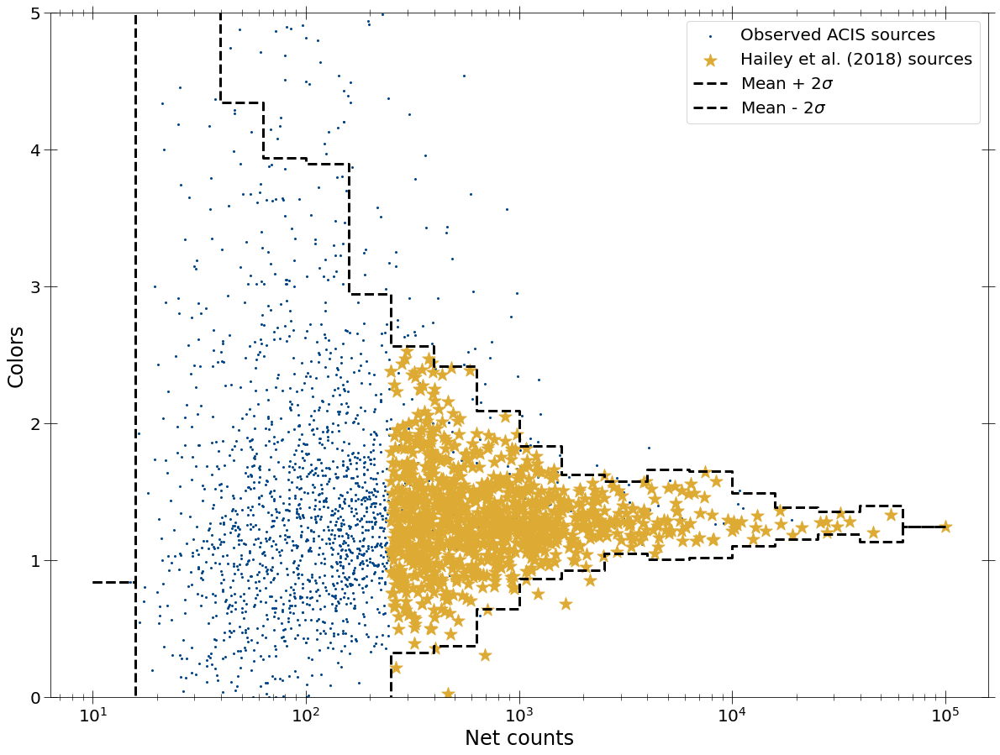

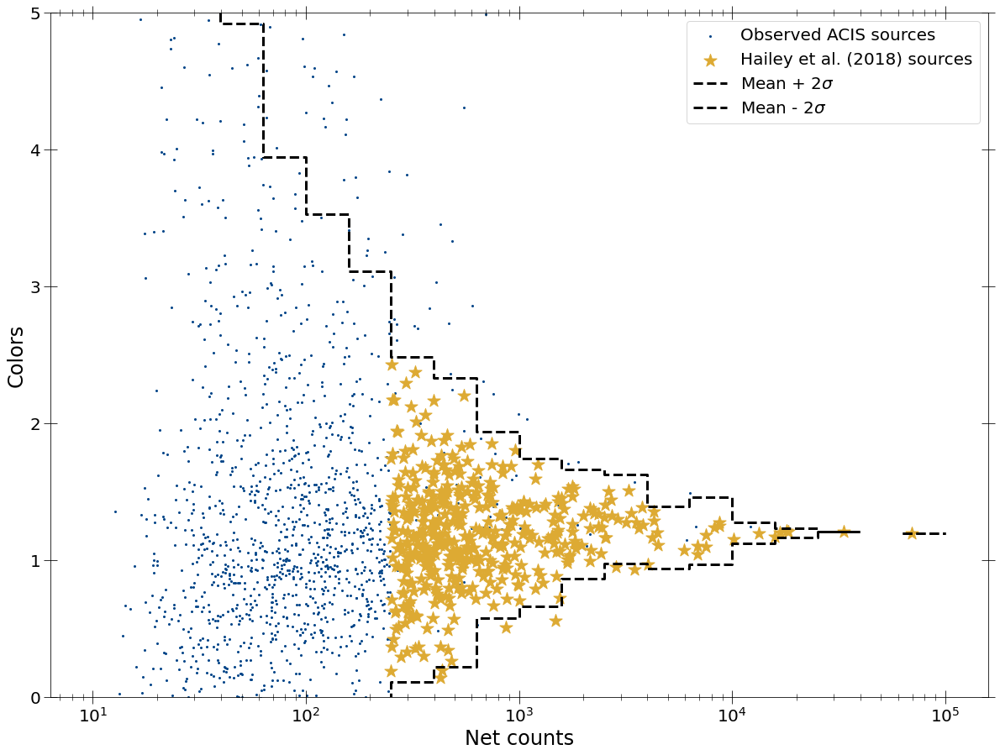

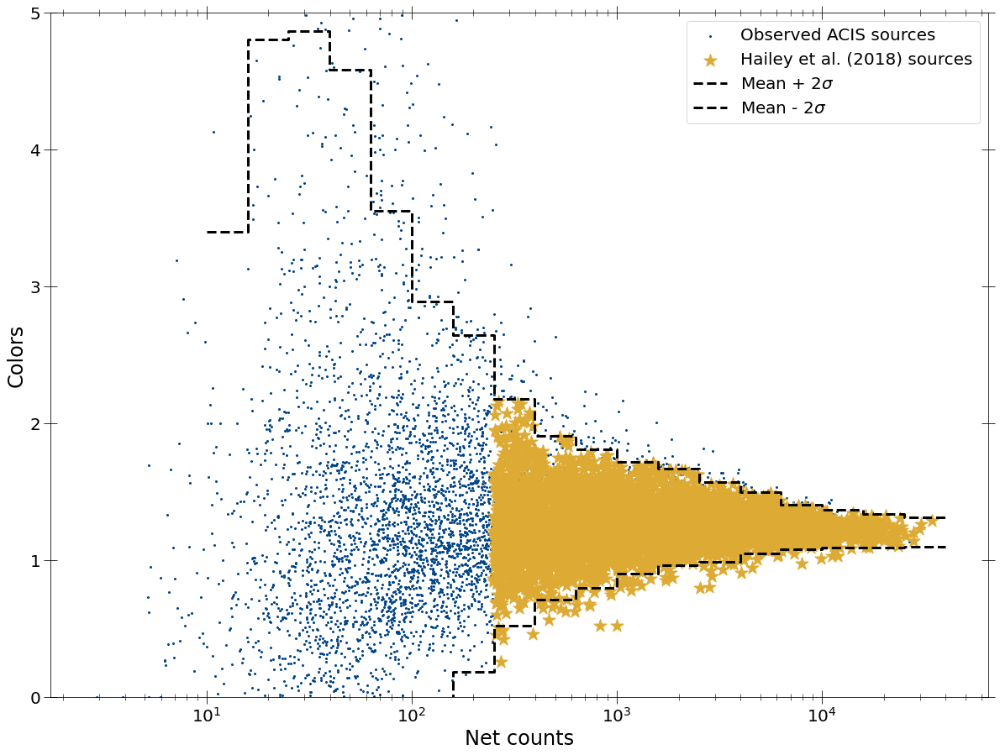

In [92]:
msps_as_msps_colors_pn, msps_as_msps_netcounts_pn = mark_interested_srcs(
    sim_msps_color_dict_arr[0], sim_msps_color_dict_arr[0],
    src_nums_xmm_msps, spec_summary_msps['spec_masks'][0][0],
    msps_as_msps_pn)
msps_as_msps_colors_mos, msps_as_msps_netcounts_mos = mark_interested_srcs(
    sim_msps_color_dict_arr[1], sim_msps_color_dict_arr[1],
    src_nums_xmm_msps, spec_summary_msps['spec_masks'][0][1],
    msps_as_msps_mos)
msps_as_msps_colors_acis, msps_as_msps_netcounts_acis = mark_interested_srcs(
    sim_msps_color_dict_arr[2], sim_msps_color_dict_arr[2],
    src_nums_chandra_msps, spec_summary_msps['spec_masks'][0][2],
    msps_as_msps_acis)

In [93]:
fit_stats_arr = [[pn_fit_stats_table_pl_msp, pn_fit_stats_table_pl_g_msp,
                  pn_fit_stats_table_pl_g2_msp],
                 [mos_fit_stats_table_pl_msp, mos_fit_stats_table_pl_g_msp,
                  mos_fit_stats_table_pl_g2_msp],
                 [acis_fit_stats_table_pl_msp, acis_fit_stats_table_pl_g_msp,
                  acis_fit_stats_table_pl_g2_msp]]

model_params_arr = [[pn_model_params_table_pl_msp, pn_model_params_table_pl_g_msp,
                     pn_model_params_table_pl_g2_msp],
                    [mos_model_params_table_pl_msp,
                     mos_model_params_table_pl_g_msp,
                     mos_model_params_table_pl_g2_msp],
                    [acis_model_params_table_pl_msp,
                     acis_model_params_table_pl_g_msp,
                     acis_model_params_table_pl_g2_msp]]

det_names = ['PN', 'MOS', 'ACIS']
model_names = ['PL', 'PL_Gauss', 'PL_Gauss3']

for i in range(3):
    for j in range(3):
        fits_file_name = ('Fit_stats_MSP_' + det_names[i] + '_' + model_names[j] +
                          '.txt')
        model_file_name = ('Model_params_MSP_' + det_names[i] + '_' + model_names[j] +
                          '.txt')
        print(fits_file_name, model_file_name)
        np.savetxt(fits_file_name, fit_stats_arr[i][j], fmt='%s')
        np.savetxt(model_file_name, model_params_arr[i][j], fmt='%s')

Fit_stats_MSP_PN_PL.txt Model_params_MSP_PN_PL.txt
Fit_stats_MSP_PN_PL_Gauss.txt Model_params_MSP_PN_PL_Gauss.txt
Fit_stats_MSP_PN_PL_Gauss3.txt Model_params_MSP_PN_PL_Gauss3.txt
Fit_stats_MSP_MOS_PL.txt Model_params_MSP_MOS_PL.txt
Fit_stats_MSP_MOS_PL_Gauss.txt Model_params_MSP_MOS_PL_Gauss.txt
Fit_stats_MSP_MOS_PL_Gauss3.txt Model_params_MSP_MOS_PL_Gauss3.txt
Fit_stats_MSP_ACIS_PL.txt Model_params_MSP_ACIS_PL.txt
Fit_stats_MSP_ACIS_PL_Gauss.txt Model_params_MSP_ACIS_PL_Gauss.txt
Fit_stats_MSP_ACIS_PL_Gauss3.txt Model_params_MSP_ACIS_PL_Gauss3.txt


8:80: E501 line too long (82 > 79 characters)
22:80: E501 line too long (82 > 79 characters)
24:80: E501 line too long (86 > 79 characters)
25:27: E128 continuation line under-indented for visual indent


In [94]:
def get_netcounthist_fraction(netcount_bins_arr, cand_netcounts_arr,
                              int_netcounts_arr, det_names_arr):
    """Get histogram of candidate sources based on a property."""
    interested_srcs_histogram = []
    candidate_srcs_histogram = []
    ratios = []
    err_ratios = []
    for i, netcount_bins in enumerate(netcount_bins_arr):
        print(netcount_bins)
        int_hist = np.histogram(int_netcounts_arr[i], bins=netcount_bins)[0]
        print(int_hist)
        cand_hist = np.histogram(cand_netcounts_arr[i], bins=netcount_bins)[0]
        print(cand_hist)
        ratio = cand_hist/int_hist
        err_ratio = ((cand_hist+1)**-0.5 + (int_hist+1)**-0.5)*ratio
        err_ratio[ratio==0] = 1.0/int_hist[ratio==0]
        print(ratio)
        print(err_ratio)
        
        interested_srcs_histogram.append(int_hist)
        candidate_srcs_histogram.append(cand_hist)
        ratios.append(ratio)
        err_ratios.append(err_ratio)
        
    fig, ax1 = plt.subplots()
    ax1.set_xlabel('Net counts')
    ax1.set_xscale('log')
    ax1.set_xlim(250,2.0E+6)
    ax1.set_ylabel('# of simulated CVs per bin')
    ax1.hist(int_netcounts_arr, bins=netcount_bins,
             color=['#6699cc', '#ee99aa', '#eecc66'])
    ax1.legend(det_names_arr, loc='lower right')
    
    ax2 = ax1.twinx()
    ax2.set_ylabel(r'$p(NL|CV)$')
    ax2.set_ylim(0, 1.0)
    line_colors = ['#004488', '#994455', '#997700']
    for i, netcount_bins in enumerate(netcount_bins_arr):
        ax2.errorbar(0.5*(netcount_bins[1:]+netcount_bins[:-1]),
                     ratios[i],
                     yerr=err_ratios[i], capsize=15, color=line_colors[i],
                     label=det_names_arr[i], capthick=3)
    ax2.legend()
    return (interested_srcs_histogram, candidate_srcs_histogram, ratios,
            err_ratios)

16:24: E225 missing whitespace around operator
16:49: E225 missing whitespace around operator
19:1: W293 blank line contains whitespace
24:1: W293 blank line contains whitespace
28:21: E231 missing whitespace after ','
33:1: W293 blank line contains whitespace


In [95]:
netcount_bins_2 = np.logspace(np.log10(250), 6.3, 6)

[2.50000000e+02 1.50782871e+03 9.09418962e+03 5.48499206e+04
 3.30817139e+05 1.99526231e+06]
[905 181  25   2   0]
[804 159  21   2   0]
[0.88839779 0.87845304 0.84       1.                nan]
[0.06082695 0.13456308 0.34382616 1.15470054        nan]
[2.50000000e+02 1.50782871e+03 9.09418962e+03 5.48499206e+04
 3.30817139e+05 1.99526231e+06]
[424  77   8   1   0]
[378  67   7   1   0]
[0.89150943 0.87012987 0.875      1.                nan]
[0.08903832 0.20404155 0.60102588 1.41421356        nan]
[2.50000000e+02 1.50782871e+03 9.09418962e+03 5.48499206e+04
 3.30817139e+05 1.99526231e+06]
[2312 1645  280    0    0]
[2069 1453  246    0    0]
[0.89489619 0.88328267 0.87857143        nan        nan]
[0.0382766  0.04493553 0.10831334        nan        nan]


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


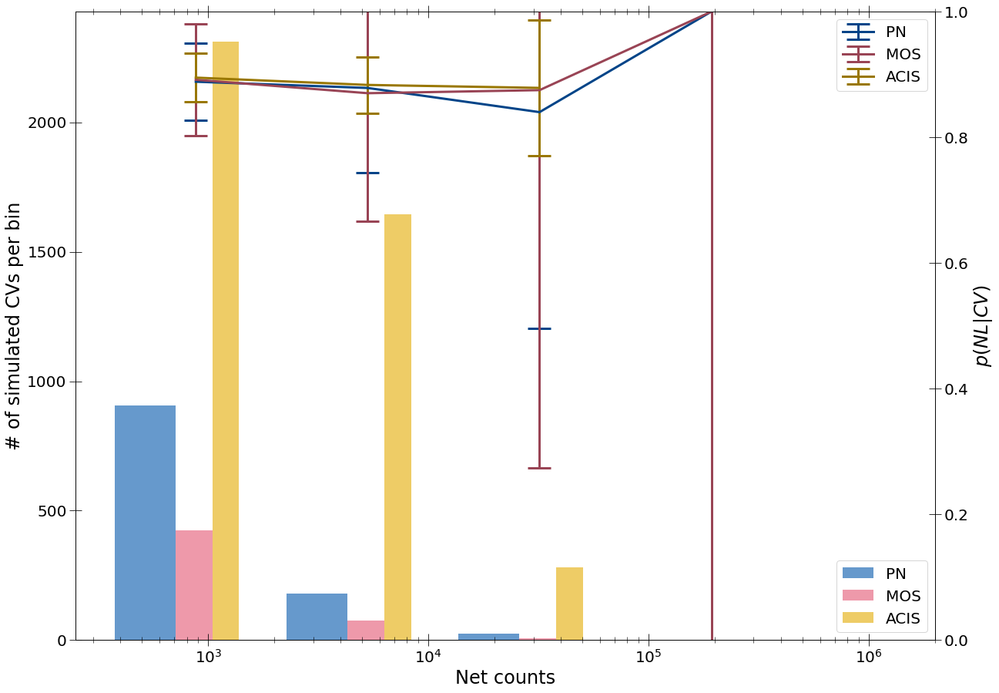

2:13: E127 continuation line over-indented for visual indent


In [96]:
(interested_msp_histogram, candidate_msp_histogram, ratios_msp,
            err_ratios_msp) = get_netcounthist_fraction(
    [netcount_bins_2, netcount_bins_2, netcount_bins_2],
    [msps_as_msps_netcounts_pn, msps_as_msps_netcounts_mos,
     msps_as_msps_netcounts_acis],
    [interested_msps_netcounts_pn, interested_msps_netcounts_mos,
     interested_msps_netcounts_acis], ['PN', 'MOS', 'ACIS'])

## Plotting color vs. hardness for MSPs

In [874]:
def get_color_hardness(det_srcspecs, det_bgspecs, det_ebins, soft_enrange=None,
                       hard_enrange=None):
    if soft_enrange is None:
        soft_enrange = [2.0, 4.0]
    if hard_enrange is None:
        hard_enrange = [4.0, 8.0]
    det_net_specs = det_srcspecs - det_bgspecs
    det_soft_counts = get_counts_enrange(det_net_specs, soft_enrange, det_ebins,
                                         floor_counts=None)[0]
    det_hard_counts = get_counts_enrange(det_net_specs, hard_enrange, det_ebins,
                                         floor_counts=None)[0]
    line_cont_counts = get_line_cont_counts(
        det_srcspecs, det_bgspecs, det_ebins)
    fe_net = line_cont_counts[0][0]
    cont1_net = line_cont_counts[1][0]
    cont2_net = line_cont_counts[2][0]
    colors = get_colors_basic(fe_net, cont1_net, cont2_net)
    hardness = (det_hard_counts - det_soft_counts)/(det_hard_counts +
                                                    det_soft_counts)
    return colors, hardness

8:80: E501 line too long (80 > 79 characters)
10:80: E501 line too long (80 > 79 characters)


In [864]:
ebins_arr = spec_summary_msps['ebins'][0]
spec_mask_obs = spec_summary_msps['spec_masks'][1]
src_specs_obs = spec_summary_msps['specs'][2]
bgspecs_obs = spec_summary_msps['specs'][3]
candidate_args_alldet = [candidadate_msps_pn_args, candidadate_msps_mos_args,
                         candidadate_msps_acis_args]
color_arr = []
hr2_arr = []
for i in range(3):
    good_mask = spec_mask_obs[i]
    colors, hardness = get_color_hardness(
        ((src_specs_obs[i][good_mask])[interested_msp_args_alldet[i]])[candidate_args_alldet[i]],
        ((bgspecs_obs[i][good_mask])[interested_msp_args_alldet[i]])[candidate_args_alldet[i]], 
        ebins_arr[i])
    color_arr.append(colors)
    hr2_arr.append(hardness)

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:709: RuntimeWarning: divide by zero encountered in true_divide
12:80: E501 line too long (97 > 79 characters)
13:80: E501 line too long (95 > 79 characters)
13:96: W291 trailing whitespace


In [873]:
len(ebins_arr[2])

1025

In [769]:
ebins_arr = spec_summary_msps['ebins'][0]
srcspecs_msp_sim = spec_summary_msps['specs'][0]
bgspecs_msp_sim = spec_summary_msps['specs'][1]
specmasks_msp_sim = spec_summary_msps['spec_masks'][0]
spec_mask_obs = spec_summary_msps['spec_masks'][1]
candidate_specs_msp_pn
netcounts_msp = spec_summary_msps['counts'][0]
color_arr = []
hr2_arr = []
for i in range(3):
    good_mask = np.logical_and(specmasks_msp_sim[i], netcounts_msp[i][0] > 250)
    colors, hardness = get_color_hardness(
        srcspecs_msp_sim[i][good_mask], bgspecs_msp_sim[i][good_mask], 
        ebins_arr[i])
    color_arr.append(colors)
    hr2_arr.append(hardness)

11:71: W291 trailing whitespace


(array([[0.05654762, 0.        , 0.05654762, 0.62202381, 0.67857143,
         1.30059524, 0.96130952, 0.50892857, 0.11309524, 0.16964286,
         0.22619048, 0.        , 0.05654762, 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        ],
        [0.08796296, 0.        , 0.17592593, 0.35185185, 0.96759259,
         2.02314815, 0.79166667, 0.17592593, 0.        , 0.        ,
         0.17592593, 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.06168831, 0.24675325, 0.61688312,
         0.98701299, 1.41883117, 0.67857143, 0.37012987, 0.18506494,
         0.18506494, 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        ]]),
 array([0.        , 0.21052632, 0.42105263, 0.63157895, 0.84210526,
        1.05263158, 1.26315789, 1.47368421, 1.68421053, 1.89473684,
        2.10526316, 2.31578947, 2.52631579, 2.73684211, 2.94736842,

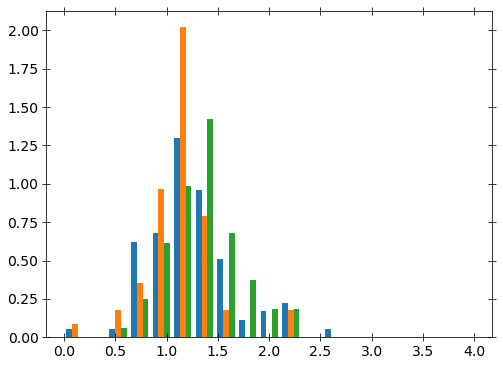

In [876]:
mybins = np.linspace(0, 4, 20)
plt.hist(color_arr, bins=mybins, density=True)

NameError: name 'hr2_arr' is not defined

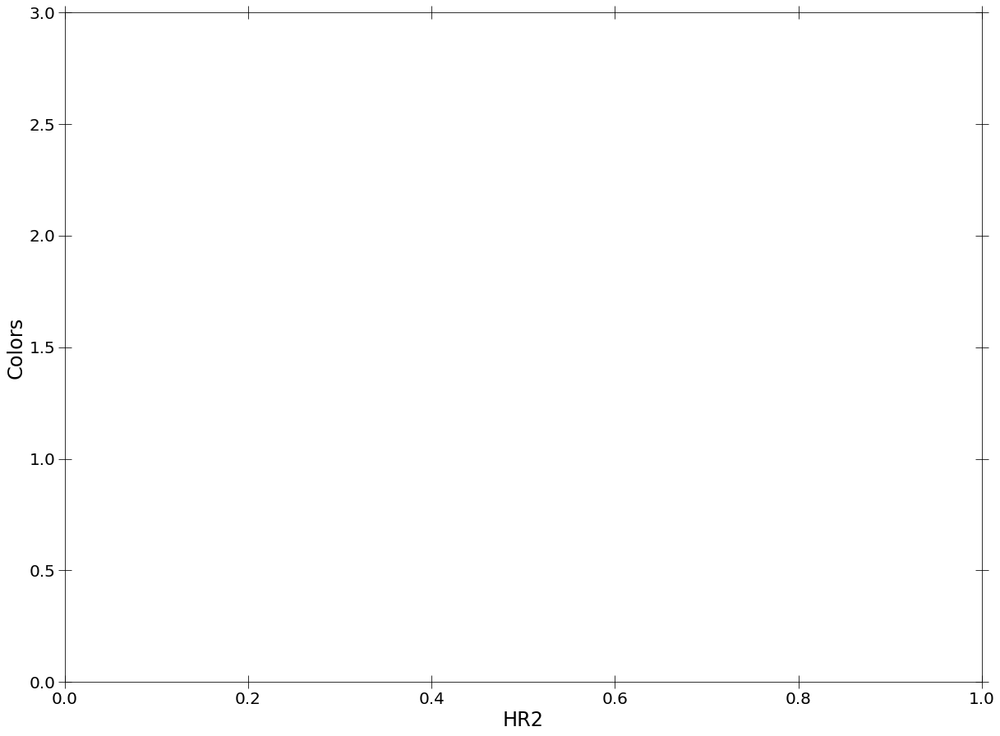

In [40]:
plt.xlabel('HR2')
plt.ylabel('Colors')
plt.ylim(0, 3)
plt.scatter(hr2_arr[0], color_arr[0], s=5)

In [ ]:
plt.xlabel('HR2')
plt.ylabel('Colors')
plt.ylim(0, 3)
plt.scatter(hr2_arr[1], color_arr[1], s=5)

In [858]:
sns.kdeplot

<function seaborn.distributions.kdeplot(x=None, *, y=None, shade=None, vertical=False, kernel=None, bw=None, gridsize=200, cut=3, clip=None, legend=True, cumulative=False, shade_lowest=None, cbar=False, cbar_ax=None, cbar_kws=None, ax=None, weights=None, hue=None, palette=None, hue_order=None, hue_norm=None, multiple='layer', common_norm=True, common_grid=False, levels=10, thresh=0.05, bw_method='scott', bw_adjust=1, log_scale=None, color=None, fill=None, data=None, data2=None, **kwargs)>

In [881]:
np.where(spec_summary_msps['src_nums'][1] == '2CXOJ174539.4-290041')

(array([1505]),)

In [891]:
np.where(ebins_arr[2] <= 8)[0][-1]

547

(2, 10)

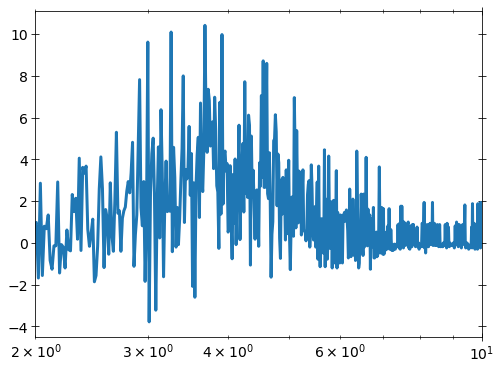

1:80: E501 line too long (91 > 79 characters)


In [884]:
test_spec = spec_summary_msps['specs'][2][2][1505] - spec_summary_msps['specs'][3][2][1505]
plt.plot(spec_summary_msps['ebins'][1][2], test_spec)
plt.xscale('log')
plt.xlim(2, 10)

In [894]:
hardcounts

340.4679037111226

In [892]:
softcounts = np.sum(test_spec[137:274])
hardcounts = np.sum(test_spec[274:547])
print((hardcounts - softcounts)/(hardcounts+softcounts))

0.033966612895659616


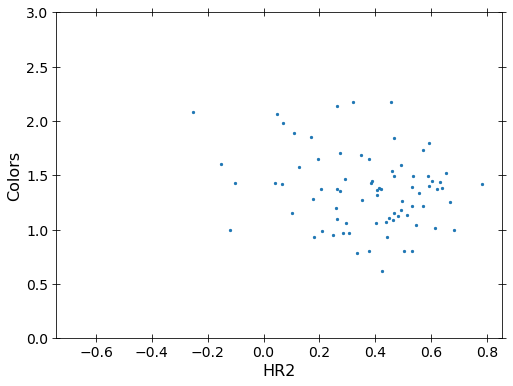

In [868]:
plt.xlabel('HR2')
plt.ylabel('Colors')
plt.ylim(0, 3)
plt.scatter(hr2_arr[2], color_arr[2], s=5)

In [684]:
sim_msp_spectra_norm_pn = spec_summary_msps['norm_specs'][0][0][
    np.logical_and(spec_summary_msps['spec_masks'][0][0],
                   spec_summary_msps['counts'][0][0][0] > 250)]
sim_msp_spectra_norm_mos = spec_summary_msps['norm_specs'][1][0][
    np.logical_and(spec_summary_msps['spec_masks'][0][1],
                   spec_summary_msps['counts'][0][1][0] > 250)]
sim_msp_spectra_norm_acis = spec_summary_msps['norm_specs'][2][0][
    np.logical_and(spec_summary_msps['spec_masks'][0][2],
                   spec_summary_msps['counts'][0][2][0] > 250)]

In [720]:
spec_summary_msps['specs'][0][0].shape

(20000, 4096)

In [692]:
print(np.where(spec_summary_msps['ebins'][0][0] >= 2)[0][0])
print(np.where(spec_summary_msps['ebins'][0][1] >= 2)[0][0])
print(np.where(spec_summary_msps['ebins'][0][2] >= 2)[0][0])

400
400
137


In [693]:
print(np.where(spec_summary_msps['ebins'][0][0] >= 4)[0][0])
print(np.where(spec_summary_msps['ebins'][0][1] >= 4)[0][0])
print(np.where(spec_summary_msps['ebins'][0][2] >= 4)[0][0])

800
800
274


In [695]:
print(np.where(spec_summary_msps['ebins'][0][0] >= 8)[0][0])
print(np.where(spec_summary_msps['ebins'][0][1] >= 8)[0][0])
print(np.where(spec_summary_msps['ebins'][0][2] >= 8)[0][0])

1600
1600
548


In [710]:
print(np.where(spec_summary_msps['ebins'][0][0] < 10)[0][-1])
print(np.where(spec_summary_msps['ebins'][0][1] < 10)[0][-1])
print(np.where(spec_summary_msps['ebins'][0][2] < 10)[0][-1])

1999
1999
684


In [717]:
netcounts_softband = []
netcounts_hardband = []
hr2_arr = []
norm_specs = [sim_msp_spectra_norm_pn, sim_msp_spectra_norm_mos,
              sim_msp_spectra_norm_acis]
for i, norm_spec in enumerate(norm_specs):
    if i == 2:
        netcount_soft = np.sum(norm_spec[:, 0:137], axis=1)
        netcount_hard = np.sum(norm_spec[:, 137:411], axis=1)
    else:
        netcount_soft = np.sum(norm_spec[:, 0:400], axis=1)
        netcount_hard = np.sum(norm_spec[:, 400:1200], axis=1)
    netcount_soft[netcount_soft < 0] = 0
    hr2 = (netcount_hard - netcount_soft)/(netcount_hard + netcount_soft)
    netcounts_softband.append(netcount_soft)
    netcounts_hardband.append(netcount_hard)
    hr2_arr.append(hr2)

(array([ 98., 366., 686., 612., 526., 478., 459., 465., 495., 185.]),
 array([-0.10868303,  0.00218527,  0.11305357,  0.22392188,  0.33479018,
         0.44565848,  0.55652679,  0.66739509,  0.77826339,  0.8891317 ,
         1.        ]),
 <BarContainer object of 10 artists>)

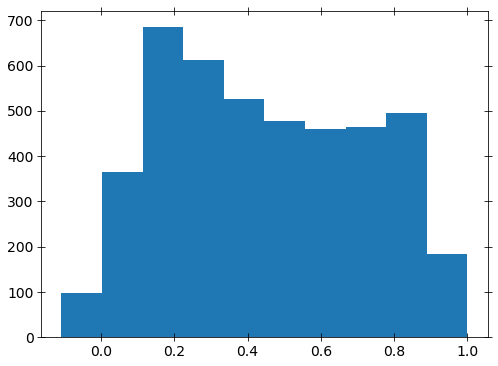

In [718]:
plt.hist(hr2)

## Constructing tables

In [646]:
import pandas as pd

In [76]:
def get_netcounts(src_num_list, det_num):
    net_counts = []
    for src_num in src_num_list:
        if det_num == 2:
            index = np.where(spec_summary_msps['src_nums'][1] == src_num)[0][0]
        else:
            index = np.where(spec_summary_msps['src_nums'][0] == src_num)[0][0]
        net_count = spec_summary_msps['counts'][0][det_num][1][index]
        net_counts.append(net_count)
    return np.array(net_counts)

In [78]:
pn_counts = get_netcounts(interested_msps_xmm, 0)
mos_counts = get_netcounts(interested_msps_xmm, 1)
acis_counts = get_netcounts(interested_msp_srcs_alldet[2], 2)

In [123]:
def get_colors(src_num_list, det_num):
    colors = []
    for src_num in src_num_list:
        if det_num == 2:
            refined_src_nums = spec_summary_msps['src_nums'][1][
                spec_summary_msps['spec_masks'][1][det_num]]
        else:
            refined_src_nums = spec_summary_msps['src_nums'][0][
                spec_summary_msps['spec_masks'][1][det_num]]
        index = np.where(refined_src_nums == src_num)[0]
        if len(index) > 0:
            color = obs_color_dict_arr[det_num]['colors'][index][0]
        else:
            color = ''
        colors.append(color)
    return np.array(colors)

In [124]:
pn_colors = get_colors(interested_msps_xmm, 0)
mos_colors = get_colors(interested_msps_xmm, 1)
acis_colors = get_colors(interested_msp_srcs_alldet[2], 2)

In [154]:
print(r'$6_{-3}^{10}$')

$6_{-3}^{10}$


In [161]:
def combine_xmm_tables(pn_table, mos_table, src_num_list):
    combined_table = []
    for src_num in src_num_list:
        index = np.where(interested_msp_srcs_alldet[0] == src_num)[0]
        if len(index) > 0:
            combined_table.append(pn_table[index[0]])
        else:
            index = np.where(interested_msp_srcs_alldet[1] == src_num)[0][0]
            combined_table.append(mos_table[index])
    return np.array(combined_table)

In [162]:
xmm_pl_fit_stats_table = combine_xmm_tables(pn_fit_stats_table_pl, mos_fit_stats_table_pl, interested_msps_xmm)
xmm_pl_g_fit_stats_table = combine_xmm_tables(pn_fit_stats_table_pl_g, mos_fit_stats_table_pl_g, interested_msps_xmm)
xmm_pl_g3_fit_stats_table = combine_xmm_tables(pn_fit_stats_table_pl_g2, mos_fit_stats_table_pl_g2, interested_msps_xmm)

In [163]:
xmm_pl_model_params_table = combine_xmm_tables(pn_model_params_table_pl, mos_model_params_table_pl, interested_msps_xmm)
xmm_pl_g_model_params_table = combine_xmm_tables(pn_model_params_table_pl_g, mos_model_params_table_pl_g, interested_msps_xmm)
xmm_pl_g3_model_params_table = combine_xmm_tables(pn_model_params_table_pl_g2, mos_model_params_table_pl_g2, interested_msps_xmm)

In [164]:
xmm_pl_model_params_table

array([['207622503010010', '35.678603475906634', '2.219063864686178',
        '550.1841075103729'],
       ['201129704010056', '35.21642382863714', '1.3898448050228855',
        '0.14208766163194325'],
       ['206586001010073', '7.226428980882998', '1.0654945030985',
        '0.3649178162811975'],
       ...,
       ['207234104010014', '5.31144981758402', '1.4381775101383857e-06',
        '6.393006417275824'],
       ['208441011010211', '3.1249634536016018', '1.3753767510850454',
        '0.8444880167700237'],
       ['202026707010124', '15.066639829922307', '2.047389237954444',
        '0.34784814214255']], dtype='<U32')

In [ ]:
xmm_indices = []
for src_num in interested_msps_xmm:
    index_pn = np.where(interested_msp_srcs_alldet[0] == src_num)[0]

In [135]:
pn_indices = []
for src_num in interested_msps_xmm:
    index_my = np.where(interested_msp_srcs_alldet[0] == src_num)[0]
    if len(index_my) > 0:
        pn_indices.append(index_my[0])
    else:
        pn_indices.append(np.nan)

In [144]:
interested_msp_srcs_alldet[0][pn_indices[3]]

'208861209010009'

In [136]:
mos_indices = []
for src_num in interested_msps_xmm:
    index_my = np.where(interested_msp_srcs_alldet[1] == src_num)[0]
    if len(index_my) > 0:
        mos_indices.append(index_my[0])
    else:
        mos_indices.append(np.nan)

In [146]:
interested_msp_srcs_alldet[1][mos_indices[3]]

'208861209010009'

In [138]:
np.where(np.logical_and(~np.isnan(pn_indices), ~np.isnan(mos_indices)))

(array([  3,   5,   8,  11,  21,  27,  32,  35,  39,  40,  43,  51,  54,
         64,  68,  74,  76,  79,  84,  91,  94,  96, 100, 105, 106, 108,
        115, 120, 122, 123, 126, 128, 130, 137, 141, 145, 147, 149, 153,
        154, 162, 163, 168, 172, 180, 182, 201, 203, 207, 218, 219, 223,
        231, 233, 236, 244, 249, 250, 253, 258, 263, 264, 265]),)

In [149]:
pn_fit_stats_table_pl[pn_indices[5]]

['207234103010044', 2266.842375634099, -4.021812244509783, 50.0, 1842]

In [148]:
mos_fit_stats_table_pl[mos_indices[5]]

['207234103010044', 2266.842375634099, -4.021812244509783, 50.0, 1842]

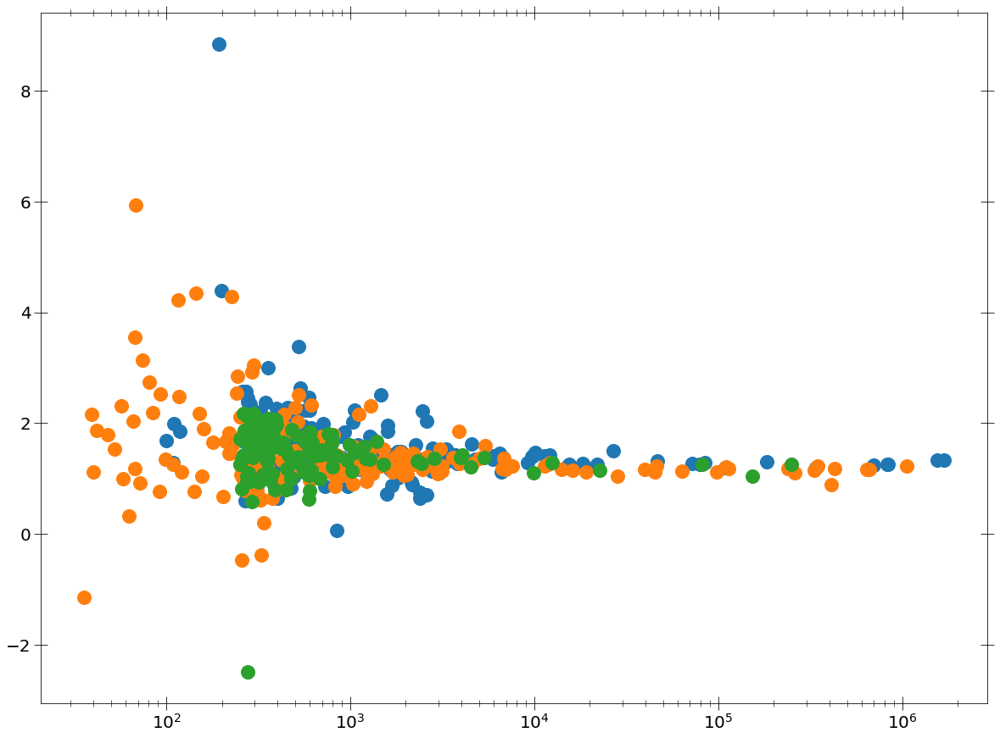

In [110]:
plt.scatter(pn_counts, pn_colors)
plt.scatter(mos_counts, mos_colors)
plt.scatter(acis_counts, acis_colors)
plt.xscale('log')

In [88]:
from astropy.table import Table
from astropy.table.pprint import conf
conf.max_lines = -1
conf.max_width = -1

In [89]:
Table(np.column_stack([interested_msps_xmm, pn_counts, mos_counts]))

col0,col1,col2
str32,str32,str32
207622503010010,0.0,260338.00351399818
201129704010056,294.6517654691121,39.05389726075383
206586001010073,0.0,429.331159172748
208861209010009,553.6794065557835,441.9934683768305
201129707010045,108.88090819793108,2194.314032455358
207234103010044,697.7421205630355,2708.677123052165
207234103010039,193.48756216007803,689.4994864562675
205049406010002,0.0,28122.74572076179
208624706010006,182106.79592806142,113492.41752644595


In [125]:
xmm_table = np.column_stack([
    interested_msps_xmm, pn_counts, mos_counts, pn_colors, mos_colors])

In [126]:
xmm_table

array([['207622503010010', '0.0', '260338.00351399818', '',
        '1.1102147456631106'],
       ['201129704010056', '294.6517654691121', '39.05389726075383',
        '0.6643177106250369', '2.156554968512752'],
       ['206586001010073', '0.0', '429.331159172748', '',
        '1.3715557469613593'],
       ...,
       ['207234104010014', '3455.220096822172', '788.6757864713956',
        '1.448223470701307', '1.2673457969079118'],
       ['208441011010211', '313.9719350424038', '255.23950236391423',
        '0.9092417091695721', '1.3567373283678508'],
       ['202026707010124', '0.0', '422.5411983022563', '',
        '0.9504117422174571']], dtype='<U32')

In [ ]:
def correct_tables(value_table, low_valuetable, hugh_value_table):
    